In [1]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader

from PIL import Image
import torchvision
from torchvision import datasets, models, transforms
from torchvision.transforms import ToTensor
import matplotlib.pyplot as plt
from sklearn.metrics import *
import time
import os
from torch.utils import data
import random
import copy
import itertools
import io

# Tensorboard for logging
from torch.utils.tensorboard import SummaryWriter



In [2]:
if torch.cuda.is_available():
    device = torch.device('cuda') 
else:
    device = torch.device('cpu')
    
torch.cuda.set_device(0)
print(device)

cuda


In [3]:
# root directory
root_dir = "/home/andreasabo/Documents/HNProject/"

# data directory on current machine: abhishekmoturu, andreasabo, denizjafari, navidkorhani
data_dir = "/home/andreasabo/Documents/HNProject/all_label_img/"

# read target df
csv_path = os.path.join(root_dir, "all_splits_100000.csv")
data_df = pd.read_csv(csv_path, usecols=['subj_id', 'image_ids', 'view_label', 'view_train'])
data_df.head

<bound method NDFrame.head of        image_ids     view_label  subj_id  view_train
0       1323_2_1        Missing     1323         NaN
1       1323_2_2        Missing     1323         NaN
2       1323_2_3        Missing     1323         NaN
3       1323_2_4        Missing     1323         NaN
4       1323_2_5        Missing     1323         NaN
...          ...            ...      ...         ...
72454  1066_7_50  Saggital_Left     1066         0.0
72455  1066_7_51  Saggital_Left     1066         0.0
72456  1066_7_52  Saggital_Left     1066         0.0
72457  1066_7_53  Saggital_Left     1066         0.0
72458  1066_7_54          Other     1066         0.0

[72459 rows x 4 columns]>

### **Hyperparameters**

In [4]:
# Models to choose from [resnet, alexnet, vgg, squeezenet, densenet, inception]
model_name = "resnet"

# Number of classes in the dataset: right_sag, right_trav, left_sag, left_trav, bladder, other
num_classes = 6

# Batch size for training (change depending on how much memory you have)
batch_size = 64

# Number of epochs to train for
num_epochs = 300

# Flag for feature extracting. When False, we finetune the whole model; when True we only update the reshaped layer params
feature_extract = False

### **Reading Data Indicies and Labels**

In [5]:
label_mapping = {'Other':0, 'Saggital_Right':1, 'Transverse_Right':2, 
                 'Saggital_Left':3, 'Transverse_Left':4, 'Bladder':5}
label_unmapping = {0: 'Other', 1:'Saggital_Right', 2: 'Transverse_Right', 
                   3:'Saggital_Left', 4:'Transverse_Left', 5: 'Bladder'}

data_df['view_label'] = data_df['view_label'].map(label_mapping)

train_df = data_df[data_df.view_train == 1]
test_df = data_df[data_df.view_train == 0]

labels = {}
train_and_valid_subj_ids = []
train_and_valid_image_ids = []
test_ids = []

for ind, row in train_df.iterrows():
    train_and_valid_subj_ids.append(row['subj_id'])
    train_and_valid_image_ids.append(row['image_ids'])
    labels[row['image_ids']] = row['view_label']

for ind, row in test_df.iterrows():
    test_ids.append(row['image_ids'])
    labels[row['image_ids']] = row['view_label']

s = set()
t_v_ids = pd.DataFrame(list(zip(train_and_valid_subj_ids, train_and_valid_image_ids)), columns=['subj_ids', 'image_ids'])
id_groups = [t_v_ids for _, t_v_ids in t_v_ids.groupby('subj_ids')]
random.shuffle(id_groups)
id_groups = pd.concat(id_groups).reset_index(drop=True)
train_val_split = int(0.8*len(set(id_groups['subj_ids'].values)))
train_val_set = [i for i in id_groups['subj_ids'].values if not (i in s or s.add(i))]
cutoff = train_val_set[train_val_split]
train_portion = (id_groups['subj_ids'].values == cutoff).argmax()

train_ids = id_groups[:train_portion]['image_ids'].tolist()
valid_ids = id_groups[train_portion:]['image_ids'].tolist()

partition = {'train':train_ids, 'valid':valid_ids}

In [6]:
def plot_confusion_matrix_local(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          normalize=False):
    """
    given a sklearn confusion matrix (cm), make a nice plot

    Arguments
    ---------
    cm:           confusion matrix from sklearn.metrics.confusion_matrix

    target_names: given classification classes such as [0, 1, 2]
                  the class names, for example: ['high', 'medium', 'low']

    title:        the text to display at the top of the matrix

    cmap:         the gradient of the values displayed from matplotlib.pyplot.cm
                  see http://matplotlib.org/examples/color/colormaps_reference.html
                  plt.get_cmap('jet') or plt.cm.Blues

    normalize:    If False, plot the raw numbers
                  If True, plot the proportions

    Usage
    -----
    plot_confusion_matrix(cm           = cm,                  # confusion matrix created by
                                                              # sklearn.metrics.confusion_matrix
                          normalize    = True,                # show proportions
                          target_names = y_labels_vals,       # list of names of the classes
                          title        = best_estimator_name) # title of graph

    Citiation
    ---------
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    """
    import matplotlib.pyplot as plt
    import numpy as np
    import itertools

    accuracy = np.trace(cm) / np.sum(cm).astype('float')
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    plt.show()

In [7]:
# https://www.tensorflow.org/tensorboard/image_summaries
# def plot_to_image(figure):
#   """Converts the matplotlib plot specified by 'figure' to a PNG image and
#   returns it. The supplied figure is closed and inaccessible after this call."""
#   # Save the plot to a PNG in memory.
#   buf = io.BytesIO()
#   plt.savefig(buf, format='png')
#   # Closing the figure prevents it from being displayed directly inside
#   # the notebook.
#   plt.close(figure)
#   buf.seek(0)
#   # Convert PNG buffer to TF image
#   image = tf.image.decode_png(buf.getvalue(), channels=4)
#   # Add the batch dimension
#   image = tf.expand_dims(image, 0)
#   return image

### **Model**

In [8]:
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, is_inception=False, writer = None):
    since = time.time()
    classnames = ['Other', 'Saggital_Right', 'Transverse_Right', 'Saggital_Left','Transverse_Left', 'Bladder']
    val_acc_history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 54)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            
            running_preds = []
            running_labels = []

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                labels = labels.type(torch.long)
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()
                
                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    # Special case for inception because in training it has an auxiliary output. In train
                    #   mode we calculate the loss by summing the final output and the auxiliary output
                    #   but in testing we only consider the final output.
                    if is_inception and phase == 'train':
                        # From https://discuss.pytorch.org/t/how-to-optimize-inception-model-with-auxiliary-classifiers/7958
                        outputs, aux_outputs = model(inputs)
                        loss1 = criterion(outputs, labels)
                        loss2 = criterion(aux_outputs, labels)
                        loss = loss1 + 0.4*loss2
                    else:
                        outputs = model(inputs)
                        labels = torch.argmax(labels, 1)
                        running_preds += torch.argmax(outputs, 1).tolist()
                        running_labels += labels.tolist()
                        loss = criterion(outputs, labels)

                    preds = torch.argmax(outputs, 1)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            
            print('{} loss:\t{:.4f} | {} acc:\t{:.4f}\n'.format(phase, epoch_loss, phase, epoch_acc))
            # Log to tensorboard for visualization
            if writer is not None and phase == 'train':
                writer.add_scalar('Loss/train', epoch_loss, epoch)
                writer.add_scalar('Accuracy/train', epoch_acc, epoch)
#                 cm = confusion_matrix(running_labels, running_preds)
#                 figure = plot_confusion_matrix_local(cm, classnames)
#                 writer.add_image('confusion_matrix/train', figure, epoch)
                
                
                
            if writer is not None and phase == 'val':
                writer.add_scalar('Loss/val', epoch_loss, epoch)
                writer.add_scalar('Accuracy/val', epoch_acc, epoch)
               
                #COmpute and log f1, precision, recall for each class
                for c in range(6):
                    running_labels = np.asarray(running_labels)
                    running_preds = np.asarray(running_preds)

                    cur_c_labs_bin = np.asarray([0] *len(running_labels))
                    cur_c_preds_bin = np.asarray([0] *len(running_labels))

                    # Need to binarize
                    cur_c_preds_bin[running_preds == c] = 1
                    cur_c_labs_bin[running_labels == c] = 1
                    f1 = f1_score(cur_c_labs_bin, cur_c_preds_bin)
                    precision = precision_score(cur_c_labs_bin, cur_c_preds_bin)
                    recall = recall_score(cur_c_labs_bin, cur_c_preds_bin)
                    writer.add_scalar(f'f1/{c}', f1, epoch)
                    writer.add_scalar(f'precision/{c}', precision, epoch)
                    writer.add_scalar(f'recall/{c}', recall, epoch)
                    
            if phase == 'train':
                print(classification_report(running_labels, running_preds))
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
                print(classification_report(running_labels, running_preds))
            if phase == 'val':
                val_acc_history.append(epoch_acc)

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, val_acc_history

In [9]:
def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

In [10]:
def initialize_model(model_name, num_classes, feature_extract, use_pretrained=True):
    # Initialize these variables which will be set in this if statement. Each of these
    #   variables is model specific.
    model_ft = None
    input_size = 0

    if model_name == "resnet":
        """ Resnet18
        """
        model_ft = models.resnet18(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes)
        input_size = 256

    elif model_name == "alexnet":
        """ Alexnet
        """
        model_ft = models.alexnet(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[6].in_features
        model_ft.classifier[6] = nn.Linear(num_ftrs,num_classes)
        input_size = 224

    elif model_name == "vgg":
        """ VGG11_bn
        """
        model_ft = models.vgg11_bn(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[6].in_features
        model_ft.classifier[6] = nn.Linear(num_ftrs,num_classes)
        input_size = 224

    elif model_name == "squeezenet":
        """ Squeezenet
        """
        model_ft = models.squeezenet1_0(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        model_ft.classifier[1] = nn.Conv2d(512, num_classes, kernel_size=(1,1), stride=(1,1))
        model_ft.num_classes = num_classes
        input_size = 224

    elif model_name == "densenet":
        """ Densenet
        """
        model_ft = models.densenet121(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier.in_features
        model_ft.classifier = nn.Linear(num_ftrs, num_classes)
        input_size = 224

    elif model_name == "inception":
        """ Inception v3
        Be careful, expects (299,299) sized images and has auxiliary output
        """
        model_ft = models.inception_v3(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        # Handle the auxilary net
        num_ftrs = model_ft.AuxLogits.fc.in_features
        model_ft.AuxLogits.fc = nn.Linear(num_ftrs, num_classes)
        # Handle the primary net
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs,num_classes)
        input_size = 299

    else:
        print("Invalid model name, exiting...")
        exit()

    return model_ft, input_size

# Initialize the model for this run
model_ft, input_size = initialize_model(model_name, num_classes, feature_extract, use_pretrained=False)

class ViewNet(nn.Module):

    
    def __init__(self, num_classes, conv1_filters, conv2_filters, conv3_filters, linear1_size, dropout):
        super(ViewNet, self).__init__()
        self.conv1_filters = conv1_filters
        self.conv2_filters = conv2_filters
        self.conv3_filters = conv3_filters
        self.linear1_size = linear1_size
        self.drop_percent = dropout
        
        self.conv1 = nn.Conv2d(1, self.conv1_filters, 4, padding=2)
        self.conv2 = nn.Conv2d(self.conv1_filters, self.conv2_filters, 4, padding=2)
        self.conv3 = nn.Conv2d(self.conv2_filters, self.conv3_filters, 4, padding=2)
        self.pool = nn.MaxPool2d(4, 4)
        self.dropout = nn.Dropout(self.drop_percent)
        self.linear1 = nn.Linear(self.conv3_filters*4*4, self.linear1_size)
        self.dropout = nn.Dropout(self.drop_percent)
        self.linear2 = nn.Linear(self.linear1_size, num_classes)
    
    def forward(self, x):
        x = self.pool(self.dropout(F.relu(self.conv1(x))))
        x = self.pool(self.dropout(F.relu(self.conv2(x))))
        x = self.pool(self.dropout(F.relu(self.conv3(x))))
        x = x.view(-1, self.conv3_filters*4*4) ## reshaping 
        x = self.dropout(F.relu((self.linear1(x))))
        x = self.linear2(x)
        return x



### **Data Loading**

In [11]:
class Dataset(data.Dataset):
  'Characterizes a dataset for PyTorch'
  def __init__(self, list_IDs, labels, transformations=None):
        'Initialization'
        self.labels = labels
        self.list_IDs = list_IDs
        self.transformations = transformations
  def __len__(self):
        'Denotes the total number of samples'
        return len(self.list_IDs)

  def __getitem__(self, index):
        'Generates one sample of data'
        # Select sample
        ID = self.list_IDs[index]

        # Load data and get label
        img_path = data_dir + ID + '.jpg'
        image = Image.open(img_path).convert('L')
        
        if self.transformations:
            image = self.transformations(image)
        
        
        image = ToTensor()(image)
        
        
        
        y = torch.FloatTensor([0]*6)        
        y[int(self.labels[ID])] = 1

        return image, y

In [12]:
# Data augmentation and normalization for training

# Parameters
params = {'batch_size': batch_size,
          'shuffle': True,
          'num_workers': 6}
transformation = transforms.Compose([transforms.RandomAffine(degrees=8, translate=(0.1, 0.1), scale=(0.95,1.25))])
# Generators
training_set = Dataset(partition['train'], labels, transformations = transformation)
training_generator = data.DataLoader(training_set, **params)

validation_set = Dataset(partition['valid'], labels)
validation_generator = data.DataLoader(validation_set, **params)

dataloaders_dict = {'train':training_generator, 'val':validation_generator}

(array([ 1,  3,  6,  7, 15, 16, 20, 21, 25, 27, 29, 34, 36, 40, 42, 49, 56,
       58, 59, 63]),)
(array([ 4, 10, 11, 12, 17, 18, 33, 39, 43, 44, 46, 51, 54, 57]),)
(array([23, 26, 28, 30, 45, 47]),)
(array([ 2,  8, 14, 19, 22, 31, 52, 53, 55, 62]),)
(array([ 9, 13, 38, 41, 48, 50, 60]),)
(array([ 0,  5, 24, 32, 35, 37, 61]),)


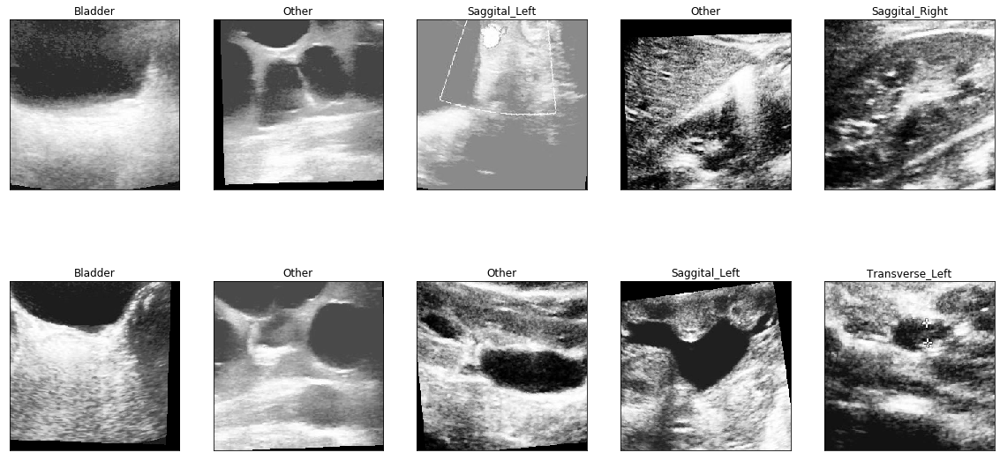

In [13]:
# Lets check that the data augmentation makes sense


for inputs, labs in training_generator:
#     plt.subplot(2,5)
    plt.figure(figsize=(20,10)) 
    for i in range(10):
        im = inputs[i]
        im_np = np.asarray(im).squeeze()
        plt.subplot(2,5,i+ 1)
        plt.imshow(im_np, cmap='gray')
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)
        label = np.argmax(labs[i]== 1).cpu().item()
        plt.title(label_unmapping[label])
        
        
    for c in range(6):
        l = np.where(labs[:, c]==1)
        print(l)
    break
    
# for c in range(6):
    
    
    

### **Running the Model**

In [14]:
def SetupAndRunTest(model_ft, writer, lr, wd, amsgrad):
    
    input_size = 256

    # Print the model we just instantiated
#     print(model_ft)

    model_ft = model_ft.to(device)

    # Gather the parameters to be optimized/updated in this run. If we are
    #  finetuning we will be updating all parameters. However, if we are
    #  doing feature extract method, we will only update the parameters
    #  that we have just initialized, i.e. the parameters with requires_grad
    #  is True.
    params_to_update = model_ft.parameters()
#     print("Params to learn:")
    if feature_extract:
        params_to_update = []
        for name,param in model_ft.named_parameters():
            if param.requires_grad == True:
                params_to_update.append(param)
                print("\t",name)
    else:
        for name,param in model_ft.named_parameters():
            if param.requires_grad == True:
                print("\t",name)

    # Observe that all parameters are being optimized
    optimizer_ft = optim.Adam(params_to_update, lr=lr, weight_decay=wd, amsgrad=amsgrad)

    # Setup the loss fxn
    criterion = nn.CrossEntropyLoss()
    
    model_ft, hist = train_model(model_ft, dataloaders_dict, criterion, optimizer_ft, num_epochs, is_inception=(model_name=="inception"), writer = writer)

In [15]:
# Train and evaluate
# model_ft, hist = train_model(model_ft, dataloaders_dict, criterion, optimizer_ft, num_epochs, is_inception=(model_name=="inception"), writer = writer)

In [16]:
feature_extract

False

In [ ]:
writer_prefix = "ablation"
writer_extra_string = "_da" 
conv1_filters_size = [8, 16, 32]
conv2_filters_size = [16, 32, 8]
conv3_filters_size = [32, 16, 8]
linear1_sizes = [256, 512, 1024]
dropouts = [0.35, 0.3, 0.25]

# lrs = [1e-5, 5e-5, 1e-4, 5e-4, 1e-3, 5e-3]
# weight_decays = [1e-5, 5e-5, 1e-4, 5e-4, 1e-6, 5e-6]
lrs = [5e-4, 5e-5, 1e-5]
weight_decays = [5e-3]

amsgrads=[False]
for conv1_filters in conv1_filters_size:
    for conv2_filters in conv2_filters_size:
        for conv3_filters in conv3_filters_size:
            for linear1_size in linear1_sizes:
                for dropout in dropouts:
                    for lr in lrs:
                        for wd in weight_decays:
                            for amsgrad in amsgrads:
                                config_string = f"{conv1_filters}_{conv2_filters}_{conv3_filters}_{linear1_size}_{dropout}_{lr}_{wd}_{amsgrad}"

                                model_ft = ViewNet(num_classes, conv1_filters, conv2_filters, conv3_filters, linear1_size, dropout)
                                writer = SummaryWriter(writer_prefix + "/" + config_string + writer_extra_string)
                                SetupAndRunTest(model_ft, writer, lr, wd, amsgrad)



	 conv1.weight
	 conv1.bias
	 conv2.weight
	 conv2.bias
	 conv3.weight
	 conv3.bias
	 linear1.weight
	 linear1.bias
	 linear2.weight
	 linear2.bias
Epoch 1/300
------------------------------------------------------
train loss:	1.5341 | train acc:	0.4118

              precision    recall  f1-score   support

           0       0.42      0.91      0.57      4322
           1       0.31      0.11      0.17      1716
           2       0.20      0.00      0.00      1225
           3       0.30      0.11      0.16      1614
           4       0.50      0.00      0.00      1228
           5       0.56      0.26      0.36       933

    accuracy                           0.41     11038
   macro avg       0.38      0.23      0.21     11038
weighted avg       0.38      0.41      0.30     11038

val loss:	1.6030 | val acc:	0.4387

              precision    recall  f1-score   support

           0       0.40      0.96      0.56      1139
           1       0.64      0.08      0.15       423
   

/home/andreasabo/.conda/envs/hn/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/home/andreasabo/.conda/envs/hn/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/home/andreasabo/.conda/envs/hn/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


train loss:	1.3913 | train acc:	0.4595

              precision    recall  f1-score   support

           0       0.47      0.83      0.60      4322
           1       0.41      0.33      0.36      1716
           2       0.36      0.01      0.03      1225
           3       0.35      0.23      0.28      1614
           4       0.47      0.02      0.04      1228
           5       0.60      0.56      0.58       933

    accuracy                           0.46     11038
   macro avg       0.44      0.33      0.31     11038
weighted avg       0.44      0.46      0.39     11038

val loss:	1.5458 | val acc:	0.4989

              precision    recall  f1-score   support

           0       0.47      0.86      0.61      1139
           1       0.38      0.43      0.40       423
           2       0.93      0.05      0.09       270
           3       0.59      0.28      0.38       561
           4       0.71      0.05      0.09       410
           5       0.75      0.64      0.69       320

 

train loss:	1.1992 | train acc:	0.5406

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.56      0.42      0.48      1716
           2       0.53      0.23      0.32      1225
           3       0.45      0.39      0.41      1614
           4       0.49      0.26      0.34      1228
           5       0.71      0.70      0.71       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.3902 | val acc:	0.5421

Epoch 12/300
------------------------------------------------------
train loss:	1.1877 | train acc:	0.5424

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.58      0.42      0.49      1716
           2       0.55      0.23      0.32      1225
           3       0.45      0.38      0.42      1614
  

val loss:	1.3382 | val acc:	0.5728

Epoch 23/300
------------------------------------------------------
train loss:	1.0992 | train acc:	0.5791

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.63      0.46      0.53      1716
           2       0.60      0.31      0.41      1225
           3       0.49      0.44      0.46      1614
           4       0.52      0.35      0.42      1228
           5       0.74      0.75      0.74       933

    accuracy                           0.58     11038
   macro avg       0.59      0.51      0.54     11038
weighted avg       0.58      0.58      0.56     11038

val loss:	1.3710 | val acc:	0.5450

Epoch 24/300
------------------------------------------------------
train loss:	1.1049 | train acc:	0.5711

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.62      0.45      0.52      1716
      

val loss:	1.3430 | val acc:	0.5991

Epoch 34/300
------------------------------------------------------
train loss:	1.0451 | train acc:	0.5963

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.65      0.47      0.55      1716
           2       0.60      0.36      0.45      1225
           3       0.53      0.47      0.50      1614
           4       0.52      0.38      0.44      1228
           5       0.76      0.77      0.76       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.56     11038
weighted avg       0.60      0.60      0.58     11038

val loss:	1.2917 | val acc:	0.5773

Epoch 35/300
------------------------------------------------------
train loss:	1.0460 | train acc:	0.5941

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.66      0.47      0.55      1716
      

val loss:	1.3149 | val acc:	0.5905

Epoch 46/300
------------------------------------------------------
train loss:	1.0161 | train acc:	0.6096

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.68      0.49      0.57      1716
           2       0.62      0.41      0.49      1225
           3       0.56      0.51      0.53      1614
           4       0.53      0.40      0.45      1228
           5       0.76      0.76      0.76       933

    accuracy                           0.61     11038
   macro avg       0.62      0.56      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.2843 | val acc:	0.5866

Epoch 47/300
------------------------------------------------------
train loss:	1.0056 | train acc:	0.6146

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.66      0.49      0.56      1716
      

val loss:	1.2632 | val acc:	0.5828

Epoch 57/300
------------------------------------------------------
train loss:	0.9711 | train acc:	0.6248

              precision    recall  f1-score   support

           0       0.61      0.77      0.68      4322
           1       0.67      0.52      0.58      1716
           2       0.62      0.44      0.51      1225
           3       0.56      0.53      0.54      1614
           4       0.59      0.45      0.51      1228
           5       0.78      0.78      0.78       933

    accuracy                           0.62     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.62      0.62     11038

val loss:	1.2789 | val acc:	0.5882

Epoch 58/300
------------------------------------------------------
train loss:	0.9667 | train acc:	0.6275

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.67      0.50      0.58      1716
      

val loss:	1.2711 | val acc:	0.6225

              precision    recall  f1-score   support

           0       0.57      0.81      0.67      1139
           1       0.70      0.38      0.49       423
           2       0.59      0.49      0.54       270
           3       0.64      0.49      0.56       561
           4       0.65      0.51      0.57       410
           5       0.83      0.77      0.80       320

    accuracy                           0.62      3123
   macro avg       0.66      0.58      0.60      3123
weighted avg       0.64      0.62      0.61      3123

Epoch 69/300
------------------------------------------------------
train loss:	0.9376 | train acc:	0.6368

              precision    recall  f1-score   support

           0       0.63      0.78      0.69      4322
           1       0.67      0.53      0.59      1716
           2       0.66      0.46      0.54      1225
           3       0.58      0.53      0.55      1614
           4       0.59      0.47      0.5

train loss:	0.9201 | train acc:	0.6483

              precision    recall  f1-score   support

           0       0.64      0.79      0.70      4322
           1       0.68      0.54      0.60      1716
           2       0.68      0.48      0.56      1225
           3       0.58      0.56      0.57      1614
           4       0.60      0.47      0.53      1228
           5       0.80      0.81      0.80       933

    accuracy                           0.65     11038
   macro avg       0.66      0.61      0.63     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.2469 | val acc:	0.6097

Epoch 81/300
------------------------------------------------------
train loss:	0.9158 | train acc:	0.6477

              precision    recall  f1-score   support

           0       0.64      0.79      0.70      4322
           1       0.68      0.54      0.61      1716
           2       0.65      0.47      0.55      1225
           3       0.60      0.56      0.58      1614
  

train loss:	0.8943 | train acc:	0.6614

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.71      0.56      0.63      1716
           2       0.70      0.52      0.60      1225
           3       0.61      0.55      0.58      1614
           4       0.62      0.51      0.56      1228
           5       0.79      0.79      0.79       933

    accuracy                           0.66     11038
   macro avg       0.68      0.62      0.64     11038
weighted avg       0.66      0.66      0.66     11038

val loss:	1.2197 | val acc:	0.5802

Epoch 93/300
------------------------------------------------------
train loss:	0.8974 | train acc:	0.6587

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4322
           1       0.70      0.58      0.63      1716
           2       0.68      0.51      0.58      1225
           3       0.61      0.56      0.59      1614
  

val loss:	1.2474 | val acc:	0.6119

Epoch 104/300
------------------------------------------------------
train loss:	0.8859 | train acc:	0.6586

              precision    recall  f1-score   support

           0       0.65      0.78      0.71      4322
           1       0.70      0.56      0.62      1716
           2       0.68      0.52      0.59      1225
           3       0.60      0.56      0.58      1614
           4       0.61      0.50      0.55      1228
           5       0.80      0.80      0.80       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.2102 | val acc:	0.6093

Epoch 105/300
------------------------------------------------------
train loss:	0.8850 | train acc:	0.6620

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4322
           1       0.70      0.57      0.63      1716
    

val loss:	1.2314 | val acc:	0.6238

Epoch 116/300
------------------------------------------------------
train loss:	0.8588 | train acc:	0.6678

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.70      0.58      0.64      1716
           2       0.68      0.51      0.59      1225
           3       0.61      0.57      0.59      1614
           4       0.65      0.51      0.57      1228
           5       0.81      0.80      0.81       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.66     11038

val loss:	1.1998 | val acc:	0.6289

Epoch 117/300
------------------------------------------------------
train loss:	0.8690 | train acc:	0.6698

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.72      0.58      0.64      1716
    

val loss:	1.2364 | val acc:	0.5776

Epoch 128/300
------------------------------------------------------
train loss:	0.8514 | train acc:	0.6730

              precision    recall  f1-score   support

           0       0.66      0.79      0.72      4322
           1       0.72      0.60      0.66      1716
           2       0.67      0.53      0.59      1225
           3       0.62      0.58      0.60      1614
           4       0.64      0.53      0.58      1228
           5       0.78      0.80      0.79       933

    accuracy                           0.67     11038
   macro avg       0.68      0.64      0.66     11038
weighted avg       0.67      0.67      0.67     11038

val loss:	1.2341 | val acc:	0.6129

Epoch 129/300
------------------------------------------------------
train loss:	0.8496 | train acc:	0.6705

              precision    recall  f1-score   support

           0       0.66      0.79      0.72      4322
           1       0.71      0.59      0.64      1716
    

val loss:	1.2043 | val acc:	0.6218

Epoch 140/300
------------------------------------------------------
train loss:	0.8362 | train acc:	0.6787

              precision    recall  f1-score   support

           0       0.67      0.79      0.72      4322
           1       0.71      0.59      0.64      1716
           2       0.69      0.54      0.61      1225
           3       0.63      0.60      0.61      1614
           4       0.65      0.55      0.59      1228
           5       0.80      0.81      0.80       933

    accuracy                           0.68     11038
   macro avg       0.69      0.65      0.66     11038
weighted avg       0.68      0.68      0.67     11038

val loss:	1.2056 | val acc:	0.6017

Epoch 141/300
------------------------------------------------------
train loss:	0.8504 | train acc:	0.6708

              precision    recall  f1-score   support

           0       0.66      0.79      0.72      4322
           1       0.69      0.58      0.63      1716
    

val loss:	1.1955 | val acc:	0.6263

Epoch 152/300
------------------------------------------------------
train loss:	0.8307 | train acc:	0.6805

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.70      0.59      0.64      1716
           2       0.71      0.55      0.62      1225
           3       0.64      0.61      0.63      1614
           4       0.64      0.53      0.58      1228
           5       0.78      0.79      0.78       933

    accuracy                           0.68     11038
   macro avg       0.69      0.65      0.66     11038
weighted avg       0.68      0.68      0.68     11038

val loss:	1.1967 | val acc:	0.6010

Epoch 153/300
------------------------------------------------------
train loss:	0.8302 | train acc:	0.6810

              precision    recall  f1-score   support

           0       0.67      0.79      0.73      4322
           1       0.72      0.62      0.67      1716
    

val loss:	1.2133 | val acc:	0.6026

Epoch 164/300
------------------------------------------------------
train loss:	0.8192 | train acc:	0.6923

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.72      0.59      0.65      1716
           2       0.70      0.55      0.62      1225
           3       0.65      0.61      0.63      1614
           4       0.67      0.55      0.60      1228
           5       0.80      0.83      0.82       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.68     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.2021 | val acc:	0.6001

Epoch 165/300
------------------------------------------------------
train loss:	0.8209 | train acc:	0.6807

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.72      0.60      0.66      1716
    

val loss:	1.1936 | val acc:	0.6081

Epoch 176/300
------------------------------------------------------
train loss:	0.8166 | train acc:	0.6864

              precision    recall  f1-score   support

           0       0.68      0.79      0.73      4322
           1       0.71      0.62      0.67      1716
           2       0.69      0.55      0.61      1225
           3       0.64      0.61      0.62      1614
           4       0.64      0.55      0.59      1228
           5       0.79      0.80      0.80       933

    accuracy                           0.69     11038
   macro avg       0.69      0.65      0.67     11038
weighted avg       0.69      0.69      0.68     11038

val loss:	1.2025 | val acc:	0.6055

Epoch 177/300
------------------------------------------------------
train loss:	0.8096 | train acc:	0.6903

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.72      0.63      0.67      1716
    

val loss:	1.1872 | val acc:	0.5956

Epoch 188/300
------------------------------------------------------
train loss:	0.8139 | train acc:	0.6883

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.73      0.61      0.66      1716
           2       0.71      0.56      0.63      1225
           3       0.63      0.60      0.62      1614
           4       0.66      0.55      0.60      1228
           5       0.81      0.80      0.80       933

    accuracy                           0.69     11038
   macro avg       0.70      0.65      0.67     11038
weighted avg       0.69      0.69      0.68     11038

val loss:	1.1877 | val acc:	0.6238

Epoch 189/300
------------------------------------------------------
train loss:	0.8105 | train acc:	0.6919

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.73      0.61      0.67      1716
    

val loss:	1.2144 | val acc:	0.5789

Epoch 200/300
------------------------------------------------------
train loss:	0.8075 | train acc:	0.6911

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.73      0.63      0.67      1716
           2       0.70      0.56      0.62      1225
           3       0.65      0.61      0.63      1614
           4       0.63      0.53      0.57      1228
           5       0.81      0.82      0.81       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.68     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.1964 | val acc:	0.6020

Epoch 201/300
------------------------------------------------------
train loss:	0.7981 | train acc:	0.6932

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.72      0.61      0.66      1716
    

val loss:	1.2080 | val acc:	0.6190

Epoch 212/300
------------------------------------------------------
train loss:	0.8064 | train acc:	0.6922

              precision    recall  f1-score   support

           0       0.69      0.79      0.74      4322
           1       0.73      0.63      0.68      1716
           2       0.70      0.58      0.63      1225
           3       0.64      0.61      0.63      1614
           4       0.65      0.55      0.60      1228
           5       0.79      0.81      0.80       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.68     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.1954 | val acc:	0.5969

Epoch 213/300
------------------------------------------------------
train loss:	0.7852 | train acc:	0.7028

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.73      0.63      0.68      1716
    

val loss:	1.2055 | val acc:	0.6119

Epoch 224/300
------------------------------------------------------
train loss:	0.7895 | train acc:	0.6996

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.75      0.62      0.68      1716
           2       0.73      0.58      0.64      1225
           3       0.64      0.63      0.63      1614
           4       0.65      0.57      0.61      1228
           5       0.81      0.83      0.82       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.1976 | val acc:	0.6129

Epoch 225/300
------------------------------------------------------
train loss:	0.7963 | train acc:	0.7003

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.72      0.64      0.68      1716
    

val loss:	1.1831 | val acc:	0.6202

Epoch 236/300
------------------------------------------------------
train loss:	0.7852 | train acc:	0.6984

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.71      0.62      0.67      1716
           2       0.72      0.57      0.64      1225
           3       0.65      0.63      0.64      1614
           4       0.67      0.57      0.62      1228
           5       0.80      0.80      0.80       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.68     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.2160 | val acc:	0.6023

Epoch 237/300
------------------------------------------------------
train loss:	0.7920 | train acc:	0.6994

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.73      0.63      0.68      1716
    

val loss:	1.1984 | val acc:	0.5917

Epoch 248/300
------------------------------------------------------
train loss:	0.7815 | train acc:	0.7066

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.63      0.68      1716
           2       0.70      0.58      0.64      1225
           3       0.67      0.63      0.65      1614
           4       0.66      0.57      0.61      1228
           5       0.81      0.82      0.82       933

    accuracy                           0.71     11038
   macro avg       0.71      0.68      0.69     11038
weighted avg       0.71      0.71      0.70     11038

val loss:	1.2106 | val acc:	0.6250

Epoch 249/300
------------------------------------------------------
train loss:	0.7790 | train acc:	0.7012

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.74      0.64      0.69      1716
    

train loss:	0.7751 | train acc:	0.7075

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.63      0.68      1716
           2       0.71      0.59      0.65      1225
           3       0.66      0.64      0.65      1614
           4       0.67      0.57      0.62      1228
           5       0.81      0.83      0.82       933

    accuracy                           0.71     11038
   macro avg       0.71      0.68      0.69     11038
weighted avg       0.71      0.71      0.70     11038

val loss:	1.1867 | val acc:	0.6068

Epoch 260/300
------------------------------------------------------
train loss:	0.7856 | train acc:	0.7028

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4322
           1       0.73      0.63      0.67      1716
           2       0.72      0.58      0.65      1225
           3       0.68      0.62      0.65      1614
 

train loss:	0.7736 | train acc:	0.7070

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.73      0.65      0.69      1716
           2       0.71      0.58      0.64      1225
           3       0.66      0.63      0.65      1614
           4       0.67      0.57      0.62      1228
           5       0.82      0.81      0.82       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.69     11038
weighted avg       0.71      0.71      0.70     11038

val loss:	1.1706 | val acc:	0.6193

Epoch 272/300
------------------------------------------------------
train loss:	0.7819 | train acc:	0.7031

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.73      0.62      0.67      1716
           2       0.72      0.57      0.63      1225
           3       0.66      0.64      0.65      1614
 

train loss:	0.7839 | train acc:	0.7016

              precision    recall  f1-score   support

           0       0.70      0.80      0.75      4322
           1       0.73      0.63      0.68      1716
           2       0.71      0.58      0.64      1225
           3       0.65      0.61      0.63      1614
           4       0.65      0.58      0.61      1228
           5       0.81      0.83      0.82       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.2335 | val acc:	0.6026

Epoch 284/300
------------------------------------------------------
train loss:	0.7704 | train acc:	0.7116

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.65      0.69      1716
           2       0.72      0.59      0.65      1225
           3       0.67      0.64      0.66      1614
 

train loss:	0.7652 | train acc:	0.7100

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.73      0.65      0.69      1716
           2       0.71      0.59      0.65      1225
           3       0.68      0.63      0.66      1614
           4       0.66      0.57      0.62      1228
           5       0.80      0.81      0.81       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.69     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.2061 | val acc:	0.5949

Epoch 296/300
------------------------------------------------------
train loss:	0.7596 | train acc:	0.7134

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.65      0.69      1716
           2       0.73      0.59      0.65      1225
           3       0.67      0.63      0.65      1614
 

train loss:	1.4822 | train acc:	0.4262

              precision    recall  f1-score   support

           0       0.44      0.87      0.59      4322
           1       0.31      0.14      0.19      1716
           2       0.00      0.00      0.00      1225
           3       0.32      0.21      0.25      1614
           4       0.25      0.00      0.00      1228
           5       0.53      0.39      0.45       933

    accuracy                           0.43     11038
   macro avg       0.31      0.27      0.25     11038
weighted avg       0.34      0.43      0.33     11038

val loss:	1.6374 | val acc:	0.4659

              precision    recall  f1-score   support

           0       0.45      0.91      0.61      1139
           1       0.57      0.03      0.06       423
           2       0.00      0.00      0.00       270
           3       0.42      0.47      0.44       561
           4       0.00      0.00      0.00       410
           5       0.76      0.44      0.56       320

 

val loss:	1.5436 | val acc:	0.5018

              precision    recall  f1-score   support

           0       0.47      0.92      0.62      1139
           1       0.43      0.28      0.34       423
           2       0.81      0.06      0.12       270
           3       0.54      0.33      0.41       561
           4       0.58      0.04      0.08       410
           5       0.80      0.58      0.67       320

    accuracy                           0.50      3123
   macro avg       0.60      0.37      0.37      3123
weighted avg       0.55      0.50      0.44      3123

Epoch 14/300
------------------------------------------------------
train loss:	1.3511 | train acc:	0.4795

              precision    recall  f1-score   support

           0       0.49      0.83      0.61      4322
           1       0.45      0.36      0.40      1716
           2       0.49      0.03      0.06      1225
           3       0.37      0.28      0.32      1614
           4       0.39      0.06      0.1

val loss:	1.5222 | val acc:	0.5239

Epoch 24/300
------------------------------------------------------
train loss:	1.2933 | train acc:	0.5013

              precision    recall  f1-score   support

           0       0.50      0.80      0.62      4322
           1       0.49      0.42      0.45      1716
           2       0.53      0.08      0.15      1225
           3       0.40      0.30      0.34      1614
           4       0.42      0.11      0.18      1228
           5       0.67      0.65      0.66       933

    accuracy                           0.50     11038
   macro avg       0.50      0.40      0.40     11038
weighted avg       0.49      0.50      0.45     11038

val loss:	1.5208 | val acc:	0.5255

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      1139
           1       0.38      0.52      0.44       423
           2       0.58      0.15      0.24       270
           3       0.52      0.36      0.42       561
      

val loss:	1.4748 | val acc:	0.5344

Epoch 35/300
------------------------------------------------------
train loss:	1.2529 | train acc:	0.5164

              precision    recall  f1-score   support

           0       0.51      0.80      0.63      4322
           1       0.53      0.42      0.47      1716
           2       0.52      0.12      0.19      1225
           3       0.42      0.33      0.37      1614
           4       0.45      0.15      0.23      1228
           5       0.68      0.68      0.68       933

    accuracy                           0.52     11038
   macro avg       0.52      0.42      0.43     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.4803 | val acc:	0.5280

Epoch 36/300
------------------------------------------------------
train loss:	1.2439 | train acc:	0.5165

              precision    recall  f1-score   support

           0       0.51      0.79      0.62      4322
           1       0.52      0.43      0.47      1716
      

train loss:	1.2248 | train acc:	0.5323

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.55      0.45      0.49      1716
           2       0.56      0.17      0.26      1225
           3       0.44      0.36      0.40      1614
           4       0.50      0.21      0.29      1228
           5       0.69      0.70      0.69       933

    accuracy                           0.53     11038
   macro avg       0.54      0.44      0.46     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.4569 | val acc:	0.5565

Epoch 46/300
------------------------------------------------------
train loss:	1.2169 | train acc:	0.5311

              precision    recall  f1-score   support

           0       0.53      0.80      0.63      4322
           1       0.55      0.44      0.49      1716
           2       0.54      0.17      0.26      1225
           3       0.44      0.35      0.39      1614
  

val loss:	1.4552 | val acc:	0.5684

Epoch 57/300
------------------------------------------------------
train loss:	1.1890 | train acc:	0.5414

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.57      0.42      0.49      1716
           2       0.57      0.19      0.29      1225
           3       0.46      0.38      0.42      1614
           4       0.48      0.24      0.32      1228
           5       0.70      0.72      0.71       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.51     11038

val loss:	1.4320 | val acc:	0.5543

Epoch 58/300
------------------------------------------------------
train loss:	1.1910 | train acc:	0.5383

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.57      0.44      0.50      1716
      

val loss:	1.4189 | val acc:	0.5658

Epoch 68/300
------------------------------------------------------
train loss:	1.1790 | train acc:	0.5467

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.58      0.43      0.50      1716
           2       0.56      0.20      0.30      1225
           3       0.47      0.39      0.42      1614
           4       0.50      0.26      0.34      1228
           5       0.70      0.71      0.71       933

    accuracy                           0.55     11038
   macro avg       0.56      0.46      0.48     11038
weighted avg       0.55      0.55      0.52     11038

val loss:	1.4273 | val acc:	0.5652

Epoch 69/300
------------------------------------------------------
train loss:	1.1716 | train acc:	0.5475

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.59      0.44      0.50      1716
      

val loss:	1.4272 | val acc:	0.5709

Epoch 79/300
------------------------------------------------------
train loss:	1.1607 | train acc:	0.5502

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.60      0.45      0.51      1716
           2       0.53      0.22      0.31      1225
           3       0.47      0.40      0.43      1614
           4       0.47      0.25      0.32      1228
           5       0.71      0.73      0.72       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3974 | val acc:	0.5716

Epoch 80/300
------------------------------------------------------
train loss:	1.1537 | train acc:	0.5544

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.60      0.44      0.50      1716
      

val loss:	1.3829 | val acc:	0.5613

Epoch 91/300
------------------------------------------------------
train loss:	1.1366 | train acc:	0.5649

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.62      0.44      0.52      1716
           2       0.56      0.25      0.35      1225
           3       0.49      0.43      0.46      1614
           4       0.52      0.32      0.39      1228
           5       0.73      0.74      0.73       933

    accuracy                           0.56     11038
   macro avg       0.58      0.49      0.52     11038
weighted avg       0.57      0.56      0.55     11038

val loss:	1.3969 | val acc:	0.5853

Epoch 92/300
------------------------------------------------------
train loss:	1.1390 | train acc:	0.5624

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.61      0.45      0.52      1716
      

train loss:	1.1256 | train acc:	0.5679

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.62      0.44      0.52      1716
           2       0.57      0.27      0.36      1225
           3       0.50      0.45      0.48      1614
           4       0.53      0.29      0.37      1228
           5       0.71      0.72      0.72       933

    accuracy                           0.57     11038
   macro avg       0.58      0.49      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.3889 | val acc:	0.5847

Epoch 103/300
------------------------------------------------------
train loss:	1.1247 | train acc:	0.5664

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.63      0.46      0.53      1716
           2       0.58      0.27      0.37      1225
           3       0.48      0.42      0.45      1614
 

val loss:	1.3713 | val acc:	0.5850

Epoch 114/300
------------------------------------------------------
train loss:	1.1061 | train acc:	0.5747

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.62      0.45      0.52      1716
           2       0.59      0.30      0.39      1225
           3       0.49      0.44      0.47      1614
           4       0.54      0.33      0.41      1228
           5       0.74      0.76      0.75       933

    accuracy                           0.57     11038
   macro avg       0.59      0.51      0.53     11038
weighted avg       0.58      0.57      0.56     11038

val loss:	1.3849 | val acc:	0.5744

Epoch 115/300
------------------------------------------------------
train loss:	1.1071 | train acc:	0.5726

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.62      0.45      0.52      1716
    

train loss:	1.0990 | train acc:	0.5756

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.63      0.46      0.53      1716
           2       0.58      0.28      0.38      1225
           3       0.50      0.45      0.47      1614
           4       0.53      0.33      0.41      1228
           5       0.73      0.75      0.74       933

    accuracy                           0.58     11038
   macro avg       0.59      0.51      0.53     11038
weighted avg       0.58      0.58      0.56     11038

val loss:	1.3599 | val acc:	0.5773

Epoch 126/300
------------------------------------------------------
train loss:	1.0965 | train acc:	0.5787

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.65      0.46      0.54      1716
           2       0.59      0.31      0.40      1225
           3       0.50      0.45      0.48      1614
 

val loss:	1.3625 | val acc:	0.5809

Epoch 136/300
------------------------------------------------------
train loss:	1.0830 | train acc:	0.5813

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.64      0.46      0.54      1716
           2       0.56      0.30      0.39      1225
           3       0.51      0.46      0.48      1614
           4       0.53      0.34      0.42      1228
           5       0.73      0.75      0.74       933

    accuracy                           0.58     11038
   macro avg       0.59      0.52      0.54     11038
weighted avg       0.58      0.58      0.57     11038

val loss:	1.3763 | val acc:	0.5940

Epoch 137/300
------------------------------------------------------
train loss:	1.0756 | train acc:	0.5849

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.64      0.45      0.53      1716
    

train loss:	1.0698 | train acc:	0.5874

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.63      0.47      0.54      1716
           2       0.59      0.32      0.41      1225
           3       0.51      0.45      0.48      1614
           4       0.56      0.37      0.44      1228
           5       0.75      0.75      0.75       933

    accuracy                           0.59     11038
   macro avg       0.60      0.53      0.55     11038
weighted avg       0.59      0.59      0.57     11038

val loss:	1.3655 | val acc:	0.5834

Epoch 148/300
------------------------------------------------------
train loss:	1.0834 | train acc:	0.5833

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.64      0.46      0.53      1716
           2       0.57      0.31      0.40      1225
           3       0.53      0.47      0.50      1614
 

train loss:	1.0556 | train acc:	0.5977

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.67      0.47      0.55      1716
           2       0.62      0.33      0.43      1225
           3       0.53      0.49      0.51      1614
           4       0.53      0.38      0.44      1228
           5       0.75      0.76      0.76       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.56     11038
weighted avg       0.60      0.60      0.58     11038

val loss:	1.3656 | val acc:	0.5981

Epoch 160/300
------------------------------------------------------
train loss:	1.0546 | train acc:	0.5962

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.65      0.48      0.55      1716
           2       0.60      0.34      0.44      1225
           3       0.52      0.47      0.49      1614
 

train loss:	1.0441 | train acc:	0.5956

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.65      0.48      0.55      1716
           2       0.61      0.35      0.44      1225
           3       0.52      0.48      0.50      1614
           4       0.53      0.37      0.44      1228
           5       0.75      0.77      0.76       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.56     11038
weighted avg       0.60      0.60      0.58     11038

val loss:	1.3339 | val acc:	0.5767

Epoch 172/300
------------------------------------------------------
train loss:	1.0455 | train acc:	0.5967

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.66      0.49      0.56      1716
           2       0.60      0.34      0.43      1225
           3       0.51      0.46      0.48      1614
 

val loss:	1.3314 | val acc:	0.6023

Epoch 183/300
------------------------------------------------------
train loss:	1.0317 | train acc:	0.6037

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.66      0.49      0.57      1716
           2       0.62      0.36      0.46      1225
           3       0.55      0.49      0.52      1614
           4       0.53      0.39      0.45      1228
           5       0.76      0.77      0.76       933

    accuracy                           0.60     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.61      0.60      0.59     11038

val loss:	1.3470 | val acc:	0.5991

Epoch 184/300
------------------------------------------------------
train loss:	1.0284 | train acc:	0.6073

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.65      0.49      0.56      1716
    

train loss:	1.0278 | train acc:	0.6074

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.65      0.49      0.56      1716
           2       0.61      0.37      0.46      1225
           3       0.55      0.50      0.52      1614
           4       0.56      0.40      0.46      1228
           5       0.77      0.78      0.77       933

    accuracy                           0.61     11038
   macro avg       0.62      0.55      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.3526 | val acc:	0.6103

Epoch 195/300
------------------------------------------------------
train loss:	1.0221 | train acc:	0.6065

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.66      0.48      0.56      1716
           2       0.60      0.38      0.46      1225
           3       0.54      0.49      0.51      1614
 

train loss:	1.0189 | train acc:	0.6039

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.66      0.48      0.55      1716
           2       0.62      0.38      0.47      1225
           3       0.53      0.50      0.52      1614
           4       0.54      0.39      0.46      1228
           5       0.76      0.77      0.77       933

    accuracy                           0.60     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.61      0.60      0.59     11038

val loss:	1.3371 | val acc:	0.6020

Epoch 207/300
------------------------------------------------------
train loss:	1.0177 | train acc:	0.6097

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.66      0.49      0.56      1716
           2       0.63      0.39      0.48      1225
           3       0.56      0.50      0.53      1614
 

train loss:	1.0110 | train acc:	0.6108

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.65      0.48      0.55      1716
           2       0.62      0.40      0.48      1225
           3       0.54      0.50      0.52      1614
           4       0.61      0.42      0.49      1228
           5       0.76      0.77      0.77       933

    accuracy                           0.61     11038
   macro avg       0.63      0.56      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.3350 | val acc:	0.6090

Epoch 219/300
------------------------------------------------------
train loss:	1.0023 | train acc:	0.6104

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.66      0.50      0.57      1716
           2       0.63      0.38      0.48      1225
           3       0.55      0.50      0.52      1614
 

train loss:	0.9985 | train acc:	0.6147

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.66      0.50      0.57      1716
           2       0.63      0.41      0.50      1225
           3       0.54      0.49      0.51      1614
           4       0.57      0.40      0.47      1228
           5       0.77      0.80      0.78       933

    accuracy                           0.61     11038
   macro avg       0.63      0.56      0.59     11038
weighted avg       0.62      0.61      0.60     11038

val loss:	1.3166 | val acc:	0.6013

Epoch 231/300
------------------------------------------------------
train loss:	0.9945 | train acc:	0.6142

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.66      0.50      0.57      1716
           2       0.64      0.41      0.50      1225
           3       0.55      0.50      0.52      1614
 

val loss:	1.3196 | val acc:	0.5799

Epoch 241/300
------------------------------------------------------
train loss:	0.9891 | train acc:	0.6171

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.68      0.50      0.58      1716
           2       0.62      0.40      0.48      1225
           3       0.57      0.53      0.55      1614
           4       0.56      0.41      0.47      1228
           5       0.76      0.77      0.77       933

    accuracy                           0.62     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.3373 | val acc:	0.6132

Epoch 242/300
------------------------------------------------------
train loss:	0.9911 | train acc:	0.6213

              precision    recall  f1-score   support

           0       0.61      0.79      0.68      4322
           1       0.66      0.50      0.57      1716
    

val loss:	1.2971 | val acc:	0.6138

Epoch 253/300
------------------------------------------------------
train loss:	0.9833 | train acc:	0.6258

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.66      0.52      0.58      1716
           2       0.65      0.43      0.52      1225
           3       0.57      0.52      0.54      1614
           4       0.58      0.43      0.49      1228
           5       0.77      0.78      0.78       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.3179 | val acc:	0.6013

Epoch 254/300
------------------------------------------------------
train loss:	0.9739 | train acc:	0.6226

              precision    recall  f1-score   support

           0       0.61      0.78      0.68      4322
           1       0.67      0.52      0.59      1716
    

val loss:	1.3172 | val acc:	0.6087

Epoch 265/300
------------------------------------------------------
train loss:	0.9663 | train acc:	0.6315

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.68      0.53      0.59      1716
           2       0.67      0.43      0.52      1225
           3       0.56      0.51      0.54      1614
           4       0.58      0.46      0.51      1228
           5       0.78      0.78      0.78       933

    accuracy                           0.63     11038
   macro avg       0.65      0.58      0.61     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.3058 | val acc:	0.6017

Epoch 266/300
------------------------------------------------------
train loss:	0.9704 | train acc:	0.6286

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.66      0.52      0.59      1716
    

train loss:	0.9583 | train acc:	0.6318

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.66      0.52      0.58      1716
           2       0.67      0.46      0.54      1225
           3       0.57      0.52      0.55      1614
           4       0.60      0.45      0.51      1228
           5       0.76      0.78      0.77       933

    accuracy                           0.63     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.3089 | val acc:	0.6055

Epoch 277/300
------------------------------------------------------
train loss:	0.9650 | train acc:	0.6287

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.66      0.51      0.57      1716
           2       0.64      0.42      0.51      1225
           3       0.57      0.53      0.55      1614
 

train loss:	0.9491 | train acc:	0.6368

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.69      0.53      0.60      1716
           2       0.64      0.44      0.52      1225
           3       0.59      0.54      0.56      1614
           4       0.58      0.46      0.51      1228
           5       0.79      0.79      0.79       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.3020 | val acc:	0.6129

Epoch 289/300
------------------------------------------------------
train loss:	0.9540 | train acc:	0.6351

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.67      0.53      0.59      1716
           2       0.67      0.46      0.55      1225
           3       0.56      0.51      0.54      1614
 

train loss:	0.9484 | train acc:	0.6374

              precision    recall  f1-score   support

           0       0.62      0.78      0.69      4322
           1       0.69      0.53      0.60      1716
           2       0.67      0.45      0.54      1225
           3       0.57      0.54      0.55      1614
           4       0.59      0.46      0.52      1228
           5       0.79      0.80      0.79       933

    accuracy                           0.64     11038
   macro avg       0.65      0.60      0.62     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.2930 | val acc:	0.6154

Training complete in 44m 8s
Best val acc: 0.621518
	 conv1.weight
	 conv1.bias
	 conv2.weight
	 conv2.bias
	 conv3.weight
	 conv3.bias
	 linear1.weight
	 linear1.bias
	 linear2.weight
	 linear2.bias
Epoch 1/300
------------------------------------------------------
train loss:	1.7301 | train acc:	0.3076

              precision    recall  f1-score   support

           0       0

train loss:	1.5526 | train acc:	0.3984

              precision    recall  f1-score   support

           0       0.40      0.98      0.57      4322
           1       0.24      0.03      0.05      1716
           2       0.00      0.00      0.00      1225
           3       0.31      0.05      0.08      1614
           4       0.00      0.00      0.00      1228
           5       0.77      0.06      0.11       933

    accuracy                           0.40     11038
   macro avg       0.29      0.18      0.13     11038
weighted avg       0.31      0.40      0.25     11038

val loss:	1.6908 | val acc:	0.3926

              precision    recall  f1-score   support

           0       0.39      0.98      0.55      1139
           1       0.00      0.00      0.00       423
           2       0.00      0.00      0.00       270
           3       0.36      0.11      0.17       561
           4       0.00      0.00      0.00       410
           5       0.78      0.15      0.26       320

 

train loss:	1.4732 | train acc:	0.4288

              precision    recall  f1-score   support

           0       0.44      0.88      0.58      4322
           1       0.31      0.13      0.19      1716
           2       0.00      0.00      0.00      1225
           3       0.34      0.18      0.24      1614
           4       0.30      0.00      0.00      1228
           5       0.58      0.43      0.49       933

    accuracy                           0.43     11038
   macro avg       0.33      0.27      0.25     11038
weighted avg       0.35      0.43      0.33     11038

val loss:	1.6413 | val acc:	0.4457

Epoch 19/300
------------------------------------------------------
train loss:	1.4689 | train acc:	0.4290

              precision    recall  f1-score   support

           0       0.44      0.88      0.58      4322
           1       0.31      0.13      0.18      1716
           2       0.00      0.00      0.00      1225
           3       0.32      0.17      0.23      1614
  

train loss:	1.4236 | train acc:	0.4403

              precision    recall  f1-score   support

           0       0.45      0.86      0.59      4322
           1       0.36      0.18      0.24      1716
           2       0.27      0.00      0.01      1225
           3       0.34      0.22      0.27      1614
           4       0.25      0.01      0.02      1228
           5       0.58      0.51      0.54       933

    accuracy                           0.44     11038
   macro avg       0.38      0.30      0.28     11038
weighted avg       0.39      0.44      0.36     11038

val loss:	1.6111 | val acc:	0.4787

              precision    recall  f1-score   support

           0       0.45      0.90      0.60      1139
           1       0.49      0.16      0.25       423
           2       0.00      0.00      0.00       270
           3       0.49      0.37      0.42       561
           4       0.46      0.03      0.05       410
           5       0.71      0.57      0.63       320

 

val loss:	1.5879 | val acc:	0.4979

              precision    recall  f1-score   support

           0       0.48      0.87      0.62      1139
           1       0.44      0.24      0.31       423
           2       1.00      0.02      0.04       270
           3       0.49      0.42      0.45       561
           4       0.50      0.07      0.12       410
           5       0.71      0.62      0.66       320

    accuracy                           0.50      3123
   macro avg       0.60      0.37      0.37      3123
weighted avg       0.55      0.50      0.43      3123

Epoch 35/300
------------------------------------------------------
train loss:	1.3864 | train acc:	0.4619

              precision    recall  f1-score   support

           0       0.47      0.85      0.60      4322
           1       0.41      0.27      0.32      1716
           2       0.42      0.01      0.03      1225
           3       0.36      0.25      0.30      1614
           4       0.38      0.04      0.0

val loss:	1.5640 | val acc:	0.5030

Epoch 44/300
------------------------------------------------------
train loss:	1.3593 | train acc:	0.4747

              precision    recall  f1-score   support

           0       0.48      0.83      0.61      4322
           1       0.43      0.29      0.35      1716
           2       0.47      0.03      0.06      1225
           3       0.39      0.28      0.33      1614
           4       0.42      0.07      0.12      1228
           5       0.63      0.59      0.60       933

    accuracy                           0.47     11038
   macro avg       0.47      0.35      0.35     11038
weighted avg       0.46      0.47      0.41     11038

val loss:	1.5655 | val acc:	0.5082

Epoch 45/300
------------------------------------------------------
train loss:	1.3620 | train acc:	0.4736

              precision    recall  f1-score   support

           0       0.48      0.82      0.61      4322
           1       0.45      0.33      0.38      1716
      

val loss:	1.5470 | val acc:	0.5207

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      1139
           1       0.48      0.27      0.35       423
           2       0.61      0.05      0.10       270
           3       0.48      0.56      0.52       561
           4       0.49      0.12      0.20       410
           5       0.74      0.62      0.67       320

    accuracy                           0.52      3123
   macro avg       0.55      0.41      0.41      3123
weighted avg       0.53      0.52      0.47      3123

Epoch 55/300
------------------------------------------------------
train loss:	1.3382 | train acc:	0.4859

              precision    recall  f1-score   support

           0       0.49      0.82      0.62      4322
           1       0.46      0.34      0.39      1716
           2       0.45      0.05      0.09      1225
           3       0.37      0.30      0.33      1614
           4       0.42      0.09      0.1

train loss:	1.3193 | train acc:	0.4956

              precision    recall  f1-score   support

           0       0.49      0.82      0.62      4322
           1       0.48      0.38      0.42      1716
           2       0.49      0.06      0.11      1225
           3       0.41      0.32      0.36      1614
           4       0.48      0.11      0.18      1228
           5       0.66      0.62      0.64       933

    accuracy                           0.50     11038
   macro avg       0.50      0.38      0.39     11038
weighted avg       0.49      0.50      0.44     11038

val loss:	1.5358 | val acc:	0.5235

              precision    recall  f1-score   support

           0       0.50      0.84      0.63      1139
           1       0.45      0.37      0.40       423
           2       0.62      0.08      0.14       270
           3       0.53      0.42      0.47       561
           4       0.54      0.16      0.25       410
           5       0.75      0.63      0.68       320

 

train loss:	1.3070 | train acc:	0.4970

              precision    recall  f1-score   support

           0       0.50      0.80      0.62      4322
           1       0.49      0.39      0.43      1716
           2       0.47      0.07      0.12      1225
           3       0.41      0.33      0.36      1614
           4       0.42      0.12      0.18      1228
           5       0.64      0.63      0.64       933

    accuracy                           0.50     11038
   macro avg       0.49      0.39      0.39     11038
weighted avg       0.48      0.50      0.45     11038

val loss:	1.5262 | val acc:	0.5287

Epoch 73/300
------------------------------------------------------
train loss:	1.2974 | train acc:	0.5038

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.49      0.41      0.44      1716
           2       0.56      0.09      0.15      1225
           3       0.41      0.31      0.35      1614
  

val loss:	1.5082 | val acc:	0.5399

              precision    recall  f1-score   support

           0       0.50      0.84      0.63      1139
           1       0.53      0.31      0.39       423
           2       0.62      0.09      0.15       270
           3       0.56      0.49      0.53       561
           4       0.57      0.20      0.30       410
           5       0.71      0.69      0.70       320

    accuracy                           0.54      3123
   macro avg       0.58      0.44      0.45      3123
weighted avg       0.56      0.54      0.50      3123

Epoch 83/300
------------------------------------------------------
train loss:	1.2946 | train acc:	0.5043

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.51      0.41      0.45      1716
           2       0.54      0.10      0.16      1225
           3       0.40      0.33      0.36      1614
           4       0.43      0.13      0.2

train loss:	1.2837 | train acc:	0.5053

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.50      0.40      0.45      1716
           2       0.51      0.09      0.15      1225
           3       0.41      0.35      0.38      1614
           4       0.43      0.14      0.21      1228
           5       0.66      0.64      0.65       933

    accuracy                           0.51     11038
   macro avg       0.50      0.40      0.41     11038
weighted avg       0.50      0.51      0.46     11038

val loss:	1.4959 | val acc:	0.5248

Epoch 93/300
------------------------------------------------------
train loss:	1.2779 | train acc:	0.5117

              precision    recall  f1-score   support

           0       0.51      0.80      0.63      4322
           1       0.53      0.43      0.47      1716
           2       0.54      0.10      0.16      1225
           3       0.42      0.34      0.37      1614
  

val loss:	1.4976 | val acc:	0.5383

Epoch 104/300
------------------------------------------------------
train loss:	1.2666 | train acc:	0.5121

              precision    recall  f1-score   support

           0       0.51      0.79      0.62      4322
           1       0.51      0.43      0.47      1716
           2       0.52      0.11      0.19      1225
           3       0.42      0.34      0.38      1614
           4       0.46      0.15      0.23      1228
           5       0.66      0.66      0.66       933

    accuracy                           0.51     11038
   macro avg       0.51      0.41      0.42     11038
weighted avg       0.51      0.51      0.47     11038

val loss:	1.4921 | val acc:	0.5479

Epoch 105/300
------------------------------------------------------
train loss:	1.2644 | train acc:	0.5127

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.52      0.42      0.46      1716
    

train loss:	1.2563 | train acc:	0.5137

              precision    recall  f1-score   support

           0       0.51      0.79      0.62      4322
           1       0.51      0.42      0.46      1716
           2       0.51      0.12      0.19      1225
           3       0.43      0.35      0.38      1614
           4       0.45      0.17      0.25      1228
           5       0.66      0.66      0.66       933

    accuracy                           0.51     11038
   macro avg       0.51      0.42      0.43     11038
weighted avg       0.51      0.51      0.48     11038

val loss:	1.4832 | val acc:	0.5450

Epoch 116/300
------------------------------------------------------
train loss:	1.2544 | train acc:	0.5170

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.52      0.42      0.47      1716
           2       0.55      0.12      0.20      1225
           3       0.42      0.35      0.38      1614
 

val loss:	1.4749 | val acc:	0.5536

Epoch 127/300
------------------------------------------------------
train loss:	1.2479 | train acc:	0.5153

              precision    recall  f1-score   support

           0       0.52      0.79      0.62      4322
           1       0.51      0.43      0.47      1716
           2       0.50      0.14      0.22      1225
           3       0.43      0.34      0.38      1614
           4       0.44      0.17      0.24      1228
           5       0.67      0.67      0.67       933

    accuracy                           0.52     11038
   macro avg       0.51      0.42      0.43     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.4781 | val acc:	0.5597

Epoch 128/300
------------------------------------------------------
train loss:	1.2435 | train acc:	0.5186

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.52      0.43      0.47      1716
    

val loss:	1.4733 | val acc:	0.5488

Epoch 138/300
------------------------------------------------------
train loss:	1.2330 | train acc:	0.5227

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.52      0.44      0.47      1716
           2       0.52      0.15      0.23      1225
           3       0.43      0.35      0.39      1614
           4       0.47      0.19      0.27      1228
           5       0.66      0.68      0.67       933

    accuracy                           0.52     11038
   macro avg       0.52      0.43      0.44     11038
weighted avg       0.52      0.52      0.49     11038

val loss:	1.4770 | val acc:	0.5668

              precision    recall  f1-score   support

           0       0.53      0.84      0.65      1139
           1       0.53      0.41      0.46       423
           2       0.59      0.20      0.30       270
           3       0.58      0.46      0.51       561
     

val loss:	1.4659 | val acc:	0.5725

Epoch 149/300
------------------------------------------------------
train loss:	1.2221 | train acc:	0.5282

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.54      0.44      0.48      1716
           2       0.53      0.15      0.24      1225
           3       0.45      0.36      0.40      1614
           4       0.48      0.19      0.28      1228
           5       0.70      0.70      0.70       933

    accuracy                           0.53     11038
   macro avg       0.54      0.44      0.45     11038
weighted avg       0.52      0.53      0.50     11038

val loss:	1.4640 | val acc:	0.5600

Epoch 150/300
------------------------------------------------------
train loss:	1.2258 | train acc:	0.5263

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.53      0.43      0.48      1716
    

val loss:	1.4674 | val acc:	0.5696

Epoch 161/300
------------------------------------------------------
train loss:	1.2234 | train acc:	0.5297

              precision    recall  f1-score   support

           0       0.52      0.78      0.63      4322
           1       0.55      0.44      0.49      1716
           2       0.55      0.17      0.26      1225
           3       0.45      0.37      0.41      1614
           4       0.48      0.21      0.30      1228
           5       0.69      0.69      0.69       933

    accuracy                           0.53     11038
   macro avg       0.54      0.44      0.46     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.4658 | val acc:	0.5716

Epoch 162/300
------------------------------------------------------
train loss:	1.2166 | train acc:	0.5323

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.55      0.43      0.49      1716
    

val loss:	1.4505 | val acc:	0.5610

Epoch 173/300
------------------------------------------------------
train loss:	1.2130 | train acc:	0.5352

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.55      0.45      0.50      1716
           2       0.54      0.18      0.27      1225
           3       0.45      0.36      0.40      1614
           4       0.51      0.23      0.31      1228
           5       0.68      0.69      0.69       933

    accuracy                           0.54     11038
   macro avg       0.54      0.45      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.4542 | val acc:	0.5709

Epoch 174/300
------------------------------------------------------
train loss:	1.2127 | train acc:	0.5346

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.56      0.44      0.49      1716
    

val loss:	1.4492 | val acc:	0.5770

              precision    recall  f1-score   support

           0       0.54      0.82      0.65      1139
           1       0.58      0.37      0.45       423
           2       0.57      0.23      0.33       270
           3       0.58      0.50      0.54       561
           4       0.56      0.32      0.41       410
           5       0.80      0.74      0.77       320

    accuracy                           0.58      3123
   macro avg       0.61      0.50      0.52      3123
weighted avg       0.58      0.58      0.56      3123

Epoch 185/300
------------------------------------------------------
train loss:	1.2039 | train acc:	0.5390

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.56      0.45      0.50      1716
           2       0.56      0.20      0.29      1225
           3       0.46      0.38      0.42      1614
           4       0.46      0.23      0.

train loss:	1.1954 | train acc:	0.5416

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.45      0.50      1716
           2       0.52      0.18      0.27      1225
           3       0.47      0.38      0.42      1614
           4       0.50      0.24      0.32      1228
           5       0.69      0.71      0.70       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.51     11038

val loss:	1.4517 | val acc:	0.5738

Epoch 197/300
------------------------------------------------------
train loss:	1.1933 | train acc:	0.5404

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.55      0.44      0.49      1716
           2       0.53      0.19      0.28      1225
           3       0.46      0.39      0.42      1614
 

val loss:	1.4438 | val acc:	0.5786

              precision    recall  f1-score   support

           0       0.54      0.82      0.65      1139
           1       0.59      0.39      0.47       423
           2       0.56      0.21      0.31       270
           3       0.59      0.49      0.53       561
           4       0.54      0.34      0.42       410
           5       0.82      0.73      0.77       320

    accuracy                           0.58      3123
   macro avg       0.61      0.50      0.53      3123
weighted avg       0.59      0.58      0.56      3123

Epoch 208/300
------------------------------------------------------
train loss:	1.1843 | train acc:	0.5440

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.43      0.48      1716
           2       0.59      0.21      0.31      1225
           3       0.47      0.39      0.43      1614
           4       0.48      0.25      0.

val loss:	1.4348 | val acc:	0.5751

Epoch 219/300
------------------------------------------------------
train loss:	1.1780 | train acc:	0.5501

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.57      0.44      0.50      1716
           2       0.58      0.20      0.30      1225
           3       0.47      0.39      0.43      1614
           4       0.54      0.26      0.35      1228
           5       0.70      0.70      0.70       933

    accuracy                           0.55     11038
   macro avg       0.57      0.47      0.49     11038
weighted avg       0.55      0.55      0.52     11038

val loss:	1.4343 | val acc:	0.5776

Epoch 220/300
------------------------------------------------------
train loss:	1.1801 | train acc:	0.5431

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.57      0.46      0.51      1716
    

val loss:	1.4412 | val acc:	0.5815

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      1139
           1       0.54      0.40      0.46       423
           2       0.57      0.31      0.40       270
           3       0.57      0.49      0.52       561
           4       0.53      0.38      0.44       410
           5       0.83      0.71      0.77       320

    accuracy                           0.58      3123
   macro avg       0.60      0.51      0.54      3123
weighted avg       0.58      0.58      0.57      3123

Epoch 231/300
------------------------------------------------------
train loss:	1.1791 | train acc:	0.5474

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.58      0.44      0.50      1716
           2       0.57      0.20      0.30      1225
           3       0.47      0.40      0.43      1614
           4       0.48      0.26      0.

train loss:	1.1720 | train acc:	0.5489

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.58      0.45      0.50      1716
           2       0.55      0.21      0.31      1225
           3       0.47      0.40      0.43      1614
           4       0.48      0.27      0.35      1228
           5       0.70      0.72      0.71       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.4297 | val acc:	0.5786

Epoch 243/300
------------------------------------------------------
train loss:	1.1727 | train acc:	0.5529

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.57      0.45      0.51      1716
           2       0.60      0.24      0.34      1225
           3       0.48      0.39      0.43      1614
 

val loss:	1.4243 | val acc:	0.5741

Epoch 254/300
------------------------------------------------------
train loss:	1.1649 | train acc:	0.5506

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.58      0.45      0.51      1716
           2       0.61      0.24      0.34      1225
           3       0.47      0.39      0.43      1614
           4       0.50      0.28      0.36      1228
           5       0.69      0.72      0.71       933

    accuracy                           0.55     11038
   macro avg       0.57      0.48      0.50     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.4186 | val acc:	0.5735

Epoch 255/300
------------------------------------------------------
train loss:	1.1640 | train acc:	0.5515

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.58      0.45      0.50      1716
    

train loss:	1.1644 | train acc:	0.5508

              precision    recall  f1-score   support

           0       0.55      0.77      0.64      4322
           1       0.57      0.44      0.50      1716
           2       0.58      0.23      0.33      1225
           3       0.46      0.42      0.44      1614
           4       0.50      0.28      0.36      1228
           5       0.70      0.71      0.70       933

    accuracy                           0.55     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.4181 | val acc:	0.5671

Epoch 266/300
------------------------------------------------------
train loss:	1.1609 | train acc:	0.5514

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.57      0.44      0.50      1716
           2       0.57      0.22      0.32      1225
           3       0.48      0.39      0.43      1614
 

val loss:	1.4169 | val acc:	0.5780

Epoch 277/300
------------------------------------------------------
train loss:	1.1617 | train acc:	0.5536

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.58      0.45      0.51      1716
           2       0.59      0.23      0.33      1225
           3       0.46      0.39      0.42      1614
           4       0.51      0.29      0.37      1228
           5       0.71      0.73      0.72       933

    accuracy                           0.55     11038
   macro avg       0.57      0.48      0.50     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.4274 | val acc:	0.5869

Epoch 278/300
------------------------------------------------------
train loss:	1.1509 | train acc:	0.5526

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.58      0.45      0.50      1716
    

val loss:	1.4197 | val acc:	0.5837

Epoch 289/300
------------------------------------------------------
train loss:	1.1431 | train acc:	0.5608

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.58      0.45      0.51      1716
           2       0.59      0.26      0.36      1225
           3       0.48      0.42      0.45      1614
           4       0.50      0.30      0.37      1228
           5       0.72      0.71      0.72       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.4060 | val acc:	0.5793

Epoch 290/300
------------------------------------------------------
train loss:	1.1482 | train acc:	0.5601

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.59      0.45      0.51      1716
    

train loss:	1.1499 | train acc:	0.5551

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.57      0.46      0.51      1716
           2       0.57      0.26      0.36      1225
           3       0.46      0.39      0.42      1614
           4       0.50      0.29      0.36      1228
           5       0.72      0.71      0.71       933

    accuracy                           0.56     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.56      0.53     11038

val loss:	1.4110 | val acc:	0.5882

Training complete in 44m 1s
Best val acc: 0.591419
	 conv1.weight
	 conv1.bias
	 conv2.weight
	 conv2.bias
	 conv3.weight
	 conv3.bias
	 linear1.weight
	 linear1.bias
	 linear2.weight
	 linear2.bias
Epoch 1/300
------------------------------------------------------
train loss:	1.5386 | train acc:	0.4088

              precision    recall  f1-score   support

           0       0

train loss:	1.2178 | train acc:	0.5350

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.56      0.44      0.49      1716
           2       0.49      0.19      0.27      1225
           3       0.46      0.38      0.42      1614
           4       0.47      0.22      0.30      1228
           5       0.69      0.69      0.69       933

    accuracy                           0.53     11038
   macro avg       0.53      0.45      0.47     11038
weighted avg       0.53      0.53      0.51     11038

val loss:	1.4147 | val acc:	0.5120

Epoch 9/300
------------------------------------------------------
train loss:	1.1981 | train acc:	0.5391

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.43      0.48      1716
           2       0.56      0.22      0.32      1225
           3       0.45      0.38      0.41      1614
   

train loss:	1.1261 | train acc:	0.5658

              precision    recall  f1-score   support

           0       0.56      0.77      0.65      4322
           1       0.61      0.44      0.51      1716
           2       0.56      0.29      0.38      1225
           3       0.49      0.43      0.46      1614
           4       0.50      0.33      0.40      1228
           5       0.72      0.75      0.73       933

    accuracy                           0.57     11038
   macro avg       0.57      0.50      0.52     11038
weighted avg       0.56      0.57      0.55     11038

val loss:	1.3177 | val acc:	0.5901

Epoch 17/300
------------------------------------------------------
train loss:	1.1240 | train acc:	0.5659

              precision    recall  f1-score   support

           0       0.56      0.77      0.65      4322
           1       0.61      0.44      0.51      1716
           2       0.59      0.30      0.40      1225
           3       0.47      0.44      0.45      1614
  

val loss:	1.2640 | val acc:	0.6113

Epoch 27/300
------------------------------------------------------
train loss:	1.0348 | train acc:	0.6036

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.66      0.47      0.55      1716
           2       0.65      0.37      0.47      1225
           3       0.52      0.49      0.50      1614
           4       0.55      0.42      0.47      1228
           5       0.74      0.77      0.76       933

    accuracy                           0.60     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.61      0.60      0.59     11038

val loss:	1.2614 | val acc:	0.5905

Epoch 28/300
------------------------------------------------------
train loss:	1.0380 | train acc:	0.6010

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.65      0.49      0.55      1716
      

val loss:	1.2178 | val acc:	0.6126

Epoch 38/300
------------------------------------------------------
train loss:	0.9900 | train acc:	0.6197

              precision    recall  f1-score   support

           0       0.60      0.80      0.69      4322
           1       0.67      0.49      0.57      1716
           2       0.65      0.41      0.50      1225
           3       0.57      0.50      0.53      1614
           4       0.56      0.42      0.48      1228
           5       0.77      0.78      0.77       933

    accuracy                           0.62     11038
   macro avg       0.64      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.1799 | val acc:	0.5908

Epoch 39/300
------------------------------------------------------
train loss:	0.9890 | train acc:	0.6208

              precision    recall  f1-score   support

           0       0.61      0.79      0.68      4322
           1       0.68      0.50      0.58      1716
      

val loss:	1.1866 | val acc:	0.5962

Epoch 50/300
------------------------------------------------------
train loss:	0.9357 | train acc:	0.6471

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.71      0.52      0.60      1716
           2       0.69      0.46      0.55      1225
           3       0.57      0.55      0.56      1614
           4       0.60      0.48      0.53      1228
           5       0.80      0.81      0.81       933

    accuracy                           0.65     11038
   macro avg       0.67      0.60      0.63     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.1900 | val acc:	0.6161

Epoch 51/300
------------------------------------------------------
train loss:	0.9340 | train acc:	0.6503

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.71      0.54      0.61      1716
      

val loss:	1.1524 | val acc:	0.5946

Epoch 62/300
------------------------------------------------------
train loss:	0.9114 | train acc:	0.6490

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.69      0.54      0.61      1716
           2       0.67      0.49      0.56      1225
           3       0.58      0.55      0.56      1614
           4       0.60      0.48      0.53      1228
           5       0.80      0.81      0.80       933

    accuracy                           0.65     11038
   macro avg       0.66      0.61      0.63     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.1684 | val acc:	0.5844

Epoch 63/300
------------------------------------------------------
train loss:	0.9061 | train acc:	0.6546

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.70      0.53      0.61      1716
      

train loss:	0.8835 | train acc:	0.6624

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.70      0.56      0.62      1716
           2       0.68      0.50      0.58      1225
           3       0.60      0.56      0.58      1614
           4       0.61      0.50      0.55      1228
           5       0.79      0.82      0.80       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.66     11038

val loss:	1.1679 | val acc:	0.6110

Epoch 74/300
------------------------------------------------------
train loss:	0.8859 | train acc:	0.6641

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.70      0.56      0.62      1716
           2       0.70      0.51      0.59      1225
           3       0.61      0.55      0.58      1614
  

val loss:	1.1428 | val acc:	0.6103

Epoch 85/300
------------------------------------------------------
train loss:	0.8654 | train acc:	0.6692

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.72      0.56      0.63      1716
           2       0.68      0.51      0.58      1225
           3       0.61      0.58      0.60      1614
           4       0.63      0.51      0.56      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.66     11038

val loss:	1.1776 | val acc:	0.6142

Epoch 86/300
------------------------------------------------------
train loss:	0.8629 | train acc:	0.6684

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4322
           1       0.71      0.57      0.63      1716
      

train loss:	0.8405 | train acc:	0.6832

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.72      0.60      0.65      1716
           2       0.71      0.54      0.61      1225
           3       0.63      0.60      0.62      1614
           4       0.61      0.54      0.58      1228
           5       0.80      0.83      0.82       933

    accuracy                           0.68     11038
   macro avg       0.69      0.65      0.67     11038
weighted avg       0.68      0.68      0.68     11038

val loss:	1.1557 | val acc:	0.6215

Epoch 97/300
------------------------------------------------------
train loss:	0.8571 | train acc:	0.6700

              precision    recall  f1-score   support

           0       0.66      0.79      0.72      4322
           1       0.71      0.59      0.64      1716
           2       0.68      0.53      0.60      1225
           3       0.62      0.58      0.60      1614
  

train loss:	0.8308 | train acc:	0.6823

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.72      0.61      0.66      1716
           2       0.69      0.54      0.60      1225
           3       0.64      0.60      0.62      1614
           4       0.62      0.53      0.57      1228
           5       0.78      0.80      0.79       933

    accuracy                           0.68     11038
   macro avg       0.69      0.65      0.66     11038
weighted avg       0.68      0.68      0.68     11038

val loss:	1.1551 | val acc:	0.5841

Epoch 109/300
------------------------------------------------------
train loss:	0.8292 | train acc:	0.6839

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.72      0.61      0.66      1716
           2       0.70      0.54      0.61      1225
           3       0.63      0.60      0.61      1614
 

train loss:	0.8219 | train acc:	0.6854

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.73      0.62      0.67      1716
           2       0.68      0.53      0.60      1225
           3       0.64      0.61      0.62      1614
           4       0.63      0.54      0.58      1228
           5       0.79      0.82      0.81       933

    accuracy                           0.69     11038
   macro avg       0.69      0.65      0.67     11038
weighted avg       0.69      0.69      0.68     11038

val loss:	1.1329 | val acc:	0.6212

Epoch 121/300
------------------------------------------------------
train loss:	0.8173 | train acc:	0.6874

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.71      0.61      0.66      1716
           2       0.70      0.55      0.62      1225
           3       0.65      0.60      0.62      1614
 

train loss:	0.8026 | train acc:	0.6968

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.73      0.61      0.66      1716
           2       0.71      0.56      0.62      1225
           3       0.65      0.62      0.64      1614
           4       0.66      0.55      0.60      1228
           5       0.81      0.83      0.82       933

    accuracy                           0.70     11038
   macro avg       0.71      0.66      0.68     11038
weighted avg       0.70      0.70      0.69     11038

val loss:	1.1604 | val acc:	0.6068

Epoch 133/300
------------------------------------------------------
train loss:	0.8157 | train acc:	0.6905

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.73      0.63      0.67      1716
           2       0.70      0.57      0.63      1225
           3       0.65      0.60      0.62      1614
 

val loss:	1.1719 | val acc:	0.6215

Epoch 144/300
------------------------------------------------------
train loss:	0.7972 | train acc:	0.7009

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.73      0.62      0.67      1716
           2       0.73      0.56      0.64      1225
           3       0.66      0.62      0.64      1614
           4       0.65      0.57      0.61      1228
           5       0.81      0.83      0.82       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.1395 | val acc:	0.6074

Epoch 145/300
------------------------------------------------------
train loss:	0.8015 | train acc:	0.6984

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.73      0.62      0.67      1716
    

val loss:	1.1104 | val acc:	0.6020

Epoch 156/300
------------------------------------------------------
train loss:	0.7947 | train acc:	0.6945

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.74      0.62      0.68      1716
           2       0.68      0.54      0.60      1225
           3       0.66      0.63      0.64      1614
           4       0.63      0.54      0.59      1228
           5       0.82      0.83      0.83       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.68     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.1445 | val acc:	0.6286

Epoch 157/300
------------------------------------------------------
train loss:	0.7782 | train acc:	0.7066

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4322
           1       0.73      0.64      0.68      1716
    

val loss:	1.1097 | val acc:	0.6212

Epoch 168/300
------------------------------------------------------
train loss:	0.7724 | train acc:	0.7075

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.73      0.63      0.68      1716
           2       0.72      0.59      0.65      1225
           3       0.67      0.64      0.65      1614
           4       0.67      0.58      0.62      1228
           5       0.82      0.82      0.82       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.70     11038
weighted avg       0.71      0.71      0.70     11038

val loss:	1.1118 | val acc:	0.6238

Epoch 169/300
------------------------------------------------------
train loss:	0.7826 | train acc:	0.7058

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.62      0.67      1716
    

val loss:	1.1213 | val acc:	0.6100

Epoch 180/300
------------------------------------------------------
train loss:	0.7701 | train acc:	0.7132

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.76      0.64      0.69      1716
           2       0.71      0.58      0.64      1225
           3       0.67      0.65      0.66      1614
           4       0.68      0.58      0.63      1228
           5       0.82      0.83      0.83       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.1442 | val acc:	0.6110

Epoch 181/300
------------------------------------------------------
train loss:	0.7741 | train acc:	0.7055

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.73      0.63      0.68      1716
    

val loss:	1.1256 | val acc:	0.6170

Epoch 192/300
------------------------------------------------------
train loss:	0.7610 | train acc:	0.7129

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.74      0.64      0.68      1716
           2       0.73      0.60      0.66      1225
           3       0.66      0.63      0.64      1614
           4       0.67      0.59      0.63      1228
           5       0.84      0.85      0.84       933

    accuracy                           0.71     11038
   macro avg       0.72      0.69      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.0977 | val acc:	0.5930

Epoch 193/300
------------------------------------------------------
train loss:	0.7629 | train acc:	0.7078

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4322
           1       0.73      0.64      0.68      1716
    

val loss:	1.1205 | val acc:	0.6119

Epoch 204/300
------------------------------------------------------
train loss:	0.7599 | train acc:	0.7172

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.74      0.65      0.69      1716
           2       0.73      0.59      0.65      1225
           3       0.68      0.64      0.66      1614
           4       0.67      0.60      0.63      1228
           5       0.83      0.83      0.83       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.70     11038
weighted avg       0.72      0.72      0.71     11038

val loss:	1.1055 | val acc:	0.6119

Epoch 205/300
------------------------------------------------------
train loss:	0.7639 | train acc:	0.7159

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.65      0.69      1716
    

val loss:	1.1198 | val acc:	0.6142

Epoch 216/300
------------------------------------------------------
train loss:	0.7503 | train acc:	0.7189

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.76      0.66      0.70      1716
           2       0.72      0.59      0.65      1225
           3       0.67      0.66      0.66      1614
           4       0.67      0.60      0.63      1228
           5       0.84      0.83      0.83       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1320 | val acc:	0.5927

Epoch 217/300
------------------------------------------------------
train loss:	0.7590 | train acc:	0.7142

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4322
           1       0.75      0.64      0.69      1716
    

val loss:	1.1480 | val acc:	0.5821

Epoch 228/300
------------------------------------------------------
train loss:	0.7491 | train acc:	0.7218

              precision    recall  f1-score   support

           0       0.71      0.83      0.76      4322
           1       0.76      0.65      0.70      1716
           2       0.72      0.60      0.65      1225
           3       0.69      0.65      0.67      1614
           4       0.67      0.58      0.62      1228
           5       0.83      0.84      0.84       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1109 | val acc:	0.6017

Epoch 229/300
------------------------------------------------------
train loss:	0.7431 | train acc:	0.7179

              precision    recall  f1-score   support

           0       0.70      0.82      0.76      4322
           1       0.75      0.65      0.70      1716
    

val loss:	1.1486 | val acc:	0.6017

Epoch 240/300
------------------------------------------------------
train loss:	0.7369 | train acc:	0.7218

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.74      0.67      0.70      1716
           2       0.72      0.61      0.66      1225
           3       0.68      0.65      0.67      1614
           4       0.70      0.59      0.64      1228
           5       0.83      0.84      0.83       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1512 | val acc:	0.5921

Epoch 241/300
------------------------------------------------------
train loss:	0.7404 | train acc:	0.7176

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.74      0.65      0.69      1716
    

val loss:	1.0999 | val acc:	0.6215

Epoch 252/300
------------------------------------------------------
train loss:	0.7413 | train acc:	0.7222

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.75      0.67      0.71      1716
           2       0.74      0.59      0.66      1225
           3       0.70      0.66      0.68      1614
           4       0.68      0.60      0.63      1228
           5       0.83      0.83      0.83       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1140 | val acc:	0.5892

Epoch 253/300
------------------------------------------------------
train loss:	0.7424 | train acc:	0.7199

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4322
           1       0.73      0.64      0.69      1716
    

val loss:	1.1097 | val acc:	0.5885

Epoch 264/300
------------------------------------------------------
train loss:	0.7432 | train acc:	0.7199

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.74      0.64      0.69      1716
           2       0.72      0.62      0.67      1225
           3       0.68      0.65      0.66      1614
           4       0.69      0.61      0.64      1228
           5       0.82      0.84      0.83       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1122 | val acc:	0.5905

Epoch 265/300
------------------------------------------------------
train loss:	0.7268 | train acc:	0.7284

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4322
           1       0.75      0.67      0.71      1716
    

val loss:	1.1039 | val acc:	0.6090

Epoch 276/300
------------------------------------------------------
train loss:	0.7325 | train acc:	0.7232

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.75      0.65      0.70      1716
           2       0.73      0.61      0.67      1225
           3       0.69      0.65      0.67      1614
           4       0.68      0.59      0.63      1228
           5       0.83      0.84      0.84       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1037 | val acc:	0.6039

Epoch 277/300
------------------------------------------------------
train loss:	0.7306 | train acc:	0.7220

              precision    recall  f1-score   support

           0       0.72      0.81      0.76      4322
           1       0.75      0.67      0.70      1716
    

val loss:	1.1168 | val acc:	0.6222

Epoch 288/300
------------------------------------------------------
train loss:	0.7169 | train acc:	0.7305

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.77      0.67      0.72      1716
           2       0.74      0.64      0.69      1225
           3       0.69      0.67      0.68      1614
           4       0.69      0.62      0.65      1228
           5       0.81      0.82      0.82       933

    accuracy                           0.73     11038
   macro avg       0.74      0.71      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1374 | val acc:	0.5741

Epoch 289/300
------------------------------------------------------
train loss:	0.7254 | train acc:	0.7242

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.74      0.66      0.70      1716
    

val loss:	1.1265 | val acc:	0.6129

Epoch 300/300
------------------------------------------------------
train loss:	0.7247 | train acc:	0.7243

              precision    recall  f1-score   support

           0       0.72      0.81      0.76      4322
           1       0.75      0.66      0.70      1716
           2       0.74      0.62      0.68      1225
           3       0.69      0.67      0.68      1614
           4       0.67      0.60      0.64      1228
           5       0.83      0.82      0.82       933

    accuracy                           0.72     11038
   macro avg       0.73      0.70      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1168 | val acc:	0.6164

Training complete in 44m 19s
Best val acc: 0.635287
	 conv1.weight
	 conv1.bias
	 conv2.weight
	 conv2.bias
	 conv3.weight
	 conv3.bias
	 linear1.weight
	 linear1.bias
	 linear2.weight
	 linear2.bias
Epoch 1/300
------------------------------------------------------
train los

val loss:	1.5586 | val acc:	0.4547

              precision    recall  f1-score   support

           0       0.44      0.87      0.59      1139
           1       0.40      0.05      0.10       423
           2       1.00      0.00      0.01       270
           3       0.43      0.41      0.42       561
           4       0.00      0.00      0.00       410
           5       0.63      0.56      0.59       320

    accuracy                           0.45      3123
   macro avg       0.48      0.32      0.28      3123
weighted avg       0.44      0.45      0.36      3123

Epoch 9/300
------------------------------------------------------
train loss:	1.4134 | train acc:	0.4444

              precision    recall  f1-score   support

           0       0.45      0.85      0.59      4322
           1       0.35      0.15      0.21      1716
           2       0.51      0.02      0.04      1225
           3       0.34      0.24      0.28      1614
           4       0.27      0.01      0.02

train loss:	1.3456 | train acc:	0.4797

              precision    recall  f1-score   support

           0       0.49      0.82      0.61      4322
           1       0.46      0.32      0.38      1716
           2       0.44      0.06      0.10      1225
           3       0.36      0.30      0.33      1614
           4       0.43      0.06      0.11      1228
           5       0.60      0.61      0.60       933

    accuracy                           0.48     11038
   macro avg       0.46      0.36      0.36     11038
weighted avg       0.46      0.48      0.42     11038

val loss:	1.5096 | val acc:	0.5120

              precision    recall  f1-score   support

           0       0.53      0.77      0.63      1139
           1       0.41      0.33      0.37       423
           2       0.47      0.10      0.17       270
           3       0.47      0.50      0.48       561
           4       0.45      0.14      0.21       410
           5       0.64      0.68      0.66       320

 

val loss:	1.4709 | val acc:	0.5187

Epoch 26/300
------------------------------------------------------
train loss:	1.3015 | train acc:	0.4955

              precision    recall  f1-score   support

           0       0.50      0.80      0.62      4322
           1       0.48      0.40      0.44      1716
           2       0.52      0.09      0.15      1225
           3       0.38      0.32      0.35      1614
           4       0.44      0.10      0.17      1228
           5       0.62      0.62      0.62       933

    accuracy                           0.50     11038
   macro avg       0.49      0.39      0.39     11038
weighted avg       0.49      0.50      0.45     11038

val loss:	1.4764 | val acc:	0.5255

              precision    recall  f1-score   support

           0       0.53      0.76      0.62      1139
           1       0.47      0.27      0.34       423
           2       0.56      0.15      0.23       270
           3       0.47      0.59      0.52       561
      

val loss:	1.4291 | val acc:	0.5267

Epoch 36/300
------------------------------------------------------
train loss:	1.2618 | train acc:	0.5140

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.51      0.41      0.46      1716
           2       0.53      0.15      0.23      1225
           3       0.42      0.35      0.38      1614
           4       0.47      0.16      0.24      1228
           5       0.64      0.64      0.64       933

    accuracy                           0.51     11038
   macro avg       0.51      0.42      0.43     11038
weighted avg       0.51      0.51      0.48     11038

val loss:	1.4379 | val acc:	0.5299

Epoch 37/300
------------------------------------------------------
train loss:	1.2632 | train acc:	0.5137

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.51      0.42      0.46      1716
      

val loss:	1.4285 | val acc:	0.5459

Epoch 47/300
------------------------------------------------------
train loss:	1.2377 | train acc:	0.5268

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.54      0.42      0.47      1716
           2       0.57      0.18      0.28      1225
           3       0.43      0.37      0.40      1614
           4       0.45      0.17      0.24      1228
           5       0.67      0.66      0.66       933

    accuracy                           0.53     11038
   macro avg       0.53      0.43      0.45     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.4352 | val acc:	0.5492

Epoch 48/300
------------------------------------------------------
train loss:	1.2307 | train acc:	0.5280

              precision    recall  f1-score   support

           0       0.53      0.78      0.64      4322
           1       0.51      0.43      0.47      1716
      

val loss:	1.4030 | val acc:	0.5581

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      1139
           1       0.54      0.29      0.38       423
           2       0.63      0.30      0.40       270
           3       0.54      0.48      0.51       561
           4       0.59      0.27      0.37       410
           5       0.74      0.76      0.75       320

    accuracy                           0.56      3123
   macro avg       0.59      0.48      0.51      3123
weighted avg       0.57      0.56      0.53      3123

Epoch 58/300
------------------------------------------------------
train loss:	1.2070 | train acc:	0.5342

              precision    recall  f1-score   support

           0       0.54      0.78      0.63      4322
           1       0.55      0.43      0.48      1716
           2       0.54      0.20      0.29      1225
           3       0.43      0.39      0.41      1614
           4       0.49      0.22      0.3

train loss:	1.1979 | train acc:	0.5371

              precision    recall  f1-score   support

           0       0.54      0.78      0.63      4322
           1       0.55      0.43      0.48      1716
           2       0.54      0.21      0.30      1225
           3       0.45      0.40      0.42      1614
           4       0.48      0.23      0.31      1228
           5       0.69      0.70      0.69       933

    accuracy                           0.54     11038
   macro avg       0.54      0.46      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.3908 | val acc:	0.5623

Epoch 67/300
------------------------------------------------------
train loss:	1.1941 | train acc:	0.5386

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.55      0.44      0.49      1716
           2       0.56      0.21      0.31      1225
           3       0.44      0.38      0.41      1614
  

train loss:	1.1767 | train acc:	0.5485

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.57      0.44      0.50      1716
           2       0.55      0.24      0.33      1225
           3       0.46      0.39      0.42      1614
           4       0.48      0.25      0.33      1228
           5       0.70      0.70      0.70       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.54      0.55      0.53     11038

val loss:	1.4069 | val acc:	0.5783

              precision    recall  f1-score   support

           0       0.57      0.74      0.64      1139
           1       0.53      0.43      0.48       423
           2       0.59      0.36      0.45       270
           3       0.52      0.57      0.54       561
           4       0.61      0.30      0.40       410
           5       0.78      0.76      0.77       320

 

val loss:	1.3894 | val acc:	0.5828

              precision    recall  f1-score   support

           0       0.58      0.73      0.65      1139
           1       0.55      0.37      0.45       423
           2       0.57      0.39      0.46       270
           3       0.53      0.59      0.56       561
           4       0.56      0.38      0.45       410
           5       0.77      0.75      0.76       320

    accuracy                           0.58      3123
   macro avg       0.59      0.53      0.55      3123
weighted avg       0.58      0.58      0.57      3123

Epoch 86/300
------------------------------------------------------
train loss:	1.1560 | train acc:	0.5573

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.59      0.44      0.51      1716
           2       0.55      0.25      0.34      1225
           3       0.47      0.43      0.45      1614
           4       0.52      0.28      0.3

val loss:	1.3661 | val acc:	0.5901

Epoch 97/300
------------------------------------------------------
train loss:	1.1425 | train acc:	0.5628

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.60      0.46      0.52      1716
           2       0.59      0.27      0.37      1225
           3       0.47      0.43      0.45      1614
           4       0.51      0.30      0.38      1228
           5       0.70      0.72      0.71       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.3868 | val acc:	0.5828

Epoch 98/300
------------------------------------------------------
train loss:	1.1408 | train acc:	0.5641

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.60      0.46      0.52      1716
      

val loss:	1.3503 | val acc:	0.5978

              precision    recall  f1-score   support

           0       0.58      0.77      0.66      1139
           1       0.55      0.42      0.48       423
           2       0.68      0.38      0.48       270
           3       0.54      0.59      0.56       561
           4       0.62      0.37      0.46       410
           5       0.83      0.70      0.76       320

    accuracy                           0.60      3123
   macro avg       0.63      0.54      0.57      3123
weighted avg       0.61      0.60      0.59      3123

Epoch 109/300
------------------------------------------------------
train loss:	1.1290 | train acc:	0.5660

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.59      0.45      0.51      1716
           2       0.60      0.28      0.38      1225
           3       0.49      0.42      0.45      1614
           4       0.50      0.32      0.

val loss:	1.3583 | val acc:	0.6023

              precision    recall  f1-score   support

           0       0.62      0.72      0.66      1139
           1       0.56      0.42      0.48       423
           2       0.47      0.46      0.46       270
           3       0.58      0.56      0.57       561
           4       0.55      0.52      0.53       410
           5       0.83      0.72      0.77       320

    accuracy                           0.60      3123
   macro avg       0.60      0.57      0.58      3123
weighted avg       0.60      0.60      0.60      3123

Epoch 120/300
------------------------------------------------------
train loss:	1.1126 | train acc:	0.5790

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.62      0.45      0.52      1716
           2       0.59      0.29      0.39      1225
           3       0.49      0.45      0.47      1614
           4       0.57      0.35      0.

train loss:	1.0950 | train acc:	0.5793

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.62      0.47      0.53      1716
           2       0.61      0.30      0.41      1225
           3       0.50      0.45      0.47      1614
           4       0.51      0.32      0.40      1228
           5       0.74      0.74      0.74       933

    accuracy                           0.58     11038
   macro avg       0.59      0.51      0.53     11038
weighted avg       0.58      0.58      0.56     11038

val loss:	1.3408 | val acc:	0.5953

Epoch 132/300
------------------------------------------------------
train loss:	1.0919 | train acc:	0.5783

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.61      0.45      0.52      1716
           2       0.59      0.30      0.40      1225
           3       0.50      0.46      0.48      1614
 

val loss:	1.3054 | val acc:	0.5809

Epoch 143/300
------------------------------------------------------
train loss:	1.0798 | train acc:	0.5853

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.62      0.47      0.54      1716
           2       0.60      0.33      0.43      1225
           3       0.51      0.44      0.47      1614
           4       0.53      0.35      0.42      1228
           5       0.75      0.76      0.75       933

    accuracy                           0.59     11038
   macro avg       0.60      0.52      0.55     11038
weighted avg       0.58      0.59      0.57     11038

val loss:	1.3215 | val acc:	0.5895

Epoch 144/300
------------------------------------------------------
train loss:	1.0810 | train acc:	0.5886

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.63      0.47      0.54      1716
    

val loss:	1.3173 | val acc:	0.5917

Epoch 155/300
------------------------------------------------------
train loss:	1.0735 | train acc:	0.5908

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.63      0.47      0.54      1716
           2       0.62      0.34      0.44      1225
           3       0.52      0.46      0.49      1614
           4       0.54      0.36      0.43      1228
           5       0.74      0.75      0.74       933

    accuracy                           0.59     11038
   macro avg       0.60      0.53      0.55     11038
weighted avg       0.59      0.59      0.58     11038

val loss:	1.3243 | val acc:	0.5921

Epoch 156/300
------------------------------------------------------
train loss:	1.0694 | train acc:	0.5880

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4322
           1       0.63      0.45      0.52      1716
    

train loss:	1.0559 | train acc:	0.5968

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.64      0.49      0.55      1716
           2       0.61      0.35      0.44      1225
           3       0.53      0.48      0.51      1614
           4       0.54      0.39      0.45      1228
           5       0.74      0.74      0.74       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.56     11038
weighted avg       0.60      0.60      0.58     11038

val loss:	1.3166 | val acc:	0.5914

Epoch 167/300
------------------------------------------------------
train loss:	1.0556 | train acc:	0.5991

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4322
           1       0.65      0.49      0.56      1716
           2       0.61      0.35      0.45      1225
           3       0.52      0.46      0.49      1614
 

train loss:	1.0482 | train acc:	0.6011

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.66      0.48      0.56      1716
           2       0.62      0.35      0.45      1225
           3       0.54      0.49      0.52      1614
           4       0.53      0.38      0.45      1228
           5       0.74      0.77      0.76       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.57     11038
weighted avg       0.60      0.60      0.59     11038

val loss:	1.3221 | val acc:	0.5841

Epoch 179/300
------------------------------------------------------
train loss:	1.0342 | train acc:	0.6077

              precision    recall  f1-score   support

           0       0.59      0.80      0.68      4322
           1       0.66      0.50      0.57      1716
           2       0.65      0.36      0.46      1225
           3       0.54      0.49      0.51      1614
 

train loss:	1.0273 | train acc:	0.6103

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.65      0.49      0.56      1716
           2       0.64      0.37      0.47      1225
           3       0.54      0.49      0.51      1614
           4       0.56      0.42      0.48      1228
           5       0.75      0.75      0.75       933

    accuracy                           0.61     11038
   macro avg       0.62      0.55      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.2929 | val acc:	0.5895

Epoch 191/300
------------------------------------------------------
train loss:	1.0389 | train acc:	0.6027

              precision    recall  f1-score   support

           0       0.59      0.78      0.68      4322
           1       0.65      0.49      0.56      1716
           2       0.62      0.36      0.46      1225
           3       0.53      0.48      0.50      1614
 

train loss:	1.0141 | train acc:	0.6139

              precision    recall  f1-score   support

           0       0.60      0.80      0.69      4322
           1       0.66      0.49      0.56      1716
           2       0.64      0.39      0.48      1225
           3       0.55      0.49      0.51      1614
           4       0.57      0.41      0.48      1228
           5       0.77      0.76      0.77       933

    accuracy                           0.61     11038
   macro avg       0.63      0.56      0.58     11038
weighted avg       0.62      0.61      0.60     11038

val loss:	1.3014 | val acc:	0.5937

Epoch 203/300
------------------------------------------------------
train loss:	1.0076 | train acc:	0.6146

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.67      0.50      0.57      1716
           2       0.63      0.38      0.47      1225
           3       0.54      0.52      0.53      1614
 

train loss:	1.0036 | train acc:	0.6189

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.69      0.51      0.58      1716
           2       0.63      0.39      0.48      1225
           3       0.55      0.51      0.53      1614
           4       0.56      0.42      0.48      1228
           5       0.76      0.78      0.77       933

    accuracy                           0.62     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.2897 | val acc:	0.5895

Epoch 215/300
------------------------------------------------------
train loss:	1.0041 | train acc:	0.6172

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.67      0.51      0.58      1716
           2       0.63      0.40      0.48      1225
           3       0.55      0.50      0.52      1614
 

train loss:	0.9962 | train acc:	0.6181

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.67      0.49      0.57      1716
           2       0.63      0.39      0.48      1225
           3       0.55      0.50      0.52      1614
           4       0.57      0.42      0.48      1228
           5       0.78      0.79      0.78       933

    accuracy                           0.62     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.2923 | val acc:	0.5850

Epoch 227/300
------------------------------------------------------
train loss:	0.9958 | train acc:	0.6209

              precision    recall  f1-score   support

           0       0.60      0.79      0.69      4322
           1       0.67      0.51      0.58      1716
           2       0.66      0.41      0.51      1225
           3       0.56      0.50      0.53      1614
 

train loss:	0.9902 | train acc:	0.6220

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.66      0.51      0.57      1716
           2       0.66      0.42      0.51      1225
           3       0.55      0.51      0.53      1614
           4       0.58      0.43      0.49      1228
           5       0.76      0.78      0.77       933

    accuracy                           0.62     11038
   macro avg       0.64      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.2833 | val acc:	0.5917

Epoch 239/300
------------------------------------------------------
train loss:	0.9902 | train acc:	0.6195

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.65      0.50      0.57      1716
           2       0.62      0.39      0.48      1225
           3       0.57      0.51      0.54      1614
 

train loss:	0.9746 | train acc:	0.6322

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4322
           1       0.67      0.51      0.58      1716
           2       0.67      0.43      0.53      1225
           3       0.57      0.51      0.54      1614
           4       0.58      0.45      0.51      1228
           5       0.78      0.79      0.79       933

    accuracy                           0.63     11038
   macro avg       0.65      0.58      0.61     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2712 | val acc:	0.5921

Epoch 251/300
------------------------------------------------------
train loss:	0.9690 | train acc:	0.6297

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.68      0.51      0.58      1716
           2       0.64      0.42      0.51      1225
           3       0.57      0.53      0.55      1614
 

train loss:	0.9702 | train acc:	0.6302

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.67      0.51      0.58      1716
           2       0.65      0.42      0.51      1225
           3       0.56      0.51      0.53      1614
           4       0.58      0.46      0.51      1228
           5       0.78      0.80      0.79       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2762 | val acc:	0.5834

Epoch 263/300
------------------------------------------------------
train loss:	0.9696 | train acc:	0.6274

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.67      0.52      0.59      1716
           2       0.63      0.42      0.51      1225
           3       0.57      0.52      0.54      1614
 

train loss:	0.9537 | train acc:	0.6363

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.68      0.53      0.60      1716
           2       0.65      0.45      0.53      1225
           3       0.58      0.53      0.55      1614
           4       0.60      0.45      0.51      1228
           5       0.78      0.80      0.79       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.2387 | val acc:	0.6052

Epoch 275/300
------------------------------------------------------
train loss:	0.9482 | train acc:	0.6374

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.67      0.54      0.60      1716
           2       0.67      0.44      0.53      1225
           3       0.58      0.52      0.55      1614
 

val loss:	1.2576 | val acc:	0.5978

Epoch 286/300
------------------------------------------------------
train loss:	0.9390 | train acc:	0.6371

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.68      0.54      0.60      1716
           2       0.68      0.45      0.54      1225
           3       0.58      0.53      0.55      1614
           4       0.58      0.45      0.51      1228
           5       0.77      0.79      0.78       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.2469 | val acc:	0.6007

Epoch 287/300
------------------------------------------------------
train loss:	0.9466 | train acc:	0.6397

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.70      0.54      0.61      1716
    

train loss:	0.9304 | train acc:	0.6433

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4322
           1       0.69      0.54      0.61      1716
           2       0.64      0.45      0.53      1225
           3       0.57      0.54      0.56      1614
           4       0.59      0.46      0.52      1228
           5       0.79      0.80      0.79       933

    accuracy                           0.64     11038
   macro avg       0.65      0.60      0.62     11038
weighted avg       0.64      0.64      0.64     11038

val loss:	1.2313 | val acc:	0.6033

Epoch 298/300
------------------------------------------------------
train loss:	0.9276 | train acc:	0.6469

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.68      0.53      0.59      1716
           2       0.67      0.48      0.56      1225
           3       0.59      0.55      0.57      1614
 

val loss:	1.6909 | val acc:	0.3647

Epoch 8/300
------------------------------------------------------
train loss:	1.6050 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
           4       0.00      0.00      0.00      1228
           5       0.00      0.00      0.00       933

    accuracy                           0.39     11038
   macro avg       0.07      0.17      0.09     11038
weighted avg       0.15      0.39      0.22     11038

val loss:	1.6915 | val acc:	0.3647

Epoch 9/300
------------------------------------------------------
train loss:	1.6042 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
        

val loss:	1.6633 | val acc:	0.3993

              precision    recall  f1-score   support

           0       0.39      0.94      0.55      1139
           1       0.00      0.00      0.00       423
           2       0.00      0.00      0.00       270
           3       0.30      0.09      0.14       561
           4       0.00      0.00      0.00       410
           5       0.64      0.39      0.49       320

    accuracy                           0.40      3123
   macro avg       0.22      0.24      0.20      3123
weighted avg       0.26      0.40      0.28      3123

Epoch 19/300
------------------------------------------------------
train loss:	1.5429 | train acc:	0.4051

              precision    recall  f1-score   support

           0       0.40      0.97      0.57      4322
           1       0.21      0.01      0.02      1716
           2       0.00      0.00      0.00      1225
           3       0.23      0.03      0.06      1614
           4       0.00      0.00      0.0

train loss:	1.4813 | train acc:	0.4190

              precision    recall  f1-score   support

           0       0.43      0.90      0.58      4322
           1       0.30      0.05      0.08      1716
           2       0.00      0.00      0.00      1225
           3       0.27      0.13      0.17      1614
           4       0.20      0.00      0.00      1228
           5       0.52      0.49      0.51       933

    accuracy                           0.42     11038
   macro avg       0.28      0.26      0.22     11038
weighted avg       0.32      0.42      0.31     11038

val loss:	1.6192 | val acc:	0.4316

Epoch 27/300
------------------------------------------------------
train loss:	1.4762 | train acc:	0.4217

              precision    recall  f1-score   support

           0       0.43      0.89      0.57      4322
           1       0.32      0.04      0.07      1716
           2       0.00      0.00      0.00      1225
           3       0.30      0.16      0.21      1614
  

train loss:	1.4412 | train acc:	0.4343

              precision    recall  f1-score   support

           0       0.43      0.88      0.58      4322
           1       0.41      0.08      0.13      1716
           2       0.11      0.00      0.00      1225
           3       0.32      0.20      0.25      1614
           4       0.17      0.00      0.00      1228
           5       0.57      0.57      0.57       933

    accuracy                           0.43     11038
   macro avg       0.34      0.29      0.26     11038
weighted avg       0.36      0.43      0.33     11038

val loss:	1.5932 | val acc:	0.4435

Epoch 35/300
------------------------------------------------------
train loss:	1.4351 | train acc:	0.4333

              precision    recall  f1-score   support

           0       0.44      0.88      0.59      4322
           1       0.35      0.09      0.14      1716
           2       0.25      0.00      0.00      1225
           3       0.29      0.18      0.22      1614
  

val loss:	1.5614 | val acc:	0.4624

              precision    recall  f1-score   support

           0       0.47      0.82      0.59      1139
           1       0.66      0.08      0.14       423
           2       0.25      0.00      0.01       270
           3       0.38      0.41      0.39       561
           4       0.29      0.00      0.01       410
           5       0.54      0.76      0.63       320

    accuracy                           0.46      3123
   macro avg       0.43      0.35      0.30      3123
weighted avg       0.44      0.46      0.37      3123

Epoch 43/300
------------------------------------------------------
train loss:	1.4051 | train acc:	0.4438

              precision    recall  f1-score   support

           0       0.45      0.86      0.59      4322
           1       0.43      0.15      0.22      1716
           2       0.47      0.01      0.01      1225
           3       0.33      0.22      0.26      1614
           4       0.27      0.01      0.0

val loss:	1.5484 | val acc:	0.4800

              precision    recall  f1-score   support

           0       0.49      0.79      0.61      1139
           1       0.56      0.12      0.20       423
           2       0.64      0.03      0.05       270
           3       0.40      0.50      0.44       561
           4       0.45      0.01      0.02       410
           5       0.53      0.81      0.64       320

    accuracy                           0.48      3123
   macro avg       0.51      0.38      0.33      3123
weighted avg       0.50      0.48      0.40      3123

Epoch 51/300
------------------------------------------------------
train loss:	1.3874 | train acc:	0.4543

              precision    recall  f1-score   support

           0       0.45      0.85      0.59      4322
           1       0.47      0.20      0.28      1716
           2       0.41      0.01      0.03      1225
           3       0.35      0.25      0.29      1614
           4       0.31      0.02      0.0

val loss:	1.5319 | val acc:	0.4915

              precision    recall  f1-score   support

           0       0.51      0.76      0.61      1139
           1       0.50      0.17      0.25       423
           2       0.48      0.04      0.08       270
           3       0.42      0.56      0.48       561
           4       0.51      0.05      0.09       410
           5       0.55      0.80      0.65       320

    accuracy                           0.49      3123
   macro avg       0.49      0.40      0.36      3123
weighted avg       0.49      0.49      0.43      3123

Epoch 60/300
------------------------------------------------------
train loss:	1.3718 | train acc:	0.4640

              precision    recall  f1-score   support

           0       0.46      0.83      0.59      4322
           1       0.46      0.25      0.32      1716
           2       0.53      0.02      0.05      1225
           3       0.37      0.28      0.32      1614
           4       0.33      0.03      0.0

val loss:	1.5115 | val acc:	0.5066

              precision    recall  f1-score   support

           0       0.51      0.78      0.62      1139
           1       0.47      0.23      0.31       423
           2       0.52      0.05      0.09       270
           3       0.45      0.56      0.50       561
           4       0.46      0.04      0.07       410
           5       0.61      0.79      0.69       320

    accuracy                           0.51      3123
   macro avg       0.50      0.41      0.38      3123
weighted avg       0.50      0.51      0.44      3123

Epoch 69/300
------------------------------------------------------
train loss:	1.3511 | train acc:	0.4718

              precision    recall  f1-score   support

           0       0.47      0.83      0.60      4322
           1       0.47      0.29      0.36      1716
           2       0.54      0.04      0.07      1225
           3       0.36      0.27      0.31      1614
           4       0.35      0.04      0.0

val loss:	1.4962 | val acc:	0.5101

              precision    recall  f1-score   support

           0       0.52      0.75      0.61      1139
           1       0.47      0.26      0.34       423
           2       0.54      0.07      0.13       270
           3       0.46      0.58      0.51       561
           4       0.48      0.07      0.12       410
           5       0.59      0.81      0.68       320

    accuracy                           0.51      3123
   macro avg       0.51      0.42      0.40      3123
weighted avg       0.51      0.51      0.46      3123

Epoch 80/300
------------------------------------------------------
train loss:	1.3311 | train acc:	0.4822

              precision    recall  f1-score   support

           0       0.48      0.81      0.60      4322
           1       0.47      0.33      0.39      1716
           2       0.47      0.04      0.08      1225
           3       0.39      0.31      0.34      1614
           4       0.41      0.07      0.1

train loss:	1.3150 | train acc:	0.4878

              precision    recall  f1-score   support

           0       0.49      0.81      0.61      4322
           1       0.48      0.35      0.41      1716
           2       0.47      0.07      0.12      1225
           3       0.38      0.31      0.34      1614
           4       0.38      0.08      0.13      1228
           5       0.63      0.66      0.65       933

    accuracy                           0.49     11038
   macro avg       0.47      0.38      0.38     11038
weighted avg       0.47      0.49      0.44     11038

val loss:	1.4830 | val acc:	0.5162

Epoch 90/300
------------------------------------------------------
train loss:	1.3145 | train acc:	0.4889

              precision    recall  f1-score   support

           0       0.49      0.80      0.61      4322
           1       0.49      0.36      0.41      1716
           2       0.49      0.07      0.13      1225
           3       0.38      0.31      0.35      1614
  

train loss:	1.2989 | train acc:	0.4947

              precision    recall  f1-score   support

           0       0.50      0.79      0.61      4322
           1       0.49      0.37      0.43      1716
           2       0.49      0.08      0.13      1225
           3       0.39      0.34      0.36      1614
           4       0.41      0.10      0.17      1228
           5       0.65      0.68      0.66       933

    accuracy                           0.49     11038
   macro avg       0.49      0.39      0.39     11038
weighted avg       0.48      0.49      0.45     11038

val loss:	1.4780 | val acc:	0.5283

              precision    recall  f1-score   support

           0       0.52      0.74      0.61      1139
           1       0.47      0.35      0.40       423
           2       0.53      0.13      0.20       270
           3       0.49      0.56      0.52       561
           4       0.57      0.14      0.22       410
           5       0.64      0.81      0.72       320

 

val loss:	1.4660 | val acc:	0.5267

Epoch 109/300
------------------------------------------------------
train loss:	1.2879 | train acc:	0.5007

              precision    recall  f1-score   support

           0       0.50      0.80      0.62      4322
           1       0.49      0.37      0.42      1716
           2       0.54      0.09      0.15      1225
           3       0.41      0.34      0.37      1614
           4       0.46      0.13      0.20      1228
           5       0.66      0.67      0.67       933

    accuracy                           0.50     11038
   macro avg       0.51      0.40      0.40     11038
weighted avg       0.50      0.50      0.46     11038

val loss:	1.4710 | val acc:	0.5277

Epoch 110/300
------------------------------------------------------
train loss:	1.2877 | train acc:	0.4996

              precision    recall  f1-score   support

           0       0.50      0.79      0.61      4322
           1       0.49      0.38      0.43      1716
    

train loss:	1.2746 | train acc:	0.5048

              precision    recall  f1-score   support

           0       0.51      0.79      0.62      4322
           1       0.49      0.38      0.43      1716
           2       0.52      0.10      0.17      1225
           3       0.41      0.34      0.38      1614
           4       0.45      0.15      0.23      1228
           5       0.67      0.69      0.68       933

    accuracy                           0.50     11038
   macro avg       0.51      0.41      0.42     11038
weighted avg       0.50      0.50      0.46     11038

val loss:	1.4545 | val acc:	0.5392

Epoch 121/300
------------------------------------------------------
train loss:	1.2711 | train acc:	0.5093

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.50      0.39      0.43      1716
           2       0.56      0.12      0.20      1225
           3       0.42      0.35      0.38      1614
 

val loss:	1.4465 | val acc:	0.5463

              precision    recall  f1-score   support

           0       0.54      0.75      0.62      1139
           1       0.48      0.38      0.43       423
           2       0.48      0.18      0.26       270
           3       0.53      0.56      0.54       561
           4       0.54      0.17      0.26       410
           5       0.68      0.83      0.75       320

    accuracy                           0.55      3123
   macro avg       0.54      0.48      0.48      3123
weighted avg       0.54      0.55      0.52      3123

Epoch 131/300
------------------------------------------------------
train loss:	1.2656 | train acc:	0.5128

              precision    recall  f1-score   support

           0       0.51      0.78      0.62      4322
           1       0.51      0.41      0.45      1716
           2       0.51      0.13      0.21      1225
           3       0.43      0.37      0.40      1614
           4       0.47      0.15      0.

train loss:	1.2590 | train acc:	0.5116

              precision    recall  f1-score   support

           0       0.51      0.78      0.62      4322
           1       0.51      0.40      0.45      1716
           2       0.52      0.12      0.20      1225
           3       0.42      0.36      0.39      1614
           4       0.42      0.16      0.24      1228
           5       0.67      0.68      0.68       933

    accuracy                           0.51     11038
   macro avg       0.51      0.42      0.43     11038
weighted avg       0.50      0.51      0.48     11038

val loss:	1.4397 | val acc:	0.5447

Epoch 142/300
------------------------------------------------------
train loss:	1.2564 | train acc:	0.5119

              precision    recall  f1-score   support

           0       0.51      0.79      0.62      4322
           1       0.50      0.41      0.45      1716
           2       0.52      0.13      0.20      1225
           3       0.42      0.34      0.37      1614
 

val loss:	1.4376 | val acc:	0.5533

Epoch 151/300
------------------------------------------------------
train loss:	1.2452 | train acc:	0.5200

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.52      0.42      0.46      1716
           2       0.55      0.15      0.24      1225
           3       0.42      0.36      0.39      1614
           4       0.47      0.17      0.25      1228
           5       0.67      0.70      0.68       933

    accuracy                           0.52     11038
   macro avg       0.53      0.43      0.44     11038
weighted avg       0.52      0.52      0.49     11038

val loss:	1.4376 | val acc:	0.5533

Epoch 152/300
------------------------------------------------------
train loss:	1.2464 | train acc:	0.5185

              precision    recall  f1-score   support

           0       0.52      0.78      0.62      4322
           1       0.50      0.42      0.46      1716
    

train loss:	1.2394 | train acc:	0.5221

              precision    recall  f1-score   support

           0       0.52      0.78      0.63      4322
           1       0.53      0.42      0.47      1716
           2       0.57      0.16      0.25      1225
           3       0.43      0.38      0.41      1614
           4       0.44      0.17      0.25      1228
           5       0.66      0.69      0.68       933

    accuracy                           0.52     11038
   macro avg       0.53      0.43      0.45     11038
weighted avg       0.52      0.52      0.49     11038

val loss:	1.4401 | val acc:	0.5520

Epoch 162/300
------------------------------------------------------
train loss:	1.2394 | train acc:	0.5150

              precision    recall  f1-score   support

           0       0.52      0.78      0.62      4322
           1       0.50      0.42      0.45      1716
           2       0.50      0.14      0.21      1225
           3       0.44      0.36      0.40      1614
 

val loss:	1.4248 | val acc:	0.5498

Epoch 173/300
------------------------------------------------------
train loss:	1.2279 | train acc:	0.5228

              precision    recall  f1-score   support

           0       0.52      0.78      0.63      4322
           1       0.51      0.42      0.46      1716
           2       0.55      0.16      0.24      1225
           3       0.43      0.36      0.39      1614
           4       0.47      0.19      0.27      1228
           5       0.69      0.70      0.69       933

    accuracy                           0.52     11038
   macro avg       0.53      0.44      0.45     11038
weighted avg       0.52      0.52      0.49     11038

val loss:	1.4337 | val acc:	0.5591

Epoch 174/300
------------------------------------------------------
train loss:	1.2315 | train acc:	0.5256

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.51      0.43      0.47      1716
    

train loss:	1.2244 | train acc:	0.5271

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.51      0.43      0.47      1716
           2       0.53      0.16      0.25      1225
           3       0.44      0.37      0.40      1614
           4       0.49      0.21      0.29      1228
           5       0.68      0.69      0.68       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.45     11038
weighted avg       0.52      0.53      0.50     11038

val loss:	1.4274 | val acc:	0.5664

              precision    recall  f1-score   support

           0       0.55      0.74      0.63      1139
           1       0.55      0.36      0.44       423
           2       0.49      0.29      0.36       270
           3       0.56      0.57      0.57       561
           4       0.56      0.27      0.36       410
           5       0.69      0.83      0.75       320

 

val loss:	1.4179 | val acc:	0.5744

              precision    recall  f1-score   support

           0       0.56      0.75      0.64      1139
           1       0.50      0.40      0.44       423
           2       0.54      0.27      0.36       270
           3       0.55      0.61      0.58       561
           4       0.59      0.26      0.36       410
           5       0.76      0.79      0.78       320

    accuracy                           0.57      3123
   macro avg       0.58      0.51      0.53      3123
weighted avg       0.57      0.57      0.56      3123

Epoch 196/300
------------------------------------------------------
train loss:	1.2132 | train acc:	0.5334

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.55      0.43      0.48      1716
           2       0.53      0.17      0.25      1225
           3       0.45      0.39      0.42      1614
           4       0.47      0.23      0.

train loss:	1.2053 | train acc:	0.5380

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.54      0.44      0.48      1716
           2       0.58      0.20      0.30      1225
           3       0.44      0.39      0.41      1614
           4       0.50      0.24      0.32      1228
           5       0.70      0.70      0.70       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.51     11038

val loss:	1.4096 | val acc:	0.5735

Epoch 208/300
------------------------------------------------------
train loss:	1.2169 | train acc:	0.5246

              precision    recall  f1-score   support

           0       0.53      0.77      0.63      4322
           1       0.52      0.43      0.47      1716
           2       0.53      0.17      0.26      1225
           3       0.43      0.38      0.40      1614
 

train loss:	1.1992 | train acc:	0.5339

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.55      0.43      0.48      1716
           2       0.51      0.18      0.26      1225
           3       0.45      0.39      0.41      1614
           4       0.48      0.23      0.31      1228
           5       0.70      0.71      0.71       933

    accuracy                           0.53     11038
   macro avg       0.54      0.45      0.47     11038
weighted avg       0.53      0.53      0.51     11038

val loss:	1.4119 | val acc:	0.5719

Epoch 220/300
------------------------------------------------------
train loss:	1.2004 | train acc:	0.5339

              precision    recall  f1-score   support

           0       0.53      0.77      0.63      4322
           1       0.53      0.44      0.48      1716
           2       0.53      0.19      0.28      1225
           3       0.46      0.39      0.42      1614
 

train loss:	1.1927 | train acc:	0.5433

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.54      0.44      0.48      1716
           2       0.56      0.22      0.31      1225
           3       0.47      0.42      0.44      1614
           4       0.48      0.22      0.30      1228
           5       0.70      0.71      0.71       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.4084 | val acc:	0.5719

Epoch 232/300
------------------------------------------------------
train loss:	1.1982 | train acc:	0.5367

              precision    recall  f1-score   support

           0       0.54      0.78      0.63      4322
           1       0.54      0.43      0.48      1716
           2       0.57      0.21      0.30      1225
           3       0.45      0.38      0.41      1614
 

train loss:	1.1925 | train acc:	0.5399

              precision    recall  f1-score   support

           0       0.54      0.77      0.63      4322
           1       0.54      0.44      0.49      1716
           2       0.55      0.19      0.28      1225
           3       0.47      0.42      0.44      1614
           4       0.49      0.24      0.32      1228
           5       0.69      0.72      0.71       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.51     11038

val loss:	1.3878 | val acc:	0.5703

Epoch 244/300
------------------------------------------------------
train loss:	1.1946 | train acc:	0.5440

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.54      0.44      0.49      1716
           2       0.55      0.20      0.29      1225
           3       0.47      0.40      0.43      1614
 

val loss:	1.3910 | val acc:	0.5719

Epoch 253/300
------------------------------------------------------
train loss:	1.1873 | train acc:	0.5422

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.55      0.44      0.49      1716
           2       0.57      0.21      0.30      1225
           3       0.44      0.40      0.42      1614
           4       0.50      0.25      0.33      1228
           5       0.71      0.72      0.72       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.3904 | val acc:	0.5703

Epoch 254/300
------------------------------------------------------
train loss:	1.1861 | train acc:	0.5399

              precision    recall  f1-score   support

           0       0.54      0.77      0.64      4322
           1       0.55      0.43      0.48      1716
    

train loss:	1.1786 | train acc:	0.5441

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.55      0.43      0.48      1716
           2       0.54      0.21      0.30      1225
           3       0.45      0.42      0.43      1614
           4       0.48      0.25      0.33      1228
           5       0.71      0.72      0.72       933

    accuracy                           0.54     11038
   macro avg       0.55      0.47      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.3928 | val acc:	0.5770

Epoch 265/300
------------------------------------------------------
train loss:	1.1807 | train acc:	0.5480

              precision    recall  f1-score   support

           0       0.54      0.77      0.64      4322
           1       0.57      0.47      0.51      1716
           2       0.56      0.23      0.32      1225
           3       0.48      0.40      0.44      1614
 

train loss:	1.1723 | train acc:	0.5515

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.56      0.44      0.49      1716
           2       0.57      0.22      0.32      1225
           3       0.46      0.41      0.44      1614
           4       0.50      0.28      0.36      1228
           5       0.71      0.73      0.72       933

    accuracy                           0.55     11038
   macro avg       0.56      0.48      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3847 | val acc:	0.5712

Epoch 277/300
------------------------------------------------------
train loss:	1.1685 | train acc:	0.5507

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.57      0.45      0.50      1716
           2       0.59      0.23      0.33      1225
           3       0.48      0.41      0.44      1614
 

train loss:	1.1643 | train acc:	0.5561

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.57      0.46      0.51      1716
           2       0.56      0.23      0.33      1225
           3       0.48      0.42      0.45      1614
           4       0.50      0.28      0.36      1228
           5       0.71      0.73      0.72       933

    accuracy                           0.56     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.56      0.53     11038

val loss:	1.3907 | val acc:	0.5760

Epoch 289/300
------------------------------------------------------
train loss:	1.1696 | train acc:	0.5519

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.56      0.44      0.49      1716
           2       0.56      0.22      0.32      1225
           3       0.47      0.41      0.44      1614
 

val loss:	1.3737 | val acc:	0.5780

Epoch 299/300
------------------------------------------------------
train loss:	1.1575 | train acc:	0.5558

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.58      0.46      0.51      1716
           2       0.58      0.24      0.34      1225
           3       0.47      0.41      0.44      1614
           4       0.50      0.28      0.36      1228
           5       0.71      0.73      0.72       933

    accuracy                           0.56     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.56      0.53     11038

val loss:	1.3815 | val acc:	0.5748

Epoch 300/300
------------------------------------------------------
train loss:	1.1620 | train acc:	0.5540

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.57      0.45      0.50      1716
    

train loss:	1.2932 | train acc:	0.5057

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.48      0.41      0.44      1716
           2       0.49      0.10      0.16      1225
           3       0.40      0.35      0.37      1614
           4       0.46      0.11      0.17      1228
           5       0.62      0.64      0.63       933

    accuracy                           0.51     11038
   macro avg       0.50      0.40      0.40     11038
weighted avg       0.49      0.51      0.46     11038

val loss:	1.3860 | val acc:	0.5287

              precision    recall  f1-score   support

           0       0.49      0.91      0.63      1139
           1       0.58      0.20      0.29       423
           2       0.64      0.09      0.15       270
           3       0.58      0.46      0.51       561
           4       0.65      0.13      0.22       410
           5       0.70      0.62      0.66       320

 

val loss:	1.3005 | val acc:	0.5572

Epoch 16/300
------------------------------------------------------
train loss:	1.1908 | train acc:	0.5387

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.56      0.42      0.48      1716
           2       0.52      0.21      0.30      1225
           3       0.44      0.42      0.43      1614
           4       0.47      0.23      0.31      1228
           5       0.68      0.69      0.68       933

    accuracy                           0.54     11038
   macro avg       0.54      0.46      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.3179 | val acc:	0.5796

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      1139
           1       0.58      0.39      0.47       423
           2       0.58      0.32      0.41       270
           3       0.57      0.47      0.52       561
      

val loss:	1.2669 | val acc:	0.5940

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      1139
           1       0.69      0.33      0.44       423
           2       0.62      0.37      0.46       270
           3       0.57      0.51      0.54       561
           4       0.57      0.47      0.51       410
           5       0.75      0.71      0.73       320

    accuracy                           0.59      3123
   macro avg       0.63      0.53      0.56      3123
weighted avg       0.61      0.59      0.58      3123

Epoch 26/300
------------------------------------------------------
train loss:	1.1063 | train acc:	0.5722

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.61      0.46      0.53      1716
           2       0.56      0.28      0.37      1225
           3       0.50      0.46      0.48      1614
           4       0.50      0.32      0.3

val loss:	1.2009 | val acc:	0.5789

Epoch 36/300
------------------------------------------------------
train loss:	1.0583 | train acc:	0.5955

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.64      0.47      0.54      1716
           2       0.61      0.35      0.45      1225
           3       0.51      0.48      0.50      1614
           4       0.53      0.35      0.42      1228
           5       0.73      0.75      0.74       933

    accuracy                           0.60     11038
   macro avg       0.60      0.53      0.55     11038
weighted avg       0.59      0.60      0.58     11038

val loss:	1.2235 | val acc:	0.5709

Epoch 37/300
------------------------------------------------------
train loss:	1.0476 | train acc:	0.6028

              precision    recall  f1-score   support

           0       0.59      0.80      0.68      4322
           1       0.64      0.47      0.55      1716
      

val loss:	1.2033 | val acc:	0.5844

Epoch 48/300
------------------------------------------------------
train loss:	1.0102 | train acc:	0.6128

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.67      0.50      0.57      1716
           2       0.64      0.41      0.50      1225
           3       0.55      0.50      0.53      1614
           4       0.55      0.40      0.46      1228
           5       0.75      0.77      0.76       933

    accuracy                           0.61     11038
   macro avg       0.63      0.56      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.2048 | val acc:	0.6180

Epoch 49/300
------------------------------------------------------
train loss:	1.0000 | train acc:	0.6190

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4322
           1       0.67      0.50      0.57      1716
      

train loss:	0.9660 | train acc:	0.6299

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.70      0.51      0.59      1716
           2       0.64      0.42      0.51      1225
           3       0.57      0.55      0.56      1614
           4       0.57      0.43      0.49      1228
           5       0.76      0.77      0.76       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.1589 | val acc:	0.5991

Epoch 60/300
------------------------------------------------------
train loss:	0.9673 | train acc:	0.6317

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.69      0.53      0.60      1716
           2       0.66      0.44      0.53      1225
           3       0.58      0.52      0.55      1614
  

train loss:	0.9387 | train acc:	0.6397

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4322
           1       0.69      0.53      0.60      1716
           2       0.66      0.44      0.53      1225
           3       0.59      0.54      0.57      1614
           4       0.59      0.48      0.53      1228
           5       0.76      0.77      0.77       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.1470 | val acc:	0.6055

Epoch 72/300
------------------------------------------------------
train loss:	0.9367 | train acc:	0.6384

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.69      0.54      0.61      1716
           2       0.67      0.46      0.54      1225
           3       0.59      0.52      0.55      1614
  

train loss:	0.9011 | train acc:	0.6585

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.70      0.55      0.62      1716
           2       0.70      0.50      0.58      1225
           3       0.60      0.56      0.58      1614
           4       0.60      0.51      0.55      1228
           5       0.77      0.78      0.77       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.1264 | val acc:	0.6135

Epoch 84/300
------------------------------------------------------
train loss:	0.8971 | train acc:	0.6623

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.71      0.58      0.64      1716
           2       0.68      0.49      0.57      1225
           3       0.60      0.55      0.57      1614
  

val loss:	1.1081 | val acc:	0.6167

Epoch 94/300
------------------------------------------------------
train loss:	0.8698 | train acc:	0.6730

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.70      0.57      0.63      1716
           2       0.70      0.53      0.60      1225
           3       0.62      0.57      0.59      1614
           4       0.62      0.52      0.57      1228
           5       0.79      0.81      0.80       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.67     11038

val loss:	1.1450 | val acc:	0.6177

Epoch 95/300
------------------------------------------------------
train loss:	0.8730 | train acc:	0.6723

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.71      0.56      0.63      1716
      

val loss:	1.0938 | val acc:	0.6135

Epoch 106/300
------------------------------------------------------
train loss:	0.8642 | train acc:	0.6740

              precision    recall  f1-score   support

           0       0.66      0.80      0.73      4322
           1       0.73      0.59      0.65      1716
           2       0.69      0.51      0.59      1225
           3       0.61      0.59      0.60      1614
           4       0.62      0.52      0.57      1228
           5       0.80      0.81      0.80       933

    accuracy                           0.67     11038
   macro avg       0.69      0.63      0.66     11038
weighted avg       0.68      0.67      0.67     11038

val loss:	1.1059 | val acc:	0.6186

Epoch 107/300
------------------------------------------------------
train loss:	0.8450 | train acc:	0.6784

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.73      0.59      0.65      1716
    

val loss:	1.0767 | val acc:	0.6356

Epoch 118/300
------------------------------------------------------
train loss:	0.8373 | train acc:	0.6835

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.74      0.61      0.67      1716
           2       0.69      0.54      0.61      1225
           3       0.64      0.60      0.62      1614
           4       0.64      0.52      0.57      1228
           5       0.81      0.81      0.81       933

    accuracy                           0.68     11038
   macro avg       0.70      0.65      0.67     11038
weighted avg       0.69      0.68      0.68     11038

val loss:	1.0930 | val acc:	0.6321

Epoch 119/300
------------------------------------------------------
train loss:	0.8337 | train acc:	0.6857

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.72      0.60      0.65      1716
    

val loss:	1.0972 | val acc:	0.6093

Epoch 130/300
------------------------------------------------------
train loss:	0.8344 | train acc:	0.6858

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.72      0.61      0.66      1716
           2       0.68      0.54      0.61      1225
           3       0.64      0.59      0.62      1614
           4       0.64      0.54      0.59      1228
           5       0.79      0.81      0.80       933

    accuracy                           0.69     11038
   macro avg       0.69      0.65      0.67     11038
weighted avg       0.69      0.69      0.68     11038

val loss:	1.1198 | val acc:	0.6193

Epoch 131/300
------------------------------------------------------
train loss:	0.8136 | train acc:	0.6947

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.73      0.62      0.67      1716
    

val loss:	1.0703 | val acc:	0.6295

Epoch 142/300
------------------------------------------------------
train loss:	0.7981 | train acc:	0.7019

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.63      0.68      1716
           2       0.69      0.57      0.62      1225
           3       0.66      0.62      0.64      1614
           4       0.66      0.57      0.61      1228
           5       0.79      0.82      0.81       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.1051 | val acc:	0.6135

Epoch 143/300
------------------------------------------------------
train loss:	0.8117 | train acc:	0.6922

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.72      0.61      0.66      1716
    

val loss:	1.0853 | val acc:	0.6282

Epoch 154/300
------------------------------------------------------
train loss:	0.7961 | train acc:	0.6995

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.73      0.61      0.67      1716
           2       0.73      0.58      0.65      1225
           3       0.65      0.62      0.63      1614
           4       0.67      0.58      0.62      1228
           5       0.80      0.81      0.81       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.0819 | val acc:	0.6110

Epoch 155/300
------------------------------------------------------
train loss:	0.7875 | train acc:	0.7034

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4322
           1       0.73      0.63      0.68      1716
    

val loss:	1.0875 | val acc:	0.6244

Epoch 166/300
------------------------------------------------------
train loss:	0.7848 | train acc:	0.7042

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.75      0.63      0.69      1716
           2       0.71      0.59      0.64      1225
           3       0.65      0.64      0.64      1614
           4       0.66      0.55      0.60      1228
           5       0.79      0.82      0.80       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.1015 | val acc:	0.6183

Epoch 167/300
------------------------------------------------------
train loss:	0.7790 | train acc:	0.7061

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.73      0.63      0.68      1716
    

val loss:	1.0819 | val acc:	0.6090

Epoch 178/300
------------------------------------------------------
train loss:	0.7863 | train acc:	0.7056

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.64      0.69      1716
           2       0.72      0.58      0.64      1225
           3       0.65      0.63      0.64      1614
           4       0.66      0.56      0.61      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.71     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.71      0.71      0.70     11038

val loss:	1.1065 | val acc:	0.6071

Epoch 179/300
------------------------------------------------------
train loss:	0.7777 | train acc:	0.7055

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.73      0.62      0.67      1716
    

val loss:	1.0913 | val acc:	0.6055

Epoch 190/300
------------------------------------------------------
train loss:	0.7564 | train acc:	0.7136

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.74      0.63      0.68      1716
           2       0.74      0.59      0.65      1225
           3       0.66      0.64      0.65      1614
           4       0.68      0.59      0.63      1228
           5       0.79      0.81      0.80       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.0881 | val acc:	0.6190

Epoch 191/300
------------------------------------------------------
train loss:	0.7565 | train acc:	0.7146

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.74      0.65      0.69      1716
    

val loss:	1.0845 | val acc:	0.6170

Epoch 202/300
------------------------------------------------------
train loss:	0.7420 | train acc:	0.7193

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4322
           1       0.73      0.63      0.68      1716
           2       0.73      0.61      0.66      1225
           3       0.68      0.66      0.67      1614
           4       0.69      0.61      0.64      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.72     11038
   macro avg       0.72      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.0706 | val acc:	0.6077

Epoch 203/300
------------------------------------------------------
train loss:	0.7499 | train acc:	0.7143

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.72      0.64      0.68      1716
    

val loss:	1.0584 | val acc:	0.6129

Epoch 214/300
------------------------------------------------------
train loss:	0.7467 | train acc:	0.7192

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.76      0.65      0.70      1716
           2       0.73      0.60      0.66      1225
           3       0.68      0.65      0.66      1614
           4       0.66      0.60      0.63      1228
           5       0.82      0.83      0.82       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1099 | val acc:	0.6004

Epoch 215/300
------------------------------------------------------
train loss:	0.7476 | train acc:	0.7195

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.75      0.65      0.70      1716
    

val loss:	1.0918 | val acc:	0.6151

Epoch 226/300
------------------------------------------------------
train loss:	0.7440 | train acc:	0.7180

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4322
           1       0.73      0.65      0.69      1716
           2       0.72      0.62      0.66      1225
           3       0.68      0.64      0.66      1614
           4       0.67      0.59      0.63      1228
           5       0.82      0.83      0.83       933

    accuracy                           0.72     11038
   macro avg       0.72      0.69      0.70     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.0875 | val acc:	0.6362

Epoch 227/300
------------------------------------------------------
train loss:	0.7427 | train acc:	0.7226

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4322
           1       0.75      0.66      0.70      1716
    

val loss:	1.0730 | val acc:	0.6119

Epoch 238/300
------------------------------------------------------
train loss:	0.7304 | train acc:	0.7253

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4322
           1       0.74      0.67      0.70      1716
           2       0.73      0.59      0.65      1225
           3       0.69      0.64      0.66      1614
           4       0.70      0.62      0.66      1228
           5       0.82      0.84      0.83       933

    accuracy                           0.73     11038
   macro avg       0.73      0.70      0.71     11038
weighted avg       0.73      0.73      0.72     11038

val loss:	1.1061 | val acc:	0.6055

Epoch 239/300
------------------------------------------------------
train loss:	0.7259 | train acc:	0.7239

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4322
           1       0.76      0.67      0.71      1716
    

val loss:	1.0772 | val acc:	0.6174

Epoch 250/300
------------------------------------------------------
train loss:	0.7316 | train acc:	0.7265

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4322
           1       0.74      0.66      0.70      1716
           2       0.74      0.61      0.67      1225
           3       0.70      0.66      0.68      1614
           4       0.68      0.64      0.66      1228
           5       0.82      0.82      0.82       933

    accuracy                           0.73     11038
   macro avg       0.73      0.70      0.72     11038
weighted avg       0.73      0.73      0.72     11038

val loss:	1.0796 | val acc:	0.6177

Epoch 251/300
------------------------------------------------------
train loss:	0.7262 | train acc:	0.7236

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.75      0.66      0.70      1716
    

train loss:	0.7293 | train acc:	0.7269

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.74      0.66      0.70      1716
           2       0.75      0.61      0.67      1225
           3       0.70      0.66      0.68      1614
           4       0.68      0.61      0.64      1228
           5       0.81      0.83      0.82       933

    accuracy                           0.73     11038
   macro avg       0.73      0.70      0.71     11038
weighted avg       0.73      0.73      0.72     11038

val loss:	1.0788 | val acc:	0.6164

Epoch 262/300
------------------------------------------------------
train loss:	0.7328 | train acc:	0.7216

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.74      0.66      0.69      1716
           2       0.72      0.60      0.65      1225
           3       0.69      0.65      0.67      1614
 

train loss:	0.7301 | train acc:	0.7260

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.74      0.64      0.68      1716
           2       0.75      0.61      0.68      1225
           3       0.68      0.67      0.67      1614
           4       0.70      0.61      0.65      1228
           5       0.81      0.85      0.83       933

    accuracy                           0.73     11038
   macro avg       0.73      0.70      0.71     11038
weighted avg       0.73      0.73      0.72     11038

val loss:	1.0704 | val acc:	0.6081

Epoch 274/300
------------------------------------------------------
train loss:	0.7229 | train acc:	0.7289

              precision    recall  f1-score   support

           0       0.73      0.81      0.77      4322
           1       0.74      0.67      0.70      1716
           2       0.73      0.63      0.67      1225
           3       0.69      0.66      0.68      1614
 

train loss:	0.7230 | train acc:	0.7280

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.76      0.66      0.71      1716
           2       0.74      0.61      0.67      1225
           3       0.68      0.66      0.67      1614
           4       0.69      0.63      0.65      1228
           5       0.82      0.83      0.83       933

    accuracy                           0.73     11038
   macro avg       0.73      0.70      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.0471 | val acc:	0.6202

Epoch 286/300
------------------------------------------------------
train loss:	0.7161 | train acc:	0.7299

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4322
           1       0.75      0.66      0.71      1716
           2       0.73      0.61      0.67      1225
           3       0.70      0.66      0.68      1614
 

train loss:	0.7142 | train acc:	0.7327

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.75      0.67      0.71      1716
           2       0.74      0.62      0.68      1225
           3       0.69      0.66      0.67      1614
           4       0.68      0.61      0.64      1228
           5       0.82      0.84      0.83       933

    accuracy                           0.73     11038
   macro avg       0.74      0.71      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.0912 | val acc:	0.6045

Epoch 298/300
------------------------------------------------------
train loss:	0.7204 | train acc:	0.7297

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.75      0.67      0.71      1716
           2       0.73      0.63      0.68      1225
           3       0.68      0.66      0.67      1614
 

train loss:	1.4221 | train acc:	0.4476

              precision    recall  f1-score   support

           0       0.45      0.84      0.59      4322
           1       0.38      0.23      0.28      1716
           2       0.17      0.00      0.00      1225
           3       0.36      0.21      0.26      1614
           4       0.45      0.01      0.01      1228
           5       0.59      0.60      0.59       933

    accuracy                           0.45     11038
   macro avg       0.40      0.31      0.29     11038
weighted avg       0.41      0.45      0.36     11038

val loss:	1.5241 | val acc:	0.4560

              precision    recall  f1-score   support

           0       0.42      0.90      0.57      1139
           1       0.57      0.17      0.26       423
           2       0.00      0.00      0.00       270
           3       0.57      0.20      0.30       561
           4       0.23      0.01      0.01       410
           5       0.63      0.67      0.65       320

 

train loss:	1.3209 | train acc:	0.4915

              precision    recall  f1-score   support

           0       0.49      0.81      0.61      4322
           1       0.48      0.39      0.43      1716
           2       0.48      0.05      0.09      1225
           3       0.39      0.31      0.34      1614
           4       0.50      0.08      0.14      1228
           5       0.63      0.65      0.64       933

    accuracy                           0.49     11038
   macro avg       0.49      0.38      0.38     11038
weighted avg       0.49      0.49      0.44     11038

val loss:	1.4187 | val acc:	0.5075

Epoch 15/300
------------------------------------------------------
train loss:	1.3130 | train acc:	0.4909

              precision    recall  f1-score   support

           0       0.49      0.81      0.61      4322
           1       0.50      0.39      0.43      1716
           2       0.51      0.05      0.10      1225
           3       0.37      0.31      0.34      1614
  

val loss:	1.3686 | val acc:	0.5139

Epoch 25/300
------------------------------------------------------
train loss:	1.2661 | train acc:	0.5104

              precision    recall  f1-score   support

           0       0.51      0.79      0.62      4322
           1       0.52      0.44      0.48      1716
           2       0.55      0.11      0.18      1225
           3       0.41      0.35      0.38      1614
           4       0.45      0.14      0.21      1228
           5       0.65      0.66      0.65       933

    accuracy                           0.51     11038
   macro avg       0.51      0.41      0.42     11038
weighted avg       0.51      0.51      0.47     11038

val loss:	1.3854 | val acc:	0.5424

Epoch 26/300
------------------------------------------------------
train loss:	1.2588 | train acc:	0.5151

              precision    recall  f1-score   support

           0       0.51      0.79      0.62      4322
           1       0.52      0.44      0.48      1716
      

val loss:	1.3589 | val acc:	0.5604

Epoch 35/300
------------------------------------------------------
train loss:	1.2249 | train acc:	0.5254

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.53      0.45      0.48      1716
           2       0.54      0.15      0.24      1225
           3       0.43      0.36      0.39      1614
           4       0.46      0.20      0.27      1228
           5       0.68      0.68      0.68       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.45     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.3484 | val acc:	0.5501

Epoch 36/300
------------------------------------------------------
train loss:	1.2248 | train acc:	0.5259

              precision    recall  f1-score   support

           0       0.53      0.77      0.63      4322
           1       0.54      0.45      0.49      1716
      

train loss:	1.2034 | train acc:	0.5308

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.54      0.44      0.49      1716
           2       0.51      0.19      0.27      1225
           3       0.44      0.37      0.40      1614
           4       0.47      0.23      0.31      1228
           5       0.69      0.68      0.68       933

    accuracy                           0.53     11038
   macro avg       0.53      0.45      0.46     11038
weighted avg       0.52      0.53      0.50     11038

val loss:	1.3445 | val acc:	0.5648

Epoch 47/300
------------------------------------------------------
train loss:	1.1970 | train acc:	0.5381

              precision    recall  f1-score   support

           0       0.54      0.77      0.63      4322
           1       0.56      0.45      0.50      1716
           2       0.57      0.20      0.29      1225
           3       0.45      0.40      0.42      1614
  

val loss:	1.3258 | val acc:	0.5616

Epoch 57/300
------------------------------------------------------
train loss:	1.1731 | train acc:	0.5490

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.59      0.45      0.51      1716
           2       0.53      0.21      0.30      1225
           3       0.47      0.42      0.44      1614
           4       0.49      0.27      0.35      1228
           5       0.71      0.73      0.72       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3098 | val acc:	0.5799

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      1139
           1       0.58      0.34      0.43       423
           2       0.52      0.23      0.32       270
           3       0.59      0.55      0.57       561
      

val loss:	1.3231 | val acc:	0.5700

Epoch 68/300
------------------------------------------------------
train loss:	1.1541 | train acc:	0.5544

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.60      0.46      0.52      1716
           2       0.56      0.24      0.33      1225
           3       0.48      0.41      0.44      1614
           4       0.49      0.29      0.36      1228
           5       0.70      0.70      0.70       933

    accuracy                           0.55     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.2871 | val acc:	0.5629

Epoch 69/300
------------------------------------------------------
train loss:	1.1599 | train acc:	0.5496

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.57      0.44      0.50      1716
      

val loss:	1.3000 | val acc:	0.5748

Epoch 79/300
------------------------------------------------------
train loss:	1.1379 | train acc:	0.5601

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.61      0.45      0.52      1716
           2       0.57      0.26      0.36      1225
           3       0.48      0.43      0.45      1614
           4       0.50      0.29      0.37      1228
           5       0.72      0.72      0.72       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.2899 | val acc:	0.5767

Epoch 80/300
------------------------------------------------------
train loss:	1.1358 | train acc:	0.5631

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.62      0.47      0.53      1716
      

val loss:	1.2912 | val acc:	0.5783

Epoch 90/300
------------------------------------------------------
train loss:	1.1113 | train acc:	0.5721

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.62      0.47      0.53      1716
           2       0.57      0.26      0.36      1225
           3       0.52      0.47      0.49      1614
           4       0.50      0.32      0.39      1228
           5       0.72      0.73      0.73       933

    accuracy                           0.57     11038
   macro avg       0.58      0.50      0.53     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.2676 | val acc:	0.5783

Epoch 91/300
------------------------------------------------------
train loss:	1.1244 | train acc:	0.5656

              precision    recall  f1-score   support

           0       0.56      0.77      0.65      4322
           1       0.60      0.47      0.53      1716
      

val loss:	1.2841 | val acc:	0.5985

              precision    recall  f1-score   support

           0       0.58      0.73      0.65      1139
           1       0.52      0.49      0.51       423
           2       0.55      0.42      0.48       270
           3       0.61      0.50      0.55       561
           4       0.59      0.45      0.51       410
           5       0.77      0.79      0.78       320

    accuracy                           0.60      3123
   macro avg       0.60      0.56      0.58      3123
weighted avg       0.60      0.60      0.59      3123

Epoch 102/300
------------------------------------------------------
train loss:	1.0973 | train acc:	0.5802

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.64      0.48      0.55      1716
           2       0.57      0.30      0.39      1225
           3       0.51      0.45      0.48      1614
           4       0.52      0.33      0.

train loss:	1.0875 | train acc:	0.5848

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.65      0.48      0.55      1716
           2       0.60      0.31      0.41      1225
           3       0.52      0.47      0.49      1614
           4       0.51      0.34      0.41      1228
           5       0.73      0.74      0.73       933

    accuracy                           0.58     11038
   macro avg       0.60      0.52      0.54     11038
weighted avg       0.59      0.58      0.57     11038

val loss:	1.2624 | val acc:	0.5927

Epoch 114/300
------------------------------------------------------
train loss:	1.0927 | train acc:	0.5755

              precision    recall  f1-score   support

           0       0.57      0.77      0.65      4322
           1       0.63      0.46      0.53      1716
           2       0.60      0.31      0.41      1225
           3       0.48      0.45      0.46      1614
 

val loss:	1.2735 | val acc:	0.5965

Epoch 125/300
------------------------------------------------------
train loss:	1.0728 | train acc:	0.5868

              precision    recall  f1-score   support

           0       0.58      0.77      0.66      4322
           1       0.62      0.47      0.54      1716
           2       0.60      0.32      0.42      1225
           3       0.52      0.46      0.49      1614
           4       0.53      0.38      0.45      1228
           5       0.73      0.76      0.75       933

    accuracy                           0.59     11038
   macro avg       0.60      0.53      0.55     11038
weighted avg       0.59      0.59      0.57     11038

val loss:	1.2626 | val acc:	0.5927

Epoch 126/300
------------------------------------------------------
train loss:	1.0739 | train acc:	0.5887

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4322
           1       0.63      0.47      0.54      1716
    

val loss:	1.2331 | val acc:	0.5953

Epoch 137/300
------------------------------------------------------
train loss:	1.0585 | train acc:	0.5960

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.65      0.50      0.56      1716
           2       0.61      0.34      0.44      1225
           3       0.53      0.47      0.50      1614
           4       0.53      0.38      0.44      1228
           5       0.75      0.76      0.75       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.56     11038
weighted avg       0.60      0.60      0.58     11038

val loss:	1.2472 | val acc:	0.5908

Epoch 138/300
------------------------------------------------------
train loss:	1.0489 | train acc:	0.5982

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.66      0.48      0.56      1716
    

val loss:	1.2607 | val acc:	0.5924

Epoch 149/300
------------------------------------------------------
train loss:	1.0445 | train acc:	0.6047

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.66      0.49      0.56      1716
           2       0.60      0.35      0.45      1225
           3       0.55      0.51      0.53      1614
           4       0.55      0.41      0.47      1228
           5       0.74      0.77      0.76       933

    accuracy                           0.60     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.61      0.60      0.59     11038

val loss:	1.2428 | val acc:	0.5917

Epoch 150/300
------------------------------------------------------
train loss:	1.0342 | train acc:	0.6036

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4322
           1       0.65      0.50      0.57      1716
    

val loss:	1.2418 | val acc:	0.5927

Epoch 161/300
------------------------------------------------------
train loss:	1.0347 | train acc:	0.6010

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.65      0.49      0.56      1716
           2       0.60      0.35      0.44      1225
           3       0.54      0.51      0.52      1614
           4       0.54      0.40      0.46      1228
           5       0.75      0.76      0.75       933

    accuracy                           0.60     11038
   macro avg       0.61      0.55      0.57     11038
weighted avg       0.60      0.60      0.59     11038

val loss:	1.2385 | val acc:	0.5837

Epoch 162/300
------------------------------------------------------
train loss:	1.0204 | train acc:	0.6080

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.67      0.50      0.57      1716
    

train loss:	1.0180 | train acc:	0.6105

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.66      0.50      0.57      1716
           2       0.61      0.39      0.48      1225
           3       0.55      0.51      0.52      1614
           4       0.57      0.41      0.48      1228
           5       0.76      0.77      0.76       933

    accuracy                           0.61     11038
   macro avg       0.62      0.56      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.2100 | val acc:	0.6042

              precision    recall  f1-score   support

           0       0.56      0.81      0.66      1139
           1       0.58      0.37      0.45       423
           2       0.65      0.36      0.47       270
           3       0.60      0.55      0.57       561
           4       0.65      0.41      0.50       410
           5       0.82      0.74      0.78       320

 

val loss:	1.2075 | val acc:	0.5956

Epoch 184/300
------------------------------------------------------
train loss:	0.9980 | train acc:	0.6193

              precision    recall  f1-score   support

           0       0.61      0.78      0.68      4322
           1       0.67      0.52      0.58      1716
           2       0.63      0.40      0.49      1225
           3       0.56      0.52      0.54      1614
           4       0.56      0.41      0.47      1228
           5       0.77      0.78      0.78       933

    accuracy                           0.62     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.2270 | val acc:	0.5905

Epoch 185/300
------------------------------------------------------
train loss:	0.9963 | train acc:	0.6180

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.68      0.51      0.58      1716
    

train loss:	0.9970 | train acc:	0.6188

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.67      0.51      0.58      1716
           2       0.63      0.39      0.48      1225
           3       0.55      0.52      0.54      1614
           4       0.58      0.43      0.50      1228
           5       0.78      0.78      0.78       933

    accuracy                           0.62     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.2061 | val acc:	0.5953

Epoch 196/300
------------------------------------------------------
train loss:	0.9959 | train acc:	0.6239

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4322
           1       0.67      0.50      0.57      1716
           2       0.63      0.40      0.49      1225
           3       0.56      0.51      0.54      1614
 

val loss:	1.2259 | val acc:	0.5908

Epoch 207/300
------------------------------------------------------
train loss:	0.9797 | train acc:	0.6288

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.67      0.52      0.59      1716
           2       0.66      0.42      0.51      1225
           3       0.57      0.51      0.54      1614
           4       0.59      0.46      0.52      1228
           5       0.76      0.76      0.76       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2154 | val acc:	0.6004

Epoch 208/300
------------------------------------------------------
train loss:	0.9827 | train acc:	0.6238

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.67      0.51      0.58      1716
    

val loss:	1.2138 | val acc:	0.5911

Epoch 219/300
------------------------------------------------------
train loss:	0.9696 | train acc:	0.6311

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4322
           1       0.66      0.51      0.58      1716
           2       0.63      0.40      0.49      1225
           3       0.57      0.52      0.54      1614
           4       0.61      0.48      0.54      1228
           5       0.79      0.79      0.79       933

    accuracy                           0.63     11038
   macro avg       0.65      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2057 | val acc:	0.5962

Epoch 220/300
------------------------------------------------------
train loss:	0.9683 | train acc:	0.6280

              precision    recall  f1-score   support

           0       0.62      0.78      0.69      4322
           1       0.68      0.52      0.59      1716
    

val loss:	1.1921 | val acc:	0.6010

Epoch 231/300
------------------------------------------------------
train loss:	0.9606 | train acc:	0.6337

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.66      0.52      0.58      1716
           2       0.65      0.42      0.51      1225
           3       0.57      0.52      0.55      1614
           4       0.59      0.46      0.52      1228
           5       0.79      0.80      0.80       933

    accuracy                           0.63     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.63      0.63      0.63     11038

val loss:	1.1925 | val acc:	0.5796

Epoch 232/300
------------------------------------------------------
train loss:	0.9628 | train acc:	0.6364

              precision    recall  f1-score   support

           0       0.62      0.78      0.69      4322
           1       0.69      0.52      0.60      1716
    

train loss:	0.9519 | train acc:	0.6393

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.68      0.52      0.59      1716
           2       0.66      0.45      0.53      1225
           3       0.57      0.54      0.56      1614
           4       0.60      0.48      0.54      1228
           5       0.78      0.78      0.78       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.62     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.1885 | val acc:	0.5921

Epoch 243/300
------------------------------------------------------
train loss:	0.9467 | train acc:	0.6400

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.69      0.55      0.61      1716
           2       0.67      0.45      0.54      1225
           3       0.58      0.52      0.55      1614
 

train loss:	0.9448 | train acc:	0.6428

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.68      0.53      0.60      1716
           2       0.65      0.44      0.52      1225
           3       0.60      0.55      0.57      1614
           4       0.59      0.48      0.53      1228
           5       0.78      0.81      0.79       933

    accuracy                           0.64     11038
   macro avg       0.65      0.60      0.62     11038
weighted avg       0.64      0.64      0.64     11038

val loss:	1.1886 | val acc:	0.5969

Epoch 255/300
------------------------------------------------------
train loss:	0.9340 | train acc:	0.6421

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.67      0.53      0.59      1716
           2       0.67      0.46      0.54      1225
           3       0.59      0.55      0.57      1614
 

train loss:	0.9269 | train acc:	0.6497

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.68      0.55      0.61      1716
           2       0.68      0.47      0.55      1225
           3       0.60      0.55      0.58      1614
           4       0.58      0.46      0.52      1228
           5       0.80      0.80      0.80       933

    accuracy                           0.65     11038
   macro avg       0.66      0.61      0.63     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.1717 | val acc:	0.5985

Epoch 267/300
------------------------------------------------------
train loss:	0.9264 | train acc:	0.6462

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.70      0.54      0.61      1716
           2       0.65      0.46      0.54      1225
           3       0.59      0.56      0.58      1614
 

train loss:	0.9214 | train acc:	0.6495

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.70      0.55      0.61      1716
           2       0.67      0.45      0.54      1225
           3       0.59      0.56      0.57      1614
           4       0.61      0.49      0.54      1228
           5       0.79      0.80      0.79       933

    accuracy                           0.65     11038
   macro avg       0.66      0.61      0.63     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.1843 | val acc:	0.6033

Epoch 279/300
------------------------------------------------------
train loss:	0.9200 | train acc:	0.6497

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.70      0.54      0.61      1716
           2       0.66      0.45      0.54      1225
           3       0.59      0.57      0.58      1614
 

train loss:	0.8984 | train acc:	0.6561

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.69      0.56      0.62      1716
           2       0.67      0.48      0.56      1225
           3       0.61      0.57      0.59      1614
           4       0.63      0.49      0.55      1228
           5       0.79      0.82      0.80       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.1692 | val acc:	0.5997

Epoch 291/300
------------------------------------------------------
train loss:	0.9061 | train acc:	0.6546

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.70      0.54      0.61      1716
           2       0.68      0.48      0.56      1225
           3       0.60      0.56      0.58      1614
 

val loss:	1.7181 | val acc:	0.3647

              precision    recall  f1-score   support

           0       0.36      1.00      0.53      1139
           1       0.00      0.00      0.00       423
           2       0.00      0.00      0.00       270
           3       0.00      0.00      0.00       561
           4       0.00      0.00      0.00       410
           5       0.00      0.00      0.00       320

    accuracy                           0.36      3123
   macro avg       0.06      0.17      0.09      3123
weighted avg       0.13      0.36      0.19      3123

Epoch 2/300
------------------------------------------------------
train loss:	1.6332 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
           4       0.00      0.00      0.00

train loss:	1.5683 | train acc:	0.3918

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.20      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.29      0.00      0.00      1614
           4       0.00      0.00      0.00      1228
           5       1.00      0.00      0.01       933

    accuracy                           0.39     11038
   macro avg       0.31      0.17      0.10     11038
weighted avg       0.31      0.39      0.22     11038

val loss:	1.6639 | val acc:	0.3647

Epoch 14/300
------------------------------------------------------
train loss:	1.5546 | train acc:	0.3946

              precision    recall  f1-score   support

           0       0.40      0.99      0.57      4322
           1       0.24      0.01      0.03      1716
           2       0.00      0.00      0.00      1225
           3       0.36      0.01      0.03      1614
  

train loss:	1.4802 | train acc:	0.4271

              precision    recall  f1-score   support

           0       0.43      0.90      0.58      4322
           1       0.34      0.14      0.19      1716
           2       0.00      0.00      0.00      1225
           3       0.32      0.12      0.18      1614
           4       0.00      0.00      0.00      1228
           5       0.60      0.44      0.51       933

    accuracy                           0.43     11038
   macro avg       0.28      0.27      0.24     11038
weighted avg       0.32      0.43      0.33     11038

val loss:	1.5942 | val acc:	0.4412

              precision    recall  f1-score   support

           0       0.42      0.92      0.57      1139
           1       0.49      0.08      0.14       423
           2       0.00      0.00      0.00       270
           3       0.45      0.26      0.33       561
           4       0.00      0.00      0.00       410
           5       0.72      0.47      0.57       320

 

train loss:	1.4370 | train acc:	0.4351

              precision    recall  f1-score   support

           0       0.44      0.86      0.58      4322
           1       0.32      0.15      0.21      1716
           2       0.50      0.00      0.00      1225
           3       0.33      0.18      0.23      1614
           4       0.38      0.00      0.00      1228
           5       0.59      0.55      0.57       933

    accuracy                           0.44     11038
   macro avg       0.43      0.29      0.27     11038
weighted avg       0.42      0.44      0.34     11038

val loss:	1.5627 | val acc:	0.4573

              precision    recall  f1-score   support

           0       0.45      0.87      0.59      1139
           1       0.36      0.25      0.30       423
           2       0.00      0.00      0.00       270
           3       0.45      0.31      0.37       561
           4       0.18      0.00      0.01       410
           5       0.72      0.48      0.58       320

 

val loss:	1.5256 | val acc:	0.4710

              precision    recall  f1-score   support

           0       0.44      0.89      0.59      1139
           1       0.57      0.17      0.26       423
           2       0.00      0.00      0.00       270
           3       0.49      0.35      0.41       561
           4       0.33      0.01      0.01       410
           5       0.67      0.58      0.62       320

    accuracy                           0.47      3123
   macro avg       0.42      0.33      0.32      3123
weighted avg       0.44      0.47      0.39      3123

Epoch 39/300
------------------------------------------------------
train loss:	1.4065 | train acc:	0.4508

              precision    recall  f1-score   support

           0       0.46      0.85      0.59      4322
           1       0.38      0.22      0.27      1716
           2       0.46      0.00      0.01      1225
           3       0.35      0.21      0.26      1614
           4       0.41      0.02      0.0

val loss:	1.5122 | val acc:	0.4841

              precision    recall  f1-score   support

           0       0.46      0.85      0.60      1139
           1       0.49      0.22      0.31       423
           2       0.58      0.03      0.05       270
           3       0.47      0.43      0.45       561
           4       0.54      0.03      0.06       410
           5       0.66      0.60      0.63       320

    accuracy                           0.48      3123
   macro avg       0.53      0.36      0.35      3123
weighted avg       0.51      0.48      0.42      3123

Epoch 48/300
------------------------------------------------------
train loss:	1.3879 | train acc:	0.4588

              precision    recall  f1-score   support

           0       0.47      0.84      0.60      4322
           1       0.40      0.27      0.32      1716
           2       0.47      0.01      0.03      1225
           3       0.36      0.24      0.29      1614
           4       0.32      0.02      0.0

val loss:	1.4880 | val acc:	0.4886

              precision    recall  f1-score   support

           0       0.46      0.86      0.60      1139
           1       0.46      0.25      0.32       423
           2       0.55      0.02      0.04       270
           3       0.50      0.36      0.42       561
           4       0.53      0.10      0.16       410
           5       0.66      0.61      0.64       320

    accuracy                           0.49      3123
   macro avg       0.53      0.37      0.36      3123
weighted avg       0.51      0.49      0.43      3123

Epoch 59/300
------------------------------------------------------
train loss:	1.3713 | train acc:	0.4663

              precision    recall  f1-score   support

           0       0.47      0.83      0.60      4322
           1       0.42      0.29      0.35      1716
           2       0.41      0.02      0.04      1225
           3       0.35      0.25      0.29      1614
           4       0.44      0.06      0.1

val loss:	1.4684 | val acc:	0.4986

Epoch 68/300
------------------------------------------------------
train loss:	1.3530 | train acc:	0.4770

              precision    recall  f1-score   support

           0       0.48      0.83      0.61      4322
           1       0.45      0.32      0.37      1716
           2       0.42      0.02      0.04      1225
           3       0.36      0.28      0.31      1614
           4       0.40      0.05      0.09      1228
           5       0.63      0.63      0.63       933

    accuracy                           0.48     11038
   macro avg       0.46      0.35      0.34     11038
weighted avg       0.46      0.48      0.41     11038

val loss:	1.4688 | val acc:	0.4947

Epoch 69/300
------------------------------------------------------
train loss:	1.3534 | train acc:	0.4762

              precision    recall  f1-score   support

           0       0.48      0.83      0.61      4322
           1       0.43      0.34      0.38      1716
      

train loss:	1.3358 | train acc:	0.4862

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      4322
           1       0.46      0.35      0.40      1716
           2       0.48      0.04      0.08      1225
           3       0.38      0.30      0.34      1614
           4       0.44      0.07      0.13      1228
           5       0.65      0.62      0.63       933

    accuracy                           0.49     11038
   macro avg       0.48      0.37      0.36     11038
weighted avg       0.48      0.49      0.43     11038

val loss:	1.4551 | val acc:	0.5027

Epoch 80/300
------------------------------------------------------
train loss:	1.3320 | train acc:	0.4843

              precision    recall  f1-score   support

           0       0.49      0.82      0.61      4322
           1       0.44      0.36      0.40      1716
           2       0.50      0.03      0.05      1225
           3       0.39      0.29      0.33      1614
  

val loss:	1.4437 | val acc:	0.5069

Epoch 89/300
------------------------------------------------------
train loss:	1.3215 | train acc:	0.4885

              precision    recall  f1-score   support

           0       0.49      0.81      0.61      4322
           1       0.46      0.37      0.41      1716
           2       0.49      0.04      0.08      1225
           3       0.40      0.30      0.34      1614
           4       0.45      0.10      0.16      1228
           5       0.64      0.63      0.64       933

    accuracy                           0.49     11038
   macro avg       0.49      0.38      0.37     11038
weighted avg       0.48      0.49      0.43     11038

val loss:	1.4474 | val acc:	0.5130

Epoch 90/300
------------------------------------------------------
train loss:	1.3241 | train acc:	0.4887

              precision    recall  f1-score   support

           0       0.49      0.82      0.62      4322
           1       0.47      0.38      0.42      1716
      

train loss:	1.3110 | train acc:	0.4922

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.47      0.38      0.42      1716
           2       0.54      0.05      0.10      1225
           3       0.39      0.30      0.34      1614
           4       0.45      0.10      0.17      1228
           5       0.66      0.63      0.64       933

    accuracy                           0.49     11038
   macro avg       0.50      0.38      0.38     11038
weighted avg       0.49      0.49      0.44     11038

val loss:	1.4349 | val acc:	0.5142

Epoch 101/300
------------------------------------------------------
train loss:	1.3135 | train acc:	0.4969

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.47      0.40      0.43      1716
           2       0.52      0.06      0.11      1225
           3       0.39      0.31      0.35      1614
 

val loss:	1.4215 | val acc:	0.5226

              precision    recall  f1-score   support

           0       0.50      0.83      0.62      1139
           1       0.51      0.26      0.34       423
           2       0.76      0.06      0.11       270
           3       0.50      0.54      0.52       561
           4       0.55      0.10      0.18       410
           5       0.69      0.68      0.69       320

    accuracy                           0.52      3123
   macro avg       0.59      0.41      0.41      3123
weighted avg       0.55      0.52      0.47      3123

Epoch 111/300
------------------------------------------------------
train loss:	1.3024 | train acc:	0.4962

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.48      0.39      0.43      1716
           2       0.52      0.05      0.10      1225
           3       0.38      0.31      0.34      1614
           4       0.44      0.11      0.

val loss:	1.4179 | val acc:	0.5287

Epoch 120/300
------------------------------------------------------
train loss:	1.2924 | train acc:	0.5024

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.49      0.41      0.44      1716
           2       0.52      0.08      0.13      1225
           3       0.41      0.33      0.36      1614
           4       0.48      0.14      0.21      1228
           5       0.64      0.65      0.64       933

    accuracy                           0.50     11038
   macro avg       0.50      0.40      0.40     11038
weighted avg       0.50      0.50      0.46     11038

val loss:	1.4164 | val acc:	0.5258

Epoch 121/300
------------------------------------------------------
train loss:	1.2896 | train acc:	0.5074

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.49      0.41      0.45      1716
    

train loss:	1.2826 | train acc:	0.5063

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.50      0.41      0.45      1716
           2       0.49      0.07      0.13      1225
           3       0.40      0.33      0.36      1614
           4       0.44      0.14      0.21      1228
           5       0.67      0.66      0.66       933

    accuracy                           0.51     11038
   macro avg       0.50      0.40      0.41     11038
weighted avg       0.50      0.51      0.46     11038

val loss:	1.4120 | val acc:	0.5312

Epoch 132/300
------------------------------------------------------
train loss:	1.2847 | train acc:	0.5049

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.49      0.42      0.45      1716
           2       0.51      0.08      0.13      1225
           3       0.41      0.34      0.37      1614
 

val loss:	1.3969 | val acc:	0.5370

Epoch 142/300
------------------------------------------------------
train loss:	1.2751 | train acc:	0.5064

              precision    recall  f1-score   support

           0       0.51      0.79      0.62      4322
           1       0.49      0.42      0.45      1716
           2       0.47      0.09      0.16      1225
           3       0.39      0.32      0.35      1614
           4       0.49      0.15      0.23      1228
           5       0.65      0.67      0.66       933

    accuracy                           0.51     11038
   macro avg       0.50      0.41      0.41     11038
weighted avg       0.50      0.51      0.47     11038

val loss:	1.4003 | val acc:	0.5405

              precision    recall  f1-score   support

           0       0.51      0.85      0.64      1139
           1       0.47      0.33      0.39       423
           2       0.60      0.10      0.18       270
           3       0.56      0.46      0.51       561
     

val loss:	1.3934 | val acc:	0.5427

Epoch 151/300
------------------------------------------------------
train loss:	1.2687 | train acc:	0.5085

              precision    recall  f1-score   support

           0       0.51      0.79      0.62      4322
           1       0.50      0.42      0.46      1716
           2       0.53      0.10      0.17      1225
           3       0.39      0.33      0.36      1614
           4       0.47      0.16      0.24      1228
           5       0.66      0.66      0.66       933

    accuracy                           0.51     11038
   macro avg       0.51      0.41      0.42     11038
weighted avg       0.50      0.51      0.47     11038

val loss:	1.3961 | val acc:	0.5354

Epoch 152/300
------------------------------------------------------
train loss:	1.2675 | train acc:	0.5086

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.49      0.41      0.45      1716
    

val loss:	1.3830 | val acc:	0.5367

Epoch 163/300
------------------------------------------------------
train loss:	1.2553 | train acc:	0.5171

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.52      0.43      0.47      1716
           2       0.51      0.11      0.18      1225
           3       0.42      0.35      0.38      1614
           4       0.50      0.17      0.26      1228
           5       0.66      0.68      0.67       933

    accuracy                           0.52     11038
   macro avg       0.52      0.42      0.43     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.3826 | val acc:	0.5427

Epoch 164/300
------------------------------------------------------
train loss:	1.2566 | train acc:	0.5130

              precision    recall  f1-score   support

           0       0.51      0.79      0.62      4322
           1       0.51      0.42      0.46      1716
    

val loss:	1.3787 | val acc:	0.5431

Epoch 174/300
------------------------------------------------------
train loss:	1.2457 | train acc:	0.5197

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.54      0.42      0.47      1716
           2       0.50      0.12      0.20      1225
           3       0.42      0.35      0.38      1614
           4       0.48      0.18      0.26      1228
           5       0.67      0.68      0.67       933

    accuracy                           0.52     11038
   macro avg       0.52      0.42      0.44     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.3858 | val acc:	0.5520

Epoch 175/300
------------------------------------------------------
train loss:	1.2474 | train acc:	0.5186

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.52      0.42      0.47      1716
    

train loss:	1.2402 | train acc:	0.5193

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.53      0.42      0.47      1716
           2       0.53      0.12      0.20      1225
           3       0.42      0.34      0.38      1614
           4       0.46      0.19      0.27      1228
           5       0.67      0.67      0.67       933

    accuracy                           0.52     11038
   macro avg       0.52      0.42      0.43     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.3843 | val acc:	0.5620

              precision    recall  f1-score   support

           0       0.56      0.77      0.64      1139
           1       0.47      0.39      0.43       423
           2       0.51      0.22      0.31       270
           3       0.54      0.54      0.54       561
           4       0.58      0.28      0.37       410
           5       0.75      0.75      0.75       320

 

val loss:	1.3772 | val acc:	0.5613

Epoch 196/300
------------------------------------------------------
train loss:	1.2337 | train acc:	0.5248

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.54      0.45      0.49      1716
           2       0.53      0.13      0.21      1225
           3       0.42      0.35      0.38      1614
           4       0.47      0.20      0.28      1228
           5       0.68      0.68      0.68       933

    accuracy                           0.52     11038
   macro avg       0.53      0.43      0.44     11038
weighted avg       0.52      0.52      0.49     11038

val loss:	1.3738 | val acc:	0.5626

Epoch 197/300
------------------------------------------------------
train loss:	1.2357 | train acc:	0.5207

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.52      0.43      0.47      1716
    

train loss:	1.2277 | train acc:	0.5273

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.55      0.44      0.49      1716
           2       0.48      0.13      0.21      1225
           3       0.44      0.37      0.40      1614
           4       0.49      0.20      0.29      1228
           5       0.69      0.69      0.69       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.45     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.3616 | val acc:	0.5671

              precision    recall  f1-score   support

           0       0.54      0.82      0.65      1139
           1       0.52      0.31      0.39       423
           2       0.54      0.20      0.29       270
           3       0.56      0.55      0.55       561
           4       0.60      0.28      0.38       410
           5       0.78      0.72      0.75       320

 

val loss:	1.3506 | val acc:	0.5639

Epoch 219/300
------------------------------------------------------
train loss:	1.2175 | train acc:	0.5298

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.55      0.44      0.49      1716
           2       0.53      0.15      0.23      1225
           3       0.43      0.37      0.40      1614
           4       0.47      0.22      0.30      1228
           5       0.69      0.69      0.69       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.46     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.3644 | val acc:	0.5709

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      1139
           1       0.52      0.35      0.42       423
           2       0.47      0.29      0.36       270
           3       0.56      0.55      0.55       561
     

val loss:	1.3632 | val acc:	0.5696

Epoch 230/300
------------------------------------------------------
train loss:	1.2130 | train acc:	0.5293

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.55      0.43      0.48      1716
           2       0.52      0.16      0.24      1225
           3       0.44      0.38      0.41      1614
           4       0.48      0.24      0.32      1228
           5       0.69      0.69      0.69       933

    accuracy                           0.53     11038
   macro avg       0.53      0.45      0.46     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.3560 | val acc:	0.5703

Epoch 231/300
------------------------------------------------------
train loss:	1.2140 | train acc:	0.5331

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.54      0.43      0.48      1716
    

train loss:	1.2018 | train acc:	0.5347

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.56      0.46      0.50      1716
           2       0.49      0.15      0.23      1225
           3       0.45      0.37      0.41      1614
           4       0.45      0.24      0.31      1228
           5       0.70      0.71      0.71       933

    accuracy                           0.53     11038
   macro avg       0.53      0.45      0.47     11038
weighted avg       0.53      0.53      0.51     11038

val loss:	1.3489 | val acc:	0.5760

Epoch 242/300
------------------------------------------------------
train loss:	1.2093 | train acc:	0.5352

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.55      0.43      0.49      1716
           2       0.53      0.16      0.25      1225
           3       0.45      0.37      0.41      1614
 

train loss:	1.1994 | train acc:	0.5399

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.43      0.49      1716
           2       0.55      0.19      0.29      1225
           3       0.44      0.38      0.41      1614
           4       0.50      0.25      0.33      1228
           5       0.70      0.70      0.70       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.51     11038

val loss:	1.3400 | val acc:	0.5751

Epoch 254/300
------------------------------------------------------
train loss:	1.2004 | train acc:	0.5363

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.55      0.44      0.49      1716
           2       0.53      0.18      0.27      1225
           3       0.45      0.38      0.41      1614
 

val loss:	1.3382 | val acc:	0.5767

Epoch 265/300
------------------------------------------------------
train loss:	1.1937 | train acc:	0.5391

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.42      0.48      1716
           2       0.55      0.17      0.26      1225
           3       0.44      0.39      0.41      1614
           4       0.49      0.24      0.33      1228
           5       0.69      0.72      0.70       933

    accuracy                           0.54     11038
   macro avg       0.54      0.46      0.47     11038
weighted avg       0.54      0.54      0.51     11038

val loss:	1.3281 | val acc:	0.5626

Epoch 266/300
------------------------------------------------------
train loss:	1.1938 | train acc:	0.5421

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.58      0.45      0.51      1716
    

train loss:	1.1884 | train acc:	0.5416

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.45      0.50      1716
           2       0.53      0.18      0.27      1225
           3       0.46      0.35      0.40      1614
           4       0.50      0.26      0.34      1228
           5       0.70      0.72      0.71       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.51     11038

val loss:	1.3349 | val acc:	0.5809

Epoch 277/300
------------------------------------------------------
train loss:	1.1928 | train acc:	0.5358

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.56      0.43      0.48      1716
           2       0.53      0.18      0.27      1225
           3       0.44      0.39      0.41      1614
 

val loss:	1.3370 | val acc:	0.5805

Epoch 288/300
------------------------------------------------------
train loss:	1.1795 | train acc:	0.5478

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.59      0.44      0.50      1716
           2       0.54      0.20      0.29      1225
           3       0.46      0.40      0.43      1614
           4       0.52      0.27      0.35      1228
           5       0.69      0.71      0.70       933

    accuracy                           0.55     11038
   macro avg       0.56      0.47      0.49     11038
weighted avg       0.55      0.55      0.52     11038

val loss:	1.3280 | val acc:	0.5786

Epoch 289/300
------------------------------------------------------
train loss:	1.1888 | train acc:	0.5445

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.58      0.44      0.50      1716
    

val loss:	1.3167 | val acc:	0.5783

Epoch 300/300
------------------------------------------------------
train loss:	1.1802 | train acc:	0.5430

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.58      0.44      0.50      1716
           2       0.54      0.20      0.29      1225
           3       0.46      0.40      0.43      1614
           4       0.48      0.26      0.34      1228
           5       0.69      0.71      0.70       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.3289 | val acc:	0.5751

Training complete in 44m 30s
Best val acc: 0.583093
	 conv1.weight
	 conv1.bias
	 conv2.weight
	 conv2.bias
	 conv3.weight
	 conv3.bias
	 linear1.weight
	 linear1.bias
	 linear2.weight
	 linear2.bias
Epoch 1/300
------------------------------------------------------
train los

val loss:	1.4940 | val acc:	0.5110

              precision    recall  f1-score   support

           0       0.52      0.74      0.61      1139
           1       0.61      0.25      0.36       423
           2       0.55      0.33      0.41       270
           3       0.57      0.34      0.43       561
           4       0.51      0.23      0.32       410
           5       0.43      0.87      0.57       320

    accuracy                           0.51      3123
   macro avg       0.53      0.46      0.45      3123
weighted avg       0.53      0.51      0.48      3123

Epoch 9/300
------------------------------------------------------
train loss:	1.2368 | train acc:	0.5170

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.50      0.40      0.44      1716
           2       0.52      0.18      0.26      1225
           3       0.42      0.36      0.39      1614
           4       0.45      0.14      0.22

val loss:	1.3798 | val acc:	0.5370

Epoch 17/300
------------------------------------------------------
train loss:	1.1487 | train acc:	0.5629

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4322
           1       0.60      0.45      0.52      1716
           2       0.57      0.26      0.36      1225
           3       0.48      0.42      0.45      1614
           4       0.50      0.29      0.37      1228
           5       0.70      0.71      0.70       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.3940 | val acc:	0.5738

Epoch 18/300
------------------------------------------------------
train loss:	1.1329 | train acc:	0.5646

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.60      0.47      0.52      1716
      

val loss:	1.3471 | val acc:	0.5837

Epoch 28/300
------------------------------------------------------
train loss:	1.0710 | train acc:	0.5905

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4322
           1       0.63      0.48      0.54      1716
           2       0.61      0.33      0.43      1225
           3       0.51      0.46      0.48      1614
           4       0.52      0.35      0.42      1228
           5       0.72      0.76      0.74       933

    accuracy                           0.59     11038
   macro avg       0.60      0.53      0.55     11038
weighted avg       0.59      0.59      0.58     11038

val loss:	1.3594 | val acc:	0.6145

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      1139
           1       0.69      0.35      0.47       423
           2       0.61      0.42      0.50       270
           3       0.54      0.63      0.58       561
      

train loss:	1.0182 | train acc:	0.6133

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.65      0.50      0.56      1716
           2       0.61      0.39      0.47      1225
           3       0.56      0.50      0.53      1614
           4       0.55      0.43      0.48      1228
           5       0.76      0.76      0.76       933

    accuracy                           0.61     11038
   macro avg       0.62      0.56      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.3166 | val acc:	0.6209

              precision    recall  f1-score   support

           0       0.59      0.80      0.68      1139
           1       0.65      0.42      0.51       423
           2       0.57      0.47      0.52       270
           3       0.65      0.48      0.55       561
           4       0.62      0.49      0.55       410
           5       0.76      0.79      0.77       320

 

val loss:	1.2668 | val acc:	0.5847

Epoch 50/300
------------------------------------------------------
train loss:	0.9863 | train acc:	0.6276

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.68      0.52      0.59      1716
           2       0.64      0.43      0.51      1225
           3       0.56      0.53      0.54      1614
           4       0.57      0.43      0.49      1228
           5       0.76      0.77      0.77       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.3014 | val acc:	0.6026

Epoch 51/300
------------------------------------------------------
train loss:	0.9705 | train acc:	0.6277

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.68      0.52      0.59      1716
      

val loss:	1.2853 | val acc:	0.5933

Epoch 62/300
------------------------------------------------------
train loss:	0.9404 | train acc:	0.6386

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.67      0.52      0.58      1716
           2       0.66      0.44      0.53      1225
           3       0.57      0.53      0.55      1614
           4       0.61      0.49      0.54      1228
           5       0.77      0.78      0.78       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.2836 | val acc:	0.6058

Epoch 63/300
------------------------------------------------------
train loss:	0.9436 | train acc:	0.6386

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.69      0.53      0.60      1716
      

val loss:	1.2543 | val acc:	0.6212

Epoch 74/300
------------------------------------------------------
train loss:	0.9031 | train acc:	0.6594

              precision    recall  f1-score   support

           0       0.65      0.80      0.71      4322
           1       0.71      0.57      0.63      1716
           2       0.69      0.49      0.57      1225
           3       0.60      0.57      0.58      1614
           4       0.61      0.47      0.53      1228
           5       0.78      0.80      0.79       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.2387 | val acc:	0.6045

Epoch 75/300
------------------------------------------------------
train loss:	0.9051 | train acc:	0.6565

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4322
           1       0.70      0.58      0.63      1716
      

val loss:	1.2622 | val acc:	0.6100

Epoch 86/300
------------------------------------------------------
train loss:	0.8819 | train acc:	0.6654

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.71      0.56      0.63      1716
           2       0.70      0.53      0.60      1225
           3       0.60      0.57      0.59      1614
           4       0.61      0.50      0.55      1228
           5       0.79      0.80      0.79       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.66     11038

val loss:	1.2386 | val acc:	0.6276

Epoch 87/300
------------------------------------------------------
train loss:	0.8794 | train acc:	0.6708

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4322
           1       0.71      0.58      0.64      1716
      

val loss:	1.2394 | val acc:	0.6148

Epoch 98/300
------------------------------------------------------
train loss:	0.8597 | train acc:	0.6709

              precision    recall  f1-score   support

           0       0.66      0.80      0.73      4322
           1       0.70      0.58      0.64      1716
           2       0.69      0.51      0.59      1225
           3       0.62      0.59      0.60      1614
           4       0.62      0.50      0.55      1228
           5       0.80      0.81      0.80       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.67     11038

val loss:	1.2483 | val acc:	0.6228

Epoch 99/300
------------------------------------------------------
train loss:	0.8502 | train acc:	0.6808

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.58      0.64      1716
      

val loss:	1.2155 | val acc:	0.6260

Epoch 109/300
------------------------------------------------------
train loss:	0.8417 | train acc:	0.6840

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.72      0.59      0.65      1716
           2       0.71      0.54      0.61      1225
           3       0.63      0.59      0.61      1614
           4       0.63      0.54      0.58      1228
           5       0.80      0.81      0.80       933

    accuracy                           0.68     11038
   macro avg       0.70      0.65      0.67     11038
weighted avg       0.69      0.68      0.68     11038

val loss:	1.2448 | val acc:	0.6138

Epoch 110/300
------------------------------------------------------
train loss:	0.8384 | train acc:	0.6844

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.72      0.60      0.65      1716
    

val loss:	1.2334 | val acc:	0.6129

Epoch 121/300
------------------------------------------------------
train loss:	0.8143 | train acc:	0.6922

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.72      0.62      0.67      1716
           2       0.70      0.55      0.62      1225
           3       0.64      0.61      0.62      1614
           4       0.65      0.56      0.60      1228
           5       0.81      0.82      0.82       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.68     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.2155 | val acc:	0.6324

Epoch 122/300
------------------------------------------------------
train loss:	0.8116 | train acc:	0.6901

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.71      0.59      0.65      1716
    

train loss:	0.7886 | train acc:	0.7040

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4322
           1       0.74      0.62      0.68      1716
           2       0.72      0.58      0.64      1225
           3       0.65      0.63      0.64      1614
           4       0.66      0.55      0.60      1228
           5       0.81      0.82      0.82       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.1901 | val acc:	0.6279

Epoch 133/300
------------------------------------------------------
train loss:	0.7942 | train acc:	0.7005

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.72      0.62      0.67      1716
           2       0.71      0.58      0.64      1225
           3       0.65      0.62      0.63      1614
 

train loss:	0.7885 | train acc:	0.7045

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.74      0.63      0.68      1716
           2       0.72      0.59      0.65      1225
           3       0.67      0.62      0.64      1614
           4       0.66      0.58      0.61      1228
           5       0.82      0.83      0.82       933

    accuracy                           0.70     11038
   macro avg       0.71      0.68      0.69     11038
weighted avg       0.71      0.70      0.70     11038

val loss:	1.2091 | val acc:	0.6362

Epoch 145/300
------------------------------------------------------
train loss:	0.7773 | train acc:	0.7090

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4322
           1       0.75      0.65      0.69      1716
           2       0.73      0.58      0.64      1225
           3       0.67      0.63      0.65      1614
 

train loss:	0.7652 | train acc:	0.7111

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.75      0.63      0.68      1716
           2       0.72      0.59      0.65      1225
           3       0.67      0.64      0.66      1614
           4       0.68      0.59      0.63      1228
           5       0.81      0.83      0.82       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.2050 | val acc:	0.6206

Epoch 157/300
------------------------------------------------------
train loss:	0.7725 | train acc:	0.7081

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.73      0.62      0.67      1716
           2       0.70      0.60      0.65      1225
           3       0.66      0.62      0.64      1614
 

train loss:	0.7527 | train acc:	0.7135

              precision    recall  f1-score   support

           0       0.71      0.81      0.75      4322
           1       0.75      0.65      0.70      1716
           2       0.71      0.60      0.65      1225
           3       0.67      0.63      0.65      1614
           4       0.67      0.60      0.64      1228
           5       0.82      0.82      0.82       933

    accuracy                           0.71     11038
   macro avg       0.72      0.69      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.1883 | val acc:	0.6254

Epoch 169/300
------------------------------------------------------
train loss:	0.7471 | train acc:	0.7155

              precision    recall  f1-score   support

           0       0.71      0.81      0.75      4322
           1       0.75      0.65      0.70      1716
           2       0.73      0.61      0.66      1225
           3       0.66      0.65      0.66      1614
 

train loss:	0.7490 | train acc:	0.7171

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.75      0.66      0.70      1716
           2       0.71      0.60      0.65      1225
           3       0.67      0.63      0.65      1614
           4       0.69      0.60      0.64      1228
           5       0.81      0.84      0.83       933

    accuracy                           0.72     11038
   macro avg       0.72      0.69      0.70     11038
weighted avg       0.72      0.72      0.71     11038

val loss:	1.1840 | val acc:	0.6234

Epoch 181/300
------------------------------------------------------
train loss:	0.7395 | train acc:	0.7235

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.77      0.66      0.71      1716
           2       0.72      0.61      0.66      1225
           3       0.68      0.65      0.66      1614
 

train loss:	0.7352 | train acc:	0.7235

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.75      0.65      0.70      1716
           2       0.72      0.60      0.65      1225
           3       0.68      0.65      0.67      1614
           4       0.69      0.61      0.65      1228
           5       0.81      0.84      0.83       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.2142 | val acc:	0.6087

Epoch 193/300
------------------------------------------------------
train loss:	0.7364 | train acc:	0.7249

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.73      0.68      0.71      1716
           2       0.76      0.62      0.68      1225
           3       0.69      0.64      0.66      1614
 

train loss:	0.7244 | train acc:	0.7266

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.73      0.65      0.69      1716
           2       0.74      0.63      0.68      1225
           3       0.67      0.64      0.66      1614
           4       0.69      0.62      0.65      1228
           5       0.83      0.83      0.83       933

    accuracy                           0.73     11038
   macro avg       0.73      0.70      0.71     11038
weighted avg       0.73      0.73      0.72     11038

val loss:	1.1777 | val acc:	0.6311

Epoch 205/300
------------------------------------------------------
train loss:	0.7275 | train acc:	0.7198

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.74      0.67      0.70      1716
           2       0.73      0.58      0.64      1225
           3       0.69      0.64      0.66      1614
 

train loss:	0.7109 | train acc:	0.7338

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.76      0.67      0.71      1716
           2       0.75      0.63      0.69      1225
           3       0.70      0.69      0.69      1614
           4       0.68      0.60      0.63      1228
           5       0.82      0.83      0.83       933

    accuracy                           0.73     11038
   macro avg       0.74      0.71      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1846 | val acc:	0.6135

Epoch 217/300
------------------------------------------------------
train loss:	0.7143 | train acc:	0.7308

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4322
           1       0.76      0.67      0.71      1716
           2       0.73      0.59      0.65      1225
           3       0.70      0.66      0.68      1614
 

train loss:	0.7205 | train acc:	0.7288

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.76      0.67      0.71      1716
           2       0.73      0.62      0.67      1225
           3       0.68      0.65      0.66      1614
           4       0.70      0.62      0.66      1228
           5       0.82      0.83      0.83       933

    accuracy                           0.73     11038
   macro avg       0.74      0.70      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1619 | val acc:	0.6423

Epoch 229/300
------------------------------------------------------
train loss:	0.7084 | train acc:	0.7368

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.77      0.67      0.72      1716
           2       0.74      0.64      0.68      1225
           3       0.68      0.66      0.67      1614
 

train loss:	0.7136 | train acc:	0.7320

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.75      0.68      0.72      1716
           2       0.76      0.63      0.69      1225
           3       0.69      0.67      0.68      1614
           4       0.68      0.61      0.64      1228
           5       0.83      0.83      0.83       933

    accuracy                           0.73     11038
   macro avg       0.74      0.71      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1739 | val acc:	0.6145

Epoch 241/300
------------------------------------------------------
train loss:	0.7057 | train acc:	0.7334

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.75      0.68      0.72      1716
           2       0.75      0.62      0.68      1225
           3       0.68      0.66      0.67      1614
 

train loss:	0.7184 | train acc:	0.7278

              precision    recall  f1-score   support

           0       0.73      0.81      0.77      4322
           1       0.73      0.67      0.70      1716
           2       0.73      0.63      0.67      1225
           3       0.69      0.66      0.68      1614
           4       0.68      0.63      0.65      1228
           5       0.82      0.83      0.82       933

    accuracy                           0.73     11038
   macro avg       0.73      0.70      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1607 | val acc:	0.6228

Epoch 253/300
------------------------------------------------------
train loss:	0.7025 | train acc:	0.7335

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.74      0.67      0.70      1716
           2       0.72      0.62      0.67      1225
           3       0.71      0.66      0.69      1614
 

train loss:	0.7093 | train acc:	0.7327

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4322
           1       0.77      0.68      0.72      1716
           2       0.74      0.62      0.67      1225
           3       0.69      0.66      0.68      1614
           4       0.70      0.61      0.65      1228
           5       0.83      0.84      0.83       933

    accuracy                           0.73     11038
   macro avg       0.74      0.71      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1655 | val acc:	0.6286

Epoch 265/300
------------------------------------------------------
train loss:	0.7020 | train acc:	0.7350

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.77      0.67      0.72      1716
           2       0.76      0.66      0.70      1225
           3       0.68      0.65      0.66      1614
 

train loss:	0.7078 | train acc:	0.7365

              precision    recall  f1-score   support

           0       0.73      0.82      0.78      4322
           1       0.75      0.67      0.71      1716
           2       0.75      0.64      0.69      1225
           3       0.69      0.67      0.68      1614
           4       0.71      0.63      0.67      1228
           5       0.81      0.84      0.83       933

    accuracy                           0.74     11038
   macro avg       0.74      0.71      0.72     11038
weighted avg       0.74      0.74      0.73     11038

val loss:	1.1718 | val acc:	0.6250

Epoch 277/300
------------------------------------------------------
train loss:	0.7056 | train acc:	0.7352

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.75      0.67      0.71      1716
           2       0.76      0.64      0.69      1225
           3       0.70      0.67      0.69      1614
 

val loss:	1.1446 | val acc:	0.5994

Epoch 288/300
------------------------------------------------------
train loss:	0.6822 | train acc:	0.7481

              precision    recall  f1-score   support

           0       0.74      0.84      0.79      4322
           1       0.77      0.68      0.73      1716
           2       0.76      0.64      0.70      1225
           3       0.69      0.68      0.68      1614
           4       0.72      0.65      0.68      1228
           5       0.84      0.85      0.84       933

    accuracy                           0.75     11038
   macro avg       0.76      0.72      0.74     11038
weighted avg       0.75      0.75      0.75     11038

val loss:	1.1780 | val acc:	0.6327

Epoch 289/300
------------------------------------------------------
train loss:	0.7008 | train acc:	0.7362

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.77      0.68      0.72      1716
    

val loss:	1.1764 | val acc:	0.6190

Epoch 300/300
------------------------------------------------------
train loss:	0.7002 | train acc:	0.7359

              precision    recall  f1-score   support

           0       0.73      0.82      0.78      4322
           1       0.75      0.68      0.71      1716
           2       0.74      0.64      0.69      1225
           3       0.70      0.66      0.68      1614
           4       0.69      0.62      0.65      1228
           5       0.82      0.84      0.83       933

    accuracy                           0.74     11038
   macro avg       0.74      0.71      0.72     11038
weighted avg       0.74      0.74      0.73     11038

val loss:	1.1522 | val acc:	0.6455

Training complete in 44m 34s
Best val acc: 0.646814
	 conv1.weight
	 conv1.bias
	 conv2.weight
	 conv2.bias
	 conv3.weight
	 conv3.bias
	 linear1.weight
	 linear1.bias
	 linear2.weight
	 linear2.bias
Epoch 1/300
------------------------------------------------------
train los

train loss:	1.3794 | train acc:	0.4676

              precision    recall  f1-score   support

           0       0.48      0.83      0.61      4322
           1       0.44      0.28      0.34      1716
           2       0.48      0.03      0.06      1225
           3       0.35      0.27      0.30      1614
           4       0.34      0.05      0.09      1228
           5       0.62      0.58      0.60       933

    accuracy                           0.47     11038
   macro avg       0.45      0.34      0.33     11038
weighted avg       0.45      0.47      0.40     11038

val loss:	1.5591 | val acc:	0.4950

Epoch 8/300
------------------------------------------------------
train loss:	1.3612 | train acc:	0.4693

              precision    recall  f1-score   support

           0       0.48      0.82      0.61      4322
           1       0.43      0.30      0.36      1716
           2       0.45      0.03      0.06      1225
           3       0.35      0.28      0.31      1614
   

val loss:	1.5019 | val acc:	0.5328

Epoch 16/300
------------------------------------------------------
train loss:	1.2790 | train acc:	0.5062

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.50      0.42      0.45      1716
           2       0.53      0.10      0.17      1225
           3       0.40      0.31      0.35      1614
           4       0.46      0.14      0.21      1228
           5       0.64      0.65      0.65       933

    accuracy                           0.51     11038
   macro avg       0.51      0.40      0.41     11038
weighted avg       0.50      0.51      0.46     11038

val loss:	1.5042 | val acc:	0.5588

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      1139
           1       0.51      0.41      0.46       423
           2       0.53      0.20      0.29       270
           3       0.55      0.53      0.54       561
      

val loss:	1.4744 | val acc:	0.5725

              precision    recall  f1-score   support

           0       0.57      0.77      0.66      1139
           1       0.45      0.53      0.48       423
           2       0.52      0.26      0.35       270
           3       0.62      0.37      0.46       561
           4       0.54      0.43      0.48       410
           5       0.79      0.74      0.76       320

    accuracy                           0.57      3123
   macro avg       0.58      0.52      0.53      3123
weighted avg       0.58      0.57      0.56      3123

Epoch 26/300
------------------------------------------------------
train loss:	1.2219 | train acc:	0.5282

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.52      0.45      0.48      1716
           2       0.53      0.16      0.25      1225
           3       0.42      0.34      0.38      1614
           4       0.53      0.24      0.3

val loss:	1.4411 | val acc:	0.5767

Epoch 35/300
------------------------------------------------------
train loss:	1.1900 | train acc:	0.5435

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.45      0.50      1716
           2       0.56      0.21      0.31      1225
           3       0.45      0.37      0.41      1614
           4       0.51      0.26      0.34      1228
           5       0.70      0.69      0.69       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.4268 | val acc:	0.5687

Epoch 36/300
------------------------------------------------------
train loss:	1.1852 | train acc:	0.5462

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.45      0.50      1716
      

train loss:	1.1639 | train acc:	0.5528

              precision    recall  f1-score   support

           0       0.55      0.77      0.64      4322
           1       0.58      0.47      0.52      1716
           2       0.56      0.23      0.33      1225
           3       0.47      0.39      0.43      1614
           4       0.49      0.31      0.38      1228
           5       0.69      0.71      0.70       933

    accuracy                           0.55     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3966 | val acc:	0.5591

Epoch 47/300
------------------------------------------------------
train loss:	1.1520 | train acc:	0.5587

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.59      0.45      0.51      1716
           2       0.59      0.25      0.35      1225
           3       0.46      0.42      0.44      1614
  

train loss:	1.1253 | train acc:	0.5661

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.60      0.46      0.52      1716
           2       0.58      0.26      0.36      1225
           3       0.47      0.41      0.44      1614
           4       0.50      0.33      0.40      1228
           5       0.72      0.75      0.73       933

    accuracy                           0.57     11038
   macro avg       0.57      0.50      0.52     11038
weighted avg       0.56      0.57      0.55     11038

val loss:	1.4035 | val acc:	0.5930

Epoch 59/300
------------------------------------------------------
train loss:	1.1282 | train acc:	0.5677

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.61      0.46      0.52      1716
           2       0.58      0.26      0.36      1225
           3       0.48      0.44      0.46      1614
  

val loss:	1.4075 | val acc:	0.6084

              precision    recall  f1-score   support

           0       0.62      0.72      0.67      1139
           1       0.59      0.42      0.49       423
           2       0.52      0.43      0.47       270
           3       0.59      0.60      0.59       561
           4       0.52      0.54      0.53       410
           5       0.84      0.72      0.77       320

    accuracy                           0.61      3123
   macro avg       0.61      0.57      0.59      3123
weighted avg       0.61      0.61      0.60      3123

Epoch 70/300
------------------------------------------------------
train loss:	1.1049 | train acc:	0.5735

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.62      0.48      0.54      1716
           2       0.59      0.30      0.39      1225
           3       0.49      0.43      0.46      1614
           4       0.50      0.34      0.4

train loss:	1.0838 | train acc:	0.5862

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.62      0.46      0.53      1716
           2       0.60      0.31      0.41      1225
           3       0.53      0.47      0.49      1614
           4       0.53      0.36      0.43      1228
           5       0.74      0.74      0.74       933

    accuracy                           0.59     11038
   macro avg       0.60      0.52      0.54     11038
weighted avg       0.59      0.59      0.57     11038

val loss:	1.3720 | val acc:	0.5975

Epoch 82/300
------------------------------------------------------
train loss:	1.0863 | train acc:	0.5804

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.61      0.47      0.53      1716
           2       0.59      0.32      0.41      1225
           3       0.51      0.44      0.47      1614
  

train loss:	1.0700 | train acc:	0.5914

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.63      0.47      0.54      1716
           2       0.62      0.33      0.43      1225
           3       0.52      0.47      0.49      1614
           4       0.54      0.37      0.44      1228
           5       0.73      0.75      0.74       933

    accuracy                           0.59     11038
   macro avg       0.60      0.53      0.55     11038
weighted avg       0.59      0.59      0.58     11038

val loss:	1.3717 | val acc:	0.6045

Epoch 93/300
------------------------------------------------------
train loss:	1.0631 | train acc:	0.5922

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.64      0.48      0.55      1716
           2       0.64      0.35      0.45      1225
           3       0.52      0.48      0.50      1614
  

train loss:	1.0460 | train acc:	0.5964

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.64      0.47      0.55      1716
           2       0.61      0.35      0.45      1225
           3       0.52      0.49      0.50      1614
           4       0.55      0.38      0.45      1228
           5       0.74      0.76      0.75       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.56     11038
weighted avg       0.60      0.60      0.58     11038

val loss:	1.3523 | val acc:	0.6058

Epoch 105/300
------------------------------------------------------
train loss:	1.0398 | train acc:	0.6020

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4322
           1       0.64      0.49      0.56      1716
           2       0.64      0.36      0.46      1225
           3       0.54      0.48      0.51      1614
 

train loss:	1.0152 | train acc:	0.6123

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.66      0.50      0.57      1716
           2       0.62      0.38      0.47      1225
           3       0.55      0.50      0.53      1614
           4       0.56      0.40      0.47      1228
           5       0.76      0.78      0.77       933

    accuracy                           0.61     11038
   macro avg       0.63      0.56      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.3549 | val acc:	0.5981

Epoch 117/300
------------------------------------------------------
train loss:	1.0260 | train acc:	0.6061

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.66      0.50      0.57      1716
           2       0.63      0.38      0.48      1225
           3       0.53      0.48      0.50      1614
 

val loss:	1.3309 | val acc:	0.6170

Epoch 128/300
------------------------------------------------------
train loss:	1.0033 | train acc:	0.6157

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.67      0.50      0.57      1716
           2       0.64      0.39      0.49      1225
           3       0.55      0.50      0.53      1614
           4       0.56      0.41      0.47      1228
           5       0.76      0.78      0.77       933

    accuracy                           0.62     11038
   macro avg       0.63      0.56      0.58     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.3347 | val acc:	0.6119

Epoch 129/300
------------------------------------------------------
train loss:	1.0071 | train acc:	0.6206

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.66      0.50      0.57      1716
    

train loss:	0.9849 | train acc:	0.6231

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.68      0.52      0.59      1716
           2       0.65      0.41      0.50      1225
           3       0.55      0.51      0.53      1614
           4       0.57      0.43      0.49      1228
           5       0.75      0.77      0.76       933

    accuracy                           0.62     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.3316 | val acc:	0.6119

Epoch 140/300
------------------------------------------------------
train loss:	0.9829 | train acc:	0.6261

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.68      0.52      0.59      1716
           2       0.65      0.42      0.51      1225
           3       0.56      0.51      0.53      1614
 

val loss:	1.3250 | val acc:	0.6113

Epoch 151/300
------------------------------------------------------
train loss:	0.9680 | train acc:	0.6320

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.66      0.52      0.58      1716
           2       0.63      0.42      0.51      1225
           3       0.59      0.53      0.56      1614
           4       0.59      0.46      0.51      1228
           5       0.77      0.79      0.78       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.61     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.3272 | val acc:	0.6145

Epoch 152/300
------------------------------------------------------
train loss:	0.9604 | train acc:	0.6330

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.67      0.51      0.57      1716
    

train loss:	0.9482 | train acc:	0.6413

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4322
           1       0.70      0.53      0.60      1716
           2       0.67      0.46      0.54      1225
           3       0.58      0.54      0.56      1614
           4       0.60      0.47      0.52      1228
           5       0.79      0.78      0.78       933

    accuracy                           0.64     11038
   macro avg       0.66      0.59      0.62     11038
weighted avg       0.65      0.64      0.63     11038

val loss:	1.3163 | val acc:	0.6093

Epoch 163/300
------------------------------------------------------
train loss:	0.9559 | train acc:	0.6372

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.68      0.53      0.60      1716
           2       0.64      0.43      0.51      1225
           3       0.58      0.54      0.56      1614
 

train loss:	0.9257 | train acc:	0.6479

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4322
           1       0.70      0.54      0.61      1716
           2       0.67      0.46      0.55      1225
           3       0.59      0.55      0.57      1614
           4       0.60      0.48      0.53      1228
           5       0.80      0.80      0.80       933

    accuracy                           0.65     11038
   macro avg       0.66      0.60      0.63     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.2959 | val acc:	0.6036

Epoch 175/300
------------------------------------------------------
train loss:	0.9348 | train acc:	0.6481

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.68      0.54      0.60      1716
           2       0.68      0.46      0.55      1225
           3       0.59      0.56      0.57      1614
 

train loss:	0.9232 | train acc:	0.6489

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.70      0.55      0.61      1716
           2       0.67      0.47      0.56      1225
           3       0.60      0.56      0.58      1614
           4       0.61      0.48      0.54      1228
           5       0.79      0.80      0.79       933

    accuracy                           0.65     11038
   macro avg       0.67      0.61      0.63     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.2870 | val acc:	0.6029

Epoch 187/300
------------------------------------------------------
train loss:	0.9124 | train acc:	0.6549

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.70      0.55      0.61      1716
           2       0.66      0.47      0.55      1225
           3       0.61      0.57      0.59      1614
 

val loss:	1.2981 | val acc:	0.6084

Epoch 198/300
------------------------------------------------------
train loss:	0.8938 | train acc:	0.6629

              precision    recall  f1-score   support

           0       0.65      0.80      0.71      4322
           1       0.70      0.56      0.63      1716
           2       0.68      0.51      0.58      1225
           3       0.61      0.57      0.59      1614
           4       0.63      0.50      0.56      1228
           5       0.80      0.81      0.80       933

    accuracy                           0.66     11038
   macro avg       0.68      0.62      0.65     11038
weighted avg       0.66      0.66      0.66     11038

val loss:	1.2749 | val acc:	0.6081

Epoch 199/300
------------------------------------------------------
train loss:	0.9016 | train acc:	0.6604

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.71      0.57      0.63      1716
    

val loss:	1.2822 | val acc:	0.6026

Epoch 210/300
------------------------------------------------------
train loss:	0.8863 | train acc:	0.6643

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.71      0.57      0.64      1716
           2       0.68      0.50      0.57      1225
           3       0.63      0.57      0.60      1614
           4       0.62      0.50      0.55      1228
           5       0.78      0.82      0.80       933

    accuracy                           0.66     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.66      0.66     11038

val loss:	1.2852 | val acc:	0.6190

Epoch 211/300
------------------------------------------------------
train loss:	0.8825 | train acc:	0.6614

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.71      0.57      0.63      1716
    

val loss:	1.2725 | val acc:	0.6215

Epoch 222/300
------------------------------------------------------
train loss:	0.8718 | train acc:	0.6700

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.71      0.57      0.63      1716
           2       0.67      0.50      0.57      1225
           3       0.63      0.59      0.61      1614
           4       0.62      0.54      0.57      1228
           5       0.80      0.81      0.81       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.66     11038

val loss:	1.2717 | val acc:	0.6151

Epoch 223/300
------------------------------------------------------
train loss:	0.8606 | train acc:	0.6729

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.72      0.58      0.64      1716
    

val loss:	1.2707 | val acc:	0.6241

Epoch 234/300
------------------------------------------------------
train loss:	0.8647 | train acc:	0.6745

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.73      0.57      0.64      1716
           2       0.70      0.51      0.59      1225
           3       0.63      0.60      0.62      1614
           4       0.61      0.53      0.57      1228
           5       0.81      0.82      0.81       933

    accuracy                           0.67     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.67      0.67     11038

val loss:	1.2899 | val acc:	0.6167

Epoch 235/300
------------------------------------------------------
train loss:	0.8510 | train acc:	0.6777

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.72      0.59      0.65      1716
    

val loss:	1.2411 | val acc:	0.6142

Epoch 246/300
------------------------------------------------------
train loss:	0.8364 | train acc:	0.6814

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.72      0.61      0.66      1716
           2       0.69      0.53      0.60      1225
           3       0.64      0.60      0.62      1614
           4       0.65      0.53      0.58      1228
           5       0.82      0.81      0.82       933

    accuracy                           0.68     11038
   macro avg       0.70      0.65      0.67     11038
weighted avg       0.68      0.68      0.68     11038

val loss:	1.2714 | val acc:	0.6113

Epoch 247/300
------------------------------------------------------
train loss:	0.8340 | train acc:	0.6814

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.72      0.59      0.65      1716
    

val loss:	1.2398 | val acc:	0.6225

Epoch 258/300
------------------------------------------------------
train loss:	0.8213 | train acc:	0.6889

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.72      0.61      0.66      1716
           2       0.71      0.55      0.62      1225
           3       0.65      0.61      0.63      1614
           4       0.66      0.56      0.61      1228
           5       0.79      0.80      0.80       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.67     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.2568 | val acc:	0.6129

Epoch 259/300
------------------------------------------------------
train loss:	0.8193 | train acc:	0.6940

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.73      0.60      0.66      1716
    

val loss:	1.2556 | val acc:	0.6250

Epoch 269/300
------------------------------------------------------
train loss:	0.8064 | train acc:	0.6946

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.73      0.62      0.67      1716
           2       0.70      0.55      0.62      1225
           3       0.66      0.60      0.63      1614
           4       0.66      0.57      0.61      1228
           5       0.81      0.83      0.82       933

    accuracy                           0.69     11038
   macro avg       0.71      0.66      0.68     11038
weighted avg       0.70      0.69      0.69     11038

val loss:	1.2274 | val acc:	0.6282

Epoch 270/300
------------------------------------------------------
train loss:	0.8101 | train acc:	0.6950

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.73      0.60      0.66      1716
    

val loss:	1.2579 | val acc:	0.6158

Epoch 280/300
------------------------------------------------------
train loss:	0.8027 | train acc:	0.6934

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.73      0.61      0.67      1716
           2       0.72      0.55      0.62      1225
           3       0.66      0.61      0.63      1614
           4       0.65      0.58      0.61      1228
           5       0.82      0.82      0.82       933

    accuracy                           0.69     11038
   macro avg       0.71      0.66      0.68     11038
weighted avg       0.70      0.69      0.69     11038

val loss:	1.2365 | val acc:	0.6241

Epoch 281/300
------------------------------------------------------
train loss:	0.8012 | train acc:	0.7001

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.73      0.62      0.67      1716
    

val loss:	1.2332 | val acc:	0.6263

Epoch 292/300
------------------------------------------------------
train loss:	0.7953 | train acc:	0.6986

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.71      0.63      0.67      1716
           2       0.73      0.58      0.64      1225
           3       0.66      0.61      0.63      1614
           4       0.66      0.57      0.61      1228
           5       0.83      0.83      0.83       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.2344 | val acc:	0.6276

Epoch 293/300
------------------------------------------------------
train loss:	0.7829 | train acc:	0.7082

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.75      0.64      0.69      1716
    

val loss:	1.7134 | val acc:	0.3647

Epoch 3/300
------------------------------------------------------
train loss:	1.6165 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
           4       0.00      0.00      0.00      1228
           5       0.00      0.00      0.00       933

    accuracy                           0.39     11038
   macro avg       0.07      0.17      0.09     11038
weighted avg       0.15      0.39      0.22     11038

val loss:	1.7118 | val acc:	0.3647

Epoch 4/300
------------------------------------------------------
train loss:	1.6111 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
        

train loss:	1.5094 | train acc:	0.4160

              precision    recall  f1-score   support

           0       0.42      0.91      0.58      4322
           1       0.29      0.06      0.10      1716
           2       0.00      0.00      0.00      1225
           3       0.29      0.16      0.20      1614
           4       0.00      0.00      0.00      1228
           5       0.59      0.31      0.40       933

    accuracy                           0.42     11038
   macro avg       0.26      0.24      0.21     11038
weighted avg       0.30      0.42      0.31     11038

val loss:	1.6627 | val acc:	0.4252

              precision    recall  f1-score   support

           0       0.40      0.96      0.57      1139
           1       0.55      0.01      0.03       423
           2       0.00      0.00      0.00       270
           3       0.47      0.19      0.27       561
           4       0.00      0.00      0.00       410
           5       0.73      0.38      0.50       320

 

val loss:	1.6135 | val acc:	0.4508

Epoch 20/300
------------------------------------------------------
train loss:	1.4415 | train acc:	0.4336

              precision    recall  f1-score   support

           0       0.45      0.86      0.59      4322
           1       0.36      0.13      0.19      1716
           2       0.25      0.01      0.01      1225
           3       0.32      0.24      0.27      1614
           4       0.31      0.02      0.04      1228
           5       0.56      0.47      0.51       933

    accuracy                           0.43     11038
   macro avg       0.37      0.29      0.27     11038
weighted avg       0.39      0.43      0.35     11038

val loss:	1.6135 | val acc:	0.4608

              precision    recall  f1-score   support

           0       0.43      0.95      0.59      1139
           1       0.55      0.06      0.11       423
           2       1.00      0.00      0.01       270
           3       0.56      0.27      0.37       561
      

val loss:	1.5873 | val acc:	0.4979

              precision    recall  f1-score   support

           0       0.47      0.90      0.62      1139
           1       0.48      0.28      0.35       423
           2       0.59      0.05      0.09       270
           3       0.53      0.36      0.43       561
           4       0.45      0.07      0.12       410
           5       0.79      0.52      0.62       320

    accuracy                           0.50      3123
   macro avg       0.55      0.36      0.37      3123
weighted avg       0.52      0.50      0.44      3123

Epoch 29/300
------------------------------------------------------
train loss:	1.3828 | train acc:	0.4618

              precision    recall  f1-score   support

           0       0.47      0.84      0.60      4322
           1       0.45      0.27      0.34      1716
           2       0.43      0.03      0.06      1225
           3       0.37      0.27      0.31      1614
           4       0.38      0.04      0.0

val loss:	1.5471 | val acc:	0.5040

Epoch 39/300
------------------------------------------------------
train loss:	1.3357 | train acc:	0.4865

              precision    recall  f1-score   support

           0       0.49      0.82      0.61      4322
           1       0.49      0.35      0.40      1716
           2       0.48      0.05      0.10      1225
           3       0.39      0.32      0.35      1614
           4       0.39      0.07      0.11      1228
           5       0.64      0.60      0.62       933

    accuracy                           0.49     11038
   macro avg       0.48      0.37      0.37     11038
weighted avg       0.47      0.49      0.43     11038

val loss:	1.5476 | val acc:	0.5066

Epoch 40/300
------------------------------------------------------
train loss:	1.3341 | train acc:	0.4834

              precision    recall  f1-score   support

           0       0.48      0.81      0.61      4322
           1       0.48      0.38      0.42      1716
      

train loss:	1.3147 | train acc:	0.4939

              precision    recall  f1-score   support

           0       0.49      0.81      0.61      4322
           1       0.50      0.39      0.43      1716
           2       0.49      0.08      0.14      1225
           3       0.40      0.32      0.35      1614
           4       0.39      0.10      0.15      1228
           5       0.67      0.61      0.64       933

    accuracy                           0.49     11038
   macro avg       0.49      0.38      0.39     11038
weighted avg       0.48      0.49      0.45     11038

val loss:	1.5201 | val acc:	0.5069

Epoch 51/300
------------------------------------------------------
train loss:	1.3054 | train acc:	0.4974

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.50      0.40      0.45      1716
           2       0.52      0.08      0.14      1225
           3       0.39      0.30      0.34      1614
  

train loss:	1.2899 | train acc:	0.5059

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.49      0.42      0.45      1716
           2       0.49      0.10      0.16      1225
           3       0.42      0.31      0.36      1614
           4       0.45      0.12      0.19      1228
           5       0.66      0.66      0.66       933

    accuracy                           0.51     11038
   macro avg       0.50      0.40      0.41     11038
weighted avg       0.50      0.51      0.46     11038

val loss:	1.5120 | val acc:	0.5303

Epoch 62/300
------------------------------------------------------
train loss:	1.2819 | train acc:	0.5042

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.49      0.42      0.45      1716
           2       0.52      0.10      0.17      1225
           3       0.41      0.33      0.36      1614
  

val loss:	1.4941 | val acc:	0.5216

Epoch 73/300
------------------------------------------------------
train loss:	1.2681 | train acc:	0.5121

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.51      0.44      0.47      1716
           2       0.53      0.11      0.18      1225
           3       0.42      0.32      0.36      1614
           4       0.44      0.14      0.21      1228
           5       0.68      0.67      0.67       933

    accuracy                           0.51     11038
   macro avg       0.51      0.41      0.42     11038
weighted avg       0.51      0.51      0.47     11038

val loss:	1.4934 | val acc:	0.5178

Epoch 74/300
------------------------------------------------------
train loss:	1.2718 | train acc:	0.5159

              precision    recall  f1-score   support

           0       0.51      0.80      0.63      4322
           1       0.53      0.44      0.48      1716
      

train loss:	1.2546 | train acc:	0.5172

              precision    recall  f1-score   support

           0       0.51      0.79      0.62      4322
           1       0.52      0.44      0.48      1716
           2       0.51      0.14      0.22      1225
           3       0.43      0.34      0.38      1614
           4       0.47      0.15      0.23      1228
           5       0.69      0.68      0.69       933

    accuracy                           0.52     11038
   macro avg       0.52      0.42      0.44     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.4848 | val acc:	0.5306

Epoch 85/300
------------------------------------------------------
train loss:	1.2505 | train acc:	0.5175

              precision    recall  f1-score   support

           0       0.51      0.79      0.62      4322
           1       0.52      0.44      0.47      1716
           2       0.52      0.12      0.20      1225
           3       0.44      0.35      0.39      1614
  

val loss:	1.4796 | val acc:	0.5476

Epoch 96/300
------------------------------------------------------
train loss:	1.2392 | train acc:	0.5242

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.54      0.44      0.48      1716
           2       0.54      0.13      0.22      1225
           3       0.45      0.36      0.40      1614
           4       0.45      0.17      0.25      1228
           5       0.68      0.70      0.69       933

    accuracy                           0.52     11038
   macro avg       0.53      0.43      0.44     11038
weighted avg       0.52      0.52      0.49     11038

val loss:	1.4806 | val acc:	0.5479

Epoch 97/300
------------------------------------------------------
train loss:	1.2386 | train acc:	0.5241

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.52      0.45      0.48      1716
      

train loss:	1.2273 | train acc:	0.5282

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.54      0.45      0.49      1716
           2       0.54      0.16      0.25      1225
           3       0.44      0.35      0.39      1614
           4       0.48      0.19      0.28      1228
           5       0.69      0.69      0.69       933

    accuracy                           0.53     11038
   macro avg       0.54      0.44      0.45     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.4691 | val acc:	0.5456

Epoch 108/300
------------------------------------------------------
train loss:	1.2235 | train acc:	0.5285

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.55      0.45      0.50      1716
           2       0.54      0.16      0.24      1225
           3       0.44      0.35      0.39      1614
 

train loss:	1.2143 | train acc:	0.5301

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.54      0.45      0.49      1716
           2       0.53      0.18      0.27      1225
           3       0.43      0.36      0.39      1614
           4       0.50      0.21      0.29      1228
           5       0.69      0.72      0.70       933

    accuracy                           0.53     11038
   macro avg       0.54      0.45      0.46     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.4585 | val acc:	0.5517

Epoch 119/300
------------------------------------------------------
train loss:	1.2147 | train acc:	0.5322

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.55      0.45      0.49      1716
           2       0.53      0.17      0.25      1225
           3       0.46      0.37      0.41      1614
 

val loss:	1.4584 | val acc:	0.5664

              precision    recall  f1-score   support

           0       0.52      0.83      0.64      1139
           1       0.52      0.43      0.47       423
           2       0.61      0.24      0.34       270
           3       0.61      0.41      0.49       561
           4       0.58      0.29      0.38       410
           5       0.84      0.70      0.76       320

    accuracy                           0.57      3123
   macro avg       0.61      0.48      0.52      3123
weighted avg       0.59      0.57      0.54      3123

Epoch 130/300
------------------------------------------------------
train loss:	1.2107 | train acc:	0.5361

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.56      0.46      0.50      1716
           2       0.54      0.17      0.26      1225
           3       0.46      0.36      0.40      1614
           4       0.47      0.22      0.

val loss:	1.4445 | val acc:	0.5373

Epoch 140/300
------------------------------------------------------
train loss:	1.1988 | train acc:	0.5397

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.56      0.46      0.50      1716
           2       0.55      0.17      0.27      1225
           3       0.45      0.36      0.40      1614
           4       0.51      0.23      0.32      1228
           5       0.71      0.71      0.71       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.47     11038
weighted avg       0.54      0.54      0.51     11038

val loss:	1.4518 | val acc:	0.5680

Epoch 141/300
------------------------------------------------------
train loss:	1.1963 | train acc:	0.5398

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.57      0.45      0.50      1716
    

val loss:	1.4422 | val acc:	0.5591

Epoch 152/300
------------------------------------------------------
train loss:	1.1859 | train acc:	0.5425

              precision    recall  f1-score   support

           0       0.53      0.78      0.64      4322
           1       0.57      0.45      0.50      1716
           2       0.56      0.20      0.29      1225
           3       0.46      0.39      0.42      1614
           4       0.51      0.25      0.33      1228
           5       0.69      0.70      0.69       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.4451 | val acc:	0.5565

Epoch 153/300
------------------------------------------------------
train loss:	1.1874 | train acc:	0.5416

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.46      0.50      1716
    

val loss:	1.4338 | val acc:	0.5533

Epoch 164/300
------------------------------------------------------
train loss:	1.1799 | train acc:	0.5506

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.59      0.45      0.51      1716
           2       0.54      0.21      0.30      1225
           3       0.49      0.41      0.44      1614
           4       0.50      0.26      0.34      1228
           5       0.70      0.71      0.71       933

    accuracy                           0.55     11038
   macro avg       0.56      0.47      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.4328 | val acc:	0.5658

Epoch 165/300
------------------------------------------------------
train loss:	1.1828 | train acc:	0.5477

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.57      0.45      0.50      1716
    

val loss:	1.4321 | val acc:	0.5636

Epoch 175/300
------------------------------------------------------
train loss:	1.1711 | train acc:	0.5498

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.58      0.45      0.50      1716
           2       0.57      0.22      0.31      1225
           3       0.47      0.40      0.43      1614
           4       0.49      0.25      0.33      1228
           5       0.71      0.73      0.72       933

    accuracy                           0.55     11038
   macro avg       0.56      0.47      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.4393 | val acc:	0.5709

Epoch 176/300
------------------------------------------------------
train loss:	1.1746 | train acc:	0.5511

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.59      0.45      0.51      1716
    

train loss:	1.1647 | train acc:	0.5504

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.59      0.47      0.52      1716
           2       0.55      0.22      0.32      1225
           3       0.46      0.38      0.41      1614
           4       0.51      0.28      0.36      1228
           5       0.71      0.72      0.71       933

    accuracy                           0.55     11038
   macro avg       0.56      0.47      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.4315 | val acc:	0.5671

Epoch 187/300
------------------------------------------------------
train loss:	1.1648 | train acc:	0.5524

              precision    recall  f1-score   support

           0       0.54      0.79      0.65      4322
           1       0.60      0.45      0.51      1716
           2       0.56      0.21      0.31      1225
           3       0.46      0.39      0.42      1614
 

train loss:	1.1533 | train acc:	0.5571

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.59      0.45      0.51      1716
           2       0.58      0.24      0.33      1225
           3       0.48      0.41      0.44      1614
           4       0.53      0.28      0.36      1228
           5       0.71      0.72      0.71       933

    accuracy                           0.56     11038
   macro avg       0.57      0.48      0.50     11038
weighted avg       0.56      0.56      0.53     11038

val loss:	1.4174 | val acc:	0.5613

Epoch 199/300
------------------------------------------------------
train loss:	1.1611 | train acc:	0.5548

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.59      0.45      0.51      1716
           2       0.56      0.22      0.32      1225
           3       0.48      0.40      0.44      1614
 

train loss:	1.1511 | train acc:	0.5615

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.61      0.46      0.52      1716
           2       0.57      0.24      0.34      1225
           3       0.48      0.41      0.44      1614
           4       0.50      0.28      0.36      1228
           5       0.71      0.73      0.72       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.4258 | val acc:	0.5671

Epoch 211/300
------------------------------------------------------
train loss:	1.1548 | train acc:	0.5550

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.59      0.44      0.51      1716
           2       0.52      0.23      0.32      1225
           3       0.48      0.41      0.44      1614
 

train loss:	1.1443 | train acc:	0.5563

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.58      0.45      0.51      1716
           2       0.57      0.26      0.36      1225
           3       0.47      0.40      0.43      1614
           4       0.50      0.29      0.37      1228
           5       0.72      0.74      0.73       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.55      0.56      0.54     11038

val loss:	1.4189 | val acc:	0.5748

Epoch 223/300
------------------------------------------------------
train loss:	1.1415 | train acc:	0.5611

              precision    recall  f1-score   support

           0       0.55      0.79      0.64      4322
           1       0.60      0.46      0.52      1716
           2       0.59      0.25      0.35      1225
           3       0.49      0.41      0.45      1614
 

train loss:	1.1344 | train acc:	0.5641

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.63      0.45      0.52      1716
           2       0.59      0.26      0.36      1225
           3       0.49      0.43      0.46      1614
           4       0.48      0.27      0.35      1228
           5       0.74      0.75      0.74       933

    accuracy                           0.56     11038
   macro avg       0.58      0.49      0.51     11038
weighted avg       0.57      0.56      0.54     11038

val loss:	1.4035 | val acc:	0.5584

Epoch 235/300
------------------------------------------------------
train loss:	1.1351 | train acc:	0.5657

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.60      0.45      0.52      1716
           2       0.60      0.26      0.37      1225
           3       0.48      0.41      0.44      1614
 

val loss:	1.4124 | val acc:	0.5687

Epoch 244/300
------------------------------------------------------
train loss:	1.1264 | train acc:	0.5672

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.62      0.46      0.53      1716
           2       0.57      0.25      0.35      1225
           3       0.49      0.43      0.46      1614
           4       0.50      0.31      0.38      1228
           5       0.73      0.75      0.74       933

    accuracy                           0.57     11038
   macro avg       0.58      0.50      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.3976 | val acc:	0.5629

Epoch 245/300
------------------------------------------------------
train loss:	1.1358 | train acc:	0.5615

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.61      0.45      0.52      1716
    

train loss:	1.1257 | train acc:	0.5693

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.60      0.46      0.52      1716
           2       0.58      0.27      0.37      1225
           3       0.49      0.43      0.46      1614
           4       0.53      0.33      0.41      1228
           5       0.73      0.74      0.73       933

    accuracy                           0.57     11038
   macro avg       0.58      0.50      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.3957 | val acc:	0.5581

Epoch 256/300
------------------------------------------------------
train loss:	1.1220 | train acc:	0.5712

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.61      0.46      0.52      1716
           2       0.58      0.25      0.35      1225
           3       0.51      0.45      0.48      1614
 

train loss:	1.1125 | train acc:	0.5730

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.62      0.47      0.54      1716
           2       0.59      0.27      0.37      1225
           3       0.51      0.43      0.47      1614
           4       0.51      0.31      0.39      1228
           5       0.72      0.74      0.73       933

    accuracy                           0.57     11038
   macro avg       0.59      0.50      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.4046 | val acc:	0.5716

Epoch 268/300
------------------------------------------------------
train loss:	1.1210 | train acc:	0.5669

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.61      0.46      0.52      1716
           2       0.56      0.26      0.36      1225
           3       0.48      0.43      0.45      1614
 

train loss:	1.1131 | train acc:	0.5718

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.62      0.47      0.53      1716
           2       0.61      0.27      0.38      1225
           3       0.50      0.43      0.47      1614
           4       0.52      0.32      0.39      1228
           5       0.73      0.72      0.73       933

    accuracy                           0.57     11038
   macro avg       0.59      0.50      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.3865 | val acc:	0.5584

Epoch 280/300
------------------------------------------------------
train loss:	1.1152 | train acc:	0.5746

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.63      0.47      0.54      1716
           2       0.58      0.28      0.38      1225
           3       0.51      0.43      0.46      1614
 

train loss:	1.1099 | train acc:	0.5700

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.63      0.48      0.54      1716
           2       0.57      0.28      0.38      1225
           3       0.50      0.43      0.46      1614
           4       0.49      0.31      0.38      1228
           5       0.72      0.73      0.73       933

    accuracy                           0.57     11038
   macro avg       0.58      0.50      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.3909 | val acc:	0.5773

Epoch 292/300
------------------------------------------------------
train loss:	1.1124 | train acc:	0.5751

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4322
           1       0.64      0.46      0.53      1716
           2       0.60      0.27      0.38      1225
           3       0.51      0.44      0.47      1614
 

train loss:	1.3656 | train acc:	0.4709

              precision    recall  f1-score   support

           0       0.48      0.82      0.60      4322
           1       0.42      0.33      0.37      1716
           2       0.43      0.03      0.06      1225
           3       0.36      0.26      0.31      1614
           4       0.43      0.06      0.10      1228
           5       0.64      0.60      0.62       933

    accuracy                           0.47     11038
   macro avg       0.46      0.35      0.34     11038
weighted avg       0.46      0.47      0.41     11038

val loss:	1.4731 | val acc:	0.5386

              precision    recall  f1-score   support

           0       0.50      0.83      0.63      1139
           1       0.49      0.33      0.40       423
           2       0.91      0.04      0.07       270
           3       0.54      0.51      0.52       561
           4       0.63      0.16      0.26       410
           5       0.75      0.74      0.74       320

 

train loss:	1.1684 | train acc:	0.5453

              precision    recall  f1-score   support

           0       0.54      0.77      0.63      4322
           1       0.59      0.42      0.49      1716
           2       0.56      0.26      0.36      1225
           3       0.46      0.41      0.44      1614
           4       0.47      0.26      0.33      1228
           5       0.72      0.73      0.72       933

    accuracy                           0.55     11038
   macro avg       0.56      0.47      0.50     11038
weighted avg       0.54      0.55      0.53     11038

val loss:	1.3231 | val acc:	0.5399

Epoch 13/300
------------------------------------------------------
train loss:	1.1509 | train acc:	0.5516

              precision    recall  f1-score   support

           0       0.54      0.77      0.63      4322
           1       0.61      0.44      0.51      1716
           2       0.56      0.25      0.35      1225
           3       0.48      0.41      0.44      1614
  

val loss:	1.2972 | val acc:	0.5901

              precision    recall  f1-score   support

           0       0.54      0.77      0.64      1139
           1       0.56      0.45      0.50       423
           2       0.72      0.34      0.46       270
           3       0.61      0.46      0.52       561
           4       0.58      0.41      0.48       410
           5       0.79      0.80      0.79       320

    accuracy                           0.59      3123
   macro avg       0.63      0.54      0.57      3123
weighted avg       0.60      0.59      0.58      3123

Epoch 23/300
------------------------------------------------------
train loss:	1.0671 | train acc:	0.5888

              precision    recall  f1-score   support

           0       0.57      0.77      0.66      4322
           1       0.65      0.48      0.55      1716
           2       0.62      0.34      0.44      1225
           3       0.52      0.47      0.49      1614
           4       0.53      0.37      0.4

train loss:	1.0147 | train acc:	0.6089

              precision    recall  f1-score   support

           0       0.60      0.77      0.67      4322
           1       0.68      0.50      0.57      1716
           2       0.62      0.40      0.49      1225
           3       0.53      0.51      0.52      1614
           4       0.54      0.40      0.46      1228
           5       0.77      0.79      0.78       933

    accuracy                           0.61     11038
   macro avg       0.62      0.56      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.2679 | val acc:	0.5693

Epoch 34/300
------------------------------------------------------
train loss:	1.0104 | train acc:	0.6141

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.68      0.51      0.58      1716
           2       0.63      0.38      0.47      1225
           3       0.56      0.51      0.53      1614
  

val loss:	1.2235 | val acc:	0.6007

Epoch 44/300
------------------------------------------------------
train loss:	0.9710 | train acc:	0.6288

              precision    recall  f1-score   support

           0       0.61      0.78      0.68      4322
           1       0.69      0.54      0.60      1716
           2       0.64      0.44      0.52      1225
           3       0.58      0.54      0.56      1614
           4       0.57      0.43      0.49      1228
           5       0.77      0.79      0.78       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.61     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2241 | val acc:	0.5793

Epoch 45/300
------------------------------------------------------
train loss:	0.9514 | train acc:	0.6342

              precision    recall  f1-score   support

           0       0.61      0.78      0.69      4322
           1       0.69      0.53      0.60      1716
      

train loss:	0.9290 | train acc:	0.6469

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.70      0.55      0.61      1716
           2       0.69      0.49      0.57      1225
           3       0.60      0.56      0.58      1614
           4       0.58      0.45      0.51      1228
           5       0.79      0.79      0.79       933

    accuracy                           0.65     11038
   macro avg       0.66      0.60      0.63     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.2487 | val acc:	0.5908

Epoch 56/300
------------------------------------------------------
train loss:	0.9256 | train acc:	0.6457

              precision    recall  f1-score   support

           0       0.62      0.78      0.69      4322
           1       0.71      0.55      0.62      1716
           2       0.68      0.48      0.56      1225
           3       0.60      0.56      0.58      1614
  

train loss:	0.8841 | train acc:	0.6643

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.72      0.58      0.64      1716
           2       0.69      0.51      0.58      1225
           3       0.62      0.58      0.60      1614
           4       0.62      0.51      0.56      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.66     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.66      0.66     11038

val loss:	1.1777 | val acc:	0.5847

Epoch 68/300
------------------------------------------------------
train loss:	0.8725 | train acc:	0.6671

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4322
           1       0.71      0.58      0.64      1716
           2       0.66      0.50      0.57      1225
           3       0.63      0.59      0.61      1614
  

val loss:	1.1856 | val acc:	0.5735

Epoch 79/300
------------------------------------------------------
train loss:	0.8605 | train acc:	0.6723

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4322
           1       0.71      0.60      0.65      1716
           2       0.71      0.53      0.61      1225
           3       0.64      0.59      0.61      1614
           4       0.62      0.53      0.57      1228
           5       0.80      0.81      0.80       933

    accuracy                           0.67     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.67      0.67      0.67     11038

val loss:	1.1683 | val acc:	0.5866

Epoch 80/300
------------------------------------------------------
train loss:	0.8657 | train acc:	0.6695

              precision    recall  f1-score   support

           0       0.66      0.78      0.71      4322
           1       0.71      0.60      0.65      1716
      

val loss:	1.1723 | val acc:	0.5911

Epoch 91/300
------------------------------------------------------
train loss:	0.8413 | train acc:	0.6756

              precision    recall  f1-score   support

           0       0.66      0.78      0.72      4322
           1       0.71      0.61      0.66      1716
           2       0.68      0.52      0.59      1225
           3       0.64      0.60      0.62      1614
           4       0.65      0.53      0.59      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.68     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.68      0.67     11038

val loss:	1.1689 | val acc:	0.6007

Epoch 92/300
------------------------------------------------------
train loss:	0.8274 | train acc:	0.6867

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.74      0.63      0.68      1716
      

train loss:	0.8111 | train acc:	0.6952

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.74      0.63      0.68      1716
           2       0.71      0.56      0.63      1225
           3       0.65      0.62      0.63      1614
           4       0.66      0.56      0.60      1228
           5       0.81      0.82      0.82       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.68     11038
weighted avg       0.70      0.70      0.69     11038

val loss:	1.1674 | val acc:	0.6260

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      1139
           1       0.61      0.47      0.53       423
           2       0.66      0.46      0.54       270
           3       0.65      0.51      0.57       561
           4       0.62      0.48      0.54       410
           5       0.82      0.80      0.81       320

 

val loss:	1.1393 | val acc:	0.5828

Epoch 114/300
------------------------------------------------------
train loss:	0.7889 | train acc:	0.6979

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.73      0.64      0.68      1716
           2       0.71      0.59      0.64      1225
           3       0.66      0.61      0.64      1614
           4       0.66      0.57      0.61      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.70      0.70      0.69     11038

val loss:	1.1518 | val acc:	0.6081

Epoch 115/300
------------------------------------------------------
train loss:	0.7945 | train acc:	0.6996

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.74      0.64      0.69      1716
    

val loss:	1.1313 | val acc:	0.6190

Epoch 126/300
------------------------------------------------------
train loss:	0.7691 | train acc:	0.7072

              precision    recall  f1-score   support

           0       0.70      0.80      0.75      4322
           1       0.74      0.65      0.69      1716
           2       0.73      0.60      0.66      1225
           3       0.67      0.64      0.66      1614
           4       0.65      0.56      0.61      1228
           5       0.80      0.81      0.81       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.69     11038
weighted avg       0.71      0.71      0.70     11038

val loss:	1.1324 | val acc:	0.6202

Epoch 127/300
------------------------------------------------------
train loss:	0.7762 | train acc:	0.7050

              precision    recall  f1-score   support

           0       0.70      0.80      0.74      4322
           1       0.73      0.64      0.68      1716
    

val loss:	1.1268 | val acc:	0.6103

Epoch 138/300
------------------------------------------------------
train loss:	0.7638 | train acc:	0.7173

              precision    recall  f1-score   support

           0       0.71      0.81      0.75      4322
           1       0.74      0.65      0.69      1716
           2       0.73      0.61      0.66      1225
           3       0.68      0.64      0.66      1614
           4       0.68      0.60      0.64      1228
           5       0.82      0.82      0.82       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.71     11038
weighted avg       0.72      0.72      0.71     11038

val loss:	1.1414 | val acc:	0.6055

Epoch 139/300
------------------------------------------------------
train loss:	0.7546 | train acc:	0.7172

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.75      0.66      0.70      1716
    

val loss:	1.1505 | val acc:	0.5943

Epoch 150/300
------------------------------------------------------
train loss:	0.7490 | train acc:	0.7227

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.74      0.66      0.70      1716
           2       0.74      0.61      0.67      1225
           3       0.69      0.65      0.67      1614
           4       0.68      0.59      0.63      1228
           5       0.83      0.85      0.84       933

    accuracy                           0.72     11038
   macro avg       0.73      0.70      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1412 | val acc:	0.5767

Epoch 151/300
------------------------------------------------------
train loss:	0.7603 | train acc:	0.7118

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.66      0.70      1716
    

val loss:	1.1548 | val acc:	0.6033

Epoch 162/300
------------------------------------------------------
train loss:	0.7430 | train acc:	0.7140

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.75      0.66      0.70      1716
           2       0.71      0.59      0.65      1225
           3       0.69      0.66      0.67      1614
           4       0.66      0.59      0.62      1228
           5       0.84      0.82      0.83       933

    accuracy                           0.71     11038
   macro avg       0.72      0.69      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.1675 | val acc:	0.6151

Epoch 163/300
------------------------------------------------------
train loss:	0.7353 | train acc:	0.7260

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.75      0.68      0.71      1716
    

val loss:	1.1246 | val acc:	0.6138

Epoch 174/300
------------------------------------------------------
train loss:	0.7178 | train acc:	0.7318

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.75      0.68      0.72      1716
           2       0.75      0.62      0.68      1225
           3       0.70      0.67      0.69      1614
           4       0.68      0.61      0.65      1228
           5       0.83      0.84      0.83       933

    accuracy                           0.73     11038
   macro avg       0.74      0.71      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1167 | val acc:	0.6071

Epoch 175/300
------------------------------------------------------
train loss:	0.7375 | train acc:	0.7229

              precision    recall  f1-score   support

           0       0.71      0.81      0.75      4322
           1       0.76      0.67      0.71      1716
    

val loss:	1.1280 | val acc:	0.6148

Epoch 186/300
------------------------------------------------------
train loss:	0.7316 | train acc:	0.7229

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.75      0.67      0.70      1716
           2       0.74      0.63      0.68      1225
           3       0.69      0.66      0.68      1614
           4       0.69      0.60      0.64      1228
           5       0.82      0.83      0.83       933

    accuracy                           0.72     11038
   macro avg       0.73      0.70      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1229 | val acc:	0.6129

Epoch 187/300
------------------------------------------------------
train loss:	0.7231 | train acc:	0.7256

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.77      0.68      0.72      1716
    

val loss:	1.1157 | val acc:	0.5988

Epoch 198/300
------------------------------------------------------
train loss:	0.7219 | train acc:	0.7299

              precision    recall  f1-score   support

           0       0.72      0.81      0.76      4322
           1       0.76      0.68      0.72      1716
           2       0.75      0.63      0.69      1225
           3       0.70      0.66      0.68      1614
           4       0.68      0.62      0.65      1228
           5       0.83      0.83      0.83       933

    accuracy                           0.73     11038
   macro avg       0.74      0.71      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1065 | val acc:	0.6161

Epoch 199/300
------------------------------------------------------
train loss:	0.7070 | train acc:	0.7333

              precision    recall  f1-score   support

           0       0.72      0.81      0.77      4322
           1       0.76      0.69      0.72      1716
    

val loss:	1.1341 | val acc:	0.6145

Epoch 210/300
------------------------------------------------------
train loss:	0.7034 | train acc:	0.7352

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.75      0.69      0.72      1716
           2       0.73      0.64      0.68      1225
           3       0.70      0.66      0.68      1614
           4       0.69      0.64      0.66      1228
           5       0.82      0.83      0.83       933

    accuracy                           0.74     11038
   macro avg       0.74      0.71      0.72     11038
weighted avg       0.73      0.74      0.73     11038

val loss:	1.1174 | val acc:	0.6222

Epoch 211/300
------------------------------------------------------
train loss:	0.7054 | train acc:	0.7350

              precision    recall  f1-score   support

           0       0.73      0.81      0.77      4322
           1       0.76      0.69      0.72      1716
    

val loss:	1.1058 | val acc:	0.5959

Epoch 222/300
------------------------------------------------------
train loss:	0.7014 | train acc:	0.7369

              precision    recall  f1-score   support

           0       0.73      0.81      0.77      4322
           1       0.76      0.70      0.73      1716
           2       0.74      0.64      0.68      1225
           3       0.71      0.68      0.69      1614
           4       0.70      0.63      0.66      1228
           5       0.84      0.84      0.84       933

    accuracy                           0.74     11038
   macro avg       0.75      0.71      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.0985 | val acc:	0.6209

Epoch 223/300
------------------------------------------------------
train loss:	0.7013 | train acc:	0.7370

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.76      0.69      0.72      1716
    

val loss:	1.1458 | val acc:	0.5949

Epoch 234/300
------------------------------------------------------
train loss:	0.7074 | train acc:	0.7346

              precision    recall  f1-score   support

           0       0.72      0.81      0.77      4322
           1       0.76      0.69      0.72      1716
           2       0.75      0.65      0.69      1225
           3       0.71      0.67      0.69      1614
           4       0.69      0.60      0.64      1228
           5       0.82      0.84      0.83       933

    accuracy                           0.73     11038
   macro avg       0.74      0.71      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1495 | val acc:	0.6007

Epoch 235/300
------------------------------------------------------
train loss:	0.6923 | train acc:	0.7442

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.76      0.71      0.73      1716
    

val loss:	1.1287 | val acc:	0.6042

Epoch 246/300
------------------------------------------------------
train loss:	0.6879 | train acc:	0.7396

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.76      0.70      0.73      1716
           2       0.74      0.63      0.68      1225
           3       0.71      0.68      0.70      1614
           4       0.71      0.64      0.67      1228
           5       0.84      0.85      0.85       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.1385 | val acc:	0.5917

Epoch 247/300
------------------------------------------------------
train loss:	0.7021 | train acc:	0.7358

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.75      0.69      0.72      1716
    

val loss:	1.1259 | val acc:	0.6238

Epoch 258/300
------------------------------------------------------
train loss:	0.6878 | train acc:	0.7442

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4322
           1       0.76      0.71      0.73      1716
           2       0.74      0.66      0.70      1225
           3       0.72      0.68      0.70      1614
           4       0.72      0.63      0.67      1228
           5       0.83      0.84      0.83       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.1254 | val acc:	0.5946

Epoch 259/300
------------------------------------------------------
train loss:	0.6887 | train acc:	0.7414

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.76      0.70      0.73      1716
    

val loss:	1.1085 | val acc:	0.6010

Epoch 270/300
------------------------------------------------------
train loss:	0.6860 | train acc:	0.7422

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.77      0.69      0.73      1716
           2       0.74      0.65      0.69      1225
           3       0.72      0.69      0.71      1614
           4       0.70      0.62      0.65      1228
           5       0.83      0.85      0.84       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.1225 | val acc:	0.6100

Epoch 271/300
------------------------------------------------------
train loss:	0.6909 | train acc:	0.7394

              precision    recall  f1-score   support

           0       0.73      0.81      0.77      4322
           1       0.76      0.69      0.72      1716
    

val loss:	1.1299 | val acc:	0.6039

Epoch 282/300
------------------------------------------------------
train loss:	0.6912 | train acc:	0.7406

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.76      0.70      0.73      1716
           2       0.74      0.63      0.68      1225
           3       0.71      0.69      0.70      1614
           4       0.74      0.64      0.69      1228
           5       0.84      0.84      0.84       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.1476 | val acc:	0.6007

Epoch 283/300
------------------------------------------------------
train loss:	0.6809 | train acc:	0.7466

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4322
           1       0.76      0.70      0.73      1716
    

val loss:	1.1307 | val acc:	0.5991

Epoch 294/300
------------------------------------------------------
train loss:	0.6838 | train acc:	0.7401

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4322
           1       0.76      0.69      0.72      1716
           2       0.74      0.65      0.69      1225
           3       0.71      0.68      0.70      1614
           4       0.69      0.63      0.66      1228
           5       0.82      0.84      0.83       933

    accuracy                           0.74     11038
   macro avg       0.74      0.72      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.1248 | val acc:	0.5908

Epoch 295/300
------------------------------------------------------
train loss:	0.6684 | train acc:	0.7503

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4322
           1       0.77      0.72      0.74      1716
    

train loss:	1.4536 | train acc:	0.4323

              precision    recall  f1-score   support

           0       0.44      0.86      0.59      4322
           1       0.35      0.19      0.25      1716
           2       0.56      0.00      0.01      1225
           3       0.30      0.19      0.23      1614
           4       0.29      0.00      0.01      1228
           5       0.59      0.44      0.50       933

    accuracy                           0.43     11038
   macro avg       0.42      0.28      0.26     11038
weighted avg       0.42      0.43      0.35     11038

val loss:	1.5678 | val acc:	0.4457

              precision    recall  f1-score   support

           0       0.41      0.95      0.57      1139
           1       0.70      0.09      0.16       423
           2       0.00      0.00      0.00       270
           3       0.52      0.25      0.34       561
           4       0.00      0.00      0.00       410
           5       0.79      0.40      0.53       320

 

val loss:	1.4944 | val acc:	0.5085

Epoch 12/300
------------------------------------------------------
train loss:	1.3232 | train acc:	0.4924

              precision    recall  f1-score   support

           0       0.49      0.82      0.62      4322
           1       0.47      0.40      0.43      1716
           2       0.47      0.06      0.11      1225
           3       0.41      0.28      0.33      1614
           4       0.46      0.08      0.13      1228
           5       0.65      0.62      0.63       933

    accuracy                           0.49     11038
   macro avg       0.49      0.38      0.38     11038
weighted avg       0.48      0.49      0.44     11038

val loss:	1.4735 | val acc:	0.5027

Epoch 13/300
------------------------------------------------------
train loss:	1.3172 | train acc:	0.4939

              precision    recall  f1-score   support

           0       0.49      0.81      0.61      4322
           1       0.49      0.41      0.44      1716
      

val loss:	1.4346 | val acc:	0.5242

Epoch 23/300
------------------------------------------------------
train loss:	1.2664 | train acc:	0.5130

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.51      0.43      0.46      1716
           2       0.52      0.12      0.20      1225
           3       0.43      0.33      0.38      1614
           4       0.46      0.15      0.23      1228
           5       0.66      0.66      0.66       933

    accuracy                           0.51     11038
   macro avg       0.51      0.41      0.42     11038
weighted avg       0.51      0.51      0.47     11038

val loss:	1.4330 | val acc:	0.5309

Epoch 24/300
------------------------------------------------------
train loss:	1.2517 | train acc:	0.5140

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.51      0.42      0.46      1716
      

val loss:	1.4036 | val acc:	0.5383

Epoch 33/300
------------------------------------------------------
train loss:	1.2180 | train acc:	0.5308

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.53      0.43      0.48      1716
           2       0.54      0.18      0.27      1225
           3       0.44      0.36      0.40      1614
           4       0.47      0.20      0.28      1228
           5       0.69      0.69      0.69       933

    accuracy                           0.53     11038
   macro avg       0.54      0.44      0.46     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.3948 | val acc:	0.5588

Epoch 34/300
------------------------------------------------------
train loss:	1.2164 | train acc:	0.5313

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.55      0.44      0.49      1716
      

val loss:	1.3813 | val acc:	0.5594

Epoch 44/300
------------------------------------------------------
train loss:	1.1853 | train acc:	0.5436

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.56      0.43      0.49      1716
           2       0.55      0.22      0.31      1225
           3       0.45      0.39      0.42      1614
           4       0.49      0.25      0.33      1228
           5       0.70      0.71      0.71       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.3796 | val acc:	0.5562

Epoch 45/300
------------------------------------------------------
train loss:	1.1845 | train acc:	0.5419

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.57      0.44      0.50      1716
      

val loss:	1.3666 | val acc:	0.5757

Epoch 53/300
------------------------------------------------------
train loss:	1.1561 | train acc:	0.5544

              precision    recall  f1-score   support

           0       0.55      0.79      0.64      4322
           1       0.60      0.46      0.52      1716
           2       0.58      0.25      0.35      1225
           3       0.44      0.39      0.41      1614
           4       0.52      0.28      0.37      1228
           5       0.73      0.72      0.72       933

    accuracy                           0.55     11038
   macro avg       0.57      0.48      0.50     11038
weighted avg       0.56      0.55      0.53     11038

val loss:	1.3546 | val acc:	0.5751

Epoch 54/300
------------------------------------------------------
train loss:	1.1539 | train acc:	0.5561

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.61      0.45      0.52      1716
      

train loss:	1.1391 | train acc:	0.5649

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.61      0.46      0.52      1716
           2       0.58      0.26      0.36      1225
           3       0.48      0.43      0.45      1614
           4       0.51      0.30      0.38      1228
           5       0.72      0.74      0.73       933

    accuracy                           0.56     11038
   macro avg       0.58      0.50      0.52     11038
weighted avg       0.57      0.56      0.55     11038

val loss:	1.3469 | val acc:	0.5940

Epoch 65/300
------------------------------------------------------
train loss:	1.1315 | train acc:	0.5656

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.61      0.46      0.52      1716
           2       0.58      0.27      0.37      1225
           3       0.51      0.42      0.46      1614
  

val loss:	1.3164 | val acc:	0.5857

Epoch 75/300
------------------------------------------------------
train loss:	1.1093 | train acc:	0.5702

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.62      0.45      0.52      1716
           2       0.59      0.30      0.39      1225
           3       0.49      0.43      0.46      1614
           4       0.53      0.33      0.40      1228
           5       0.72      0.73      0.72       933

    accuracy                           0.57     11038
   macro avg       0.58      0.50      0.53     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.3191 | val acc:	0.5757

Epoch 76/300
------------------------------------------------------
train loss:	1.1032 | train acc:	0.5775

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.63      0.46      0.53      1716
      

val loss:	1.3225 | val acc:	0.5946

Epoch 86/300
------------------------------------------------------
train loss:	1.0797 | train acc:	0.5805

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.63      0.47      0.54      1716
           2       0.59      0.31      0.41      1225
           3       0.51      0.45      0.48      1614
           4       0.51      0.35      0.41      1228
           5       0.73      0.74      0.74       933

    accuracy                           0.58     11038
   macro avg       0.59      0.52      0.54     11038
weighted avg       0.58      0.58      0.57     11038

val loss:	1.3081 | val acc:	0.5895

Epoch 87/300
------------------------------------------------------
train loss:	1.0781 | train acc:	0.5864

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4322
           1       0.63      0.48      0.55      1716
      

val loss:	1.2928 | val acc:	0.5885

Epoch 98/300
------------------------------------------------------
train loss:	1.0659 | train acc:	0.5889

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4322
           1       0.63      0.48      0.54      1716
           2       0.62      0.35      0.45      1225
           3       0.50      0.44      0.47      1614
           4       0.55      0.38      0.45      1228
           5       0.74      0.75      0.74       933

    accuracy                           0.59     11038
   macro avg       0.60      0.53      0.55     11038
weighted avg       0.59      0.59      0.58     11038

val loss:	1.3114 | val acc:	0.6081

Epoch 99/300
------------------------------------------------------
train loss:	1.0634 | train acc:	0.5928

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.65      0.49      0.56      1716
      

val loss:	1.2962 | val acc:	0.5924

Epoch 110/300
------------------------------------------------------
train loss:	1.0372 | train acc:	0.6016

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.66      0.49      0.57      1716
           2       0.62      0.35      0.45      1225
           3       0.53      0.47      0.50      1614
           4       0.55      0.38      0.45      1228
           5       0.75      0.76      0.76       933

    accuracy                           0.60     11038
   macro avg       0.62      0.54      0.57     11038
weighted avg       0.60      0.60      0.59     11038

val loss:	1.2866 | val acc:	0.6077

Epoch 111/300
------------------------------------------------------
train loss:	1.0414 | train acc:	0.6016

              precision    recall  f1-score   support

           0       0.59      0.78      0.68      4322
           1       0.65      0.50      0.56      1716
    

val loss:	1.2879 | val acc:	0.5991

Epoch 122/300
------------------------------------------------------
train loss:	1.0261 | train acc:	0.6069

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.66      0.49      0.56      1716
           2       0.63      0.36      0.46      1225
           3       0.54      0.48      0.50      1614
           4       0.56      0.42      0.48      1228
           5       0.75      0.77      0.76       933

    accuracy                           0.61     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.2962 | val acc:	0.6074

Epoch 123/300
------------------------------------------------------
train loss:	1.0269 | train acc:	0.6091

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.65      0.50      0.56      1716
    

val loss:	1.2622 | val acc:	0.5847

Epoch 134/300
------------------------------------------------------
train loss:	1.0073 | train acc:	0.6102

              precision    recall  f1-score   support

           0       0.59      0.78      0.68      4322
           1       0.66      0.50      0.57      1716
           2       0.62      0.39      0.47      1225
           3       0.55      0.50      0.52      1614
           4       0.57      0.42      0.48      1228
           5       0.76      0.76      0.76       933

    accuracy                           0.61     11038
   macro avg       0.63      0.56      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.2545 | val acc:	0.5901

Epoch 135/300
------------------------------------------------------
train loss:	1.0097 | train acc:	0.6161

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.66      0.50      0.57      1716
    

val loss:	1.2837 | val acc:	0.6110

Epoch 146/300
------------------------------------------------------
train loss:	0.9807 | train acc:	0.6256

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.69      0.51      0.58      1716
           2       0.65      0.40      0.50      1225
           3       0.56      0.52      0.54      1614
           4       0.59      0.44      0.51      1228
           5       0.77      0.78      0.78       933

    accuracy                           0.63     11038
   macro avg       0.64      0.57      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2651 | val acc:	0.5946

Epoch 147/300
------------------------------------------------------
train loss:	0.9739 | train acc:	0.6296

              precision    recall  f1-score   support

           0       0.62      0.80      0.69      4322
           1       0.68      0.52      0.59      1716
    

val loss:	1.2587 | val acc:	0.6113

Epoch 158/300
------------------------------------------------------
train loss:	0.9653 | train acc:	0.6285

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.67      0.52      0.59      1716
           2       0.68      0.42      0.52      1225
           3       0.57      0.51      0.53      1614
           4       0.60      0.45      0.51      1228
           5       0.76      0.78      0.77       933

    accuracy                           0.63     11038
   macro avg       0.65      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2677 | val acc:	0.6090

Epoch 159/300
------------------------------------------------------
train loss:	0.9711 | train acc:	0.6298

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4322
           1       0.68      0.51      0.59      1716
    

val loss:	1.2759 | val acc:	0.6042

Epoch 170/300
------------------------------------------------------
train loss:	0.9620 | train acc:	0.6373

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.69      0.53      0.60      1716
           2       0.66      0.45      0.53      1225
           3       0.59      0.54      0.56      1614
           4       0.59      0.45      0.51      1228
           5       0.75      0.78      0.77       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.2571 | val acc:	0.6026

Epoch 171/300
------------------------------------------------------
train loss:	0.9572 | train acc:	0.6403

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4322
           1       0.69      0.53      0.60      1716
    

val loss:	1.2789 | val acc:	0.6033

Epoch 181/300
------------------------------------------------------
train loss:	0.9335 | train acc:	0.6456

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.68      0.54      0.60      1716
           2       0.69      0.47      0.56      1225
           3       0.59      0.54      0.57      1614
           4       0.60      0.48      0.53      1228
           5       0.78      0.79      0.78       933

    accuracy                           0.65     11038
   macro avg       0.66      0.60      0.62     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.2436 | val acc:	0.5927

Epoch 182/300
------------------------------------------------------
train loss:	0.9279 | train acc:	0.6470

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.70      0.55      0.61      1716
    

train loss:	0.9236 | train acc:	0.6505

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4322
           1       0.70      0.55      0.62      1716
           2       0.65      0.48      0.55      1225
           3       0.60      0.55      0.57      1614
           4       0.61      0.48      0.54      1228
           5       0.78      0.80      0.79       933

    accuracy                           0.65     11038
   macro avg       0.66      0.61      0.63     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.2343 | val acc:	0.6174

Epoch 193/300
------------------------------------------------------
train loss:	0.9102 | train acc:	0.6557

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.71      0.55      0.62      1716
           2       0.67      0.46      0.55      1225
           3       0.60      0.55      0.58      1614
 

train loss:	0.9011 | train acc:	0.6572

              precision    recall  f1-score   support

           0       0.65      0.80      0.71      4322
           1       0.69      0.55      0.61      1716
           2       0.68      0.50      0.58      1225
           3       0.60      0.57      0.58      1614
           4       0.61      0.49      0.54      1228
           5       0.79      0.80      0.79       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.2221 | val acc:	0.6061

Epoch 205/300
------------------------------------------------------
train loss:	0.9022 | train acc:	0.6539

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.69      0.55      0.61      1716
           2       0.66      0.48      0.56      1225
           3       0.60      0.56      0.58      1614
 

train loss:	0.8853 | train acc:	0.6718

              precision    recall  f1-score   support

           0       0.66      0.81      0.72      4322
           1       0.71      0.57      0.63      1716
           2       0.67      0.50      0.57      1225
           3       0.63      0.59      0.61      1614
           4       0.64      0.53      0.58      1228
           5       0.79      0.79      0.79       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.67     11038

val loss:	1.2103 | val acc:	0.6077

Epoch 217/300
------------------------------------------------------
train loss:	0.8948 | train acc:	0.6561

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4322
           1       0.70      0.57      0.63      1716
           2       0.67      0.48      0.56      1225
           3       0.61      0.57      0.59      1614
 

train loss:	0.8832 | train acc:	0.6634

              precision    recall  f1-score   support

           0       0.65      0.79      0.72      4322
           1       0.72      0.57      0.64      1716
           2       0.66      0.49      0.56      1225
           3       0.61      0.58      0.59      1614
           4       0.62      0.51      0.56      1228
           5       0.79      0.81      0.80       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.66     11038

val loss:	1.1933 | val acc:	0.6061

Epoch 229/300
------------------------------------------------------
train loss:	0.8752 | train acc:	0.6720

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.71      0.58      0.64      1716
           2       0.69      0.52      0.59      1225
           3       0.63      0.59      0.61      1614
 

val loss:	1.2066 | val acc:	0.6154

Epoch 240/300
------------------------------------------------------
train loss:	0.8690 | train acc:	0.6687

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.71      0.57      0.63      1716
           2       0.67      0.51      0.57      1225
           3       0.63      0.58      0.60      1614
           4       0.64      0.52      0.57      1228
           5       0.80      0.81      0.81       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.66     11038

val loss:	1.2228 | val acc:	0.5956

Epoch 241/300
------------------------------------------------------
train loss:	0.8509 | train acc:	0.6774

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.73      0.60      0.66      1716
    

val loss:	1.2038 | val acc:	0.6177

Epoch 252/300
------------------------------------------------------
train loss:	0.8449 | train acc:	0.6782

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.72      0.59      0.65      1716
           2       0.68      0.52      0.59      1225
           3       0.64      0.58      0.61      1614
           4       0.64      0.55      0.59      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.68     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.68      0.67     11038

val loss:	1.2243 | val acc:	0.6058

Epoch 253/300
------------------------------------------------------
train loss:	0.8418 | train acc:	0.6806

              precision    recall  f1-score   support

           0       0.66      0.80      0.73      4322
           1       0.72      0.59      0.65      1716
    

train loss:	0.8356 | train acc:	0.6837

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.73      0.60      0.66      1716
           2       0.71      0.52      0.60      1225
           3       0.64      0.60      0.62      1614
           4       0.64      0.54      0.59      1228
           5       0.81      0.83      0.82       933

    accuracy                           0.68     11038
   macro avg       0.70      0.65      0.67     11038
weighted avg       0.69      0.68      0.68     11038

val loss:	1.1983 | val acc:	0.6154

Epoch 264/300
------------------------------------------------------
train loss:	0.8341 | train acc:	0.6842

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.73      0.58      0.65      1716
           2       0.68      0.54      0.60      1225
           3       0.63      0.60      0.61      1614
 

train loss:	0.8166 | train acc:	0.6909

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.72      0.62      0.67      1716
           2       0.70      0.55      0.62      1225
           3       0.65      0.61      0.63      1614
           4       0.64      0.55      0.59      1228
           5       0.82      0.82      0.82       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.68     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.1899 | val acc:	0.6090

Epoch 276/300
------------------------------------------------------
train loss:	0.8137 | train acc:	0.6912

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.73      0.61      0.67      1716
           2       0.70      0.54      0.61      1225
           3       0.65      0.63      0.64      1614
 

train loss:	0.7967 | train acc:	0.6995

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.74      0.62      0.68      1716
           2       0.74      0.58      0.65      1225
           3       0.65      0.61      0.63      1614
           4       0.67      0.56      0.61      1228
           5       0.81      0.82      0.82       933

    accuracy                           0.70     11038
   macro avg       0.72      0.67      0.69     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.1726 | val acc:	0.6234

Epoch 288/300
------------------------------------------------------
train loss:	0.7987 | train acc:	0.7025

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.74      0.63      0.68      1716
           2       0.70      0.58      0.64      1225
           3       0.66      0.62      0.64      1614
 

train loss:	0.7943 | train acc:	0.7034

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.75      0.63      0.68      1716
           2       0.72      0.58      0.64      1225
           3       0.66      0.62      0.64      1614
           4       0.66      0.58      0.62      1228
           5       0.82      0.84      0.83       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.1837 | val acc:	0.6196

Epoch 300/300
------------------------------------------------------
train loss:	0.7906 | train acc:	0.7037

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.73      0.63      0.68      1716
           2       0.71      0.56      0.63      1225
           3       0.67      0.63      0.65      1614
 

train loss:	1.5633 | train acc:	0.3928

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.33      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.37      0.02      0.03      1614
           4       0.00      0.00      0.00      1228
           5       0.00      0.00      0.00       933

    accuracy                           0.39     11038
   macro avg       0.18      0.17      0.10     11038
weighted avg       0.26      0.39      0.23     11038

val loss:	1.6644 | val acc:	0.3647

Epoch 11/300
------------------------------------------------------
train loss:	1.5455 | train acc:	0.3948

              precision    recall  f1-score   support

           0       0.40      0.98      0.57      4322
           1       0.24      0.01      0.01      1716
           2       0.00      0.00      0.00      1225
           3       0.31      0.05      0.09      1614
  

val loss:	1.6036 | val acc:	0.4448

Epoch 18/300
------------------------------------------------------
train loss:	1.4637 | train acc:	0.4305

              precision    recall  f1-score   support

           0       0.44      0.89      0.59      4322
           1       0.35      0.10      0.16      1716
           2       0.00      0.00      0.00      1225
           3       0.30      0.22      0.25      1614
           4       0.29      0.00      0.00      1228
           5       0.61      0.43      0.50       933

    accuracy                           0.43     11038
   macro avg       0.33      0.27      0.25     11038
weighted avg       0.35      0.43      0.33     11038

val loss:	1.5975 | val acc:	0.4470

Epoch 19/300
------------------------------------------------------
train loss:	1.4551 | train acc:	0.4354

              precision    recall  f1-score   support

           0       0.44      0.88      0.59      4322
           1       0.37      0.11      0.17      1716
      

train loss:	1.4201 | train acc:	0.4473

              precision    recall  f1-score   support

           0       0.45      0.85      0.59      4322
           1       0.40      0.19      0.25      1716
           2       0.53      0.01      0.02      1225
           3       0.35      0.24      0.29      1614
           4       0.40      0.02      0.04      1228
           5       0.59      0.53      0.56       933

    accuracy                           0.45     11038
   macro avg       0.45      0.31      0.29     11038
weighted avg       0.44      0.45      0.37     11038

val loss:	1.5644 | val acc:	0.4800

Epoch 28/300
------------------------------------------------------
train loss:	1.4138 | train acc:	0.4495

              precision    recall  f1-score   support

           0       0.45      0.86      0.59      4322
           1       0.41      0.19      0.26      1716
           2       0.54      0.01      0.02      1225
           3       0.33      0.25      0.28      1614
  

val loss:	1.5414 | val acc:	0.5014

              precision    recall  f1-score   support

           0       0.49      0.85      0.62      1139
           1       0.46      0.16      0.24       423
           2       0.65      0.04      0.08       270
           3       0.45      0.51      0.48       561
           4       0.62      0.10      0.17       410
           5       0.70      0.62      0.66       320

    accuracy                           0.50      3123
   macro avg       0.56      0.38      0.37      3123
weighted avg       0.53      0.50      0.44      3123

Epoch 37/300
------------------------------------------------------
train loss:	1.3824 | train acc:	0.4636

              precision    recall  f1-score   support

           0       0.47      0.83      0.60      4322
           1       0.44      0.26      0.33      1716
           2       0.45      0.03      0.05      1225
           3       0.36      0.27      0.31      1614
           4       0.43      0.04      0.0

val loss:	1.5115 | val acc:	0.5120

              precision    recall  f1-score   support

           0       0.48      0.88      0.62      1139
           1       0.50      0.25      0.33       423
           2       0.62      0.04      0.07       270
           3       0.53      0.42      0.47       561
           4       0.64      0.11      0.18       410
           5       0.71      0.63      0.67       320

    accuracy                           0.51      3123
   macro avg       0.58      0.39      0.39      3123
weighted avg       0.55      0.51      0.45      3123

Epoch 47/300
------------------------------------------------------
train loss:	1.3561 | train acc:	0.4805

              precision    recall  f1-score   support

           0       0.48      0.83      0.61      4322
           1       0.46      0.33      0.38      1716
           2       0.52      0.04      0.08      1225
           3       0.38      0.27      0.32      1614
           4       0.44      0.08      0.1

val loss:	1.4979 | val acc:	0.5107

Epoch 56/300
------------------------------------------------------
train loss:	1.3343 | train acc:	0.4903

              precision    recall  f1-score   support

           0       0.49      0.82      0.61      4322
           1       0.49      0.36      0.42      1716
           2       0.44      0.04      0.08      1225
           3       0.40      0.31      0.35      1614
           4       0.43      0.08      0.14      1228
           5       0.63      0.62      0.63       933

    accuracy                           0.49     11038
   macro avg       0.48      0.37      0.37     11038
weighted avg       0.48      0.49      0.43     11038

val loss:	1.4933 | val acc:	0.5117

Epoch 57/300
------------------------------------------------------
train loss:	1.3268 | train acc:	0.4928

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      4322
           1       0.49      0.37      0.42      1716
      

val loss:	1.4774 | val acc:	0.5280

              precision    recall  f1-score   support

           0       0.50      0.85      0.63      1139
           1       0.55      0.24      0.34       423
           2       0.62      0.06      0.11       270
           3       0.52      0.51      0.52       561
           4       0.60      0.13      0.21       410
           5       0.69      0.70      0.70       320

    accuracy                           0.53      3123
   macro avg       0.58      0.42      0.42      3123
weighted avg       0.55      0.53      0.48      3123

Epoch 66/300
------------------------------------------------------
train loss:	1.3121 | train acc:	0.4975

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4322
           1       0.49      0.38      0.43      1716
           2       0.47      0.07      0.12      1225
           3       0.40      0.30      0.35      1614
           4       0.43      0.11      0.1

train loss:	1.2978 | train acc:	0.5034

              precision    recall  f1-score   support

           0       0.51      0.81      0.62      4322
           1       0.50      0.40      0.44      1716
           2       0.48      0.09      0.15      1225
           3       0.40      0.33      0.36      1614
           4       0.45      0.12      0.19      1228
           5       0.64      0.64      0.64       933

    accuracy                           0.50     11038
   macro avg       0.50      0.40      0.40     11038
weighted avg       0.49      0.50      0.46     11038

val loss:	1.4619 | val acc:	0.5347

Epoch 76/300
------------------------------------------------------
train loss:	1.2954 | train acc:	0.5014

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4322
           1       0.51      0.38      0.43      1716
           2       0.51      0.09      0.15      1225
           3       0.39      0.32      0.35      1614
  

train loss:	1.2828 | train acc:	0.5092

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.51      0.41      0.46      1716
           2       0.52      0.10      0.17      1225
           3       0.42      0.33      0.37      1614
           4       0.46      0.15      0.22      1228
           5       0.65      0.65      0.65       933

    accuracy                           0.51     11038
   macro avg       0.51      0.41      0.42     11038
weighted avg       0.50      0.51      0.47     11038

val loss:	1.4556 | val acc:	0.5395

Epoch 88/300
------------------------------------------------------
train loss:	1.2771 | train acc:	0.5115

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.51      0.42      0.46      1716
           2       0.51      0.10      0.17      1225
           3       0.40      0.32      0.36      1614
  

val loss:	1.4414 | val acc:	0.5395

Epoch 98/300
------------------------------------------------------
train loss:	1.2676 | train acc:	0.5116

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.52      0.41      0.46      1716
           2       0.53      0.11      0.18      1225
           3       0.39      0.33      0.36      1614
           4       0.47      0.16      0.24      1228
           5       0.66      0.68      0.67       933

    accuracy                           0.51     11038
   macro avg       0.51      0.41      0.42     11038
weighted avg       0.51      0.51      0.47     11038

val loss:	1.4468 | val acc:	0.5395

Epoch 99/300
------------------------------------------------------
train loss:	1.2648 | train acc:	0.5152

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.51      0.43      0.47      1716
      

train loss:	1.2531 | train acc:	0.5213

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.54      0.43      0.48      1716
           2       0.52      0.14      0.22      1225
           3       0.42      0.35      0.38      1614
           4       0.48      0.18      0.26      1228
           5       0.67      0.67      0.67       933

    accuracy                           0.52     11038
   macro avg       0.52      0.43      0.44     11038
weighted avg       0.52      0.52      0.49     11038

val loss:	1.4374 | val acc:	0.5453

Epoch 110/300
------------------------------------------------------
train loss:	1.2553 | train acc:	0.5173

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.53      0.43      0.47      1716
           2       0.53      0.13      0.21      1225
           3       0.41      0.34      0.37      1614
 

val loss:	1.4278 | val acc:	0.5427

Epoch 120/300
------------------------------------------------------
train loss:	1.2480 | train acc:	0.5235

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.54      0.43      0.48      1716
           2       0.52      0.14      0.22      1225
           3       0.42      0.34      0.38      1614
           4       0.48      0.18      0.27      1228
           5       0.68      0.68      0.68       933

    accuracy                           0.52     11038
   macro avg       0.53      0.43      0.44     11038
weighted avg       0.52      0.52      0.49     11038

val loss:	1.4259 | val acc:	0.5418

Epoch 121/300
------------------------------------------------------
train loss:	1.2454 | train acc:	0.5192

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.52      0.44      0.48      1716
    

val loss:	1.4188 | val acc:	0.5495

Epoch 129/300
------------------------------------------------------
train loss:	1.2389 | train acc:	0.5274

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4322
           1       0.53      0.43      0.48      1716
           2       0.55      0.14      0.22      1225
           3       0.43      0.34      0.38      1614
           4       0.48      0.19      0.27      1228
           5       0.66      0.67      0.67       933

    accuracy                           0.53     11038
   macro avg       0.53      0.43      0.44     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.4177 | val acc:	0.5456

Epoch 130/300
------------------------------------------------------
train loss:	1.2377 | train acc:	0.5239

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.53      0.45      0.49      1716
    

train loss:	1.2313 | train acc:	0.5260

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.54      0.46      0.49      1716
           2       0.49      0.15      0.23      1225
           3       0.43      0.35      0.38      1614
           4       0.48      0.21      0.29      1228
           5       0.68      0.68      0.68       933

    accuracy                           0.53     11038
   macro avg       0.52      0.44      0.45     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.4136 | val acc:	0.5562

Epoch 141/300
------------------------------------------------------
train loss:	1.2277 | train acc:	0.5299

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.53      0.45      0.49      1716
           2       0.55      0.16      0.24      1225
           3       0.44      0.35      0.39      1614
 

train loss:	1.2250 | train acc:	0.5266

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.54      0.44      0.48      1716
           2       0.50      0.15      0.23      1225
           3       0.44      0.37      0.40      1614
           4       0.49      0.22      0.30      1228
           5       0.67      0.67      0.67       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.45     11038
weighted avg       0.52      0.53      0.50     11038

val loss:	1.4090 | val acc:	0.5604

Epoch 153/300
------------------------------------------------------
train loss:	1.2200 | train acc:	0.5315

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.54      0.45      0.49      1716
           2       0.51      0.16      0.25      1225
           3       0.44      0.35      0.39      1614
 

val loss:	1.4153 | val acc:	0.5623

Epoch 164/300
------------------------------------------------------
train loss:	1.2100 | train acc:	0.5365

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.54      0.46      0.50      1716
           2       0.53      0.18      0.27      1225
           3       0.43      0.36      0.39      1614
           4       0.49      0.23      0.32      1228
           5       0.69      0.68      0.69       933

    accuracy                           0.54     11038
   macro avg       0.54      0.45      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.4015 | val acc:	0.5600

Epoch 165/300
------------------------------------------------------
train loss:	1.2140 | train acc:	0.5379

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.53      0.46      0.49      1716
    

train loss:	1.1998 | train acc:	0.5385

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.55      0.44      0.49      1716
           2       0.52      0.19      0.28      1225
           3       0.44      0.39      0.41      1614
           4       0.51      0.24      0.33      1228
           5       0.69      0.70      0.69       933

    accuracy                           0.54     11038
   macro avg       0.54      0.46      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.3899 | val acc:	0.5524

Epoch 176/300
------------------------------------------------------
train loss:	1.2035 | train acc:	0.5369

              precision    recall  f1-score   support

           0       0.54      0.78      0.63      4322
           1       0.55      0.46      0.50      1716
           2       0.55      0.18      0.27      1225
           3       0.45      0.37      0.40      1614
 

train loss:	1.1970 | train acc:	0.5373

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.55      0.44      0.49      1716
           2       0.51      0.19      0.27      1225
           3       0.45      0.37      0.41      1614
           4       0.49      0.25      0.33      1228
           5       0.69      0.70      0.70       933

    accuracy                           0.54     11038
   macro avg       0.54      0.46      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.3923 | val acc:	0.5636

Epoch 188/300
------------------------------------------------------
train loss:	1.1966 | train acc:	0.5394

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.54      0.46      0.49      1716
           2       0.52      0.18      0.26      1225
           3       0.44      0.37      0.41      1614
 

train loss:	1.1872 | train acc:	0.5446

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.44      0.49      1716
           2       0.57      0.21      0.30      1225
           3       0.46      0.38      0.42      1614
           4       0.50      0.26      0.34      1228
           5       0.68      0.70      0.69       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.3880 | val acc:	0.5671

Epoch 200/300
------------------------------------------------------
train loss:	1.1878 | train acc:	0.5457

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.46      0.50      1716
           2       0.53      0.20      0.28      1225
           3       0.47      0.37      0.41      1614
 

train loss:	1.1811 | train acc:	0.5451

              precision    recall  f1-score   support

           0       0.55      0.79      0.64      4322
           1       0.55      0.45      0.49      1716
           2       0.54      0.20      0.30      1225
           3       0.45      0.38      0.41      1614
           4       0.49      0.27      0.35      1228
           5       0.71      0.71      0.71       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.48     11038
weighted avg       0.54      0.55      0.52     11038

val loss:	1.3826 | val acc:	0.5648

Epoch 211/300
------------------------------------------------------
train loss:	1.1838 | train acc:	0.5487

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.56      0.45      0.50      1716
           2       0.53      0.22      0.31      1225
           3       0.46      0.40      0.43      1614
 

val loss:	1.3763 | val acc:	0.5658

Epoch 221/300
------------------------------------------------------
train loss:	1.1795 | train acc:	0.5458

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.57      0.46      0.51      1716
           2       0.54      0.20      0.29      1225
           3       0.46      0.38      0.42      1614
           4       0.48      0.27      0.34      1228
           5       0.71      0.71      0.71       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.54      0.55      0.52     11038

val loss:	1.3895 | val acc:	0.5722

Epoch 222/300
------------------------------------------------------
train loss:	1.1793 | train acc:	0.5465

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.56      0.47      0.51      1716
    

train loss:	1.1720 | train acc:	0.5504

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.57      0.45      0.50      1716
           2       0.54      0.21      0.30      1225
           3       0.46      0.40      0.43      1614
           4       0.48      0.29      0.36      1228
           5       0.70      0.71      0.71       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.54      0.55      0.53     11038

val loss:	1.3740 | val acc:	0.5709

Epoch 233/300
------------------------------------------------------
train loss:	1.1719 | train acc:	0.5506

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.57      0.45      0.50      1716
           2       0.54      0.21      0.30      1225
           3       0.46      0.39      0.42      1614
 

train loss:	1.1675 | train acc:	0.5543

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.57      0.45      0.50      1716
           2       0.57      0.23      0.32      1225
           3       0.46      0.39      0.42      1614
           4       0.49      0.29      0.36      1228
           5       0.70      0.72      0.71       933

    accuracy                           0.55     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3745 | val acc:	0.5773

Epoch 245/300
------------------------------------------------------
train loss:	1.1694 | train acc:	0.5465

              precision    recall  f1-score   support

           0       0.54      0.77      0.64      4322
           1       0.59      0.48      0.53      1716
           2       0.54      0.22      0.31      1225
           3       0.46      0.38      0.42      1614
 

train loss:	1.1646 | train acc:	0.5520

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.58      0.47      0.52      1716
           2       0.55      0.24      0.33      1225
           3       0.46      0.38      0.42      1614
           4       0.50      0.28      0.36      1228
           5       0.70      0.73      0.71       933

    accuracy                           0.55     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3727 | val acc:	0.5793

Epoch 257/300
------------------------------------------------------
train loss:	1.1584 | train acc:	0.5576

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.57      0.46      0.51      1716
           2       0.54      0.24      0.33      1225
           3       0.48      0.41      0.44      1614
 

val loss:	1.3675 | val acc:	0.5844

Epoch 267/300
------------------------------------------------------
train loss:	1.1552 | train acc:	0.5571

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.57      0.46      0.51      1716
           2       0.54      0.23      0.32      1225
           3       0.48      0.40      0.44      1614
           4       0.51      0.29      0.37      1228
           5       0.71      0.72      0.71       933

    accuracy                           0.56     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.56      0.54     11038

val loss:	1.3564 | val acc:	0.5735

Epoch 268/300
------------------------------------------------------
train loss:	1.1526 | train acc:	0.5579

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.60      0.45      0.52      1716
    

val loss:	1.3574 | val acc:	0.5815

Epoch 279/300
------------------------------------------------------
train loss:	1.1526 | train acc:	0.5554

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.57      0.46      0.51      1716
           2       0.55      0.23      0.33      1225
           3       0.49      0.42      0.45      1614
           4       0.52      0.31      0.39      1228
           5       0.70      0.70      0.70       933

    accuracy                           0.56     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.56      0.54     11038

val loss:	1.3676 | val acc:	0.5857

Epoch 280/300
------------------------------------------------------
train loss:	1.1469 | train acc:	0.5607

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.57      0.46      0.51      1716
    

val loss:	1.3549 | val acc:	0.5684

Epoch 290/300
------------------------------------------------------
train loss:	1.1512 | train acc:	0.5580

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.58      0.45      0.51      1716
           2       0.60      0.26      0.36      1225
           3       0.48      0.41      0.44      1614
           4       0.50      0.30      0.37      1228
           5       0.69      0.71      0.70       933

    accuracy                           0.56     11038
   macro avg       0.57      0.48      0.50     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.3686 | val acc:	0.5805

Epoch 291/300
------------------------------------------------------
train loss:	1.1445 | train acc:	0.5630

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.59      0.47      0.52      1716
    

val loss:	1.5980 | val acc:	0.3894

              precision    recall  f1-score   support

           0       0.37      0.96      0.54      1139
           1       0.00      0.00      0.00       423
           2       0.00      0.00      0.00       270
           3       0.00      0.00      0.00       561
           4       0.00      0.00      0.00       410
           5       0.59      0.40      0.48       320

    accuracy                           0.39      3123
   macro avg       0.16      0.23      0.17      3123
weighted avg       0.20      0.39      0.24      3123

Epoch 2/300
------------------------------------------------------
train loss:	1.4475 | train acc:	0.4331

              precision    recall  f1-score   support

           0       0.43      0.89      0.58      4322
           1       0.36      0.09      0.14      1716
           2       0.50      0.00      0.00      1225
           3       0.36      0.16      0.22      1614
           4       0.00      0.00      0.00

train loss:	1.2379 | train acc:	0.5200

              precision    recall  f1-score   support

           0       0.52      0.78      0.63      4322
           1       0.52      0.42      0.46      1716
           2       0.56      0.19      0.28      1225
           3       0.42      0.36      0.39      1614
           4       0.44      0.17      0.25      1228
           5       0.68      0.66      0.67       933

    accuracy                           0.52     11038
   macro avg       0.52      0.43      0.45     11038
weighted avg       0.52      0.52      0.49     11038

val loss:	1.3580 | val acc:	0.5540

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      1139
           1       0.50      0.50      0.50       423
           2       0.52      0.17      0.26       270
           3       0.55      0.55      0.55       561
           4       0.74      0.15      0.25       410
           5       0.84      0.59      0.70       320

 

val loss:	1.2703 | val acc:	0.5594

Epoch 19/300
------------------------------------------------------
train loss:	1.1290 | train acc:	0.5695

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4322
           1       0.61      0.46      0.52      1716
           2       0.58      0.26      0.36      1225
           3       0.49      0.44      0.47      1614
           4       0.50      0.31      0.38      1228
           5       0.72      0.73      0.73       933

    accuracy                           0.57     11038
   macro avg       0.58      0.50      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.2560 | val acc:	0.5809

Epoch 20/300
------------------------------------------------------
train loss:	1.1200 | train acc:	0.5688

              precision    recall  f1-score   support

           0       0.56      0.77      0.65      4322
           1       0.60      0.45      0.52      1716
      

val loss:	1.2162 | val acc:	0.6103

              precision    recall  f1-score   support

           0       0.60      0.76      0.67      1139
           1       0.57      0.46      0.51       423
           2       0.61      0.43      0.50       270
           3       0.62      0.45      0.52       561
           4       0.54      0.56      0.55       410
           5       0.78      0.78      0.78       320

    accuracy                           0.61      3123
   macro avg       0.62      0.57      0.59      3123
weighted avg       0.61      0.61      0.60      3123

Epoch 29/300
------------------------------------------------------
train loss:	1.0610 | train acc:	0.5911

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.64      0.47      0.54      1716
           2       0.62      0.36      0.46      1225
           3       0.51      0.46      0.48      1614
           4       0.53      0.37      0.4

val loss:	1.1819 | val acc:	0.6042

Epoch 40/300
------------------------------------------------------
train loss:	1.0101 | train acc:	0.6175

              precision    recall  f1-score   support

           0       0.61      0.78      0.68      4322
           1       0.67      0.50      0.57      1716
           2       0.63      0.40      0.49      1225
           3       0.55      0.51      0.53      1614
           4       0.57      0.43      0.49      1228
           5       0.75      0.79      0.77       933

    accuracy                           0.62     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.1559 | val acc:	0.6234

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      1139
           1       0.63      0.39      0.49       423
           2       0.69      0.43      0.53       270
           3       0.55      0.64      0.59       561
      

train loss:	0.9597 | train acc:	0.6310

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.68      0.53      0.60      1716
           2       0.63      0.43      0.51      1225
           3       0.57      0.51      0.54      1614
           4       0.58      0.45      0.51      1228
           5       0.78      0.80      0.79       933

    accuracy                           0.63     11038
   macro avg       0.64      0.59      0.61     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.1695 | val acc:	0.6036

Epoch 52/300
------------------------------------------------------
train loss:	0.9585 | train acc:	0.6316

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.69      0.51      0.59      1716
           2       0.63      0.44      0.52      1225
           3       0.57      0.52      0.54      1614
  

train loss:	0.9295 | train acc:	0.6455

              precision    recall  f1-score   support

           0       0.64      0.79      0.70      4322
           1       0.69      0.56      0.62      1716
           2       0.65      0.47      0.55      1225
           3       0.59      0.53      0.56      1614
           4       0.60      0.47      0.53      1228
           5       0.76      0.78      0.77       933

    accuracy                           0.65     11038
   macro avg       0.66      0.60      0.62     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.1268 | val acc:	0.5997

Epoch 64/300
------------------------------------------------------
train loss:	0.9200 | train acc:	0.6502

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4322
           1       0.70      0.56      0.62      1716
           2       0.66      0.48      0.55      1225
           3       0.60      0.54      0.57      1614
  

val loss:	1.1187 | val acc:	0.6183

Epoch 75/300
------------------------------------------------------
train loss:	0.8934 | train acc:	0.6614

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4322
           1       0.71      0.56      0.63      1716
           2       0.65      0.49      0.56      1225
           3       0.60      0.56      0.58      1614
           4       0.64      0.52      0.57      1228
           5       0.79      0.82      0.81       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.66     11038

val loss:	1.1617 | val acc:	0.6132

Epoch 76/300
------------------------------------------------------
train loss:	0.8884 | train acc:	0.6591

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4322
           1       0.69      0.57      0.63      1716
      

train loss:	0.8602 | train acc:	0.6740

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.59      0.64      1716
           2       0.67      0.53      0.59      1225
           3       0.62      0.58      0.60      1614
           4       0.62      0.52      0.57      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.67     11038
   macro avg       0.68      0.64      0.66     11038
weighted avg       0.67      0.67      0.67     11038

val loss:	1.1068 | val acc:	0.6215

Epoch 87/300
------------------------------------------------------
train loss:	0.8538 | train acc:	0.6762

              precision    recall  f1-score   support

           0       0.66      0.80      0.73      4322
           1       0.71      0.58      0.64      1716
           2       0.69      0.54      0.60      1225
           3       0.62      0.58      0.60      1614
  

val loss:	1.1567 | val acc:	0.5914

Epoch 98/300
------------------------------------------------------
train loss:	0.8310 | train acc:	0.6878

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.72      0.60      0.65      1716
           2       0.70      0.56      0.62      1225
           3       0.63      0.59      0.61      1614
           4       0.64      0.55      0.60      1228
           5       0.82      0.81      0.82       933

    accuracy                           0.69     11038
   macro avg       0.70      0.65      0.67     11038
weighted avg       0.69      0.69      0.68     11038

val loss:	1.1421 | val acc:	0.5901

Epoch 99/300
------------------------------------------------------
train loss:	0.8403 | train acc:	0.6854

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.72      0.60      0.65      1716
      

train loss:	0.8109 | train acc:	0.6947

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.73      0.61      0.66      1716
           2       0.70      0.56      0.62      1225
           3       0.65      0.62      0.64      1614
           4       0.65      0.56      0.60      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.68     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.1049 | val acc:	0.6042

Epoch 110/300
------------------------------------------------------
train loss:	0.8122 | train acc:	0.6926

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.72      0.62      0.66      1716
           2       0.69      0.55      0.61      1225
           3       0.66      0.62      0.64      1614
 

val loss:	1.1257 | val acc:	0.5978

Epoch 121/300
------------------------------------------------------
train loss:	0.7841 | train acc:	0.7033

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.72      0.64      0.68      1716
           2       0.71      0.58      0.64      1225
           3       0.66      0.62      0.64      1614
           4       0.67      0.57      0.61      1228
           5       0.80      0.81      0.81       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.0873 | val acc:	0.6119

Epoch 122/300
------------------------------------------------------
train loss:	0.7831 | train acc:	0.7016

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.73      0.62      0.67      1716
    

val loss:	1.1042 | val acc:	0.6215

Epoch 133/300
------------------------------------------------------
train loss:	0.7760 | train acc:	0.7079

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.73      0.63      0.68      1716
           2       0.71      0.59      0.64      1225
           3       0.68      0.64      0.66      1614
           4       0.66      0.58      0.62      1228
           5       0.82      0.83      0.82       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.69     11038
weighted avg       0.71      0.71      0.70     11038

val loss:	1.1001 | val acc:	0.6202

Epoch 134/300
------------------------------------------------------
train loss:	0.7646 | train acc:	0.7135

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.73      0.64      0.68      1716
    

val loss:	1.0890 | val acc:	0.6138

Epoch 145/300
------------------------------------------------------
train loss:	0.7504 | train acc:	0.7178

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.74      0.66      0.69      1716
           2       0.73      0.59      0.65      1225
           3       0.68      0.65      0.66      1614
           4       0.66      0.59      0.63      1228
           5       0.81      0.83      0.82       933

    accuracy                           0.72     11038
   macro avg       0.72      0.69      0.70     11038
weighted avg       0.72      0.72      0.71     11038

val loss:	1.0731 | val acc:	0.6298

Epoch 146/300
------------------------------------------------------
train loss:	0.7483 | train acc:	0.7181

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.75      0.66      0.70      1716
    

val loss:	1.0804 | val acc:	0.6222

Epoch 157/300
------------------------------------------------------
train loss:	0.7449 | train acc:	0.7218

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4322
           1       0.73      0.66      0.70      1716
           2       0.74      0.60      0.67      1225
           3       0.68      0.65      0.66      1614
           4       0.68      0.61      0.64      1228
           5       0.82      0.83      0.82       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.0652 | val acc:	0.6254

Epoch 158/300
------------------------------------------------------
train loss:	0.7403 | train acc:	0.7256

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.75      0.67      0.71      1716
    

val loss:	1.0866 | val acc:	0.6081

Epoch 169/300
------------------------------------------------------
train loss:	0.7243 | train acc:	0.7259

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4322
           1       0.74      0.65      0.69      1716
           2       0.73      0.63      0.67      1225
           3       0.71      0.67      0.69      1614
           4       0.68      0.59      0.63      1228
           5       0.83      0.84      0.84       933

    accuracy                           0.73     11038
   macro avg       0.73      0.70      0.71     11038
weighted avg       0.73      0.73      0.72     11038

val loss:	1.0648 | val acc:	0.6193

Epoch 170/300
------------------------------------------------------
train loss:	0.7243 | train acc:	0.7290

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.75      0.66      0.70      1716
    

val loss:	1.0448 | val acc:	0.6234

Epoch 181/300
------------------------------------------------------
train loss:	0.7227 | train acc:	0.7304

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.75      0.68      0.71      1716
           2       0.73      0.60      0.66      1225
           3       0.68      0.65      0.67      1614
           4       0.70      0.62      0.66      1228
           5       0.81      0.84      0.82       933

    accuracy                           0.73     11038
   macro avg       0.73      0.70      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.0558 | val acc:	0.6215

Epoch 182/300
------------------------------------------------------
train loss:	0.7040 | train acc:	0.7398

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4322
           1       0.76      0.69      0.72      1716
    

val loss:	1.1026 | val acc:	0.6081

Epoch 193/300
------------------------------------------------------
train loss:	0.7053 | train acc:	0.7303

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.75      0.68      0.71      1716
           2       0.74      0.61      0.67      1225
           3       0.69      0.67      0.68      1614
           4       0.69      0.61      0.65      1228
           5       0.83      0.83      0.83       933

    accuracy                           0.73     11038
   macro avg       0.74      0.70      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.0781 | val acc:	0.6161

Epoch 194/300
------------------------------------------------------
train loss:	0.7142 | train acc:	0.7307

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.76      0.68      0.72      1716
    

train loss:	0.7008 | train acc:	0.7362

              precision    recall  f1-score   support

           0       0.73      0.82      0.78      4322
           1       0.76      0.68      0.72      1716
           2       0.74      0.64      0.69      1225
           3       0.68      0.65      0.67      1614
           4       0.71      0.64      0.67      1228
           5       0.82      0.85      0.83       933

    accuracy                           0.74     11038
   macro avg       0.74      0.71      0.73     11038
weighted avg       0.74      0.74      0.73     11038

val loss:	1.0747 | val acc:	0.6100

Epoch 205/300
------------------------------------------------------
train loss:	0.7013 | train acc:	0.7365

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4322
           1       0.76      0.68      0.72      1716
           2       0.72      0.62      0.67      1225
           3       0.70      0.67      0.69      1614
 

train loss:	0.6882 | train acc:	0.7409

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.76      0.69      0.72      1716
           2       0.75      0.64      0.69      1225
           3       0.71      0.68      0.69      1614
           4       0.70      0.63      0.66      1228
           5       0.83      0.84      0.83       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.0526 | val acc:	0.6202

Epoch 217/300
------------------------------------------------------
train loss:	0.7029 | train acc:	0.7356

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.77      0.69      0.72      1716
           2       0.73      0.64      0.69      1225
           3       0.70      0.67      0.69      1614
 

train loss:	0.7037 | train acc:	0.7365

              precision    recall  f1-score   support

           0       0.73      0.82      0.78      4322
           1       0.76      0.68      0.72      1716
           2       0.74      0.62      0.67      1225
           3       0.69      0.66      0.68      1614
           4       0.71      0.63      0.67      1228
           5       0.83      0.84      0.84       933

    accuracy                           0.74     11038
   macro avg       0.74      0.71      0.72     11038
weighted avg       0.74      0.74      0.73     11038

val loss:	1.0748 | val acc:	0.6199

Epoch 229/300
------------------------------------------------------
train loss:	0.6896 | train acc:	0.7403

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4322
           1       0.76      0.68      0.72      1716
           2       0.75      0.65      0.69      1225
           3       0.69      0.68      0.68      1614
 

train loss:	0.6953 | train acc:	0.7386

              precision    recall  f1-score   support

           0       0.73      0.82      0.78      4322
           1       0.77      0.69      0.73      1716
           2       0.73      0.62      0.67      1225
           3       0.70      0.69      0.69      1614
           4       0.70      0.63      0.66      1228
           5       0.83      0.84      0.84       933

    accuracy                           0.74     11038
   macro avg       0.74      0.71      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.0788 | val acc:	0.6026

Epoch 241/300
------------------------------------------------------
train loss:	0.6832 | train acc:	0.7407

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4322
           1       0.75      0.69      0.72      1716
           2       0.75      0.64      0.69      1225
           3       0.72      0.69      0.70      1614
 

train loss:	0.6773 | train acc:	0.7431

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4322
           1       0.76      0.68      0.72      1716
           2       0.73      0.63      0.68      1225
           3       0.71      0.69      0.70      1614
           4       0.72      0.66      0.69      1228
           5       0.83      0.84      0.83       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.0555 | val acc:	0.6142

Epoch 253/300
------------------------------------------------------
train loss:	0.6921 | train acc:	0.7431

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4322
           1       0.77      0.69      0.73      1716
           2       0.74      0.64      0.69      1225
           3       0.70      0.67      0.69      1614
 

train loss:	0.6680 | train acc:	0.7486

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4322
           1       0.75      0.69      0.72      1716
           2       0.74      0.67      0.71      1225
           3       0.71      0.68      0.69      1614
           4       0.73      0.65      0.69      1228
           5       0.83      0.85      0.84       933

    accuracy                           0.75     11038
   macro avg       0.75      0.73      0.74     11038
weighted avg       0.75      0.75      0.75     11038

val loss:	1.0680 | val acc:	0.6234

Epoch 265/300
------------------------------------------------------
train loss:	0.6764 | train acc:	0.7462

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4322
           1       0.76      0.69      0.72      1716
           2       0.76      0.66      0.70      1225
           3       0.71      0.69      0.70      1614
 

train loss:	0.6679 | train acc:	0.7536

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4322
           1       0.78      0.70      0.74      1716
           2       0.75      0.67      0.71      1225
           3       0.73      0.70      0.71      1614
           4       0.71      0.64      0.68      1228
           5       0.81      0.84      0.82       933

    accuracy                           0.75     11038
   macro avg       0.76      0.73      0.74     11038
weighted avg       0.75      0.75      0.75     11038

val loss:	1.0462 | val acc:	0.6241

Epoch 277/300
------------------------------------------------------
train loss:	0.6628 | train acc:	0.7484

              precision    recall  f1-score   support

           0       0.75      0.83      0.78      4322
           1       0.77      0.69      0.73      1716
           2       0.76      0.65      0.70      1225
           3       0.71      0.70      0.71      1614
 

train loss:	0.6654 | train acc:	0.7520

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4322
           1       0.76      0.68      0.72      1716
           2       0.77      0.66      0.71      1225
           3       0.71      0.69      0.70      1614
           4       0.73      0.66      0.69      1228
           5       0.83      0.85      0.84       933

    accuracy                           0.75     11038
   macro avg       0.76      0.73      0.74     11038
weighted avg       0.75      0.75      0.75     11038

val loss:	1.0695 | val acc:	0.6263

Epoch 289/300
------------------------------------------------------
train loss:	0.6530 | train acc:	0.7566

              precision    recall  f1-score   support

           0       0.76      0.83      0.79      4322
           1       0.78      0.71      0.74      1716
           2       0.75      0.66      0.70      1225
           3       0.72      0.70      0.71      1614
 

train loss:	0.6536 | train acc:	0.7541

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4322
           1       0.79      0.70      0.74      1716
           2       0.76      0.66      0.71      1225
           3       0.72      0.69      0.70      1614
           4       0.71      0.65      0.68      1228
           5       0.84      0.85      0.84       933

    accuracy                           0.75     11038
   macro avg       0.76      0.73      0.74     11038
weighted avg       0.75      0.75      0.75     11038

val loss:	1.0570 | val acc:	0.6148

Training complete in 45m 1s
Best val acc: 0.637848
	 conv1.weight
	 conv1.bias
	 conv2.weight
	 conv2.bias
	 conv3.weight
	 conv3.bias
	 linear1.weight
	 linear1.bias
	 linear2.weight
	 linear2.bias
Epoch 1/300
------------------------------------------------------
train loss:	1.6570 | train acc:	0.3849

              precision    recall  f1-score   support

           0       0

train loss:	1.4189 | train acc:	0.4435

              precision    recall  f1-score   support

           0       0.45      0.86      0.59      4322
           1       0.34      0.09      0.14      1716
           2       0.50      0.01      0.02      1225
           3       0.32      0.28      0.30      1614
           4       0.37      0.01      0.02      1228
           5       0.60      0.56      0.58       933

    accuracy                           0.44     11038
   macro avg       0.43      0.30      0.28     11038
weighted avg       0.43      0.44      0.35     11038

val loss:	1.5016 | val acc:	0.4557

              precision    recall  f1-score   support

           0       0.43      0.91      0.59      1139
           1       0.52      0.06      0.10       423
           2       1.00      0.00      0.01       270
           3       0.48      0.29      0.36       561
           4       0.00      0.00      0.00       410
           5       0.61      0.62      0.61       320

 

train loss:	1.3400 | train acc:	0.4882

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4322
           1       0.46      0.30      0.36      1716
           2       0.47      0.08      0.14      1225
           3       0.39      0.36      0.37      1614
           4       0.41      0.08      0.14      1228
           5       0.60      0.60      0.60       933

    accuracy                           0.49     11038
   macro avg       0.47      0.37      0.37     11038
weighted avg       0.47      0.49      0.44     11038

val loss:	1.4372 | val acc:	0.4931

Epoch 17/300
------------------------------------------------------
train loss:	1.3377 | train acc:	0.4866

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4322
           1       0.44      0.31      0.36      1716
           2       0.48      0.08      0.13      1225
           3       0.38      0.34      0.36      1614
  

train loss:	1.2975 | train acc:	0.5053

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.46      0.38      0.42      1716
           2       0.50      0.11      0.18      1225
           3       0.39      0.36      0.37      1614
           4       0.46      0.13      0.20      1228
           5       0.63      0.62      0.63       933

    accuracy                           0.51     11038
   macro avg       0.50      0.40      0.41     11038
weighted avg       0.49      0.51      0.46     11038

val loss:	1.3888 | val acc:	0.5062

Epoch 26/300
------------------------------------------------------
train loss:	1.2972 | train acc:	0.5070

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.47      0.38      0.42      1716
           2       0.52      0.14      0.21      1225
           3       0.39      0.35      0.37      1614
  

val loss:	1.3783 | val acc:	0.5213

Epoch 35/300
------------------------------------------------------
train loss:	1.2623 | train acc:	0.5177

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.49      0.41      0.45      1716
           2       0.54      0.16      0.24      1225
           3       0.41      0.36      0.38      1614
           4       0.44      0.15      0.22      1228
           5       0.66      0.66      0.66       933

    accuracy                           0.52     11038
   macro avg       0.51      0.42      0.43     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.3700 | val acc:	0.5267

Epoch 36/300
------------------------------------------------------
train loss:	1.2666 | train acc:	0.5156

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.49      0.41      0.45      1716
      

val loss:	1.3536 | val acc:	0.5207

Epoch 45/300
------------------------------------------------------
train loss:	1.2409 | train acc:	0.5280

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.50      0.44      0.47      1716
           2       0.52      0.17      0.26      1225
           3       0.42      0.36      0.39      1614
           4       0.48      0.18      0.26      1228
           5       0.67      0.67      0.67       933

    accuracy                           0.53     11038
   macro avg       0.52      0.44      0.45     11038
weighted avg       0.52      0.53      0.50     11038

val loss:	1.3475 | val acc:	0.5101

Epoch 46/300
------------------------------------------------------
train loss:	1.2358 | train acc:	0.5245

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.51      0.42      0.46      1716
      

val loss:	1.3264 | val acc:	0.5232

Epoch 56/300
------------------------------------------------------
train loss:	1.2113 | train acc:	0.5339

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.54      0.44      0.48      1716
           2       0.53      0.21      0.30      1225
           3       0.44      0.39      0.41      1614
           4       0.46      0.19      0.27      1228
           5       0.68      0.68      0.68       933

    accuracy                           0.53     11038
   macro avg       0.53      0.45      0.46     11038
weighted avg       0.53      0.53      0.51     11038

val loss:	1.3342 | val acc:	0.5623

              precision    recall  f1-score   support

           0       0.53      0.85      0.66      1139
           1       0.52      0.41      0.46       423
           2       0.61      0.27      0.38       270
           3       0.61      0.38      0.47       561
      

train loss:	1.1853 | train acc:	0.5464

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4322
           1       0.55      0.45      0.49      1716
           2       0.56      0.22      0.32      1225
           3       0.45      0.38      0.41      1614
           4       0.48      0.23      0.31      1228
           5       0.71      0.70      0.71       933

    accuracy                           0.55     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.55      0.52     11038

val loss:	1.3053 | val acc:	0.5562

Epoch 68/300
------------------------------------------------------
train loss:	1.1918 | train acc:	0.5472

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.55      0.44      0.49      1716
           2       0.52      0.23      0.32      1225
           3       0.45      0.38      0.42      1614
  

val loss:	1.2998 | val acc:	0.5866

              precision    recall  f1-score   support

           0       0.55      0.83      0.66      1139
           1       0.59      0.35      0.44       423
           2       0.64      0.33      0.43       270
           3       0.57      0.50      0.53       561
           4       0.60      0.37      0.46       410
           5       0.77      0.68      0.72       320

    accuracy                           0.59      3123
   macro avg       0.62      0.51      0.54      3123
weighted avg       0.60      0.59      0.57      3123

Epoch 77/300
------------------------------------------------------
train loss:	1.1619 | train acc:	0.5515

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.56      0.45      0.50      1716
           2       0.56      0.25      0.35      1225
           3       0.46      0.40      0.43      1614
           4       0.48      0.27      0.3

val loss:	1.2913 | val acc:	0.5767

Epoch 88/300
------------------------------------------------------
train loss:	1.1471 | train acc:	0.5567

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.57      0.45      0.51      1716
           2       0.57      0.26      0.35      1225
           3       0.47      0.40      0.43      1614
           4       0.48      0.28      0.35      1228
           5       0.70      0.70      0.70       933

    accuracy                           0.56     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.56      0.54     11038

val loss:	1.2946 | val acc:	0.5825

Epoch 89/300
------------------------------------------------------
train loss:	1.1403 | train acc:	0.5626

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4322
           1       0.59      0.46      0.51      1716
      

val loss:	1.2806 | val acc:	0.5693

Epoch 99/300
------------------------------------------------------
train loss:	1.1272 | train acc:	0.5680

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.60      0.46      0.52      1716
           2       0.59      0.28      0.38      1225
           3       0.49      0.43      0.45      1614
           4       0.51      0.32      0.40      1228
           5       0.70      0.71      0.71       933

    accuracy                           0.57     11038
   macro avg       0.57      0.50      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.2808 | val acc:	0.5773

Epoch 100/300
------------------------------------------------------
train loss:	1.1253 | train acc:	0.5679

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.58      0.46      0.51      1716
     

val loss:	1.2681 | val acc:	0.5917

Epoch 110/300
------------------------------------------------------
train loss:	1.1044 | train acc:	0.5750

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.60      0.47      0.53      1716
           2       0.57      0.31      0.40      1225
           3       0.49      0.44      0.46      1614
           4       0.50      0.34      0.40      1228
           5       0.72      0.71      0.72       933

    accuracy                           0.58     11038
   macro avg       0.58      0.51      0.53     11038
weighted avg       0.57      0.58      0.56     11038

val loss:	1.2371 | val acc:	0.5764

Epoch 111/300
------------------------------------------------------
train loss:	1.0996 | train acc:	0.5797

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.60      0.47      0.53      1716
    

train loss:	1.0842 | train acc:	0.5829

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.62      0.46      0.53      1716
           2       0.60      0.33      0.42      1225
           3       0.49      0.45      0.47      1614
           4       0.51      0.35      0.42      1228
           5       0.72      0.73      0.73       933

    accuracy                           0.58     11038
   macro avg       0.59      0.52      0.54     11038
weighted avg       0.58      0.58      0.57     11038

val loss:	1.2532 | val acc:	0.5879

Epoch 122/300
------------------------------------------------------
train loss:	1.0824 | train acc:	0.5895

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4322
           1       0.62      0.49      0.55      1716
           2       0.60      0.32      0.42      1225
           3       0.51      0.44      0.48      1614
 

train loss:	1.0575 | train acc:	0.5953

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.63      0.47      0.54      1716
           2       0.60      0.35      0.44      1225
           3       0.52      0.47      0.49      1614
           4       0.54      0.38      0.45      1228
           5       0.74      0.75      0.75       933

    accuracy                           0.60     11038
   macro avg       0.60      0.54      0.56     11038
weighted avg       0.59      0.60      0.58     11038

val loss:	1.2371 | val acc:	0.6001

Epoch 134/300
------------------------------------------------------
train loss:	1.0562 | train acc:	0.5995

              precision    recall  f1-score   support

           0       0.60      0.80      0.68      4322
           1       0.64      0.49      0.55      1716
           2       0.60      0.35      0.44      1225
           3       0.52      0.46      0.49      1614
 

train loss:	1.0472 | train acc:	0.5995

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.63      0.49      0.55      1716
           2       0.61      0.36      0.45      1225
           3       0.52      0.46      0.49      1614
           4       0.56      0.38      0.45      1228
           5       0.72      0.75      0.74       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.56     11038
weighted avg       0.60      0.60      0.59     11038

val loss:	1.2065 | val acc:	0.5844

Epoch 146/300
------------------------------------------------------
train loss:	1.0479 | train acc:	0.6008

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.65      0.50      0.56      1716
           2       0.61      0.36      0.45      1225
           3       0.52      0.47      0.50      1614
 

val loss:	1.2364 | val acc:	0.6071

Epoch 157/300
------------------------------------------------------
train loss:	1.0273 | train acc:	0.6084

              precision    recall  f1-score   support

           0       0.60      0.80      0.69      4322
           1       0.64      0.49      0.56      1716
           2       0.61      0.38      0.47      1225
           3       0.54      0.47      0.50      1614
           4       0.55      0.41      0.47      1228
           5       0.74      0.76      0.75       933

    accuracy                           0.61     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.2172 | val acc:	0.6036

Epoch 158/300
------------------------------------------------------
train loss:	1.0218 | train acc:	0.6158

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4322
           1       0.66      0.49      0.56      1716
    

train loss:	1.0081 | train acc:	0.6164

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.64      0.49      0.56      1716
           2       0.62      0.40      0.48      1225
           3       0.55      0.50      0.52      1614
           4       0.58      0.45      0.51      1228
           5       0.73      0.76      0.74       933

    accuracy                           0.62     11038
   macro avg       0.62      0.57      0.58     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.2047 | val acc:	0.6093

              precision    recall  f1-score   support

           0       0.57      0.83      0.67      1139
           1       0.64      0.43      0.52       423
           2       0.70      0.39      0.50       270
           3       0.59      0.49      0.54       561
           4       0.58      0.45      0.50       410
           5       0.85      0.68      0.76       320

 

val loss:	1.1930 | val acc:	0.6090

Epoch 180/300
------------------------------------------------------
train loss:	0.9906 | train acc:	0.6219

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.65      0.50      0.57      1716
           2       0.63      0.42      0.50      1225
           3       0.55      0.50      0.52      1614
           4       0.56      0.43      0.49      1228
           5       0.78      0.79      0.78       933

    accuracy                           0.62     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.1938 | val acc:	0.6036

Epoch 181/300
------------------------------------------------------
train loss:	1.0019 | train acc:	0.6227

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4322
           1       0.67      0.52      0.58      1716
    

train loss:	0.9763 | train acc:	0.6323

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4322
           1       0.68      0.52      0.58      1716
           2       0.64      0.43      0.52      1225
           3       0.55      0.51      0.53      1614
           4       0.61      0.45      0.52      1228
           5       0.76      0.78      0.77       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.1853 | val acc:	0.6020

Epoch 192/300
------------------------------------------------------
train loss:	0.9806 | train acc:	0.6235

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.65      0.51      0.57      1716
           2       0.63      0.41      0.50      1225
           3       0.56      0.51      0.53      1614
 

train loss:	0.9609 | train acc:	0.6363

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4322
           1       0.66      0.52      0.58      1716
           2       0.64      0.43      0.51      1225
           3       0.59      0.53      0.56      1614
           4       0.58      0.45      0.51      1228
           5       0.77      0.78      0.77       933

    accuracy                           0.64     11038
   macro avg       0.64      0.59      0.61     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.1818 | val acc:	0.6004

Epoch 204/300
------------------------------------------------------
train loss:	0.9640 | train acc:	0.6361

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4322
           1       0.67      0.54      0.60      1716
           2       0.66      0.43      0.52      1225
           3       0.56      0.51      0.54      1614
 

train loss:	0.9513 | train acc:	0.6382

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.68      0.52      0.59      1716
           2       0.65      0.46      0.54      1225
           3       0.59      0.53      0.56      1614
           4       0.57      0.46      0.51      1228
           5       0.76      0.78      0.77       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.1726 | val acc:	0.5972

Epoch 216/300
------------------------------------------------------
train loss:	0.9422 | train acc:	0.6420

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4322
           1       0.68      0.54      0.60      1716
           2       0.63      0.44      0.52      1225
           3       0.58      0.54      0.56      1614
 

train loss:	0.9343 | train acc:	0.6436

              precision    recall  f1-score   support

           0       0.64      0.79      0.70      4322
           1       0.68      0.54      0.60      1716
           2       0.65      0.47      0.54      1225
           3       0.58      0.54      0.56      1614
           4       0.60      0.47      0.53      1228
           5       0.78      0.78      0.78       933

    accuracy                           0.64     11038
   macro avg       0.65      0.60      0.62     11038
weighted avg       0.64      0.64      0.64     11038

val loss:	1.1795 | val acc:	0.6029

Epoch 228/300
------------------------------------------------------
train loss:	0.9335 | train acc:	0.6463

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.68      0.55      0.61      1716
           2       0.65      0.48      0.55      1225
           3       0.60      0.54      0.57      1614
 

train loss:	0.9133 | train acc:	0.6589

              precision    recall  f1-score   support

           0       0.65      0.81      0.72      4322
           1       0.69      0.55      0.61      1716
           2       0.68      0.49      0.57      1225
           3       0.60      0.56      0.58      1614
           4       0.61      0.49      0.54      1228
           5       0.78      0.80      0.79       933

    accuracy                           0.66     11038
   macro avg       0.67      0.61      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.1903 | val acc:	0.5953

Epoch 240/300
------------------------------------------------------
train loss:	0.9223 | train acc:	0.6494

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.68      0.54      0.60      1716
           2       0.67      0.48      0.56      1225
           3       0.59      0.54      0.56      1614
 

train loss:	0.8992 | train acc:	0.6594

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.69      0.55      0.61      1716
           2       0.64      0.50      0.56      1225
           3       0.61      0.55      0.58      1614
           4       0.62      0.51      0.56      1228
           5       0.80      0.80      0.80       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.1762 | val acc:	0.6029

Epoch 252/300
------------------------------------------------------
train loss:	0.8935 | train acc:	0.6693

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4322
           1       0.70      0.56      0.62      1716
           2       0.68      0.50      0.57      1225
           3       0.62      0.58      0.60      1614
 

train loss:	0.8831 | train acc:	0.6669

              precision    recall  f1-score   support

           0       0.65      0.81      0.72      4322
           1       0.70      0.56      0.62      1716
           2       0.68      0.51      0.58      1225
           3       0.61      0.56      0.59      1614
           4       0.64      0.52      0.57      1228
           5       0.79      0.81      0.80       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.66     11038

val loss:	1.1594 | val acc:	0.6090

Epoch 264/300
------------------------------------------------------
train loss:	0.8859 | train acc:	0.6657

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.70      0.57      0.63      1716
           2       0.66      0.49      0.57      1225
           3       0.62      0.58      0.60      1614
 

train loss:	0.8837 | train acc:	0.6665

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.69      0.57      0.62      1716
           2       0.68      0.50      0.58      1225
           3       0.61      0.56      0.59      1614
           4       0.62      0.52      0.57      1228
           5       0.78      0.80      0.79       933

    accuracy                           0.67     11038
   macro avg       0.67      0.63      0.65     11038
weighted avg       0.67      0.67      0.66     11038

val loss:	1.1586 | val acc:	0.6106

Epoch 275/300
------------------------------------------------------
train loss:	0.8684 | train acc:	0.6731

              precision    recall  f1-score   support

           0       0.66      0.80      0.73      4322
           1       0.70      0.57      0.63      1716
           2       0.68      0.54      0.60      1225
           3       0.61      0.57      0.59      1614
 

train loss:	0.8629 | train acc:	0.6795

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.72      0.58      0.64      1716
           2       0.70      0.53      0.60      1225
           3       0.63      0.58      0.61      1614
           4       0.62      0.52      0.57      1228
           5       0.80      0.80      0.80       933

    accuracy                           0.68     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.68      0.67     11038

val loss:	1.1343 | val acc:	0.6164

Epoch 287/300
------------------------------------------------------
train loss:	0.8601 | train acc:	0.6753

              precision    recall  f1-score   support

           0       0.66      0.80      0.73      4322
           1       0.71      0.57      0.63      1716
           2       0.70      0.53      0.60      1225
           3       0.62      0.58      0.60      1614
 

train loss:	0.8483 | train acc:	0.6818

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.74      0.59      0.66      1716
           2       0.67      0.52      0.59      1225
           3       0.62      0.58      0.60      1614
           4       0.66      0.55      0.60      1228
           5       0.80      0.81      0.80       933

    accuracy                           0.68     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.68      0.68     11038

val loss:	1.1387 | val acc:	0.6077

Epoch 299/300
------------------------------------------------------
train loss:	0.8414 | train acc:	0.6852

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.72      0.60      0.66      1716
           2       0.69      0.54      0.60      1225
           3       0.64      0.59      0.62      1614
 

train loss:	1.5621 | train acc:	0.3928

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.21      0.01      0.01      1716
           2       0.00      0.00      0.00      1225
           3       0.40      0.00      0.01      1614
           4       0.00      0.00      0.00      1228
           5       1.00      0.00      0.01       933

    accuracy                           0.39     11038
   macro avg       0.33      0.17      0.10     11038
weighted avg       0.33      0.39      0.22     11038

val loss:	1.6434 | val acc:	0.3647

Epoch 10/300
------------------------------------------------------
train loss:	1.5457 | train acc:	0.3970

              precision    recall  f1-score   support

           0       0.40      0.98      0.57      4322
           1       0.26      0.03      0.06      1716
           2       0.00      0.00      0.00      1225
           3       0.19      0.01      0.02      1614
  

val loss:	1.5773 | val acc:	0.4345

              precision    recall  f1-score   support

           0       0.41      0.93      0.57      1139
           1       0.53      0.09      0.15       423
           2       0.00      0.00      0.00       270
           3       0.47      0.19      0.27       561
           4       0.00      0.00      0.00       410
           5       0.67      0.48      0.56       320

    accuracy                           0.43      3123
   macro avg       0.35      0.28      0.26      3123
weighted avg       0.37      0.43      0.33      3123

Epoch 17/300
------------------------------------------------------
train loss:	1.4595 | train acc:	0.4273

              precision    recall  f1-score   support

           0       0.43      0.89      0.58      4322
           1       0.34      0.12      0.17      1716
           2       0.00      0.00      0.00      1225
           3       0.33      0.14      0.20      1614
           4       0.00      0.00      0.0

val loss:	1.5250 | val acc:	0.4486

Epoch 26/300
------------------------------------------------------
train loss:	1.4127 | train acc:	0.4451

              precision    recall  f1-score   support

           0       0.44      0.86      0.59      4322
           1       0.39      0.20      0.26      1716
           2       0.47      0.01      0.01      1225
           3       0.36      0.19      0.24      1614
           4       0.32      0.01      0.02      1228
           5       0.60      0.57      0.58       933

    accuracy                           0.45     11038
   macro avg       0.43      0.31      0.28     11038
weighted avg       0.42      0.45      0.36     11038

val loss:	1.5225 | val acc:	0.4544

              precision    recall  f1-score   support

           0       0.42      0.90      0.58      1139
           1       0.47      0.17      0.25       423
           2       0.00      0.00      0.00       270
           3       0.51      0.26      0.34       561
      

train loss:	1.3848 | train acc:	0.4561

              precision    recall  f1-score   support

           0       0.46      0.84      0.60      4322
           1       0.41      0.23      0.30      1716
           2       0.57      0.02      0.04      1225
           3       0.34      0.24      0.28      1614
           4       0.36      0.02      0.04      1228
           5       0.61      0.59      0.60       933

    accuracy                           0.46     11038
   macro avg       0.46      0.32      0.31     11038
weighted avg       0.45      0.46      0.38     11038

val loss:	1.4904 | val acc:	0.4742

Epoch 35/300
------------------------------------------------------
train loss:	1.3813 | train acc:	0.4648

              precision    recall  f1-score   support

           0       0.46      0.86      0.60      4322
           1       0.42      0.25      0.31      1716
           2       0.50      0.02      0.03      1225
           3       0.37      0.23      0.29      1614
  

val loss:	1.4685 | val acc:	0.5024

              precision    recall  f1-score   support

           0       0.47      0.87      0.61      1139
           1       0.56      0.18      0.28       423
           2       0.67      0.03      0.06       270
           3       0.50      0.46      0.48       561
           4       0.48      0.08      0.13       410
           5       0.68      0.64      0.66       320

    accuracy                           0.50      3123
   macro avg       0.56      0.38      0.37      3123
weighted avg       0.53      0.50      0.44      3123

Epoch 45/300
------------------------------------------------------
train loss:	1.3610 | train acc:	0.4739

              precision    recall  f1-score   support

           0       0.48      0.83      0.61      4322
           1       0.44      0.31      0.37      1716
           2       0.43      0.03      0.06      1225
           3       0.38      0.27      0.32      1614
           4       0.38      0.06      0.1

train loss:	1.3395 | train acc:	0.4878

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      4322
           1       0.47      0.37      0.41      1716
           2       0.51      0.05      0.10      1225
           3       0.39      0.29      0.33      1614
           4       0.42      0.07      0.12      1228
           5       0.63      0.61      0.62       933

    accuracy                           0.49     11038
   macro avg       0.49      0.37      0.37     11038
weighted avg       0.48      0.49      0.43     11038

val loss:	1.4513 | val acc:	0.5136

              precision    recall  f1-score   support

           0       0.49      0.86      0.62      1139
           1       0.45      0.26      0.33       423
           2       0.57      0.06      0.11       270
           3       0.53      0.45      0.48       561
           4       0.51      0.10      0.16       410
           5       0.68      0.67      0.67       320

 

train loss:	1.3241 | train acc:	0.4903

              precision    recall  f1-score   support

           0       0.49      0.82      0.62      4322
           1       0.47      0.38      0.42      1716
           2       0.49      0.07      0.12      1225
           3       0.40      0.29      0.33      1614
           4       0.41      0.08      0.14      1228
           5       0.64      0.63      0.63       933

    accuracy                           0.49     11038
   macro avg       0.48      0.38      0.38     11038
weighted avg       0.48      0.49      0.44     11038

val loss:	1.4354 | val acc:	0.5168

              precision    recall  f1-score   support

           0       0.50      0.85      0.63      1139
           1       0.44      0.34      0.39       423
           2       0.55      0.06      0.11       270
           3       0.50      0.45      0.47       561
           4       0.53      0.08      0.14       410
           5       0.72      0.63      0.67       320

 

val loss:	1.4269 | val acc:	0.5178

Epoch 73/300
------------------------------------------------------
train loss:	1.3103 | train acc:	0.4986

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4322
           1       0.48      0.40      0.44      1716
           2       0.51      0.09      0.15      1225
           3       0.39      0.30      0.34      1614
           4       0.43      0.10      0.16      1228
           5       0.64      0.63      0.63       933

    accuracy                           0.50     11038
   macro avg       0.49      0.39      0.39     11038
weighted avg       0.49      0.50      0.45     11038

val loss:	1.4287 | val acc:	0.5258

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      1139
           1       0.45      0.35      0.39       423
           2       0.51      0.10      0.17       270
           3       0.51      0.48      0.49       561
      

val loss:	1.4141 | val acc:	0.5261

Epoch 84/300
------------------------------------------------------
train loss:	1.2958 | train acc:	0.5038

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.48      0.41      0.44      1716
           2       0.51      0.09      0.15      1225
           3       0.41      0.33      0.37      1614
           4       0.44      0.11      0.18      1228
           5       0.64      0.65      0.64       933

    accuracy                           0.50     11038
   macro avg       0.50      0.40      0.40     11038
weighted avg       0.49      0.50      0.46     11038

val loss:	1.4026 | val acc:	0.5191

Epoch 85/300
------------------------------------------------------
train loss:	1.2951 | train acc:	0.5006

              precision    recall  f1-score   support

           0       0.51      0.81      0.62      4322
           1       0.48      0.41      0.44      1716
      

val loss:	1.3996 | val acc:	0.5261

Epoch 95/300
------------------------------------------------------
train loss:	1.2846 | train acc:	0.5085

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.50      0.42      0.46      1716
           2       0.52      0.10      0.17      1225
           3       0.39      0.32      0.36      1614
           4       0.46      0.12      0.19      1228
           5       0.65      0.66      0.66       933

    accuracy                           0.51     11038
   macro avg       0.51      0.41      0.41     11038
weighted avg       0.50      0.51      0.46     11038

val loss:	1.4041 | val acc:	0.5245

Epoch 96/300
------------------------------------------------------
train loss:	1.2820 | train acc:	0.5090

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.49      0.42      0.45      1716
      

val loss:	1.4003 | val acc:	0.5424

Epoch 106/300
------------------------------------------------------
train loss:	1.2688 | train acc:	0.5093

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.49      0.43      0.46      1716
           2       0.54      0.12      0.19      1225
           3       0.40      0.32      0.36      1614
           4       0.43      0.12      0.19      1228
           5       0.67      0.67      0.67       933

    accuracy                           0.51     11038
   macro avg       0.51      0.41      0.42     11038
weighted avg       0.50      0.51      0.47     11038

val loss:	1.3891 | val acc:	0.5434

Epoch 107/300
------------------------------------------------------
train loss:	1.2745 | train acc:	0.5119

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.50      0.42      0.46      1716
    

val loss:	1.3903 | val acc:	0.5472

Epoch 118/300
------------------------------------------------------
train loss:	1.2585 | train acc:	0.5193

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.50      0.43      0.46      1716
           2       0.55      0.12      0.20      1225
           3       0.41      0.35      0.38      1614
           4       0.47      0.15      0.23      1228
           5       0.68      0.68      0.68       933

    accuracy                           0.52     11038
   macro avg       0.52      0.42      0.43     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.3775 | val acc:	0.5440

Epoch 119/300
------------------------------------------------------
train loss:	1.2620 | train acc:	0.5178

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.52      0.42      0.47      1716
    

val loss:	1.3710 | val acc:	0.5469

Epoch 129/300
------------------------------------------------------
train loss:	1.2449 | train acc:	0.5230

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.51      0.45      0.48      1716
           2       0.53      0.14      0.23      1225
           3       0.42      0.33      0.37      1614
           4       0.46      0.15      0.23      1228
           5       0.66      0.69      0.68       933

    accuracy                           0.52     11038
   macro avg       0.52      0.43      0.44     11038
weighted avg       0.51      0.52      0.49     11038

val loss:	1.3719 | val acc:	0.5508

Epoch 130/300
------------------------------------------------------
train loss:	1.2447 | train acc:	0.5284

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.52      0.44      0.48      1716
    

train loss:	1.2383 | train acc:	0.5257

              precision    recall  f1-score   support

           0       0.53      0.80      0.63      4322
           1       0.53      0.45      0.49      1716
           2       0.52      0.15      0.24      1225
           3       0.43      0.35      0.38      1614
           4       0.46      0.17      0.24      1228
           5       0.68      0.68      0.68       933

    accuracy                           0.53     11038
   macro avg       0.52      0.43      0.44     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.3577 | val acc:	0.5440

Epoch 141/300
------------------------------------------------------
train loss:	1.2409 | train acc:	0.5228

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.52      0.44      0.48      1716
           2       0.56      0.14      0.23      1225
           3       0.42      0.36      0.39      1614
 

val loss:	1.3685 | val acc:	0.5530

Epoch 152/300
------------------------------------------------------
train loss:	1.2277 | train acc:	0.5287

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.53      0.45      0.49      1716
           2       0.56      0.15      0.24      1225
           3       0.44      0.38      0.40      1614
           4       0.47      0.17      0.24      1228
           5       0.67      0.69      0.68       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.45     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.3644 | val acc:	0.5559

Epoch 153/300
------------------------------------------------------
train loss:	1.2321 | train acc:	0.5308

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.53      0.46      0.49      1716
    

train loss:	1.2241 | train acc:	0.5330

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.53      0.45      0.49      1716
           2       0.55      0.15      0.24      1225
           3       0.43      0.37      0.40      1614
           4       0.51      0.19      0.28      1228
           5       0.68      0.69      0.69       933

    accuracy                           0.53     11038
   macro avg       0.54      0.44      0.45     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.3560 | val acc:	0.5575

Epoch 164/300
------------------------------------------------------
train loss:	1.2244 | train acc:	0.5308

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.54      0.46      0.50      1716
           2       0.54      0.17      0.26      1225
           3       0.43      0.35      0.39      1614
 

train loss:	1.2189 | train acc:	0.5354

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.53      0.44      0.48      1716
           2       0.56      0.18      0.27      1225
           3       0.44      0.37      0.40      1614
           4       0.47      0.19      0.27      1228
           5       0.68      0.70      0.69       933

    accuracy                           0.54     11038
   macro avg       0.54      0.45      0.46     11038
weighted avg       0.53      0.54      0.50     11038

val loss:	1.3451 | val acc:	0.5581

Epoch 175/300
------------------------------------------------------
train loss:	1.2153 | train acc:	0.5352

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.55      0.45      0.50      1716
           2       0.54      0.17      0.26      1225
           3       0.44      0.36      0.40      1614
 

train loss:	1.2049 | train acc:	0.5403

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4322
           1       0.54      0.45      0.49      1716
           2       0.57      0.19      0.29      1225
           3       0.43      0.36      0.39      1614
           4       0.51      0.21      0.30      1228
           5       0.68      0.70      0.69       933

    accuracy                           0.54     11038
   macro avg       0.55      0.45      0.47     11038
weighted avg       0.54      0.54      0.51     11038

val loss:	1.3356 | val acc:	0.5597

Epoch 187/300
------------------------------------------------------
train loss:	1.2093 | train acc:	0.5361

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.54      0.43      0.48      1716
           2       0.57      0.19      0.29      1225
           3       0.44      0.38      0.41      1614
 

val loss:	1.3286 | val acc:	0.5613

Epoch 198/300
------------------------------------------------------
train loss:	1.1976 | train acc:	0.5390

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.54      0.45      0.49      1716
           2       0.52      0.18      0.27      1225
           3       0.44      0.36      0.40      1614
           4       0.48      0.22      0.30      1228
           5       0.69      0.72      0.71       933

    accuracy                           0.54     11038
   macro avg       0.54      0.45      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.3302 | val acc:	0.5645

Epoch 199/300
------------------------------------------------------
train loss:	1.1994 | train acc:	0.5373

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.45      0.50      1716
    

val loss:	1.3294 | val acc:	0.5620

Epoch 208/300
------------------------------------------------------
train loss:	1.1960 | train acc:	0.5401

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.45      0.50      1716
           2       0.55      0.19      0.28      1225
           3       0.45      0.38      0.41      1614
           4       0.47      0.22      0.30      1228
           5       0.68      0.70      0.69       933

    accuracy                           0.54     11038
   macro avg       0.54      0.45      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.3368 | val acc:	0.5716

Epoch 209/300
------------------------------------------------------
train loss:	1.1953 | train acc:	0.5458

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4322
           1       0.55      0.47      0.51      1716
    

val loss:	1.3308 | val acc:	0.5751

Epoch 220/300
------------------------------------------------------
train loss:	1.1864 | train acc:	0.5448

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.55      0.46      0.50      1716
           2       0.53      0.20      0.29      1225
           3       0.45      0.38      0.42      1614
           4       0.48      0.24      0.32      1228
           5       0.70      0.71      0.71       933

    accuracy                           0.54     11038
   macro avg       0.54      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.3282 | val acc:	0.5732

Epoch 221/300
------------------------------------------------------
train loss:	1.1800 | train acc:	0.5501

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4322
           1       0.57      0.45      0.51      1716
    

val loss:	1.3166 | val acc:	0.5703

Epoch 232/300
------------------------------------------------------
train loss:	1.1838 | train acc:	0.5454

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.55      0.45      0.50      1716
           2       0.57      0.22      0.31      1225
           3       0.45      0.38      0.41      1614
           4       0.49      0.23      0.31      1228
           5       0.69      0.71      0.70       933

    accuracy                           0.55     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.55      0.52     11038

val loss:	1.3223 | val acc:	0.5751

Epoch 233/300
------------------------------------------------------
train loss:	1.1803 | train acc:	0.5492

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.57      0.45      0.50      1716
    

val loss:	1.3110 | val acc:	0.5629

Epoch 244/300
------------------------------------------------------
train loss:	1.1765 | train acc:	0.5486

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.46      0.51      1716
           2       0.53      0.20      0.30      1225
           3       0.47      0.38      0.42      1614
           4       0.50      0.26      0.34      1228
           5       0.70      0.71      0.71       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.54      0.55      0.52     11038

val loss:	1.3197 | val acc:	0.5796

Epoch 245/300
------------------------------------------------------
train loss:	1.1714 | train acc:	0.5538

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.57      0.46      0.51      1716
    

val loss:	1.3078 | val acc:	0.5712

Epoch 256/300
------------------------------------------------------
train loss:	1.1624 | train acc:	0.5506

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.57      0.46      0.51      1716
           2       0.58      0.23      0.33      1225
           3       0.45      0.39      0.42      1614
           4       0.49      0.25      0.33      1228
           5       0.68      0.70      0.69       933

    accuracy                           0.55     11038
   macro avg       0.56      0.47      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3191 | val acc:	0.5837

              precision    recall  f1-score   support

           0       0.56      0.82      0.67      1139
           1       0.52      0.45      0.48       423
           2       0.59      0.27      0.37       270
           3       0.58      0.48      0.53       561
     

val loss:	1.3067 | val acc:	0.5754

Epoch 266/300
------------------------------------------------------
train loss:	1.1640 | train acc:	0.5499

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.58      0.45      0.51      1716
           2       0.57      0.23      0.33      1225
           3       0.45      0.38      0.41      1614
           4       0.48      0.25      0.33      1228
           5       0.70      0.70      0.70       933

    accuracy                           0.55     11038
   macro avg       0.56      0.47      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3090 | val acc:	0.5815

Epoch 267/300
------------------------------------------------------
train loss:	1.1566 | train acc:	0.5564

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.59      0.46      0.52      1716
    

val loss:	1.2975 | val acc:	0.5799

Epoch 278/300
------------------------------------------------------
train loss:	1.1471 | train acc:	0.5608

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.58      0.47      0.52      1716
           2       0.58      0.23      0.33      1225
           3       0.47      0.39      0.43      1614
           4       0.48      0.30      0.37      1228
           5       0.72      0.73      0.73       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.3018 | val acc:	0.5853

Epoch 279/300
------------------------------------------------------
train loss:	1.1599 | train acc:	0.5594

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.57      0.46      0.51      1716
    

train loss:	1.1498 | train acc:	0.5630

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4322
           1       0.60      0.47      0.52      1716
           2       0.55      0.24      0.34      1225
           3       0.48      0.42      0.45      1614
           4       0.50      0.29      0.37      1228
           5       0.72      0.72      0.72       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.3033 | val acc:	0.5776

Epoch 290/300
------------------------------------------------------
train loss:	1.1479 | train acc:	0.5569

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.58      0.46      0.51      1716
           2       0.56      0.23      0.33      1225
           3       0.48      0.41      0.44      1614
 

train loss:	1.5412 | train acc:	0.4086

              precision    recall  f1-score   support

           0       0.41      0.93      0.57      4322
           1       0.33      0.07      0.11      1716
           2       0.00      0.00      0.00      1225
           3       0.30      0.09      0.14      1614
           4       0.00      0.00      0.00      1228
           5       0.53      0.24      0.33       933

    accuracy                           0.41     11038
   macro avg       0.26      0.22      0.19     11038
weighted avg       0.30      0.41      0.29     11038

val loss:	1.6107 | val acc:	0.4380

              precision    recall  f1-score   support

           0       0.42      0.90      0.57      1139
           1       0.36      0.28      0.32       423
           2       0.00      0.00      0.00       270
           3       0.53      0.14      0.22       561
           4       0.00      0.00      0.00       410
           5       0.73      0.44      0.55       320

 

train loss:	1.2111 | train acc:	0.5291

              precision    recall  f1-score   support

           0       0.53      0.77      0.63      4322
           1       0.55      0.40      0.46      1716
           2       0.51      0.21      0.30      1225
           3       0.45      0.39      0.42      1614
           4       0.46      0.24      0.31      1228
           5       0.70      0.68      0.69       933

    accuracy                           0.53     11038
   macro avg       0.53      0.45      0.47     11038
weighted avg       0.52      0.53      0.50     11038

val loss:	1.4050 | val acc:	0.5239

Epoch 10/300
------------------------------------------------------
train loss:	1.1890 | train acc:	0.5392

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.57      0.44      0.49      1716
           2       0.54      0.22      0.31      1225
           3       0.44      0.39      0.41      1614
  

train loss:	1.1090 | train acc:	0.5747

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.63      0.47      0.54      1716
           2       0.61      0.30      0.40      1225
           3       0.49      0.45      0.47      1614
           4       0.51      0.32      0.39      1228
           5       0.72      0.72      0.72       933

    accuracy                           0.57     11038
   macro avg       0.59      0.51      0.53     11038
weighted avg       0.58      0.57      0.56     11038

val loss:	1.3502 | val acc:	0.5405

Epoch 19/300
------------------------------------------------------
train loss:	1.1028 | train acc:	0.5750

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.61      0.46      0.52      1716
           2       0.61      0.30      0.40      1225
           3       0.48      0.43      0.45      1614
  

val loss:	1.3357 | val acc:	0.6100

              precision    recall  f1-score   support

           0       0.56      0.83      0.67      1139
           1       0.59      0.51      0.55       423
           2       0.72      0.39      0.51       270
           3       0.63      0.46      0.53       561
           4       0.67      0.38      0.49       410
           5       0.83      0.70      0.76       320

    accuracy                           0.61      3123
   macro avg       0.67      0.55      0.58      3123
weighted avg       0.63      0.61      0.60      3123

Epoch 28/300
------------------------------------------------------
train loss:	1.0477 | train acc:	0.5981

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.66      0.48      0.56      1716
           2       0.63      0.36      0.46      1225
           3       0.53      0.49      0.51      1614
           4       0.52      0.37      0.4

val loss:	1.3264 | val acc:	0.6174

Epoch 38/300
------------------------------------------------------
train loss:	1.0012 | train acc:	0.6184

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.68      0.53      0.59      1716
           2       0.63      0.40      0.49      1225
           3       0.54      0.49      0.51      1614
           4       0.58      0.44      0.50      1228
           5       0.75      0.78      0.76       933

    accuracy                           0.62     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.3321 | val acc:	0.6055

Epoch 39/300
------------------------------------------------------
train loss:	0.9876 | train acc:	0.6221

              precision    recall  f1-score   support

           0       0.61      0.78      0.69      4322
           1       0.68      0.52      0.59      1716
      

train loss:	0.9634 | train acc:	0.6307

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.68      0.54      0.60      1716
           2       0.67      0.45      0.53      1225
           3       0.57      0.52      0.54      1614
           4       0.58      0.43      0.49      1228
           5       0.77      0.78      0.77       933

    accuracy                           0.63     11038
   macro avg       0.65      0.58      0.61     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.3035 | val acc:	0.6026

Epoch 50/300
------------------------------------------------------
train loss:	0.9507 | train acc:	0.6392

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.70      0.53      0.60      1716
           2       0.64      0.44      0.52      1225
           3       0.58      0.55      0.57      1614
  

train loss:	0.9202 | train acc:	0.6481

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.69      0.56      0.62      1716
           2       0.68      0.48      0.56      1225
           3       0.58      0.54      0.56      1614
           4       0.59      0.47      0.52      1228
           5       0.78      0.80      0.79       933

    accuracy                           0.65     11038
   macro avg       0.66      0.61      0.63     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.2625 | val acc:	0.5783

Epoch 62/300
------------------------------------------------------
train loss:	0.9061 | train acc:	0.6573

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.70      0.57      0.63      1716
           2       0.68      0.50      0.58      1225
           3       0.61      0.57      0.59      1614
  

train loss:	0.8819 | train acc:	0.6670

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.71      0.59      0.64      1716
           2       0.70      0.53      0.60      1225
           3       0.62      0.57      0.60      1614
           4       0.62      0.48      0.54      1228
           5       0.78      0.80      0.79       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.66     11038

val loss:	1.2733 | val acc:	0.5831

Epoch 74/300
------------------------------------------------------
train loss:	0.8834 | train acc:	0.6646

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4322
           1       0.72      0.59      0.65      1716
           2       0.69      0.51      0.59      1225
           3       0.63      0.57      0.60      1614
  

train loss:	0.8532 | train acc:	0.6767

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.71      0.59      0.65      1716
           2       0.72      0.54      0.62      1225
           3       0.62      0.58      0.60      1614
           4       0.64      0.53      0.58      1228
           5       0.80      0.81      0.81       933

    accuracy                           0.68     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.68      0.67     11038

val loss:	1.2406 | val acc:	0.6065

Epoch 86/300
------------------------------------------------------
train loss:	0.8384 | train acc:	0.6816

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.72      0.61      0.66      1716
           2       0.71      0.55      0.62      1225
           3       0.64      0.59      0.61      1614
  

train loss:	0.8112 | train acc:	0.6936

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.72      0.61      0.66      1716
           2       0.71      0.57      0.63      1225
           3       0.64      0.62      0.63      1614
           4       0.67      0.57      0.61      1228
           5       0.80      0.81      0.81       933

    accuracy                           0.69     11038
   macro avg       0.71      0.66      0.68     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.2155 | val acc:	0.6071

Epoch 98/300
------------------------------------------------------
train loss:	0.8082 | train acc:	0.6922

              precision    recall  f1-score   support

           0       0.68      0.79      0.73      4322
           1       0.74      0.64      0.68      1716
           2       0.73      0.57      0.64      1225
           3       0.65      0.61      0.63      1614
  

train loss:	0.7951 | train acc:	0.6962

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.72      0.62      0.67      1716
           2       0.72      0.58      0.64      1225
           3       0.64      0.60      0.62      1614
           4       0.65      0.56      0.60      1228
           5       0.81      0.83      0.82       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.68     11038
weighted avg       0.70      0.70      0.69     11038

val loss:	1.2497 | val acc:	0.6183

Epoch 110/300
------------------------------------------------------
train loss:	0.7906 | train acc:	0.7050

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.74      0.64      0.69      1716
           2       0.74      0.60      0.66      1225
           3       0.67      0.62      0.64      1614
 

train loss:	0.7709 | train acc:	0.7034

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.74      0.64      0.69      1716
           2       0.71      0.56      0.63      1225
           3       0.66      0.64      0.65      1614
           4       0.67      0.57      0.62      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.2086 | val acc:	0.5821

Epoch 122/300
------------------------------------------------------
train loss:	0.7806 | train acc:	0.7066

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.75      0.65      0.69      1716
           2       0.71      0.58      0.64      1225
           3       0.67      0.63      0.65      1614
 

val loss:	1.1976 | val acc:	0.5975

Epoch 133/300
------------------------------------------------------
train loss:	0.7694 | train acc:	0.7093

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.64      0.69      1716
           2       0.72      0.58      0.64      1225
           3       0.67      0.64      0.66      1614
           4       0.66      0.58      0.62      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.2228 | val acc:	0.5988

Epoch 134/300
------------------------------------------------------
train loss:	0.7589 | train acc:	0.7169

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.75      0.66      0.70      1716
    

val loss:	1.2239 | val acc:	0.6052

Epoch 145/300
------------------------------------------------------
train loss:	0.7512 | train acc:	0.7163

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.75      0.67      0.71      1716
           2       0.72      0.59      0.65      1225
           3       0.69      0.64      0.66      1614
           4       0.67      0.59      0.63      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.72     11038
   macro avg       0.72      0.69      0.70     11038
weighted avg       0.72      0.72      0.71     11038

val loss:	1.2290 | val acc:	0.6007

Epoch 146/300
------------------------------------------------------
train loss:	0.7385 | train acc:	0.7215

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.74      0.66      0.70      1716
    

val loss:	1.1920 | val acc:	0.6013

Epoch 157/300
------------------------------------------------------
train loss:	0.7330 | train acc:	0.7219

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.74      0.65      0.69      1716
           2       0.75      0.63      0.69      1225
           3       0.69      0.65      0.67      1614
           4       0.67      0.59      0.63      1228
           5       0.82      0.82      0.82       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.2167 | val acc:	0.6151

Epoch 158/300
------------------------------------------------------
train loss:	0.7324 | train acc:	0.7230

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.76      0.68      0.72      1716
    

val loss:	1.1900 | val acc:	0.5994

Epoch 169/300
------------------------------------------------------
train loss:	0.7267 | train acc:	0.7302

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.77      0.67      0.71      1716
           2       0.73      0.61      0.67      1225
           3       0.70      0.67      0.68      1614
           4       0.71      0.61      0.66      1228
           5       0.82      0.82      0.82       933

    accuracy                           0.73     11038
   macro avg       0.74      0.70      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1985 | val acc:	0.6180

Epoch 170/300
------------------------------------------------------
train loss:	0.7204 | train acc:	0.7311

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.76      0.68      0.72      1716
    

val loss:	1.1943 | val acc:	0.5914

Epoch 181/300
------------------------------------------------------
train loss:	0.7142 | train acc:	0.7281

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.76      0.68      0.72      1716
           2       0.73      0.60      0.66      1225
           3       0.69      0.65      0.67      1614
           4       0.69      0.61      0.65      1228
           5       0.84      0.84      0.84       933

    accuracy                           0.73     11038
   macro avg       0.74      0.70      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1944 | val acc:	0.6132

Epoch 182/300
------------------------------------------------------
train loss:	0.7063 | train acc:	0.7343

              precision    recall  f1-score   support

           0       0.73      0.81      0.77      4322
           1       0.77      0.70      0.73      1716
    

val loss:	1.1918 | val acc:	0.6093

Epoch 193/300
------------------------------------------------------
train loss:	0.7086 | train acc:	0.7337

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.76      0.67      0.71      1716
           2       0.73      0.63      0.68      1225
           3       0.70      0.67      0.69      1614
           4       0.70      0.62      0.66      1228
           5       0.83      0.85      0.84       933

    accuracy                           0.73     11038
   macro avg       0.74      0.71      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1991 | val acc:	0.6199

Epoch 194/300
------------------------------------------------------
train loss:	0.6997 | train acc:	0.7384

              precision    recall  f1-score   support

           0       0.73      0.82      0.78      4322
           1       0.76      0.70      0.73      1716
    

val loss:	1.1821 | val acc:	0.6017

Epoch 205/300
------------------------------------------------------
train loss:	0.7015 | train acc:	0.7345

              precision    recall  f1-score   support

           0       0.73      0.83      0.77      4322
           1       0.76      0.68      0.72      1716
           2       0.75      0.64      0.69      1225
           3       0.70      0.66      0.68      1614
           4       0.70      0.62      0.66      1228
           5       0.82      0.82      0.82       933

    accuracy                           0.73     11038
   macro avg       0.74      0.71      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1917 | val acc:	0.6177

Epoch 206/300
------------------------------------------------------
train loss:	0.6978 | train acc:	0.7382

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.75      0.69      0.72      1716
    

val loss:	1.2109 | val acc:	0.6061

Epoch 217/300
------------------------------------------------------
train loss:	0.6935 | train acc:	0.7408

              precision    recall  f1-score   support

           0       0.73      0.83      0.77      4322
           1       0.77      0.68      0.72      1716
           2       0.74      0.62      0.68      1225
           3       0.72      0.68      0.70      1614
           4       0.70      0.63      0.66      1228
           5       0.84      0.85      0.84       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.1848 | val acc:	0.6071

Epoch 218/300
------------------------------------------------------
train loss:	0.6876 | train acc:	0.7418

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.77      0.70      0.73      1716
    

val loss:	1.1911 | val acc:	0.6084

Epoch 229/300
------------------------------------------------------
train loss:	0.6824 | train acc:	0.7450

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.78      0.70      0.74      1716
           2       0.76      0.65      0.70      1225
           3       0.71      0.69      0.70      1614
           4       0.72      0.64      0.68      1228
           5       0.82      0.83      0.82       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.74     11038
weighted avg       0.75      0.74      0.74     11038

val loss:	1.2044 | val acc:	0.6106

Epoch 230/300
------------------------------------------------------
train loss:	0.6831 | train acc:	0.7441

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.77      0.69      0.73      1716
    

val loss:	1.1539 | val acc:	0.6061

Epoch 241/300
------------------------------------------------------
train loss:	0.6800 | train acc:	0.7436

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.76      0.71      0.73      1716
           2       0.75      0.65      0.70      1225
           3       0.73      0.68      0.70      1614
           4       0.70      0.63      0.66      1228
           5       0.83      0.84      0.84       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.1768 | val acc:	0.6071

Epoch 242/300
------------------------------------------------------
train loss:	0.6774 | train acc:	0.7461

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4322
           1       0.77      0.70      0.73      1716
    

val loss:	1.1631 | val acc:	0.6174

Epoch 253/300
------------------------------------------------------
train loss:	0.6726 | train acc:	0.7452

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4322
           1       0.76      0.71      0.74      1716
           2       0.74      0.64      0.69      1225
           3       0.71      0.67      0.69      1614
           4       0.72      0.64      0.68      1228
           5       0.84      0.85      0.84       933

    accuracy                           0.75     11038
   macro avg       0.75      0.72      0.74     11038
weighted avg       0.75      0.75      0.74     11038

val loss:	1.1699 | val acc:	0.6190

Epoch 254/300
------------------------------------------------------
train loss:	0.6727 | train acc:	0.7463

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4322
           1       0.77      0.71      0.74      1716
    

train loss:	0.6744 | train acc:	0.7473

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4322
           1       0.78      0.72      0.75      1716
           2       0.76      0.64      0.69      1225
           3       0.72      0.68      0.70      1614
           4       0.70      0.63      0.66      1228
           5       0.84      0.84      0.84       933

    accuracy                           0.75     11038
   macro avg       0.75      0.72      0.74     11038
weighted avg       0.75      0.75      0.75     11038

val loss:	1.1824 | val acc:	0.6154

Epoch 265/300
------------------------------------------------------
train loss:	0.6787 | train acc:	0.7433

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4322
           1       0.75      0.68      0.71      1716
           2       0.73      0.64      0.68      1225
           3       0.71      0.68      0.69      1614
 

train loss:	0.6579 | train acc:	0.7552

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4322
           1       0.78      0.71      0.74      1716
           2       0.78      0.67      0.72      1225
           3       0.72      0.69      0.70      1614
           4       0.71      0.65      0.68      1228
           5       0.86      0.85      0.86       933

    accuracy                           0.76     11038
   macro avg       0.76      0.73      0.75     11038
weighted avg       0.76      0.76      0.75     11038

val loss:	1.1753 | val acc:	0.6209

Epoch 277/300
------------------------------------------------------
train loss:	0.6785 | train acc:	0.7502

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4322
           1       0.79      0.70      0.74      1716
           2       0.74      0.65      0.69      1225
           3       0.71      0.69      0.70      1614
 

train loss:	0.6639 | train acc:	0.7508

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4322
           1       0.77      0.70      0.74      1716
           2       0.74      0.66      0.70      1225
           3       0.73      0.69      0.71      1614
           4       0.72      0.65      0.68      1228
           5       0.84      0.84      0.84       933

    accuracy                           0.75     11038
   macro avg       0.76      0.73      0.74     11038
weighted avg       0.75      0.75      0.75     11038

val loss:	1.1904 | val acc:	0.6212

Epoch 289/300
------------------------------------------------------
train loss:	0.6644 | train acc:	0.7501

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4322
           1       0.77      0.72      0.74      1716
           2       0.75      0.66      0.70      1225
           3       0.73      0.68      0.71      1614
 

train loss:	0.6750 | train acc:	0.7496

              precision    recall  f1-score   support

           0       0.75      0.83      0.78      4322
           1       0.77      0.70      0.73      1716
           2       0.76      0.64      0.69      1225
           3       0.71      0.70      0.71      1614
           4       0.70      0.64      0.67      1228
           5       0.84      0.86      0.85       933

    accuracy                           0.75     11038
   macro avg       0.76      0.73      0.74     11038
weighted avg       0.75      0.75      0.75     11038

val loss:	1.1786 | val acc:	0.5898

Training complete in 45m 18s
Best val acc: 0.633686
	 conv1.weight
	 conv1.bias
	 conv2.weight
	 conv2.bias
	 conv3.weight
	 conv3.bias
	 linear1.weight
	 linear1.bias
	 linear2.weight
	 linear2.bias
Epoch 1/300
------------------------------------------------------
train loss:	1.6308 | train acc:	0.3865

              precision    recall  f1-score   support

           0       

val loss:	1.5417 | val acc:	0.5056

              precision    recall  f1-score   support

           0       0.47      0.86      0.61      1139
           1       0.47      0.28      0.35       423
           2       0.67      0.01      0.01       270
           3       0.58      0.34      0.43       561
           4       0.59      0.13      0.22       410
           5       0.62      0.74      0.68       320

    accuracy                           0.51      3123
   macro avg       0.57      0.39      0.38      3123
weighted avg       0.54      0.51      0.45      3123

Epoch 8/300
------------------------------------------------------
train loss:	1.3495 | train acc:	0.4778

              precision    recall  f1-score   support

           0       0.48      0.82      0.61      4322
           1       0.45      0.31      0.37      1716
           2       0.61      0.04      0.07      1225
           3       0.37      0.31      0.34      1614
           4       0.46      0.08      0.14

val loss:	1.4953 | val acc:	0.5389

              precision    recall  f1-score   support

           0       0.50      0.86      0.63      1139
           1       0.54      0.31      0.40       423
           2       0.60      0.13      0.21       270
           3       0.58      0.43      0.49       561
           4       0.56      0.19      0.29       410
           5       0.73      0.69      0.71       320

    accuracy                           0.54      3123
   macro avg       0.58      0.43      0.45      3123
weighted avg       0.56      0.54      0.50      3123

Epoch 16/300
------------------------------------------------------
train loss:	1.2734 | train acc:	0.5080

              precision    recall  f1-score   support

           0       0.51      0.79      0.62      4322
           1       0.51      0.41      0.46      1716
           2       0.56      0.10      0.18      1225
           3       0.42      0.36      0.39      1614
           4       0.46      0.14      0.2

val loss:	1.4674 | val acc:	0.5495

Epoch 25/300
------------------------------------------------------
train loss:	1.2267 | train acc:	0.5310

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.53      0.45      0.49      1716
           2       0.57      0.16      0.25      1225
           3       0.45      0.36      0.40      1614
           4       0.48      0.20      0.28      1228
           5       0.68      0.67      0.67       933

    accuracy                           0.53     11038
   macro avg       0.54      0.44      0.45     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.4740 | val acc:	0.5690

              precision    recall  f1-score   support

           0       0.62      0.67      0.64      1139
           1       0.49      0.39      0.44       423
           2       0.50      0.29      0.37       270
           3       0.50      0.59      0.54       561
      

val loss:	1.4556 | val acc:	0.5738

Epoch 34/300
------------------------------------------------------
train loss:	1.1940 | train acc:	0.5413

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.55      0.44      0.49      1716
           2       0.58      0.22      0.32      1225
           3       0.44      0.38      0.41      1614
           4       0.50      0.26      0.34      1228
           5       0.70      0.70      0.70       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.4336 | val acc:	0.5680

Epoch 35/300
------------------------------------------------------
train loss:	1.1830 | train acc:	0.5477

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.45      0.49      1716
      

val loss:	1.4207 | val acc:	0.5959

              precision    recall  f1-score   support

           0       0.58      0.77      0.66      1139
           1       0.59      0.43      0.50       423
           2       0.51      0.39      0.44       270
           3       0.60      0.48      0.53       561
           4       0.55      0.44      0.49       410
           5       0.77      0.76      0.77       320

    accuracy                           0.60      3123
   macro avg       0.60      0.55      0.57      3123
weighted avg       0.60      0.60      0.59      3123

Epoch 45/300
------------------------------------------------------
train loss:	1.1546 | train acc:	0.5629

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.60      0.48      0.53      1716
           2       0.56      0.25      0.34      1225
           3       0.48      0.42      0.45      1614
           4       0.51      0.31      0.3

val loss:	1.3916 | val acc:	0.5716

Epoch 56/300
------------------------------------------------------
train loss:	1.1250 | train acc:	0.5644

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.58      0.47      0.52      1716
           2       0.58      0.26      0.36      1225
           3       0.47      0.41      0.44      1614
           4       0.53      0.33      0.41      1228
           5       0.71      0.74      0.73       933

    accuracy                           0.56     11038
   macro avg       0.57      0.50      0.52     11038
weighted avg       0.56      0.56      0.55     11038

val loss:	1.3884 | val acc:	0.5831

Epoch 57/300
------------------------------------------------------
train loss:	1.1168 | train acc:	0.5715

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4322
           1       0.61      0.48      0.54      1716
      

val loss:	1.3900 | val acc:	0.6049

              precision    recall  f1-score   support

           0       0.61      0.74      0.66      1139
           1       0.61      0.41      0.49       423
           2       0.51      0.44      0.47       270
           3       0.62      0.52      0.56       561
           4       0.50      0.55      0.52       410
           5       0.80      0.76      0.78       320

    accuracy                           0.60      3123
   macro avg       0.61      0.57      0.58      3123
weighted avg       0.61      0.60      0.60      3123

Epoch 67/300
------------------------------------------------------
train loss:	1.0919 | train acc:	0.5800

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4322
           1       0.59      0.47      0.53      1716
           2       0.59      0.30      0.40      1225
           3       0.52      0.44      0.48      1614
           4       0.55      0.36      0.4

val loss:	1.3689 | val acc:	0.5953

Epoch 78/300
------------------------------------------------------
train loss:	1.0669 | train acc:	0.5917

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.63      0.48      0.55      1716
           2       0.62      0.34      0.44      1225
           3       0.52      0.46      0.49      1614
           4       0.55      0.38      0.45      1228
           5       0.72      0.75      0.74       933

    accuracy                           0.59     11038
   macro avg       0.60      0.53      0.55     11038
weighted avg       0.59      0.59      0.58     11038

val loss:	1.3657 | val acc:	0.5965

Epoch 79/300
------------------------------------------------------
train loss:	1.0640 | train acc:	0.5943

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.64      0.49      0.55      1716
      

val loss:	1.3612 | val acc:	0.5882

Epoch 90/300
------------------------------------------------------
train loss:	1.0400 | train acc:	0.6034

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.65      0.51      0.57      1716
           2       0.63      0.36      0.46      1225
           3       0.54      0.49      0.52      1614
           4       0.54      0.39      0.45      1228
           5       0.75      0.76      0.76       933

    accuracy                           0.60     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.60      0.60      0.59     11038

val loss:	1.3623 | val acc:	0.5978

Epoch 91/300
------------------------------------------------------
train loss:	1.0375 | train acc:	0.6036

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.63      0.49      0.56      1716
      

train loss:	1.0201 | train acc:	0.6078

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.66      0.51      0.57      1716
           2       0.64      0.39      0.48      1225
           3       0.54      0.49      0.52      1614
           4       0.55      0.38      0.45      1228
           5       0.76      0.76      0.76       933

    accuracy                           0.61     11038
   macro avg       0.62      0.55      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.3418 | val acc:	0.6074

Epoch 102/300
------------------------------------------------------
train loss:	1.0150 | train acc:	0.6140

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.65      0.51      0.57      1716
           2       0.62      0.38      0.47      1225
           3       0.55      0.50      0.52      1614
 

val loss:	1.3296 | val acc:	0.6007

Epoch 113/300
------------------------------------------------------
train loss:	0.9846 | train acc:	0.6227

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.67      0.52      0.59      1716
           2       0.63      0.40      0.49      1225
           3       0.55      0.51      0.53      1614
           4       0.59      0.43      0.50      1228
           5       0.75      0.77      0.76       933

    accuracy                           0.62     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.3449 | val acc:	0.6106

Epoch 114/300
------------------------------------------------------
train loss:	0.9923 | train acc:	0.6215

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.66      0.51      0.58      1716
    

train loss:	0.9629 | train acc:	0.6352

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.68      0.53      0.59      1716
           2       0.65      0.43      0.51      1225
           3       0.58      0.54      0.56      1614
           4       0.60      0.46      0.52      1228
           5       0.77      0.79      0.78       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.3425 | val acc:	0.6071

Epoch 125/300
------------------------------------------------------
train loss:	0.9653 | train acc:	0.6336

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4322
           1       0.68      0.52      0.59      1716
           2       0.65      0.44      0.53      1225
           3       0.58      0.53      0.55      1614
 

val loss:	1.3106 | val acc:	0.6074

Epoch 136/300
------------------------------------------------------
train loss:	0.9502 | train acc:	0.6405

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4322
           1       0.70      0.55      0.61      1716
           2       0.66      0.44      0.53      1225
           3       0.58      0.54      0.56      1614
           4       0.59      0.46      0.51      1228
           5       0.78      0.78      0.78       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.62     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.3264 | val acc:	0.6087

Epoch 137/300
------------------------------------------------------
train loss:	0.9477 | train acc:	0.6351

              precision    recall  f1-score   support

           0       0.62      0.78      0.69      4322
           1       0.67      0.54      0.60      1716
    

val loss:	1.3047 | val acc:	0.6004

Epoch 148/300
------------------------------------------------------
train loss:	0.9251 | train acc:	0.6487

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.69      0.55      0.61      1716
           2       0.66      0.45      0.54      1225
           3       0.58      0.55      0.57      1614
           4       0.60      0.49      0.54      1228
           5       0.79      0.79      0.79       933

    accuracy                           0.65     11038
   macro avg       0.66      0.61      0.63     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.3105 | val acc:	0.6029

Epoch 149/300
------------------------------------------------------
train loss:	0.9185 | train acc:	0.6561

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.70      0.57      0.63      1716
    

val loss:	1.3024 | val acc:	0.6077

Epoch 160/300
------------------------------------------------------
train loss:	0.9006 | train acc:	0.6586

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4322
           1       0.69      0.55      0.61      1716
           2       0.67      0.48      0.56      1225
           3       0.61      0.57      0.59      1614
           4       0.61      0.52      0.56      1228
           5       0.80      0.81      0.80       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.3024 | val acc:	0.6145

Epoch 161/300
------------------------------------------------------
train loss:	0.9057 | train acc:	0.6545

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.70      0.56      0.62      1716
    

val loss:	1.2861 | val acc:	0.5991

Epoch 172/300
------------------------------------------------------
train loss:	0.8782 | train acc:	0.6658

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.71      0.58      0.64      1716
           2       0.69      0.50      0.58      1225
           3       0.61      0.56      0.59      1614
           4       0.62      0.51      0.56      1228
           5       0.79      0.82      0.81       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.66     11038

val loss:	1.3017 | val acc:	0.6068

Epoch 173/300
------------------------------------------------------
train loss:	0.8823 | train acc:	0.6680

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.72      0.57      0.63      1716
    

val loss:	1.2903 | val acc:	0.5972

Epoch 184/300
------------------------------------------------------
train loss:	0.8594 | train acc:	0.6743

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.59      0.64      1716
           2       0.69      0.51      0.59      1225
           3       0.61      0.58      0.60      1614
           4       0.64      0.54      0.58      1228
           5       0.78      0.81      0.80       933

    accuracy                           0.67     11038
   macro avg       0.68      0.64      0.66     11038
weighted avg       0.68      0.67      0.67     11038

val loss:	1.2811 | val acc:	0.6045

Epoch 185/300
------------------------------------------------------
train loss:	0.8522 | train acc:	0.6800

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4322
           1       0.72      0.58      0.64      1716
    

val loss:	1.2693 | val acc:	0.6081

Epoch 195/300
------------------------------------------------------
train loss:	0.8368 | train acc:	0.6874

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.73      0.60      0.66      1716
           2       0.70      0.54      0.61      1225
           3       0.64      0.61      0.62      1614
           4       0.65      0.54      0.59      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.69     11038
   macro avg       0.70      0.65      0.67     11038
weighted avg       0.69      0.69      0.68     11038

val loss:	1.2748 | val acc:	0.6119

Epoch 196/300
------------------------------------------------------
train loss:	0.8351 | train acc:	0.6804

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.59      0.64      1716
    

val loss:	1.2521 | val acc:	0.6161

Epoch 207/300
------------------------------------------------------
train loss:	0.8091 | train acc:	0.6989

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.75      0.61      0.67      1716
           2       0.72      0.56      0.63      1225
           3       0.66      0.63      0.65      1614
           4       0.66      0.57      0.61      1228
           5       0.81      0.83      0.82       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.2685 | val acc:	0.6049

Epoch 208/300
------------------------------------------------------
train loss:	0.8121 | train acc:	0.6977

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.73      0.61      0.67      1716
    

train loss:	0.7924 | train acc:	0.7047

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.74      0.62      0.67      1716
           2       0.72      0.57      0.64      1225
           3       0.68      0.64      0.66      1614
           4       0.68      0.58      0.63      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.70     11038
   macro avg       0.72      0.67      0.69     11038
weighted avg       0.71      0.70      0.70     11038

val loss:	1.2765 | val acc:	0.6081

Epoch 219/300
------------------------------------------------------
train loss:	0.8031 | train acc:	0.7001

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4322
           1       0.73      0.62      0.67      1716
           2       0.70      0.56      0.62      1225
           3       0.68      0.62      0.65      1614
 

train loss:	0.7777 | train acc:	0.7066

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4322
           1       0.75      0.62      0.68      1716
           2       0.74      0.58      0.65      1225
           3       0.67      0.64      0.65      1614
           4       0.65      0.57      0.61      1228
           5       0.80      0.83      0.81       933

    accuracy                           0.71     11038
   macro avg       0.72      0.67      0.69     11038
weighted avg       0.71      0.71      0.70     11038

val loss:	1.2649 | val acc:	0.6087

Epoch 231/300
------------------------------------------------------
train loss:	0.7603 | train acc:	0.7182

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4322
           1       0.76      0.65      0.70      1716
           2       0.74      0.59      0.66      1225
           3       0.68      0.63      0.66      1614
 

train loss:	0.7592 | train acc:	0.7172

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.75      0.64      0.69      1716
           2       0.73      0.60      0.66      1225
           3       0.68      0.64      0.66      1614
           4       0.67      0.59      0.63      1228
           5       0.81      0.85      0.83       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.70     11038
weighted avg       0.72      0.72      0.71     11038

val loss:	1.2427 | val acc:	0.6100

Epoch 243/300
------------------------------------------------------
train loss:	0.7545 | train acc:	0.7203

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.75      0.65      0.70      1716
           2       0.75      0.60      0.67      1225
           3       0.68      0.63      0.65      1614
 

train loss:	0.7451 | train acc:	0.7228

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.74      0.65      0.69      1716
           2       0.74      0.61      0.67      1225
           3       0.70      0.64      0.67      1614
           4       0.67      0.60      0.63      1228
           5       0.82      0.85      0.83       933

    accuracy                           0.72     11038
   macro avg       0.73      0.70      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.2397 | val acc:	0.6110

Epoch 255/300
------------------------------------------------------
train loss:	0.7450 | train acc:	0.7200

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.76      0.65      0.70      1716
           2       0.73      0.61      0.67      1225
           3       0.68      0.66      0.67      1614
 

train loss:	0.7277 | train acc:	0.7279

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.76      0.67      0.71      1716
           2       0.73      0.61      0.67      1225
           3       0.71      0.66      0.69      1614
           4       0.70      0.62      0.65      1228
           5       0.83      0.84      0.83       933

    accuracy                           0.73     11038
   macro avg       0.74      0.70      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.2224 | val acc:	0.6167

Epoch 267/300
------------------------------------------------------
train loss:	0.7257 | train acc:	0.7299

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.75      0.66      0.70      1716
           2       0.74      0.62      0.68      1225
           3       0.69      0.66      0.67      1614
 

train loss:	0.6935 | train acc:	0.7402

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.75      0.66      0.71      1716
           2       0.76      0.64      0.70      1225
           3       0.71      0.68      0.70      1614
           4       0.71      0.64      0.67      1228
           5       0.85      0.87      0.86       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.2274 | val acc:	0.6116

Epoch 279/300
------------------------------------------------------
train loss:	0.7059 | train acc:	0.7358

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.77      0.68      0.72      1716
           2       0.72      0.62      0.67      1225
           3       0.70      0.67      0.68      1614
 

train loss:	0.6795 | train acc:	0.7499

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4322
           1       0.77      0.69      0.73      1716
           2       0.76      0.66      0.71      1225
           3       0.73      0.70      0.71      1614
           4       0.71      0.64      0.67      1228
           5       0.84      0.84      0.84       933

    accuracy                           0.75     11038
   macro avg       0.76      0.73      0.74     11038
weighted avg       0.75      0.75      0.75     11038

val loss:	1.2132 | val acc:	0.6087

Epoch 291/300
------------------------------------------------------
train loss:	0.6894 | train acc:	0.7434

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.78      0.69      0.74      1716
           2       0.75      0.65      0.70      1225
           3       0.71      0.67      0.69      1614
 

val loss:	1.7113 | val acc:	0.3647

              precision    recall  f1-score   support

           0       0.36      1.00      0.53      1139
           1       0.00      0.00      0.00       423
           2       0.00      0.00      0.00       270
           3       0.00      0.00      0.00       561
           4       0.00      0.00      0.00       410
           5       0.00      0.00      0.00       320

    accuracy                           0.36      3123
   macro avg       0.06      0.17      0.09      3123
weighted avg       0.13      0.36      0.19      3123

Epoch 2/300
------------------------------------------------------
train loss:	1.6228 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
           4       0.00      0.00      0.00

train loss:	1.4888 | train acc:	0.4244

              precision    recall  f1-score   support

           0       0.42      0.92      0.58      4322
           1       0.36      0.11      0.17      1716
           2       0.00      0.00      0.00      1225
           3       0.33      0.12      0.18      1614
           4       0.50      0.00      0.00      1228
           5       0.62      0.34      0.44       933

    accuracy                           0.42     11038
   macro avg       0.37      0.25      0.23     11038
weighted avg       0.38      0.42      0.32     11038

val loss:	1.6428 | val acc:	0.4121

              precision    recall  f1-score   support

           0       0.39      0.97      0.56      1139
           1       0.53      0.08      0.14       423
           2       0.00      0.00      0.00       270
           3       0.59      0.12      0.21       561
           4       0.00      0.00      0.00       410
           5       0.80      0.24      0.37       320

 

val loss:	1.5900 | val acc:	0.4672

              precision    recall  f1-score   support

           0       0.44      0.92      0.59      1139
           1       0.47      0.16      0.24       423
           2       0.00      0.00      0.00       270
           3       0.51      0.30      0.37       561
           4       0.32      0.01      0.03       410
           5       0.76      0.52      0.61       320

    accuracy                           0.47      3123
   macro avg       0.41      0.32      0.31      3123
weighted avg       0.43      0.47      0.38      3123

Epoch 21/300
------------------------------------------------------
train loss:	1.4039 | train acc:	0.4523

              precision    recall  f1-score   support

           0       0.45      0.86      0.59      4322
           1       0.41      0.18      0.25      1716
           2       0.44      0.00      0.01      1225
           3       0.35      0.25      0.29      1614
           4       0.41      0.02      0.0

val loss:	1.5616 | val acc:	0.4851

Epoch 30/300
------------------------------------------------------
train loss:	1.3716 | train acc:	0.4686

              precision    recall  f1-score   support

           0       0.47      0.84      0.60      4322
           1       0.44      0.26      0.33      1716
           2       0.40      0.01      0.03      1225
           3       0.38      0.27      0.31      1614
           4       0.42      0.05      0.09      1228
           5       0.61      0.60      0.61       933

    accuracy                           0.47     11038
   macro avg       0.45      0.34      0.33     11038
weighted avg       0.45      0.47      0.40     11038

val loss:	1.5648 | val acc:	0.4867

Epoch 31/300
------------------------------------------------------
train loss:	1.3719 | train acc:	0.4727

              precision    recall  f1-score   support

           0       0.48      0.85      0.61      4322
           1       0.45      0.26      0.33      1716
      

train loss:	1.3501 | train acc:	0.4736

              precision    recall  f1-score   support

           0       0.48      0.83      0.61      4322
           1       0.46      0.31      0.37      1716
           2       0.49      0.03      0.06      1225
           3       0.36      0.27      0.31      1614
           4       0.36      0.06      0.10      1228
           5       0.62      0.62      0.62       933

    accuracy                           0.47     11038
   macro avg       0.46      0.35      0.34     11038
weighted avg       0.46      0.47      0.41     11038

val loss:	1.5530 | val acc:	0.5011

              precision    recall  f1-score   support

           0       0.49      0.85      0.62      1139
           1       0.38      0.32      0.35       423
           2       0.48      0.06      0.10       270
           3       0.51      0.38      0.43       561
           4       0.49      0.11      0.18       410
           5       0.74      0.58      0.65       320

 

train loss:	1.3310 | train acc:	0.4885

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      4322
           1       0.47      0.34      0.39      1716
           2       0.50      0.05      0.09      1225
           3       0.39      0.31      0.35      1614
           4       0.43      0.07      0.13      1228
           5       0.61      0.62      0.62       933

    accuracy                           0.49     11038
   macro avg       0.48      0.37      0.37     11038
weighted avg       0.48      0.49      0.43     11038

val loss:	1.5268 | val acc:	0.5050

Epoch 48/300
------------------------------------------------------
train loss:	1.3356 | train acc:	0.4853

              precision    recall  f1-score   support

           0       0.49      0.82      0.61      4322
           1       0.47      0.34      0.39      1716
           2       0.52      0.05      0.09      1225
           3       0.37      0.30      0.33      1614
  

train loss:	1.3161 | train acc:	0.4973

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.48      0.38      0.42      1716
           2       0.61      0.08      0.14      1225
           3       0.38      0.31      0.35      1614
           4       0.45      0.10      0.17      1228
           5       0.63      0.64      0.64       933

    accuracy                           0.50     11038
   macro avg       0.51      0.39      0.39     11038
weighted avg       0.50      0.50      0.45     11038

val loss:	1.5180 | val acc:	0.5088

Epoch 58/300
------------------------------------------------------
train loss:	1.3119 | train acc:	0.5001

              precision    recall  f1-score   support

           0       0.50      0.83      0.62      4322
           1       0.49      0.36      0.41      1716
           2       0.57      0.08      0.14      1225
           3       0.40      0.33      0.36      1614
  

val loss:	1.5165 | val acc:	0.5210

Epoch 66/300
------------------------------------------------------
train loss:	1.3007 | train acc:	0.5015

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.49      0.39      0.44      1716
           2       0.50      0.08      0.14      1225
           3       0.40      0.32      0.36      1614
           4       0.42      0.11      0.18      1228
           5       0.64      0.64      0.64       933

    accuracy                           0.50     11038
   macro avg       0.49      0.39      0.39     11038
weighted avg       0.49      0.50      0.45     11038

val loss:	1.5096 | val acc:	0.5194

Epoch 67/300
------------------------------------------------------
train loss:	1.2971 | train acc:	0.5034

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.51      0.39      0.44      1716
      

train loss:	1.2850 | train acc:	0.5101

              precision    recall  f1-score   support

           0       0.51      0.80      0.63      4322
           1       0.50      0.40      0.45      1716
           2       0.53      0.08      0.15      1225
           3       0.41      0.34      0.38      1614
           4       0.50      0.14      0.22      1228
           5       0.64      0.67      0.66       933

    accuracy                           0.51     11038
   macro avg       0.52      0.41      0.41     11038
weighted avg       0.51      0.51      0.47     11038

val loss:	1.4915 | val acc:	0.5280

Epoch 78/300
------------------------------------------------------
train loss:	1.2834 | train acc:	0.5091

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.50      0.39      0.44      1716
           2       0.53      0.10      0.16      1225
           3       0.40      0.34      0.37      1614
  

val loss:	1.5003 | val acc:	0.5434

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      1139
           1       0.43      0.44      0.43       423
           2       0.53      0.17      0.26       270
           3       0.58      0.42      0.48       561
           4       0.47      0.30      0.37       410
           5       0.75      0.65      0.70       320

    accuracy                           0.54      3123
   macro avg       0.55      0.46      0.48      3123
weighted avg       0.54      0.54      0.52      3123

Epoch 88/300
------------------------------------------------------
train loss:	1.2681 | train acc:	0.5169

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4322
           1       0.51      0.42      0.46      1716
           2       0.58      0.11      0.18      1225
           3       0.40      0.33      0.36      1614
           4       0.48      0.16      0.2

val loss:	1.4810 | val acc:	0.5447

Epoch 99/300
------------------------------------------------------
train loss:	1.2527 | train acc:	0.5207

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.53      0.42      0.47      1716
           2       0.55      0.14      0.23      1225
           3       0.42      0.36      0.39      1614
           4       0.50      0.17      0.25      1228
           5       0.66      0.67      0.66       933

    accuracy                           0.52     11038
   macro avg       0.53      0.43      0.44     11038
weighted avg       0.52      0.52      0.49     11038

val loss:	1.4851 | val acc:	0.5367

Epoch 100/300
------------------------------------------------------
train loss:	1.2552 | train acc:	0.5259

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4322
           1       0.52      0.44      0.48      1716
     

val loss:	1.4713 | val acc:	0.5607

              precision    recall  f1-score   support

           0       0.53      0.83      0.65      1139
           1       0.51      0.33      0.40       423
           2       0.61      0.16      0.26       270
           3       0.58      0.46      0.52       561
           4       0.51      0.35      0.41       410
           5       0.80      0.68      0.73       320

    accuracy                           0.56      3123
   macro avg       0.59      0.47      0.50      3123
weighted avg       0.57      0.56      0.54      3123

Epoch 110/300
------------------------------------------------------
train loss:	1.2435 | train acc:	0.5246

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.53      0.43      0.48      1716
           2       0.55      0.15      0.23      1225
           3       0.44      0.35      0.39      1614
           4       0.48      0.18      0.

val loss:	1.4685 | val acc:	0.5632

Epoch 120/300
------------------------------------------------------
train loss:	1.2230 | train acc:	0.5327

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.53      0.45      0.49      1716
           2       0.54      0.17      0.26      1225
           3       0.43      0.34      0.38      1614
           4       0.50      0.22      0.31      1228
           5       0.68      0.68      0.68       933

    accuracy                           0.53     11038
   macro avg       0.54      0.44      0.46     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.4581 | val acc:	0.5581

Epoch 121/300
------------------------------------------------------
train loss:	1.2257 | train acc:	0.5285

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.53      0.43      0.47      1716
    

val loss:	1.4544 | val acc:	0.5530

Epoch 132/300
------------------------------------------------------
train loss:	1.2146 | train acc:	0.5357

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.54      0.45      0.49      1716
           2       0.56      0.17      0.26      1225
           3       0.43      0.36      0.39      1614
           4       0.49      0.22      0.30      1228
           5       0.68      0.70      0.69       933

    accuracy                           0.54     11038
   macro avg       0.54      0.45      0.46     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.4598 | val acc:	0.5636

Epoch 133/300
------------------------------------------------------
train loss:	1.2120 | train acc:	0.5348

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.54      0.44      0.49      1716
    

train loss:	1.2072 | train acc:	0.5352

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.54      0.45      0.49      1716
           2       0.54      0.19      0.28      1225
           3       0.44      0.37      0.40      1614
           4       0.49      0.23      0.31      1228
           5       0.67      0.68      0.67       933

    accuracy                           0.54     11038
   macro avg       0.54      0.45      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.4536 | val acc:	0.5770

              precision    recall  f1-score   support

           0       0.55      0.82      0.66      1139
           1       0.53      0.36      0.43       423
           2       0.54      0.21      0.30       270
           3       0.57      0.54      0.55       561
           4       0.54      0.34      0.41       410
           5       0.82      0.70      0.75       320

 

val loss:	1.4381 | val acc:	0.5604

Epoch 154/300
------------------------------------------------------
train loss:	1.1973 | train acc:	0.5408

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.45      0.49      1716
           2       0.58      0.20      0.30      1225
           3       0.44      0.37      0.40      1614
           4       0.50      0.24      0.33      1228
           5       0.67      0.70      0.69       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.51     11038

val loss:	1.4461 | val acc:	0.5674

Epoch 155/300
------------------------------------------------------
train loss:	1.1970 | train acc:	0.5431

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.45      0.50      1716
    

val loss:	1.4498 | val acc:	0.5690

Epoch 166/300
------------------------------------------------------
train loss:	1.1879 | train acc:	0.5436

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.55      0.46      0.50      1716
           2       0.56      0.22      0.31      1225
           3       0.44      0.38      0.41      1614
           4       0.49      0.25      0.34      1228
           5       0.69      0.70      0.69       933

    accuracy                           0.54     11038
   macro avg       0.55      0.47      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.4414 | val acc:	0.5728

Epoch 167/300
------------------------------------------------------
train loss:	1.1810 | train acc:	0.5509

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4322
           1       0.56      0.45      0.50      1716
    

val loss:	1.4271 | val acc:	0.5741

Epoch 178/300
------------------------------------------------------
train loss:	1.1767 | train acc:	0.5491

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.56      0.46      0.51      1716
           2       0.56      0.22      0.32      1225
           3       0.46      0.40      0.43      1614
           4       0.50      0.26      0.34      1228
           5       0.70      0.71      0.70       933

    accuracy                           0.55     11038
   macro avg       0.56      0.47      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.4239 | val acc:	0.5773

Epoch 179/300
------------------------------------------------------
train loss:	1.1761 | train acc:	0.5496

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.57      0.45      0.50      1716
    

val loss:	1.4307 | val acc:	0.5796

Epoch 190/300
------------------------------------------------------
train loss:	1.1649 | train acc:	0.5628

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4322
           1       0.59      0.47      0.52      1716
           2       0.57      0.24      0.34      1225
           3       0.48      0.41      0.44      1614
           4       0.54      0.30      0.38      1228
           5       0.69      0.70      0.70       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.4168 | val acc:	0.5661

Epoch 191/300
------------------------------------------------------
train loss:	1.1718 | train acc:	0.5539

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.56      0.46      0.51      1716
    

train loss:	1.1595 | train acc:	0.5558

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.58      0.46      0.51      1716
           2       0.59      0.25      0.36      1225
           3       0.46      0.40      0.43      1614
           4       0.50      0.28      0.36      1228
           5       0.70      0.70      0.70       933

    accuracy                           0.56     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.56      0.54     11038

val loss:	1.4241 | val acc:	0.5757

Epoch 202/300
------------------------------------------------------
train loss:	1.1572 | train acc:	0.5600

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.59      0.46      0.52      1716
           2       0.57      0.25      0.34      1225
           3       0.48      0.42      0.45      1614
 

val loss:	1.4198 | val acc:	0.5866

Epoch 213/300
------------------------------------------------------
train loss:	1.1488 | train acc:	0.5570

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.56      0.44      0.49      1716
           2       0.55      0.26      0.35      1225
           3       0.46      0.39      0.42      1614
           4       0.51      0.29      0.37      1228
           5       0.72      0.73      0.73       933

    accuracy                           0.56     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.56      0.54     11038

val loss:	1.4232 | val acc:	0.5869

Epoch 214/300
------------------------------------------------------
train loss:	1.1473 | train acc:	0.5626

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.57      0.47      0.52      1716
    

val loss:	1.4012 | val acc:	0.5684

Epoch 224/300
------------------------------------------------------
train loss:	1.1382 | train acc:	0.5670

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.60      0.48      0.53      1716
           2       0.57      0.25      0.34      1225
           3       0.50      0.43      0.46      1614
           4       0.52      0.31      0.39      1228
           5       0.72      0.71      0.71       933

    accuracy                           0.57     11038
   macro avg       0.58      0.49      0.51     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.4130 | val acc:	0.5892

Epoch 225/300
------------------------------------------------------
train loss:	1.1433 | train acc:	0.5624

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.57      0.47      0.52      1716
    

val loss:	1.4072 | val acc:	0.5921

              precision    recall  f1-score   support

           0       0.57      0.81      0.67      1139
           1       0.56      0.37      0.45       423
           2       0.57      0.33      0.42       270
           3       0.60      0.52      0.56       561
           4       0.51      0.42      0.46       410
           5       0.86      0.68      0.76       320

    accuracy                           0.59      3123
   macro avg       0.61      0.52      0.55      3123
weighted avg       0.60      0.59      0.58      3123

Epoch 236/300
------------------------------------------------------
train loss:	1.1367 | train acc:	0.5638

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.61      0.47      0.53      1716
           2       0.54      0.25      0.35      1225
           3       0.48      0.42      0.45      1614
           4       0.49      0.31      0.

train loss:	1.1321 | train acc:	0.5718

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.59      0.47      0.52      1716
           2       0.58      0.28      0.38      1225
           3       0.49      0.43      0.46      1614
           4       0.53      0.32      0.40      1228
           5       0.72      0.73      0.73       933

    accuracy                           0.57     11038
   macro avg       0.58      0.50      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.4096 | val acc:	0.5930

              precision    recall  f1-score   support

           0       0.56      0.83      0.67      1139
           1       0.57      0.39      0.46       423
           2       0.52      0.39      0.44       270
           3       0.63      0.48      0.54       561
           4       0.54      0.37      0.44       410
           5       0.87      0.67      0.76       320

 

val loss:	1.4023 | val acc:	0.5892

Epoch 258/300
------------------------------------------------------
train loss:	1.1296 | train acc:	0.5744

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.58      0.47      0.52      1716
           2       0.60      0.29      0.39      1225
           3       0.51      0.42      0.46      1614
           4       0.54      0.35      0.42      1228
           5       0.72      0.71      0.71       933

    accuracy                           0.57     11038
   macro avg       0.59      0.51      0.53     11038
weighted avg       0.57      0.57      0.56     11038

val loss:	1.4001 | val acc:	0.5895

Epoch 259/300
------------------------------------------------------
train loss:	1.1204 | train acc:	0.5706

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.59      0.48      0.53      1716
    

val loss:	1.3931 | val acc:	0.5853

Epoch 270/300
------------------------------------------------------
train loss:	1.1138 | train acc:	0.5745

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.59      0.47      0.52      1716
           2       0.58      0.28      0.38      1225
           3       0.50      0.44      0.47      1614
           4       0.52      0.34      0.41      1228
           5       0.70      0.72      0.71       933

    accuracy                           0.57     11038
   macro avg       0.58      0.51      0.53     11038
weighted avg       0.57      0.57      0.56     11038

val loss:	1.3975 | val acc:	0.5917

Epoch 271/300
------------------------------------------------------
train loss:	1.1124 | train acc:	0.5748

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.60      0.47      0.53      1716
    

train loss:	1.1066 | train acc:	0.5796

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.61      0.48      0.54      1716
           2       0.59      0.30      0.40      1225
           3       0.50      0.44      0.47      1614
           4       0.53      0.34      0.41      1228
           5       0.73      0.75      0.74       933

    accuracy                           0.58     11038
   macro avg       0.59      0.52      0.54     11038
weighted avg       0.58      0.58      0.56     11038

val loss:	1.3951 | val acc:	0.5885

Epoch 282/300
------------------------------------------------------
train loss:	1.1090 | train acc:	0.5807

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.59      0.49      0.53      1716
           2       0.59      0.29      0.38      1225
           3       0.52      0.45      0.48      1614
 

train loss:	1.1037 | train acc:	0.5808

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.62      0.49      0.55      1716
           2       0.58      0.29      0.39      1225
           3       0.51      0.46      0.48      1614
           4       0.52      0.32      0.40      1228
           5       0.73      0.74      0.73       933

    accuracy                           0.58     11038
   macro avg       0.59      0.51      0.53     11038
weighted avg       0.58      0.58      0.56     11038

val loss:	1.3959 | val acc:	0.5921

Epoch 294/300
------------------------------------------------------
train loss:	1.0971 | train acc:	0.5846

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.62      0.48      0.54      1716
           2       0.60      0.31      0.41      1225
           3       0.51      0.44      0.47      1614
 

val loss:	1.4288 | val acc:	0.5203

Epoch 4/300
------------------------------------------------------
train loss:	1.2786 | train acc:	0.5024

              precision    recall  f1-score   support

           0       0.50      0.79      0.61      4322
           1       0.51      0.42      0.46      1716
           2       0.54      0.09      0.15      1225
           3       0.39      0.29      0.34      1614
           4       0.45      0.17      0.24      1228
           5       0.67      0.65      0.66       933

    accuracy                           0.50     11038
   macro avg       0.51      0.40      0.41     11038
weighted avg       0.50      0.50      0.46     11038

val loss:	1.4017 | val acc:	0.4941

Epoch 5/300
------------------------------------------------------
train loss:	1.2494 | train acc:	0.5165

              precision    recall  f1-score   support

           0       0.51      0.78      0.62      4322
           1       0.53      0.43      0.48      1716
        

val loss:	1.3528 | val acc:	0.5770

Epoch 13/300
------------------------------------------------------
train loss:	1.1372 | train acc:	0.5602

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.62      0.45      0.52      1716
           2       0.57      0.27      0.36      1225
           3       0.48      0.43      0.45      1614
           4       0.50      0.31      0.38      1228
           5       0.72      0.70      0.71       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.3648 | val acc:	0.5568

Epoch 14/300
------------------------------------------------------
train loss:	1.1368 | train acc:	0.5594

              precision    recall  f1-score   support

           0       0.55      0.77      0.65      4322
           1       0.61      0.43      0.50      1716
      

train loss:	1.0535 | train acc:	0.5952

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.65      0.47      0.54      1716
           2       0.63      0.38      0.47      1225
           3       0.53      0.48      0.50      1614
           4       0.54      0.36      0.43      1228
           5       0.72      0.76      0.74       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.56     11038
weighted avg       0.60      0.60      0.58     11038

val loss:	1.2541 | val acc:	0.6151

Epoch 23/300
------------------------------------------------------
train loss:	1.0599 | train acc:	0.5930

              precision    recall  f1-score   support

           0       0.58      0.77      0.66      4322
           1       0.65      0.47      0.55      1716
           2       0.62      0.36      0.46      1225
           3       0.50      0.48      0.49      1614
  

val loss:	1.2606 | val acc:	0.6148

Epoch 34/300
------------------------------------------------------
train loss:	0.9702 | train acc:	0.6278

              precision    recall  f1-score   support

           0       0.61      0.78      0.69      4322
           1       0.67      0.52      0.58      1716
           2       0.67      0.45      0.54      1225
           3       0.57      0.51      0.54      1614
           4       0.58      0.46      0.52      1228
           5       0.77      0.77      0.77       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.61     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2271 | val acc:	0.6148

Epoch 35/300
------------------------------------------------------
train loss:	0.9756 | train acc:	0.6261

              precision    recall  f1-score   support

           0       0.61      0.78      0.69      4322
           1       0.68      0.51      0.58      1716
      

val loss:	1.2015 | val acc:	0.5921

Epoch 46/300
------------------------------------------------------
train loss:	0.9198 | train acc:	0.6516

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.69      0.54      0.61      1716
           2       0.69      0.51      0.59      1225
           3       0.60      0.54      0.57      1614
           4       0.60      0.48      0.53      1228
           5       0.79      0.79      0.79       933

    accuracy                           0.65     11038
   macro avg       0.67      0.61      0.63     11038
weighted avg       0.65      0.65      0.65     11038

val loss:	1.1968 | val acc:	0.6212

Epoch 47/300
------------------------------------------------------
train loss:	0.9106 | train acc:	0.6530

              precision    recall  f1-score   support

           0       0.64      0.79      0.70      4322
           1       0.71      0.56      0.63      1716
      

train loss:	0.8747 | train acc:	0.6660

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4322
           1       0.71      0.57      0.63      1716
           2       0.70      0.53      0.60      1225
           3       0.63      0.59      0.61      1614
           4       0.61      0.49      0.55      1228
           5       0.79      0.81      0.80       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.66     11038

val loss:	1.1549 | val acc:	0.6330

Epoch 58/300
------------------------------------------------------
train loss:	0.8735 | train acc:	0.6690

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.72      0.58      0.64      1716
           2       0.70      0.54      0.61      1225
           3       0.62      0.58      0.60      1614
  

val loss:	1.1831 | val acc:	0.6151

Epoch 69/300
------------------------------------------------------
train loss:	0.8195 | train acc:	0.6862

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.72      0.60      0.65      1716
           2       0.72      0.55      0.62      1225
           3       0.63      0.60      0.61      1614
           4       0.65      0.56      0.60      1228
           5       0.79      0.82      0.81       933

    accuracy                           0.69     11038
   macro avg       0.70      0.65      0.67     11038
weighted avg       0.69      0.69      0.68     11038

val loss:	1.1615 | val acc:	0.6132

Epoch 70/300
------------------------------------------------------
train loss:	0.8183 | train acc:	0.6865

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.73      0.60      0.66      1716
      

val loss:	1.1290 | val acc:	0.6241

Epoch 81/300
------------------------------------------------------
train loss:	0.7885 | train acc:	0.7025

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.74      0.62      0.68      1716
           2       0.71      0.60      0.65      1225
           3       0.67      0.64      0.65      1614
           4       0.65      0.57      0.61      1228
           5       0.81      0.82      0.81       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.1558 | val acc:	0.5927

Epoch 82/300
------------------------------------------------------
train loss:	0.7903 | train acc:	0.7009

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.72      0.63      0.67      1716
      

val loss:	1.1387 | val acc:	0.6308

Epoch 93/300
------------------------------------------------------
train loss:	0.7655 | train acc:	0.7100

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.75      0.64      0.69      1716
           2       0.75      0.61      0.67      1225
           3       0.68      0.65      0.67      1614
           4       0.66      0.57      0.61      1228
           5       0.80      0.83      0.81       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.1378 | val acc:	0.6174

Epoch 94/300
------------------------------------------------------
train loss:	0.7500 | train acc:	0.7158

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.66      0.70      1716
      

val loss:	1.1236 | val acc:	0.6257

Epoch 105/300
------------------------------------------------------
train loss:	0.7273 | train acc:	0.7245

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.76      0.67      0.71      1716
           2       0.75      0.63      0.68      1225
           3       0.70      0.66      0.68      1614
           4       0.66      0.59      0.62      1228
           5       0.82      0.83      0.82       933

    accuracy                           0.72     11038
   macro avg       0.73      0.70      0.71     11038
weighted avg       0.73      0.72      0.72     11038

val loss:	1.1343 | val acc:	0.6164

Epoch 106/300
------------------------------------------------------
train loss:	0.7293 | train acc:	0.7300

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.75      0.66      0.70      1716
    

val loss:	1.1373 | val acc:	0.6282

Epoch 117/300
------------------------------------------------------
train loss:	0.7018 | train acc:	0.7355

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.76      0.68      0.72      1716
           2       0.76      0.64      0.69      1225
           3       0.69      0.67      0.68      1614
           4       0.71      0.63      0.67      1228
           5       0.82      0.84      0.83       933

    accuracy                           0.74     11038
   macro avg       0.74      0.71      0.73     11038
weighted avg       0.74      0.74      0.73     11038

val loss:	1.1696 | val acc:	0.6061

Epoch 118/300
------------------------------------------------------
train loss:	0.7090 | train acc:	0.7361

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.77      0.68      0.72      1716
    

val loss:	1.1342 | val acc:	0.6209

Epoch 129/300
------------------------------------------------------
train loss:	0.7038 | train acc:	0.7394

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.78      0.69      0.73      1716
           2       0.74      0.65      0.69      1225
           3       0.72      0.68      0.70      1614
           4       0.70      0.63      0.66      1228
           5       0.82      0.83      0.83       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.1261 | val acc:	0.5882

Epoch 130/300
------------------------------------------------------
train loss:	0.6895 | train acc:	0.7394

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.77      0.69      0.73      1716
    

val loss:	1.1460 | val acc:	0.6132

Epoch 141/300
------------------------------------------------------
train loss:	0.6779 | train acc:	0.7449

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.78      0.70      0.74      1716
           2       0.74      0.66      0.70      1225
           3       0.72      0.67      0.69      1614
           4       0.71      0.63      0.67      1228
           5       0.84      0.84      0.84       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.73     11038
weighted avg       0.75      0.74      0.74     11038

val loss:	1.1170 | val acc:	0.6186

Epoch 142/300
------------------------------------------------------
train loss:	0.6733 | train acc:	0.7515

              precision    recall  f1-score   support

           0       0.74      0.83      0.79      4322
           1       0.76      0.70      0.73      1716
    

val loss:	1.1319 | val acc:	0.6042

Epoch 153/300
------------------------------------------------------
train loss:	0.6633 | train acc:	0.7502

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4322
           1       0.78      0.71      0.75      1716
           2       0.76      0.67      0.71      1225
           3       0.72      0.69      0.70      1614
           4       0.73      0.66      0.69      1228
           5       0.84      0.84      0.84       933

    accuracy                           0.75     11038
   macro avg       0.76      0.73      0.74     11038
weighted avg       0.75      0.75      0.75     11038

val loss:	1.0984 | val acc:	0.6119

Epoch 154/300
------------------------------------------------------
train loss:	0.6596 | train acc:	0.7539

              precision    recall  f1-score   support

           0       0.74      0.83      0.79      4322
           1       0.79      0.71      0.75      1716
    

val loss:	1.1205 | val acc:	0.6065

Epoch 165/300
------------------------------------------------------
train loss:	0.6486 | train acc:	0.7554

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4322
           1       0.77      0.70      0.74      1716
           2       0.77      0.67      0.72      1225
           3       0.72      0.69      0.70      1614
           4       0.74      0.67      0.71      1228
           5       0.84      0.86      0.85       933

    accuracy                           0.76     11038
   macro avg       0.76      0.74      0.75     11038
weighted avg       0.76      0.76      0.75     11038

val loss:	1.1218 | val acc:	0.5757

Epoch 166/300
------------------------------------------------------
train loss:	0.6504 | train acc:	0.7596

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4322
           1       0.78      0.72      0.75      1716
    

val loss:	1.1006 | val acc:	0.6225

Epoch 177/300
------------------------------------------------------
train loss:	0.6462 | train acc:	0.7601

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4322
           1       0.78      0.72      0.74      1716
           2       0.77      0.65      0.71      1225
           3       0.74      0.72      0.73      1614
           4       0.73      0.67      0.70      1228
           5       0.84      0.85      0.84       933

    accuracy                           0.76     11038
   macro avg       0.77      0.74      0.75     11038
weighted avg       0.76      0.76      0.76     11038

val loss:	1.1420 | val acc:	0.6061

Epoch 178/300
------------------------------------------------------
train loss:	0.6326 | train acc:	0.7620

              precision    recall  f1-score   support

           0       0.76      0.83      0.79      4322
           1       0.77      0.71      0.74      1716
    

val loss:	1.1086 | val acc:	0.5969

Epoch 189/300
------------------------------------------------------
train loss:	0.6334 | train acc:	0.7644

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4322
           1       0.78      0.72      0.75      1716
           2       0.78      0.68      0.72      1225
           3       0.73      0.69      0.71      1614
           4       0.73      0.67      0.70      1228
           5       0.85      0.85      0.85       933

    accuracy                           0.76     11038
   macro avg       0.77      0.74      0.76     11038
weighted avg       0.76      0.76      0.76     11038

val loss:	1.1401 | val acc:	0.6084

Epoch 190/300
------------------------------------------------------
train loss:	0.6354 | train acc:	0.7626

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4322
           1       0.77      0.72      0.75      1716
    

val loss:	1.1176 | val acc:	0.6103

Epoch 201/300
------------------------------------------------------
train loss:	0.6242 | train acc:	0.7652

              precision    recall  f1-score   support

           0       0.76      0.83      0.79      4322
           1       0.78      0.72      0.75      1716
           2       0.77      0.68      0.72      1225
           3       0.74      0.71      0.73      1614
           4       0.74      0.68      0.71      1228
           5       0.85      0.87      0.86       933

    accuracy                           0.77     11038
   macro avg       0.77      0.75      0.76     11038
weighted avg       0.77      0.77      0.76     11038

val loss:	1.1256 | val acc:	0.5978

Epoch 202/300
------------------------------------------------------
train loss:	0.6264 | train acc:	0.7664

              precision    recall  f1-score   support

           0       0.76      0.83      0.79      4322
           1       0.78      0.73      0.76      1716
    

val loss:	1.1209 | val acc:	0.6158

Epoch 213/300
------------------------------------------------------
train loss:	0.6157 | train acc:	0.7728

              precision    recall  f1-score   support

           0       0.76      0.83      0.80      4322
           1       0.78      0.74      0.76      1716
           2       0.77      0.69      0.73      1225
           3       0.75      0.71      0.73      1614
           4       0.76      0.71      0.74      1228
           5       0.84      0.85      0.85       933

    accuracy                           0.77     11038
   macro avg       0.78      0.76      0.77     11038
weighted avg       0.77      0.77      0.77     11038

val loss:	1.1049 | val acc:	0.6090

Epoch 214/300
------------------------------------------------------
train loss:	0.6175 | train acc:	0.7699

              precision    recall  f1-score   support

           0       0.77      0.83      0.80      4322
           1       0.78      0.73      0.76      1716
    

val loss:	1.1230 | val acc:	0.6190

Epoch 225/300
------------------------------------------------------
train loss:	0.6162 | train acc:	0.7723

              precision    recall  f1-score   support

           0       0.76      0.83      0.80      4322
           1       0.80      0.74      0.77      1716
           2       0.77      0.69      0.73      1225
           3       0.76      0.73      0.74      1614
           4       0.73      0.68      0.70      1228
           5       0.85      0.85      0.85       933

    accuracy                           0.77     11038
   macro avg       0.78      0.75      0.77     11038
weighted avg       0.77      0.77      0.77     11038

val loss:	1.1168 | val acc:	0.6154

Epoch 226/300
------------------------------------------------------
train loss:	0.6175 | train acc:	0.7722

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4322
           1       0.81      0.75      0.78      1716
    

val loss:	1.1212 | val acc:	0.6151

Epoch 237/300
------------------------------------------------------
train loss:	0.6153 | train acc:	0.7731

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4322
           1       0.79      0.72      0.75      1716
           2       0.78      0.70      0.74      1225
           3       0.74      0.72      0.73      1614
           4       0.75      0.68      0.72      1228
           5       0.85      0.87      0.86       933

    accuracy                           0.77     11038
   macro avg       0.78      0.76      0.77     11038
weighted avg       0.77      0.77      0.77     11038

val loss:	1.0920 | val acc:	0.6199

Epoch 238/300
------------------------------------------------------
train loss:	0.6090 | train acc:	0.7754

              precision    recall  f1-score   support

           0       0.77      0.84      0.81      4322
           1       0.77      0.72      0.75      1716
    

val loss:	1.1060 | val acc:	0.6122

Epoch 249/300
------------------------------------------------------
train loss:	0.6142 | train acc:	0.7722

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4322
           1       0.78      0.72      0.75      1716
           2       0.76      0.68      0.72      1225
           3       0.77      0.72      0.74      1614
           4       0.74      0.68      0.71      1228
           5       0.84      0.86      0.85       933

    accuracy                           0.77     11038
   macro avg       0.78      0.75      0.76     11038
weighted avg       0.77      0.77      0.77     11038

val loss:	1.0984 | val acc:	0.6215

Epoch 250/300
------------------------------------------------------
train loss:	0.6046 | train acc:	0.7740

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4322
           1       0.77      0.74      0.76      1716
    

val loss:	1.0898 | val acc:	0.6228

Epoch 261/300
------------------------------------------------------
train loss:	0.6026 | train acc:	0.7722

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4322
           1       0.78      0.73      0.76      1716
           2       0.77      0.68      0.72      1225
           3       0.75      0.72      0.73      1614
           4       0.75      0.68      0.71      1228
           5       0.86      0.86      0.86       933

    accuracy                           0.77     11038
   macro avg       0.78      0.75      0.76     11038
weighted avg       0.77      0.77      0.77     11038

val loss:	1.1052 | val acc:	0.6122

Epoch 262/300
------------------------------------------------------
train loss:	0.6065 | train acc:	0.7740

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4322
           1       0.80      0.73      0.76      1716
    

val loss:	1.1015 | val acc:	0.6093

Epoch 273/300
------------------------------------------------------
train loss:	0.6017 | train acc:	0.7750

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4322
           1       0.79      0.72      0.76      1716
           2       0.78      0.71      0.75      1225
           3       0.75      0.73      0.74      1614
           4       0.75      0.69      0.72      1228
           5       0.86      0.85      0.86       933

    accuracy                           0.77     11038
   macro avg       0.78      0.76      0.77     11038
weighted avg       0.78      0.77      0.77     11038

val loss:	1.1125 | val acc:	0.6202

Epoch 274/300
------------------------------------------------------
train loss:	0.5963 | train acc:	0.7783

              precision    recall  f1-score   support

           0       0.77      0.84      0.81      4322
           1       0.79      0.75      0.77      1716
    

val loss:	1.1071 | val acc:	0.6093

Epoch 285/300
------------------------------------------------------
train loss:	0.5851 | train acc:	0.7839

              precision    recall  f1-score   support

           0       0.77      0.85      0.81      4322
           1       0.82      0.76      0.79      1716
           2       0.79      0.70      0.75      1225
           3       0.77      0.73      0.75      1614
           4       0.76      0.70      0.73      1228
           5       0.83      0.85      0.84       933

    accuracy                           0.78     11038
   macro avg       0.79      0.76      0.78     11038
weighted avg       0.78      0.78      0.78     11038

val loss:	1.0765 | val acc:	0.6215

Epoch 286/300
------------------------------------------------------
train loss:	0.6042 | train acc:	0.7706

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4322
           1       0.79      0.73      0.76      1716
    

val loss:	1.1063 | val acc:	0.6119

Epoch 297/300
------------------------------------------------------
train loss:	0.6028 | train acc:	0.7742

              precision    recall  f1-score   support

           0       0.77      0.84      0.81      4322
           1       0.78      0.72      0.75      1716
           2       0.78      0.72      0.75      1225
           3       0.74      0.72      0.73      1614
           4       0.75      0.68      0.71      1228
           5       0.86      0.85      0.86       933

    accuracy                           0.77     11038
   macro avg       0.78      0.76      0.77     11038
weighted avg       0.77      0.77      0.77     11038

val loss:	1.0930 | val acc:	0.6174

Epoch 298/300
------------------------------------------------------
train loss:	0.5927 | train acc:	0.7847

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4322
           1       0.79      0.73      0.76      1716
    

train loss:	1.4353 | train acc:	0.4360

              precision    recall  f1-score   support

           0       0.44      0.86      0.58      4322
           1       0.36      0.12      0.18      1716
           2       1.00      0.00      0.00      1225
           3       0.33      0.20      0.25      1614
           4       0.00      0.00      0.00      1228
           5       0.56      0.60      0.58       933

    accuracy                           0.44     11038
   macro avg       0.45      0.30      0.27     11038
weighted avg       0.43      0.44      0.34     11038

val loss:	1.5470 | val acc:	0.4473

              precision    recall  f1-score   support

           0       0.43      0.89      0.58      1139
           1       0.36      0.10      0.16       423
           2       0.00      0.00      0.00       270
           3       0.43      0.32      0.37       561
           4       0.00      0.00      0.00       410
           5       0.65      0.49      0.56       320

 

val loss:	1.4788 | val acc:	0.5027

Epoch 14/300
------------------------------------------------------
train loss:	1.3327 | train acc:	0.4877

              precision    recall  f1-score   support

           0       0.49      0.82      0.62      4322
           1       0.47      0.32      0.38      1716
           2       0.65      0.06      0.10      1225
           3       0.38      0.32      0.35      1614
           4       0.46      0.08      0.13      1228
           5       0.62      0.64      0.63       933

    accuracy                           0.49     11038
   macro avg       0.51      0.37      0.37     11038
weighted avg       0.50      0.49      0.43     11038

val loss:	1.4827 | val acc:	0.5072

              precision    recall  f1-score   support

           0       0.51      0.84      0.63      1139
           1       0.38      0.44      0.41       423
           2       0.59      0.05      0.09       270
           3       0.54      0.34      0.41       561
      

val loss:	1.4465 | val acc:	0.5383

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      1139
           1       0.41      0.49      0.45       423
           2       0.66      0.09      0.16       270
           3       0.51      0.43      0.47       561
           4       0.46      0.31      0.37       410
           5       0.77      0.56      0.65       320

    accuracy                           0.54      3123
   macro avg       0.56      0.45      0.46      3123
weighted avg       0.55      0.54      0.51      3123

Epoch 22/300
------------------------------------------------------
train loss:	1.2824 | train acc:	0.5094

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.50      0.41      0.45      1716
           2       0.57      0.12      0.20      1225
           3       0.39      0.35      0.37      1614
           4       0.44      0.13      0.2

train loss:	1.2230 | train acc:	0.5324

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.52      0.45      0.48      1716
           2       0.58      0.18      0.27      1225
           3       0.44      0.36      0.40      1614
           4       0.49      0.21      0.29      1228
           5       0.68      0.67      0.68       933

    accuracy                           0.53     11038
   macro avg       0.54      0.44      0.46     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.3935 | val acc:	0.5527

Epoch 33/300
------------------------------------------------------
train loss:	1.2253 | train acc:	0.5323

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.52      0.44      0.48      1716
           2       0.56      0.17      0.27      1225
           3       0.43      0.37      0.40      1614
  

val loss:	1.3648 | val acc:	0.5482

Epoch 43/300
------------------------------------------------------
train loss:	1.1886 | train acc:	0.5440

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.55      0.45      0.50      1716
           2       0.56      0.22      0.32      1225
           3       0.45      0.39      0.42      1614
           4       0.49      0.23      0.32      1228
           5       0.70      0.70      0.70       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.3638 | val acc:	0.5533

Epoch 44/300
------------------------------------------------------
train loss:	1.1878 | train acc:	0.5444

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.54      0.46      0.50      1716
      

train loss:	1.1621 | train acc:	0.5522

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.56      0.46      0.50      1716
           2       0.54      0.23      0.32      1225
           3       0.46      0.40      0.43      1614
           4       0.51      0.28      0.36      1228
           5       0.71      0.71      0.71       933

    accuracy                           0.55     11038
   macro avg       0.55      0.48      0.50     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3514 | val acc:	0.5540

Epoch 55/300
------------------------------------------------------
train loss:	1.1586 | train acc:	0.5518

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.57      0.47      0.51      1716
           2       0.54      0.23      0.32      1225
           3       0.46      0.39      0.42      1614
  

val loss:	1.3215 | val acc:	0.5825

              precision    recall  f1-score   support

           0       0.53      0.86      0.66      1139
           1       0.59      0.39      0.47       423
           2       0.65      0.21      0.31       270
           3       0.60      0.49      0.54       561
           4       0.66      0.29      0.40       410
           5       0.81      0.71      0.76       320

    accuracy                           0.58      3123
   macro avg       0.64      0.49      0.52      3123
weighted avg       0.61      0.58      0.56      3123

Epoch 65/300
------------------------------------------------------
train loss:	1.1389 | train acc:	0.5607

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.59      0.46      0.52      1716
           2       0.53      0.24      0.34      1225
           3       0.48      0.42      0.45      1614
           4       0.51      0.31      0.3

val loss:	1.3168 | val acc:	0.5770

Epoch 75/300
------------------------------------------------------
train loss:	1.1124 | train acc:	0.5756

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.59      0.46      0.52      1716
           2       0.61      0.29      0.40      1225
           3       0.49      0.44      0.46      1614
           4       0.53      0.34      0.41      1228
           5       0.72      0.74      0.73       933

    accuracy                           0.58     11038
   macro avg       0.59      0.51      0.53     11038
weighted avg       0.58      0.58      0.56     11038

val loss:	1.3329 | val acc:	0.5850

Epoch 76/300
------------------------------------------------------
train loss:	1.1163 | train acc:	0.5715

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.59      0.47      0.53      1716
      

val loss:	1.3145 | val acc:	0.5863

Epoch 86/300
------------------------------------------------------
train loss:	1.0964 | train acc:	0.5817

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4322
           1       0.61      0.47      0.53      1716
           2       0.59      0.30      0.40      1225
           3       0.51      0.45      0.48      1614
           4       0.51      0.36      0.42      1228
           5       0.74      0.75      0.75       933

    accuracy                           0.58     11038
   macro avg       0.59      0.52      0.54     11038
weighted avg       0.58      0.58      0.57     11038

val loss:	1.3227 | val acc:	0.5898

Epoch 87/300
------------------------------------------------------
train loss:	1.0911 | train acc:	0.5812

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4322
           1       0.60      0.47      0.53      1716
      

val loss:	1.2923 | val acc:	0.5937

Epoch 98/300
------------------------------------------------------
train loss:	1.0703 | train acc:	0.5937

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.63      0.48      0.55      1716
           2       0.61      0.31      0.41      1225
           3       0.52      0.47      0.50      1614
           4       0.55      0.38      0.45      1228
           5       0.74      0.74      0.74       933

    accuracy                           0.59     11038
   macro avg       0.61      0.53      0.55     11038
weighted avg       0.60      0.59      0.58     11038

val loss:	1.2997 | val acc:	0.5850

Epoch 99/300
------------------------------------------------------
train loss:	1.0692 | train acc:	0.5897

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.61      0.48      0.54      1716
      

val loss:	1.2904 | val acc:	0.6055

              precision    recall  f1-score   support

           0       0.59      0.74      0.66      1139
           1       0.52      0.50      0.51       423
           2       0.56      0.44      0.49       270
           3       0.61      0.52      0.56       561
           4       0.61      0.42      0.49       410
           5       0.78      0.79      0.79       320

    accuracy                           0.61      3123
   macro avg       0.61      0.57      0.58      3123
weighted avg       0.61      0.61      0.60      3123

Epoch 109/300
------------------------------------------------------
train loss:	1.0429 | train acc:	0.6069

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.65      0.51      0.57      1716
           2       0.62      0.36      0.45      1225
           3       0.54      0.49      0.51      1614
           4       0.56      0.41      0.

val loss:	1.2779 | val acc:	0.5860

Epoch 120/300
------------------------------------------------------
train loss:	1.0310 | train acc:	0.6026

              precision    recall  f1-score   support

           0       0.59      0.78      0.68      4322
           1       0.64      0.51      0.57      1716
           2       0.62      0.35      0.45      1225
           3       0.55      0.48      0.51      1614
           4       0.53      0.40      0.46      1228
           5       0.73      0.76      0.74       933

    accuracy                           0.60     11038
   macro avg       0.61      0.55      0.57     11038
weighted avg       0.60      0.60      0.59     11038

val loss:	1.2781 | val acc:	0.5885

Epoch 121/300
------------------------------------------------------
train loss:	1.0242 | train acc:	0.6063

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.63      0.50      0.56      1716
    

train loss:	1.0108 | train acc:	0.6146

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.65      0.51      0.57      1716
           2       0.64      0.40      0.49      1225
           3       0.55      0.49      0.52      1614
           4       0.57      0.42      0.48      1228
           5       0.76      0.77      0.77       933

    accuracy                           0.61     11038
   macro avg       0.63      0.56      0.59     11038
weighted avg       0.62      0.61      0.60     11038

val loss:	1.2589 | val acc:	0.5809

Epoch 132/300
------------------------------------------------------
train loss:	1.0031 | train acc:	0.6205

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.65      0.50      0.57      1716
           2       0.64      0.40      0.49      1225
           3       0.56      0.51      0.53      1614
 

train loss:	0.9852 | train acc:	0.6272

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.66      0.53      0.59      1716
           2       0.64      0.41      0.50      1225
           3       0.58      0.52      0.55      1614
           4       0.56      0.43      0.49      1228
           5       0.76      0.78      0.77       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2556 | val acc:	0.5933

Epoch 144/300
------------------------------------------------------
train loss:	0.9871 | train acc:	0.6248

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4322
           1       0.68      0.53      0.59      1716
           2       0.65      0.40      0.50      1225
           3       0.56      0.50      0.52      1614
 

val loss:	1.2599 | val acc:	0.6010

Epoch 155/300
------------------------------------------------------
train loss:	0.9642 | train acc:	0.6319

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.67      0.53      0.59      1716
           2       0.65      0.43      0.52      1225
           3       0.57      0.52      0.55      1614
           4       0.60      0.47      0.53      1228
           5       0.77      0.77      0.77       933

    accuracy                           0.63     11038
   macro avg       0.65      0.58      0.61     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2536 | val acc:	0.5994

Epoch 156/300
------------------------------------------------------
train loss:	0.9644 | train acc:	0.6327

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.68      0.54      0.60      1716
    

val loss:	1.2490 | val acc:	0.5969

Epoch 167/300
------------------------------------------------------
train loss:	0.9428 | train acc:	0.6414

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4322
           1       0.68      0.55      0.61      1716
           2       0.66      0.45      0.53      1225
           3       0.59      0.53      0.56      1614
           4       0.59      0.46      0.52      1228
           5       0.77      0.79      0.78       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.62     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.2493 | val acc:	0.6026

Epoch 168/300
------------------------------------------------------
train loss:	0.9450 | train acc:	0.6421

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4322
           1       0.68      0.54      0.60      1716
    

val loss:	1.2499 | val acc:	0.6020

Epoch 179/300
------------------------------------------------------
train loss:	0.9150 | train acc:	0.6574

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.70      0.57      0.63      1716
           2       0.66      0.46      0.55      1225
           3       0.61      0.56      0.59      1614
           4       0.62      0.50      0.56      1228
           5       0.79      0.80      0.79       933

    accuracy                           0.66     11038
   macro avg       0.67      0.61      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.2361 | val acc:	0.5860

Epoch 180/300
------------------------------------------------------
train loss:	0.9176 | train acc:	0.6557

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.71      0.55      0.62      1716
    

train loss:	0.9090 | train acc:	0.6546

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.70      0.57      0.63      1716
           2       0.65      0.45      0.53      1225
           3       0.61      0.57      0.59      1614
           4       0.61      0.49      0.54      1228
           5       0.80      0.80      0.80       933

    accuracy                           0.65     11038
   macro avg       0.67      0.61      0.63     11038
weighted avg       0.66      0.65      0.65     11038

val loss:	1.2275 | val acc:	0.5985

Epoch 191/300
------------------------------------------------------
train loss:	0.9157 | train acc:	0.6544

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.68      0.56      0.62      1716
           2       0.68      0.47      0.55      1225
           3       0.60      0.56      0.58      1614
 

train loss:	0.8900 | train acc:	0.6584

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.68      0.56      0.62      1716
           2       0.67      0.49      0.56      1225
           3       0.59      0.55      0.57      1614
           4       0.62      0.49      0.55      1228
           5       0.80      0.81      0.80       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.2361 | val acc:	0.5917

Epoch 203/300
------------------------------------------------------
train loss:	0.8822 | train acc:	0.6682

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.71      0.58      0.64      1716
           2       0.69      0.50      0.58      1225
           3       0.62      0.57      0.59      1614
 

train loss:	0.8656 | train acc:	0.6728

              precision    recall  f1-score   support

           0       0.66      0.80      0.73      4322
           1       0.72      0.60      0.65      1716
           2       0.68      0.50      0.58      1225
           3       0.62      0.58      0.60      1614
           4       0.63      0.51      0.56      1228
           5       0.80      0.80      0.80       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.67     11038

val loss:	1.2187 | val acc:	0.6087

Epoch 215/300
------------------------------------------------------
train loss:	0.8682 | train acc:	0.6797

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.71      0.60      0.65      1716
           2       0.70      0.51      0.59      1225
           3       0.62      0.57      0.59      1614
 

train loss:	0.8497 | train acc:	0.6828

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.73      0.59      0.65      1716
           2       0.69      0.49      0.57      1225
           3       0.64      0.59      0.62      1614
           4       0.64      0.55      0.59      1228
           5       0.81      0.82      0.81       933

    accuracy                           0.68     11038
   macro avg       0.70      0.64      0.66     11038
weighted avg       0.68      0.68      0.68     11038

val loss:	1.2021 | val acc:	0.6017

Epoch 227/300
------------------------------------------------------
train loss:	0.8480 | train acc:	0.6817

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.70      0.59      0.64      1716
           2       0.71      0.54      0.61      1225
           3       0.64      0.57      0.60      1614
 

train loss:	0.8261 | train acc:	0.6905

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.73      0.61      0.66      1716
           2       0.71      0.54      0.61      1225
           3       0.65      0.61      0.63      1614
           4       0.65      0.54      0.59      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.69     11038
   macro avg       0.70      0.65      0.67     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.2189 | val acc:	0.5972

Epoch 239/300
------------------------------------------------------
train loss:	0.8259 | train acc:	0.6917

              precision    recall  f1-score   support

           0       0.67      0.81      0.74      4322
           1       0.73      0.61      0.67      1716
           2       0.70      0.54      0.61      1225
           3       0.65      0.61      0.63      1614
 

train loss:	0.8086 | train acc:	0.6951

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.73      0.61      0.66      1716
           2       0.70      0.55      0.62      1225
           3       0.66      0.62      0.64      1614
           4       0.63      0.55      0.58      1228
           5       0.82      0.84      0.83       933

    accuracy                           0.70     11038
   macro avg       0.70      0.66      0.68     11038
weighted avg       0.70      0.70      0.69     11038

val loss:	1.1938 | val acc:	0.6026

Epoch 251/300
------------------------------------------------------
train loss:	0.8045 | train acc:	0.7009

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.73      0.63      0.68      1716
           2       0.71      0.56      0.63      1225
           3       0.67      0.62      0.64      1614
 

train loss:	0.7959 | train acc:	0.7004

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4322
           1       0.74      0.63      0.68      1716
           2       0.71      0.57      0.63      1225
           3       0.65      0.61      0.63      1614
           4       0.65      0.56      0.60      1228
           5       0.82      0.83      0.82       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.1774 | val acc:	0.6004

Epoch 263/300
------------------------------------------------------
train loss:	0.7877 | train acc:	0.7005

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.75      0.63      0.68      1716
           2       0.71      0.56      0.63      1225
           3       0.65      0.62      0.64      1614
 

train loss:	0.7767 | train acc:	0.7090

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.65      0.69      1716
           2       0.71      0.57      0.63      1225
           3       0.67      0.63      0.65      1614
           4       0.67      0.58      0.62      1228
           5       0.82      0.85      0.83       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.1886 | val acc:	0.6061

Epoch 275/300
------------------------------------------------------
train loss:	0.7760 | train acc:	0.7083

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.64      0.69      1716
           2       0.71      0.56      0.63      1225
           3       0.68      0.64      0.66      1614
 

train loss:	0.7538 | train acc:	0.7188

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.74      0.65      0.69      1716
           2       0.73      0.59      0.65      1225
           3       0.68      0.65      0.67      1614
           4       0.68      0.59      0.63      1228
           5       0.82      0.84      0.83       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1783 | val acc:	0.6033

Epoch 287/300
------------------------------------------------------
train loss:	0.7513 | train acc:	0.7211

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.75      0.65      0.69      1716
           2       0.73      0.59      0.65      1225
           3       0.68      0.65      0.66      1614
 

val loss:	1.1603 | val acc:	0.5946

Epoch 298/300
------------------------------------------------------
train loss:	0.7298 | train acc:	0.7293

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.76      0.67      0.71      1716
           2       0.73      0.60      0.66      1225
           3       0.71      0.67      0.69      1614
           4       0.69      0.60      0.64      1228
           5       0.83      0.85      0.84       933

    accuracy                           0.73     11038
   macro avg       0.74      0.70      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1533 | val acc:	0.6049

Epoch 299/300
------------------------------------------------------
train loss:	0.7309 | train acc:	0.7296

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4322
           1       0.75      0.66      0.70      1716
    

val loss:	1.6876 | val acc:	0.3647

Epoch 9/300
------------------------------------------------------
train loss:	1.5840 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
           4       0.00      0.00      0.00      1228
           5       0.00      0.00      0.00       933

    accuracy                           0.39     11038
   macro avg       0.07      0.17      0.09     11038
weighted avg       0.15      0.39      0.22     11038

val loss:	1.6850 | val acc:	0.3647

Epoch 10/300
------------------------------------------------------
train loss:	1.5727 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.15      0.00      0.00      1716
       

val loss:	1.6257 | val acc:	0.4605

              precision    recall  f1-score   support

           0       0.45      0.90      0.60      1139
           1       0.46      0.11      0.18       423
           2       0.00      0.00      0.00       270
           3       0.42      0.38      0.40       561
           4       0.00      0.00      0.00       410
           5       0.73      0.46      0.56       320

    accuracy                           0.46      3123
   macro avg       0.34      0.31      0.29      3123
weighted avg       0.37      0.46      0.37      3123

Epoch 17/300
------------------------------------------------------
train loss:	1.4669 | train acc:	0.4324

              precision    recall  f1-score   support

           0       0.43      0.90      0.58      4322
           1       0.39      0.15      0.21      1716
           2       0.00      0.00      0.00      1225
           3       0.33      0.18      0.23      1614
           4       0.00      0.00      0.0

val loss:	1.5618 | val acc:	0.4784

Epoch 24/300
------------------------------------------------------
train loss:	1.4060 | train acc:	0.4525

              precision    recall  f1-score   support

           0       0.45      0.86      0.59      4322
           1       0.44      0.27      0.33      1716
           2       0.60      0.00      0.00      1225
           3       0.35      0.20      0.25      1614
           4       0.25      0.00      0.00      1228
           5       0.61      0.55      0.58       933

    accuracy                           0.45     11038
   macro avg       0.45      0.31      0.29     11038
weighted avg       0.44      0.45      0.37     11038

val loss:	1.5649 | val acc:	0.4838

              precision    recall  f1-score   support

           0       0.48      0.84      0.61      1139
           1       0.45      0.18      0.26       423
           2       0.00      0.00      0.00       270
           3       0.42      0.52      0.46       561
      

val loss:	1.5400 | val acc:	0.4944

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      1139
           1       0.41      0.28      0.34       423
           2       0.83      0.02      0.04       270
           3       0.44      0.49      0.46       561
           4       0.38      0.03      0.05       410
           5       0.70      0.63      0.66       320

    accuracy                           0.49      3123
   macro avg       0.54      0.38      0.36      3123
weighted avg       0.51      0.49      0.43      3123

Epoch 32/300
------------------------------------------------------
train loss:	1.3721 | train acc:	0.4670

              precision    recall  f1-score   support

           0       0.47      0.84      0.60      4322
           1       0.44      0.31      0.36      1716
           2       0.52      0.01      0.02      1225
           3       0.35      0.24      0.29      1614
           4       0.44      0.02      0.0

val loss:	1.5150 | val acc:	0.5021

Epoch 41/300
------------------------------------------------------
train loss:	1.3553 | train acc:	0.4758

              precision    recall  f1-score   support

           0       0.48      0.83      0.61      4322
           1       0.47      0.36      0.41      1716
           2       0.43      0.02      0.03      1225
           3       0.36      0.25      0.29      1614
           4       0.42      0.04      0.07      1228
           5       0.63      0.59      0.61       933

    accuracy                           0.48     11038
   macro avg       0.46      0.35      0.34     11038
weighted avg       0.46      0.48      0.41     11038

val loss:	1.5191 | val acc:	0.5030

Epoch 42/300
------------------------------------------------------
train loss:	1.3478 | train acc:	0.4841

              precision    recall  f1-score   support

           0       0.48      0.83      0.61      4322
           1       0.47      0.38      0.42      1716
      

val loss:	1.4991 | val acc:	0.5171

Epoch 52/300
------------------------------------------------------
train loss:	1.3287 | train acc:	0.4889

              precision    recall  f1-score   support

           0       0.49      0.82      0.62      4322
           1       0.47      0.42      0.45      1716
           2       0.53      0.04      0.07      1225
           3       0.37      0.27      0.32      1614
           4       0.38      0.05      0.08      1228
           5       0.64      0.63      0.63       933

    accuracy                           0.49     11038
   macro avg       0.48      0.37      0.36     11038
weighted avg       0.48      0.49      0.43     11038

val loss:	1.4867 | val acc:	0.5146

Epoch 53/300
------------------------------------------------------
train loss:	1.3286 | train acc:	0.4886

              precision    recall  f1-score   support

           0       0.49      0.82      0.61      4322
           1       0.47      0.39      0.43      1716
      

val loss:	1.4814 | val acc:	0.5226

Epoch 63/300
------------------------------------------------------
train loss:	1.3111 | train acc:	0.4965

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.49      0.41      0.45      1716
           2       0.56      0.05      0.10      1225
           3       0.38      0.30      0.33      1614
           4       0.46      0.08      0.14      1228
           5       0.64      0.65      0.64       933

    accuracy                           0.50     11038
   macro avg       0.50      0.38      0.38     11038
weighted avg       0.49      0.50      0.44     11038

val loss:	1.4779 | val acc:	0.5165

Epoch 64/300
------------------------------------------------------
train loss:	1.3084 | train acc:	0.4949

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.47      0.41      0.44      1716
      

train loss:	1.2965 | train acc:	0.5018

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.49      0.42      0.46      1716
           2       0.52      0.06      0.11      1225
           3       0.39      0.31      0.35      1614
           4       0.42      0.08      0.13      1228
           5       0.67      0.66      0.67       933

    accuracy                           0.50     11038
   macro avg       0.50      0.39      0.39     11038
weighted avg       0.49      0.50      0.45     11038

val loss:	1.4693 | val acc:	0.5331

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      1139
           1       0.44      0.36      0.40       423
           2       0.62      0.09      0.16       270
           3       0.46      0.57      0.51       561
           4       0.50      0.16      0.24       410
           5       0.71      0.67      0.69       320

 

train loss:	1.2836 | train acc:	0.5056

              precision    recall  f1-score   support

           0       0.51      0.81      0.62      4322
           1       0.49      0.42      0.46      1716
           2       0.56      0.06      0.12      1225
           3       0.41      0.32      0.36      1614
           4       0.49      0.11      0.18      1228
           5       0.65      0.67      0.66       933

    accuracy                           0.51     11038
   macro avg       0.52      0.40      0.40     11038
weighted avg       0.51      0.51      0.46     11038

val loss:	1.4646 | val acc:	0.5373

Epoch 84/300
------------------------------------------------------
train loss:	1.2849 | train acc:	0.5028

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.49      0.42      0.46      1716
           2       0.55      0.07      0.13      1225
           3       0.39      0.32      0.35      1614
  

val loss:	1.4578 | val acc:	0.5440

Epoch 94/300
------------------------------------------------------
train loss:	1.2734 | train acc:	0.5097

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.49      0.45      0.47      1716
           2       0.55      0.08      0.14      1225
           3       0.40      0.32      0.35      1614
           4       0.49      0.12      0.20      1228
           5       0.65      0.66      0.66       933

    accuracy                           0.51     11038
   macro avg       0.52      0.41      0.41     11038
weighted avg       0.51      0.51      0.46     11038

val loss:	1.4468 | val acc:	0.5495

Epoch 95/300
------------------------------------------------------
train loss:	1.2689 | train acc:	0.5137

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.52      0.44      0.48      1716
      

train loss:	1.2620 | train acc:	0.5127

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.50      0.43      0.46      1716
           2       0.61      0.10      0.17      1225
           3       0.40      0.33      0.37      1614
           4       0.50      0.13      0.20      1228
           5       0.67      0.69      0.68       933

    accuracy                           0.51     11038
   macro avg       0.53      0.41      0.42     11038
weighted avg       0.52      0.51      0.47     11038

val loss:	1.4481 | val acc:	0.5383

Epoch 106/300
------------------------------------------------------
train loss:	1.2592 | train acc:	0.5167

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.51      0.45      0.48      1716
           2       0.54      0.10      0.17      1225
           3       0.41      0.33      0.37      1614
 

val loss:	1.4268 | val acc:	0.5556

Epoch 116/300
------------------------------------------------------
train loss:	1.2556 | train acc:	0.5177

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4322
           1       0.51      0.44      0.47      1716
           2       0.57      0.10      0.17      1225
           3       0.41      0.33      0.37      1614
           4       0.47      0.15      0.23      1228
           5       0.67      0.68      0.68       933

    accuracy                           0.52     11038
   macro avg       0.53      0.42      0.42     11038
weighted avg       0.52      0.52      0.48     11038

val loss:	1.4298 | val acc:	0.5623

              precision    recall  f1-score   support

           0       0.55      0.81      0.65      1139
           1       0.53      0.34      0.41       423
           2       0.60      0.14      0.23       270
           3       0.53      0.60      0.56       561
     

val loss:	1.4246 | val acc:	0.5632

Epoch 126/300
------------------------------------------------------
train loss:	1.2421 | train acc:	0.5245

              precision    recall  f1-score   support

           0       0.53      0.80      0.63      4322
           1       0.52      0.44      0.48      1716
           2       0.56      0.12      0.20      1225
           3       0.42      0.36      0.39      1614
           4       0.48      0.17      0.25      1228
           5       0.68      0.70      0.69       933

    accuracy                           0.52     11038
   macro avg       0.53      0.43      0.44     11038
weighted avg       0.52      0.52      0.49     11038

val loss:	1.4160 | val acc:	0.5565

Epoch 127/300
------------------------------------------------------
train loss:	1.2378 | train acc:	0.5241

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.52      0.44      0.48      1716
    

train loss:	1.2324 | train acc:	0.5261

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.53      0.44      0.48      1716
           2       0.55      0.13      0.21      1225
           3       0.42      0.37      0.39      1614
           4       0.49      0.18      0.27      1228
           5       0.67      0.69      0.68       933

    accuracy                           0.53     11038
   macro avg       0.53      0.43      0.44     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.4168 | val acc:	0.5610

Epoch 138/300
------------------------------------------------------
train loss:	1.2294 | train acc:	0.5263

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.54      0.45      0.49      1716
           2       0.55      0.14      0.22      1225
           3       0.42      0.34      0.38      1614
 

val loss:	1.4137 | val acc:	0.5741

              precision    recall  f1-score   support

           0       0.58      0.77      0.66      1139
           1       0.52      0.39      0.45       423
           2       0.53      0.23      0.32       270
           3       0.51      0.62      0.56       561
           4       0.60      0.24      0.35       410
           5       0.73      0.77      0.75       320

    accuracy                           0.57      3123
   macro avg       0.58      0.50      0.51      3123
weighted avg       0.57      0.57      0.55      3123

Epoch 149/300
------------------------------------------------------
train loss:	1.2241 | train acc:	0.5281

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.54      0.44      0.48      1716
           2       0.52      0.14      0.22      1225
           3       0.43      0.36      0.39      1614
           4       0.48      0.19      0.

val loss:	1.4097 | val acc:	0.5703

Epoch 159/300
------------------------------------------------------
train loss:	1.2134 | train acc:	0.5349

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.55      0.47      0.50      1716
           2       0.55      0.15      0.24      1225
           3       0.44      0.36      0.40      1614
           4       0.49      0.20      0.28      1228
           5       0.68      0.70      0.69       933

    accuracy                           0.53     11038
   macro avg       0.54      0.45      0.46     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.3973 | val acc:	0.5700

Epoch 160/300
------------------------------------------------------
train loss:	1.2103 | train acc:	0.5282

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.54      0.45      0.49      1716
    

val loss:	1.3935 | val acc:	0.5690

Epoch 171/300
------------------------------------------------------
train loss:	1.2032 | train acc:	0.5419

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.46      0.51      1716
           2       0.58      0.18      0.27      1225
           3       0.45      0.39      0.42      1614
           4       0.49      0.21      0.29      1228
           5       0.68      0.71      0.69       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.47     11038
weighted avg       0.54      0.54      0.51     11038

val loss:	1.4053 | val acc:	0.5789

Epoch 172/300
------------------------------------------------------
train loss:	1.2007 | train acc:	0.5430

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4322
           1       0.54      0.46      0.50      1716
    

val loss:	1.3998 | val acc:	0.5863

              precision    recall  f1-score   support

           0       0.60      0.76      0.67      1139
           1       0.53      0.39      0.45       423
           2       0.52      0.30      0.38       270
           3       0.53      0.60      0.56       561
           4       0.57      0.34      0.43       410
           5       0.73      0.78      0.75       320

    accuracy                           0.59      3123
   macro avg       0.58      0.53      0.54      3123
weighted avg       0.58      0.59      0.57      3123

Epoch 182/300
------------------------------------------------------
train loss:	1.1974 | train acc:	0.5398

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.54      0.46      0.50      1716
           2       0.54      0.18      0.27      1225
           3       0.44      0.37      0.40      1614
           4       0.52      0.24      0.

train loss:	1.1862 | train acc:	0.5463

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.56      0.45      0.50      1716
           2       0.55      0.18      0.27      1225
           3       0.46      0.41      0.43      1614
           4       0.50      0.24      0.32      1228
           5       0.70      0.72      0.71       933

    accuracy                           0.55     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.55      0.52     11038

val loss:	1.3816 | val acc:	0.5748

Epoch 194/300
------------------------------------------------------
train loss:	1.1815 | train acc:	0.5515

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4322
           1       0.57      0.46      0.51      1716
           2       0.56      0.20      0.30      1225
           3       0.47      0.40      0.43      1614
 

train loss:	1.1774 | train acc:	0.5522

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.58      0.46      0.52      1716
           2       0.55      0.20      0.30      1225
           3       0.46      0.41      0.43      1614
           4       0.50      0.25      0.34      1228
           5       0.69      0.72      0.70       933

    accuracy                           0.55     11038
   macro avg       0.56      0.47      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3765 | val acc:	0.5831

Epoch 206/300
------------------------------------------------------
train loss:	1.1837 | train acc:	0.5455

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.56      0.47      0.51      1716
           2       0.56      0.20      0.30      1225
           3       0.46      0.39      0.42      1614
 

train loss:	1.1649 | train acc:	0.5554

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.56      0.46      0.50      1716
           2       0.56      0.21      0.30      1225
           3       0.47      0.41      0.44      1614
           4       0.50      0.26      0.34      1228
           5       0.70      0.74      0.72       933

    accuracy                           0.56     11038
   macro avg       0.56      0.48      0.49     11038
weighted avg       0.55      0.56      0.53     11038

val loss:	1.3714 | val acc:	0.5844

Epoch 218/300
------------------------------------------------------
train loss:	1.1692 | train acc:	0.5487

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.57      0.46      0.51      1716
           2       0.55      0.21      0.30      1225
           3       0.45      0.39      0.42      1614
 

val loss:	1.3719 | val acc:	0.5834

Epoch 228/300
------------------------------------------------------
train loss:	1.1625 | train acc:	0.5564

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.57      0.46      0.51      1716
           2       0.56      0.22      0.31      1225
           3       0.46      0.40      0.43      1614
           4       0.53      0.28      0.37      1228
           5       0.71      0.72      0.71       933

    accuracy                           0.56     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.56      0.53     11038

val loss:	1.3639 | val acc:	0.5812

Epoch 229/300
------------------------------------------------------
train loss:	1.1671 | train acc:	0.5509

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.57      0.45      0.50      1716
    

train loss:	1.1593 | train acc:	0.5622

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4322
           1       0.58      0.47      0.52      1716
           2       0.59      0.22      0.32      1225
           3       0.47      0.41      0.44      1614
           4       0.52      0.28      0.36      1228
           5       0.70      0.73      0.72       933

    accuracy                           0.56     11038
   macro avg       0.57      0.48      0.50     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.3722 | val acc:	0.5924

Epoch 240/300
------------------------------------------------------
train loss:	1.1600 | train acc:	0.5592

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.59      0.46      0.51      1716
           2       0.56      0.24      0.33      1225
           3       0.46      0.42      0.44      1614
 

val loss:	1.3647 | val acc:	0.5924

Epoch 251/300
------------------------------------------------------
train loss:	1.1468 | train acc:	0.5557

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.57      0.45      0.51      1716
           2       0.59      0.23      0.33      1225
           3       0.47      0.42      0.44      1614
           4       0.49      0.28      0.35      1228
           5       0.70      0.73      0.71       933

    accuracy                           0.56     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.56      0.53     11038

val loss:	1.3603 | val acc:	0.5901

Epoch 252/300
------------------------------------------------------
train loss:	1.1510 | train acc:	0.5575

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.59      0.47      0.52      1716
    

train loss:	1.1456 | train acc:	0.5623

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.59      0.48      0.53      1716
           2       0.54      0.23      0.32      1225
           3       0.48      0.42      0.45      1614
           4       0.52      0.30      0.38      1228
           5       0.72      0.72      0.72       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.3630 | val acc:	0.5901

Epoch 263/300
------------------------------------------------------
train loss:	1.1403 | train acc:	0.5640

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4322
           1       0.58      0.46      0.51      1716
           2       0.57      0.24      0.34      1225
           3       0.47      0.43      0.45      1614
 

train loss:	1.1356 | train acc:	0.5696

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4322
           1       0.61      0.48      0.54      1716
           2       0.57      0.24      0.34      1225
           3       0.49      0.43      0.46      1614
           4       0.52      0.31      0.39      1228
           5       0.71      0.74      0.72       933

    accuracy                           0.57     11038
   macro avg       0.58      0.50      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.3371 | val acc:	0.5895

Epoch 275/300
------------------------------------------------------
train loss:	1.1334 | train acc:	0.5707

              precision    recall  f1-score   support

           0       0.57      0.80      0.66      4322
           1       0.61      0.47      0.53      1716
           2       0.57      0.25      0.35      1225
           3       0.48      0.42      0.45      1614
 

train loss:	1.1316 | train acc:	0.5692

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.60      0.47      0.53      1716
           2       0.60      0.26      0.36      1225
           3       0.49      0.43      0.46      1614
           4       0.52      0.31      0.39      1228
           5       0.73      0.73      0.73       933

    accuracy                           0.57     11038
   macro avg       0.58      0.50      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.3546 | val acc:	0.6001

              precision    recall  f1-score   support

           0       0.63      0.75      0.68      1139
           1       0.57      0.41      0.48       423
           2       0.50      0.38      0.43       270
           3       0.54      0.61      0.57       561
           4       0.53      0.43      0.48       410
           5       0.79      0.72      0.75       320

 

val loss:	1.3402 | val acc:	0.5953

Epoch 298/300
------------------------------------------------------
train loss:	1.1228 | train acc:	0.5714

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.60      0.47      0.53      1716
           2       0.56      0.25      0.34      1225
           3       0.49      0.44      0.46      1614
           4       0.51      0.30      0.38      1228
           5       0.72      0.74      0.73       933

    accuracy                           0.57     11038
   macro avg       0.57      0.50      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.3456 | val acc:	0.5905

Epoch 299/300
------------------------------------------------------
train loss:	1.1265 | train acc:	0.5689

              precision    recall  f1-score   support

           0       0.56      0.78      0.66      4322
           1       0.60      0.48      0.53      1716
    

val loss:	1.3620 | val acc:	0.5639

              precision    recall  f1-score   support

           0       0.51      0.84      0.64      1139
           1       0.55      0.33      0.41       423
           2       0.55      0.29      0.38       270
           3       0.59      0.44      0.51       561
           4       0.63      0.28      0.39       410
           5       0.84      0.70      0.76       320

    accuracy                           0.56      3123
   macro avg       0.61      0.48      0.51      3123
weighted avg       0.59      0.56      0.54      3123

Epoch 7/300
------------------------------------------------------
train loss:	1.2219 | train acc:	0.5249

              precision    recall  f1-score   support

           0       0.53      0.77      0.62      4322
           1       0.54      0.42      0.47      1716
           2       0.49      0.19      0.27      1225
           3       0.44      0.37      0.40      1614
           4       0.46      0.24      0.31

val loss:	1.2830 | val acc:	0.5882

              precision    recall  f1-score   support

           0       0.54      0.81      0.65      1139
           1       0.75      0.24      0.36       423
           2       0.58      0.42      0.49       270
           3       0.60      0.48      0.54       561
           4       0.62      0.41      0.49       410
           5       0.72      0.82      0.77       320

    accuracy                           0.59      3123
   macro avg       0.64      0.53      0.55      3123
weighted avg       0.61      0.59      0.57      3123

Epoch 16/300
------------------------------------------------------
train loss:	1.1233 | train acc:	0.5644

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.62      0.44      0.52      1716
           2       0.58      0.29      0.39      1225
           3       0.48      0.42      0.45      1614
           4       0.50      0.32      0.3

val loss:	1.1819 | val acc:	0.5712

Epoch 26/300
------------------------------------------------------
train loss:	1.0321 | train acc:	0.6018

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.66      0.48      0.56      1716
           2       0.62      0.39      0.48      1225
           3       0.54      0.49      0.51      1614
           4       0.55      0.37      0.44      1228
           5       0.74      0.75      0.75       933

    accuracy                           0.60     11038
   macro avg       0.62      0.54      0.57     11038
weighted avg       0.60      0.60      0.59     11038

val loss:	1.2167 | val acc:	0.6148

              precision    recall  f1-score   support

           0       0.57      0.80      0.66      1139
           1       0.70      0.34      0.46       423
           2       0.64      0.45      0.53       270
           3       0.62      0.52      0.57       561
      

train loss:	0.9574 | train acc:	0.6311

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.69      0.53      0.60      1716
           2       0.65      0.45      0.54      1225
           3       0.58      0.52      0.55      1614
           4       0.57      0.45      0.50      1228
           5       0.76      0.77      0.76       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.61     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.1868 | val acc:	0.5905

Epoch 38/300
------------------------------------------------------
train loss:	0.9566 | train acc:	0.6359

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4322
           1       0.69      0.51      0.59      1716
           2       0.65      0.45      0.53      1225
           3       0.57      0.53      0.55      1614
  

val loss:	1.1358 | val acc:	0.5917

Epoch 49/300
------------------------------------------------------
train loss:	0.8993 | train acc:	0.6569

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4322
           1       0.69      0.56      0.62      1716
           2       0.67      0.51      0.58      1225
           3       0.60      0.54      0.57      1614
           4       0.61      0.51      0.56      1228
           5       0.80      0.81      0.80       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.1884 | val acc:	0.5981

Epoch 50/300
------------------------------------------------------
train loss:	0.8974 | train acc:	0.6620

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.72      0.57      0.64      1716
      

val loss:	1.1095 | val acc:	0.6145

Epoch 61/300
------------------------------------------------------
train loss:	0.8288 | train acc:	0.6862

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.72      0.60      0.66      1716
           2       0.71      0.52      0.60      1225
           3       0.66      0.60      0.63      1614
           4       0.65      0.55      0.60      1228
           5       0.79      0.81      0.80       933

    accuracy                           0.69     11038
   macro avg       0.70      0.65      0.67     11038
weighted avg       0.69      0.69      0.68     11038

val loss:	1.1126 | val acc:	0.6029

Epoch 62/300
------------------------------------------------------
train loss:	0.8383 | train acc:	0.6818

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.73      0.58      0.65      1716
      

val loss:	1.1202 | val acc:	0.5943

Epoch 73/300
------------------------------------------------------
train loss:	0.7865 | train acc:	0.7097

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4322
           1       0.73      0.63      0.68      1716
           2       0.74      0.60      0.66      1225
           3       0.67      0.63      0.65      1614
           4       0.67      0.57      0.62      1228
           5       0.82      0.83      0.82       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.1126 | val acc:	0.6029

Epoch 74/300
------------------------------------------------------
train loss:	0.7748 | train acc:	0.7072

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4322
           1       0.74      0.62      0.68      1716
      

val loss:	1.0820 | val acc:	0.6052

Epoch 85/300
------------------------------------------------------
train loss:	0.7589 | train acc:	0.7149

              precision    recall  f1-score   support

           0       0.70      0.82      0.76      4322
           1       0.75      0.63      0.68      1716
           2       0.74      0.61      0.67      1225
           3       0.67      0.64      0.65      1614
           4       0.69      0.59      0.63      1228
           5       0.81      0.82      0.82       933

    accuracy                           0.71     11038
   macro avg       0.73      0.68      0.70     11038
weighted avg       0.72      0.71      0.71     11038

val loss:	1.0870 | val acc:	0.6206

              precision    recall  f1-score   support

           0       0.60      0.78      0.67      1139
           1       0.56      0.56      0.56       423
           2       0.63      0.48      0.55       270
           3       0.62      0.37      0.46       561
      

val loss:	1.0892 | val acc:	0.6039

Epoch 96/300
------------------------------------------------------
train loss:	0.7112 | train acc:	0.7318

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.76      0.67      0.71      1716
           2       0.74      0.63      0.68      1225
           3       0.70      0.66      0.68      1614
           4       0.71      0.63      0.67      1228
           5       0.83      0.83      0.83       933

    accuracy                           0.73     11038
   macro avg       0.74      0.71      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.0879 | val acc:	0.5953

Epoch 97/300
------------------------------------------------------
train loss:	0.7128 | train acc:	0.7329

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.75      0.68      0.71      1716
      

val loss:	1.0865 | val acc:	0.6065

Epoch 108/300
------------------------------------------------------
train loss:	0.6905 | train acc:	0.7412

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4322
           1       0.76      0.69      0.72      1716
           2       0.74      0.65      0.69      1225
           3       0.70      0.66      0.68      1614
           4       0.72      0.65      0.68      1228
           5       0.83      0.84      0.84       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.0738 | val acc:	0.6244

Epoch 109/300
------------------------------------------------------
train loss:	0.6967 | train acc:	0.7356

              precision    recall  f1-score   support

           0       0.73      0.82      0.78      4322
           1       0.75      0.66      0.71      1716
    

val loss:	1.0661 | val acc:	0.6164

Epoch 120/300
------------------------------------------------------
train loss:	0.6738 | train acc:	0.7495

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4322
           1       0.77      0.69      0.73      1716
           2       0.76      0.67      0.71      1225
           3       0.71      0.69      0.70      1614
           4       0.72      0.65      0.68      1228
           5       0.83      0.84      0.84       933

    accuracy                           0.75     11038
   macro avg       0.76      0.73      0.74     11038
weighted avg       0.75      0.75      0.75     11038

val loss:	1.1023 | val acc:	0.6135

Epoch 121/300
------------------------------------------------------
train loss:	0.6793 | train acc:	0.7436

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4322
           1       0.76      0.69      0.72      1716
    

val loss:	1.0527 | val acc:	0.6212

Epoch 132/300
------------------------------------------------------
train loss:	0.6501 | train acc:	0.7607

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4322
           1       0.77      0.71      0.74      1716
           2       0.76      0.66      0.71      1225
           3       0.72      0.70      0.71      1614
           4       0.75      0.66      0.70      1228
           5       0.84      0.87      0.85       933

    accuracy                           0.76     11038
   macro avg       0.77      0.74      0.75     11038
weighted avg       0.76      0.76      0.76     11038

val loss:	1.0600 | val acc:	0.6126

Epoch 133/300
------------------------------------------------------
train loss:	0.6544 | train acc:	0.7531

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4322
           1       0.78      0.72      0.74      1716
    

val loss:	1.0809 | val acc:	0.5953

Epoch 144/300
------------------------------------------------------
train loss:	0.6370 | train acc:	0.7618

              precision    recall  f1-score   support

           0       0.76      0.83      0.79      4322
           1       0.79      0.72      0.75      1716
           2       0.76      0.68      0.72      1225
           3       0.71      0.70      0.71      1614
           4       0.73      0.67      0.70      1228
           5       0.85      0.85      0.85       933

    accuracy                           0.76     11038
   macro avg       0.77      0.74      0.75     11038
weighted avg       0.76      0.76      0.76     11038

val loss:	1.0507 | val acc:	0.6113

Epoch 145/300
------------------------------------------------------
train loss:	0.6277 | train acc:	0.7658

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4322
           1       0.79      0.72      0.75      1716
    

val loss:	1.0670 | val acc:	0.6119

Epoch 156/300
------------------------------------------------------
train loss:	0.6160 | train acc:	0.7696

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4322
           1       0.78      0.72      0.75      1716
           2       0.77      0.69      0.73      1225
           3       0.73      0.71      0.72      1614
           4       0.73      0.67      0.70      1228
           5       0.84      0.86      0.85       933

    accuracy                           0.77     11038
   macro avg       0.77      0.75      0.76     11038
weighted avg       0.77      0.77      0.77     11038

val loss:	1.0609 | val acc:	0.6177

Epoch 157/300
------------------------------------------------------
train loss:	0.6230 | train acc:	0.7677

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4322
           1       0.79      0.72      0.75      1716
    

val loss:	1.0975 | val acc:	0.5965

Epoch 168/300
------------------------------------------------------
train loss:	0.6158 | train acc:	0.7754

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4322
           1       0.80      0.74      0.77      1716
           2       0.78      0.68      0.73      1225
           3       0.74      0.72      0.73      1614
           4       0.74      0.68      0.71      1228
           5       0.84      0.85      0.85       933

    accuracy                           0.78     11038
   macro avg       0.78      0.75      0.76     11038
weighted avg       0.78      0.78      0.77     11038

val loss:	1.0715 | val acc:	0.6113

Epoch 169/300
------------------------------------------------------
train loss:	0.6191 | train acc:	0.7712

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4322
           1       0.79      0.72      0.75      1716
    

val loss:	1.0523 | val acc:	0.6087

Epoch 180/300
------------------------------------------------------
train loss:	0.6012 | train acc:	0.7780

              precision    recall  f1-score   support

           0       0.77      0.85      0.81      4322
           1       0.80      0.75      0.77      1716
           2       0.77      0.66      0.71      1225
           3       0.75      0.74      0.74      1614
           4       0.75      0.69      0.72      1228
           5       0.86      0.85      0.85       933

    accuracy                           0.78     11038
   macro avg       0.78      0.75      0.77     11038
weighted avg       0.78      0.78      0.78     11038

val loss:	1.0692 | val acc:	0.6116

Epoch 181/300
------------------------------------------------------
train loss:	0.5994 | train acc:	0.7765

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4322
           1       0.78      0.72      0.75      1716
    

val loss:	1.0654 | val acc:	0.6058

Epoch 192/300
------------------------------------------------------
train loss:	0.5928 | train acc:	0.7791

              precision    recall  f1-score   support

           0       0.78      0.84      0.81      4322
           1       0.80      0.75      0.77      1716
           2       0.79      0.70      0.74      1225
           3       0.74      0.73      0.74      1614
           4       0.74      0.68      0.71      1228
           5       0.85      0.87      0.86       933

    accuracy                           0.78     11038
   macro avg       0.78      0.76      0.77     11038
weighted avg       0.78      0.78      0.78     11038

val loss:	1.0718 | val acc:	0.6074

Epoch 193/300
------------------------------------------------------
train loss:	0.5904 | train acc:	0.7839

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4322
           1       0.80      0.75      0.77      1716
    

val loss:	1.0616 | val acc:	0.6036

Epoch 204/300
------------------------------------------------------
train loss:	0.5792 | train acc:	0.7828

              precision    recall  f1-score   support

           0       0.78      0.85      0.82      4322
           1       0.80      0.73      0.76      1716
           2       0.78      0.71      0.74      1225
           3       0.75      0.73      0.74      1614
           4       0.76      0.71      0.73      1228
           5       0.85      0.85      0.85       933

    accuracy                           0.78     11038
   macro avg       0.79      0.76      0.77     11038
weighted avg       0.78      0.78      0.78     11038

val loss:	1.0683 | val acc:	0.6164

Epoch 205/300
------------------------------------------------------
train loss:	0.5860 | train acc:	0.7868

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4322
           1       0.79      0.75      0.77      1716
    

train loss:	0.5728 | train acc:	0.7880

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4322
           1       0.80      0.74      0.77      1716
           2       0.79      0.72      0.75      1225
           3       0.75      0.73      0.74      1614
           4       0.76      0.71      0.74      1228
           5       0.86      0.86      0.86       933

    accuracy                           0.79     11038
   macro avg       0.79      0.77      0.78     11038
weighted avg       0.79      0.79      0.79     11038

val loss:	1.0875 | val acc:	0.6090

Epoch 216/300
------------------------------------------------------
train loss:	0.5734 | train acc:	0.7808

              precision    recall  f1-score   support

           0       0.78      0.84      0.81      4322
           1       0.79      0.75      0.77      1716
           2       0.77      0.70      0.73      1225
           3       0.76      0.73      0.74      1614
 

train loss:	0.5759 | train acc:	0.7893

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4322
           1       0.80      0.75      0.77      1716
           2       0.79      0.72      0.76      1225
           3       0.76      0.73      0.75      1614
           4       0.77      0.70      0.73      1228
           5       0.84      0.86      0.85       933

    accuracy                           0.79     11038
   macro avg       0.79      0.77      0.78     11038
weighted avg       0.79      0.79      0.79     11038

val loss:	1.0687 | val acc:	0.6001

Epoch 228/300
------------------------------------------------------
train loss:	0.5606 | train acc:	0.7921

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4322
           1       0.80      0.76      0.78      1716
           2       0.79      0.72      0.75      1225
           3       0.77      0.74      0.75      1614
 

train loss:	0.5631 | train acc:	0.7895

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4322
           1       0.80      0.75      0.78      1716
           2       0.80      0.73      0.76      1225
           3       0.76      0.74      0.75      1614
           4       0.74      0.69      0.72      1228
           5       0.85      0.85      0.85       933

    accuracy                           0.79     11038
   macro avg       0.79      0.77      0.78     11038
weighted avg       0.79      0.79      0.79     11038

val loss:	1.0701 | val acc:	0.5985

Epoch 240/300
------------------------------------------------------
train loss:	0.5698 | train acc:	0.7874

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4322
           1       0.80      0.76      0.78      1716
           2       0.79      0.71      0.75      1225
           3       0.76      0.74      0.75      1614
 

train loss:	0.5756 | train acc:	0.7895

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4322
           1       0.81      0.75      0.78      1716
           2       0.78      0.72      0.75      1225
           3       0.75      0.74      0.74      1614
           4       0.77      0.71      0.74      1228
           5       0.87      0.86      0.86       933

    accuracy                           0.79     11038
   macro avg       0.79      0.77      0.78     11038
weighted avg       0.79      0.79      0.79     11038

val loss:	1.0556 | val acc:	0.6228

Epoch 252/300
------------------------------------------------------
train loss:	0.5681 | train acc:	0.7888

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4322
           1       0.81      0.75      0.78      1716
           2       0.78      0.71      0.74      1225
           3       0.77      0.75      0.76      1614
 

train loss:	0.5618 | train acc:	0.7941

              precision    recall  f1-score   support

           0       0.79      0.86      0.82      4322
           1       0.80      0.76      0.78      1716
           2       0.78      0.72      0.75      1225
           3       0.77      0.74      0.76      1614
           4       0.77      0.71      0.74      1228
           5       0.86      0.87      0.87       933

    accuracy                           0.79     11038
   macro avg       0.80      0.78      0.79     11038
weighted avg       0.79      0.79      0.79     11038

val loss:	1.0486 | val acc:	0.6145

Epoch 264/300
------------------------------------------------------
train loss:	0.5740 | train acc:	0.7893

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4322
           1       0.80      0.75      0.77      1716
           2       0.78      0.71      0.75      1225
           3       0.76      0.73      0.75      1614
 

train loss:	0.5650 | train acc:	0.7953

              precision    recall  f1-score   support

           0       0.79      0.86      0.83      4322
           1       0.82      0.74      0.78      1716
           2       0.80      0.72      0.76      1225
           3       0.78      0.76      0.77      1614
           4       0.75      0.71      0.73      1228
           5       0.85      0.85      0.85       933

    accuracy                           0.80     11038
   macro avg       0.80      0.77      0.79     11038
weighted avg       0.80      0.80      0.79     11038

val loss:	1.0669 | val acc:	0.6138

Epoch 276/300
------------------------------------------------------
train loss:	0.5561 | train acc:	0.7939

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4322
           1       0.80      0.77      0.79      1716
           2       0.80      0.70      0.75      1225
           3       0.76      0.74      0.75      1614
 

train loss:	0.5549 | train acc:	0.7932

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4322
           1       0.78      0.76      0.77      1716
           2       0.82      0.72      0.77      1225
           3       0.76      0.74      0.75      1614
           4       0.75      0.70      0.73      1228
           5       0.86      0.86      0.86       933

    accuracy                           0.79     11038
   macro avg       0.80      0.77      0.78     11038
weighted avg       0.79      0.79      0.79     11038

val loss:	1.0675 | val acc:	0.6020

Epoch 288/300
------------------------------------------------------
train loss:	0.5528 | train acc:	0.7945

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4322
           1       0.81      0.76      0.79      1716
           2       0.78      0.70      0.74      1225
           3       0.77      0.75      0.76      1614
 

train loss:	0.5475 | train acc:	0.7975

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4322
           1       0.80      0.76      0.78      1716
           2       0.79      0.72      0.75      1225
           3       0.78      0.75      0.76      1614
           4       0.78      0.73      0.75      1228
           5       0.85      0.87      0.86       933

    accuracy                           0.80     11038
   macro avg       0.80      0.78      0.79     11038
weighted avg       0.80      0.80      0.80     11038

val loss:	1.0633 | val acc:	0.6132

Epoch 300/300
------------------------------------------------------
train loss:	0.5656 | train acc:	0.7901

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4322
           1       0.79      0.76      0.78      1716
           2       0.79      0.70      0.74      1225
           3       0.76      0.74      0.75      1614
 

val loss:	1.4488 | val acc:	0.4870

Epoch 8/300
------------------------------------------------------
train loss:	1.3421 | train acc:	0.4855

              precision    recall  f1-score   support

           0       0.48      0.83      0.61      4322
           1       0.47      0.40      0.43      1716
           2       0.60      0.04      0.08      1225
           3       0.40      0.24      0.30      1614
           4       0.44      0.09      0.15      1228
           5       0.63      0.58      0.60       933

    accuracy                           0.49     11038
   macro avg       0.50      0.36      0.36     11038
weighted avg       0.49      0.49      0.43     11038

val loss:	1.4547 | val acc:	0.4909

              precision    recall  f1-score   support

           0       0.49      0.88      0.63      1139
           1       0.34      0.50      0.41       423
           2       0.69      0.07      0.12       270
           3       0.64      0.17      0.27       561
       

val loss:	1.3954 | val acc:	0.5546

              precision    recall  f1-score   support

           0       0.56      0.77      0.65      1139
           1       0.41      0.53      0.46       423
           2       0.62      0.19      0.29       270
           3       0.56      0.43      0.49       561
           4       0.55      0.30      0.39       410
           5       0.75      0.69      0.72       320

    accuracy                           0.55      3123
   macro avg       0.58      0.48      0.50      3123
weighted avg       0.57      0.55      0.54      3123

Epoch 16/300
------------------------------------------------------
train loss:	1.2622 | train acc:	0.5159

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.52      0.44      0.48      1716
           2       0.55      0.10      0.17      1225
           3       0.43      0.33      0.37      1614
           4       0.51      0.16      0.2

val loss:	1.3398 | val acc:	0.5568

Epoch 26/300
------------------------------------------------------
train loss:	1.2152 | train acc:	0.5336

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.55      0.45      0.50      1716
           2       0.55      0.17      0.26      1225
           3       0.45      0.36      0.40      1614
           4       0.51      0.22      0.31      1228
           5       0.71      0.69      0.70       933

    accuracy                           0.53     11038
   macro avg       0.55      0.45      0.47     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.3400 | val acc:	0.5431

Epoch 27/300
------------------------------------------------------
train loss:	1.2064 | train acc:	0.5388

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.57      0.44      0.50      1716
      

val loss:	1.3244 | val acc:	0.5844

              precision    recall  f1-score   support

           0       0.59      0.75      0.66      1139
           1       0.47      0.53      0.50       423
           2       0.55      0.34      0.42       270
           3       0.58      0.46      0.52       561
           4       0.57      0.38      0.45       410
           5       0.78      0.75      0.76       320

    accuracy                           0.58      3123
   macro avg       0.59      0.53      0.55      3123
weighted avg       0.58      0.58      0.57      3123

Epoch 36/300
------------------------------------------------------
train loss:	1.1722 | train acc:	0.5501

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.59      0.46      0.52      1716
           2       0.56      0.21      0.31      1225
           3       0.47      0.40      0.43      1614
           4       0.51      0.28      0.3

train loss:	1.1328 | train acc:	0.5643

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.61      0.47      0.53      1716
           2       0.56      0.24      0.33      1225
           3       0.50      0.43      0.46      1614
           4       0.51      0.30      0.37      1228
           5       0.71      0.72      0.71       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.2935 | val acc:	0.5837

Epoch 48/300
------------------------------------------------------
train loss:	1.1259 | train acc:	0.5722

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.63      0.48      0.55      1716
           2       0.57      0.24      0.34      1225
           3       0.51      0.44      0.47      1614
  

val loss:	1.2730 | val acc:	0.5908

Epoch 58/300
------------------------------------------------------
train loss:	1.1026 | train acc:	0.5772

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4322
           1       0.64      0.47      0.54      1716
           2       0.58      0.29      0.38      1225
           3       0.52      0.43      0.47      1614
           4       0.52      0.34      0.41      1228
           5       0.74      0.74      0.74       933

    accuracy                           0.58     11038
   macro avg       0.59      0.51      0.53     11038
weighted avg       0.58      0.58      0.56     11038

val loss:	1.2685 | val acc:	0.5799

Epoch 59/300
------------------------------------------------------
train loss:	1.0933 | train acc:	0.5777

              precision    recall  f1-score   support

           0       0.56      0.78      0.66      4322
           1       0.64      0.48      0.55      1716
      

train loss:	1.0697 | train acc:	0.5916

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4322
           1       0.64      0.47      0.54      1716
           2       0.62      0.34      0.44      1225
           3       0.51      0.46      0.48      1614
           4       0.55      0.39      0.46      1228
           5       0.75      0.75      0.75       933

    accuracy                           0.59     11038
   macro avg       0.61      0.53      0.56     11038
weighted avg       0.59      0.59      0.58     11038

val loss:	1.2429 | val acc:	0.5889

Epoch 70/300
------------------------------------------------------
train loss:	1.0638 | train acc:	0.5940

              precision    recall  f1-score   support

           0       0.58      0.80      0.67      4322
           1       0.63      0.48      0.55      1716
           2       0.61      0.32      0.42      1225
           3       0.52      0.44      0.48      1614
  

val loss:	1.2194 | val acc:	0.5821

Epoch 81/300
------------------------------------------------------
train loss:	1.0344 | train acc:	0.6090

              precision    recall  f1-score   support

           0       0.59      0.80      0.68      4322
           1       0.67      0.49      0.57      1716
           2       0.64      0.38      0.47      1225
           3       0.56      0.49      0.52      1614
           4       0.56      0.40      0.47      1228
           5       0.73      0.75      0.74       933

    accuracy                           0.61     11038
   macro avg       0.63      0.55      0.57     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.2247 | val acc:	0.6007

Epoch 82/300
------------------------------------------------------
train loss:	1.0333 | train acc:	0.6080

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.64      0.49      0.56      1716
      

val loss:	1.1992 | val acc:	0.5994

Epoch 93/300
------------------------------------------------------
train loss:	0.9969 | train acc:	0.6247

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4322
           1       0.68      0.51      0.58      1716
           2       0.63      0.39      0.48      1225
           3       0.58      0.52      0.55      1614
           4       0.59      0.44      0.50      1228
           5       0.78      0.77      0.77       933

    accuracy                           0.62     11038
   macro avg       0.64      0.57      0.60     11038
weighted avg       0.63      0.62      0.61     11038

val loss:	1.2313 | val acc:	0.5969

Epoch 94/300
------------------------------------------------------
train loss:	1.0095 | train acc:	0.6172

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.68      0.50      0.58      1716
      

val loss:	1.2036 | val acc:	0.5869

Epoch 105/300
------------------------------------------------------
train loss:	0.9745 | train acc:	0.6273

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4322
           1       0.69      0.52      0.59      1716
           2       0.64      0.41      0.50      1225
           3       0.57      0.52      0.55      1614
           4       0.57      0.43      0.49      1228
           5       0.77      0.77      0.77       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2113 | val acc:	0.5949

Epoch 106/300
------------------------------------------------------
train loss:	0.9848 | train acc:	0.6244

              precision    recall  f1-score   support

           0       0.61      0.78      0.69      4322
           1       0.67      0.52      0.58      1716
    

val loss:	1.2133 | val acc:	0.5937

Epoch 117/300
------------------------------------------------------
train loss:	0.9515 | train acc:	0.6378

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.69      0.54      0.61      1716
           2       0.63      0.42      0.50      1225
           3       0.59      0.54      0.56      1614
           4       0.60      0.46      0.52      1228
           5       0.77      0.79      0.78       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.1962 | val acc:	0.5956

Epoch 118/300
------------------------------------------------------
train loss:	0.9457 | train acc:	0.6421

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.69      0.54      0.60      1716
    

train loss:	0.9296 | train acc:	0.6465

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.70      0.55      0.62      1716
           2       0.65      0.47      0.54      1225
           3       0.59      0.56      0.57      1614
           4       0.60      0.47      0.53      1228
           5       0.78      0.79      0.78       933

    accuracy                           0.65     11038
   macro avg       0.66      0.60      0.62     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.1708 | val acc:	0.5841

Epoch 129/300
------------------------------------------------------
train loss:	0.9280 | train acc:	0.6498

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.69      0.55      0.61      1716
           2       0.66      0.47      0.55      1225
           3       0.60      0.55      0.58      1614
 

val loss:	1.1673 | val acc:	0.5911

Epoch 140/300
------------------------------------------------------
train loss:	0.9000 | train acc:	0.6581

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.71      0.57      0.63      1716
           2       0.68      0.49      0.57      1225
           3       0.61      0.56      0.58      1614
           4       0.61      0.50      0.55      1228
           5       0.80      0.79      0.80       933

    accuracy                           0.66     11038
   macro avg       0.68      0.62      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.1670 | val acc:	0.5937

Epoch 141/300
------------------------------------------------------
train loss:	0.9058 | train acc:	0.6585

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.71      0.55      0.62      1716
    

train loss:	0.8693 | train acc:	0.6718

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.72      0.59      0.65      1716
           2       0.69      0.51      0.59      1225
           3       0.64      0.56      0.60      1614
           4       0.62      0.51      0.56      1228
           5       0.80      0.81      0.81       933

    accuracy                           0.67     11038
   macro avg       0.69      0.63      0.65     11038
weighted avg       0.67      0.67      0.67     11038

val loss:	1.1740 | val acc:	0.5940

Epoch 152/300
------------------------------------------------------
train loss:	0.8740 | train acc:	0.6698

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.71      0.57      0.63      1716
           2       0.67      0.48      0.56      1225
           3       0.64      0.59      0.61      1614
 

train loss:	0.8456 | train acc:	0.6807

              precision    recall  f1-score   support

           0       0.66      0.81      0.72      4322
           1       0.73      0.60      0.66      1716
           2       0.70      0.52      0.60      1225
           3       0.65      0.58      0.61      1614
           4       0.65      0.54      0.59      1228
           5       0.81      0.81      0.81       933

    accuracy                           0.68     11038
   macro avg       0.70      0.64      0.67     11038
weighted avg       0.68      0.68      0.68     11038

val loss:	1.1463 | val acc:	0.5965

Epoch 164/300
------------------------------------------------------
train loss:	0.8478 | train acc:	0.6851

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.73      0.61      0.67      1716
           2       0.70      0.52      0.60      1225
           3       0.65      0.62      0.63      1614
 

train loss:	0.8303 | train acc:	0.6866

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.72      0.61      0.66      1716
           2       0.71      0.55      0.62      1225
           3       0.64      0.59      0.62      1614
           4       0.64      0.55      0.59      1228
           5       0.81      0.82      0.81       933

    accuracy                           0.69     11038
   macro avg       0.70      0.65      0.67     11038
weighted avg       0.69      0.69      0.68     11038

val loss:	1.1472 | val acc:	0.5937

Epoch 176/300
------------------------------------------------------
train loss:	0.8275 | train acc:	0.6905

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.73      0.61      0.67      1716
           2       0.70      0.55      0.61      1225
           3       0.66      0.60      0.63      1614
 

train loss:	0.8035 | train acc:	0.6948

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.73      0.63      0.68      1716
           2       0.71      0.55      0.62      1225
           3       0.67      0.62      0.64      1614
           4       0.66      0.55      0.60      1228
           5       0.82      0.83      0.82       933

    accuracy                           0.69     11038
   macro avg       0.71      0.66      0.68     11038
weighted avg       0.70      0.69      0.69     11038

val loss:	1.1504 | val acc:	0.6036

Epoch 188/300
------------------------------------------------------
train loss:	0.7980 | train acc:	0.7037

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4322
           1       0.74      0.63      0.68      1716
           2       0.71      0.56      0.63      1225
           3       0.67      0.61      0.64      1614
 

train loss:	0.7726 | train acc:	0.7093

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4322
           1       0.76      0.64      0.69      1716
           2       0.72      0.59      0.65      1225
           3       0.68      0.63      0.65      1614
           4       0.66      0.58      0.62      1228
           5       0.83      0.82      0.82       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.1256 | val acc:	0.6084

Epoch 200/300
------------------------------------------------------
train loss:	0.7773 | train acc:	0.7104

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4322
           1       0.74      0.63      0.68      1716
           2       0.72      0.60      0.65      1225
           3       0.69      0.64      0.66      1614
 

train loss:	0.7549 | train acc:	0.7232

              precision    recall  f1-score   support

           0       0.70      0.82      0.76      4322
           1       0.75      0.65      0.70      1716
           2       0.74      0.60      0.66      1225
           3       0.69      0.65      0.67      1614
           4       0.70      0.60      0.65      1228
           5       0.84      0.84      0.84       933

    accuracy                           0.72     11038
   macro avg       0.74      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1416 | val acc:	0.5866

Epoch 212/300
------------------------------------------------------
train loss:	0.7489 | train acc:	0.7213

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4322
           1       0.77      0.65      0.70      1716
           2       0.73      0.60      0.66      1225
           3       0.71      0.66      0.68      1614
 

train loss:	0.7316 | train acc:	0.7281

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.76      0.66      0.71      1716
           2       0.74      0.62      0.67      1225
           3       0.71      0.66      0.69      1614
           4       0.69      0.61      0.65      1228
           5       0.83      0.84      0.83       933

    accuracy                           0.73     11038
   macro avg       0.74      0.70      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1234 | val acc:	0.6033

Epoch 224/300
------------------------------------------------------
train loss:	0.7295 | train acc:	0.7296

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.76      0.67      0.71      1716
           2       0.75      0.62      0.68      1225
           3       0.70      0.66      0.68      1614
 

train loss:	0.7044 | train acc:	0.7364

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4322
           1       0.78      0.68      0.73      1716
           2       0.74      0.62      0.67      1225
           3       0.72      0.67      0.69      1614
           4       0.70      0.64      0.67      1228
           5       0.83      0.86      0.84       933

    accuracy                           0.74     11038
   macro avg       0.75      0.71      0.73     11038
weighted avg       0.74      0.74      0.73     11038

val loss:	1.1101 | val acc:	0.6026

Epoch 236/300
------------------------------------------------------
train loss:	0.7028 | train acc:	0.7383

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.77      0.68      0.72      1716
           2       0.75      0.63      0.69      1225
           3       0.71      0.66      0.68      1614
 

train loss:	0.6818 | train acc:	0.7493

              precision    recall  f1-score   support

           0       0.73      0.83      0.77      4322
           1       0.77      0.70      0.73      1716
           2       0.76      0.64      0.69      1225
           3       0.74      0.69      0.71      1614
           4       0.73      0.64      0.69      1228
           5       0.85      0.86      0.86       933

    accuracy                           0.75     11038
   macro avg       0.76      0.73      0.74     11038
weighted avg       0.75      0.75      0.75     11038

val loss:	1.1093 | val acc:	0.6097

Epoch 248/300
------------------------------------------------------
train loss:	0.6763 | train acc:	0.7501

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.78      0.70      0.74      1716
           2       0.76      0.66      0.70      1225
           3       0.73      0.67      0.70      1614
 

train loss:	0.6647 | train acc:	0.7562

              precision    recall  f1-score   support

           0       0.74      0.84      0.79      4322
           1       0.77      0.70      0.74      1716
           2       0.76      0.65      0.70      1225
           3       0.75      0.70      0.72      1614
           4       0.73      0.66      0.69      1228
           5       0.85      0.84      0.84       933

    accuracy                           0.76     11038
   macro avg       0.77      0.73      0.75     11038
weighted avg       0.76      0.76      0.75     11038

val loss:	1.0911 | val acc:	0.5985

Epoch 260/300
------------------------------------------------------
train loss:	0.6578 | train acc:	0.7515

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4322
           1       0.79      0.71      0.74      1716
           2       0.75      0.65      0.70      1225
           3       0.72      0.68      0.70      1614
 

train loss:	0.6374 | train acc:	0.7665

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4322
           1       0.80      0.73      0.76      1716
           2       0.78      0.68      0.72      1225
           3       0.74      0.71      0.72      1614
           4       0.74      0.66      0.70      1228
           5       0.86      0.87      0.87       933

    accuracy                           0.77     11038
   macro avg       0.78      0.75      0.76     11038
weighted avg       0.77      0.77      0.77     11038

val loss:	1.1030 | val acc:	0.5930

Epoch 272/300
------------------------------------------------------
train loss:	0.6445 | train acc:	0.7629

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4322
           1       0.79      0.71      0.75      1716
           2       0.77      0.68      0.72      1225
           3       0.75      0.70      0.72      1614
 

train loss:	0.6359 | train acc:	0.7640

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4322
           1       0.79      0.73      0.76      1716
           2       0.77      0.67      0.72      1225
           3       0.74      0.70      0.72      1614
           4       0.75      0.67      0.71      1228
           5       0.85      0.84      0.85       933

    accuracy                           0.76     11038
   macro avg       0.77      0.74      0.76     11038
weighted avg       0.76      0.76      0.76     11038

val loss:	1.0969 | val acc:	0.5905

Epoch 284/300
------------------------------------------------------
train loss:	0.6305 | train acc:	0.7717

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4322
           1       0.80      0.73      0.76      1716
           2       0.77      0.67      0.72      1225
           3       0.75      0.71      0.73      1614
 

train loss:	0.6018 | train acc:	0.7806

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4322
           1       0.80      0.73      0.77      1716
           2       0.79      0.71      0.75      1225
           3       0.77      0.73      0.75      1614
           4       0.76      0.70      0.73      1228
           5       0.87      0.87      0.87       933

    accuracy                           0.78     11038
   macro avg       0.79      0.76      0.78     11038
weighted avg       0.78      0.78      0.78     11038

val loss:	1.0806 | val acc:	0.6023

Epoch 296/300
------------------------------------------------------
train loss:	0.5962 | train acc:	0.7837

              precision    recall  f1-score   support

           0       0.77      0.85      0.81      4322
           1       0.82      0.74      0.78      1716
           2       0.78      0.71      0.75      1225
           3       0.76      0.73      0.74      1614
 

val loss:	1.6857 | val acc:	0.3647

Epoch 6/300
------------------------------------------------------
train loss:	1.6121 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
           4       0.00      0.00      0.00      1228
           5       0.00      0.00      0.00       933

    accuracy                           0.39     11038
   macro avg       0.07      0.17      0.09     11038
weighted avg       0.15      0.39      0.22     11038

val loss:	1.6790 | val acc:	0.3647

Epoch 7/300
------------------------------------------------------
train loss:	1.6058 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
        

val loss:	1.5938 | val acc:	0.4316

              precision    recall  f1-score   support

           0       0.40      0.94      0.56      1139
           1       0.17      0.00      0.00       423
           2       0.00      0.00      0.00       270
           3       0.51      0.23      0.31       561
           4       0.00      0.00      0.00       410
           5       0.70      0.47      0.56       320

    accuracy                           0.43      3123
   macro avg       0.30      0.27      0.24      3123
weighted avg       0.33      0.43      0.32      3123

Epoch 16/300
------------------------------------------------------
train loss:	1.4720 | train acc:	0.4311

              precision    recall  f1-score   support

           0       0.42      0.93      0.58      4322
           1       0.38      0.05      0.09      1716
           2       0.00      0.00      0.00      1225
           3       0.36      0.15      0.22      1614
           4       0.00      0.00      0.0

val loss:	1.5148 | val acc:	0.4771

              precision    recall  f1-score   support

           0       0.45      0.87      0.59      1139
           1       0.54      0.08      0.14       423
           2       0.00      0.00      0.00       270
           3       0.47      0.47      0.47       561
           4       0.75      0.01      0.01       410
           5       0.64      0.63      0.64       320

    accuracy                           0.48      3123
   macro avg       0.48      0.34      0.31      3123
weighted avg       0.49      0.48      0.39      3123

Epoch 24/300
------------------------------------------------------
train loss:	1.4018 | train acc:	0.4502

              precision    recall  f1-score   support

           0       0.45      0.86      0.59      4322
           1       0.39      0.14      0.20      1716
           2       1.00      0.00      0.00      1225
           3       0.34      0.27      0.30      1614
           4       0.38      0.00      0.0

train loss:	1.3764 | train acc:	0.4655

              precision    recall  f1-score   support

           0       0.47      0.85      0.61      4322
           1       0.42      0.21      0.28      1716
           2       0.50      0.01      0.01      1225
           3       0.36      0.30      0.33      1614
           4       0.41      0.02      0.04      1228
           5       0.62      0.62      0.62       933

    accuracy                           0.47     11038
   macro avg       0.46      0.34      0.31     11038
weighted avg       0.46      0.47      0.39     11038

val loss:	1.4776 | val acc:	0.4890

Epoch 33/300
------------------------------------------------------
train loss:	1.3748 | train acc:	0.4680

              precision    recall  f1-score   support

           0       0.47      0.85      0.61      4322
           1       0.44      0.23      0.30      1716
           2       0.50      0.01      0.01      1225
           3       0.37      0.29      0.33      1614
  

val loss:	1.4674 | val acc:	0.5175

              precision    recall  f1-score   support

           0       0.51      0.83      0.63      1139
           1       0.43      0.20      0.28       423
           2       0.88      0.03      0.05       270
           3       0.47      0.57      0.52       561
           4       0.61      0.09      0.15       410
           5       0.69      0.70      0.69       320

    accuracy                           0.52      3123
   macro avg       0.60      0.40      0.39      3123
weighted avg       0.56      0.52      0.46      3123

Epoch 41/300
------------------------------------------------------
train loss:	1.3499 | train acc:	0.4822

              precision    recall  f1-score   support

           0       0.48      0.84      0.61      4322
           1       0.46      0.27      0.34      1716
           2       0.57      0.02      0.04      1225
           3       0.38      0.33      0.35      1614
           4       0.54      0.06      0.1

val loss:	1.4396 | val acc:	0.5123

Epoch 51/300
------------------------------------------------------
train loss:	1.3363 | train acc:	0.4868

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      4322
           1       0.46      0.29      0.36      1716
           2       0.52      0.04      0.07      1225
           3       0.39      0.34      0.36      1614
           4       0.45      0.08      0.13      1228
           5       0.63      0.65      0.64       933

    accuracy                           0.49     11038
   macro avg       0.49      0.37      0.36     11038
weighted avg       0.48      0.49      0.43     11038

val loss:	1.4456 | val acc:	0.5213

              precision    recall  f1-score   support

           0       0.51      0.83      0.63      1139
           1       0.42      0.27      0.33       423
           2       0.71      0.06      0.10       270
           3       0.50      0.52      0.51       561
      

val loss:	1.4292 | val acc:	0.5232

Epoch 61/300
------------------------------------------------------
train loss:	1.3237 | train acc:	0.4923

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4322
           1       0.45      0.31      0.37      1716
           2       0.52      0.04      0.08      1225
           3       0.39      0.34      0.36      1614
           4       0.47      0.11      0.18      1228
           5       0.63      0.63      0.63       933

    accuracy                           0.49     11038
   macro avg       0.49      0.38      0.38     11038
weighted avg       0.49      0.49      0.44     11038

val loss:	1.4206 | val acc:	0.5181

Epoch 62/300
------------------------------------------------------
train loss:	1.3267 | train acc:	0.4930

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4322
           1       0.46      0.31      0.37      1716
      

train loss:	1.3078 | train acc:	0.5006

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4322
           1       0.48      0.33      0.39      1716
           2       0.60      0.07      0.13      1225
           3       0.39      0.36      0.37      1614
           4       0.48      0.12      0.20      1228
           5       0.64      0.65      0.64       933

    accuracy                           0.50     11038
   macro avg       0.51      0.39      0.39     11038
weighted avg       0.50      0.50      0.45     11038

val loss:	1.4174 | val acc:	0.5427

              precision    recall  f1-score   support

           0       0.51      0.83      0.64      1139
           1       0.49      0.26      0.34       423
           2       0.59      0.12      0.20       270
           3       0.54      0.53      0.54       561
           4       0.67      0.19      0.29       410
           5       0.69      0.72      0.70       320

 

val loss:	1.4030 | val acc:	0.5437

Epoch 82/300
------------------------------------------------------
train loss:	1.2989 | train acc:	0.5057

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.50      0.36      0.42      1716
           2       0.57      0.07      0.13      1225
           3       0.40      0.36      0.38      1614
           4       0.47      0.14      0.22      1228
           5       0.65      0.65      0.65       933

    accuracy                           0.51     11038
   macro avg       0.52      0.40      0.40     11038
weighted avg       0.51      0.51      0.46     11038

val loss:	1.3963 | val acc:	0.5293

Epoch 83/300
------------------------------------------------------
train loss:	1.2990 | train acc:	0.5033

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.48      0.36      0.41      1716
      

train loss:	1.2852 | train acc:	0.5138

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4322
           1       0.50      0.38      0.43      1716
           2       0.55      0.10      0.16      1225
           3       0.41      0.36      0.38      1614
           4       0.51      0.17      0.25      1228
           5       0.66      0.66      0.66       933

    accuracy                           0.51     11038
   macro avg       0.52      0.41      0.42     11038
weighted avg       0.51      0.51      0.47     11038

val loss:	1.3849 | val acc:	0.5367

Epoch 94/300
------------------------------------------------------
train loss:	1.2831 | train acc:	0.5104

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.50      0.37      0.43      1716
           2       0.60      0.10      0.17      1225
           3       0.40      0.36      0.38      1614
  

val loss:	1.3865 | val acc:	0.5504

Epoch 102/300
------------------------------------------------------
train loss:	1.2709 | train acc:	0.5212

              precision    recall  f1-score   support

           0       0.52      0.81      0.64      4322
           1       0.51      0.39      0.45      1716
           2       0.58      0.12      0.21      1225
           3       0.41      0.36      0.39      1614
           4       0.50      0.18      0.26      1228
           5       0.67      0.67      0.67       933

    accuracy                           0.52     11038
   macro avg       0.53      0.42      0.43     11038
weighted avg       0.52      0.52      0.48     11038

val loss:	1.3838 | val acc:	0.5584

Epoch 103/300
------------------------------------------------------
train loss:	1.2733 | train acc:	0.5175

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4322
           1       0.49      0.39      0.43      1716
    

val loss:	1.3719 | val acc:	0.5658

              precision    recall  f1-score   support

           0       0.53      0.85      0.65      1139
           1       0.53      0.32      0.40       423
           2       0.56      0.17      0.26       270
           3       0.58      0.54      0.56       561
           4       0.69      0.24      0.35       410
           5       0.74      0.69      0.71       320

    accuracy                           0.57      3123
   macro avg       0.61      0.47      0.49      3123
weighted avg       0.58      0.57      0.53      3123

Epoch 113/300
------------------------------------------------------
train loss:	1.2579 | train acc:	0.5192

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.49      0.39      0.44      1716
           2       0.57      0.14      0.23      1225
           3       0.42      0.36      0.39      1614
           4       0.50      0.20      0.

train loss:	1.2437 | train acc:	0.5250

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.51      0.42      0.46      1716
           2       0.55      0.13      0.21      1225
           3       0.42      0.37      0.39      1614
           4       0.50      0.21      0.29      1228
           5       0.68      0.68      0.68       933

    accuracy                           0.53     11038
   macro avg       0.53      0.43      0.45     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.3696 | val acc:	0.5485

Epoch 123/300
------------------------------------------------------
train loss:	1.2502 | train acc:	0.5245

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.52      0.42      0.46      1716
           2       0.55      0.13      0.22      1225
           3       0.42      0.37      0.39      1614
 

val loss:	1.3637 | val acc:	0.5693

Epoch 134/300
------------------------------------------------------
train loss:	1.2343 | train acc:	0.5257

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.52      0.42      0.46      1716
           2       0.58      0.16      0.26      1225
           3       0.42      0.35      0.38      1614
           4       0.48      0.21      0.30      1228
           5       0.69      0.68      0.68       933

    accuracy                           0.53     11038
   macro avg       0.54      0.44      0.45     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.3521 | val acc:	0.5658

Epoch 135/300
------------------------------------------------------
train loss:	1.2339 | train acc:	0.5313

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.53      0.42      0.47      1716
    

val loss:	1.3425 | val acc:	0.5632

Epoch 145/300
------------------------------------------------------
train loss:	1.2234 | train acc:	0.5323

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.53      0.43      0.47      1716
           2       0.60      0.17      0.27      1225
           3       0.43      0.38      0.41      1614
           4       0.49      0.22      0.31      1228
           5       0.67      0.67      0.67       933

    accuracy                           0.53     11038
   macro avg       0.54      0.44      0.46     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.3407 | val acc:	0.5719

Epoch 146/300
------------------------------------------------------
train loss:	1.2240 | train acc:	0.5386

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.54      0.43      0.48      1716
    

val loss:	1.3332 | val acc:	0.5687

Epoch 157/300
------------------------------------------------------
train loss:	1.2132 | train acc:	0.5388

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.54      0.43      0.48      1716
           2       0.57      0.17      0.26      1225
           3       0.44      0.38      0.41      1614
           4       0.50      0.23      0.31      1228
           5       0.69      0.69      0.69       933

    accuracy                           0.54     11038
   macro avg       0.55      0.45      0.47     11038
weighted avg       0.54      0.54      0.51     11038

val loss:	1.3289 | val acc:	0.5623

Epoch 158/300
------------------------------------------------------
train loss:	1.2129 | train acc:	0.5400

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.54      0.44      0.48      1716
    

val loss:	1.3283 | val acc:	0.5639

Epoch 168/300
------------------------------------------------------
train loss:	1.2002 | train acc:	0.5393

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.54      0.43      0.48      1716
           2       0.54      0.19      0.28      1225
           3       0.45      0.40      0.43      1614
           4       0.48      0.25      0.33      1228
           5       0.68      0.68      0.68       933

    accuracy                           0.54     11038
   macro avg       0.54      0.46      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.3346 | val acc:	0.5696

Epoch 169/300
------------------------------------------------------
train loss:	1.2053 | train acc:	0.5353

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.53      0.43      0.48      1716
    

train loss:	1.1941 | train acc:	0.5427

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.45      0.50      1716
           2       0.56      0.19      0.28      1225
           3       0.45      0.38      0.41      1614
           4       0.49      0.25      0.33      1228
           5       0.69      0.70      0.69       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.3232 | val acc:	0.5802

Epoch 180/300
------------------------------------------------------
train loss:	1.1913 | train acc:	0.5439

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.55      0.43      0.48      1716
           2       0.54      0.20      0.29      1225
           3       0.45      0.40      0.42      1614
 

train loss:	1.1777 | train acc:	0.5525

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.55      0.45      0.50      1716
           2       0.59      0.21      0.31      1225
           3       0.45      0.41      0.43      1614
           4       0.51      0.29      0.37      1228
           5       0.70      0.70      0.70       933

    accuracy                           0.55     11038
   macro avg       0.56      0.47      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3145 | val acc:	0.5684

Epoch 192/300
------------------------------------------------------
train loss:	1.1869 | train acc:	0.5429

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.55      0.44      0.49      1716
           2       0.55      0.20      0.29      1225
           3       0.45      0.39      0.42      1614
 

val loss:	1.3311 | val acc:	0.5809

Epoch 203/300
------------------------------------------------------
train loss:	1.1799 | train acc:	0.5490

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.56      0.45      0.50      1716
           2       0.54      0.21      0.31      1225
           3       0.44      0.40      0.42      1614
           4       0.51      0.29      0.37      1228
           5       0.71      0.71      0.71       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3113 | val acc:	0.5732

Epoch 204/300
------------------------------------------------------
train loss:	1.1724 | train acc:	0.5489

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.55      0.44      0.49      1716
    

val loss:	1.3023 | val acc:	0.5773

Epoch 215/300
------------------------------------------------------
train loss:	1.1684 | train acc:	0.5477

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.56      0.44      0.50      1716
           2       0.54      0.21      0.30      1225
           3       0.45      0.40      0.42      1614
           4       0.47      0.28      0.35      1228
           5       0.71      0.71      0.71       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.54      0.55      0.52     11038

val loss:	1.3037 | val acc:	0.5770

Epoch 216/300
------------------------------------------------------
train loss:	1.1668 | train acc:	0.5562

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.56      0.45      0.50      1716
    

val loss:	1.3022 | val acc:	0.5863

Epoch 226/300
------------------------------------------------------
train loss:	1.1655 | train acc:	0.5538

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.57      0.44      0.50      1716
           2       0.56      0.23      0.32      1225
           3       0.47      0.41      0.43      1614
           4       0.49      0.28      0.36      1228
           5       0.71      0.70      0.71       933

    accuracy                           0.55     11038
   macro avg       0.56      0.48      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3075 | val acc:	0.5828

Epoch 227/300
------------------------------------------------------
train loss:	1.1596 | train acc:	0.5583

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.56      0.46      0.51      1716
    

train loss:	1.1567 | train acc:	0.5601

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.58      0.45      0.51      1716
           2       0.56      0.23      0.33      1225
           3       0.47      0.43      0.45      1614
           4       0.52      0.31      0.39      1228
           5       0.71      0.72      0.71       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.2944 | val acc:	0.5664

Epoch 238/300
------------------------------------------------------
train loss:	1.1540 | train acc:	0.5581

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.57      0.46      0.51      1716
           2       0.57      0.24      0.34      1225
           3       0.47      0.40      0.43      1614
 

val loss:	1.3006 | val acc:	0.5908

Epoch 249/300
------------------------------------------------------
train loss:	1.1460 | train acc:	0.5659

              precision    recall  f1-score   support

           0       0.56      0.78      0.66      4322
           1       0.59      0.48      0.53      1716
           2       0.58      0.24      0.34      1225
           3       0.49      0.43      0.46      1614
           4       0.51      0.31      0.38      1228
           5       0.70      0.71      0.71       933

    accuracy                           0.57     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.57      0.55     11038

val loss:	1.2918 | val acc:	0.5892

Epoch 250/300
------------------------------------------------------
train loss:	1.1468 | train acc:	0.5637

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4322
           1       0.59      0.46      0.52      1716
    

val loss:	1.2918 | val acc:	0.5911

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      1139
           1       0.53      0.45      0.48       423
           2       0.56      0.27      0.37       270
           3       0.58      0.57      0.58       561
           4       0.66      0.32      0.43       410
           5       0.77      0.74      0.75       320

    accuracy                           0.59      3123
   macro avg       0.61      0.52      0.55      3123
weighted avg       0.60      0.59      0.58      3123

Epoch 261/300
------------------------------------------------------
train loss:	1.1434 | train acc:	0.5621

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.58      0.46      0.51      1716
           2       0.59      0.26      0.36      1225
           3       0.48      0.42      0.45      1614
           4       0.49      0.29      0.

val loss:	1.2971 | val acc:	0.5908

Epoch 271/300
------------------------------------------------------
train loss:	1.1365 | train acc:	0.5659

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.57      0.47      0.51      1716
           2       0.60      0.26      0.36      1225
           3       0.47      0.40      0.43      1614
           4       0.51      0.32      0.39      1228
           5       0.72      0.74      0.73       933

    accuracy                           0.57     11038
   macro avg       0.57      0.50      0.51     11038
weighted avg       0.56      0.57      0.55     11038

val loss:	1.2942 | val acc:	0.6004

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      1139
           1       0.54      0.43      0.48       423
           2       0.51      0.33      0.40       270
           3       0.60      0.53      0.56       561
     

train loss:	1.1248 | train acc:	0.5723

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.60      0.46      0.52      1716
           2       0.57      0.26      0.36      1225
           3       0.49      0.43      0.46      1614
           4       0.53      0.33      0.41      1228
           5       0.73      0.73      0.73       933

    accuracy                           0.57     11038
   macro avg       0.58      0.50      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.2698 | val acc:	0.5885

Epoch 283/300
------------------------------------------------------
train loss:	1.1288 | train acc:	0.5660

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.58      0.47      0.52      1716
           2       0.57      0.27      0.36      1225
           3       0.49      0.41      0.45      1614
 

train loss:	1.1249 | train acc:	0.5726

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.60      0.48      0.53      1716
           2       0.58      0.27      0.37      1225
           3       0.49      0.43      0.46      1614
           4       0.52      0.33      0.40      1228
           5       0.71      0.72      0.72       933

    accuracy                           0.57     11038
   macro avg       0.58      0.50      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.2724 | val acc:	0.5901

Epoch 295/300
------------------------------------------------------
train loss:	1.1209 | train acc:	0.5693

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.59      0.47      0.52      1716
           2       0.56      0.26      0.36      1225
           3       0.48      0.41      0.44      1614
 

val loss:	1.4933 | val acc:	0.4864

              precision    recall  f1-score   support

           0       0.44      0.94      0.60      1139
           1       0.51      0.28      0.36       423
           2       1.00      0.01      0.01       270
           3       0.68      0.22      0.34       561
           4       0.75      0.01      0.01       410
           5       0.80      0.63      0.71       320

    accuracy                           0.49      3123
   macro avg       0.70      0.35      0.34      3123
weighted avg       0.62      0.49      0.40      3123

Epoch 5/300
------------------------------------------------------
train loss:	1.2974 | train acc:	0.4980

              precision    recall  f1-score   support

           0       0.49      0.81      0.61      4322
           1       0.48      0.40      0.44      1716
           2       0.55      0.09      0.15      1225
           3       0.40      0.28      0.33      1614
           4       0.49      0.10      0.17

val loss:	1.4320 | val acc:	0.5546

Epoch 14/300
------------------------------------------------------
train loss:	1.1900 | train acc:	0.5378

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.59      0.41      0.48      1716
           2       0.54      0.22      0.31      1225
           3       0.44      0.38      0.41      1614
           4       0.47      0.27      0.34      1228
           5       0.70      0.69      0.69       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.51     11038

val loss:	1.4152 | val acc:	0.5770

              precision    recall  f1-score   support

           0       0.54      0.81      0.65      1139
           1       0.56      0.43      0.49       423
           2       0.63      0.33      0.43       270
           3       0.62      0.37      0.46       561
      

train loss:	1.1249 | train acc:	0.5638

              precision    recall  f1-score   support

           0       0.56      0.77      0.65      4322
           1       0.61      0.45      0.52      1716
           2       0.59      0.30      0.40      1225
           3       0.46      0.40      0.43      1614
           4       0.50      0.34      0.40      1228
           5       0.71      0.72      0.72       933

    accuracy                           0.56     11038
   macro avg       0.57      0.50      0.52     11038
weighted avg       0.56      0.56      0.55     11038

val loss:	1.3867 | val acc:	0.5427

Epoch 26/300
------------------------------------------------------
train loss:	1.1177 | train acc:	0.5718

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.63      0.45      0.52      1716
           2       0.59      0.27      0.38      1225
           3       0.49      0.44      0.46      1614
  

val loss:	1.3526 | val acc:	0.5610

Epoch 37/300
------------------------------------------------------
train loss:	1.0706 | train acc:	0.5876

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.65      0.46      0.54      1716
           2       0.60      0.33      0.43      1225
           3       0.51      0.46      0.49      1614
           4       0.52      0.37      0.43      1228
           5       0.74      0.73      0.74       933

    accuracy                           0.59     11038
   macro avg       0.60      0.52      0.55     11038
weighted avg       0.59      0.59      0.57     11038

val loss:	1.3355 | val acc:	0.5693

Epoch 38/300
------------------------------------------------------
train loss:	1.0738 | train acc:	0.5880

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.65      0.45      0.53      1716
      

val loss:	1.3392 | val acc:	0.5786

Epoch 48/300
------------------------------------------------------
train loss:	1.0453 | train acc:	0.5964

              precision    recall  f1-score   support

           0       0.58      0.80      0.67      4322
           1       0.66      0.48      0.55      1716
           2       0.61      0.37      0.46      1225
           3       0.53      0.45      0.49      1614
           4       0.55      0.37      0.44      1228
           5       0.73      0.74      0.74       933

    accuracy                           0.60     11038
   macro avg       0.61      0.53      0.56     11038
weighted avg       0.60      0.60      0.58     11038

val loss:	1.3026 | val acc:	0.5831

Epoch 49/300
------------------------------------------------------
train loss:	1.0465 | train acc:	0.5967

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.66      0.48      0.55      1716
      

val loss:	1.3270 | val acc:	0.5700

Epoch 59/300
------------------------------------------------------
train loss:	1.0167 | train acc:	0.6089

              precision    recall  f1-score   support

           0       0.59      0.78      0.68      4322
           1       0.68      0.48      0.57      1716
           2       0.61      0.39      0.47      1225
           3       0.54      0.50      0.52      1614
           4       0.57      0.43      0.49      1228
           5       0.75      0.75      0.75       933

    accuracy                           0.61     11038
   macro avg       0.62      0.55      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.3222 | val acc:	0.5901

Epoch 60/300
------------------------------------------------------
train loss:	1.0207 | train acc:	0.6071

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.67      0.47      0.55      1716
      

train loss:	1.0025 | train acc:	0.6099

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.67      0.49      0.56      1716
           2       0.63      0.40      0.49      1225
           3       0.54      0.48      0.51      1614
           4       0.56      0.44      0.49      1228
           5       0.74      0.75      0.75       933

    accuracy                           0.61     11038
   macro avg       0.62      0.56      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.3213 | val acc:	0.5869

Epoch 71/300
------------------------------------------------------
train loss:	0.9967 | train acc:	0.6167

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.69      0.49      0.57      1716
           2       0.62      0.40      0.49      1225
           3       0.55      0.51      0.53      1614
  

train loss:	0.9764 | train acc:	0.6241

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.66      0.49      0.56      1716
           2       0.65      0.42      0.51      1225
           3       0.57      0.51      0.54      1614
           4       0.61      0.46      0.53      1228
           5       0.76      0.77      0.76       933

    accuracy                           0.62     11038
   macro avg       0.64      0.57      0.60     11038
weighted avg       0.63      0.62      0.61     11038

val loss:	1.2801 | val acc:	0.5978

Epoch 83/300
------------------------------------------------------
train loss:	0.9829 | train acc:	0.6237

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.67      0.50      0.58      1716
           2       0.66      0.42      0.51      1225
           3       0.56      0.51      0.54      1614
  

val loss:	1.2750 | val acc:	0.6055

Epoch 94/300
------------------------------------------------------
train loss:	0.9656 | train acc:	0.6330

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.70      0.51      0.59      1716
           2       0.65      0.45      0.53      1225
           3       0.58      0.54      0.56      1614
           4       0.58      0.45      0.51      1228
           5       0.76      0.78      0.77       933

    accuracy                           0.63     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.63      0.63     11038

val loss:	1.2827 | val acc:	0.5776

Epoch 95/300
------------------------------------------------------
train loss:	0.9566 | train acc:	0.6315

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4322
           1       0.70      0.52      0.60      1716
      

train loss:	0.9534 | train acc:	0.6372

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.69      0.52      0.59      1716
           2       0.67      0.47      0.55      1225
           3       0.57      0.54      0.55      1614
           4       0.60      0.47      0.52      1228
           5       0.75      0.77      0.76       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.2534 | val acc:	0.6061

Epoch 106/300
------------------------------------------------------
train loss:	0.9502 | train acc:	0.6401

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4322
           1       0.69      0.52      0.59      1716
           2       0.67      0.46      0.55      1225
           3       0.57      0.53      0.55      1614
 

train loss:	0.9294 | train acc:	0.6450

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.70      0.53      0.60      1716
           2       0.70      0.48      0.57      1225
           3       0.58      0.55      0.57      1614
           4       0.59      0.45      0.51      1228
           5       0.78      0.79      0.79       933

    accuracy                           0.64     11038
   macro avg       0.66      0.60      0.62     11038
weighted avg       0.65      0.64      0.64     11038

val loss:	1.2836 | val acc:	0.6212

              precision    recall  f1-score   support

           0       0.57      0.83      0.67      1139
           1       0.68      0.46      0.55       423
           2       0.71      0.40      0.51       270
           3       0.62      0.52      0.57       561
           4       0.63      0.50      0.55       410
           5       0.87      0.63      0.73       320

 

val loss:	1.2551 | val acc:	0.6045

Epoch 129/300
------------------------------------------------------
train loss:	0.9294 | train acc:	0.6473

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.69      0.53      0.60      1716
           2       0.67      0.49      0.57      1225
           3       0.59      0.55      0.57      1614
           4       0.61      0.47      0.53      1228
           5       0.77      0.78      0.78       933

    accuracy                           0.65     11038
   macro avg       0.66      0.60      0.63     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.2483 | val acc:	0.5828

Epoch 130/300
------------------------------------------------------
train loss:	0.9279 | train acc:	0.6450

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.71      0.53      0.60      1716
    

train loss:	0.9242 | train acc:	0.6451

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.69      0.52      0.59      1716
           2       0.68      0.49      0.57      1225
           3       0.58      0.53      0.55      1614
           4       0.59      0.47      0.53      1228
           5       0.78      0.78      0.78       933

    accuracy                           0.65     11038
   macro avg       0.66      0.60      0.62     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.2736 | val acc:	0.6202

Epoch 141/300
------------------------------------------------------
train loss:	0.9211 | train acc:	0.6457

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.69      0.53      0.60      1716
           2       0.65      0.47      0.54      1225
           3       0.59      0.55      0.57      1614
 

train loss:	0.9176 | train acc:	0.6530

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.70      0.54      0.61      1716
           2       0.68      0.51      0.58      1225
           3       0.59      0.56      0.58      1614
           4       0.60      0.47      0.53      1228
           5       0.78      0.79      0.79       933

    accuracy                           0.65     11038
   macro avg       0.66      0.61      0.63     11038
weighted avg       0.65      0.65      0.65     11038

val loss:	1.2503 | val acc:	0.6013

Epoch 153/300
------------------------------------------------------
train loss:	0.9026 | train acc:	0.6569

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.71      0.54      0.62      1716
           2       0.69      0.51      0.59      1225
           3       0.59      0.56      0.58      1614
 

val loss:	1.2631 | val acc:	0.5844

Epoch 164/300
------------------------------------------------------
train loss:	0.8997 | train acc:	0.6576

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.69      0.54      0.61      1716
           2       0.70      0.52      0.60      1225
           3       0.59      0.55      0.57      1614
           4       0.63      0.48      0.55      1228
           5       0.80      0.81      0.80       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.2428 | val acc:	0.6068

Epoch 165/300
------------------------------------------------------
train loss:	0.9041 | train acc:	0.6615

              precision    recall  f1-score   support

           0       0.65      0.81      0.72      4322
           1       0.71      0.55      0.62      1716
    

val loss:	1.2374 | val acc:	0.5841

Epoch 176/300
------------------------------------------------------
train loss:	0.8978 | train acc:	0.6563

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.70      0.55      0.61      1716
           2       0.68      0.51      0.58      1225
           3       0.61      0.56      0.58      1614
           4       0.61      0.48      0.54      1228
           5       0.77      0.78      0.78       933

    accuracy                           0.66     11038
   macro avg       0.67      0.61      0.63     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.2413 | val acc:	0.6001

Epoch 177/300
------------------------------------------------------
train loss:	0.8982 | train acc:	0.6575

              precision    recall  f1-score   support

           0       0.64      0.81      0.72      4322
           1       0.70      0.54      0.61      1716
    

val loss:	1.2652 | val acc:	0.6020

Epoch 188/300
------------------------------------------------------
train loss:	0.9018 | train acc:	0.6517

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.69      0.54      0.60      1716
           2       0.68      0.51      0.58      1225
           3       0.60      0.55      0.57      1614
           4       0.60      0.50      0.54      1228
           5       0.78      0.78      0.78       933

    accuracy                           0.65     11038
   macro avg       0.66      0.61      0.63     11038
weighted avg       0.65      0.65      0.65     11038

val loss:	1.2094 | val acc:	0.5965

Epoch 189/300
------------------------------------------------------
train loss:	0.8823 | train acc:	0.6594

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.72      0.55      0.62      1716
    

val loss:	1.2211 | val acc:	0.6061

Epoch 200/300
------------------------------------------------------
train loss:	0.8888 | train acc:	0.6619

              precision    recall  f1-score   support

           0       0.65      0.80      0.71      4322
           1       0.72      0.57      0.63      1716
           2       0.67      0.51      0.58      1225
           3       0.62      0.58      0.60      1614
           4       0.60      0.49      0.54      1228
           5       0.78      0.79      0.79       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.66     11038

val loss:	1.2147 | val acc:	0.6023

Epoch 201/300
------------------------------------------------------
train loss:	0.8873 | train acc:	0.6623

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.70      0.56      0.62      1716
    

val loss:	1.2566 | val acc:	0.6026

Epoch 212/300
------------------------------------------------------
train loss:	0.8816 | train acc:	0.6663

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.71      0.56      0.63      1716
           2       0.68      0.52      0.59      1225
           3       0.60      0.58      0.59      1614
           4       0.63      0.51      0.56      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.66     11038

val loss:	1.2512 | val acc:	0.5924

Epoch 213/300
------------------------------------------------------
train loss:	0.8779 | train acc:	0.6638

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.69      0.57      0.63      1716
    

train loss:	0.8696 | train acc:	0.6649

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.72      0.56      0.63      1716
           2       0.70      0.53      0.60      1225
           3       0.60      0.56      0.58      1614
           4       0.62      0.50      0.56      1228
           5       0.77      0.79      0.78       933

    accuracy                           0.66     11038
   macro avg       0.68      0.63      0.64     11038
weighted avg       0.67      0.66      0.66     11038

val loss:	1.2242 | val acc:	0.5776

Epoch 224/300
------------------------------------------------------
train loss:	0.8742 | train acc:	0.6700

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.70      0.57      0.63      1716
           2       0.70      0.52      0.59      1225
           3       0.62      0.59      0.60      1614
 

train loss:	0.8837 | train acc:	0.6631

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4322
           1       0.69      0.57      0.62      1716
           2       0.68      0.51      0.59      1225
           3       0.62      0.57      0.59      1614
           4       0.62      0.52      0.56      1228
           5       0.79      0.80      0.80       933

    accuracy                           0.66     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.66      0.66      0.66     11038

val loss:	1.2551 | val acc:	0.6039

Epoch 236/300
------------------------------------------------------
train loss:	0.8722 | train acc:	0.6717

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.72      0.56      0.63      1716
           2       0.69      0.54      0.61      1225
           3       0.63      0.59      0.61      1614
 

train loss:	0.8819 | train acc:	0.6618

              precision    recall  f1-score   support

           0       0.65      0.81      0.72      4322
           1       0.70      0.57      0.63      1716
           2       0.68      0.50      0.58      1225
           3       0.62      0.57      0.59      1614
           4       0.61      0.48      0.54      1228
           5       0.78      0.79      0.79       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.66     11038

val loss:	1.2460 | val acc:	0.6058

Epoch 248/300
------------------------------------------------------
train loss:	0.8802 | train acc:	0.6654

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.70      0.56      0.62      1716
           2       0.70      0.52      0.60      1225
           3       0.61      0.57      0.59      1614
 

train loss:	0.8713 | train acc:	0.6692

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.71      0.57      0.63      1716
           2       0.67      0.53      0.59      1225
           3       0.62      0.58      0.60      1614
           4       0.65      0.51      0.57      1228
           5       0.78      0.79      0.78       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.66     11038

val loss:	1.2301 | val acc:	0.5767

Epoch 260/300
------------------------------------------------------
train loss:	0.8672 | train acc:	0.6707

              precision    recall  f1-score   support

           0       0.66      0.81      0.72      4322
           1       0.73      0.59      0.65      1716
           2       0.70      0.51      0.59      1225
           3       0.62      0.57      0.59      1614
 

train loss:	0.8641 | train acc:	0.6703

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.71      0.57      0.63      1716
           2       0.70      0.54      0.61      1225
           3       0.62      0.59      0.61      1614
           4       0.63      0.50      0.56      1228
           5       0.79      0.78      0.79       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.67     11038

val loss:	1.2184 | val acc:	0.6029

Epoch 272/300
------------------------------------------------------
train loss:	0.8682 | train acc:	0.6700

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.72      0.59      0.65      1716
           2       0.68      0.51      0.58      1225
           3       0.63      0.58      0.61      1614
 

train loss:	0.8689 | train acc:	0.6660

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.70      0.56      0.62      1716
           2       0.69      0.52      0.59      1225
           3       0.61      0.58      0.59      1614
           4       0.62      0.51      0.56      1228
           5       0.78      0.80      0.79       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.66     11038

val loss:	1.2100 | val acc:	0.5892

Epoch 284/300
------------------------------------------------------
train loss:	0.8651 | train acc:	0.6749

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.70      0.59      0.64      1716
           2       0.69      0.52      0.59      1225
           3       0.64      0.59      0.62      1614
 

train loss:	0.8590 | train acc:	0.6739

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.73      0.59      0.65      1716
           2       0.70      0.54      0.61      1225
           3       0.62      0.57      0.60      1614
           4       0.64      0.52      0.57      1228
           5       0.80      0.80      0.80       933

    accuracy                           0.67     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.67      0.67     11038

val loss:	1.2064 | val acc:	0.5962

Epoch 296/300
------------------------------------------------------
train loss:	0.8527 | train acc:	0.6741

              precision    recall  f1-score   support

           0       0.66      0.80      0.73      4322
           1       0.71      0.58      0.64      1716
           2       0.69      0.53      0.60      1225
           3       0.63      0.58      0.60      1614
 

val loss:	1.6427 | val acc:	0.4624

              precision    recall  f1-score   support

           0       0.44      0.92      0.60      1139
           1       0.55      0.10      0.17       423
           2       0.00      0.00      0.00       270
           3       0.44      0.41      0.43       561
           4       0.00      0.00      0.00       410
           5       0.77      0.38      0.51       320

    accuracy                           0.46      3123
   macro avg       0.37      0.30      0.29      3123
weighted avg       0.39      0.46      0.37      3123

Epoch 6/300
------------------------------------------------------
train loss:	1.4499 | train acc:	0.4362

              precision    recall  f1-score   support

           0       0.44      0.87      0.59      4322
           1       0.39      0.20      0.26      1716
           2       0.33      0.00      0.00      1225
           3       0.32      0.18      0.23      1614
           4       0.67      0.00      0.01

train loss:	1.3461 | train acc:	0.4809

              precision    recall  f1-score   support

           0       0.49      0.82      0.61      4322
           1       0.46      0.36      0.41      1716
           2       0.39      0.04      0.08      1225
           3       0.36      0.27      0.31      1614
           4       0.39      0.05      0.09      1228
           5       0.63      0.62      0.62       933

    accuracy                           0.48     11038
   macro avg       0.45      0.36      0.35     11038
weighted avg       0.46      0.48      0.42     11038

val loss:	1.5312 | val acc:	0.5078

              precision    recall  f1-score   support

           0       0.49      0.85      0.62      1139
           1       0.42      0.34      0.38       423
           2       0.72      0.05      0.09       270
           3       0.53      0.42      0.47       561
           4       0.58      0.05      0.09       410
           5       0.72      0.62      0.66       320

 

train loss:	1.3003 | train acc:	0.5009

              precision    recall  f1-score   support

           0       0.51      0.81      0.62      4322
           1       0.49      0.42      0.46      1716
           2       0.50      0.09      0.15      1225
           3       0.40      0.31      0.35      1614
           4       0.39      0.08      0.13      1228
           5       0.64      0.64      0.64       933

    accuracy                           0.50     11038
   macro avg       0.49      0.39      0.39     11038
weighted avg       0.49      0.50      0.45     11038

val loss:	1.5012 | val acc:	0.5178

Epoch 23/300
------------------------------------------------------
train loss:	1.3087 | train acc:	0.4935

              precision    recall  f1-score   support

           0       0.50      0.80      0.62      4322
           1       0.48      0.40      0.44      1716
           2       0.50      0.10      0.16      1225
           3       0.38      0.31      0.34      1614
  

train loss:	1.2753 | train acc:	0.5106

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.51      0.42      0.46      1716
           2       0.54      0.11      0.18      1225
           3       0.41      0.35      0.37      1614
           4       0.44      0.13      0.20      1228
           5       0.64      0.66      0.65       933

    accuracy                           0.51     11038
   macro avg       0.51      0.41      0.42     11038
weighted avg       0.50      0.51      0.47     11038

val loss:	1.4926 | val acc:	0.5514

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      1139
           1       0.49      0.33      0.40       423
           2       0.56      0.17      0.26       270
           3       0.55      0.51      0.53       561
           4       0.54      0.26      0.35       410
           5       0.65      0.80      0.72       320

 

val loss:	1.4657 | val acc:	0.5443

Epoch 42/300
------------------------------------------------------
train loss:	1.2489 | train acc:	0.5204

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.54      0.42      0.47      1716
           2       0.52      0.15      0.23      1225
           3       0.42      0.36      0.39      1614
           4       0.44      0.16      0.24      1228
           5       0.65      0.68      0.66       933

    accuracy                           0.52     11038
   macro avg       0.52      0.43      0.44     11038
weighted avg       0.51      0.52      0.49     11038

val loss:	1.4828 | val acc:	0.5616

              precision    recall  f1-score   support

           0       0.58      0.73      0.65      1139
           1       0.47      0.44      0.45       423
           2       0.48      0.35      0.40       270
           3       0.52      0.53      0.53       561
      

val loss:	1.4554 | val acc:	0.5680

Epoch 53/300
------------------------------------------------------
train loss:	1.2224 | train acc:	0.5313

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.56      0.42      0.48      1716
           2       0.53      0.17      0.26      1225
           3       0.43      0.37      0.40      1614
           4       0.46      0.21      0.28      1228
           5       0.67      0.69      0.68       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.46     11038
weighted avg       0.52      0.53      0.50     11038

val loss:	1.4390 | val acc:	0.5530

Epoch 54/300
------------------------------------------------------
train loss:	1.2193 | train acc:	0.5337

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.59      0.43      0.50      1716
      

val loss:	1.4388 | val acc:	0.5588

Epoch 63/300
------------------------------------------------------
train loss:	1.2023 | train acc:	0.5404

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.58      0.42      0.49      1716
           2       0.53      0.21      0.30      1225
           3       0.44      0.38      0.41      1614
           4       0.46      0.22      0.29      1228
           5       0.70      0.71      0.71       933

    accuracy                           0.54     11038
   macro avg       0.54      0.46      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.4450 | val acc:	0.5738

              precision    recall  f1-score   support

           0       0.57      0.75      0.65      1139
           1       0.55      0.39      0.46       423
           2       0.63      0.29      0.40       270
           3       0.52      0.60      0.56       561
      

train loss:	1.1855 | train acc:	0.5451

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.61      0.43      0.51      1716
           2       0.53      0.23      0.32      1225
           3       0.45      0.41      0.43      1614
           4       0.46      0.26      0.33      1228
           5       0.69      0.70      0.70       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.54      0.55      0.52     11038

val loss:	1.4458 | val acc:	0.5853

Epoch 74/300
------------------------------------------------------
train loss:	1.1843 | train acc:	0.5390

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.57      0.42      0.48      1716
           2       0.54      0.23      0.32      1225
           3       0.45      0.38      0.41      1614
  

train loss:	1.1707 | train acc:	0.5471

              precision    recall  f1-score   support

           0       0.54      0.77      0.64      4322
           1       0.60      0.43      0.50      1716
           2       0.55      0.24      0.34      1225
           3       0.46      0.40      0.43      1614
           4       0.49      0.29      0.37      1228
           5       0.70      0.71      0.70       933

    accuracy                           0.55     11038
   macro avg       0.56      0.47      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.4224 | val acc:	0.5866

Epoch 85/300
------------------------------------------------------
train loss:	1.1614 | train acc:	0.5525

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.61      0.43      0.51      1716
           2       0.57      0.25      0.35      1225
           3       0.47      0.41      0.43      1614
  

val loss:	1.4024 | val acc:	0.5776

Epoch 95/300
------------------------------------------------------
train loss:	1.1513 | train acc:	0.5587

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.63      0.44      0.51      1716
           2       0.58      0.25      0.35      1225
           3       0.47      0.42      0.44      1614
           4       0.49      0.29      0.37      1228
           5       0.70      0.71      0.71       933

    accuracy                           0.56     11038
   macro avg       0.57      0.48      0.50     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.4032 | val acc:	0.5924

Epoch 96/300
------------------------------------------------------
train loss:	1.1557 | train acc:	0.5591

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.63      0.43      0.51      1716
      

train loss:	1.1408 | train acc:	0.5626

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.61      0.43      0.51      1716
           2       0.55      0.25      0.35      1225
           3       0.48      0.42      0.45      1614
           4       0.49      0.29      0.37      1228
           5       0.72      0.74      0.73       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.4140 | val acc:	0.5953

Epoch 107/300
------------------------------------------------------
train loss:	1.1391 | train acc:	0.5578

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.62      0.44      0.52      1716
           2       0.55      0.27      0.36      1225
           3       0.47      0.40      0.43      1614
 

val loss:	1.3973 | val acc:	0.6023

              precision    recall  f1-score   support

           0       0.59      0.77      0.67      1139
           1       0.57      0.47      0.51       423
           2       0.60      0.37      0.46       270
           3       0.60      0.51      0.55       561
           4       0.55      0.45      0.49       410
           5       0.77      0.74      0.76       320

    accuracy                           0.60      3123
   macro avg       0.61      0.55      0.57      3123
weighted avg       0.60      0.60      0.59      3123

Epoch 117/300
------------------------------------------------------
train loss:	1.1285 | train acc:	0.5680

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.63      0.45      0.52      1716
           2       0.58      0.29      0.39      1225
           3       0.49      0.44      0.46      1614
           4       0.49      0.31      0.

train loss:	1.1179 | train acc:	0.5736

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4322
           1       0.63      0.44      0.52      1716
           2       0.61      0.29      0.39      1225
           3       0.50      0.44      0.47      1614
           4       0.50      0.34      0.40      1228
           5       0.71      0.74      0.73       933

    accuracy                           0.57     11038
   macro avg       0.59      0.51      0.53     11038
weighted avg       0.58      0.57      0.56     11038

val loss:	1.3626 | val acc:	0.5751

Epoch 127/300
------------------------------------------------------
train loss:	1.1208 | train acc:	0.5675

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.62      0.45      0.52      1716
           2       0.56      0.29      0.38      1225
           3       0.48      0.41      0.44      1614
 

val loss:	1.3707 | val acc:	0.5885

Epoch 138/300
------------------------------------------------------
train loss:	1.0990 | train acc:	0.5766

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4322
           1       0.64      0.45      0.53      1716
           2       0.59      0.31      0.41      1225
           3       0.51      0.43      0.46      1614
           4       0.52      0.32      0.40      1228
           5       0.73      0.73      0.73       933

    accuracy                           0.58     11038
   macro avg       0.59      0.51      0.53     11038
weighted avg       0.58      0.58      0.56     11038

val loss:	1.3700 | val acc:	0.5911

Epoch 139/300
------------------------------------------------------
train loss:	1.1112 | train acc:	0.5724

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.62      0.45      0.52      1716
    

val loss:	1.3787 | val acc:	0.6049

Epoch 150/300
------------------------------------------------------
train loss:	1.0977 | train acc:	0.5771

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4322
           1       0.64      0.46      0.54      1716
           2       0.60      0.31      0.41      1225
           3       0.49      0.43      0.46      1614
           4       0.52      0.34      0.41      1228
           5       0.74      0.73      0.74       933

    accuracy                           0.58     11038
   macro avg       0.59      0.51      0.54     11038
weighted avg       0.58      0.58      0.56     11038

val loss:	1.3913 | val acc:	0.6074

Epoch 151/300
------------------------------------------------------
train loss:	1.0967 | train acc:	0.5778

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.64      0.46      0.54      1716
    

val loss:	1.3751 | val acc:	0.6138

Epoch 162/300
------------------------------------------------------
train loss:	1.0868 | train acc:	0.5847

              precision    recall  f1-score   support

           0       0.57      0.80      0.67      4322
           1       0.63      0.46      0.53      1716
           2       0.61      0.33      0.43      1225
           3       0.51      0.44      0.47      1614
           4       0.53      0.34      0.42      1228
           5       0.74      0.74      0.74       933

    accuracy                           0.58     11038
   macro avg       0.60      0.52      0.54     11038
weighted avg       0.59      0.58      0.57     11038

val loss:	1.3719 | val acc:	0.6084

Epoch 163/300
------------------------------------------------------
train loss:	1.0890 | train acc:	0.5794

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.62      0.46      0.53      1716
    

val loss:	1.3717 | val acc:	0.6106

Epoch 174/300
------------------------------------------------------
train loss:	1.0750 | train acc:	0.5880

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.65      0.47      0.54      1716
           2       0.63      0.34      0.44      1225
           3       0.51      0.45      0.48      1614
           4       0.53      0.36      0.43      1228
           5       0.74      0.76      0.75       933

    accuracy                           0.59     11038
   macro avg       0.60      0.53      0.55     11038
weighted avg       0.59      0.59      0.57     11038

val loss:	1.3619 | val acc:	0.6052

Epoch 175/300
------------------------------------------------------
train loss:	1.0747 | train acc:	0.5897

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.65      0.47      0.55      1716
    

val loss:	1.3650 | val acc:	0.6010

Epoch 186/300
------------------------------------------------------
train loss:	1.0633 | train acc:	0.5941

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.65      0.47      0.55      1716
           2       0.62      0.36      0.45      1225
           3       0.51      0.45      0.48      1614
           4       0.53      0.38      0.44      1228
           5       0.75      0.76      0.76       933

    accuracy                           0.59     11038
   macro avg       0.61      0.53      0.56     11038
weighted avg       0.60      0.59      0.58     11038

val loss:	1.3495 | val acc:	0.6093

Epoch 187/300
------------------------------------------------------
train loss:	1.0684 | train acc:	0.5891

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4322
           1       0.65      0.47      0.55      1716
    

val loss:	1.3355 | val acc:	0.5911

Epoch 198/300
------------------------------------------------------
train loss:	1.0628 | train acc:	0.5929

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.65      0.48      0.55      1716
           2       0.63      0.35      0.45      1225
           3       0.52      0.46      0.49      1614
           4       0.54      0.38      0.44      1228
           5       0.74      0.74      0.74       933

    accuracy                           0.59     11038
   macro avg       0.61      0.53      0.56     11038
weighted avg       0.60      0.59      0.58     11038

val loss:	1.3611 | val acc:	0.6081

Epoch 199/300
------------------------------------------------------
train loss:	1.0645 | train acc:	0.5927

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.66      0.48      0.56      1716
    

train loss:	1.0451 | train acc:	0.5993

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.66      0.48      0.55      1716
           2       0.61      0.37      0.46      1225
           3       0.52      0.48      0.50      1614
           4       0.56      0.39      0.46      1228
           5       0.75      0.74      0.75       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.57     11038
weighted avg       0.60      0.60      0.59     11038

val loss:	1.3434 | val acc:	0.6087

Epoch 210/300
------------------------------------------------------
train loss:	1.0437 | train acc:	0.6016

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4322
           1       0.65      0.48      0.55      1716
           2       0.62      0.36      0.46      1225
           3       0.54      0.48      0.50      1614
 

train loss:	1.0325 | train acc:	0.6071

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.66      0.49      0.56      1716
           2       0.65      0.38      0.48      1225
           3       0.54      0.48      0.51      1614
           4       0.55      0.39      0.45      1228
           5       0.76      0.77      0.77       933

    accuracy                           0.61     11038
   macro avg       0.63      0.55      0.57     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.3403 | val acc:	0.6132

Epoch 222/300
------------------------------------------------------
train loss:	1.0415 | train acc:	0.5987

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4322
           1       0.65      0.47      0.54      1716
           2       0.61      0.36      0.45      1225
           3       0.53      0.47      0.50      1614
 

train loss:	1.0286 | train acc:	0.6110

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.67      0.49      0.56      1716
           2       0.64      0.38      0.48      1225
           3       0.54      0.50      0.52      1614
           4       0.55      0.39      0.46      1228
           5       0.76      0.77      0.77       933

    accuracy                           0.61     11038
   macro avg       0.63      0.56      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.3244 | val acc:	0.6061

Epoch 234/300
------------------------------------------------------
train loss:	1.0252 | train acc:	0.6069

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.66      0.48      0.56      1716
           2       0.64      0.39      0.48      1225
           3       0.53      0.50      0.51      1614
 

train loss:	1.0228 | train acc:	0.6067

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.65      0.50      0.56      1716
           2       0.63      0.37      0.46      1225
           3       0.54      0.47      0.50      1614
           4       0.55      0.42      0.48      1228
           5       0.76      0.77      0.76       933

    accuracy                           0.61     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.3320 | val acc:	0.6039

Epoch 246/300
------------------------------------------------------
train loss:	1.0193 | train acc:	0.6095

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.66      0.50      0.57      1716
           2       0.62      0.37      0.47      1225
           3       0.55      0.48      0.51      1614
 

train loss:	1.0253 | train acc:	0.6060

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.67      0.50      0.57      1716
           2       0.62      0.37      0.46      1225
           3       0.54      0.49      0.52      1614
           4       0.54      0.38      0.45      1228
           5       0.76      0.76      0.76       933

    accuracy                           0.61     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.61      0.61      0.59     11038

val loss:	1.3238 | val acc:	0.5892

Epoch 258/300
------------------------------------------------------
train loss:	1.0094 | train acc:	0.6078

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.66      0.49      0.56      1716
           2       0.62      0.38      0.47      1225
           3       0.54      0.49      0.51      1614
 

train loss:	1.0077 | train acc:	0.6147

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.66      0.50      0.57      1716
           2       0.63      0.40      0.49      1225
           3       0.56      0.48      0.52      1614
           4       0.56      0.42      0.48      1228
           5       0.76      0.75      0.76       933

    accuracy                           0.61     11038
   macro avg       0.63      0.56      0.58     11038
weighted avg       0.62      0.61      0.60     11038

val loss:	1.3247 | val acc:	0.6077

Epoch 270/300
------------------------------------------------------
train loss:	1.0104 | train acc:	0.6124

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.67      0.50      0.57      1716
           2       0.64      0.40      0.49      1225
           3       0.55      0.50      0.52      1614
 

train loss:	0.9992 | train acc:	0.6161

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.67      0.50      0.57      1716
           2       0.63      0.41      0.49      1225
           3       0.55      0.51      0.53      1614
           4       0.57      0.42      0.48      1228
           5       0.77      0.77      0.77       933

    accuracy                           0.62     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.3149 | val acc:	0.5943

Epoch 282/300
------------------------------------------------------
train loss:	1.0078 | train acc:	0.6145

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.66      0.50      0.57      1716
           2       0.62      0.40      0.49      1225
           3       0.55      0.50      0.52      1614
 

train loss:	0.9973 | train acc:	0.6163

              precision    recall  f1-score   support

           0       0.60      0.80      0.68      4322
           1       0.67      0.49      0.57      1716
           2       0.66      0.38      0.48      1225
           3       0.55      0.51      0.53      1614
           4       0.57      0.41      0.48      1228
           5       0.77      0.78      0.77       933

    accuracy                           0.62     11038
   macro avg       0.64      0.56      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.3157 | val acc:	0.6138

Epoch 294/300
------------------------------------------------------
train loss:	0.9987 | train acc:	0.6168

              precision    recall  f1-score   support

           0       0.60      0.80      0.68      4322
           1       0.66      0.50      0.57      1716
           2       0.66      0.40      0.50      1225
           3       0.55      0.48      0.51      1614
 

val loss:	1.7118 | val acc:	0.3647

Epoch 4/300
------------------------------------------------------
train loss:	1.6203 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
           4       0.00      0.00      0.00      1228
           5       0.00      0.00      0.00       933

    accuracy                           0.39     11038
   macro avg       0.07      0.17      0.09     11038
weighted avg       0.15      0.39      0.22     11038

val loss:	1.7100 | val acc:	0.3647

Epoch 5/300
------------------------------------------------------
train loss:	1.6152 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
        

val loss:	1.6669 | val acc:	0.3858

              precision    recall  f1-score   support

           0       0.38      0.98      0.55      1139
           1       0.00      0.00      0.00       423
           2       0.00      0.00      0.00       270
           3       0.36      0.10      0.16       561
           4       0.00      0.00      0.00       410
           5       0.97      0.11      0.19       320

    accuracy                           0.39      3123
   macro avg       0.29      0.20      0.15      3123
weighted avg       0.30      0.39      0.25      3123

Epoch 15/300
------------------------------------------------------
train loss:	1.5134 | train acc:	0.4110

              precision    recall  f1-score   support

           0       0.41      0.94      0.57      4322
           1       0.32      0.07      0.12      1716
           2       0.00      0.00      0.00      1225
           3       0.32      0.08      0.13      1614
           4       0.00      0.00      0.0

val loss:	1.6276 | val acc:	0.4368

Epoch 23/300
------------------------------------------------------
train loss:	1.4594 | train acc:	0.4330

              precision    recall  f1-score   support

           0       0.44      0.87      0.58      4322
           1       0.35      0.17      0.23      1716
           2       0.00      0.00      0.00      1225
           3       0.31      0.16      0.21      1614
           4       0.26      0.00      0.01      1228
           5       0.60      0.51      0.55       933

    accuracy                           0.43     11038
   macro avg       0.33      0.29      0.26     11038
weighted avg       0.35      0.43      0.34     11038

val loss:	1.6203 | val acc:	0.4316

Epoch 24/300
------------------------------------------------------
train loss:	1.4592 | train acc:	0.4288

              precision    recall  f1-score   support

           0       0.43      0.86      0.58      4322
           1       0.35      0.18      0.24      1716
      

val loss:	1.6060 | val acc:	0.4544

              precision    recall  f1-score   support

           0       0.43      0.90      0.58      1139
           1       0.44      0.14      0.21       423
           2       0.00      0.00      0.00       270
           3       0.44      0.34      0.38       561
           4       0.67      0.00      0.01       410
           5       0.74      0.46      0.57       320

    accuracy                           0.45      3123
   macro avg       0.45      0.31      0.29      3123
weighted avg       0.46      0.45      0.37      3123

Epoch 32/300
------------------------------------------------------
train loss:	1.4298 | train acc:	0.4412

              precision    recall  f1-score   support

           0       0.44      0.85      0.58      4322
           1       0.37      0.22      0.28      1716
           2       0.40      0.00      0.00      1225
           3       0.34      0.17      0.23      1614
           4       0.30      0.01      0.0

val loss:	1.5909 | val acc:	0.4627

Epoch 40/300
------------------------------------------------------
train loss:	1.4123 | train acc:	0.4489

              precision    recall  f1-score   support

           0       0.45      0.85      0.59      4322
           1       0.40      0.24      0.30      1716
           2       0.44      0.01      0.02      1225
           3       0.36      0.17      0.23      1614
           4       0.34      0.03      0.05      1228
           5       0.61      0.56      0.59       933

    accuracy                           0.45     11038
   macro avg       0.43      0.31      0.30     11038
weighted avg       0.43      0.45      0.37     11038

val loss:	1.5916 | val acc:	0.4649

Epoch 41/300
------------------------------------------------------
train loss:	1.4069 | train acc:	0.4554

              precision    recall  f1-score   support

           0       0.46      0.85      0.59      4322
           1       0.41      0.24      0.30      1716
      

val loss:	1.5775 | val acc:	0.4793

              precision    recall  f1-score   support

           0       0.45      0.90      0.60      1139
           1       0.48      0.22      0.30       423
           2       0.00      0.00      0.00       270
           3       0.50      0.38      0.43       561
           4       0.48      0.03      0.06       410
           5       0.76      0.51      0.61       320

    accuracy                           0.48      3123
   macro avg       0.45      0.34      0.33      3123
weighted avg       0.46      0.48      0.41      3123

Epoch 49/300
------------------------------------------------------
train loss:	1.3874 | train acc:	0.4599

              precision    recall  f1-score   support

           0       0.46      0.85      0.60      4322
           1       0.42      0.27      0.33      1716
           2       0.41      0.01      0.02      1225
           3       0.35      0.20      0.26      1614
           4       0.39      0.04      0.0

train loss:	1.3729 | train acc:	0.4703

              precision    recall  f1-score   support

           0       0.47      0.83      0.60      4322
           1       0.45      0.31      0.37      1716
           2       0.46      0.03      0.06      1225
           3       0.37      0.25      0.29      1614
           4       0.44      0.06      0.11      1228
           5       0.62      0.60      0.61       933

    accuracy                           0.47     11038
   macro avg       0.47      0.35      0.34     11038
weighted avg       0.46      0.47      0.41     11038

val loss:	1.5601 | val acc:	0.4809

Epoch 59/300
------------------------------------------------------
train loss:	1.3751 | train acc:	0.4662

              precision    recall  f1-score   support

           0       0.47      0.83      0.60      4322
           1       0.44      0.30      0.36      1716
           2       0.52      0.02      0.04      1225
           3       0.35      0.23      0.28      1614
  

train loss:	1.3596 | train acc:	0.4714

              precision    recall  f1-score   support

           0       0.48      0.83      0.60      4322
           1       0.44      0.33      0.38      1716
           2       0.43      0.03      0.05      1225
           3       0.37      0.24      0.29      1614
           4       0.35      0.06      0.11      1228
           5       0.63      0.59      0.61       933

    accuracy                           0.47     11038
   macro avg       0.45      0.35      0.34     11038
weighted avg       0.45      0.47      0.41     11038

val loss:	1.5517 | val acc:	0.4947

Epoch 67/300
------------------------------------------------------
train loss:	1.3543 | train acc:	0.4747

              precision    recall  f1-score   support

           0       0.48      0.83      0.61      4322
           1       0.45      0.32      0.37      1716
           2       0.46      0.03      0.06      1225
           3       0.36      0.26      0.30      1614
  

val loss:	1.5469 | val acc:	0.5101

Epoch 75/300
------------------------------------------------------
train loss:	1.3454 | train acc:	0.4868

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      4322
           1       0.47      0.37      0.41      1716
           2       0.50      0.04      0.08      1225
           3       0.39      0.27      0.32      1614
           4       0.40      0.08      0.13      1228
           5       0.63      0.61      0.62       933

    accuracy                           0.49     11038
   macro avg       0.48      0.37      0.36     11038
weighted avg       0.48      0.49      0.43     11038

val loss:	1.5456 | val acc:	0.5130

              precision    recall  f1-score   support

           0       0.49      0.88      0.63      1139
           1       0.49      0.28      0.36       423
           2       0.83      0.02      0.04       270
           3       0.52      0.46      0.49       561
      

val loss:	1.5302 | val acc:	0.5171

Epoch 85/300
------------------------------------------------------
train loss:	1.3290 | train acc:	0.4880

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      4322
           1       0.48      0.37      0.42      1716
           2       0.43      0.05      0.08      1225
           3       0.38      0.27      0.32      1614
           4       0.41      0.09      0.15      1228
           5       0.63      0.61      0.62       933

    accuracy                           0.49     11038
   macro avg       0.47      0.37      0.37     11038
weighted avg       0.47      0.49      0.43     11038

val loss:	1.5337 | val acc:	0.5229

              precision    recall  f1-score   support

           0       0.50      0.86      0.63      1139
           1       0.49      0.31      0.38       423
           2       0.67      0.02      0.04       270
           3       0.50      0.50      0.50       561
      

val loss:	1.5234 | val acc:	0.5264

Epoch 95/300
------------------------------------------------------
train loss:	1.3199 | train acc:	0.4930

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.48      0.39      0.43      1716
           2       0.46      0.06      0.11      1225
           3       0.38      0.30      0.33      1614
           4       0.42      0.10      0.16      1228
           5       0.64      0.63      0.64       933

    accuracy                           0.49     11038
   macro avg       0.48      0.38      0.38     11038
weighted avg       0.48      0.49      0.44     11038

val loss:	1.5334 | val acc:	0.5261

Epoch 96/300
------------------------------------------------------
train loss:	1.3183 | train acc:	0.4943

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4322
           1       0.48      0.38      0.42      1716
      

val loss:	1.5201 | val acc:	0.5341

              precision    recall  f1-score   support

           0       0.54      0.82      0.65      1139
           1       0.48      0.32      0.39       423
           2       0.71      0.06      0.10       270
           3       0.47      0.57      0.52       561
           4       0.46      0.18      0.26       410
           5       0.79      0.59      0.68       320

    accuracy                           0.53      3123
   macro avg       0.58      0.42      0.43      3123
weighted avg       0.55      0.53      0.49      3123

Epoch 106/300
------------------------------------------------------
train loss:	1.3078 | train acc:	0.4974

              precision    recall  f1-score   support

           0       0.51      0.81      0.62      4322
           1       0.49      0.40      0.44      1716
           2       0.48      0.07      0.13      1225
           3       0.38      0.31      0.34      1614
           4       0.42      0.12      0.

train loss:	1.2977 | train acc:	0.4989

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.47      0.40      0.43      1716
           2       0.49      0.08      0.14      1225
           3       0.40      0.31      0.35      1614
           4       0.44      0.13      0.20      1228
           5       0.64      0.64      0.64       933

    accuracy                           0.50     11038
   macro avg       0.49      0.39      0.40     11038
weighted avg       0.49      0.50      0.45     11038

val loss:	1.5138 | val acc:	0.5405

              precision    recall  f1-score   support

           0       0.54      0.83      0.65      1139
           1       0.50      0.32      0.39       423
           2       0.67      0.06      0.11       270
           3       0.48      0.57      0.52       561
           4       0.50      0.19      0.28       410
           5       0.78      0.61      0.69       320

 

val loss:	1.5089 | val acc:	0.5456

              precision    recall  f1-score   support

           0       0.54      0.82      0.65      1139
           1       0.54      0.31      0.39       423
           2       0.62      0.09      0.16       270
           3       0.48      0.59      0.53       561
           4       0.51      0.19      0.28       410
           5       0.77      0.62      0.69       320

    accuracy                           0.55      3123
   macro avg       0.58      0.44      0.45      3123
weighted avg       0.56      0.55      0.51      3123

Epoch 126/300
------------------------------------------------------
train loss:	1.2875 | train acc:	0.5011

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.48      0.40      0.43      1716
           2       0.50      0.11      0.18      1225
           3       0.40      0.32      0.35      1614
           4       0.42      0.12      0.

val loss:	1.5007 | val acc:	0.5456

Epoch 137/300
------------------------------------------------------
train loss:	1.2808 | train acc:	0.5083

              precision    recall  f1-score   support

           0       0.51      0.80      0.63      4322
           1       0.51      0.42      0.46      1716
           2       0.50      0.09      0.15      1225
           3       0.40      0.33      0.36      1614
           4       0.43      0.14      0.22      1228
           5       0.66      0.66      0.66       933

    accuracy                           0.51     11038
   macro avg       0.50      0.41      0.41     11038
weighted avg       0.50      0.51      0.47     11038

val loss:	1.5011 | val acc:	0.5472

              precision    recall  f1-score   support

           0       0.54      0.82      0.66      1139
           1       0.52      0.35      0.42       423
           2       0.58      0.09      0.16       270
           3       0.48      0.60      0.53       561
     

val loss:	1.5005 | val acc:	0.5511

Epoch 148/300
------------------------------------------------------
train loss:	1.2686 | train acc:	0.5132

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.51      0.43      0.46      1716
           2       0.51      0.11      0.19      1225
           3       0.41      0.33      0.37      1614
           4       0.46      0.16      0.23      1228
           5       0.65      0.66      0.66       933

    accuracy                           0.51     11038
   macro avg       0.51      0.41      0.42     11038
weighted avg       0.50      0.51      0.47     11038

val loss:	1.4972 | val acc:	0.5524

              precision    recall  f1-score   support

           0       0.55      0.81      0.65      1139
           1       0.55      0.33      0.41       423
           2       0.60      0.09      0.15       270
           3       0.47      0.64      0.54       561
     

train loss:	1.2600 | train acc:	0.5185

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.52      0.42      0.46      1716
           2       0.53      0.14      0.22      1225
           3       0.41      0.35      0.38      1614
           4       0.47      0.17      0.24      1228
           5       0.66      0.67      0.66       933

    accuracy                           0.52     11038
   macro avg       0.52      0.42      0.43     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.4852 | val acc:	0.5495

Epoch 159/300
------------------------------------------------------
train loss:	1.2640 | train acc:	0.5140

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.51      0.42      0.46      1716
           2       0.51      0.12      0.20      1225
           3       0.41      0.36      0.39      1614
 

val loss:	1.4868 | val acc:	0.5591

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      1139
           1       0.54      0.40      0.46       423
           2       0.63      0.12      0.20       270
           3       0.48      0.61      0.54       561
           4       0.55      0.21      0.30       410
           5       0.78      0.66      0.72       320

    accuracy                           0.56      3123
   macro avg       0.59      0.47      0.48      3123
weighted avg       0.57      0.56      0.53      3123

Epoch 170/300
------------------------------------------------------
train loss:	1.2539 | train acc:	0.5207

              precision    recall  f1-score   support

           0       0.53      0.80      0.63      4322
           1       0.52      0.43      0.47      1716
           2       0.50      0.13      0.20      1225
           3       0.41      0.34      0.38      1614
           4       0.45      0.18      0.

val loss:	1.4793 | val acc:	0.5616

Epoch 179/300
------------------------------------------------------
train loss:	1.2501 | train acc:	0.5202

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.52      0.43      0.47      1716
           2       0.51      0.13      0.21      1225
           3       0.42      0.36      0.39      1614
           4       0.45      0.19      0.26      1228
           5       0.66      0.67      0.67       933

    accuracy                           0.52     11038
   macro avg       0.52      0.43      0.44     11038
weighted avg       0.51      0.52      0.49     11038

val loss:	1.4817 | val acc:	0.5642

Epoch 180/300
------------------------------------------------------
train loss:	1.2467 | train acc:	0.5265

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.53      0.45      0.48      1716
    

train loss:	1.2366 | train acc:	0.5255

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.54      0.44      0.49      1716
           2       0.52      0.14      0.22      1225
           3       0.43      0.37      0.40      1614
           4       0.45      0.18      0.25      1228
           5       0.68      0.68      0.68       933

    accuracy                           0.53     11038
   macro avg       0.52      0.43      0.45     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.4764 | val acc:	0.5636

Epoch 191/300
------------------------------------------------------
train loss:	1.2446 | train acc:	0.5249

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.53      0.45      0.48      1716
           2       0.48      0.13      0.21      1225
           3       0.42      0.36      0.38      1614
 

val loss:	1.4732 | val acc:	0.5594

Epoch 200/300
------------------------------------------------------
train loss:	1.2363 | train acc:	0.5268

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.53      0.44      0.48      1716
           2       0.54      0.17      0.26      1225
           3       0.42      0.37      0.39      1614
           4       0.47      0.17      0.25      1228
           5       0.66      0.67      0.67       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.45     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.4745 | val acc:	0.5664

Epoch 201/300
------------------------------------------------------
train loss:	1.2356 | train acc:	0.5252

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.54      0.44      0.49      1716
    

val loss:	1.4665 | val acc:	0.5645

Epoch 211/300
------------------------------------------------------
train loss:	1.2312 | train acc:	0.5320

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.55      0.44      0.49      1716
           2       0.53      0.17      0.25      1225
           3       0.43      0.38      0.40      1614
           4       0.47      0.19      0.27      1228
           5       0.67      0.67      0.67       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.45     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.4760 | val acc:	0.5684

Epoch 212/300
------------------------------------------------------
train loss:	1.2327 | train acc:	0.5220

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.54      0.42      0.47      1716
    

train loss:	1.2252 | train acc:	0.5287

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.54      0.43      0.48      1716
           2       0.52      0.17      0.26      1225
           3       0.42      0.36      0.39      1614
           4       0.48      0.21      0.30      1228
           5       0.68      0.68      0.68       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.46     11038
weighted avg       0.52      0.53      0.50     11038

val loss:	1.4644 | val acc:	0.5677

Epoch 223/300
------------------------------------------------------
train loss:	1.2209 | train acc:	0.5351

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.54      0.44      0.48      1716
           2       0.56      0.16      0.25      1225
           3       0.44      0.38      0.41      1614
 

val loss:	1.4577 | val acc:	0.5725

Epoch 233/300
------------------------------------------------------
train loss:	1.2186 | train acc:	0.5331

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.43      0.48      1716
           2       0.52      0.16      0.25      1225
           3       0.43      0.38      0.40      1614
           4       0.49      0.24      0.32      1228
           5       0.67      0.68      0.68       933

    accuracy                           0.53     11038
   macro avg       0.53      0.45      0.46     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.4624 | val acc:	0.5703

Epoch 234/300
------------------------------------------------------
train loss:	1.2199 | train acc:	0.5323

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.55      0.45      0.49      1716
    

train loss:	1.2146 | train acc:	0.5337

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.43      0.49      1716
           2       0.54      0.18      0.27      1225
           3       0.43      0.38      0.40      1614
           4       0.47      0.21      0.29      1228
           5       0.68      0.69      0.69       933

    accuracy                           0.53     11038
   macro avg       0.53      0.45      0.46     11038
weighted avg       0.53      0.53      0.51     11038

val loss:	1.4529 | val acc:	0.5738

Epoch 245/300
------------------------------------------------------
train loss:	1.2125 | train acc:	0.5320

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.56      0.44      0.49      1716
           2       0.51      0.16      0.25      1225
           3       0.43      0.39      0.41      1614
 

train loss:	1.2053 | train acc:	0.5356

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.53      0.44      0.48      1716
           2       0.53      0.18      0.27      1225
           3       0.44      0.37      0.40      1614
           4       0.49      0.25      0.33      1228
           5       0.68      0.69      0.69       933

    accuracy                           0.54     11038
   macro avg       0.53      0.45      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.4601 | val acc:	0.5751

Epoch 257/300
------------------------------------------------------
train loss:	1.2151 | train acc:	0.5329

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.55      0.44      0.49      1716
           2       0.51      0.17      0.25      1225
           3       0.44      0.38      0.41      1614
 

val loss:	1.4571 | val acc:	0.5719

Epoch 268/300
------------------------------------------------------
train loss:	1.2038 | train acc:	0.5375

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.57      0.44      0.49      1716
           2       0.55      0.18      0.28      1225
           3       0.44      0.39      0.42      1614
           4       0.45      0.22      0.30      1228
           5       0.70      0.69      0.70       933

    accuracy                           0.54     11038
   macro avg       0.54      0.45      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.4499 | val acc:	0.5748

Epoch 269/300
------------------------------------------------------
train loss:	1.2045 | train acc:	0.5383

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.54      0.44      0.48      1716
    

train loss:	1.2094 | train acc:	0.5342

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.55      0.44      0.49      1716
           2       0.53      0.18      0.27      1225
           3       0.44      0.39      0.42      1614
           4       0.43      0.22      0.30      1228
           5       0.69      0.71      0.70       933

    accuracy                           0.53     11038
   macro avg       0.53      0.45      0.47     11038
weighted avg       0.53      0.53      0.51     11038

val loss:	1.4617 | val acc:	0.5735

Epoch 280/300
------------------------------------------------------
train loss:	1.1972 | train acc:	0.5386

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.56      0.44      0.49      1716
           2       0.53      0.19      0.28      1225
           3       0.44      0.39      0.41      1614
 

train loss:	1.1875 | train acc:	0.5429

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.57      0.45      0.50      1716
           2       0.52      0.20      0.29      1225
           3       0.45      0.39      0.42      1614
           4       0.49      0.25      0.33      1228
           5       0.68      0.70      0.69       933

    accuracy                           0.54     11038
   macro avg       0.54      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.4469 | val acc:	0.5719

Epoch 292/300
------------------------------------------------------
train loss:	1.1967 | train acc:	0.5409

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.45      0.50      1716
           2       0.54      0.20      0.30      1225
           3       0.45      0.38      0.41      1614
 

val loss:	1.5799 | val acc:	0.4067

              precision    recall  f1-score   support

           0       0.38      0.99      0.55      1139
           1       0.57      0.05      0.10       423
           2       0.00      0.00      0.00       270
           3       0.73      0.06      0.11       561
           4       0.00      0.00      0.00       410
           5       0.80      0.27      0.41       320

    accuracy                           0.41      3123
   macro avg       0.42      0.23      0.19      3123
weighted avg       0.43      0.41      0.28      3123

Epoch 2/300
------------------------------------------------------
train loss:	1.4402 | train acc:	0.4375

              precision    recall  f1-score   support

           0       0.45      0.83      0.58      4322
           1       0.37      0.24      0.29      1716
           2       0.33      0.00      0.01      1225
           3       0.32      0.21      0.25      1614
           4       0.42      0.02      0.04

train loss:	1.2269 | train acc:	0.5236

              precision    recall  f1-score   support

           0       0.52      0.78      0.62      4322
           1       0.55      0.41      0.47      1716
           2       0.49      0.17      0.25      1225
           3       0.43      0.37      0.39      1614
           4       0.47      0.22      0.30      1228
           5       0.69      0.68      0.69       933

    accuracy                           0.52     11038
   macro avg       0.53      0.44      0.46     11038
weighted avg       0.52      0.52      0.50     11038

val loss:	1.3854 | val acc:	0.5482

Epoch 10/300
------------------------------------------------------
train loss:	1.2179 | train acc:	0.5262

              precision    recall  f1-score   support

           0       0.52      0.77      0.62      4322
           1       0.58      0.41      0.48      1716
           2       0.50      0.18      0.27      1225
           3       0.44      0.39      0.41      1614
  

val loss:	1.3710 | val acc:	0.5466

Epoch 20/300
------------------------------------------------------
train loss:	1.1368 | train acc:	0.5636

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.63      0.43      0.51      1716
           2       0.57      0.28      0.37      1225
           3       0.50      0.44      0.47      1614
           4       0.48      0.33      0.39      1228
           5       0.71      0.71      0.71       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.52     11038
weighted avg       0.56      0.56      0.55     11038

val loss:	1.3447 | val acc:	0.5879

              precision    recall  f1-score   support

           0       0.59      0.73      0.65      1139
           1       0.52      0.46      0.49       423
           2       0.48      0.44      0.46       270
           3       0.56      0.53      0.54       561
      

val loss:	1.3407 | val acc:	0.5780

Epoch 31/300
------------------------------------------------------
train loss:	1.0892 | train acc:	0.5795

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.64      0.45      0.53      1716
           2       0.58      0.33      0.42      1225
           3       0.50      0.44      0.47      1614
           4       0.52      0.36      0.43      1228
           5       0.72      0.74      0.73       933

    accuracy                           0.58     11038
   macro avg       0.59      0.52      0.54     11038
weighted avg       0.58      0.58      0.57     11038

val loss:	1.2839 | val acc:	0.5860

Epoch 32/300
------------------------------------------------------
train loss:	1.0728 | train acc:	0.5869

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4322
           1       0.64      0.47      0.54      1716
      

val loss:	1.2876 | val acc:	0.5882

Epoch 43/300
------------------------------------------------------
train loss:	1.0228 | train acc:	0.6080

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.68      0.49      0.56      1716
           2       0.64      0.39      0.49      1225
           3       0.53      0.50      0.51      1614
           4       0.54      0.40      0.46      1228
           5       0.75      0.75      0.75       933

    accuracy                           0.61     11038
   macro avg       0.62      0.55      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.3012 | val acc:	0.5953

              precision    recall  f1-score   support

           0       0.58      0.73      0.65      1139
           1       0.64      0.42      0.50       423
           2       0.57      0.45      0.50       270
           3       0.54      0.56      0.55       561
      

train loss:	0.9944 | train acc:	0.6177

              precision    recall  f1-score   support

           0       0.61      0.79      0.68      4322
           1       0.68      0.49      0.57      1716
           2       0.64      0.40      0.50      1225
           3       0.55      0.51      0.53      1614
           4       0.56      0.44      0.49      1228
           5       0.75      0.77      0.76       933

    accuracy                           0.62     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.2470 | val acc:	0.5815

Epoch 55/300
------------------------------------------------------
train loss:	0.9938 | train acc:	0.6166

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.66      0.50      0.57      1716
           2       0.66      0.41      0.51      1225
           3       0.55      0.50      0.52      1614
  

val loss:	1.2541 | val acc:	0.5933

Epoch 66/300
------------------------------------------------------
train loss:	0.9685 | train acc:	0.6260

              precision    recall  f1-score   support

           0       0.61      0.78      0.69      4322
           1       0.70      0.51      0.59      1716
           2       0.64      0.45      0.53      1225
           3       0.57      0.53      0.55      1614
           4       0.55      0.44      0.49      1228
           5       0.76      0.76      0.76       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2244 | val acc:	0.5751

Epoch 67/300
------------------------------------------------------
train loss:	0.9655 | train acc:	0.6255

              precision    recall  f1-score   support

           0       0.61      0.78      0.68      4322
           1       0.69      0.52      0.59      1716
      

val loss:	1.2153 | val acc:	0.6077

Epoch 78/300
------------------------------------------------------
train loss:	0.9382 | train acc:	0.6430

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.69      0.55      0.61      1716
           2       0.65      0.45      0.54      1225
           3       0.58      0.54      0.56      1614
           4       0.60      0.48      0.53      1228
           5       0.77      0.78      0.77       933

    accuracy                           0.64     11038
   macro avg       0.66      0.60      0.62     11038
weighted avg       0.64      0.64      0.64     11038

val loss:	1.2023 | val acc:	0.5844

Epoch 79/300
------------------------------------------------------
train loss:	0.9445 | train acc:	0.6402

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.69      0.55      0.61      1716
      

val loss:	1.2004 | val acc:	0.5969

Epoch 90/300
------------------------------------------------------
train loss:	0.9062 | train acc:	0.6553

              precision    recall  f1-score   support

           0       0.64      0.79      0.70      4322
           1       0.72      0.57      0.63      1716
           2       0.66      0.49      0.56      1225
           3       0.62      0.57      0.59      1614
           4       0.61      0.49      0.54      1228
           5       0.76      0.79      0.78       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.2264 | val acc:	0.6020

Epoch 91/300
------------------------------------------------------
train loss:	0.9146 | train acc:	0.6488

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.70      0.56      0.62      1716
      

val loss:	1.1854 | val acc:	0.5972

Epoch 102/300
------------------------------------------------------
train loss:	0.9002 | train acc:	0.6521

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.71      0.57      0.63      1716
           2       0.66      0.49      0.56      1225
           3       0.58      0.54      0.56      1614
           4       0.61      0.50      0.55      1228
           5       0.76      0.78      0.77       933

    accuracy                           0.65     11038
   macro avg       0.66      0.61      0.63     11038
weighted avg       0.65      0.65      0.65     11038

val loss:	1.1978 | val acc:	0.6049

Epoch 103/300
------------------------------------------------------
train loss:	0.8894 | train acc:	0.6598

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4322
           1       0.69      0.57      0.62      1716
    

train loss:	0.8842 | train acc:	0.6605

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.70      0.56      0.63      1716
           2       0.67      0.49      0.56      1225
           3       0.61      0.57      0.59      1614
           4       0.61      0.51      0.55      1228
           5       0.78      0.79      0.78       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.1835 | val acc:	0.6273

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      1139
           1       0.69      0.48      0.57       423
           2       0.60      0.45      0.51       270
           3       0.62      0.55      0.59       561
           4       0.60      0.52      0.56       410
           5       0.84      0.69      0.76       320

 

val loss:	1.1691 | val acc:	0.6135

Epoch 125/300
------------------------------------------------------
train loss:	0.8694 | train acc:	0.6723

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.72      0.59      0.65      1716
           2       0.69      0.53      0.60      1225
           3       0.62      0.58      0.60      1614
           4       0.63      0.51      0.56      1228
           5       0.80      0.80      0.80       933

    accuracy                           0.67     11038
   macro avg       0.69      0.63      0.66     11038
weighted avg       0.67      0.67      0.67     11038

val loss:	1.1879 | val acc:	0.6001

Epoch 126/300
------------------------------------------------------
train loss:	0.8685 | train acc:	0.6675

              precision    recall  f1-score   support

           0       0.66      0.79      0.72      4322
           1       0.71      0.59      0.65      1716
    

val loss:	1.2052 | val acc:	0.5994

Epoch 137/300
------------------------------------------------------
train loss:	0.8580 | train acc:	0.6744

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.72      0.59      0.65      1716
           2       0.68      0.52      0.59      1225
           3       0.62      0.58      0.60      1614
           4       0.62      0.52      0.57      1228
           5       0.81      0.80      0.81       933

    accuracy                           0.67     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.67      0.67     11038

val loss:	1.1804 | val acc:	0.5927

Epoch 138/300
------------------------------------------------------
train loss:	0.8596 | train acc:	0.6752

              precision    recall  f1-score   support

           0       0.67      0.79      0.73      4322
           1       0.72      0.59      0.65      1716
    

val loss:	1.1927 | val acc:	0.5937

Epoch 149/300
------------------------------------------------------
train loss:	0.8475 | train acc:	0.6770

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.59      0.64      1716
           2       0.70      0.54      0.61      1225
           3       0.63      0.58      0.60      1614
           4       0.63      0.53      0.57      1228
           5       0.79      0.80      0.80       933

    accuracy                           0.68     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.68      0.67     11038

val loss:	1.1861 | val acc:	0.6151

Epoch 150/300
------------------------------------------------------
train loss:	0.8422 | train acc:	0.6763

              precision    recall  f1-score   support

           0       0.66      0.80      0.73      4322
           1       0.73      0.61      0.66      1716
    

val loss:	1.1721 | val acc:	0.5943

Epoch 161/300
------------------------------------------------------
train loss:	0.8474 | train acc:	0.6775

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.72      0.59      0.65      1716
           2       0.71      0.55      0.62      1225
           3       0.63      0.59      0.61      1614
           4       0.62      0.53      0.57      1228
           5       0.79      0.79      0.79       933

    accuracy                           0.68     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.68      0.67     11038

val loss:	1.1572 | val acc:	0.6020

Epoch 162/300
------------------------------------------------------
train loss:	0.8358 | train acc:	0.6796

              precision    recall  f1-score   support

           0       0.67      0.79      0.73      4322
           1       0.71      0.61      0.65      1716
    

val loss:	1.1771 | val acc:	0.6017

Epoch 173/300
------------------------------------------------------
train loss:	0.8373 | train acc:	0.6774

              precision    recall  f1-score   support

           0       0.67      0.79      0.73      4322
           1       0.70      0.60      0.65      1716
           2       0.70      0.54      0.61      1225
           3       0.63      0.59      0.61      1614
           4       0.63      0.54      0.58      1228
           5       0.79      0.81      0.80       933

    accuracy                           0.68     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.68      0.67     11038

val loss:	1.1625 | val acc:	0.5879

Epoch 174/300
------------------------------------------------------
train loss:	0.8441 | train acc:	0.6804

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.73      0.62      0.67      1716
    

val loss:	1.1756 | val acc:	0.6135

Epoch 185/300
------------------------------------------------------
train loss:	0.8337 | train acc:	0.6793

              precision    recall  f1-score   support

           0       0.68      0.79      0.73      4322
           1       0.72      0.61      0.66      1716
           2       0.68      0.54      0.61      1225
           3       0.63      0.60      0.61      1614
           4       0.61      0.54      0.57      1228
           5       0.79      0.79      0.79       933

    accuracy                           0.68     11038
   macro avg       0.68      0.65      0.66     11038
weighted avg       0.68      0.68      0.68     11038

val loss:	1.1712 | val acc:	0.6029

Epoch 186/300
------------------------------------------------------
train loss:	0.8272 | train acc:	0.6847

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.61      0.66      1716
    

val loss:	1.1653 | val acc:	0.5841

Epoch 197/300
------------------------------------------------------
train loss:	0.8257 | train acc:	0.6832

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.71      0.60      0.65      1716
           2       0.68      0.55      0.61      1225
           3       0.64      0.59      0.61      1614
           4       0.64      0.53      0.58      1228
           5       0.79      0.81      0.80       933

    accuracy                           0.68     11038
   macro avg       0.69      0.65      0.67     11038
weighted avg       0.68      0.68      0.68     11038

val loss:	1.1613 | val acc:	0.6013

Epoch 198/300
------------------------------------------------------
train loss:	0.8239 | train acc:	0.6831

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.72      0.61      0.66      1716
    

val loss:	1.1791 | val acc:	0.5965

Epoch 209/300
------------------------------------------------------
train loss:	0.8323 | train acc:	0.6810

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.72      0.61      0.66      1716
           2       0.68      0.55      0.61      1225
           3       0.63      0.60      0.61      1614
           4       0.65      0.52      0.58      1228
           5       0.80      0.80      0.80       933

    accuracy                           0.68     11038
   macro avg       0.69      0.65      0.66     11038
weighted avg       0.68      0.68      0.68     11038

val loss:	1.1779 | val acc:	0.6001

Epoch 210/300
------------------------------------------------------
train loss:	0.8278 | train acc:	0.6862

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.70      0.60      0.65      1716
    

val loss:	1.1585 | val acc:	0.5812

Epoch 221/300
------------------------------------------------------
train loss:	0.8172 | train acc:	0.6856

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.73      0.61      0.66      1716
           2       0.70      0.56      0.62      1225
           3       0.63      0.59      0.61      1614
           4       0.63      0.53      0.58      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.69     11038
   macro avg       0.69      0.65      0.67     11038
weighted avg       0.69      0.69      0.68     11038

val loss:	1.1631 | val acc:	0.5834

Epoch 222/300
------------------------------------------------------
train loss:	0.8068 | train acc:	0.6920

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.73      0.62      0.67      1716
    

val loss:	1.1791 | val acc:	0.5873

Epoch 233/300
------------------------------------------------------
train loss:	0.8106 | train acc:	0.6896

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.71      0.63      0.67      1716
           2       0.72      0.56      0.63      1225
           3       0.64      0.60      0.62      1614
           4       0.64      0.53      0.58      1228
           5       0.80      0.81      0.81       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.67     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.1445 | val acc:	0.5895

Epoch 234/300
------------------------------------------------------
train loss:	0.8211 | train acc:	0.6903

              precision    recall  f1-score   support

           0       0.68      0.79      0.73      4322
           1       0.72      0.61      0.66      1716
    

val loss:	1.1793 | val acc:	0.5940

Epoch 245/300
------------------------------------------------------
train loss:	0.7982 | train acc:	0.6918

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.73      0.62      0.67      1716
           2       0.72      0.59      0.65      1225
           3       0.64      0.60      0.62      1614
           4       0.63      0.56      0.59      1228
           5       0.80      0.80      0.80       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.68     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.1669 | val acc:	0.6065

Epoch 246/300
------------------------------------------------------
train loss:	0.8070 | train acc:	0.6932

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.71      0.62      0.67      1716
    

val loss:	1.1502 | val acc:	0.6138

Epoch 257/300
------------------------------------------------------
train loss:	0.8054 | train acc:	0.6929

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.73      0.63      0.67      1716
           2       0.69      0.56      0.62      1225
           3       0.65      0.62      0.63      1614
           4       0.67      0.56      0.61      1228
           5       0.79      0.81      0.80       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.68     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.1398 | val acc:	0.6250

Epoch 258/300
------------------------------------------------------
train loss:	0.8030 | train acc:	0.6940

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.74      0.64      0.69      1716
    

val loss:	1.1547 | val acc:	0.6164

Epoch 269/300
------------------------------------------------------
train loss:	0.8133 | train acc:	0.6888

              precision    recall  f1-score   support

           0       0.68      0.79      0.73      4322
           1       0.72      0.61      0.66      1716
           2       0.69      0.56      0.62      1225
           3       0.64      0.63      0.64      1614
           4       0.64      0.55      0.59      1228
           5       0.80      0.80      0.80       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.67     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.1653 | val acc:	0.6084

Epoch 270/300
------------------------------------------------------
train loss:	0.7917 | train acc:	0.7023

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.73      0.63      0.68      1716
    

val loss:	1.1481 | val acc:	0.6186

Epoch 281/300
------------------------------------------------------
train loss:	0.8045 | train acc:	0.6960

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.73      0.64      0.68      1716
           2       0.69      0.56      0.62      1225
           3       0.66      0.63      0.65      1614
           4       0.64      0.53      0.58      1228
           5       0.81      0.81      0.81       933

    accuracy                           0.70     11038
   macro avg       0.70      0.66      0.68     11038
weighted avg       0.70      0.70      0.69     11038

val loss:	1.1514 | val acc:	0.6042

Epoch 282/300
------------------------------------------------------
train loss:	0.7940 | train acc:	0.6980

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.73      0.63      0.67      1716
    

val loss:	1.1422 | val acc:	0.6222

Epoch 293/300
------------------------------------------------------
train loss:	0.7886 | train acc:	0.6974

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.72      0.63      0.67      1716
           2       0.71      0.57      0.64      1225
           3       0.66      0.61      0.64      1614
           4       0.66      0.59      0.62      1228
           5       0.79      0.80      0.80       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.68     11038
weighted avg       0.70      0.70      0.69     11038

val loss:	1.1404 | val acc:	0.6126

Epoch 294/300
------------------------------------------------------
train loss:	0.8013 | train acc:	0.6959

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.71      0.63      0.67      1716
    

val loss:	1.7046 | val acc:	0.3647

Epoch 4/300
------------------------------------------------------
train loss:	1.6062 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
           4       0.00      0.00      0.00      1228
           5       0.00      0.00      0.00       933

    accuracy                           0.39     11038
   macro avg       0.07      0.17      0.09     11038
weighted avg       0.15      0.39      0.22     11038

val loss:	1.6878 | val acc:	0.3647

Epoch 5/300
------------------------------------------------------
train loss:	1.5794 | train acc:	0.3936

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.35      0.01      0.02      1716
        

val loss:	1.5418 | val acc:	0.4704

Epoch 12/300
------------------------------------------------------
train loss:	1.3998 | train acc:	0.4533

              precision    recall  f1-score   support

           0       0.46      0.84      0.59      4322
           1       0.42      0.19      0.27      1716
           2       0.31      0.02      0.03      1225
           3       0.35      0.28      0.31      1614
           4       0.37      0.01      0.02      1228
           5       0.60      0.58      0.59       933

    accuracy                           0.45     11038
   macro avg       0.42      0.32      0.30     11038
weighted avg       0.42      0.45      0.37     11038

val loss:	1.5242 | val acc:	0.4681

Epoch 13/300
------------------------------------------------------
train loss:	1.3841 | train acc:	0.4605

              precision    recall  f1-score   support

           0       0.46      0.85      0.60      4322
           1       0.45      0.23      0.31      1716
      

val loss:	1.4813 | val acc:	0.5136

              precision    recall  f1-score   support

           0       0.47      0.88      0.61      1139
           1       0.52      0.31      0.39       423
           2       0.64      0.03      0.06       270
           3       0.58      0.46      0.51       561
           4       0.39      0.02      0.04       410
           5       0.77      0.59      0.67       320

    accuracy                           0.51      3123
   macro avg       0.56      0.38      0.38      3123
weighted avg       0.53      0.51      0.45      3123

Epoch 22/300
------------------------------------------------------
train loss:	1.3223 | train acc:	0.4869

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.48      0.36      0.41      1716
           2       0.45      0.08      0.13      1225
           3       0.37      0.31      0.34      1614
           4       0.46      0.05      0.1

train loss:	1.2878 | train acc:	0.5024

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.48      0.38      0.43      1716
           2       0.48      0.11      0.18      1225
           3       0.38      0.35      0.36      1614
           4       0.46      0.10      0.16      1228
           5       0.64      0.68      0.66       933

    accuracy                           0.50     11038
   macro avg       0.49      0.40      0.40     11038
weighted avg       0.49      0.50      0.46     11038

val loss:	1.4642 | val acc:	0.5405

              precision    recall  f1-score   support

           0       0.53      0.77      0.63      1139
           1       0.45      0.43      0.44       423
           2       0.56      0.15      0.24       270
           3       0.54      0.56      0.55       561
           4       0.47      0.16      0.24       410
           5       0.75      0.66      0.70       320

 

val loss:	1.4245 | val acc:	0.5437

Epoch 40/300
------------------------------------------------------
train loss:	1.2520 | train acc:	0.5148

              precision    recall  f1-score   support

           0       0.52      0.78      0.62      4322
           1       0.53      0.43      0.47      1716
           2       0.46      0.14      0.21      1225
           3       0.41      0.35      0.38      1614
           4       0.48      0.16      0.24      1228
           5       0.65      0.68      0.67       933

    accuracy                           0.51     11038
   macro avg       0.51      0.42      0.43     11038
weighted avg       0.50      0.51      0.48     11038

val loss:	1.4212 | val acc:	0.5443

Epoch 41/300
------------------------------------------------------
train loss:	1.2501 | train acc:	0.5130

              precision    recall  f1-score   support

           0       0.52      0.78      0.62      4322
           1       0.50      0.40      0.45      1716
      

val loss:	1.3964 | val acc:	0.5469

Epoch 50/300
------------------------------------------------------
train loss:	1.2305 | train acc:	0.5251

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.54      0.42      0.47      1716
           2       0.52      0.17      0.26      1225
           3       0.42      0.36      0.39      1614
           4       0.47      0.18      0.26      1228
           5       0.68      0.69      0.69       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.45     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.4277 | val acc:	0.5626

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      1139
           1       0.58      0.31      0.40       423
           2       0.60      0.20      0.30       270
           3       0.53      0.60      0.57       561
      

val loss:	1.4017 | val acc:	0.5684

              precision    recall  f1-score   support

           0       0.53      0.83      0.65      1139
           1       0.61      0.29      0.39       423
           2       0.58      0.23      0.33       270
           3       0.57      0.55      0.56       561
           4       0.58      0.24      0.34       410
           5       0.76      0.73      0.75       320

    accuracy                           0.57      3123
   macro avg       0.60      0.48      0.50      3123
weighted avg       0.58      0.57      0.54      3123

Epoch 61/300
------------------------------------------------------
train loss:	1.2101 | train acc:	0.5323

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.55      0.42      0.48      1716
           2       0.54      0.20      0.29      1225
           3       0.44      0.38      0.41      1614
           4       0.45      0.21      0.2

val loss:	1.3699 | val acc:	0.5671

Epoch 72/300
------------------------------------------------------
train loss:	1.1875 | train acc:	0.5384

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.56      0.42      0.48      1716
           2       0.52      0.20      0.29      1225
           3       0.43      0.39      0.41      1614
           4       0.50      0.26      0.34      1228
           5       0.68      0.70      0.69       933

    accuracy                           0.54     11038
   macro avg       0.54      0.46      0.48     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.3723 | val acc:	0.5700

Epoch 73/300
------------------------------------------------------
train loss:	1.1889 | train acc:	0.5400

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.55      0.42      0.48      1716
      

train loss:	1.1766 | train acc:	0.5445

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.57      0.43      0.49      1716
           2       0.53      0.22      0.31      1225
           3       0.45      0.41      0.43      1614
           4       0.49      0.26      0.34      1228
           5       0.71      0.72      0.71       933

    accuracy                           0.54     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.3559 | val acc:	0.5725

Epoch 84/300
------------------------------------------------------
train loss:	1.1746 | train acc:	0.5450

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.57      0.42      0.49      1716
           2       0.56      0.22      0.32      1225
           3       0.46      0.40      0.43      1614
  

train loss:	1.1673 | train acc:	0.5487

              precision    recall  f1-score   support

           0       0.55      0.77      0.64      4322
           1       0.58      0.44      0.50      1716
           2       0.55      0.23      0.33      1225
           3       0.45      0.40      0.42      1614
           4       0.48      0.27      0.35      1228
           5       0.70      0.73      0.71       933

    accuracy                           0.55     11038
   macro avg       0.55      0.48      0.49     11038
weighted avg       0.54      0.55      0.53     11038

val loss:	1.3535 | val acc:	0.5825

Epoch 96/300
------------------------------------------------------
train loss:	1.1669 | train acc:	0.5514

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.60      0.43      0.50      1716
           2       0.54      0.23      0.32      1225
           3       0.46      0.41      0.43      1614
  

val loss:	1.3548 | val acc:	0.5857

Epoch 106/300
------------------------------------------------------
train loss:	1.1487 | train acc:	0.5572

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.61      0.44      0.51      1716
           2       0.55      0.25      0.35      1225
           3       0.46      0.41      0.44      1614
           4       0.48      0.31      0.38      1228
           5       0.72      0.72      0.72       933

    accuracy                           0.56     11038
   macro avg       0.56      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.3441 | val acc:	0.5837

Epoch 107/300
------------------------------------------------------
train loss:	1.1493 | train acc:	0.5585

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.61      0.44      0.51      1716
    

val loss:	1.3346 | val acc:	0.5805

Epoch 118/300
------------------------------------------------------
train loss:	1.1389 | train acc:	0.5624

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.60      0.45      0.51      1716
           2       0.56      0.28      0.37      1225
           3       0.49      0.44      0.46      1614
           4       0.49      0.30      0.37      1228
           5       0.70      0.71      0.71       933

    accuracy                           0.56     11038
   macro avg       0.56      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.3573 | val acc:	0.5873

Epoch 119/300
------------------------------------------------------
train loss:	1.1416 | train acc:	0.5573

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.59      0.43      0.50      1716
    

val loss:	1.3246 | val acc:	0.5844

Epoch 129/300
------------------------------------------------------
train loss:	1.1308 | train acc:	0.5608

              precision    recall  f1-score   support

           0       0.56      0.77      0.65      4322
           1       0.61      0.45      0.52      1716
           2       0.54      0.26      0.36      1225
           3       0.46      0.43      0.45      1614
           4       0.49      0.30      0.37      1228
           5       0.72      0.73      0.72       933

    accuracy                           0.56     11038
   macro avg       0.56      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.3522 | val acc:	0.5889

Epoch 130/300
------------------------------------------------------
train loss:	1.1345 | train acc:	0.5604

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.59      0.43      0.50      1716
    

train loss:	1.1114 | train acc:	0.5726

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.61      0.46      0.52      1716
           2       0.59      0.30      0.40      1225
           3       0.47      0.44      0.46      1614
           4       0.50      0.33      0.40      1228
           5       0.73      0.74      0.73       933

    accuracy                           0.57     11038
   macro avg       0.58      0.51      0.53     11038
weighted avg       0.57      0.57      0.56     11038

val loss:	1.3270 | val acc:	0.5905

Epoch 141/300
------------------------------------------------------
train loss:	1.1197 | train acc:	0.5653

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.61      0.44      0.51      1716
           2       0.56      0.28      0.38      1225
           3       0.48      0.44      0.46      1614
 

val loss:	1.3268 | val acc:	0.5789

Epoch 152/300
------------------------------------------------------
train loss:	1.1118 | train acc:	0.5759

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.63      0.45      0.53      1716
           2       0.57      0.30      0.40      1225
           3       0.49      0.44      0.47      1614
           4       0.52      0.31      0.39      1228
           5       0.75      0.75      0.75       933

    accuracy                           0.58     11038
   macro avg       0.59      0.51      0.53     11038
weighted avg       0.58      0.58      0.56     11038

val loss:	1.3351 | val acc:	0.5908

Epoch 153/300
------------------------------------------------------
train loss:	1.1092 | train acc:	0.5709

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.61      0.45      0.51      1716
    

val loss:	1.3171 | val acc:	0.5882

Epoch 164/300
------------------------------------------------------
train loss:	1.1012 | train acc:	0.5768

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.62      0.46      0.53      1716
           2       0.57      0.29      0.38      1225
           3       0.50      0.46      0.48      1614
           4       0.53      0.33      0.41      1228
           5       0.72      0.74      0.73       933

    accuracy                           0.58     11038
   macro avg       0.59      0.51      0.53     11038
weighted avg       0.58      0.58      0.56     11038

val loss:	1.3236 | val acc:	0.6010

              precision    recall  f1-score   support

           0       0.57      0.81      0.67      1139
           1       0.63      0.35      0.45       423
           2       0.61      0.39      0.47       270
           3       0.56      0.55      0.55       561
     

train loss:	1.0896 | train acc:	0.5842

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.63      0.47      0.53      1716
           2       0.60      0.33      0.43      1225
           3       0.50      0.46      0.48      1614
           4       0.53      0.33      0.41      1228
           5       0.74      0.74      0.74       933

    accuracy                           0.58     11038
   macro avg       0.60      0.52      0.54     11038
weighted avg       0.58      0.58      0.57     11038

val loss:	1.2971 | val acc:	0.5921

Epoch 176/300
------------------------------------------------------
train loss:	1.0835 | train acc:	0.5819

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.64      0.46      0.53      1716
           2       0.60      0.31      0.41      1225
           3       0.50      0.47      0.49      1614
 

train loss:	1.0780 | train acc:	0.5866

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4322
           1       0.64      0.47      0.54      1716
           2       0.59      0.33      0.42      1225
           3       0.51      0.47      0.49      1614
           4       0.52      0.35      0.42      1228
           5       0.75      0.75      0.75       933

    accuracy                           0.59     11038
   macro avg       0.60      0.52      0.55     11038
weighted avg       0.59      0.59      0.57     11038

val loss:	1.2914 | val acc:	0.5684

Epoch 188/300
------------------------------------------------------
train loss:	1.0760 | train acc:	0.5920

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.65      0.47      0.54      1716
           2       0.60      0.34      0.44      1225
           3       0.51      0.47      0.49      1614
 

val loss:	1.3051 | val acc:	0.5969

Epoch 199/300
------------------------------------------------------
train loss:	1.0696 | train acc:	0.5894

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4322
           1       0.62      0.47      0.53      1716
           2       0.60      0.34      0.43      1225
           3       0.53      0.48      0.51      1614
           4       0.55      0.36      0.44      1228
           5       0.73      0.74      0.73       933

    accuracy                           0.59     11038
   macro avg       0.60      0.53      0.55     11038
weighted avg       0.59      0.59      0.58     11038

val loss:	1.3037 | val acc:	0.5905

Epoch 200/300
------------------------------------------------------
train loss:	1.0708 | train acc:	0.5902

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.65      0.47      0.54      1716
    

val loss:	1.2899 | val acc:	0.5937

Epoch 211/300
------------------------------------------------------
train loss:	1.0549 | train acc:	0.5992

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4322
           1       0.65      0.49      0.56      1716
           2       0.61      0.34      0.44      1225
           3       0.54      0.49      0.51      1614
           4       0.54      0.38      0.45      1228
           5       0.75      0.74      0.75       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.56     11038
weighted avg       0.60      0.60      0.59     11038

val loss:	1.2769 | val acc:	0.5860

Epoch 212/300
------------------------------------------------------
train loss:	1.0665 | train acc:	0.5930

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.64      0.47      0.54      1716
    

val loss:	1.3015 | val acc:	0.5956

Epoch 223/300
------------------------------------------------------
train loss:	1.0571 | train acc:	0.5917

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.64      0.48      0.55      1716
           2       0.59      0.34      0.43      1225
           3       0.53      0.48      0.50      1614
           4       0.52      0.36      0.43      1228
           5       0.73      0.75      0.74       933

    accuracy                           0.59     11038
   macro avg       0.60      0.53      0.55     11038
weighted avg       0.59      0.59      0.58     11038

val loss:	1.2856 | val acc:	0.5857

Epoch 224/300
------------------------------------------------------
train loss:	1.0574 | train acc:	0.5945

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.65      0.47      0.54      1716
    

val loss:	1.2717 | val acc:	0.5738

Epoch 235/300
------------------------------------------------------
train loss:	1.0516 | train acc:	0.5945

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.64      0.48      0.54      1716
           2       0.61      0.35      0.44      1225
           3       0.52      0.47      0.50      1614
           4       0.54      0.38      0.44      1228
           5       0.73      0.76      0.74       933

    accuracy                           0.59     11038
   macro avg       0.60      0.54      0.56     11038
weighted avg       0.59      0.59      0.58     11038

val loss:	1.2861 | val acc:	0.5905

Epoch 236/300
------------------------------------------------------
train loss:	1.0447 | train acc:	0.6048

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.66      0.50      0.57      1716
    

val loss:	1.2890 | val acc:	0.5914

Epoch 247/300
------------------------------------------------------
train loss:	1.0394 | train acc:	0.6014

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.65      0.49      0.56      1716
           2       0.62      0.37      0.47      1225
           3       0.52      0.48      0.50      1614
           4       0.57      0.40      0.47      1228
           5       0.75      0.75      0.75       933

    accuracy                           0.60     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.60      0.60      0.59     11038

val loss:	1.2749 | val acc:	0.5965

Epoch 248/300
------------------------------------------------------
train loss:	1.0396 | train acc:	0.6048

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.65      0.48      0.55      1716
    

val loss:	1.2878 | val acc:	0.5873

Epoch 259/300
------------------------------------------------------
train loss:	1.0312 | train acc:	0.6052

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.66      0.48      0.56      1716
           2       0.63      0.38      0.47      1225
           3       0.53      0.49      0.51      1614
           4       0.55      0.38      0.45      1228
           5       0.76      0.77      0.77       933

    accuracy                           0.61     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.61      0.61      0.59     11038

val loss:	1.2746 | val acc:	0.5930

Epoch 260/300
------------------------------------------------------
train loss:	1.0357 | train acc:	0.6055

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.66      0.49      0.56      1716
    

val loss:	1.2713 | val acc:	0.5972

Epoch 270/300
------------------------------------------------------
train loss:	1.0238 | train acc:	0.6061

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.65      0.49      0.56      1716
           2       0.61      0.37      0.46      1225
           3       0.54      0.50      0.52      1614
           4       0.55      0.40      0.46      1228
           5       0.76      0.76      0.76       933

    accuracy                           0.61     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.61      0.61      0.59     11038

val loss:	1.2818 | val acc:	0.5969

Epoch 271/300
------------------------------------------------------
train loss:	1.0243 | train acc:	0.6087

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.64      0.49      0.56      1716
    

val loss:	1.2680 | val acc:	0.5908

Epoch 282/300
------------------------------------------------------
train loss:	1.0209 | train acc:	0.6055

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.65      0.49      0.56      1716
           2       0.62      0.36      0.46      1225
           3       0.54      0.49      0.52      1614
           4       0.54      0.40      0.46      1228
           5       0.76      0.76      0.76       933

    accuracy                           0.61     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.61      0.61      0.59     11038

val loss:	1.2750 | val acc:	0.5959

Epoch 283/300
------------------------------------------------------
train loss:	1.0143 | train acc:	0.6146

              precision    recall  f1-score   support

           0       0.60      0.80      0.69      4322
           1       0.67      0.49      0.57      1716
    

val loss:	1.2625 | val acc:	0.5965

Epoch 294/300
------------------------------------------------------
train loss:	1.0139 | train acc:	0.6097

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.65      0.48      0.55      1716
           2       0.62      0.37      0.47      1225
           3       0.54      0.50      0.52      1614
           4       0.55      0.40      0.47      1228
           5       0.78      0.78      0.78       933

    accuracy                           0.61     11038
   macro avg       0.62      0.56      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.2681 | val acc:	0.5889

Epoch 295/300
------------------------------------------------------
train loss:	1.0166 | train acc:	0.6154

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.66      0.51      0.57      1716
    

val loss:	1.7040 | val acc:	0.3647

Epoch 5/300
------------------------------------------------------
train loss:	1.6287 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
           4       0.00      0.00      0.00      1228
           5       0.00      0.00      0.00       933

    accuracy                           0.39     11038
   macro avg       0.07      0.17      0.09     11038
weighted avg       0.15      0.39      0.22     11038

val loss:	1.7025 | val acc:	0.3647

Epoch 6/300
------------------------------------------------------
train loss:	1.6242 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
        

val loss:	1.6761 | val acc:	0.3647

Epoch 17/300
------------------------------------------------------
train loss:	1.5646 | train acc:	0.3924

              precision    recall  f1-score   support

           0       0.39      0.99      0.56      4322
           1       0.24      0.01      0.02      1716
           2       0.00      0.00      0.00      1225
           3       0.28      0.01      0.02      1614
           4       0.00      0.00      0.00      1228
           5       0.78      0.01      0.01       933

    accuracy                           0.39     11038
   macro avg       0.28      0.17      0.10     11038
weighted avg       0.30      0.39      0.23     11038

val loss:	1.6702 | val acc:	0.3647

Epoch 18/300
------------------------------------------------------
train loss:	1.5521 | train acc:	0.3955

              precision    recall  f1-score   support

           0       0.40      0.98      0.56      4322
           1       0.29      0.02      0.04      1716
      

val loss:	1.6281 | val acc:	0.4070

              precision    recall  f1-score   support

           0       0.39      0.96      0.56      1139
           1       0.00      0.00      0.00       423
           2       0.00      0.00      0.00       270
           3       0.41      0.14      0.21       561
           4       0.00      0.00      0.00       410
           5       0.77      0.31      0.44       320

    accuracy                           0.41      3123
   macro avg       0.26      0.23      0.20      3123
weighted avg       0.29      0.41      0.28      3123

Epoch 25/300
------------------------------------------------------
train loss:	1.4958 | train acc:	0.4172

              precision    recall  f1-score   support

           0       0.42      0.90      0.57      4322
           1       0.28      0.07      0.11      1716
           2       0.00      0.00      0.00      1225
           3       0.30      0.14      0.19      1614
           4       0.50      0.00      0.0

val loss:	1.5934 | val acc:	0.4246

Epoch 33/300
------------------------------------------------------
train loss:	1.4556 | train acc:	0.4321

              precision    recall  f1-score   support

           0       0.43      0.87      0.58      4322
           1       0.35      0.12      0.18      1716
           2       0.00      0.00      0.00      1225
           3       0.35      0.19      0.24      1614
           4       0.48      0.01      0.02      1228
           5       0.60      0.50      0.55       933

    accuracy                           0.43     11038
   macro avg       0.37      0.28      0.26     11038
weighted avg       0.38      0.43      0.34     11038

val loss:	1.5899 | val acc:	0.4272

              precision    recall  f1-score   support

           0       0.40      0.93      0.56      1139
           1       0.14      0.00      0.00       423
           2       0.00      0.00      0.00       270
           3       0.45      0.24      0.31       561
      

val loss:	1.5686 | val acc:	0.4412

              precision    recall  f1-score   support

           0       0.41      0.92      0.57      1139
           1       0.49      0.04      0.08       423
           2       0.00      0.00      0.00       270
           3       0.47      0.29      0.36       561
           4       0.00      0.00      0.00       410
           5       0.74      0.46      0.57       320

    accuracy                           0.44      3123
   macro avg       0.35      0.29      0.26      3123
weighted avg       0.38      0.44      0.34      3123

Epoch 43/300
------------------------------------------------------
train loss:	1.4284 | train acc:	0.4396

              precision    recall  f1-score   support

           0       0.44      0.85      0.58      4322
           1       0.37      0.19      0.25      1716
           2       0.57      0.01      0.01      1225
           3       0.34      0.19      0.25      1614
           4       0.50      0.02      0.0

val loss:	1.5558 | val acc:	0.4592

              precision    recall  f1-score   support

           0       0.43      0.90      0.58      1139
           1       0.47      0.12      0.19       423
           2       1.00      0.00      0.01       270
           3       0.49      0.35      0.41       561
           4       0.00      0.00      0.00       410
           5       0.74      0.49      0.59       320

    accuracy                           0.46      3123
   macro avg       0.52      0.31      0.30      3123
weighted avg       0.47      0.46      0.37      3123

Epoch 52/300
------------------------------------------------------
train loss:	1.4120 | train acc:	0.4513

              precision    recall  f1-score   support

           0       0.45      0.85      0.59      4322
           1       0.38      0.24      0.29      1716
           2       0.56      0.02      0.04      1225
           3       0.35      0.19      0.24      1614
           4       0.36      0.02      0.0

val loss:	1.5352 | val acc:	0.4723

Epoch 62/300
------------------------------------------------------
train loss:	1.3935 | train acc:	0.4569

              precision    recall  f1-score   support

           0       0.46      0.84      0.59      4322
           1       0.41      0.27      0.33      1716
           2       0.40      0.02      0.04      1225
           3       0.33      0.20      0.25      1614
           4       0.42      0.03      0.06      1228
           5       0.63      0.60      0.61       933

    accuracy                           0.46     11038
   macro avg       0.44      0.33      0.31     11038
weighted avg       0.44      0.46      0.38     11038

val loss:	1.5325 | val acc:	0.4681

Epoch 63/300
------------------------------------------------------
train loss:	1.3954 | train acc:	0.4575

              precision    recall  f1-score   support

           0       0.46      0.84      0.59      4322
           1       0.40      0.28      0.33      1716
      

val loss:	1.5225 | val acc:	0.4797

Epoch 72/300
------------------------------------------------------
train loss:	1.3848 | train acc:	0.4660

              precision    recall  f1-score   support

           0       0.47      0.84      0.60      4322
           1       0.42      0.32      0.36      1716
           2       0.45      0.02      0.05      1225
           3       0.37      0.22      0.28      1614
           4       0.46      0.05      0.09      1228
           5       0.61      0.57      0.59       933

    accuracy                           0.47     11038
   macro avg       0.46      0.34      0.33     11038
weighted avg       0.46      0.47      0.40     11038

val loss:	1.5183 | val acc:	0.4793

Epoch 73/300
------------------------------------------------------
train loss:	1.3728 | train acc:	0.4687

              precision    recall  f1-score   support

           0       0.47      0.84      0.60      4322
           1       0.43      0.30      0.35      1716
      

val loss:	1.5052 | val acc:	0.4864

Epoch 83/300
------------------------------------------------------
train loss:	1.3661 | train acc:	0.4703

              precision    recall  f1-score   support

           0       0.47      0.82      0.60      4322
           1       0.43      0.33      0.37      1716
           2       0.45      0.04      0.08      1225
           3       0.39      0.25      0.31      1614
           4       0.41      0.06      0.10      1228
           5       0.63      0.59      0.61       933

    accuracy                           0.47     11038
   macro avg       0.46      0.35      0.34     11038
weighted avg       0.46      0.47      0.41     11038

val loss:	1.5084 | val acc:	0.4934

              precision    recall  f1-score   support

           0       0.47      0.85      0.60      1139
           1       0.49      0.18      0.26       423
           2       0.82      0.03      0.06       270
           3       0.49      0.46      0.48       561
      

val loss:	1.4980 | val acc:	0.4992

              precision    recall  f1-score   support

           0       0.47      0.87      0.61      1139
           1       0.49      0.21      0.29       423
           2       0.78      0.07      0.12       270
           3       0.51      0.43      0.47       561
           4       0.51      0.06      0.11       410
           5       0.70      0.62      0.65       320

    accuracy                           0.50      3123
   macro avg       0.58      0.38      0.38      3123
weighted avg       0.53      0.50      0.44      3123

Epoch 94/300
------------------------------------------------------
train loss:	1.3471 | train acc:	0.4771

              precision    recall  f1-score   support

           0       0.48      0.82      0.61      4322
           1       0.45      0.35      0.39      1716
           2       0.45      0.04      0.08      1225
           3       0.38      0.26      0.31      1614
           4       0.42      0.07      0.1

val loss:	1.4875 | val acc:	0.5040

Epoch 103/300
------------------------------------------------------
train loss:	1.3386 | train acc:	0.4859

              precision    recall  f1-score   support

           0       0.49      0.82      0.61      4322
           1       0.46      0.36      0.40      1716
           2       0.52      0.07      0.12      1225
           3       0.38      0.28      0.32      1614
           4       0.46      0.09      0.15      1228
           5       0.64      0.61      0.62       933

    accuracy                           0.49     11038
   macro avg       0.49      0.37      0.37     11038
weighted avg       0.48      0.49      0.43     11038

val loss:	1.4869 | val acc:	0.5034

Epoch 104/300
------------------------------------------------------
train loss:	1.3387 | train acc:	0.4814

              precision    recall  f1-score   support

           0       0.49      0.82      0.61      4322
           1       0.44      0.37      0.40      1716
    

train loss:	1.3318 | train acc:	0.4902

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4322
           1       0.47      0.38      0.42      1716
           2       0.52      0.07      0.12      1225
           3       0.38      0.28      0.32      1614
           4       0.43      0.10      0.17      1228
           5       0.64      0.61      0.62       933

    accuracy                           0.49     11038
   macro avg       0.49      0.38      0.38     11038
weighted avg       0.48      0.49      0.44     11038

val loss:	1.4802 | val acc:	0.5091

Epoch 115/300
------------------------------------------------------
train loss:	1.3244 | train acc:	0.4901

              precision    recall  f1-score   support

           0       0.49      0.81      0.61      4322
           1       0.45      0.37      0.41      1716
           2       0.54      0.08      0.13      1225
           3       0.39      0.27      0.32      1614
 

val loss:	1.4703 | val acc:	0.5216

              precision    recall  f1-score   support

           0       0.49      0.86      0.63      1139
           1       0.47      0.28      0.35       423
           2       0.60      0.10      0.17       270
           3       0.52      0.45      0.49       561
           4       0.60      0.12      0.20       410
           5       0.75      0.61      0.67       320

    accuracy                           0.52      3123
   macro avg       0.57      0.40      0.42      3123
weighted avg       0.55      0.52      0.47      3123

Epoch 125/300
------------------------------------------------------
train loss:	1.3186 | train acc:	0.4903

              precision    recall  f1-score   support

           0       0.50      0.80      0.62      4322
           1       0.46      0.39      0.42      1716
           2       0.54      0.09      0.16      1225
           3       0.38      0.29      0.33      1614
           4       0.39      0.10      0.

val loss:	1.4568 | val acc:	0.5168

Epoch 136/300
------------------------------------------------------
train loss:	1.3066 | train acc:	0.4959

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.48      0.39      0.43      1716
           2       0.52      0.09      0.16      1225
           3       0.39      0.30      0.34      1614
           4       0.42      0.11      0.18      1228
           5       0.65      0.62      0.63       933

    accuracy                           0.50     11038
   macro avg       0.49      0.39      0.39     11038
weighted avg       0.49      0.50      0.45     11038

val loss:	1.4629 | val acc:	0.5226

              precision    recall  f1-score   support

           0       0.49      0.86      0.63      1139
           1       0.46      0.30      0.36       423
           2       0.64      0.10      0.18       270
           3       0.53      0.45      0.48       561
     

val loss:	1.4518 | val acc:	0.5267

              precision    recall  f1-score   support

           0       0.49      0.89      0.63      1139
           1       0.49      0.25      0.33       423
           2       0.58      0.12      0.20       270
           3       0.56      0.44      0.49       561
           4       0.58      0.13      0.21       410
           5       0.74      0.62      0.68       320

    accuracy                           0.53      3123
   macro avg       0.58      0.41      0.42      3123
weighted avg       0.55      0.53      0.48      3123

Epoch 145/300
------------------------------------------------------
train loss:	1.2936 | train acc:	0.5061

              precision    recall  f1-score   support

           0       0.51      0.81      0.62      4322
           1       0.48      0.41      0.44      1716
           2       0.52      0.10      0.17      1225
           3       0.42      0.31      0.35      1614
           4       0.44      0.13      0.

val loss:	1.4425 | val acc:	0.5242

Epoch 155/300
------------------------------------------------------
train loss:	1.2885 | train acc:	0.5055

              precision    recall  f1-score   support

           0       0.51      0.81      0.62      4322
           1       0.49      0.40      0.44      1716
           2       0.51      0.10      0.17      1225
           3       0.41      0.31      0.36      1614
           4       0.44      0.13      0.21      1228
           5       0.66      0.65      0.66       933

    accuracy                           0.51     11038
   macro avg       0.50      0.40      0.41     11038
weighted avg       0.50      0.51      0.46     11038

val loss:	1.4544 | val acc:	0.5338

              precision    recall  f1-score   support

           0       0.52      0.83      0.64      1139
           1       0.45      0.33      0.38       423
           2       0.58      0.11      0.19       270
           3       0.52      0.50      0.51       561
     

val loss:	1.4514 | val acc:	0.5392

Epoch 165/300
------------------------------------------------------
train loss:	1.2844 | train acc:	0.5044

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.48      0.41      0.44      1716
           2       0.51      0.10      0.17      1225
           3       0.41      0.31      0.35      1614
           4       0.44      0.15      0.23      1228
           5       0.65      0.64      0.65       933

    accuracy                           0.50     11038
   macro avg       0.50      0.40      0.41     11038
weighted avg       0.50      0.50      0.46     11038

val loss:	1.4404 | val acc:	0.5303

Epoch 166/300
------------------------------------------------------
train loss:	1.2760 | train acc:	0.5051

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.49      0.40      0.44      1716
    

val loss:	1.4447 | val acc:	0.5431

Epoch 176/300
------------------------------------------------------
train loss:	1.2777 | train acc:	0.5079

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.49      0.41      0.45      1716
           2       0.52      0.11      0.18      1225
           3       0.40      0.32      0.36      1614
           4       0.43      0.16      0.23      1228
           5       0.67      0.66      0.67       933

    accuracy                           0.51     11038
   macro avg       0.50      0.41      0.42     11038
weighted avg       0.50      0.51      0.47     11038

val loss:	1.4401 | val acc:	0.5389

Epoch 177/300
------------------------------------------------------
train loss:	1.2748 | train acc:	0.5125

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.50      0.42      0.46      1716
    

train loss:	1.2662 | train acc:	0.5108

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.49      0.41      0.45      1716
           2       0.57      0.11      0.19      1225
           3       0.41      0.32      0.36      1614
           4       0.45      0.16      0.24      1228
           5       0.66      0.66      0.66       933

    accuracy                           0.51     11038
   macro avg       0.52      0.41      0.42     11038
weighted avg       0.51      0.51      0.47     11038

val loss:	1.4333 | val acc:	0.5421

Epoch 188/300
------------------------------------------------------
train loss:	1.2723 | train acc:	0.5080

              precision    recall  f1-score   support

           0       0.51      0.79      0.62      4322
           1       0.50      0.41      0.45      1716
           2       0.49      0.13      0.20      1225
           3       0.41      0.32      0.36      1614
 

train loss:	1.2593 | train acc:	0.5158

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.51      0.44      0.47      1716
           2       0.53      0.13      0.21      1225
           3       0.42      0.32      0.36      1614
           4       0.44      0.17      0.24      1228
           5       0.68      0.67      0.67       933

    accuracy                           0.52     11038
   macro avg       0.52      0.42      0.43     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.4307 | val acc:	0.5530

              precision    recall  f1-score   support

           0       0.53      0.84      0.65      1139
           1       0.50      0.30      0.38       423
           2       0.56      0.13      0.22       270
           3       0.54      0.54      0.54       561
           4       0.61      0.23      0.34       410
           5       0.76      0.67      0.71       320

 

val loss:	1.4197 | val acc:	0.5466

Epoch 210/300
------------------------------------------------------
train loss:	1.2494 | train acc:	0.5182

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.52      0.41      0.46      1716
           2       0.55      0.16      0.24      1225
           3       0.41      0.34      0.38      1614
           4       0.45      0.18      0.26      1228
           5       0.67      0.68      0.67       933

    accuracy                           0.52     11038
   macro avg       0.52      0.43      0.44     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.4243 | val acc:	0.5549

              precision    recall  f1-score   support

           0       0.53      0.84      0.65      1139
           1       0.47      0.35      0.40       423
           2       0.55      0.17      0.26       270
           3       0.56      0.50      0.53       561
     

val loss:	1.4136 | val acc:	0.5437

Epoch 220/300
------------------------------------------------------
train loss:	1.2524 | train acc:	0.5170

              precision    recall  f1-score   support

           0       0.52      0.78      0.63      4322
           1       0.51      0.43      0.47      1716
           2       0.51      0.15      0.23      1225
           3       0.43      0.34      0.38      1614
           4       0.45      0.18      0.26      1228
           5       0.68      0.67      0.67       933

    accuracy                           0.52     11038
   macro avg       0.51      0.43      0.44     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.4141 | val acc:	0.5524

Epoch 221/300
------------------------------------------------------
train loss:	1.2507 | train acc:	0.5189

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.52      0.41      0.46      1716
    

train loss:	1.2452 | train acc:	0.5192

              precision    recall  f1-score   support

           0       0.52      0.78      0.63      4322
           1       0.52      0.42      0.46      1716
           2       0.53      0.16      0.25      1225
           3       0.42      0.35      0.38      1614
           4       0.45      0.19      0.27      1228
           5       0.66      0.68      0.67       933

    accuracy                           0.52     11038
   macro avg       0.52      0.43      0.44     11038
weighted avg       0.51      0.52      0.49     11038

val loss:	1.4189 | val acc:	0.5645

              precision    recall  f1-score   support

           0       0.54      0.83      0.65      1139
           1       0.52      0.31      0.39       423
           2       0.58      0.20      0.30       270
           3       0.55      0.54      0.54       561
           4       0.64      0.24      0.35       410
           5       0.77      0.72      0.74       320

 

val loss:	1.4059 | val acc:	0.5572

Epoch 243/300
------------------------------------------------------
train loss:	1.2299 | train acc:	0.5273

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.54      0.43      0.48      1716
           2       0.50      0.16      0.24      1225
           3       0.42      0.36      0.39      1614
           4       0.48      0.21      0.30      1228
           5       0.69      0.69      0.69       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.45     11038
weighted avg       0.52      0.53      0.50     11038

val loss:	1.4077 | val acc:	0.5578

Epoch 244/300
------------------------------------------------------
train loss:	1.2346 | train acc:	0.5225

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.53      0.42      0.47      1716
    

train loss:	1.2290 | train acc:	0.5262

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.52      0.43      0.47      1716
           2       0.54      0.18      0.27      1225
           3       0.43      0.34      0.38      1614
           4       0.47      0.21      0.29      1228
           5       0.68      0.69      0.69       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.46     11038
weighted avg       0.52      0.53      0.50     11038

val loss:	1.4048 | val acc:	0.5620

Epoch 255/300
------------------------------------------------------
train loss:	1.2331 | train acc:	0.5221

              precision    recall  f1-score   support

           0       0.52      0.78      0.63      4322
           1       0.54      0.42      0.47      1716
           2       0.50      0.16      0.24      1225
           3       0.43      0.35      0.39      1614
 

train loss:	1.2265 | train acc:	0.5302

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.54      0.43      0.48      1716
           2       0.54      0.18      0.27      1225
           3       0.43      0.35      0.39      1614
           4       0.49      0.23      0.31      1228
           5       0.68      0.70      0.69       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.46     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.3914 | val acc:	0.5546

Epoch 267/300
------------------------------------------------------
train loss:	1.2224 | train acc:	0.5274

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.53      0.41      0.46      1716
           2       0.54      0.19      0.28      1225
           3       0.42      0.35      0.38      1614
 

val loss:	1.4017 | val acc:	0.5684

Epoch 277/300
------------------------------------------------------
train loss:	1.2149 | train acc:	0.5356

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.55      0.43      0.48      1716
           2       0.53      0.18      0.27      1225
           3       0.44      0.37      0.40      1614
           4       0.48      0.23      0.31      1228
           5       0.69      0.70      0.70       933

    accuracy                           0.54     11038
   macro avg       0.54      0.45      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.3897 | val acc:	0.5581

Epoch 278/300
------------------------------------------------------
train loss:	1.2113 | train acc:	0.5349

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.55      0.43      0.49      1716
    

val loss:	1.4003 | val acc:	0.5709

Epoch 289/300
------------------------------------------------------
train loss:	1.2138 | train acc:	0.5327

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.54      0.41      0.47      1716
           2       0.53      0.21      0.30      1225
           3       0.45      0.38      0.41      1614
           4       0.45      0.23      0.30      1228
           5       0.70      0.69      0.69       933

    accuracy                           0.53     11038
   macro avg       0.53      0.45      0.47     11038
weighted avg       0.53      0.53      0.51     11038

val loss:	1.3916 | val acc:	0.5680

Epoch 290/300
------------------------------------------------------
train loss:	1.2162 | train acc:	0.5374

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.43      0.48      1716
    

train loss:	1.2089 | train acc:	0.5348

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.43      0.48      1716
           2       0.52      0.19      0.28      1225
           3       0.43      0.36      0.39      1614
           4       0.48      0.24      0.32      1228
           5       0.70      0.71      0.70       933

    accuracy                           0.53     11038
   macro avg       0.54      0.45      0.47     11038
weighted avg       0.53      0.53      0.51     11038

val loss:	1.3848 | val acc:	0.5636

Training complete in 44m 22s
Best val acc: 0.574768
	 conv1.weight
	 conv1.bias
	 conv2.weight
	 conv2.bias
	 conv3.weight
	 conv3.bias
	 linear1.weight
	 linear1.bias
	 linear2.weight
	 linear2.bias
Epoch 1/300
------------------------------------------------------
train loss:	1.5836 | train acc:	0.3942

              precision    recall  f1-score   support

           0       

train loss:	1.2621 | train acc:	0.5149

              precision    recall  f1-score   support

           0       0.51      0.79      0.62      4322
           1       0.52      0.42      0.47      1716
           2       0.52      0.15      0.24      1225
           3       0.42      0.33      0.37      1614
           4       0.46      0.19      0.27      1228
           5       0.66      0.65      0.66       933

    accuracy                           0.51     11038
   macro avg       0.52      0.42      0.44     11038
weighted avg       0.51      0.51      0.48     11038

val loss:	1.3284 | val acc:	0.5552

Epoch 8/300
------------------------------------------------------
train loss:	1.2373 | train acc:	0.5166

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.51      0.41      0.45      1716
           2       0.52      0.17      0.26      1225
           3       0.40      0.33      0.36      1614
   

val loss:	1.2640 | val acc:	0.5783

Epoch 18/300
------------------------------------------------------
train loss:	1.1517 | train acc:	0.5553

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.58      0.42      0.49      1716
           2       0.54      0.26      0.35      1225
           3       0.47      0.40      0.43      1614
           4       0.50      0.31      0.39      1228
           5       0.71      0.70      0.70       933

    accuracy                           0.56     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.56      0.54     11038

val loss:	1.2803 | val acc:	0.5693

Epoch 19/300
------------------------------------------------------
train loss:	1.1435 | train acc:	0.5591

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.61      0.45      0.52      1716
      

train loss:	1.0877 | train acc:	0.5842

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.64      0.46      0.54      1716
           2       0.62      0.34      0.44      1225
           3       0.50      0.45      0.48      1614
           4       0.52      0.34      0.41      1228
           5       0.74      0.73      0.74       933

    accuracy                           0.58     11038
   macro avg       0.60      0.52      0.54     11038
weighted avg       0.59      0.58      0.57     11038

val loss:	1.2137 | val acc:	0.5956

Epoch 29/300
------------------------------------------------------
train loss:	1.0916 | train acc:	0.5828

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.63      0.47      0.54      1716
           2       0.61      0.32      0.42      1225
           3       0.51      0.43      0.47      1614
  

val loss:	1.1967 | val acc:	0.6100

Epoch 40/300
------------------------------------------------------
train loss:	1.0447 | train acc:	0.6014

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4322
           1       0.65      0.49      0.56      1716
           2       0.63      0.38      0.47      1225
           3       0.52      0.46      0.49      1614
           4       0.57      0.39      0.46      1228
           5       0.74      0.77      0.75       933

    accuracy                           0.60     11038
   macro avg       0.62      0.54      0.57     11038
weighted avg       0.60      0.60      0.59     11038

val loss:	1.1942 | val acc:	0.5994

Epoch 41/300
------------------------------------------------------
train loss:	1.0367 | train acc:	0.6032

              precision    recall  f1-score   support

           0       0.59      0.78      0.68      4322
           1       0.63      0.48      0.55      1716
      

val loss:	1.1727 | val acc:	0.6167

Epoch 51/300
------------------------------------------------------
train loss:	1.0039 | train acc:	0.6154

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.67      0.50      0.57      1716
           2       0.62      0.40      0.49      1225
           3       0.56      0.49      0.52      1614
           4       0.58      0.42      0.49      1228
           5       0.76      0.78      0.77       933

    accuracy                           0.62     11038
   macro avg       0.63      0.56      0.59     11038
weighted avg       0.62      0.62      0.60     11038

val loss:	1.2017 | val acc:	0.6074

Epoch 52/300
------------------------------------------------------
train loss:	0.9981 | train acc:	0.6184

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.67      0.50      0.57      1716
      

val loss:	1.1647 | val acc:	0.6206

Epoch 63/300
------------------------------------------------------
train loss:	0.9607 | train acc:	0.6370

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.69      0.53      0.60      1716
           2       0.64      0.44      0.52      1225
           3       0.58      0.54      0.56      1614
           4       0.60      0.46      0.52      1228
           5       0.76      0.78      0.77       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.1293 | val acc:	0.6119

Epoch 64/300
------------------------------------------------------
train loss:	0.9626 | train acc:	0.6286

              precision    recall  f1-score   support

           0       0.62      0.78      0.69      4322
           1       0.67      0.51      0.58      1716
      

train loss:	0.9491 | train acc:	0.6430

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.69      0.53      0.60      1716
           2       0.68      0.46      0.55      1225
           3       0.58      0.54      0.56      1614
           4       0.60      0.48      0.53      1228
           5       0.79      0.79      0.79       933

    accuracy                           0.64     11038
   macro avg       0.66      0.60      0.62     11038
weighted avg       0.65      0.64      0.64     11038

val loss:	1.1443 | val acc:	0.6279

Epoch 75/300
------------------------------------------------------
train loss:	0.9383 | train acc:	0.6442

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.69      0.53      0.60      1716
           2       0.67      0.46      0.54      1225
           3       0.59      0.53      0.56      1614
  

val loss:	1.1422 | val acc:	0.6154

Epoch 86/300
------------------------------------------------------
train loss:	0.9251 | train acc:	0.6465

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.68      0.55      0.61      1716
           2       0.69      0.49      0.58      1225
           3       0.59      0.53      0.56      1614
           4       0.58      0.47      0.52      1228
           5       0.77      0.78      0.78       933

    accuracy                           0.65     11038
   macro avg       0.66      0.60      0.62     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.1158 | val acc:	0.6218

Epoch 87/300
------------------------------------------------------
train loss:	0.9280 | train acc:	0.6482

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.70      0.55      0.61      1716
      

val loss:	1.1224 | val acc:	0.6222

Epoch 98/300
------------------------------------------------------
train loss:	0.9080 | train acc:	0.6515

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.69      0.57      0.62      1716
           2       0.68      0.48      0.56      1225
           3       0.58      0.54      0.56      1614
           4       0.60      0.50      0.55      1228
           5       0.79      0.79      0.79       933

    accuracy                           0.65     11038
   macro avg       0.66      0.61      0.63     11038
weighted avg       0.65      0.65      0.65     11038

val loss:	1.1006 | val acc:	0.6084

Epoch 99/300
------------------------------------------------------
train loss:	0.9045 | train acc:	0.6566

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.71      0.56      0.63      1716
      

val loss:	1.1192 | val acc:	0.6286

Epoch 110/300
------------------------------------------------------
train loss:	0.8937 | train acc:	0.6594

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.68      0.55      0.61      1716
           2       0.70      0.51      0.59      1225
           3       0.60      0.55      0.57      1614
           4       0.62      0.49      0.55      1228
           5       0.79      0.81      0.80       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.1139 | val acc:	0.6353

Epoch 111/300
------------------------------------------------------
train loss:	0.8749 | train acc:	0.6689

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.72      0.57      0.64      1716
    

train loss:	0.8854 | train acc:	0.6657

              precision    recall  f1-score   support

           0       0.66      0.79      0.72      4322
           1       0.69      0.57      0.63      1716
           2       0.69      0.52      0.59      1225
           3       0.61      0.57      0.59      1614
           4       0.61      0.52      0.56      1228
           5       0.78      0.80      0.79       933

    accuracy                           0.67     11038
   macro avg       0.67      0.63      0.65     11038
weighted avg       0.67      0.67      0.66     11038

val loss:	1.1938 | val acc:	0.5937

Epoch 122/300
------------------------------------------------------
train loss:	0.8715 | train acc:	0.6646

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.70      0.56      0.62      1716
           2       0.68      0.51      0.58      1225
           3       0.61      0.58      0.59      1614
 

train loss:	0.8673 | train acc:	0.6722

              precision    recall  f1-score   support

           0       0.66      0.80      0.73      4322
           1       0.71      0.58      0.64      1716
           2       0.67      0.52      0.58      1225
           3       0.61      0.57      0.59      1614
           4       0.64      0.54      0.59      1228
           5       0.81      0.80      0.80       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.67     11038

val loss:	1.1173 | val acc:	0.6174

Epoch 134/300
------------------------------------------------------
train loss:	0.8687 | train acc:	0.6673

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.70      0.59      0.64      1716
           2       0.69      0.50      0.58      1225
           3       0.62      0.56      0.59      1614
 

train loss:	0.8630 | train acc:	0.6737

              precision    recall  f1-score   support

           0       0.66      0.79      0.72      4322
           1       0.72      0.60      0.65      1716
           2       0.68      0.53      0.60      1225
           3       0.61      0.56      0.59      1614
           4       0.62      0.55      0.58      1228
           5       0.80      0.81      0.80       933

    accuracy                           0.67     11038
   macro avg       0.68      0.64      0.66     11038
weighted avg       0.67      0.67      0.67     11038

val loss:	1.1066 | val acc:	0.6186

Epoch 145/300
------------------------------------------------------
train loss:	0.8611 | train acc:	0.6705

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.71      0.59      0.65      1716
           2       0.71      0.53      0.61      1225
           3       0.61      0.56      0.59      1614
 

train loss:	0.8521 | train acc:	0.6713

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.58      0.64      1716
           2       0.68      0.52      0.59      1225
           3       0.61      0.57      0.59      1614
           4       0.62      0.54      0.58      1228
           5       0.79      0.81      0.80       933

    accuracy                           0.67     11038
   macro avg       0.68      0.64      0.65     11038
weighted avg       0.67      0.67      0.67     11038

val loss:	1.0795 | val acc:	0.6151

Epoch 157/300
------------------------------------------------------
train loss:	0.8621 | train acc:	0.6739

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.60      0.65      1716
           2       0.70      0.54      0.61      1225
           3       0.61      0.56      0.58      1614
 

train loss:	0.8348 | train acc:	0.6821

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.59      0.64      1716
           2       0.71      0.57      0.64      1225
           3       0.62      0.60      0.61      1614
           4       0.64      0.53      0.58      1228
           5       0.80      0.79      0.80       933

    accuracy                           0.68     11038
   macro avg       0.69      0.65      0.67     11038
weighted avg       0.68      0.68      0.68     11038

val loss:	1.0848 | val acc:	0.6295

Epoch 169/300
------------------------------------------------------
train loss:	0.8418 | train acc:	0.6803

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.60      0.65      1716
           2       0.71      0.56      0.63      1225
           3       0.62      0.57      0.59      1614
 

train loss:	0.8376 | train acc:	0.6806

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.60      0.65      1716
           2       0.71      0.55      0.62      1225
           3       0.62      0.58      0.60      1614
           4       0.64      0.54      0.58      1228
           5       0.80      0.81      0.80       933

    accuracy                           0.68     11038
   macro avg       0.69      0.65      0.66     11038
weighted avg       0.68      0.68      0.68     11038

val loss:	1.0868 | val acc:	0.6238

Epoch 181/300
------------------------------------------------------
train loss:	0.8336 | train acc:	0.6914

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.73      0.62      0.67      1716
           2       0.71      0.55      0.62      1225
           3       0.63      0.59      0.61      1614
 

train loss:	0.8380 | train acc:	0.6827

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.71      0.60      0.65      1716
           2       0.68      0.54      0.60      1225
           3       0.63      0.58      0.61      1614
           4       0.63      0.55      0.59      1228
           5       0.81      0.81      0.81       933

    accuracy                           0.68     11038
   macro avg       0.69      0.65      0.67     11038
weighted avg       0.68      0.68      0.68     11038

val loss:	1.1002 | val acc:	0.6244

Epoch 193/300
------------------------------------------------------
train loss:	0.8405 | train acc:	0.6850

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.72      0.60      0.66      1716
           2       0.70      0.56      0.62      1225
           3       0.63      0.58      0.60      1614
 

train loss:	0.8234 | train acc:	0.6839

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.61      0.66      1716
           2       0.69      0.57      0.62      1225
           3       0.63      0.58      0.60      1614
           4       0.66      0.55      0.60      1228
           5       0.80      0.79      0.79       933

    accuracy                           0.68     11038
   macro avg       0.69      0.65      0.67     11038
weighted avg       0.68      0.68      0.68     11038

val loss:	1.0759 | val acc:	0.6231

Epoch 205/300
------------------------------------------------------
train loss:	0.8221 | train acc:	0.6876

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.71      0.61      0.65      1716
           2       0.69      0.54      0.60      1225
           3       0.63      0.59      0.61      1614
 

train loss:	0.8171 | train acc:	0.6893

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.71      0.60      0.65      1716
           2       0.71      0.57      0.63      1225
           3       0.64      0.60      0.62      1614
           4       0.64      0.55      0.59      1228
           5       0.79      0.82      0.81       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.67     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.0762 | val acc:	0.6158

Epoch 217/300
------------------------------------------------------
train loss:	0.8243 | train acc:	0.6883

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.72      0.61      0.66      1716
           2       0.69      0.55      0.61      1225
           3       0.62      0.58      0.60      1614
 

train loss:	0.8180 | train acc:	0.6867

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.69      0.61      0.65      1716
           2       0.71      0.56      0.62      1225
           3       0.63      0.57      0.60      1614
           4       0.66      0.55      0.60      1228
           5       0.79      0.80      0.80       933

    accuracy                           0.69     11038
   macro avg       0.69      0.65      0.67     11038
weighted avg       0.69      0.69      0.68     11038

val loss:	1.1028 | val acc:	0.6260

Epoch 229/300
------------------------------------------------------
train loss:	0.8150 | train acc:	0.6871

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.70      0.61      0.65      1716
           2       0.72      0.57      0.64      1225
           3       0.62      0.58      0.60      1614
 

train loss:	0.8261 | train acc:	0.6842

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.71      0.60      0.65      1716
           2       0.69      0.56      0.62      1225
           3       0.63      0.59      0.61      1614
           4       0.65      0.56      0.60      1228
           5       0.80      0.81      0.80       933

    accuracy                           0.68     11038
   macro avg       0.69      0.65      0.67     11038
weighted avg       0.68      0.68      0.68     11038

val loss:	1.1117 | val acc:	0.6138

Epoch 241/300
------------------------------------------------------
train loss:	0.8132 | train acc:	0.6871

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.72      0.62      0.67      1716
           2       0.70      0.56      0.62      1225
           3       0.62      0.60      0.61      1614
 

train loss:	0.8006 | train acc:	0.6898

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.70      0.62      0.66      1716
           2       0.71      0.58      0.64      1225
           3       0.64      0.59      0.61      1614
           4       0.63      0.56      0.59      1228
           5       0.80      0.81      0.81       933

    accuracy                           0.69     11038
   macro avg       0.69      0.66      0.67     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.0865 | val acc:	0.6238

Epoch 253/300
------------------------------------------------------
train loss:	0.8061 | train acc:	0.6944

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.72      0.62      0.67      1716
           2       0.71      0.57      0.63      1225
           3       0.64      0.60      0.62      1614
 

train loss:	0.8069 | train acc:	0.6935

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.73      0.62      0.67      1716
           2       0.69      0.56      0.62      1225
           3       0.64      0.60      0.62      1614
           4       0.66      0.58      0.62      1228
           5       0.81      0.80      0.80       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.68     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.0848 | val acc:	0.6250

Epoch 265/300
------------------------------------------------------
train loss:	0.8189 | train acc:	0.6909

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.71      0.62      0.66      1716
           2       0.70      0.58      0.63      1225
           3       0.64      0.60      0.62      1614
 

train loss:	0.7920 | train acc:	0.6955

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.71      0.62      0.66      1716
           2       0.71      0.58      0.64      1225
           3       0.64      0.60      0.62      1614
           4       0.67      0.59      0.63      1228
           5       0.79      0.81      0.80       933

    accuracy                           0.70     11038
   macro avg       0.70      0.67      0.68     11038
weighted avg       0.70      0.70      0.69     11038

val loss:	1.0968 | val acc:	0.6161

Epoch 277/300
------------------------------------------------------
train loss:	0.7972 | train acc:	0.7014

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.74      0.63      0.68      1716
           2       0.70      0.57      0.63      1225
           3       0.65      0.62      0.63      1614
 

train loss:	0.8047 | train acc:	0.6913

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.71      0.61      0.66      1716
           2       0.71      0.58      0.64      1225
           3       0.63      0.59      0.61      1614
           4       0.66      0.59      0.62      1228
           5       0.80      0.79      0.80       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.68     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.0897 | val acc:	0.6177

Epoch 289/300
------------------------------------------------------
train loss:	0.8093 | train acc:	0.6946

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.72      0.64      0.68      1716
           2       0.71      0.56      0.63      1225
           3       0.64      0.59      0.61      1614
 

train loss:	0.8122 | train acc:	0.6903

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.72      0.62      0.67      1716
           2       0.70      0.58      0.64      1225
           3       0.64      0.60      0.62      1614
           4       0.64      0.55      0.59      1228
           5       0.79      0.80      0.79       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.67     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.0868 | val acc:	0.6087

Training complete in 44m 15s
Best val acc: 0.645853
	 conv1.weight
	 conv1.bias
	 conv2.weight
	 conv2.bias
	 conv3.weight
	 conv3.bias
	 linear1.weight
	 linear1.bias
	 linear2.weight
	 linear2.bias
Epoch 1/300
------------------------------------------------------
train loss:	1.6831 | train acc:	0.3530

              precision    recall  f1-score   support

           0       

train loss:	1.4898 | train acc:	0.4186

              precision    recall  f1-score   support

           0       0.41      0.94      0.57      4322
           1       0.50      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.31      0.02      0.04      1614
           4       0.00      0.00      0.00      1228
           5       0.48      0.54      0.51       933

    accuracy                           0.42     11038
   macro avg       0.28      0.25      0.19     11038
weighted avg       0.33      0.42      0.27     11038

val loss:	1.5730 | val acc:	0.4063

              precision    recall  f1-score   support

           0       0.39      0.92      0.55      1139
           1       0.00      0.00      0.00       423
           2       0.00      0.00      0.00       270
           3       0.54      0.04      0.07       561
           4       0.00      0.00      0.00       410
           5       0.53      0.62      0.57       320

 

val loss:	1.5051 | val acc:	0.4550

              precision    recall  f1-score   support

           0       0.44      0.83      0.58      1139
           1       0.35      0.15      0.21       423
           2       0.00      0.00      0.00       270
           3       0.45      0.31      0.36       561
           4       0.00      0.00      0.00       410
           5       0.56      0.74      0.63       320

    accuracy                           0.46      3123
   macro avg       0.30      0.34      0.30      3123
weighted avg       0.35      0.46      0.37      3123

Epoch 17/300
------------------------------------------------------
train loss:	1.4000 | train acc:	0.4474

              precision    recall  f1-score   support

           0       0.45      0.87      0.59      4322
           1       0.36      0.13      0.19      1716
           2       0.46      0.00      0.01      1225
           3       0.35      0.24      0.29      1614
           4       0.00      0.00      0.0

train loss:	1.3629 | train acc:	0.4691

              precision    recall  f1-score   support

           0       0.48      0.83      0.61      4322
           1       0.42      0.24      0.30      1716
           2       0.50      0.04      0.08      1225
           3       0.37      0.32      0.34      1614
           4       0.35      0.03      0.05      1228
           5       0.62      0.62      0.62       933

    accuracy                           0.47     11038
   macro avg       0.46      0.35      0.33     11038
weighted avg       0.45      0.47      0.40     11038

val loss:	1.4565 | val acc:	0.4806

              precision    recall  f1-score   support

           0       0.47      0.84      0.60      1139
           1       0.37      0.25      0.30       423
           2       0.46      0.04      0.08       270
           3       0.49      0.38      0.42       561
           4       0.33      0.01      0.01       410
           5       0.64      0.68      0.66       320

 

val loss:	1.4308 | val acc:	0.5059

Epoch 34/300
------------------------------------------------------
train loss:	1.3326 | train acc:	0.4848

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.45      0.31      0.36      1716
           2       0.49      0.07      0.13      1225
           3       0.38      0.35      0.36      1614
           4       0.41      0.06      0.10      1228
           5       0.62      0.63      0.63       933

    accuracy                           0.48     11038
   macro avg       0.48      0.37      0.37     11038
weighted avg       0.47      0.48      0.43     11038

val loss:	1.4403 | val acc:	0.5210

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      1139
           1       0.43      0.30      0.35       423
           2       0.44      0.15      0.22       270
           3       0.49      0.50      0.50       561
      

val loss:	1.4235 | val acc:	0.5229

Epoch 45/300
------------------------------------------------------
train loss:	1.2995 | train acc:	0.5051

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.48      0.37      0.42      1716
           2       0.55      0.10      0.17      1225
           3       0.41      0.38      0.39      1614
           4       0.46      0.12      0.19      1228
           5       0.66      0.65      0.66       933

    accuracy                           0.51     11038
   macro avg       0.51      0.40      0.41     11038
weighted avg       0.50      0.51      0.46     11038

val loss:	1.4096 | val acc:	0.5200

Epoch 46/300
------------------------------------------------------
train loss:	1.3019 | train acc:	0.4993

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.49      0.36      0.42      1716
      

val loss:	1.3935 | val acc:	0.5421

              precision    recall  f1-score   support

           0       0.55      0.76      0.64      1139
           1       0.44      0.44      0.44       423
           2       0.52      0.19      0.28       270
           3       0.52      0.50      0.51       561
           4       0.49      0.22      0.31       410
           5       0.72      0.67      0.69       320

    accuracy                           0.54      3123
   macro avg       0.54      0.47      0.48      3123
weighted avg       0.54      0.54      0.52      3123

Epoch 55/300
------------------------------------------------------
train loss:	1.2718 | train acc:	0.5136

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.50      0.41      0.45      1716
           2       0.53      0.13      0.21      1225
           3       0.41      0.37      0.39      1614
           4       0.50      0.16      0.2

train loss:	1.2490 | train acc:	0.5167

              precision    recall  f1-score   support

           0       0.52      0.78      0.62      4322
           1       0.53      0.42      0.46      1716
           2       0.51      0.15      0.24      1225
           3       0.42      0.38      0.40      1614
           4       0.49      0.16      0.24      1228
           5       0.67      0.66      0.67       933

    accuracy                           0.52     11038
   macro avg       0.52      0.43      0.44     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.3753 | val acc:	0.5459

Epoch 66/300
------------------------------------------------------
train loss:	1.2468 | train acc:	0.5215

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.50      0.42      0.46      1716
           2       0.53      0.15      0.23      1225
           3       0.43      0.38      0.40      1614
  

val loss:	1.3793 | val acc:	0.5562

              precision    recall  f1-score   support

           0       0.62      0.65      0.64      1139
           1       0.43      0.54      0.48       423
           2       0.53      0.23      0.32       270
           3       0.51      0.54      0.52       561
           4       0.47      0.37      0.42       410
           5       0.69      0.77      0.73       320

    accuracy                           0.56      3123
   macro avg       0.54      0.52      0.52      3123
weighted avg       0.55      0.56      0.55      3123

Epoch 77/300
------------------------------------------------------
train loss:	1.2273 | train acc:	0.5226

              precision    recall  f1-score   support

           0       0.53      0.77      0.63      4322
           1       0.51      0.43      0.47      1716
           2       0.54      0.17      0.26      1225
           3       0.43      0.38      0.40      1614
           4       0.44      0.20      0.2

train loss:	1.2140 | train acc:	0.5290

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.52      0.42      0.47      1716
           2       0.53      0.18      0.27      1225
           3       0.44      0.39      0.41      1614
           4       0.47      0.22      0.30      1228
           5       0.69      0.68      0.69       933

    accuracy                           0.53     11038
   macro avg       0.53      0.45      0.46     11038
weighted avg       0.52      0.53      0.50     11038

val loss:	1.3579 | val acc:	0.5712

Epoch 87/300
------------------------------------------------------
train loss:	1.2088 | train acc:	0.5383

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.55      0.44      0.49      1716
           2       0.52      0.18      0.27      1225
           3       0.45      0.41      0.43      1614
  

train loss:	1.2004 | train acc:	0.5409

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.44      0.49      1716
           2       0.56      0.21      0.30      1225
           3       0.45      0.40      0.42      1614
           4       0.48      0.23      0.31      1228
           5       0.69      0.68      0.69       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.3410 | val acc:	0.5696

Epoch 99/300
------------------------------------------------------
train loss:	1.1943 | train acc:	0.5458

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.56      0.44      0.49      1716
           2       0.55      0.22      0.31      1225
           3       0.45      0.42      0.43      1614
  

val loss:	1.3182 | val acc:	0.5738

Epoch 109/300
------------------------------------------------------
train loss:	1.1818 | train acc:	0.5459

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.56      0.45      0.50      1716
           2       0.53      0.20      0.30      1225
           3       0.45      0.41      0.43      1614
           4       0.49      0.27      0.35      1228
           5       0.71      0.71      0.71       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.54      0.55      0.52     11038

val loss:	1.3264 | val acc:	0.5725

Epoch 110/300
------------------------------------------------------
train loss:	1.1818 | train acc:	0.5435

              precision    recall  f1-score   support

           0       0.55      0.77      0.64      4322
           1       0.56      0.43      0.49      1716
    

train loss:	1.1745 | train acc:	0.5474

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.56      0.46      0.50      1716
           2       0.52      0.22      0.31      1225
           3       0.46      0.38      0.42      1614
           4       0.48      0.28      0.35      1228
           5       0.72      0.71      0.71       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.54      0.55      0.53     11038

val loss:	1.3379 | val acc:	0.5757

Epoch 121/300
------------------------------------------------------
train loss:	1.1699 | train acc:	0.5535

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.58      0.45      0.51      1716
           2       0.56      0.22      0.31      1225
           3       0.46      0.41      0.43      1614
 

val loss:	1.3105 | val acc:	0.5796

Epoch 131/300
------------------------------------------------------
train loss:	1.1520 | train acc:	0.5561

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.57      0.44      0.50      1716
           2       0.52      0.22      0.31      1225
           3       0.48      0.42      0.45      1614
           4       0.51      0.32      0.39      1228
           5       0.73      0.72      0.72       933

    accuracy                           0.56     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.56      0.54     11038

val loss:	1.3229 | val acc:	0.5773

Epoch 132/300
------------------------------------------------------
train loss:	1.1593 | train acc:	0.5530

              precision    recall  f1-score   support

           0       0.55      0.77      0.64      4322
           1       0.60      0.44      0.51      1716
    

train loss:	1.1516 | train acc:	0.5543

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.58      0.43      0.49      1716
           2       0.54      0.24      0.34      1225
           3       0.47      0.43      0.45      1614
           4       0.48      0.29      0.36      1228
           5       0.72      0.71      0.72       933

    accuracy                           0.55     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3180 | val acc:	0.5809

Epoch 143/300
------------------------------------------------------
train loss:	1.1434 | train acc:	0.5661

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4322
           1       0.60      0.45      0.52      1716
           2       0.55      0.24      0.34      1225
           3       0.49      0.44      0.46      1614
 

val loss:	1.2917 | val acc:	0.5853

Epoch 154/300
------------------------------------------------------
train loss:	1.1320 | train acc:	0.5643

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.59      0.45      0.51      1716
           2       0.58      0.27      0.36      1225
           3       0.47      0.43      0.45      1614
           4       0.49      0.29      0.36      1228
           5       0.73      0.74      0.74       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.2933 | val acc:	0.5866

Epoch 155/300
------------------------------------------------------
train loss:	1.1345 | train acc:	0.5664

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4322
           1       0.60      0.45      0.51      1716
    

train loss:	1.1281 | train acc:	0.5707

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.60      0.45      0.52      1716
           2       0.56      0.28      0.37      1225
           3       0.49      0.45      0.47      1614
           4       0.49      0.32      0.39      1228
           5       0.73      0.73      0.73       933

    accuracy                           0.57     11038
   macro avg       0.58      0.50      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.3053 | val acc:	0.5863

Epoch 166/300
------------------------------------------------------
train loss:	1.1233 | train acc:	0.5708

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.60      0.46      0.52      1716
           2       0.59      0.28      0.38      1225
           3       0.47      0.44      0.46      1614
 

train loss:	1.1201 | train acc:	0.5708

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.60      0.45      0.51      1716
           2       0.58      0.31      0.40      1225
           3       0.49      0.46      0.47      1614
           4       0.50      0.30      0.38      1228
           5       0.72      0.72      0.72       933

    accuracy                           0.57     11038
   macro avg       0.58      0.50      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.2652 | val acc:	0.5997

              precision    recall  f1-score   support

           0       0.57      0.80      0.67      1139
           1       0.56      0.47      0.51       423
           2       0.54      0.38      0.45       270
           3       0.61      0.47      0.53       561
           4       0.62      0.35      0.45       410
           5       0.78      0.78      0.78       320

 

val loss:	1.2724 | val acc:	0.5885

Epoch 187/300
------------------------------------------------------
train loss:	1.1080 | train acc:	0.5738

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.60      0.45      0.52      1716
           2       0.56      0.29      0.38      1225
           3       0.49      0.45      0.47      1614
           4       0.51      0.33      0.40      1228
           5       0.74      0.75      0.75       933

    accuracy                           0.57     11038
   macro avg       0.58      0.51      0.53     11038
weighted avg       0.57      0.57      0.56     11038

val loss:	1.2547 | val acc:	0.5866

Epoch 188/300
------------------------------------------------------
train loss:	1.1064 | train acc:	0.5730

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.62      0.48      0.54      1716
    

val loss:	1.2603 | val acc:	0.5911

Epoch 199/300
------------------------------------------------------
train loss:	1.1013 | train acc:	0.5765

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.62      0.47      0.53      1716
           2       0.57      0.30      0.39      1225
           3       0.49      0.46      0.47      1614
           4       0.51      0.33      0.40      1228
           5       0.73      0.73      0.73       933

    accuracy                           0.58     11038
   macro avg       0.58      0.51      0.53     11038
weighted avg       0.58      0.58      0.56     11038

val loss:	1.2607 | val acc:	0.5953

Epoch 200/300
------------------------------------------------------
train loss:	1.0860 | train acc:	0.5863

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.61      0.47      0.53      1716
    

val loss:	1.2436 | val acc:	0.5981

Epoch 211/300
------------------------------------------------------
train loss:	1.0885 | train acc:	0.5815

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.62      0.46      0.53      1716
           2       0.58      0.32      0.41      1225
           3       0.50      0.46      0.48      1614
           4       0.51      0.33      0.40      1228
           5       0.73      0.74      0.73       933

    accuracy                           0.58     11038
   macro avg       0.59      0.52      0.54     11038
weighted avg       0.58      0.58      0.57     11038

val loss:	1.2637 | val acc:	0.5962

Epoch 212/300
------------------------------------------------------
train loss:	1.0865 | train acc:	0.5815

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.62      0.47      0.54      1716
    

train loss:	1.0841 | train acc:	0.5815

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4322
           1       0.63      0.48      0.55      1716
           2       0.59      0.33      0.42      1225
           3       0.50      0.45      0.48      1614
           4       0.50      0.34      0.41      1228
           5       0.73      0.74      0.73       933

    accuracy                           0.58     11038
   macro avg       0.59      0.52      0.54     11038
weighted avg       0.58      0.58      0.57     11038

val loss:	1.2664 | val acc:	0.5901

Epoch 223/300
------------------------------------------------------
train loss:	1.0827 | train acc:	0.5856

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.64      0.47      0.54      1716
           2       0.59      0.32      0.41      1225
           3       0.49      0.45      0.47      1614
 

val loss:	1.2334 | val acc:	0.5937

Epoch 233/300
------------------------------------------------------
train loss:	1.0616 | train acc:	0.5900

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.62      0.48      0.54      1716
           2       0.60      0.34      0.43      1225
           3       0.52      0.48      0.50      1614
           4       0.52      0.35      0.42      1228
           5       0.75      0.75      0.75       933

    accuracy                           0.59     11038
   macro avg       0.60      0.53      0.55     11038
weighted avg       0.59      0.59      0.58     11038

val loss:	1.2224 | val acc:	0.5981

Epoch 234/300
------------------------------------------------------
train loss:	1.0712 | train acc:	0.5891

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.64      0.47      0.54      1716
    

train loss:	1.0616 | train acc:	0.5966

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4322
           1       0.65      0.49      0.56      1716
           2       0.59      0.34      0.43      1225
           3       0.52      0.48      0.50      1614
           4       0.53      0.36      0.43      1228
           5       0.75      0.76      0.75       933

    accuracy                           0.60     11038
   macro avg       0.60      0.54      0.56     11038
weighted avg       0.60      0.60      0.58     11038

val loss:	1.2415 | val acc:	0.5933

Epoch 245/300
------------------------------------------------------
train loss:	1.0593 | train acc:	0.5951

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.64      0.48      0.55      1716
           2       0.61      0.34      0.44      1225
           3       0.50      0.47      0.49      1614
 

val loss:	1.2407 | val acc:	0.6103

              precision    recall  f1-score   support

           0       0.60      0.77      0.68      1139
           1       0.57      0.48      0.52       423
           2       0.57      0.39      0.46       270
           3       0.57      0.51      0.54       561
           4       0.56      0.46      0.50       410
           5       0.83      0.78      0.81       320

    accuracy                           0.61      3123
   macro avg       0.62      0.56      0.59      3123
weighted avg       0.61      0.61      0.60      3123

Epoch 255/300
------------------------------------------------------
train loss:	1.0532 | train acc:	0.5980

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.64      0.49      0.56      1716
           2       0.62      0.35      0.45      1225
           3       0.52      0.47      0.50      1614
           4       0.51      0.36      0.

val loss:	1.2262 | val acc:	0.6116

Epoch 265/300
------------------------------------------------------
train loss:	1.0440 | train acc:	0.5993

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.65      0.48      0.56      1716
           2       0.59      0.36      0.45      1225
           3       0.52      0.48      0.50      1614
           4       0.54      0.39      0.45      1228
           5       0.75      0.75      0.75       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.56     11038
weighted avg       0.60      0.60      0.59     11038

val loss:	1.2226 | val acc:	0.6106

Epoch 266/300
------------------------------------------------------
train loss:	1.0548 | train acc:	0.5933

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.62      0.48      0.54      1716
    

val loss:	1.2116 | val acc:	0.6052

Epoch 277/300
------------------------------------------------------
train loss:	1.0384 | train acc:	0.6011

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.64      0.49      0.56      1716
           2       0.59      0.36      0.45      1225
           3       0.53      0.48      0.50      1614
           4       0.53      0.39      0.45      1228
           5       0.76      0.75      0.75       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.56     11038
weighted avg       0.60      0.60      0.59     11038

val loss:	1.2328 | val acc:	0.5943

Epoch 278/300
------------------------------------------------------
train loss:	1.0384 | train acc:	0.6002

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.65      0.49      0.56      1716
    

val loss:	1.2018 | val acc:	0.6087

Epoch 289/300
------------------------------------------------------
train loss:	1.0376 | train acc:	0.6032

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.65      0.49      0.56      1716
           2       0.59      0.37      0.45      1225
           3       0.53      0.48      0.50      1614
           4       0.55      0.39      0.46      1228
           5       0.77      0.76      0.76       933

    accuracy                           0.60     11038
   macro avg       0.61      0.55      0.57     11038
weighted avg       0.60      0.60      0.59     11038

val loss:	1.2390 | val acc:	0.6084

Epoch 290/300
------------------------------------------------------
train loss:	1.0247 | train acc:	0.6058

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.64      0.49      0.55      1716
    

val loss:	1.2178 | val acc:	0.6061

Training complete in 43m 13s
Best val acc: 0.614793
	 conv1.weight
	 conv1.bias
	 conv2.weight
	 conv2.bias
	 conv3.weight
	 conv3.bias
	 linear1.weight
	 linear1.bias
	 linear2.weight
	 linear2.bias
Epoch 1/300
------------------------------------------------------
train loss:	1.7697 | train acc:	0.2791

              precision    recall  f1-score   support

           0       0.39      0.62      0.48      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.16      0.10      0.13      1614
           4       0.00      0.00      0.00      1228
           5       0.08      0.26      0.12       933

    accuracy                           0.28     11038
   macro avg       0.10      0.16      0.12     11038
weighted avg       0.18      0.28      0.22     11038

val loss:	1.7634 | val acc:	0.3647

              precision    recall  f1-score   support

           0       0.36

val loss:	1.6838 | val acc:	0.3647

Epoch 12/300
------------------------------------------------------
train loss:	1.6172 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
           4       0.00      0.00      0.00      1228
           5       0.00      0.00      0.00       933

    accuracy                           0.39     11038
   macro avg       0.07      0.17      0.09     11038
weighted avg       0.15      0.39      0.22     11038

val loss:	1.6844 | val acc:	0.3647

Epoch 13/300
------------------------------------------------------
train loss:	1.6150 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
      

val loss:	1.6735 | val acc:	0.3647

Epoch 24/300
------------------------------------------------------
train loss:	1.5935 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
           4       0.00      0.00      0.00      1228
           5       0.00      0.00      0.00       933

    accuracy                           0.39     11038
   macro avg       0.07      0.17      0.09     11038
weighted avg       0.15      0.39      0.22     11038

val loss:	1.6662 | val acc:	0.3647

Epoch 25/300
------------------------------------------------------
train loss:	1.5882 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
      

val loss:	1.6371 | val acc:	0.3919

              precision    recall  f1-score   support

           0       0.38      0.94      0.54      1139
           1       0.00      0.00      0.00       423
           2       0.00      0.00      0.00       270
           3       0.00      0.00      0.00       561
           4       0.00      0.00      0.00       410
           5       0.53      0.50      0.51       320

    accuracy                           0.39      3123
   macro avg       0.15      0.24      0.17      3123
weighted avg       0.19      0.39      0.25      3123

Epoch 32/300
------------------------------------------------------
train loss:	1.5314 | train acc:	0.4099

              precision    recall  f1-score   support

           0       0.40      0.98      0.57      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.30      0.00      0.01      1614
           4       0.00      0.00      0.0

val loss:	1.5860 | val acc:	0.4028

Epoch 40/300
------------------------------------------------------
train loss:	1.4870 | train acc:	0.4166

              precision    recall  f1-score   support

           0       0.42      0.91      0.57      4322
           1       0.26      0.03      0.06      1716
           2       0.00      0.00      0.00      1225
           3       0.30      0.09      0.13      1614
           4       0.00      0.00      0.00      1228
           5       0.49      0.51      0.50       933

    accuracy                           0.42     11038
   macro avg       0.24      0.26      0.21     11038
weighted avg       0.29      0.42      0.30     11038

val loss:	1.5846 | val acc:	0.4092

              precision    recall  f1-score   support

           0       0.40      0.88      0.55      1139
           1       0.67      0.00      0.01       423
           2       0.00      0.00      0.00       270
           3       0.41      0.12      0.19       561
      

val loss:	1.5628 | val acc:	0.4131

Epoch 49/300
------------------------------------------------------
train loss:	1.4613 | train acc:	0.4252

              precision    recall  f1-score   support

           0       0.43      0.89      0.58      4322
           1       0.31      0.08      0.13      1716
           2       0.00      0.00      0.00      1225
           3       0.33      0.13      0.19      1614
           4       0.00      0.00      0.00      1228
           5       0.53      0.55      0.54       933

    accuracy                           0.43     11038
   macro avg       0.27      0.28      0.24     11038
weighted avg       0.31      0.43      0.32     11038

val loss:	1.5649 | val acc:	0.4159

Epoch 50/300
------------------------------------------------------
train loss:	1.4589 | train acc:	0.4228

              precision    recall  f1-score   support

           0       0.43      0.88      0.57      4322
           1       0.32      0.08      0.13      1716
      

train loss:	1.4452 | train acc:	0.4314

              precision    recall  f1-score   support

           0       0.43      0.88      0.58      4322
           1       0.31      0.11      0.16      1716
           2       0.00      0.00      0.00      1225
           3       0.33      0.14      0.20      1614
           4       1.00      0.00      0.00      1228
           5       0.56      0.58      0.57       933

    accuracy                           0.43     11038
   macro avg       0.44      0.29      0.25     11038
weighted avg       0.43      0.43      0.33     11038

val loss:	1.5456 | val acc:	0.4224

Epoch 60/300
------------------------------------------------------
train loss:	1.4400 | train acc:	0.4310

              precision    recall  f1-score   support

           0       0.43      0.88      0.58      4322
           1       0.34      0.10      0.16      1716
           2       0.50      0.00      0.00      1225
           3       0.31      0.14      0.19      1614
  

train loss:	1.4281 | train acc:	0.4381

              precision    recall  f1-score   support

           0       0.44      0.88      0.59      4322
           1       0.35      0.13      0.19      1716
           2       0.60      0.00      0.01      1225
           3       0.33      0.16      0.22      1614
           4       0.33      0.00      0.00      1228
           5       0.58      0.58      0.58       933

    accuracy                           0.44     11038
   macro avg       0.44      0.29      0.27     11038
weighted avg       0.43      0.44      0.34     11038

val loss:	1.5363 | val acc:	0.4288

Epoch 72/300
------------------------------------------------------
train loss:	1.4298 | train acc:	0.4364

              precision    recall  f1-score   support

           0       0.44      0.88      0.58      4322
           1       0.33      0.12      0.18      1716
           2       0.65      0.01      0.02      1225
           3       0.36      0.17      0.23      1614
  

val loss:	1.5248 | val acc:	0.4310

Epoch 82/300
------------------------------------------------------
train loss:	1.4209 | train acc:	0.4408

              precision    recall  f1-score   support

           0       0.44      0.88      0.58      4322
           1       0.38      0.15      0.21      1716
           2       0.50      0.00      0.01      1225
           3       0.34      0.16      0.22      1614
           4       0.43      0.00      0.01      1228
           5       0.58      0.59      0.59       933

    accuracy                           0.44     11038
   macro avg       0.45      0.30      0.27     11038
weighted avg       0.43      0.44      0.35     11038

val loss:	1.5227 | val acc:	0.4320

Epoch 83/300
------------------------------------------------------
train loss:	1.4162 | train acc:	0.4396

              precision    recall  f1-score   support

           0       0.44      0.87      0.59      4322
           1       0.36      0.14      0.20      1716
      

val loss:	1.5156 | val acc:	0.4403

Epoch 93/300
------------------------------------------------------
train loss:	1.4099 | train acc:	0.4473

              precision    recall  f1-score   support

           0       0.45      0.87      0.59      4322
           1       0.38      0.16      0.23      1716
           2       0.40      0.01      0.03      1225
           3       0.36      0.19      0.25      1614
           4       0.38      0.01      0.02      1228
           5       0.61      0.60      0.61       933

    accuracy                           0.45     11038
   macro avg       0.43      0.31      0.29     11038
weighted avg       0.42      0.45      0.36     11038

val loss:	1.5153 | val acc:	0.4393

Epoch 94/300
------------------------------------------------------
train loss:	1.4073 | train acc:	0.4477

              precision    recall  f1-score   support

           0       0.45      0.87      0.59      4322
           1       0.39      0.15      0.22      1716
      

val loss:	1.5037 | val acc:	0.4470

Epoch 104/300
------------------------------------------------------
train loss:	1.3990 | train acc:	0.4513

              precision    recall  f1-score   support

           0       0.45      0.86      0.59      4322
           1       0.38      0.19      0.25      1716
           2       0.57      0.03      0.06      1225
           3       0.35      0.19      0.25      1614
           4       0.27      0.01      0.02      1228
           5       0.62      0.60      0.61       933

    accuracy                           0.45     11038
   macro avg       0.44      0.31      0.30     11038
weighted avg       0.43      0.45      0.37     11038

val loss:	1.5052 | val acc:	0.4512

              precision    recall  f1-score   support

           0       0.42      0.88      0.57      1139
           1       0.51      0.09      0.15       423
           2       0.50      0.01      0.02       270
           3       0.46      0.29      0.36       561
     

val loss:	1.5072 | val acc:	0.4473

Epoch 113/300
------------------------------------------------------
train loss:	1.3960 | train acc:	0.4546

              precision    recall  f1-score   support

           0       0.46      0.86      0.60      4322
           1       0.38      0.19      0.26      1716
           2       0.54      0.03      0.06      1225
           3       0.36      0.21      0.26      1614
           4       0.49      0.03      0.05      1228
           5       0.60      0.59      0.60       933

    accuracy                           0.45     11038
   macro avg       0.47      0.32      0.30     11038
weighted avg       0.46      0.45      0.37     11038

val loss:	1.5041 | val acc:	0.4585

Epoch 114/300
------------------------------------------------------
train loss:	1.3912 | train acc:	0.4594

              precision    recall  f1-score   support

           0       0.46      0.86      0.60      4322
           1       0.40      0.22      0.28      1716
    

val loss:	1.4948 | val acc:	0.4685

              precision    recall  f1-score   support

           0       0.44      0.85      0.58      1139
           1       0.47      0.13      0.21       423
           2       0.54      0.05      0.09       270
           3       0.47      0.35      0.40       561
           4       0.75      0.04      0.07       410
           5       0.59      0.67      0.63       320

    accuracy                           0.47      3123
   macro avg       0.55      0.35      0.33      3123
weighted avg       0.52      0.47      0.39      3123

Epoch 124/300
------------------------------------------------------
train loss:	1.3849 | train acc:	0.4628

              precision    recall  f1-score   support

           0       0.46      0.85      0.60      4322
           1       0.41      0.22      0.29      1716
           2       0.55      0.04      0.08      1225
           3       0.37      0.25      0.29      1614
           4       0.39      0.04      0.

train loss:	1.3754 | train acc:	0.4658

              precision    recall  f1-score   support

           0       0.47      0.85      0.61      4322
           1       0.41      0.25      0.31      1716
           2       0.48      0.04      0.08      1225
           3       0.37      0.23      0.28      1614
           4       0.40      0.04      0.08      1228
           5       0.62      0.60      0.61       933

    accuracy                           0.47     11038
   macro avg       0.46      0.34      0.33     11038
weighted avg       0.45      0.47      0.40     11038

val loss:	1.4860 | val acc:	0.4736

              precision    recall  f1-score   support

           0       0.45      0.86      0.59      1139
           1       0.47      0.12      0.19       423
           2       0.54      0.05      0.09       270
           3       0.47      0.37      0.41       561
           4       0.64      0.06      0.10       410
           5       0.63      0.65      0.64       320

 

train loss:	1.3671 | train acc:	0.4681

              precision    recall  f1-score   support

           0       0.47      0.84      0.60      4322
           1       0.42      0.27      0.33      1716
           2       0.46      0.05      0.10      1225
           3       0.36      0.23      0.28      1614
           4       0.43      0.05      0.09      1228
           5       0.63      0.59      0.61       933

    accuracy                           0.47     11038
   macro avg       0.46      0.34      0.34     11038
weighted avg       0.46      0.47      0.40     11038

val loss:	1.4798 | val acc:	0.4813

              precision    recall  f1-score   support

           0       0.46      0.84      0.59      1139
           1       0.46      0.17      0.25       423
           2       0.59      0.05      0.09       270
           3       0.50      0.38      0.43       561
           4       0.68      0.06      0.10       410
           5       0.60      0.68      0.64       320

 

val loss:	1.4694 | val acc:	0.4835

              precision    recall  f1-score   support

           0       0.45      0.86      0.59      1139
           1       0.48      0.19      0.27       423
           2       0.55      0.06      0.11       270
           3       0.53      0.35      0.42       561
           4       0.69      0.05      0.10       410
           5       0.64      0.66      0.65       320

    accuracy                           0.48      3123
   macro avg       0.56      0.36      0.36      3123
weighted avg       0.53      0.48      0.42      3123

Epoch 151/300
------------------------------------------------------
train loss:	1.3588 | train acc:	0.4738

              precision    recall  f1-score   support

           0       0.48      0.84      0.61      4322
           1       0.43      0.28      0.34      1716
           2       0.42      0.05      0.09      1225
           3       0.38      0.26      0.31      1614
           4       0.39      0.05      0.

val loss:	1.4653 | val acc:	0.4854

Epoch 160/300
------------------------------------------------------
train loss:	1.3439 | train acc:	0.4820

              precision    recall  f1-score   support

           0       0.48      0.84      0.61      4322
           1       0.45      0.30      0.36      1716
           2       0.49      0.06      0.11      1225
           3       0.39      0.27      0.32      1614
           4       0.44      0.07      0.12      1228
           5       0.65      0.61      0.63       933

    accuracy                           0.48     11038
   macro avg       0.48      0.36      0.36     11038
weighted avg       0.47      0.48      0.42     11038

val loss:	1.4653 | val acc:	0.4874

Epoch 161/300
------------------------------------------------------
train loss:	1.3486 | train acc:	0.4824

              precision    recall  f1-score   support

           0       0.49      0.84      0.62      4322
           1       0.43      0.30      0.35      1716
    

val loss:	1.4569 | val acc:	0.4934

              precision    recall  f1-score   support

           0       0.46      0.85      0.60      1139
           1       0.50      0.20      0.29       423
           2       0.54      0.07      0.13       270
           3       0.51      0.39      0.44       561
           4       0.56      0.07      0.13       410
           5       0.64      0.67      0.65       320

    accuracy                           0.49      3123
   macro avg       0.53      0.38      0.37      3123
weighted avg       0.51      0.49      0.43      3123

Epoch 171/300
------------------------------------------------------
train loss:	1.3405 | train acc:	0.4871

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      4322
           1       0.45      0.33      0.38      1716
           2       0.52      0.08      0.13      1225
           3       0.39      0.28      0.33      1614
           4       0.44      0.08      0.

train loss:	1.3298 | train acc:	0.4885

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      4322
           1       0.46      0.34      0.39      1716
           2       0.49      0.09      0.15      1225
           3       0.38      0.27      0.32      1614
           4       0.41      0.09      0.14      1228
           5       0.65      0.61      0.63       933

    accuracy                           0.49     11038
   macro avg       0.48      0.37      0.37     11038
weighted avg       0.47      0.49      0.44     11038

val loss:	1.4477 | val acc:	0.4950

Epoch 180/300
------------------------------------------------------
train loss:	1.3258 | train acc:	0.4919

              precision    recall  f1-score   support

           0       0.50      0.83      0.62      4322
           1       0.46      0.35      0.40      1716
           2       0.49      0.08      0.14      1225
           3       0.39      0.29      0.33      1614
 

val loss:	1.4420 | val acc:	0.5008

Epoch 190/300
------------------------------------------------------
train loss:	1.3218 | train acc:	0.4926

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4322
           1       0.46      0.35      0.40      1716
           2       0.50      0.09      0.15      1225
           3       0.40      0.30      0.34      1614
           4       0.38      0.08      0.14      1228
           5       0.65      0.63      0.64       933

    accuracy                           0.49     11038
   macro avg       0.48      0.38      0.38     11038
weighted avg       0.48      0.49      0.44     11038

val loss:	1.4391 | val acc:	0.5005

Epoch 191/300
------------------------------------------------------
train loss:	1.3178 | train acc:	0.4938

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4322
           1       0.46      0.36      0.41      1716
    

val loss:	1.4386 | val acc:	0.5094

              precision    recall  f1-score   support

           0       0.49      0.84      0.62      1139
           1       0.50      0.21      0.30       423
           2       0.57      0.09      0.15       270
           3       0.50      0.47      0.48       561
           4       0.57      0.09      0.16       410
           5       0.64      0.69      0.66       320

    accuracy                           0.51      3123
   macro avg       0.54      0.40      0.40      3123
weighted avg       0.52      0.51      0.45      3123

Epoch 201/300
------------------------------------------------------
train loss:	1.3187 | train acc:	0.4910

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4322
           1       0.46      0.37      0.41      1716
           2       0.52      0.08      0.14      1225
           3       0.38      0.29      0.33      1614
           4       0.39      0.10      0.

val loss:	1.4299 | val acc:	0.5082

Epoch 210/300
------------------------------------------------------
train loss:	1.3075 | train acc:	0.4981

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.47      0.39      0.42      1716
           2       0.51      0.10      0.17      1225
           3       0.40      0.30      0.34      1614
           4       0.48      0.11      0.18      1228
           5       0.66      0.62      0.64       933

    accuracy                           0.50     11038
   macro avg       0.50      0.39      0.40     11038
weighted avg       0.49      0.50      0.45     11038

val loss:	1.4331 | val acc:	0.5114

Epoch 211/300
------------------------------------------------------
train loss:	1.3108 | train acc:	0.4923

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.47      0.39      0.42      1716
    

train loss:	1.3057 | train acc:	0.5022

              precision    recall  f1-score   support

           0       0.51      0.81      0.62      4322
           1       0.48      0.40      0.44      1716
           2       0.50      0.10      0.17      1225
           3       0.40      0.32      0.36      1614
           4       0.44      0.11      0.17      1228
           5       0.65      0.65      0.65       933

    accuracy                           0.50     11038
   macro avg       0.50      0.40      0.40     11038
weighted avg       0.49      0.50      0.46     11038

val loss:	1.4270 | val acc:	0.5178

Epoch 221/300
------------------------------------------------------
train loss:	1.3082 | train acc:	0.5023

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4322
           1       0.48      0.40      0.43      1716
           2       0.51      0.10      0.16      1225
           3       0.40      0.31      0.35      1614
 

train loss:	1.2969 | train acc:	0.5055

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.48      0.42      0.45      1716
           2       0.49      0.11      0.18      1225
           3       0.40      0.30      0.34      1614
           4       0.47      0.12      0.20      1228
           5       0.66      0.64      0.65       933

    accuracy                           0.51     11038
   macro avg       0.50      0.40      0.41     11038
weighted avg       0.50      0.51      0.46     11038

val loss:	1.4175 | val acc:	0.5216

Epoch 232/300
------------------------------------------------------
train loss:	1.2928 | train acc:	0.5043

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.48      0.40      0.43      1716
           2       0.49      0.11      0.17      1225
           3       0.39      0.31      0.35      1614
 

val loss:	1.4072 | val acc:	0.5207

Epoch 242/300
------------------------------------------------------
train loss:	1.2942 | train acc:	0.5009

              precision    recall  f1-score   support

           0       0.51      0.81      0.62      4322
           1       0.47      0.40      0.43      1716
           2       0.55      0.10      0.17      1225
           3       0.40      0.31      0.35      1614
           4       0.47      0.12      0.19      1228
           5       0.67      0.62      0.64       933

    accuracy                           0.50     11038
   macro avg       0.51      0.39      0.40     11038
weighted avg       0.50      0.50      0.46     11038

val loss:	1.4157 | val acc:	0.5239

Epoch 243/300
------------------------------------------------------
train loss:	1.2962 | train acc:	0.5035

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.48      0.40      0.44      1716
    

val loss:	1.4079 | val acc:	0.5283

Epoch 252/300
------------------------------------------------------
train loss:	1.2826 | train acc:	0.5091

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.49      0.43      0.46      1716
           2       0.51      0.11      0.18      1225
           3       0.41      0.31      0.35      1614
           4       0.46      0.13      0.20      1228
           5       0.66      0.62      0.64       933

    accuracy                           0.51     11038
   macro avg       0.51      0.40      0.41     11038
weighted avg       0.50      0.51      0.47     11038

val loss:	1.4090 | val acc:	0.5251

Epoch 253/300
------------------------------------------------------
train loss:	1.2873 | train acc:	0.5053

              precision    recall  f1-score   support

           0       0.51      0.80      0.63      4322
           1       0.49      0.41      0.45      1716
    

val loss:	1.4030 | val acc:	0.5290

Epoch 263/300
------------------------------------------------------
train loss:	1.2782 | train acc:	0.5066

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.49      0.41      0.44      1716
           2       0.49      0.11      0.17      1225
           3       0.41      0.33      0.37      1614
           4       0.46      0.13      0.21      1228
           5       0.67      0.62      0.64       933

    accuracy                           0.51     11038
   macro avg       0.50      0.40      0.41     11038
weighted avg       0.50      0.51      0.46     11038

val loss:	1.4014 | val acc:	0.5283

Epoch 264/300
------------------------------------------------------
train loss:	1.2829 | train acc:	0.5075

              precision    recall  f1-score   support

           0       0.51      0.80      0.63      4322
           1       0.49      0.40      0.44      1716
    

val loss:	1.4011 | val acc:	0.5328

Epoch 273/300
------------------------------------------------------
train loss:	1.2731 | train acc:	0.5111

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.49      0.41      0.45      1716
           2       0.47      0.12      0.19      1225
           3       0.41      0.33      0.37      1614
           4       0.50      0.14      0.22      1228
           5       0.67      0.64      0.65       933

    accuracy                           0.51     11038
   macro avg       0.51      0.41      0.42     11038
weighted avg       0.50      0.51      0.47     11038

val loss:	1.4040 | val acc:	0.5386

Epoch 274/300
------------------------------------------------------
train loss:	1.2716 | train acc:	0.5107

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.49      0.41      0.45      1716
    

val loss:	1.4007 | val acc:	0.5411

Epoch 284/300
------------------------------------------------------
train loss:	1.2752 | train acc:	0.5142

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.51      0.44      0.47      1716
           2       0.50      0.13      0.21      1225
           3       0.41      0.32      0.36      1614
           4       0.44      0.13      0.20      1228
           5       0.67      0.65      0.66       933

    accuracy                           0.51     11038
   macro avg       0.51      0.41      0.42     11038
weighted avg       0.50      0.51      0.47     11038

val loss:	1.3993 | val acc:	0.5373

Epoch 285/300
------------------------------------------------------
train loss:	1.2699 | train acc:	0.5131

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.50      0.43      0.46      1716
    

val loss:	1.3944 | val acc:	0.5456

Epoch 295/300
------------------------------------------------------
train loss:	1.2680 | train acc:	0.5116

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.50      0.42      0.45      1716
           2       0.49      0.13      0.21      1225
           3       0.41      0.34      0.37      1614
           4       0.45      0.15      0.22      1228
           5       0.67      0.64      0.66       933

    accuracy                           0.51     11038
   macro avg       0.51      0.41      0.42     11038
weighted avg       0.50      0.51      0.47     11038

val loss:	1.3931 | val acc:	0.5427

Epoch 296/300
------------------------------------------------------
train loss:	1.2661 | train acc:	0.5155

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.51      0.42      0.46      1716
    

val loss:	1.5044 | val acc:	0.4745

Epoch 5/300
------------------------------------------------------
train loss:	1.2896 | train acc:	0.4966

              precision    recall  f1-score   support

           0       0.49      0.80      0.61      4322
           1       0.51      0.41      0.45      1716
           2       0.49      0.10      0.17      1225
           3       0.40      0.29      0.33      1614
           4       0.44      0.13      0.20      1228
           5       0.67      0.63      0.65       933

    accuracy                           0.50     11038
   macro avg       0.50      0.39      0.40     11038
weighted avg       0.49      0.50      0.45     11038

val loss:	1.4870 | val acc:	0.5405

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      1139
           1       0.51      0.37      0.43       423
           2       0.52      0.27      0.35       270
           3       0.51      0.55      0.53       561
       

val loss:	1.3799 | val acc:	0.5751

              precision    recall  f1-score   support

           0       0.52      0.85      0.64      1139
           1       0.65      0.31      0.42       423
           2       0.79      0.18      0.29       270
           3       0.60      0.49      0.54       561
           4       0.59      0.32      0.42       410
           5       0.78      0.76      0.77       320

    accuracy                           0.58      3123
   macro avg       0.66      0.48      0.51      3123
weighted avg       0.61      0.58      0.55      3123

Epoch 15/300
------------------------------------------------------
train loss:	1.1578 | train acc:	0.5554

              precision    recall  f1-score   support

           0       0.54      0.76      0.63      4322
           1       0.62      0.44      0.52      1716
           2       0.57      0.27      0.36      1225
           3       0.48      0.43      0.46      1614
           4       0.49      0.30      0.3

val loss:	1.3668 | val acc:	0.5885

              precision    recall  f1-score   support

           0       0.53      0.85      0.65      1139
           1       0.71      0.33      0.45       423
           2       0.64      0.43      0.51       270
           3       0.57      0.55      0.56       561
           4       0.68      0.24      0.35       410
           5       0.88      0.66      0.75       320

    accuracy                           0.59      3123
   macro avg       0.67      0.51      0.55      3123
weighted avg       0.63      0.59      0.57      3123

Epoch 24/300
------------------------------------------------------
train loss:	1.0855 | train acc:	0.5849

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.65      0.47      0.54      1716
           2       0.61      0.33      0.43      1225
           3       0.52      0.46      0.49      1614
           4       0.52      0.36      0.4

val loss:	1.3220 | val acc:	0.5533

Epoch 34/300
------------------------------------------------------
train loss:	1.0344 | train acc:	0.6035

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.69      0.50      0.58      1716
           2       0.64      0.39      0.49      1225
           3       0.54      0.49      0.51      1614
           4       0.53      0.39      0.45      1228
           5       0.75      0.76      0.75       933

    accuracy                           0.60     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.61      0.60      0.59     11038

val loss:	1.3053 | val acc:	0.5757

Epoch 35/300
------------------------------------------------------
train loss:	1.0240 | train acc:	0.6045

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.67      0.48      0.56      1716
      

val loss:	1.3196 | val acc:	0.5863

Epoch 46/300
------------------------------------------------------
train loss:	0.9951 | train acc:	0.6137

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.67      0.49      0.57      1716
           2       0.66      0.43      0.52      1225
           3       0.53      0.50      0.52      1614
           4       0.56      0.43      0.49      1228
           5       0.74      0.77      0.76       933

    accuracy                           0.61     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.61      0.60     11038

val loss:	1.3260 | val acc:	0.5802

Epoch 47/300
------------------------------------------------------
train loss:	0.9923 | train acc:	0.6218

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.68      0.50      0.58      1716
      

train loss:	0.9561 | train acc:	0.6306

              precision    recall  f1-score   support

           0       0.62      0.78      0.69      4322
           1       0.68      0.52      0.59      1716
           2       0.66      0.45      0.54      1225
           3       0.57      0.51      0.54      1614
           4       0.57      0.45      0.50      1228
           5       0.77      0.79      0.78       933

    accuracy                           0.63     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2778 | val acc:	0.5828

Epoch 58/300
------------------------------------------------------
train loss:	0.9601 | train acc:	0.6345

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.70      0.53      0.60      1716
           2       0.64      0.45      0.53      1225
           3       0.58      0.53      0.56      1614
  

val loss:	1.2795 | val acc:	0.6081

Epoch 69/300
------------------------------------------------------
train loss:	0.9317 | train acc:	0.6479

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.70      0.54      0.61      1716
           2       0.69      0.48      0.57      1225
           3       0.60      0.55      0.58      1614
           4       0.59      0.47      0.52      1228
           5       0.78      0.81      0.80       933

    accuracy                           0.65     11038
   macro avg       0.67      0.61      0.63     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.2813 | val acc:	0.5828

Epoch 70/300
------------------------------------------------------
train loss:	0.9233 | train acc:	0.6460

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.68      0.54      0.60      1716
      

val loss:	1.2556 | val acc:	0.6029

Epoch 80/300
------------------------------------------------------
train loss:	0.9171 | train acc:	0.6421

              precision    recall  f1-score   support

           0       0.63      0.78      0.70      4322
           1       0.70      0.56      0.62      1716
           2       0.65      0.48      0.55      1225
           3       0.58      0.53      0.55      1614
           4       0.59      0.48      0.53      1228
           5       0.78      0.78      0.78       933

    accuracy                           0.64     11038
   macro avg       0.65      0.60      0.62     11038
weighted avg       0.64      0.64      0.64     11038

val loss:	1.2673 | val acc:	0.6093

Epoch 81/300
------------------------------------------------------
train loss:	0.9010 | train acc:	0.6547

              precision    recall  f1-score   support

           0       0.64      0.78      0.71      4322
           1       0.69      0.56      0.62      1716
      

train loss:	0.8992 | train acc:	0.6548

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.69      0.56      0.62      1716
           2       0.68      0.50      0.57      1225
           3       0.60      0.54      0.57      1614
           4       0.61      0.49      0.55      1228
           5       0.79      0.80      0.79       933

    accuracy                           0.65     11038
   macro avg       0.67      0.61      0.64     11038
weighted avg       0.66      0.65      0.65     11038

val loss:	1.2623 | val acc:	0.6289

              precision    recall  f1-score   support

           0       0.56      0.83      0.67      1139
           1       0.73      0.43      0.54       423
           2       0.73      0.50      0.59       270
           3       0.62      0.53      0.57       561
           4       0.67      0.43      0.53       410
           5       0.88      0.69      0.77       320

 

val loss:	1.2563 | val acc:	0.5988

Epoch 103/300
------------------------------------------------------
train loss:	0.8765 | train acc:	0.6612

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4322
           1       0.71      0.58      0.64      1716
           2       0.68      0.52      0.59      1225
           3       0.61      0.56      0.58      1614
           4       0.60      0.50      0.54      1228
           5       0.78      0.80      0.79       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.66     11038

val loss:	1.2453 | val acc:	0.6081

Epoch 104/300
------------------------------------------------------
train loss:	0.8711 | train acc:	0.6686

              precision    recall  f1-score   support

           0       0.65      0.79      0.72      4322
           1       0.71      0.58      0.64      1716
    

val loss:	1.2556 | val acc:	0.6138

Epoch 115/300
------------------------------------------------------
train loss:	0.8663 | train acc:	0.6720

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.71      0.59      0.64      1716
           2       0.69      0.53      0.60      1225
           3       0.62      0.59      0.61      1614
           4       0.63      0.52      0.57      1228
           5       0.77      0.78      0.78       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.67     11038

val loss:	1.2358 | val acc:	0.6023

Epoch 116/300
------------------------------------------------------
train loss:	0.8656 | train acc:	0.6666

              precision    recall  f1-score   support

           0       0.65      0.79      0.72      4322
           1       0.71      0.58      0.64      1716
    

val loss:	1.2381 | val acc:	0.6074

Epoch 127/300
------------------------------------------------------
train loss:	0.8582 | train acc:	0.6736

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.71      0.58      0.64      1716
           2       0.70      0.52      0.59      1225
           3       0.62      0.58      0.60      1614
           4       0.63      0.53      0.58      1228
           5       0.79      0.80      0.79       933

    accuracy                           0.67     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.67      0.67     11038

val loss:	1.2541 | val acc:	0.5841

Epoch 128/300
------------------------------------------------------
train loss:	0.8534 | train acc:	0.6776

              precision    recall  f1-score   support

           0       0.66      0.80      0.73      4322
           1       0.72      0.59      0.65      1716
    

val loss:	1.2350 | val acc:	0.6071

Epoch 139/300
------------------------------------------------------
train loss:	0.8417 | train acc:	0.6749

              precision    recall  f1-score   support

           0       0.67      0.79      0.72      4322
           1       0.70      0.59      0.64      1716
           2       0.69      0.53      0.60      1225
           3       0.62      0.60      0.61      1614
           4       0.63      0.55      0.59      1228
           5       0.79      0.81      0.80       933

    accuracy                           0.67     11038
   macro avg       0.68      0.64      0.66     11038
weighted avg       0.68      0.67      0.67     11038

val loss:	1.2634 | val acc:	0.6020

Epoch 140/300
------------------------------------------------------
train loss:	0.8465 | train acc:	0.6723

              precision    recall  f1-score   support

           0       0.66      0.79      0.72      4322
           1       0.70      0.59      0.64      1716
    

val loss:	1.2555 | val acc:	0.6167

Epoch 151/300
------------------------------------------------------
train loss:	0.8443 | train acc:	0.6828

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.70      0.60      0.65      1716
           2       0.72      0.55      0.62      1225
           3       0.63      0.59      0.61      1614
           4       0.66      0.55      0.60      1228
           5       0.80      0.79      0.79       933

    accuracy                           0.68     11038
   macro avg       0.70      0.65      0.67     11038
weighted avg       0.68      0.68      0.68     11038

val loss:	1.2198 | val acc:	0.6087

Epoch 152/300
------------------------------------------------------
train loss:	0.8219 | train acc:	0.6893

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.74      0.62      0.67      1716
    

val loss:	1.2419 | val acc:	0.5921

Epoch 163/300
------------------------------------------------------
train loss:	0.8276 | train acc:	0.6849

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.73      0.62      0.67      1716
           2       0.69      0.56      0.62      1225
           3       0.65      0.60      0.63      1614
           4       0.64      0.54      0.58      1228
           5       0.78      0.79      0.79       933

    accuracy                           0.68     11038
   macro avg       0.69      0.65      0.67     11038
weighted avg       0.69      0.68      0.68     11038

val loss:	1.2181 | val acc:	0.6065

Epoch 164/300
------------------------------------------------------
train loss:	0.8183 | train acc:	0.6888

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.72      0.61      0.66      1716
    

val loss:	1.2517 | val acc:	0.5956

Epoch 175/300
------------------------------------------------------
train loss:	0.8166 | train acc:	0.6946

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.73      0.63      0.68      1716
           2       0.71      0.56      0.62      1225
           3       0.64      0.61      0.63      1614
           4       0.66      0.56      0.60      1228
           5       0.81      0.81      0.81       933

    accuracy                           0.69     11038
   macro avg       0.71      0.66      0.68     11038
weighted avg       0.70      0.69      0.69     11038

val loss:	1.2128 | val acc:	0.5972

Epoch 176/300
------------------------------------------------------
train loss:	0.8047 | train acc:	0.6934

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.73      0.61      0.66      1716
    

val loss:	1.2398 | val acc:	0.6033

Epoch 187/300
------------------------------------------------------
train loss:	0.8123 | train acc:	0.6900

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.71      0.60      0.65      1716
           2       0.74      0.59      0.66      1225
           3       0.64      0.61      0.62      1614
           4       0.66      0.54      0.59      1228
           5       0.80      0.80      0.80       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.68     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.2003 | val acc:	0.6036

Epoch 188/300
------------------------------------------------------
train loss:	0.8008 | train acc:	0.6950

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.72      0.62      0.67      1716
    

val loss:	1.2038 | val acc:	0.5908

Epoch 199/300
------------------------------------------------------
train loss:	0.8020 | train acc:	0.6987

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.73      0.64      0.68      1716
           2       0.72      0.56      0.63      1225
           3       0.65      0.61      0.63      1614
           4       0.65      0.56      0.60      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.68     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.2171 | val acc:	0.5844

Epoch 200/300
------------------------------------------------------
train loss:	0.7911 | train acc:	0.6996

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.73      0.63      0.67      1716
    

val loss:	1.1935 | val acc:	0.6001

Epoch 211/300
------------------------------------------------------
train loss:	0.8002 | train acc:	0.6964

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.74      0.63      0.68      1716
           2       0.70      0.55      0.61      1225
           3       0.66      0.63      0.64      1614
           4       0.67      0.56      0.61      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.70     11038
   macro avg       0.71      0.66      0.68     11038
weighted avg       0.70      0.70      0.69     11038

val loss:	1.2110 | val acc:	0.6119

Epoch 212/300
------------------------------------------------------
train loss:	0.7864 | train acc:	0.6987

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.73      0.65      0.69      1716
    

val loss:	1.2122 | val acc:	0.6122

Epoch 223/300
------------------------------------------------------
train loss:	0.7961 | train acc:	0.6967

              precision    recall  f1-score   support

           0       0.69      0.79      0.74      4322
           1       0.72      0.64      0.68      1716
           2       0.72      0.57      0.63      1225
           3       0.65      0.62      0.64      1614
           4       0.65      0.57      0.61      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.68     11038
weighted avg       0.70      0.70      0.69     11038

val loss:	1.2221 | val acc:	0.5972

Epoch 224/300
------------------------------------------------------
train loss:	0.7854 | train acc:	0.7035

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4322
           1       0.74      0.63      0.68      1716
    

val loss:	1.2134 | val acc:	0.6042

Epoch 235/300
------------------------------------------------------
train loss:	0.7790 | train acc:	0.7056

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.72      0.63      0.67      1716
           2       0.72      0.60      0.65      1225
           3       0.67      0.63      0.65      1614
           4       0.68      0.58      0.63      1228
           5       0.80      0.83      0.81       933

    accuracy                           0.71     11038
   macro avg       0.71      0.68      0.69     11038
weighted avg       0.71      0.71      0.70     11038

val loss:	1.2238 | val acc:	0.5828

Epoch 236/300
------------------------------------------------------
train loss:	0.7864 | train acc:	0.7022

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.73      0.63      0.68      1716
    

val loss:	1.2264 | val acc:	0.5514

Epoch 247/300
------------------------------------------------------
train loss:	0.7741 | train acc:	0.7067

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4322
           1       0.73      0.64      0.68      1716
           2       0.72      0.60      0.66      1225
           3       0.67      0.62      0.64      1614
           4       0.67      0.56      0.61      1228
           5       0.83      0.83      0.83       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.69     11038
weighted avg       0.71      0.71      0.70     11038

val loss:	1.2168 | val acc:	0.5901

Epoch 248/300
------------------------------------------------------
train loss:	0.7836 | train acc:	0.7056

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4322
           1       0.73      0.64      0.68      1716
    

val loss:	1.2185 | val acc:	0.5809

Epoch 259/300
------------------------------------------------------
train loss:	0.7829 | train acc:	0.7061

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.63      0.68      1716
           2       0.73      0.60      0.66      1225
           3       0.66      0.63      0.65      1614
           4       0.65      0.55      0.60      1228
           5       0.81      0.82      0.81       933

    accuracy                           0.71     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.71      0.71      0.70     11038

val loss:	1.2300 | val acc:	0.5873

Epoch 260/300
------------------------------------------------------
train loss:	0.7776 | train acc:	0.7018

              precision    recall  f1-score   support

           0       0.70      0.80      0.75      4322
           1       0.73      0.64      0.68      1716
    

val loss:	1.1978 | val acc:	0.6058

Epoch 271/300
------------------------------------------------------
train loss:	0.7766 | train acc:	0.7068

              precision    recall  f1-score   support

           0       0.70      0.80      0.75      4322
           1       0.73      0.64      0.68      1716
           2       0.72      0.61      0.66      1225
           3       0.65      0.64      0.65      1614
           4       0.67      0.58      0.62      1228
           5       0.81      0.81      0.81       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.69     11038
weighted avg       0.71      0.71      0.70     11038

val loss:	1.2092 | val acc:	0.6081

Epoch 272/300
------------------------------------------------------
train loss:	0.7831 | train acc:	0.7010

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.73      0.64      0.68      1716
    

val loss:	1.2139 | val acc:	0.6013

Epoch 283/300
------------------------------------------------------
train loss:	0.7795 | train acc:	0.7089

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.73      0.64      0.68      1716
           2       0.72      0.58      0.64      1225
           3       0.67      0.64      0.66      1614
           4       0.66      0.57      0.61      1228
           5       0.82      0.83      0.82       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.69     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.2187 | val acc:	0.5937

Epoch 284/300
------------------------------------------------------
train loss:	0.7723 | train acc:	0.7119

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.73      0.67      0.70      1716
    

train loss:	0.7672 | train acc:	0.7108

              precision    recall  f1-score   support

           0       0.70      0.80      0.75      4322
           1       0.74      0.66      0.70      1716
           2       0.74      0.59      0.66      1225
           3       0.67      0.63      0.65      1614
           4       0.66      0.59      0.62      1228
           5       0.82      0.82      0.82       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.2077 | val acc:	0.6033

Epoch 295/300
------------------------------------------------------
train loss:	0.7648 | train acc:	0.7165

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.74      0.66      0.70      1716
           2       0.73      0.60      0.66      1225
           3       0.67      0.64      0.66      1614
 

val loss:	1.6312 | val acc:	0.4557

              precision    recall  f1-score   support

           0       0.46      0.88      0.60      1139
           1       0.30      0.31      0.30       423
           2       0.00      0.00      0.00       270
           3       0.47      0.26      0.33       561
           4       0.00      0.00      0.00       410
           5       0.78      0.45      0.57       320

    accuracy                           0.46      3123
   macro avg       0.33      0.32      0.30      3123
weighted avg       0.37      0.46      0.38      3123

Epoch 5/300
------------------------------------------------------
train loss:	1.4401 | train acc:	0.4403

              precision    recall  f1-score   support

           0       0.44      0.85      0.58      4322
           1       0.38      0.16      0.22      1716
           2       0.00      0.00      0.00      1225
           3       0.34      0.25      0.29      1614
           4       0.33      0.00      0.00

val loss:	1.5261 | val acc:	0.5043

              precision    recall  f1-score   support

           0       0.47      0.90      0.62      1139
           1       0.46      0.31      0.37       423
           2       0.64      0.03      0.05       270
           3       0.57      0.37      0.45       561
           4       0.56      0.04      0.08       410
           5       0.76      0.57      0.65       320

    accuracy                           0.50      3123
   macro avg       0.58      0.37      0.37      3123
weighted avg       0.54      0.50      0.44      3123

Epoch 13/300
------------------------------------------------------
train loss:	1.3258 | train acc:	0.4879

              precision    recall  f1-score   support

           0       0.49      0.82      0.62      4322
           1       0.45      0.34      0.39      1716
           2       0.52      0.05      0.10      1225
           3       0.38      0.30      0.34      1614
           4       0.47      0.08      0.1

val loss:	1.5070 | val acc:	0.5178

Epoch 21/300
------------------------------------------------------
train loss:	1.2815 | train acc:	0.5032

              precision    recall  f1-score   support

           0       0.51      0.79      0.62      4322
           1       0.47      0.39      0.43      1716
           2       0.52      0.11      0.18      1225
           3       0.40      0.34      0.37      1614
           4       0.46      0.13      0.20      1228
           5       0.65      0.65      0.65       933

    accuracy                           0.50     11038
   macro avg       0.50      0.40      0.41     11038
weighted avg       0.50      0.50      0.46     11038

val loss:	1.4915 | val acc:	0.5354

              precision    recall  f1-score   support

           0       0.52      0.84      0.64      1139
           1       0.43      0.36      0.39       423
           2       0.64      0.12      0.20       270
           3       0.51      0.54      0.52       561
      

val loss:	1.4661 | val acc:	0.5514

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      1139
           1       0.43      0.42      0.43       423
           2       0.58      0.14      0.23       270
           3       0.56      0.47      0.51       561
           4       0.59      0.27      0.37       410
           5       0.84      0.67      0.74       320

    accuracy                           0.55      3123
   macro avg       0.59      0.46      0.48      3123
weighted avg       0.57      0.55      0.53      3123

Epoch 31/300
------------------------------------------------------
train loss:	1.2417 | train acc:	0.5264

              precision    recall  f1-score   support

           0       0.53      0.80      0.63      4322
           1       0.52      0.43      0.47      1716
           2       0.54      0.15      0.24      1225
           3       0.43      0.35      0.39      1614
           4       0.49      0.18      0.2

train loss:	1.2065 | train acc:	0.5336

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.53      0.44      0.48      1716
           2       0.49      0.18      0.26      1225
           3       0.45      0.37      0.41      1614
           4       0.48      0.23      0.31      1228
           5       0.71      0.70      0.71       933

    accuracy                           0.53     11038
   macro avg       0.53      0.45      0.47     11038
weighted avg       0.53      0.53      0.51     11038

val loss:	1.4560 | val acc:	0.5725

Epoch 41/300
------------------------------------------------------
train loss:	1.2044 | train acc:	0.5367

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.54      0.45      0.49      1716
           2       0.53      0.20      0.29      1225
           3       0.45      0.37      0.41      1614
  

val loss:	1.4254 | val acc:	0.5607

Epoch 50/300
------------------------------------------------------
train loss:	1.1842 | train acc:	0.5429

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.56      0.45      0.50      1716
           2       0.52      0.21      0.29      1225
           3       0.46      0.39      0.42      1614
           4       0.49      0.24      0.32      1228
           5       0.70      0.72      0.71       933

    accuracy                           0.54     11038
   macro avg       0.54      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.4225 | val acc:	0.5501

Epoch 51/300
------------------------------------------------------
train loss:	1.1817 | train acc:	0.5477

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.55      0.45      0.50      1716
      

train loss:	1.1561 | train acc:	0.5535

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.57      0.46      0.51      1716
           2       0.57      0.23      0.32      1225
           3       0.48      0.39      0.43      1614
           4       0.49      0.28      0.36      1228
           5       0.71      0.72      0.71       933

    accuracy                           0.55     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.4328 | val acc:	0.5744

Epoch 62/300
------------------------------------------------------
train loss:	1.1664 | train acc:	0.5463

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.57      0.44      0.50      1716
           2       0.53      0.22      0.31      1225
           3       0.46      0.41      0.43      1614
  

val loss:	1.4306 | val acc:	0.5921

Epoch 73/300
------------------------------------------------------
train loss:	1.1374 | train acc:	0.5637

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.59      0.48      0.53      1716
           2       0.57      0.25      0.35      1225
           3       0.48      0.42      0.45      1614
           4       0.48      0.29      0.36      1228
           5       0.72      0.73      0.73       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.4032 | val acc:	0.5793

Epoch 74/300
------------------------------------------------------
train loss:	1.1345 | train acc:	0.5626

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.60      0.45      0.52      1716
      

val loss:	1.4110 | val acc:	0.5703

Epoch 85/300
------------------------------------------------------
train loss:	1.1250 | train acc:	0.5685

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.60      0.46      0.52      1716
           2       0.57      0.27      0.37      1225
           3       0.49      0.43      0.46      1614
           4       0.50      0.32      0.39      1228
           5       0.73      0.75      0.74       933

    accuracy                           0.57     11038
   macro avg       0.57      0.50      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.4032 | val acc:	0.5728

Epoch 86/300
------------------------------------------------------
train loss:	1.1253 | train acc:	0.5657

              precision    recall  f1-score   support

           0       0.56      0.77      0.65      4322
           1       0.60      0.47      0.53      1716
      

val loss:	1.3874 | val acc:	0.5879

Epoch 96/300
------------------------------------------------------
train loss:	1.1015 | train acc:	0.5762

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.60      0.47      0.53      1716
           2       0.56      0.29      0.38      1225
           3       0.50      0.44      0.47      1614
           4       0.52      0.35      0.42      1228
           5       0.72      0.74      0.73       933

    accuracy                           0.58     11038
   macro avg       0.58      0.51      0.53     11038
weighted avg       0.57      0.58      0.56     11038

val loss:	1.3822 | val acc:	0.5786

Epoch 97/300
------------------------------------------------------
train loss:	1.1060 | train acc:	0.5738

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.61      0.47      0.53      1716
      

val loss:	1.3942 | val acc:	0.5825

Epoch 108/300
------------------------------------------------------
train loss:	1.0886 | train acc:	0.5791

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4322
           1       0.61      0.48      0.54      1716
           2       0.61      0.31      0.41      1225
           3       0.49      0.44      0.46      1614
           4       0.51      0.34      0.40      1228
           5       0.72      0.73      0.73       933

    accuracy                           0.58     11038
   macro avg       0.59      0.51      0.54     11038
weighted avg       0.58      0.58      0.56     11038

val loss:	1.3786 | val acc:	0.5911

Epoch 109/300
------------------------------------------------------
train loss:	1.0854 | train acc:	0.5903

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.63      0.47      0.54      1716
    

train loss:	1.0717 | train acc:	0.5897

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.64      0.48      0.55      1716
           2       0.60      0.33      0.43      1225
           3       0.50      0.45      0.48      1614
           4       0.53      0.36      0.43      1228
           5       0.74      0.76      0.75       933

    accuracy                           0.59     11038
   macro avg       0.60      0.53      0.55     11038
weighted avg       0.59      0.59      0.58     11038

val loss:	1.3664 | val acc:	0.5869

Epoch 120/300
------------------------------------------------------
train loss:	1.0750 | train acc:	0.5811

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.61      0.47      0.53      1716
           2       0.60      0.33      0.42      1225
           3       0.51      0.44      0.47      1614
 

train loss:	1.0587 | train acc:	0.5896

              precision    recall  f1-score   support

           0       0.58      0.77      0.66      4322
           1       0.63      0.48      0.54      1716
           2       0.61      0.35      0.45      1225
           3       0.51      0.47      0.49      1614
           4       0.53      0.37      0.44      1228
           5       0.75      0.76      0.75       933

    accuracy                           0.59     11038
   macro avg       0.60      0.53      0.55     11038
weighted avg       0.59      0.59      0.58     11038

val loss:	1.3821 | val acc:	0.6007

Epoch 132/300
------------------------------------------------------
train loss:	1.0559 | train acc:	0.5978

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4322
           1       0.65      0.48      0.55      1716
           2       0.63      0.35      0.45      1225
           3       0.53      0.48      0.50      1614
 

train loss:	1.0421 | train acc:	0.5986

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.63      0.50      0.56      1716
           2       0.61      0.37      0.46      1225
           3       0.52      0.46      0.49      1614
           4       0.56      0.38      0.45      1228
           5       0.75      0.76      0.75       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.56     11038
weighted avg       0.60      0.60      0.59     11038

val loss:	1.3710 | val acc:	0.6049

Epoch 144/300
------------------------------------------------------
train loss:	1.0478 | train acc:	0.5989

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.64      0.48      0.55      1716
           2       0.63      0.35      0.45      1225
           3       0.52      0.47      0.50      1614
 

train loss:	1.0361 | train acc:	0.6050

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.64      0.49      0.56      1716
           2       0.63      0.38      0.48      1225
           3       0.52      0.49      0.50      1614
           4       0.54      0.41      0.46      1228
           5       0.76      0.77      0.76       933

    accuracy                           0.61     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.61      0.61      0.59     11038

val loss:	1.3574 | val acc:	0.5917

Epoch 156/300
------------------------------------------------------
train loss:	1.0336 | train acc:	0.6073

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.65      0.50      0.57      1716
           2       0.62      0.37      0.46      1225
           3       0.54      0.47      0.50      1614
 

train loss:	1.0200 | train acc:	0.6096

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.65      0.50      0.57      1716
           2       0.63      0.38      0.48      1225
           3       0.54      0.49      0.51      1614
           4       0.55      0.42      0.47      1228
           5       0.75      0.77      0.76       933

    accuracy                           0.61     11038
   macro avg       0.62      0.56      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.3551 | val acc:	0.5946

Epoch 168/300
------------------------------------------------------
train loss:	1.0154 | train acc:	0.6090

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.64      0.52      0.57      1716
           2       0.64      0.37      0.47      1225
           3       0.55      0.49      0.52      1614
 

train loss:	1.0091 | train acc:	0.6178

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.67      0.51      0.58      1716
           2       0.63      0.39      0.48      1225
           3       0.55      0.50      0.52      1614
           4       0.57      0.43      0.49      1228
           5       0.76      0.78      0.77       933

    accuracy                           0.62     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.3443 | val acc:	0.5940

Epoch 180/300
------------------------------------------------------
train loss:	1.0031 | train acc:	0.6160

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.65      0.50      0.56      1716
           2       0.64      0.40      0.49      1225
           3       0.54      0.51      0.52      1614
 

val loss:	1.3283 | val acc:	0.6033

Epoch 191/300
------------------------------------------------------
train loss:	1.0006 | train acc:	0.6184

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.65      0.51      0.57      1716
           2       0.64      0.41      0.50      1225
           3       0.55      0.50      0.53      1614
           4       0.57      0.43      0.49      1228
           5       0.76      0.76      0.76       933

    accuracy                           0.62     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.3387 | val acc:	0.6020

Epoch 192/300
------------------------------------------------------
train loss:	0.9987 | train acc:	0.6207

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.65      0.51      0.57      1716
    

train loss:	0.9782 | train acc:	0.6242

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.67      0.51      0.58      1716
           2       0.64      0.43      0.51      1225
           3       0.54      0.51      0.53      1614
           4       0.57      0.44      0.49      1228
           5       0.78      0.78      0.78       933

    accuracy                           0.62     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.62      0.62     11038

val loss:	1.3458 | val acc:	0.6007

Epoch 203/300
------------------------------------------------------
train loss:	0.9818 | train acc:	0.6274

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4322
           1       0.67      0.50      0.57      1716
           2       0.66      0.42      0.52      1225
           3       0.56      0.53      0.55      1614
 

train loss:	0.9746 | train acc:	0.6288

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.67      0.54      0.60      1716
           2       0.66      0.42      0.51      1225
           3       0.57      0.51      0.54      1614
           4       0.58      0.44      0.50      1228
           5       0.77      0.77      0.77       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.3344 | val acc:	0.5975

Epoch 215/300
------------------------------------------------------
train loss:	0.9711 | train acc:	0.6340

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4322
           1       0.67      0.53      0.59      1716
           2       0.65      0.43      0.51      1225
           3       0.58      0.53      0.55      1614
 

train loss:	0.9594 | train acc:	0.6397

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4322
           1       0.66      0.52      0.59      1716
           2       0.67      0.44      0.53      1225
           3       0.59      0.54      0.56      1614
           4       0.60      0.46      0.52      1228
           5       0.78      0.79      0.79       933

    accuracy                           0.64     11038
   macro avg       0.66      0.59      0.62     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.3323 | val acc:	0.6058

Epoch 227/300
------------------------------------------------------
train loss:	0.9612 | train acc:	0.6381

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.69      0.53      0.60      1716
           2       0.65      0.43      0.52      1225
           3       0.59      0.53      0.56      1614
 

train loss:	0.9537 | train acc:	0.6357

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4322
           1       0.67      0.52      0.59      1716
           2       0.67      0.44      0.53      1225
           3       0.57      0.53      0.55      1614
           4       0.59      0.46      0.52      1228
           5       0.78      0.78      0.78       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.3197 | val acc:	0.6058

Epoch 239/300
------------------------------------------------------
train loss:	0.9535 | train acc:	0.6435

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4322
           1       0.67      0.53      0.59      1716
           2       0.68      0.45      0.54      1225
           3       0.59      0.53      0.56      1614
 

val loss:	1.3205 | val acc:	0.5956

Epoch 250/300
------------------------------------------------------
train loss:	0.9396 | train acc:	0.6460

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4322
           1       0.68      0.55      0.61      1716
           2       0.67      0.46      0.54      1225
           3       0.59      0.54      0.57      1614
           4       0.60      0.48      0.53      1228
           5       0.78      0.78      0.78       933

    accuracy                           0.65     11038
   macro avg       0.66      0.60      0.62     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.3074 | val acc:	0.6042

Epoch 251/300
------------------------------------------------------
train loss:	0.9477 | train acc:	0.6344

              precision    recall  f1-score   support

           0       0.62      0.78      0.69      4322
           1       0.68      0.53      0.60      1716
    

val loss:	1.3102 | val acc:	0.6039

Epoch 262/300
------------------------------------------------------
train loss:	0.9330 | train acc:	0.6460

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4322
           1       0.68      0.54      0.60      1716
           2       0.66      0.46      0.54      1225
           3       0.59      0.55      0.57      1614
           4       0.61      0.46      0.53      1228
           5       0.78      0.79      0.79       933

    accuracy                           0.65     11038
   macro avg       0.66      0.60      0.62     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.3192 | val acc:	0.6081

Epoch 263/300
------------------------------------------------------
train loss:	0.9218 | train acc:	0.6497

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.70      0.55      0.62      1716
    

val loss:	1.2949 | val acc:	0.6074

Epoch 274/300
------------------------------------------------------
train loss:	0.9264 | train acc:	0.6450

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4322
           1       0.68      0.54      0.60      1716
           2       0.68      0.46      0.55      1225
           3       0.58      0.54      0.56      1614
           4       0.60      0.47      0.53      1228
           5       0.78      0.79      0.78       933

    accuracy                           0.65     11038
   macro avg       0.66      0.60      0.62     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.3223 | val acc:	0.5921

Epoch 275/300
------------------------------------------------------
train loss:	0.9241 | train acc:	0.6460

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.69      0.55      0.61      1716
    

train loss:	0.9072 | train acc:	0.6537

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.68      0.56      0.62      1716
           2       0.67      0.47      0.56      1225
           3       0.60      0.54      0.57      1614
           4       0.62      0.50      0.56      1228
           5       0.79      0.80      0.79       933

    accuracy                           0.65     11038
   macro avg       0.67      0.61      0.63     11038
weighted avg       0.65      0.65      0.65     11038

val loss:	1.2920 | val acc:	0.6100

Epoch 286/300
------------------------------------------------------
train loss:	0.9108 | train acc:	0.6529

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.70      0.54      0.61      1716
           2       0.68      0.48      0.57      1225
           3       0.59      0.56      0.57      1614
 

train loss:	0.9079 | train acc:	0.6512

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.69      0.56      0.62      1716
           2       0.68      0.49      0.57      1225
           3       0.60      0.54      0.57      1614
           4       0.57      0.48      0.52      1228
           5       0.81      0.82      0.81       933

    accuracy                           0.65     11038
   macro avg       0.66      0.61      0.63     11038
weighted avg       0.65      0.65      0.65     11038

val loss:	1.3000 | val acc:	0.6093

Epoch 298/300
------------------------------------------------------
train loss:	0.8956 | train acc:	0.6604

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.69      0.56      0.62      1716
           2       0.70      0.51      0.59      1225
           3       0.60      0.56      0.58      1614
 

train loss:	1.5998 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
           4       0.00      0.00      0.00      1228
           5       0.00      0.00      0.00       933

    accuracy                           0.39     11038
   macro avg       0.07      0.17      0.09     11038
weighted avg       0.15      0.39      0.22     11038

val loss:	1.7141 | val acc:	0.3647

Epoch 9/300
------------------------------------------------------
train loss:	1.5934 | train acc:	0.3914

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
   

train loss:	1.5209 | train acc:	0.4081

              precision    recall  f1-score   support

           0       0.41      0.94      0.57      4322
           1       0.25      0.06      0.10      1716
           2       0.00      0.00      0.00      1225
           3       0.35      0.09      0.14      1614
           4       0.33      0.00      0.00      1228
           5       0.67      0.21      0.32       933

    accuracy                           0.41     11038
   macro avg       0.33      0.22      0.19     11038
weighted avg       0.34      0.41      0.29     11038

val loss:	1.6782 | val acc:	0.4031

              precision    recall  f1-score   support

           0       0.41      0.96      0.57      1139
           1       0.22      0.18      0.20       423
           2       0.00      0.00      0.00       270
           3       0.70      0.02      0.05       561
           4       0.00      0.00      0.00       410
           5       0.76      0.25      0.38       320

 

train loss:	1.4613 | train acc:	0.4341

              precision    recall  f1-score   support

           0       0.44      0.88      0.59      4322
           1       0.35      0.15      0.21      1716
           2       1.00      0.00      0.00      1225
           3       0.34      0.19      0.24      1614
           4       0.47      0.01      0.01      1228
           5       0.61      0.44      0.51       933

    accuracy                           0.43     11038
   macro avg       0.53      0.28      0.26     11038
weighted avg       0.49      0.43      0.34     11038

val loss:	1.6391 | val acc:	0.4534

              precision    recall  f1-score   support

           0       0.46      0.90      0.61      1139
           1       0.28      0.31      0.30       423
           2       0.00      0.00      0.00       270
           3       0.51      0.22      0.31       561
           4       0.00      0.00      0.00       410
           5       0.77      0.43      0.56       320

 

train loss:	1.4132 | train acc:	0.4482

              precision    recall  f1-score   support

           0       0.46      0.86      0.59      4322
           1       0.37      0.19      0.25      1716
           2       0.25      0.00      0.00      1225
           3       0.35      0.25      0.29      1614
           4       0.41      0.02      0.04      1228
           5       0.61      0.53      0.57       933

    accuracy                           0.45     11038
   macro avg       0.41      0.31      0.29     11038
weighted avg       0.41      0.45      0.37     11038

val loss:	1.6122 | val acc:	0.4557

Epoch 34/300
------------------------------------------------------
train loss:	1.4086 | train acc:	0.4551

              precision    recall  f1-score   support

           0       0.46      0.86      0.60      4322
           1       0.39      0.25      0.30      1716
           2       0.46      0.01      0.02      1225
           3       0.36      0.21      0.27      1614
  

val loss:	1.5795 | val acc:	0.4832

              precision    recall  f1-score   support

           0       0.47      0.88      0.61      1139
           1       0.38      0.30      0.34       423
           2       1.00      0.01      0.03       270
           3       0.50      0.31      0.38       561
           4       0.49      0.05      0.08       410
           5       0.71      0.56      0.63       320

    accuracy                           0.48      3123
   macro avg       0.59      0.35      0.35      3123
weighted avg       0.54      0.48      0.42      3123

Epoch 44/300
------------------------------------------------------
train loss:	1.3806 | train acc:	0.4635

              precision    recall  f1-score   support

           0       0.47      0.85      0.60      4322
           1       0.41      0.30      0.35      1716
           2       0.53      0.02      0.03      1225
           3       0.36      0.22      0.28      1614
           4       0.37      0.03      0.0

val loss:	1.5692 | val acc:	0.4861

Epoch 53/300
------------------------------------------------------
train loss:	1.3614 | train acc:	0.4726

              precision    recall  f1-score   support

           0       0.48      0.83      0.61      4322
           1       0.43      0.34      0.38      1716
           2       0.41      0.02      0.04      1225
           3       0.38      0.25      0.30      1614
           4       0.41      0.04      0.08      1228
           5       0.63      0.59      0.61       933

    accuracy                           0.47     11038
   macro avg       0.46      0.35      0.34     11038
weighted avg       0.45      0.47      0.41     11038

val loss:	1.5701 | val acc:	0.4899

              precision    recall  f1-score   support

           0       0.51      0.83      0.63      1139
           1       0.32      0.44      0.38       423
           2       0.52      0.04      0.08       270
           3       0.49      0.29      0.36       561
      

val loss:	1.5552 | val acc:	0.4982

Epoch 64/300
------------------------------------------------------
train loss:	1.3370 | train acc:	0.4838

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      4322
           1       0.44      0.37      0.40      1716
           2       0.53      0.04      0.08      1225
           3       0.37      0.23      0.29      1614
           4       0.45      0.07      0.12      1228
           5       0.65      0.63      0.64       933

    accuracy                           0.48     11038
   macro avg       0.49      0.36      0.36     11038
weighted avg       0.48      0.48      0.42     11038

val loss:	1.5546 | val acc:	0.5069

              precision    recall  f1-score   support

           0       0.52      0.82      0.63      1139
           1       0.37      0.39      0.38       423
           2       0.59      0.06      0.11       270
           3       0.48      0.42      0.45       561
      

val loss:	1.5480 | val acc:	0.5011

Epoch 74/300
------------------------------------------------------
train loss:	1.3281 | train acc:	0.4884

              precision    recall  f1-score   support

           0       0.49      0.82      0.61      4322
           1       0.46      0.38      0.42      1716
           2       0.51      0.04      0.08      1225
           3       0.39      0.29      0.33      1614
           4       0.46      0.09      0.15      1228
           5       0.66      0.61      0.64       933

    accuracy                           0.49     11038
   macro avg       0.49      0.37      0.37     11038
weighted avg       0.48      0.49      0.43     11038

val loss:	1.5482 | val acc:	0.5011

Epoch 75/300
------------------------------------------------------
train loss:	1.3316 | train acc:	0.4835

              precision    recall  f1-score   support

           0       0.49      0.81      0.61      4322
           1       0.46      0.38      0.42      1716
      

train loss:	1.3200 | train acc:	0.4969

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4322
           1       0.46      0.39      0.42      1716
           2       0.59      0.06      0.11      1225
           3       0.40      0.30      0.35      1614
           4       0.53      0.10      0.17      1228
           5       0.65      0.62      0.64       933

    accuracy                           0.50     11038
   macro avg       0.52      0.38      0.38     11038
weighted avg       0.50      0.50      0.44     11038

val loss:	1.5389 | val acc:	0.5094

Epoch 86/300
------------------------------------------------------
train loss:	1.3172 | train acc:	0.4915

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.46      0.41      0.43      1716
           2       0.54      0.06      0.11      1225
           3       0.38      0.27      0.31      1614
  

val loss:	1.5370 | val acc:	0.5226

              precision    recall  f1-score   support

           0       0.56      0.74      0.64      1139
           1       0.37      0.50      0.43       423
           2       0.52      0.12      0.20       270
           3       0.50      0.40      0.45       561
           4       0.48      0.27      0.35       410
           5       0.69      0.64      0.66       320

    accuracy                           0.52      3123
   macro avg       0.52      0.45      0.45      3123
weighted avg       0.52      0.52      0.50      3123

Epoch 96/300
------------------------------------------------------
train loss:	1.3067 | train acc:	0.4973

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.46      0.41      0.43      1716
           2       0.53      0.07      0.13      1225
           3       0.40      0.30      0.34      1614
           4       0.45      0.10      0.1

val loss:	1.5312 | val acc:	0.5194

Epoch 106/300
------------------------------------------------------
train loss:	1.2973 | train acc:	0.5031

              precision    recall  f1-score   support

           0       0.51      0.81      0.62      4322
           1       0.48      0.43      0.45      1716
           2       0.56      0.08      0.14      1225
           3       0.40      0.31      0.35      1614
           4       0.50      0.12      0.19      1228
           5       0.65      0.64      0.64       933

    accuracy                           0.50     11038
   macro avg       0.52      0.40      0.40     11038
weighted avg       0.50      0.50      0.46     11038

val loss:	1.5224 | val acc:	0.5235

Epoch 107/300
------------------------------------------------------
train loss:	1.2970 | train acc:	0.5026

              precision    recall  f1-score   support

           0       0.51      0.81      0.62      4322
           1       0.47      0.43      0.45      1716
    

val loss:	1.5165 | val acc:	0.5306

Epoch 116/300
------------------------------------------------------
train loss:	1.2847 | train acc:	0.5104

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.49      0.44      0.46      1716
           2       0.57      0.09      0.16      1225
           3       0.40      0.32      0.36      1614
           4       0.51      0.15      0.23      1228
           5       0.67      0.66      0.67       933

    accuracy                           0.51     11038
   macro avg       0.53      0.41      0.42     11038
weighted avg       0.51      0.51      0.47     11038

val loss:	1.5137 | val acc:	0.5283

Epoch 117/300
------------------------------------------------------
train loss:	1.2909 | train acc:	0.5023

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.47      0.42      0.45      1716
    

val loss:	1.5141 | val acc:	0.5296

Epoch 127/300
------------------------------------------------------
train loss:	1.2778 | train acc:	0.5093

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.49      0.42      0.46      1716
           2       0.51      0.09      0.16      1225
           3       0.41      0.32      0.36      1614
           4       0.51      0.15      0.23      1228
           5       0.67      0.67      0.67       933

    accuracy                           0.51     11038
   macro avg       0.52      0.41      0.42     11038
weighted avg       0.51      0.51      0.47     11038

val loss:	1.5120 | val acc:	0.5357

Epoch 128/300
------------------------------------------------------
train loss:	1.2799 | train acc:	0.5088

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.49      0.44      0.46      1716
    

train loss:	1.2707 | train acc:	0.5089

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.49      0.43      0.46      1716
           2       0.55      0.10      0.17      1225
           3       0.41      0.31      0.35      1614
           4       0.50      0.16      0.24      1228
           5       0.65      0.65      0.65       933

    accuracy                           0.51     11038
   macro avg       0.52      0.41      0.42     11038
weighted avg       0.51      0.51      0.47     11038

val loss:	1.5106 | val acc:	0.5485

              precision    recall  f1-score   support

           0       0.56      0.75      0.64      1139
           1       0.42      0.46      0.44       423
           2       0.53      0.20      0.29       270
           3       0.53      0.46      0.49       561
           4       0.54      0.31      0.40       410
           5       0.72      0.69      0.71       320

 

val loss:	1.4975 | val acc:	0.5453

Epoch 150/300
------------------------------------------------------
train loss:	1.2614 | train acc:	0.5164

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.50      0.44      0.47      1716
           2       0.58      0.11      0.18      1225
           3       0.40      0.32      0.35      1614
           4       0.52      0.18      0.27      1228
           5       0.67      0.68      0.68       933

    accuracy                           0.52     11038
   macro avg       0.53      0.42      0.43     11038
weighted avg       0.52      0.52      0.48     11038

val loss:	1.5000 | val acc:	0.5479

Epoch 151/300
------------------------------------------------------
train loss:	1.2575 | train acc:	0.5169

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.50      0.43      0.46      1716
    

val loss:	1.5000 | val acc:	0.5562

              precision    recall  f1-score   support

           0       0.56      0.75      0.64      1139
           1       0.44      0.45      0.45       423
           2       0.54      0.21      0.31       270
           3       0.54      0.49      0.51       561
           4       0.54      0.33      0.41       410
           5       0.73      0.70      0.71       320

    accuracy                           0.56      3123
   macro avg       0.56      0.49      0.51      3123
weighted avg       0.55      0.56      0.54      3123

Epoch 160/300
------------------------------------------------------
train loss:	1.2552 | train acc:	0.5245

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.53      0.44      0.48      1716
           2       0.53      0.12      0.20      1225
           3       0.42      0.35      0.38      1614
           4       0.50      0.18      0.

val loss:	1.4973 | val acc:	0.5504

Epoch 171/300
------------------------------------------------------
train loss:	1.2523 | train acc:	0.5234

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.53      0.45      0.49      1716
           2       0.53      0.13      0.21      1225
           3       0.42      0.34      0.38      1614
           4       0.52      0.19      0.28      1228
           5       0.68      0.66      0.67       933

    accuracy                           0.52     11038
   macro avg       0.53      0.43      0.44     11038
weighted avg       0.52      0.52      0.49     11038

val loss:	1.4993 | val acc:	0.5552

Epoch 172/300
------------------------------------------------------
train loss:	1.2476 | train acc:	0.5253

              precision    recall  f1-score   support

           0       0.53      0.80      0.63      4322
           1       0.52      0.44      0.47      1716
    

train loss:	1.2430 | train acc:	0.5210

              precision    recall  f1-score   support

           0       0.52      0.78      0.63      4322
           1       0.53      0.45      0.48      1716
           2       0.53      0.13      0.21      1225
           3       0.42      0.35      0.38      1614
           4       0.50      0.20      0.29      1228
           5       0.66      0.67      0.67       933

    accuracy                           0.52     11038
   macro avg       0.53      0.43      0.44     11038
weighted avg       0.52      0.52      0.49     11038

val loss:	1.4909 | val acc:	0.5552

Epoch 183/300
------------------------------------------------------
train loss:	1.2422 | train acc:	0.5197

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.51      0.44      0.47      1716
           2       0.50      0.13      0.21      1225
           3       0.41      0.34      0.37      1614
 

val loss:	1.4893 | val acc:	0.5616

Epoch 194/300
------------------------------------------------------
train loss:	1.2401 | train acc:	0.5251

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.53      0.46      0.49      1716
           2       0.58      0.16      0.25      1225
           3       0.41      0.34      0.37      1614
           4       0.49      0.19      0.27      1228
           5       0.66      0.68      0.67       933

    accuracy                           0.53     11038
   macro avg       0.53      0.43      0.45     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.4793 | val acc:	0.5581

Epoch 195/300
------------------------------------------------------
train loss:	1.2258 | train acc:	0.5356

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.54      0.45      0.49      1716
    

train loss:	1.2220 | train acc:	0.5304

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.53      0.45      0.49      1716
           2       0.55      0.16      0.25      1225
           3       0.44      0.35      0.39      1614
           4       0.51      0.21      0.30      1228
           5       0.69      0.68      0.68       933

    accuracy                           0.53     11038
   macro avg       0.54      0.44      0.46     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.4796 | val acc:	0.5696

              precision    recall  f1-score   support

           0       0.57      0.75      0.65      1139
           1       0.45      0.50      0.47       423
           2       0.53      0.23      0.32       270
           3       0.56      0.51      0.53       561
           4       0.58      0.34      0.43       410
           5       0.76      0.73      0.75       320

 

val loss:	1.4761 | val acc:	0.5572

Epoch 216/300
------------------------------------------------------
train loss:	1.2211 | train acc:	0.5286

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.53      0.46      0.49      1716
           2       0.55      0.16      0.25      1225
           3       0.42      0.34      0.38      1614
           4       0.50      0.20      0.29      1228
           5       0.68      0.69      0.69       933

    accuracy                           0.53     11038
   macro avg       0.54      0.44      0.45     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.4708 | val acc:	0.5613

Epoch 217/300
------------------------------------------------------
train loss:	1.2212 | train acc:	0.5311

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.53      0.45      0.49      1716
    

train loss:	1.2121 | train acc:	0.5352

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.45      0.50      1716
           2       0.54      0.17      0.26      1225
           3       0.43      0.37      0.40      1614
           4       0.49      0.22      0.31      1228
           5       0.69      0.70      0.69       933

    accuracy                           0.54     11038
   macro avg       0.54      0.45      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.4704 | val acc:	0.5684

Epoch 228/300
------------------------------------------------------
train loss:	1.2152 | train acc:	0.5315

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.53      0.46      0.49      1716
           2       0.55      0.17      0.26      1225
           3       0.44      0.35      0.39      1614
 

val loss:	1.4659 | val acc:	0.5760

Epoch 239/300
------------------------------------------------------
train loss:	1.2048 | train acc:	0.5351

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.54      0.46      0.49      1716
           2       0.54      0.18      0.27      1225
           3       0.45      0.37      0.41      1614
           4       0.48      0.22      0.30      1228
           5       0.69      0.69      0.69       933

    accuracy                           0.54     11038
   macro avg       0.54      0.45      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.4655 | val acc:	0.5744

Epoch 240/300
------------------------------------------------------
train loss:	1.2066 | train acc:	0.5365

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.54      0.45      0.49      1716
    

val loss:	1.4583 | val acc:	0.5687

Epoch 251/300
------------------------------------------------------
train loss:	1.2017 | train acc:	0.5426

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.55      0.46      0.50      1716
           2       0.57      0.18      0.27      1225
           3       0.46      0.37      0.41      1614
           4       0.48      0.23      0.31      1228
           5       0.69      0.72      0.70       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.47     11038
weighted avg       0.54      0.54      0.51     11038

val loss:	1.4647 | val acc:	0.5744

Epoch 252/300
------------------------------------------------------
train loss:	1.1982 | train acc:	0.5428

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.55      0.47      0.51      1716
    

val loss:	1.4610 | val acc:	0.5741

Epoch 263/300
------------------------------------------------------
train loss:	1.2000 | train acc:	0.5413

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.46      0.50      1716
           2       0.54      0.19      0.28      1225
           3       0.45      0.37      0.41      1614
           4       0.50      0.24      0.33      1228
           5       0.68      0.71      0.69       933

    accuracy                           0.54     11038
   macro avg       0.54      0.46      0.47     11038
weighted avg       0.54      0.54      0.51     11038

val loss:	1.4606 | val acc:	0.5764

Epoch 264/300
------------------------------------------------------
train loss:	1.1982 | train acc:	0.5376

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.54      0.46      0.50      1716
    

val loss:	1.4596 | val acc:	0.5831

Epoch 275/300
------------------------------------------------------
train loss:	1.1856 | train acc:	0.5448

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.55      0.46      0.50      1716
           2       0.54      0.21      0.30      1225
           3       0.45      0.37      0.41      1614
           4       0.49      0.26      0.34      1228
           5       0.71      0.72      0.72       933

    accuracy                           0.54     11038
   macro avg       0.55      0.47      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.4582 | val acc:	0.5751

Epoch 276/300
------------------------------------------------------
train loss:	1.1860 | train acc:	0.5442

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.45      0.49      1716
    

val loss:	1.4517 | val acc:	0.5789

Epoch 287/300
------------------------------------------------------
train loss:	1.1816 | train acc:	0.5456

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.46      0.50      1716
           2       0.54      0.21      0.31      1225
           3       0.47      0.38      0.42      1614
           4       0.48      0.25      0.33      1228
           5       0.71      0.71      0.71       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.48     11038
weighted avg       0.54      0.55      0.52     11038

val loss:	1.4567 | val acc:	0.5770

Epoch 288/300
------------------------------------------------------
train loss:	1.1786 | train acc:	0.5455

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.55      0.46      0.50      1716
    

val loss:	1.4535 | val acc:	0.5793

Epoch 299/300
------------------------------------------------------
train loss:	1.1806 | train acc:	0.5461

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.57      0.47      0.51      1716
           2       0.53      0.20      0.30      1225
           3       0.47      0.38      0.42      1614
           4       0.50      0.26      0.34      1228
           5       0.69      0.70      0.70       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.48     11038
weighted avg       0.54      0.55      0.52     11038

val loss:	1.4498 | val acc:	0.5857

Epoch 300/300
------------------------------------------------------
train loss:	1.1834 | train acc:	0.5454

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.57      0.45      0.50      1716
    

val loss:	1.4353 | val acc:	0.5181

Epoch 8/300
------------------------------------------------------
train loss:	1.2342 | train acc:	0.5235

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.54      0.44      0.48      1716
           2       0.51      0.17      0.26      1225
           3       0.43      0.32      0.37      1614
           4       0.48      0.21      0.29      1228
           5       0.67      0.65      0.66       933

    accuracy                           0.52     11038
   macro avg       0.53      0.43      0.45     11038
weighted avg       0.52      0.52      0.49     11038

val loss:	1.4075 | val acc:	0.5495

              precision    recall  f1-score   support

           0       0.53      0.76      0.63      1139
           1       0.56      0.27      0.36       423
           2       0.65      0.18      0.28       270
           3       0.50      0.56      0.53       561
       

train loss:	1.1394 | train acc:	0.5629

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.60      0.43      0.50      1716
           2       0.56      0.27      0.36      1225
           3       0.48      0.44      0.46      1614
           4       0.50      0.31      0.38      1228
           5       0.71      0.73      0.72       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.3070 | val acc:	0.5495

Epoch 18/300
------------------------------------------------------
train loss:	1.1249 | train acc:	0.5663

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.62      0.44      0.51      1716
           2       0.58      0.29      0.38      1225
           3       0.49      0.42      0.46      1614
  

val loss:	1.2819 | val acc:	0.5722

Epoch 29/300
------------------------------------------------------
train loss:	1.0551 | train acc:	0.5980

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.66      0.47      0.55      1716
           2       0.63      0.35      0.45      1225
           3       0.52      0.48      0.50      1614
           4       0.55      0.38      0.45      1228
           5       0.73      0.77      0.75       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.56     11038
weighted avg       0.60      0.60      0.58     11038

val loss:	1.3011 | val acc:	0.6017

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      1139
           1       0.62      0.35      0.45       423
           2       0.62      0.43      0.51       270
           3       0.58      0.53      0.55       561
      

train loss:	1.0182 | train acc:	0.6100

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.65      0.50      0.56      1716
           2       0.64      0.41      0.50      1225
           3       0.54      0.48      0.51      1614
           4       0.57      0.40      0.47      1228
           5       0.75      0.77      0.76       933

    accuracy                           0.61     11038
   macro avg       0.62      0.56      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.2693 | val acc:	0.5882

Epoch 41/300
------------------------------------------------------
train loss:	1.0132 | train acc:	0.6104

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.65      0.49      0.56      1716
           2       0.63      0.40      0.49      1225
           3       0.54      0.50      0.52      1614
  

train loss:	0.9771 | train acc:	0.6324

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4322
           1       0.68      0.51      0.59      1716
           2       0.65      0.44      0.52      1225
           3       0.57      0.52      0.54      1614
           4       0.59      0.43      0.50      1228
           5       0.76      0.81      0.79       933

    accuracy                           0.63     11038
   macro avg       0.65      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2430 | val acc:	0.6039

Epoch 52/300
------------------------------------------------------
train loss:	0.9715 | train acc:	0.6323

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.68      0.53      0.59      1716
           2       0.65      0.44      0.53      1225
           3       0.57      0.52      0.54      1614
  

train loss:	0.9280 | train acc:	0.6469

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4322
           1       0.69      0.55      0.61      1716
           2       0.67      0.48      0.56      1225
           3       0.59      0.54      0.56      1614
           4       0.62      0.47      0.54      1228
           5       0.77      0.79      0.78       933

    accuracy                           0.65     11038
   macro avg       0.66      0.60      0.62     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.2197 | val acc:	0.5882

Epoch 64/300
------------------------------------------------------
train loss:	0.9296 | train acc:	0.6490

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4322
           1       0.67      0.53      0.59      1716
           2       0.68      0.48      0.57      1225
           3       0.60      0.54      0.57      1614
  

val loss:	1.1849 | val acc:	0.5921

Epoch 75/300
------------------------------------------------------
train loss:	0.9100 | train acc:	0.6504

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4322
           1       0.68      0.55      0.60      1716
           2       0.70      0.49      0.58      1225
           3       0.60      0.53      0.56      1614
           4       0.61      0.49      0.55      1228
           5       0.78      0.80      0.79       933

    accuracy                           0.65     11038
   macro avg       0.67      0.61      0.63     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.1922 | val acc:	0.5985

Epoch 76/300
------------------------------------------------------
train loss:	0.8967 | train acc:	0.6585

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.69      0.56      0.62      1716
      

val loss:	1.1931 | val acc:	0.5994

Epoch 87/300
------------------------------------------------------
train loss:	0.8727 | train acc:	0.6650

              precision    recall  f1-score   support

           0       0.65      0.79      0.72      4322
           1       0.69      0.57      0.63      1716
           2       0.68      0.52      0.59      1225
           3       0.62      0.58      0.60      1614
           4       0.64      0.50      0.56      1228
           5       0.78      0.80      0.79       933

    accuracy                           0.66     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.66      0.66     11038

val loss:	1.1727 | val acc:	0.5997

Epoch 88/300
------------------------------------------------------
train loss:	0.8659 | train acc:	0.6720

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.71      0.57      0.63      1716
      

val loss:	1.1919 | val acc:	0.6084

Epoch 99/300
------------------------------------------------------
train loss:	0.8556 | train acc:	0.6726

              precision    recall  f1-score   support

           0       0.66      0.79      0.72      4322
           1       0.70      0.60      0.64      1716
           2       0.68      0.53      0.60      1225
           3       0.62      0.58      0.60      1614
           4       0.63      0.51      0.56      1228
           5       0.80      0.81      0.80       933

    accuracy                           0.67     11038
   macro avg       0.68      0.64      0.65     11038
weighted avg       0.67      0.67      0.67     11038

val loss:	1.1688 | val acc:	0.6142

Epoch 100/300
------------------------------------------------------
train loss:	0.8597 | train acc:	0.6710

              precision    recall  f1-score   support

           0       0.66      0.79      0.72      4322
           1       0.71      0.60      0.65      1716
     

train loss:	0.8348 | train acc:	0.6819

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.73      0.61      0.66      1716
           2       0.69      0.54      0.61      1225
           3       0.63      0.59      0.61      1614
           4       0.64      0.53      0.58      1228
           5       0.81      0.80      0.81       933

    accuracy                           0.68     11038
   macro avg       0.69      0.65      0.67     11038
weighted avg       0.68      0.68      0.68     11038

val loss:	1.1635 | val acc:	0.6215

Epoch 111/300
------------------------------------------------------
train loss:	0.8410 | train acc:	0.6781

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.61      0.65      1716
           2       0.69      0.52      0.59      1225
           3       0.63      0.58      0.60      1614
 

train loss:	0.8260 | train acc:	0.6852

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.61      0.66      1716
           2       0.71      0.54      0.61      1225
           3       0.63      0.58      0.60      1614
           4       0.66      0.56      0.60      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.69     11038
   macro avg       0.70      0.65      0.67     11038
weighted avg       0.69      0.69      0.68     11038

val loss:	1.1556 | val acc:	0.6045

Epoch 123/300
------------------------------------------------------
train loss:	0.8256 | train acc:	0.6883

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.73      0.62      0.67      1716
           2       0.70      0.53      0.60      1225
           3       0.66      0.61      0.63      1614
 

train loss:	0.8081 | train acc:	0.6937

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.73      0.64      0.68      1716
           2       0.70      0.57      0.63      1225
           3       0.66      0.61      0.63      1614
           4       0.66      0.55      0.60      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.68     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.1906 | val acc:	0.6129

Epoch 135/300
------------------------------------------------------
train loss:	0.8098 | train acc:	0.6934

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.72      0.61      0.66      1716
           2       0.70      0.55      0.62      1225
           3       0.66      0.62      0.64      1614
 

train loss:	0.7919 | train acc:	0.7012

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4322
           1       0.73      0.63      0.68      1716
           2       0.72      0.56      0.63      1225
           3       0.66      0.62      0.64      1614
           4       0.67      0.56      0.61      1228
           5       0.81      0.82      0.82       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.1567 | val acc:	0.6049

Epoch 147/300
------------------------------------------------------
train loss:	0.7979 | train acc:	0.6924

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.71      0.61      0.66      1716
           2       0.71      0.59      0.64      1225
           3       0.64      0.59      0.61      1614
 

train loss:	0.7824 | train acc:	0.7073

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.65      0.69      1716
           2       0.72      0.60      0.65      1225
           3       0.67      0.62      0.65      1614
           4       0.67      0.57      0.62      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.71     11038
   macro avg       0.71      0.68      0.69     11038
weighted avg       0.71      0.71      0.70     11038

val loss:	1.1607 | val acc:	0.6001

Epoch 159/300
------------------------------------------------------
train loss:	0.7896 | train acc:	0.6979

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.72      0.63      0.67      1716
           2       0.70      0.57      0.63      1225
           3       0.66      0.61      0.64      1614
 

train loss:	0.7726 | train acc:	0.7087

              precision    recall  f1-score   support

           0       0.70      0.80      0.75      4322
           1       0.74      0.65      0.69      1716
           2       0.71      0.58      0.64      1225
           3       0.67      0.64      0.65      1614
           4       0.68      0.59      0.63      1228
           5       0.82      0.83      0.82       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.1711 | val acc:	0.5997

Epoch 171/300
------------------------------------------------------
train loss:	0.7738 | train acc:	0.7065

              precision    recall  f1-score   support

           0       0.70      0.80      0.74      4322
           1       0.73      0.63      0.68      1716
           2       0.72      0.59      0.65      1225
           3       0.67      0.63      0.65      1614
 

train loss:	0.7700 | train acc:	0.7118

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.66      0.70      1716
           2       0.72      0.59      0.65      1225
           3       0.68      0.63      0.66      1614
           4       0.68      0.58      0.63      1228
           5       0.81      0.81      0.81       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.1696 | val acc:	0.5930

Epoch 183/300
------------------------------------------------------
train loss:	0.7684 | train acc:	0.7057

              precision    recall  f1-score   support

           0       0.70      0.80      0.75      4322
           1       0.72      0.65      0.69      1716
           2       0.70      0.56      0.63      1225
           3       0.66      0.62      0.64      1614
 

train loss:	0.7562 | train acc:	0.7199

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.76      0.66      0.70      1716
           2       0.74      0.60      0.67      1225
           3       0.68      0.64      0.66      1614
           4       0.69      0.61      0.65      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1443 | val acc:	0.5991

Epoch 195/300
------------------------------------------------------
train loss:	0.7574 | train acc:	0.7163

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.75      0.65      0.70      1716
           2       0.72      0.59      0.65      1225
           3       0.68      0.64      0.66      1614
 

train loss:	0.7527 | train acc:	0.7150

              precision    recall  f1-score   support

           0       0.71      0.81      0.75      4322
           1       0.73      0.66      0.69      1716
           2       0.73      0.61      0.67      1225
           3       0.68      0.64      0.66      1614
           4       0.70      0.60      0.65      1228
           5       0.81      0.81      0.81       933

    accuracy                           0.71     11038
   macro avg       0.72      0.69      0.70     11038
weighted avg       0.72      0.71      0.71     11038

val loss:	1.1516 | val acc:	0.5917

Epoch 207/300
------------------------------------------------------
train loss:	0.7568 | train acc:	0.7134

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.73      0.64      0.68      1716
           2       0.73      0.60      0.66      1225
           3       0.67      0.63      0.65      1614
 

train loss:	0.7307 | train acc:	0.7260

              precision    recall  f1-score   support

           0       0.72      0.81      0.76      4322
           1       0.74      0.66      0.70      1716
           2       0.75      0.61      0.67      1225
           3       0.69      0.66      0.68      1614
           4       0.69      0.62      0.65      1228
           5       0.82      0.84      0.83       933

    accuracy                           0.73     11038
   macro avg       0.73      0.70      0.72     11038
weighted avg       0.73      0.73      0.72     11038

val loss:	1.1389 | val acc:	0.5914

Epoch 219/300
------------------------------------------------------
train loss:	0.7473 | train acc:	0.7172

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.75      0.65      0.70      1716
           2       0.74      0.61      0.67      1225
           3       0.68      0.64      0.66      1614
 

train loss:	0.7360 | train acc:	0.7230

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.74      0.67      0.70      1716
           2       0.77      0.62      0.69      1225
           3       0.69      0.64      0.67      1614
           4       0.67      0.61      0.64      1228
           5       0.82      0.83      0.83       933

    accuracy                           0.72     11038
   macro avg       0.73      0.70      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1554 | val acc:	0.5946

Epoch 231/300
------------------------------------------------------
train loss:	0.7425 | train acc:	0.7205

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.74      0.66      0.70      1716
           2       0.73      0.60      0.66      1225
           3       0.69      0.65      0.67      1614
 

train loss:	0.7419 | train acc:	0.7175

              precision    recall  f1-score   support

           0       0.71      0.80      0.75      4322
           1       0.75      0.67      0.70      1716
           2       0.72      0.60      0.65      1225
           3       0.68      0.64      0.66      1614
           4       0.69      0.62      0.65      1228
           5       0.82      0.83      0.83       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1395 | val acc:	0.5889

Epoch 243/300
------------------------------------------------------
train loss:	0.7295 | train acc:	0.7259

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.75      0.66      0.70      1716
           2       0.76      0.62      0.68      1225
           3       0.69      0.65      0.67      1614
 

train loss:	0.7294 | train acc:	0.7269

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4322
           1       0.76      0.68      0.72      1716
           2       0.74      0.63      0.68      1225
           3       0.68      0.66      0.67      1614
           4       0.69      0.59      0.64      1228
           5       0.82      0.83      0.82       933

    accuracy                           0.73     11038
   macro avg       0.74      0.70      0.72     11038
weighted avg       0.73      0.73      0.72     11038

val loss:	1.1335 | val acc:	0.5760

Epoch 255/300
------------------------------------------------------
train loss:	0.7191 | train acc:	0.7259

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.74      0.67      0.70      1716
           2       0.75      0.63      0.68      1225
           3       0.70      0.65      0.67      1614
 

train loss:	0.7208 | train acc:	0.7294

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.74      0.67      0.71      1716
           2       0.75      0.64      0.69      1225
           3       0.69      0.65      0.67      1614
           4       0.69      0.61      0.65      1228
           5       0.82      0.83      0.82       933

    accuracy                           0.73     11038
   macro avg       0.74      0.70      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1462 | val acc:	0.5905

Epoch 267/300
------------------------------------------------------
train loss:	0.7284 | train acc:	0.7225

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.75      0.66      0.70      1716
           2       0.72      0.62      0.67      1225
           3       0.70      0.66      0.68      1614
 

train loss:	0.7300 | train acc:	0.7211

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.75      0.67      0.71      1716
           2       0.73      0.62      0.67      1225
           3       0.68      0.63      0.66      1614
           4       0.69      0.59      0.64      1228
           5       0.82      0.83      0.82       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1604 | val acc:	0.5937

Epoch 279/300
------------------------------------------------------
train loss:	0.7212 | train acc:	0.7268

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.74      0.68      0.71      1716
           2       0.73      0.60      0.66      1225
           3       0.69      0.64      0.66      1614
 

train loss:	0.7222 | train acc:	0.7270

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.75      0.69      0.72      1716
           2       0.74      0.62      0.67      1225
           3       0.69      0.64      0.67      1614
           4       0.68      0.60      0.64      1228
           5       0.82      0.84      0.83       933

    accuracy                           0.73     11038
   macro avg       0.73      0.70      0.71     11038
weighted avg       0.73      0.73      0.72     11038

val loss:	1.1411 | val acc:	0.5853

Epoch 291/300
------------------------------------------------------
train loss:	0.7210 | train acc:	0.7269

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.73      0.67      0.70      1716
           2       0.75      0.62      0.68      1225
           3       0.69      0.64      0.66      1614
 

val loss:	1.7057 | val acc:	0.3647

              precision    recall  f1-score   support

           0       0.36      1.00      0.53      1139
           1       0.00      0.00      0.00       423
           2       0.00      0.00      0.00       270
           3       0.00      0.00      0.00       561
           4       0.00      0.00      0.00       410
           5       0.00      0.00      0.00       320

    accuracy                           0.36      3123
   macro avg       0.06      0.17      0.09      3123
weighted avg       0.13      0.36      0.19      3123

Epoch 2/300
------------------------------------------------------
train loss:	1.6113 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       1.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
           4       0.00      0.00      0.00

val loss:	1.5218 | val acc:	0.4617

Epoch 10/300
------------------------------------------------------
train loss:	1.3743 | train acc:	0.4686

              precision    recall  f1-score   support

           0       0.47      0.84      0.60      4322
           1       0.46      0.34      0.39      1716
           2       0.43      0.02      0.04      1225
           3       0.37      0.23      0.28      1614
           4       0.36      0.03      0.06      1228
           5       0.61      0.57      0.59       933

    accuracy                           0.47     11038
   macro avg       0.45      0.34      0.33     11038
weighted avg       0.45      0.47      0.40     11038

val loss:	1.5230 | val acc:	0.4986

              precision    recall  f1-score   support

           0       0.46      0.91      0.61      1139
           1       0.47      0.28      0.35       423
           2       0.57      0.01      0.03       270
           3       0.63      0.30      0.40       561
      

val loss:	1.4508 | val acc:	0.5133

Epoch 20/300
------------------------------------------------------
train loss:	1.2974 | train acc:	0.4988

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.50      0.41      0.45      1716
           2       0.50      0.06      0.11      1225
           3       0.39      0.31      0.34      1614
           4       0.40      0.09      0.15      1228
           5       0.66      0.65      0.65       933

    accuracy                           0.50     11038
   macro avg       0.49      0.39      0.39     11038
weighted avg       0.49      0.50      0.45     11038

val loss:	1.4635 | val acc:	0.5280

              precision    recall  f1-score   support

           0       0.50      0.86      0.63      1139
           1       0.43      0.43      0.43       423
           2       0.58      0.07      0.12       270
           3       0.59      0.35      0.44       561
      

val loss:	1.4345 | val acc:	0.5392

Epoch 30/300
------------------------------------------------------
train loss:	1.2520 | train acc:	0.5114

              precision    recall  f1-score   support

           0       0.52      0.79      0.62      4322
           1       0.50      0.43      0.46      1716
           2       0.51      0.12      0.19      1225
           3       0.40      0.32      0.36      1614
           4       0.47      0.16      0.24      1228
           5       0.67      0.68      0.67       933

    accuracy                           0.51     11038
   macro avg       0.51      0.42      0.42     11038
weighted avg       0.50      0.51      0.47     11038

val loss:	1.4313 | val acc:	0.5443

Epoch 31/300
------------------------------------------------------
train loss:	1.2454 | train acc:	0.5175

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.51      0.43      0.47      1716
      

train loss:	1.2148 | train acc:	0.5339

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.54      0.45      0.49      1716
           2       0.56      0.18      0.27      1225
           3       0.45      0.36      0.40      1614
           4       0.47      0.23      0.31      1228
           5       0.68      0.69      0.69       933

    accuracy                           0.53     11038
   macro avg       0.54      0.45      0.47     11038
weighted avg       0.53      0.53      0.51     11038

val loss:	1.4108 | val acc:	0.5536

Epoch 42/300
------------------------------------------------------
train loss:	1.2168 | train acc:	0.5294

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.53      0.43      0.48      1716
           2       0.50      0.16      0.24      1225
           3       0.44      0.36      0.39      1614
  

val loss:	1.3642 | val acc:	0.5604

Epoch 52/300
------------------------------------------------------
train loss:	1.1914 | train acc:	0.5426

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.56      0.45      0.50      1716
           2       0.55      0.19      0.28      1225
           3       0.47      0.39      0.43      1614
           4       0.49      0.25      0.33      1228
           5       0.70      0.71      0.70       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.3824 | val acc:	0.5453

Epoch 53/300
------------------------------------------------------
train loss:	1.1842 | train acc:	0.5414

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.57      0.44      0.50      1716
      

val loss:	1.3732 | val acc:	0.5594

Epoch 63/300
------------------------------------------------------
train loss:	1.1710 | train acc:	0.5484

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.58      0.45      0.51      1716
           2       0.55      0.22      0.31      1225
           3       0.47      0.39      0.42      1614
           4       0.49      0.29      0.36      1228
           5       0.70      0.70      0.70       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3651 | val acc:	0.5693

Epoch 64/300
------------------------------------------------------
train loss:	1.1715 | train acc:	0.5440

              precision    recall  f1-score   support

           0       0.54      0.77      0.64      4322
           1       0.57      0.44      0.49      1716
      

val loss:	1.3643 | val acc:	0.5687

Epoch 73/300
------------------------------------------------------
train loss:	1.1558 | train acc:	0.5518

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.58      0.45      0.50      1716
           2       0.56      0.24      0.34      1225
           3       0.48      0.39      0.43      1614
           4       0.49      0.30      0.38      1228
           5       0.70      0.73      0.71       933

    accuracy                           0.55     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3679 | val acc:	0.5780

Epoch 74/300
------------------------------------------------------
train loss:	1.1549 | train acc:	0.5543

              precision    recall  f1-score   support

           0       0.55      0.77      0.64      4322
           1       0.58      0.45      0.51      1716
      

val loss:	1.3664 | val acc:	0.5853

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      1139
           1       0.58      0.39      0.46       423
           2       0.55      0.37      0.44       270
           3       0.56      0.54      0.55       561
           4       0.51      0.38      0.44       410
           5       0.85      0.69      0.76       320

    accuracy                           0.59      3123
   macro avg       0.60      0.52      0.55      3123
weighted avg       0.59      0.59      0.57      3123

Epoch 85/300
------------------------------------------------------
train loss:	1.1350 | train acc:	0.5614

              precision    recall  f1-score   support

           0       0.56      0.77      0.65      4322
           1       0.60      0.45      0.51      1716
           2       0.56      0.26      0.36      1225
           3       0.49      0.43      0.46      1614
           4       0.50      0.32      0.3

train loss:	1.1107 | train acc:	0.5739

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.61      0.46      0.52      1716
           2       0.58      0.27      0.37      1225
           3       0.50      0.45      0.47      1614
           4       0.52      0.33      0.40      1228
           5       0.74      0.75      0.74       933

    accuracy                           0.57     11038
   macro avg       0.58      0.51      0.53     11038
weighted avg       0.57      0.57      0.56     11038

val loss:	1.3581 | val acc:	0.5732

Epoch 97/300
------------------------------------------------------
train loss:	1.1141 | train acc:	0.5702

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.61      0.47      0.53      1716
           2       0.58      0.29      0.39      1225
           3       0.50      0.43      0.46      1614
  

val loss:	1.3259 | val acc:	0.5709

Epoch 107/300
------------------------------------------------------
train loss:	1.1126 | train acc:	0.5712

              precision    recall  f1-score   support

           0       0.57      0.78      0.65      4322
           1       0.61      0.45      0.52      1716
           2       0.57      0.29      0.38      1225
           3       0.49      0.44      0.47      1614
           4       0.51      0.33      0.40      1228
           5       0.72      0.74      0.73       933

    accuracy                           0.57     11038
   macro avg       0.58      0.51      0.53     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.3317 | val acc:	0.5674

Epoch 108/300
------------------------------------------------------
train loss:	1.1041 | train acc:	0.5745

              precision    recall  f1-score   support

           0       0.56      0.78      0.66      4322
           1       0.62      0.46      0.53      1716
    

val loss:	1.3246 | val acc:	0.5760

Epoch 119/300
------------------------------------------------------
train loss:	1.0857 | train acc:	0.5833

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.65      0.47      0.55      1716
           2       0.59      0.32      0.42      1225
           3       0.51      0.46      0.48      1614
           4       0.53      0.33      0.41      1228
           5       0.73      0.74      0.74       933

    accuracy                           0.58     11038
   macro avg       0.60      0.52      0.54     11038
weighted avg       0.58      0.58      0.57     11038

val loss:	1.3437 | val acc:	0.5716

Epoch 120/300
------------------------------------------------------
train loss:	1.0830 | train acc:	0.5847

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.61      0.46      0.53      1716
    

val loss:	1.3284 | val acc:	0.5857

Epoch 130/300
------------------------------------------------------
train loss:	1.0696 | train acc:	0.5864

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4322
           1       0.63      0.49      0.55      1716
           2       0.59      0.31      0.41      1225
           3       0.51      0.45      0.48      1614
           4       0.53      0.36      0.43      1228
           5       0.75      0.76      0.76       933

    accuracy                           0.59     11038
   macro avg       0.60      0.52      0.55     11038
weighted avg       0.59      0.59      0.57     11038

val loss:	1.3186 | val acc:	0.5869

Epoch 131/300
------------------------------------------------------
train loss:	1.0767 | train acc:	0.5890

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.63      0.48      0.54      1716
    

val loss:	1.3073 | val acc:	0.5917

Epoch 142/300
------------------------------------------------------
train loss:	1.0512 | train acc:	0.6007

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4322
           1       0.64      0.49      0.55      1716
           2       0.59      0.34      0.43      1225
           3       0.54      0.48      0.51      1614
           4       0.57      0.38      0.45      1228
           5       0.76      0.77      0.76       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.56     11038
weighted avg       0.60      0.60      0.59     11038

val loss:	1.2964 | val acc:	0.5879

Epoch 143/300
------------------------------------------------------
train loss:	1.0593 | train acc:	0.5961

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.65      0.48      0.55      1716
    

train loss:	1.0456 | train acc:	0.6023

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.65      0.48      0.55      1716
           2       0.61      0.37      0.46      1225
           3       0.54      0.49      0.51      1614
           4       0.54      0.38      0.44      1228
           5       0.77      0.76      0.76       933

    accuracy                           0.60     11038
   macro avg       0.62      0.54      0.57     11038
weighted avg       0.60      0.60      0.59     11038

val loss:	1.3322 | val acc:	0.5738

Epoch 154/300
------------------------------------------------------
train loss:	1.0502 | train acc:	0.5978

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.65      0.49      0.56      1716
           2       0.62      0.36      0.45      1225
           3       0.53      0.48      0.51      1614
 

train loss:	1.0251 | train acc:	0.6092

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.66      0.50      0.57      1716
           2       0.61      0.36      0.46      1225
           3       0.54      0.48      0.51      1614
           4       0.56      0.41      0.47      1228
           5       0.77      0.76      0.77       933

    accuracy                           0.61     11038
   macro avg       0.62      0.55      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.2923 | val acc:	0.5895

Epoch 166/300
------------------------------------------------------
train loss:	1.0354 | train acc:	0.6000

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.66      0.49      0.56      1716
           2       0.60      0.37      0.46      1225
           3       0.52      0.47      0.49      1614
 

val loss:	1.2968 | val acc:	0.5876

Epoch 176/300
------------------------------------------------------
train loss:	1.0211 | train acc:	0.6111

              precision    recall  f1-score   support

           0       0.59      0.80      0.68      4322
           1       0.67      0.50      0.57      1716
           2       0.64      0.38      0.47      1225
           3       0.54      0.48      0.51      1614
           4       0.55      0.39      0.46      1228
           5       0.78      0.78      0.78       933

    accuracy                           0.61     11038
   macro avg       0.63      0.55      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.2998 | val acc:	0.5892

Epoch 177/300
------------------------------------------------------
train loss:	1.0226 | train acc:	0.6107

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.66      0.50      0.57      1716
    

val loss:	1.2858 | val acc:	0.5956

Epoch 188/300
------------------------------------------------------
train loss:	1.0081 | train acc:	0.6158

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.66      0.50      0.57      1716
           2       0.62      0.40      0.48      1225
           3       0.56      0.48      0.51      1614
           4       0.58      0.44      0.50      1228
           5       0.77      0.77      0.77       933

    accuracy                           0.62     11038
   macro avg       0.63      0.56      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.2915 | val acc:	0.5943

Epoch 189/300
------------------------------------------------------
train loss:	1.0114 | train acc:	0.6137

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.67      0.52      0.58      1716
    

val loss:	1.2758 | val acc:	0.5949

Epoch 200/300
------------------------------------------------------
train loss:	0.9948 | train acc:	0.6186

              precision    recall  f1-score   support

           0       0.61      0.78      0.68      4322
           1       0.65      0.51      0.57      1716
           2       0.65      0.42      0.51      1225
           3       0.56      0.50      0.53      1614
           4       0.57      0.42      0.48      1228
           5       0.75      0.78      0.76       933

    accuracy                           0.62     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.2857 | val acc:	0.5946

Epoch 201/300
------------------------------------------------------
train loss:	0.9895 | train acc:	0.6235

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.67      0.53      0.59      1716
    

val loss:	1.2782 | val acc:	0.5882

Epoch 211/300
------------------------------------------------------
train loss:	0.9849 | train acc:	0.6246

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.67      0.53      0.59      1716
           2       0.63      0.41      0.49      1225
           3       0.56      0.51      0.53      1614
           4       0.57      0.44      0.50      1228
           5       0.77      0.78      0.77       933

    accuracy                           0.62     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.62      0.62     11038

val loss:	1.2880 | val acc:	0.5988

Epoch 212/300
------------------------------------------------------
train loss:	0.9845 | train acc:	0.6207

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.66      0.52      0.58      1716
    

val loss:	1.2724 | val acc:	0.5997

Epoch 223/300
------------------------------------------------------
train loss:	0.9781 | train acc:	0.6281

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.67      0.53      0.59      1716
           2       0.64      0.43      0.51      1225
           3       0.58      0.51      0.54      1614
           4       0.58      0.44      0.50      1228
           5       0.79      0.78      0.79       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2624 | val acc:	0.5988

Epoch 224/300
------------------------------------------------------
train loss:	0.9695 | train acc:	0.6315

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4322
           1       0.66      0.51      0.58      1716
    

val loss:	1.2510 | val acc:	0.5780

Epoch 235/300
------------------------------------------------------
train loss:	0.9608 | train acc:	0.6355

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.69      0.55      0.61      1716
           2       0.64      0.44      0.52      1225
           3       0.59      0.53      0.56      1614
           4       0.58      0.45      0.51      1228
           5       0.78      0.77      0.78       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.2595 | val acc:	0.6039

              precision    recall  f1-score   support

           0       0.58      0.77      0.66      1139
           1       0.58      0.49      0.53       423
           2       0.54      0.47      0.50       270
           3       0.60      0.50      0.54       561
     

val loss:	1.2797 | val acc:	0.6017

Epoch 246/300
------------------------------------------------------
train loss:	0.9587 | train acc:	0.6338

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.67      0.54      0.60      1716
           2       0.64      0.44      0.52      1225
           3       0.57      0.52      0.54      1614
           4       0.61      0.46      0.52      1228
           5       0.79      0.79      0.79       933

    accuracy                           0.63     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.63      0.63     11038

val loss:	1.2399 | val acc:	0.5965

Epoch 247/300
------------------------------------------------------
train loss:	0.9499 | train acc:	0.6328

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.68      0.52      0.59      1716
    

train loss:	0.9491 | train acc:	0.6396

              precision    recall  f1-score   support

           0       0.63      0.78      0.70      4322
           1       0.67      0.56      0.61      1716
           2       0.64      0.44      0.52      1225
           3       0.60      0.54      0.57      1614
           4       0.58      0.47      0.52      1228
           5       0.79      0.79      0.79       933

    accuracy                           0.64     11038
   macro avg       0.65      0.60      0.62     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.2545 | val acc:	0.5917

Epoch 258/300
------------------------------------------------------
train loss:	0.9401 | train acc:	0.6411

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.67      0.54      0.60      1716
           2       0.65      0.43      0.52      1225
           3       0.59      0.53      0.56      1614
 

val loss:	1.2535 | val acc:	0.5962

Epoch 269/300
------------------------------------------------------
train loss:	0.9352 | train acc:	0.6450

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4322
           1       0.69      0.55      0.61      1716
           2       0.66      0.45      0.54      1225
           3       0.59      0.53      0.56      1614
           4       0.59      0.47      0.52      1228
           5       0.78      0.79      0.79       933

    accuracy                           0.64     11038
   macro avg       0.66      0.60      0.62     11038
weighted avg       0.65      0.64      0.64     11038

val loss:	1.2464 | val acc:	0.6036

Epoch 270/300
------------------------------------------------------
train loss:	0.9245 | train acc:	0.6516

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.70      0.55      0.62      1716
    

train loss:	0.9226 | train acc:	0.6482

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.69      0.55      0.61      1716
           2       0.67      0.46      0.55      1225
           3       0.59      0.55      0.57      1614
           4       0.60      0.49      0.54      1228
           5       0.80      0.79      0.80       933

    accuracy                           0.65     11038
   macro avg       0.67      0.61      0.63     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.2392 | val acc:	0.6029

Epoch 281/300
------------------------------------------------------
train loss:	0.9146 | train acc:	0.6504

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.67      0.55      0.61      1716
           2       0.66      0.49      0.56      1225
           3       0.59      0.53      0.56      1614
 

train loss:	0.9147 | train acc:	0.6568

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.70      0.56      0.62      1716
           2       0.65      0.47      0.55      1225
           3       0.61      0.56      0.58      1614
           4       0.64      0.50      0.56      1228
           5       0.79      0.81      0.80       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.2458 | val acc:	0.6077

Epoch 293/300
------------------------------------------------------
train loss:	0.9109 | train acc:	0.6534

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.68      0.55      0.61      1716
           2       0.66      0.48      0.55      1225
           3       0.62      0.54      0.58      1614
 

val loss:	1.7080 | val acc:	0.3647

Epoch 3/300
------------------------------------------------------
train loss:	1.6272 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
           4       0.00      0.00      0.00      1228
           5       0.00      0.00      0.00       933

    accuracy                           0.39     11038
   macro avg       0.07      0.17      0.09     11038
weighted avg       0.15      0.39      0.22     11038

val loss:	1.7060 | val acc:	0.3647

Epoch 4/300
------------------------------------------------------
train loss:	1.6230 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
        

train loss:	1.5539 | train acc:	0.3963

              precision    recall  f1-score   support

           0       0.40      0.98      0.57      4322
           1       0.27      0.04      0.07      1716
           2       0.00      0.00      0.00      1225
           3       0.28      0.02      0.04      1614
           4       0.00      0.00      0.00      1228
           5       0.84      0.03      0.05       933

    accuracy                           0.40     11038
   macro avg       0.30      0.18      0.12     11038
weighted avg       0.31      0.40      0.24     11038

val loss:	1.6612 | val acc:	0.3660

              precision    recall  f1-score   support

           0       0.37      1.00      0.54      1139
           1       0.00      0.00      0.00       423
           2       0.00      0.00      0.00       270
           3       0.00      0.00      0.00       561
           4       0.00      0.00      0.00       410
           5       1.00      0.01      0.02       320

 

train loss:	1.4844 | train acc:	0.4264

              precision    recall  f1-score   support

           0       0.43      0.90      0.58      4322
           1       0.31      0.14      0.19      1716
           2       0.00      0.00      0.00      1225
           3       0.34      0.14      0.20      1614
           4       0.33      0.00      0.00      1228
           5       0.59      0.38      0.46       933

    accuracy                           0.43     11038
   macro avg       0.33      0.26      0.24     11038
weighted avg       0.35      0.43      0.33     11038

val loss:	1.6158 | val acc:	0.4355

              precision    recall  f1-score   support

           0       0.41      0.95      0.58      1139
           1       0.38      0.20      0.26       423
           2       0.00      0.00      0.00       270
           3       0.68      0.13      0.22       561
           4       0.00      0.00      0.00       410
           5       0.74      0.36      0.48       320

 

val loss:	1.5773 | val acc:	0.4646

              precision    recall  f1-score   support

           0       0.43      0.91      0.59      1139
           1       0.42      0.28      0.33       423
           2       0.00      0.00      0.00       270
           3       0.60      0.22      0.32       561
           4       0.00      0.00      0.00       410
           5       0.68      0.56      0.61       320

    accuracy                           0.46      3123
   macro avg       0.36      0.33      0.31      3123
weighted avg       0.39      0.46      0.38      3123

Epoch 30/300
------------------------------------------------------
train loss:	1.4292 | train acc:	0.4455

              precision    recall  f1-score   support

           0       0.45      0.86      0.59      4322
           1       0.37      0.23      0.29      1716
           2       0.60      0.00      0.01      1225
           3       0.35      0.19      0.25      1614
           4       0.33      0.01      0.0

val loss:	1.5353 | val acc:	0.4710

Epoch 40/300
------------------------------------------------------
train loss:	1.3917 | train acc:	0.4612

              precision    recall  f1-score   support

           0       0.46      0.84      0.60      4322
           1       0.42      0.28      0.33      1716
           2       0.29      0.01      0.02      1225
           3       0.37      0.24      0.29      1614
           4       0.37      0.02      0.04      1228
           5       0.60      0.58      0.59       933

    accuracy                           0.46     11038
   macro avg       0.42      0.33      0.31     11038
weighted avg       0.42      0.46      0.39     11038

val loss:	1.5371 | val acc:	0.4723

Epoch 41/300
------------------------------------------------------
train loss:	1.3835 | train acc:	0.4656

              precision    recall  f1-score   support

           0       0.47      0.85      0.60      4322
           1       0.41      0.29      0.34      1716
      

val loss:	1.5261 | val acc:	0.4723

Epoch 49/300
------------------------------------------------------
train loss:	1.3649 | train acc:	0.4709

              precision    recall  f1-score   support

           0       0.48      0.84      0.61      4322
           1       0.41      0.33      0.36      1716
           2       0.46      0.02      0.05      1225
           3       0.39      0.24      0.30      1614
           4       0.40      0.03      0.06      1228
           5       0.62      0.60      0.61       933

    accuracy                           0.47     11038
   macro avg       0.46      0.34      0.33     11038
weighted avg       0.46      0.47      0.40     11038

val loss:	1.5182 | val acc:	0.4829

              precision    recall  f1-score   support

           0       0.45      0.90      0.60      1139
           1       0.41      0.30      0.34       423
           2       1.00      0.00      0.01       270
           3       0.59      0.30      0.40       561
      

val loss:	1.5019 | val acc:	0.4845

Epoch 58/300
------------------------------------------------------
train loss:	1.3521 | train acc:	0.4735

              precision    recall  f1-score   support

           0       0.48      0.83      0.61      4322
           1       0.43      0.34      0.38      1716
           2       0.47      0.04      0.07      1225
           3       0.37      0.24      0.29      1614
           4       0.45      0.05      0.09      1228
           5       0.62      0.61      0.62       933

    accuracy                           0.47     11038
   macro avg       0.47      0.35      0.34     11038
weighted avg       0.46      0.47      0.41     11038

val loss:	1.5025 | val acc:	0.4861

Epoch 59/300
------------------------------------------------------
train loss:	1.3472 | train acc:	0.4819

              precision    recall  f1-score   support

           0       0.48      0.83      0.61      4322
           1       0.45      0.36      0.40      1716
      

val loss:	1.4987 | val acc:	0.4915

Epoch 68/300
------------------------------------------------------
train loss:	1.3317 | train acc:	0.4910

              precision    recall  f1-score   support

           0       0.49      0.82      0.62      4322
           1       0.45      0.40      0.42      1716
           2       0.54      0.05      0.09      1225
           3       0.40      0.27      0.32      1614
           4       0.48      0.07      0.12      1228
           5       0.64      0.64      0.64       933

    accuracy                           0.49     11038
   macro avg       0.50      0.37      0.37     11038
weighted avg       0.49      0.49      0.43     11038

val loss:	1.4927 | val acc:	0.4989

Epoch 69/300
------------------------------------------------------
train loss:	1.3300 | train acc:	0.4873

              precision    recall  f1-score   support

           0       0.49      0.82      0.61      4322
           1       0.46      0.37      0.41      1716
      

train loss:	1.3208 | train acc:	0.4913

              precision    recall  f1-score   support

           0       0.49      0.82      0.61      4322
           1       0.46      0.39      0.42      1716
           2       0.57      0.06      0.10      1225
           3       0.39      0.28      0.33      1614
           4       0.51      0.08      0.14      1228
           5       0.63      0.64      0.64       933

    accuracy                           0.49     11038
   macro avg       0.51      0.38      0.37     11038
weighted avg       0.50      0.49      0.44     11038

val loss:	1.4824 | val acc:	0.5030

Epoch 79/300
------------------------------------------------------
train loss:	1.3219 | train acc:	0.4875

              precision    recall  f1-score   support

           0       0.49      0.82      0.62      4322
           1       0.46      0.38      0.42      1716
           2       0.51      0.05      0.10      1225
           3       0.38      0.29      0.33      1614
  

val loss:	1.4736 | val acc:	0.5101

              precision    recall  f1-score   support

           0       0.50      0.84      0.63      1139
           1       0.37      0.40      0.39       423
           2       0.69      0.04      0.08       270
           3       0.55      0.38      0.45       561
           4       0.49      0.10      0.17       410
           5       0.76      0.62      0.68       320

    accuracy                           0.51      3123
   macro avg       0.56      0.40      0.40      3123
weighted avg       0.53      0.51      0.46      3123

Epoch 90/300
------------------------------------------------------
train loss:	1.3143 | train acc:	0.4989

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.48      0.41      0.44      1716
           2       0.53      0.07      0.12      1225
           3       0.40      0.32      0.36      1614
           4       0.42      0.08      0.1

val loss:	1.4627 | val acc:	0.5117

Epoch 99/300
------------------------------------------------------
train loss:	1.3062 | train acc:	0.4998

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.48      0.39      0.43      1716
           2       0.55      0.08      0.14      1225
           3       0.40      0.31      0.35      1614
           4       0.47      0.10      0.16      1228
           5       0.65      0.66      0.65       933

    accuracy                           0.50     11038
   macro avg       0.51      0.39      0.39     11038
weighted avg       0.50      0.50      0.45     11038

val loss:	1.4633 | val acc:	0.5114

Epoch 100/300
------------------------------------------------------
train loss:	1.3055 | train acc:	0.4971

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.47      0.40      0.43      1716
     

train loss:	1.2965 | train acc:	0.5001

              precision    recall  f1-score   support

           0       0.51      0.81      0.62      4322
           1       0.46      0.40      0.43      1716
           2       0.54      0.08      0.14      1225
           3       0.40      0.31      0.35      1614
           4       0.49      0.11      0.18      1228
           5       0.64      0.67      0.65       933

    accuracy                           0.50     11038
   macro avg       0.51      0.39      0.40     11038
weighted avg       0.50      0.50      0.45     11038

val loss:	1.4531 | val acc:	0.5043

Epoch 110/300
------------------------------------------------------
train loss:	1.2927 | train acc:	0.5028

              precision    recall  f1-score   support

           0       0.51      0.81      0.62      4322
           1       0.47      0.40      0.43      1716
           2       0.51      0.09      0.15      1225
           3       0.40      0.31      0.35      1614
 

val loss:	1.4516 | val acc:	0.5133

Epoch 121/300
------------------------------------------------------
train loss:	1.2859 | train acc:	0.5076

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.48      0.40      0.44      1716
           2       0.54      0.08      0.15      1225
           3       0.41      0.33      0.37      1614
           4       0.47      0.12      0.20      1228
           5       0.68      0.66      0.67       933

    accuracy                           0.51     11038
   macro avg       0.51      0.40      0.41     11038
weighted avg       0.50      0.51      0.46     11038

val loss:	1.4490 | val acc:	0.5126

Epoch 122/300
------------------------------------------------------
train loss:	1.2843 | train acc:	0.5033

              precision    recall  f1-score   support

           0       0.51      0.81      0.62      4322
           1       0.48      0.39      0.43      1716
    

train loss:	1.2738 | train acc:	0.5130

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.50      0.41      0.45      1716
           2       0.52      0.11      0.18      1225
           3       0.43      0.35      0.38      1614
           4       0.47      0.12      0.19      1228
           5       0.66      0.67      0.67       933

    accuracy                           0.51     11038
   macro avg       0.52      0.41      0.42     11038
weighted avg       0.51      0.51      0.47     11038

val loss:	1.4451 | val acc:	0.5213

Epoch 133/300
------------------------------------------------------
train loss:	1.2753 | train acc:	0.5129

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.50      0.41      0.45      1716
           2       0.60      0.10      0.17      1225
           3       0.41      0.33      0.37      1614
 

train loss:	1.2664 | train acc:	0.5143

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.51      0.42      0.46      1716
           2       0.51      0.11      0.18      1225
           3       0.40      0.33      0.36      1614
           4       0.48      0.14      0.22      1228
           5       0.65      0.68      0.67       933

    accuracy                           0.51     11038
   macro avg       0.51      0.41      0.42     11038
weighted avg       0.51      0.51      0.47     11038

val loss:	1.4319 | val acc:	0.5223

Epoch 144/300
------------------------------------------------------
train loss:	1.2637 | train acc:	0.5169

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4322
           1       0.50      0.42      0.46      1716
           2       0.52      0.11      0.18      1225
           3       0.42      0.33      0.37      1614
 

val loss:	1.4291 | val acc:	0.5290

Epoch 154/300
------------------------------------------------------
train loss:	1.2558 | train acc:	0.5225

              precision    recall  f1-score   support

           0       0.52      0.81      0.64      4322
           1       0.51      0.44      0.47      1716
           2       0.56      0.12      0.20      1225
           3       0.42      0.33      0.37      1614
           4       0.51      0.18      0.26      1228
           5       0.67      0.68      0.68       933

    accuracy                           0.52     11038
   macro avg       0.53      0.43      0.43     11038
weighted avg       0.52      0.52      0.48     11038

val loss:	1.4274 | val acc:	0.5322

Epoch 155/300
------------------------------------------------------
train loss:	1.2540 | train acc:	0.5187

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.52      0.42      0.46      1716
    

train loss:	1.2477 | train acc:	0.5192

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.52      0.42      0.46      1716
           2       0.51      0.12      0.19      1225
           3       0.43      0.35      0.39      1614
           4       0.48      0.16      0.24      1228
           5       0.68      0.68      0.68       933

    accuracy                           0.52     11038
   macro avg       0.52      0.42      0.43     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.4292 | val acc:	0.5360

              precision    recall  f1-score   support

           0       0.52      0.83      0.64      1139
           1       0.40      0.49      0.44       423
           2       0.58      0.14      0.23       270
           3       0.58      0.35      0.44       561
           4       0.59      0.17      0.27       410
           5       0.82      0.66      0.73       320

 

train loss:	1.2402 | train acc:	0.5285

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.53      0.42      0.47      1716
           2       0.55      0.15      0.24      1225
           3       0.44      0.37      0.40      1614
           4       0.50      0.18      0.26      1228
           5       0.68      0.68      0.68       933

    accuracy                           0.53     11038
   macro avg       0.54      0.43      0.45     11038
weighted avg       0.53      0.53      0.49     11038

val loss:	1.4162 | val acc:	0.5309

Epoch 176/300
------------------------------------------------------
train loss:	1.2420 | train acc:	0.5217

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.51      0.42      0.46      1716
           2       0.54      0.14      0.22      1225
           3       0.42      0.34      0.38      1614
 

train loss:	1.2352 | train acc:	0.5261

              precision    recall  f1-score   support

           0       0.53      0.80      0.63      4322
           1       0.53      0.43      0.48      1716
           2       0.53      0.16      0.24      1225
           3       0.43      0.35      0.38      1614
           4       0.47      0.18      0.26      1228
           5       0.67      0.70      0.68       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.45     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.4088 | val acc:	0.5328

Epoch 188/300
------------------------------------------------------
train loss:	1.2307 | train acc:	0.5278

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.54      0.43      0.48      1716
           2       0.55      0.16      0.25      1225
           3       0.43      0.36      0.39      1614
 

train loss:	1.2321 | train acc:	0.5294

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.53      0.43      0.48      1716
           2       0.50      0.15      0.23      1225
           3       0.45      0.37      0.40      1614
           4       0.47      0.21      0.29      1228
           5       0.68      0.68      0.68       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.45     11038
weighted avg       0.52      0.53      0.50     11038

val loss:	1.4134 | val acc:	0.5482

Epoch 198/300
------------------------------------------------------
train loss:	1.2317 | train acc:	0.5269

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.54      0.43      0.48      1716
           2       0.55      0.16      0.25      1225
           3       0.43      0.36      0.39      1614
 

val loss:	1.4053 | val acc:	0.5517

Epoch 209/300
------------------------------------------------------
train loss:	1.2229 | train acc:	0.5279

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.53      0.43      0.47      1716
           2       0.52      0.16      0.25      1225
           3       0.45      0.38      0.41      1614
           4       0.49      0.22      0.30      1228
           5       0.66      0.69      0.67       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.46     11038
weighted avg       0.52      0.53      0.50     11038

val loss:	1.4070 | val acc:	0.5556

              precision    recall  f1-score   support

           0       0.52      0.83      0.64      1139
           1       0.46      0.45      0.46       423
           2       0.60      0.17      0.27       270
           3       0.60      0.40      0.48       561
     

val loss:	1.4087 | val acc:	0.5591

Epoch 219/300
------------------------------------------------------
train loss:	1.2145 | train acc:	0.5353

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.54      0.43      0.48      1716
           2       0.51      0.18      0.26      1225
           3       0.44      0.37      0.40      1614
           4       0.50      0.23      0.32      1228
           5       0.69      0.71      0.70       933

    accuracy                           0.54     11038
   macro avg       0.54      0.45      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.4005 | val acc:	0.5504

Epoch 220/300
------------------------------------------------------
train loss:	1.2098 | train acc:	0.5375

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.56      0.43      0.49      1716
    

train loss:	1.2004 | train acc:	0.5417

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.58      0.44      0.50      1716
           2       0.54      0.18      0.27      1225
           3       0.45      0.40      0.42      1614
           4       0.51      0.23      0.32      1228
           5       0.70      0.71      0.70       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.47     11038
weighted avg       0.54      0.54      0.51     11038

val loss:	1.3925 | val acc:	0.5533

Epoch 231/300
------------------------------------------------------
train loss:	1.2022 | train acc:	0.5361

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.54      0.44      0.49      1716
           2       0.51      0.18      0.27      1225
           3       0.45      0.38      0.41      1614
 

val loss:	1.4016 | val acc:	0.5664

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      1139
           1       0.46      0.49      0.47       423
           2       0.57      0.21      0.31       270
           3       0.62      0.43      0.51       561
           4       0.56      0.31      0.40       410
           5       0.79      0.71      0.75       320

    accuracy                           0.57      3123
   macro avg       0.59      0.49      0.51      3123
weighted avg       0.58      0.57      0.55      3123

Epoch 242/300
------------------------------------------------------
train loss:	1.1975 | train acc:	0.5412

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.54      0.43      0.48      1716
           2       0.57      0.20      0.30      1225
           3       0.46      0.37      0.41      1614
           4       0.51      0.26      0.

train loss:	1.1867 | train acc:	0.5432

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.43      0.48      1716
           2       0.55      0.20      0.29      1225
           3       0.47      0.39      0.43      1614
           4       0.48      0.24      0.32      1228
           5       0.71      0.71      0.71       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.3869 | val acc:	0.5629

Epoch 254/300
------------------------------------------------------
train loss:	1.1859 | train acc:	0.5457

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.43      0.49      1716
           2       0.58      0.20      0.30      1225
           3       0.45      0.39      0.42      1614
 

val loss:	1.3792 | val acc:	0.5581

Epoch 264/300
------------------------------------------------------
train loss:	1.1826 | train acc:	0.5470

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4322
           1       0.58      0.46      0.51      1716
           2       0.55      0.21      0.30      1225
           3       0.46      0.37      0.41      1614
           4       0.49      0.26      0.34      1228
           5       0.69      0.69      0.69       933

    accuracy                           0.55     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.55      0.52     11038

val loss:	1.3783 | val acc:	0.5629

Epoch 265/300
------------------------------------------------------
train loss:	1.1857 | train acc:	0.5412

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.57      0.44      0.50      1716
    

train loss:	1.1814 | train acc:	0.5441

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.57      0.45      0.50      1716
           2       0.54      0.22      0.31      1225
           3       0.46      0.38      0.42      1614
           4       0.48      0.26      0.34      1228
           5       0.68      0.70      0.69       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.3839 | val acc:	0.5709

Epoch 276/300
------------------------------------------------------
train loss:	1.1770 | train acc:	0.5470

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.58      0.44      0.50      1716
           2       0.56      0.21      0.31      1225
           3       0.46      0.39      0.42      1614
 

val loss:	1.3770 | val acc:	0.5748

Epoch 285/300
------------------------------------------------------
train loss:	1.1739 | train acc:	0.5487

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.58      0.44      0.50      1716
           2       0.53      0.20      0.29      1225
           3       0.47      0.41      0.44      1614
           4       0.50      0.29      0.36      1228
           5       0.71      0.71      0.71       933

    accuracy                           0.55     11038
   macro avg       0.56      0.47      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3716 | val acc:	0.5616

Epoch 286/300
------------------------------------------------------
train loss:	1.1686 | train acc:	0.5565

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.57      0.45      0.50      1716
    

train loss:	1.1727 | train acc:	0.5454

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.56      0.43      0.49      1716
           2       0.52      0.21      0.30      1225
           3       0.46      0.39      0.42      1614
           4       0.49      0.28      0.36      1228
           5       0.69      0.71      0.70       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.54      0.55      0.52     11038

val loss:	1.3732 | val acc:	0.5712

Epoch 297/300
------------------------------------------------------
train loss:	1.1711 | train acc:	0.5525

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.58      0.43      0.49      1716
           2       0.55      0.21      0.31      1225
           3       0.49      0.41      0.45      1614
 

val loss:	1.3849 | val acc:	0.5415

              precision    recall  f1-score   support

           0       0.50      0.87      0.63      1139
           1       0.52      0.33      0.40       423
           2       0.47      0.16      0.23       270
           3       0.60      0.44      0.51       561
           4       0.72      0.15      0.25       410
           5       0.79      0.65      0.71       320

    accuracy                           0.54      3123
   macro avg       0.60      0.43      0.46      3123
weighted avg       0.57      0.54      0.50      3123

Epoch 6/300
------------------------------------------------------
train loss:	1.2665 | train acc:	0.5159

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.53      0.42      0.47      1716
           2       0.54      0.11      0.18      1225
           3       0.41      0.35      0.38      1614
           4       0.50      0.15      0.23

val loss:	1.2958 | val acc:	0.5620

Epoch 16/300
------------------------------------------------------
train loss:	1.1358 | train acc:	0.5614

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.62      0.45      0.52      1716
           2       0.56      0.27      0.37      1225
           3       0.47      0.43      0.45      1614
           4       0.51      0.32      0.39      1228
           5       0.71      0.70      0.70       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.2610 | val acc:	0.5744

Epoch 17/300
------------------------------------------------------
train loss:	1.1263 | train acc:	0.5652

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.61      0.45      0.52      1716
      

val loss:	1.2262 | val acc:	0.5997

Epoch 27/300
------------------------------------------------------
train loss:	1.0635 | train acc:	0.5912

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.64      0.46      0.54      1716
           2       0.59      0.35      0.44      1225
           3       0.52      0.47      0.49      1614
           4       0.54      0.37      0.44      1228
           5       0.74      0.75      0.74       933

    accuracy                           0.59     11038
   macro avg       0.60      0.53      0.55     11038
weighted avg       0.59      0.59      0.58     11038

val loss:	1.1898 | val acc:	0.5600

Epoch 28/300
------------------------------------------------------
train loss:	1.0547 | train acc:	0.5927

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.65      0.47      0.55      1716
      

val loss:	1.1585 | val acc:	0.5869

Epoch 38/300
------------------------------------------------------
train loss:	1.0011 | train acc:	0.6153

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.66      0.49      0.56      1716
           2       0.66      0.41      0.51      1225
           3       0.55      0.50      0.52      1614
           4       0.55      0.42      0.48      1228
           5       0.76      0.76      0.76       933

    accuracy                           0.62     11038
   macro avg       0.63      0.56      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.1986 | val acc:	0.6093

Epoch 39/300
------------------------------------------------------
train loss:	0.9888 | train acc:	0.6197

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.67      0.50      0.57      1716
      

train loss:	0.9609 | train acc:	0.6326

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.67      0.50      0.57      1716
           2       0.64      0.45      0.53      1225
           3       0.57      0.53      0.55      1614
           4       0.61      0.47      0.53      1228
           5       0.77      0.78      0.78       933

    accuracy                           0.63     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.1548 | val acc:	0.6042

Epoch 50/300
------------------------------------------------------
train loss:	0.9433 | train acc:	0.6399

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.69      0.53      0.60      1716
           2       0.66      0.45      0.54      1225
           3       0.58      0.53      0.56      1614
  

val loss:	1.1684 | val acc:	0.5988

Epoch 60/300
------------------------------------------------------
train loss:	0.9145 | train acc:	0.6459

              precision    recall  f1-score   support

           0       0.63      0.79      0.71      4322
           1       0.70      0.54      0.61      1716
           2       0.66      0.48      0.56      1225
           3       0.59      0.54      0.57      1614
           4       0.59      0.47      0.52      1228
           5       0.77      0.77      0.77       933

    accuracy                           0.65     11038
   macro avg       0.66      0.60      0.62     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.1449 | val acc:	0.6174

              precision    recall  f1-score   support

           0       0.60      0.77      0.68      1139
           1       0.56      0.53      0.55       423
           2       0.55      0.53      0.54       270
           3       0.63      0.48      0.54       561
      

val loss:	1.1055 | val acc:	0.6314

              precision    recall  f1-score   support

           0       0.61      0.81      0.69      1139
           1       0.65      0.43      0.52       423
           2       0.71      0.43      0.53       270
           3       0.53      0.64      0.58       561
           4       0.71      0.39      0.50       410
           5       0.86      0.76      0.81       320

    accuracy                           0.63      3123
   macro avg       0.68      0.57      0.61      3123
weighted avg       0.65      0.63      0.62      3123

Epoch 70/300
------------------------------------------------------
train loss:	0.8999 | train acc:	0.6549

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.71      0.54      0.61      1716
           2       0.69      0.51      0.58      1225
           3       0.59      0.57      0.58      1614
           4       0.62      0.49      0.5

train loss:	0.8600 | train acc:	0.6749

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.71      0.57      0.63      1716
           2       0.70      0.53      0.60      1225
           3       0.62      0.58      0.60      1614
           4       0.63      0.54      0.58      1228
           5       0.79      0.80      0.79       933

    accuracy                           0.67     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.67      0.67     11038

val loss:	1.1481 | val acc:	0.6049

Epoch 82/300
------------------------------------------------------
train loss:	0.8649 | train acc:	0.6666

              precision    recall  f1-score   support

           0       0.66      0.79      0.72      4322
           1       0.70      0.58      0.64      1716
           2       0.67      0.52      0.58      1225
           3       0.61      0.56      0.59      1614
  

train loss:	0.8419 | train acc:	0.6786

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.72      0.59      0.65      1716
           2       0.71      0.56      0.63      1225
           3       0.62      0.58      0.60      1614
           4       0.63      0.55      0.59      1228
           5       0.78      0.78      0.78       933

    accuracy                           0.68     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.68      0.67     11038

val loss:	1.1214 | val acc:	0.6164

Epoch 94/300
------------------------------------------------------
train loss:	0.8445 | train acc:	0.6796

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.72      0.59      0.65      1716
           2       0.70      0.55      0.62      1225
           3       0.63      0.60      0.62      1614
  

val loss:	1.1228 | val acc:	0.6193

Epoch 104/300
------------------------------------------------------
train loss:	0.8140 | train acc:	0.6884

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.73      0.61      0.66      1716
           2       0.69      0.55      0.62      1225
           3       0.63      0.59      0.61      1614
           4       0.66      0.55      0.60      1228
           5       0.80      0.80      0.80       933

    accuracy                           0.69     11038
   macro avg       0.70      0.65      0.67     11038
weighted avg       0.69      0.69      0.68     11038

val loss:	1.1306 | val acc:	0.6148

Epoch 105/300
------------------------------------------------------
train loss:	0.8277 | train acc:	0.6887

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.72      0.60      0.65      1716
    

train loss:	0.8040 | train acc:	0.6917

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.72      0.62      0.67      1716
           2       0.71      0.56      0.63      1225
           3       0.65      0.61      0.63      1614
           4       0.66      0.57      0.61      1228
           5       0.81      0.79      0.80       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.68     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.1009 | val acc:	0.6218

Epoch 116/300
------------------------------------------------------
train loss:	0.8006 | train acc:	0.6925

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.72      0.60      0.66      1716
           2       0.71      0.56      0.62      1225
           3       0.64      0.60      0.62      1614
 

train loss:	0.7754 | train acc:	0.7056

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4322
           1       0.74      0.64      0.68      1716
           2       0.74      0.59      0.66      1225
           3       0.66      0.62      0.64      1614
           4       0.67      0.59      0.63      1228
           5       0.81      0.81      0.81       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.69     11038
weighted avg       0.71      0.71      0.70     11038

val loss:	1.0871 | val acc:	0.6042

Epoch 128/300
------------------------------------------------------
train loss:	0.7808 | train acc:	0.7063

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4322
           1       0.74      0.64      0.69      1716
           2       0.72      0.58      0.64      1225
           3       0.66      0.63      0.65      1614
 

train loss:	0.7799 | train acc:	0.7049

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.73      0.63      0.68      1716
           2       0.72      0.60      0.65      1225
           3       0.67      0.63      0.65      1614
           4       0.67      0.58      0.62      1228
           5       0.81      0.82      0.81       933

    accuracy                           0.70     11038
   macro avg       0.71      0.68      0.69     11038
weighted avg       0.71      0.70      0.70     11038

val loss:	1.0726 | val acc:	0.6074

Epoch 140/300
------------------------------------------------------
train loss:	0.7667 | train acc:	0.7107

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.64      0.69      1716
           2       0.75      0.60      0.67      1225
           3       0.67      0.63      0.65      1614
 

train loss:	0.7565 | train acc:	0.7096

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.73      0.64      0.68      1716
           2       0.70      0.58      0.64      1225
           3       0.66      0.63      0.65      1614
           4       0.67      0.59      0.63      1228
           5       0.82      0.83      0.82       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.0911 | val acc:	0.6209

Epoch 152/300
------------------------------------------------------
train loss:	0.7575 | train acc:	0.7173

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.74      0.64      0.69      1716
           2       0.75      0.61      0.67      1225
           3       0.67      0.63      0.65      1614
 

train loss:	0.7342 | train acc:	0.7224

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4322
           1       0.75      0.66      0.70      1716
           2       0.74      0.62      0.67      1225
           3       0.68      0.64      0.66      1614
           4       0.67      0.61      0.63      1228
           5       0.82      0.84      0.83       933

    accuracy                           0.72     11038
   macro avg       0.73      0.70      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.0591 | val acc:	0.6452

              precision    recall  f1-score   support

           0       0.61      0.82      0.70      1139
           1       0.57      0.60      0.58       423
           2       0.68      0.50      0.58       270
           3       0.67      0.48      0.56       561
           4       0.68      0.48      0.56       410
           5       0.89      0.68      0.77       320

 

val loss:	1.0923 | val acc:	0.6186

Epoch 175/300
------------------------------------------------------
train loss:	0.7292 | train acc:	0.7181

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.74      0.65      0.69      1716
           2       0.73      0.63      0.67      1225
           3       0.68      0.64      0.66      1614
           4       0.68      0.59      0.63      1228
           5       0.82      0.81      0.81       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.70     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.0719 | val acc:	0.6247

Epoch 176/300
------------------------------------------------------
train loss:	0.7480 | train acc:	0.7213

              precision    recall  f1-score   support

           0       0.72      0.81      0.76      4322
           1       0.74      0.65      0.69      1716
    

val loss:	1.1094 | val acc:	0.6145

Epoch 187/300
------------------------------------------------------
train loss:	0.7260 | train acc:	0.7279

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.75      0.66      0.70      1716
           2       0.74      0.61      0.67      1225
           3       0.68      0.65      0.66      1614
           4       0.70      0.63      0.67      1228
           5       0.82      0.84      0.83       933

    accuracy                           0.73     11038
   macro avg       0.74      0.70      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.0750 | val acc:	0.6110

Epoch 188/300
------------------------------------------------------
train loss:	0.7252 | train acc:	0.7248

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.75      0.66      0.70      1716
    

val loss:	1.0878 | val acc:	0.6177

Epoch 199/300
------------------------------------------------------
train loss:	0.7202 | train acc:	0.7316

              precision    recall  f1-score   support

           0       0.73      0.83      0.77      4322
           1       0.75      0.67      0.71      1716
           2       0.75      0.62      0.68      1225
           3       0.68      0.66      0.67      1614
           4       0.71      0.63      0.67      1228
           5       0.82      0.82      0.82       933

    accuracy                           0.73     11038
   macro avg       0.74      0.70      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.0911 | val acc:	0.6151

Epoch 200/300
------------------------------------------------------
train loss:	0.7281 | train acc:	0.7257

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.75      0.66      0.70      1716
    

val loss:	1.1058 | val acc:	0.6222

Epoch 211/300
------------------------------------------------------
train loss:	0.7141 | train acc:	0.7357

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.75      0.68      0.71      1716
           2       0.74      0.63      0.68      1225
           3       0.70      0.65      0.67      1614
           4       0.70      0.64      0.67      1228
           5       0.83      0.84      0.83       933

    accuracy                           0.74     11038
   macro avg       0.74      0.71      0.72     11038
weighted avg       0.74      0.74      0.73     11038

val loss:	1.0947 | val acc:	0.6100

Epoch 212/300
------------------------------------------------------
train loss:	0.7084 | train acc:	0.7291

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.74      0.66      0.70      1716
    

val loss:	1.0590 | val acc:	0.6321

Epoch 223/300
------------------------------------------------------
train loss:	0.7128 | train acc:	0.7345

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.75      0.66      0.70      1716
           2       0.75      0.63      0.68      1225
           3       0.69      0.66      0.68      1614
           4       0.71      0.63      0.67      1228
           5       0.82      0.84      0.83       933

    accuracy                           0.73     11038
   macro avg       0.74      0.71      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.0598 | val acc:	0.6234

Epoch 224/300
------------------------------------------------------
train loss:	0.7118 | train acc:	0.7309

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.75      0.67      0.70      1716
    

val loss:	1.0796 | val acc:	0.6222

Epoch 235/300
------------------------------------------------------
train loss:	0.6971 | train acc:	0.7351

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.76      0.68      0.71      1716
           2       0.75      0.64      0.69      1225
           3       0.69      0.66      0.67      1614
           4       0.70      0.64      0.67      1228
           5       0.83      0.84      0.84       933

    accuracy                           0.74     11038
   macro avg       0.74      0.71      0.73     11038
weighted avg       0.74      0.74      0.73     11038

val loss:	1.0686 | val acc:	0.6270

Epoch 236/300
------------------------------------------------------
train loss:	0.6978 | train acc:	0.7320

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.75      0.66      0.70      1716
    

val loss:	1.0702 | val acc:	0.6167

Epoch 247/300
------------------------------------------------------
train loss:	0.6795 | train acc:	0.7464

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4322
           1       0.79      0.70      0.74      1716
           2       0.75      0.65      0.70      1225
           3       0.72      0.67      0.69      1614
           4       0.70      0.64      0.67      1228
           5       0.82      0.85      0.83       933

    accuracy                           0.75     11038
   macro avg       0.75      0.72      0.74     11038
weighted avg       0.75      0.75      0.74     11038

val loss:	1.0780 | val acc:	0.6234

Epoch 248/300
------------------------------------------------------
train loss:	0.6902 | train acc:	0.7416

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4322
           1       0.74      0.69      0.71      1716
    

val loss:	1.0749 | val acc:	0.6145

Epoch 259/300
------------------------------------------------------
train loss:	0.6878 | train acc:	0.7433

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.76      0.69      0.72      1716
           2       0.77      0.64      0.70      1225
           3       0.70      0.66      0.68      1614
           4       0.72      0.65      0.68      1228
           5       0.83      0.85      0.84       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.0661 | val acc:	0.6282

Epoch 260/300
------------------------------------------------------
train loss:	0.6824 | train acc:	0.7481

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4322
           1       0.76      0.69      0.73      1716
    

val loss:	1.0732 | val acc:	0.6193

Epoch 271/300
------------------------------------------------------
train loss:	0.6920 | train acc:	0.7366

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.76      0.68      0.72      1716
           2       0.74      0.64      0.69      1225
           3       0.71      0.67      0.69      1614
           4       0.70      0.63      0.67      1228
           5       0.82      0.82      0.82       933

    accuracy                           0.74     11038
   macro avg       0.74      0.71      0.73     11038
weighted avg       0.74      0.74      0.73     11038

val loss:	1.0680 | val acc:	0.6158

Epoch 272/300
------------------------------------------------------
train loss:	0.6999 | train acc:	0.7346

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.75      0.66      0.70      1716
    

val loss:	1.0800 | val acc:	0.6126

Epoch 283/300
------------------------------------------------------
train loss:	0.6856 | train acc:	0.7432

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.77      0.69      0.72      1716
           2       0.76      0.64      0.70      1225
           3       0.70      0.67      0.69      1614
           4       0.72      0.65      0.68      1228
           5       0.84      0.84      0.84       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.0886 | val acc:	0.6100

Epoch 284/300
------------------------------------------------------
train loss:	0.6888 | train acc:	0.7451

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.77      0.70      0.73      1716
    

val loss:	1.0673 | val acc:	0.6234

Epoch 295/300
------------------------------------------------------
train loss:	0.6751 | train acc:	0.7482

              precision    recall  f1-score   support

           0       0.75      0.83      0.78      4322
           1       0.75      0.69      0.72      1716
           2       0.77      0.67      0.72      1225
           3       0.71      0.68      0.69      1614
           4       0.71      0.66      0.68      1228
           5       0.83      0.84      0.83       933

    accuracy                           0.75     11038
   macro avg       0.75      0.73      0.74     11038
weighted avg       0.75      0.75      0.75     11038

val loss:	1.0743 | val acc:	0.6228

Epoch 296/300
------------------------------------------------------
train loss:	0.6730 | train acc:	0.7471

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4322
           1       0.77      0.68      0.73      1716
    

train loss:	1.4950 | train acc:	0.4224

              precision    recall  f1-score   support

           0       0.44      0.88      0.58      4322
           1       0.28      0.08      0.12      1716
           2       0.25      0.00      0.00      1225
           3       0.32      0.22      0.26      1614
           4       0.41      0.01      0.01      1228
           5       0.52      0.41      0.46       933

    accuracy                           0.42     11038
   macro avg       0.37      0.26      0.24     11038
weighted avg       0.38      0.42      0.33     11038

val loss:	1.5702 | val acc:	0.4457

              precision    recall  f1-score   support

           0       0.42      0.94      0.58      1139
           1       0.38      0.09      0.14       423
           2       0.00      0.00      0.00       270
           3       0.52      0.25      0.33       561
           4       0.00      0.00      0.00       410
           5       0.70      0.47      0.56       320

 

val loss:	1.4808 | val acc:	0.5117

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      1139
           1       0.40      0.33      0.36       423
           2       0.58      0.07      0.13       270
           3       0.53      0.43      0.47       561
           4       0.49      0.12      0.20       410
           5       0.67      0.67      0.67       320

    accuracy                           0.51      3123
   macro avg       0.53      0.41      0.41      3123
weighted avg       0.51      0.51      0.47      3123

Epoch 13/300
------------------------------------------------------
train loss:	1.3506 | train acc:	0.4773

              precision    recall  f1-score   support

           0       0.48      0.82      0.61      4322
           1       0.45      0.35      0.39      1716
           2       0.44      0.05      0.09      1225
           3       0.38      0.29      0.33      1614
           4       0.40      0.06      0.1

val loss:	1.4118 | val acc:	0.5251

Epoch 22/300
------------------------------------------------------
train loss:	1.2855 | train acc:	0.5035

              precision    recall  f1-score   support

           0       0.50      0.80      0.62      4322
           1       0.49      0.40      0.44      1716
           2       0.53      0.10      0.17      1225
           3       0.41      0.32      0.36      1614
           4       0.44      0.12      0.18      1228
           5       0.66      0.66      0.66       933

    accuracy                           0.50     11038
   macro avg       0.51      0.40      0.41     11038
weighted avg       0.50      0.50      0.46     11038

val loss:	1.4096 | val acc:	0.5229

Epoch 23/300
------------------------------------------------------
train loss:	1.2833 | train acc:	0.5034

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.50      0.40      0.45      1716
      

val loss:	1.3903 | val acc:	0.5399

Epoch 32/300
------------------------------------------------------
train loss:	1.2420 | train acc:	0.5212

              precision    recall  f1-score   support

           0       0.51      0.80      0.63      4322
           1       0.52      0.43      0.47      1716
           2       0.51      0.12      0.20      1225
           3       0.43      0.34      0.38      1614
           4       0.51      0.18      0.26      1228
           5       0.70      0.70      0.70       933

    accuracy                           0.52     11038
   macro avg       0.53      0.43      0.44     11038
weighted avg       0.52      0.52      0.48     11038

val loss:	1.3821 | val acc:	0.5447

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      1139
           1       0.43      0.47      0.45       423
           2       0.60      0.15      0.24       270
           3       0.54      0.48      0.51       561
      

val loss:	1.3843 | val acc:	0.5485

Epoch 41/300
------------------------------------------------------
train loss:	1.2165 | train acc:	0.5275

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.55      0.43      0.48      1716
           2       0.53      0.15      0.24      1225
           3       0.45      0.36      0.40      1614
           4       0.47      0.20      0.29      1228
           5       0.67      0.71      0.69       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.45     11038
weighted avg       0.52      0.53      0.50     11038

val loss:	1.3678 | val acc:	0.5648

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      1139
           1       0.47      0.47      0.47       423
           2       0.60      0.23      0.33       270
           3       0.60      0.47      0.53       561
      

val loss:	1.3593 | val acc:	0.5677

Epoch 51/300
------------------------------------------------------
train loss:	1.1971 | train acc:	0.5386

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.55      0.43      0.49      1716
           2       0.56      0.18      0.27      1225
           3       0.43      0.36      0.39      1614
           4       0.53      0.25      0.34      1228
           5       0.70      0.71      0.71       933

    accuracy                           0.54     11038
   macro avg       0.55      0.45      0.47     11038
weighted avg       0.54      0.54      0.51     11038

val loss:	1.3524 | val acc:	0.5732

Epoch 52/300
------------------------------------------------------
train loss:	1.1860 | train acc:	0.5438

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.57      0.45      0.50      1716
      

val loss:	1.3341 | val acc:	0.5674

Epoch 62/300
------------------------------------------------------
train loss:	1.1671 | train acc:	0.5515

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.59      0.46      0.51      1716
           2       0.57      0.21      0.31      1225
           3       0.48      0.40      0.43      1614
           4       0.51      0.27      0.35      1228
           5       0.70      0.72      0.71       933

    accuracy                           0.55     11038
   macro avg       0.56      0.47      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3377 | val acc:	0.5693

Epoch 63/300
------------------------------------------------------
train loss:	1.1658 | train acc:	0.5471

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.59      0.46      0.51      1716
      

val loss:	1.3345 | val acc:	0.5802

              precision    recall  f1-score   support

           0       0.57      0.72      0.64      1139
           1       0.49      0.51      0.50       423
           2       0.50      0.43      0.46       270
           3       0.62      0.45      0.52       561
           4       0.56      0.42      0.48       410
           5       0.79      0.74      0.76       320

    accuracy                           0.58      3123
   macro avg       0.59      0.54      0.56      3123
weighted avg       0.58      0.58      0.57      3123

Epoch 74/300
------------------------------------------------------
train loss:	1.1447 | train acc:	0.5573

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.59      0.46      0.52      1716
           2       0.56      0.23      0.33      1225
           3       0.49      0.41      0.45      1614
           4       0.49      0.28      0.3

train loss:	1.1289 | train acc:	0.5698

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.61      0.46      0.53      1716
           2       0.58      0.27      0.37      1225
           3       0.50      0.43      0.46      1614
           4       0.53      0.31      0.39      1228
           5       0.72      0.74      0.73       933

    accuracy                           0.57     11038
   macro avg       0.58      0.50      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.2951 | val acc:	0.5741

Epoch 86/300
------------------------------------------------------
train loss:	1.1307 | train acc:	0.5626

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.60      0.46      0.52      1716
           2       0.55      0.26      0.35      1225
           3       0.49      0.41      0.45      1614
  

val loss:	1.3047 | val acc:	0.5716

Epoch 97/300
------------------------------------------------------
train loss:	1.1062 | train acc:	0.5746

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4322
           1       0.62      0.47      0.53      1716
           2       0.55      0.27      0.36      1225
           3       0.51      0.45      0.48      1614
           4       0.53      0.32      0.40      1228
           5       0.73      0.74      0.74       933

    accuracy                           0.57     11038
   macro avg       0.59      0.51      0.53     11038
weighted avg       0.57      0.57      0.56     11038

val loss:	1.2819 | val acc:	0.5815

Epoch 98/300
------------------------------------------------------
train loss:	1.1061 | train acc:	0.5715

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.61      0.46      0.53      1716
      

val loss:	1.2772 | val acc:	0.5809

Epoch 108/300
------------------------------------------------------
train loss:	1.0992 | train acc:	0.5812

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.62      0.48      0.54      1716
           2       0.60      0.30      0.40      1225
           3       0.50      0.45      0.47      1614
           4       0.53      0.35      0.42      1228
           5       0.73      0.75      0.74       933

    accuracy                           0.58     11038
   macro avg       0.59      0.52      0.54     11038
weighted avg       0.58      0.58      0.57     11038

val loss:	1.2738 | val acc:	0.5783

Epoch 109/300
------------------------------------------------------
train loss:	1.0913 | train acc:	0.5755

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.64      0.48      0.55      1716
    

train loss:	1.0752 | train acc:	0.5830

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.63      0.46      0.53      1716
           2       0.60      0.32      0.42      1225
           3       0.50      0.44      0.47      1614
           4       0.52      0.35      0.42      1228
           5       0.75      0.75      0.75       933

    accuracy                           0.58     11038
   macro avg       0.60      0.52      0.54     11038
weighted avg       0.58      0.58      0.57     11038

val loss:	1.2669 | val acc:	0.5799

Epoch 120/300
------------------------------------------------------
train loss:	1.0751 | train acc:	0.5847

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4322
           1       0.62      0.47      0.54      1716
           2       0.58      0.32      0.41      1225
           3       0.50      0.46      0.48      1614
 

train loss:	1.0590 | train acc:	0.5968

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.66      0.49      0.56      1716
           2       0.60      0.33      0.42      1225
           3       0.53      0.47      0.50      1614
           4       0.55      0.38      0.45      1228
           5       0.76      0.76      0.76       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.56     11038
weighted avg       0.60      0.60      0.58     11038

val loss:	1.2724 | val acc:	0.5844

Epoch 132/300
------------------------------------------------------
train loss:	1.0607 | train acc:	0.5930

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.63      0.48      0.55      1716
           2       0.60      0.34      0.43      1225
           3       0.53      0.48      0.50      1614
 

train loss:	1.0429 | train acc:	0.5986

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4322
           1       0.62      0.49      0.55      1716
           2       0.64      0.35      0.45      1225
           3       0.53      0.47      0.50      1614
           4       0.55      0.37      0.44      1228
           5       0.75      0.77      0.76       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.56     11038
weighted avg       0.60      0.60      0.59     11038

val loss:	1.2488 | val acc:	0.5805

Epoch 144/300
------------------------------------------------------
train loss:	1.0497 | train acc:	0.5941

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.63      0.48      0.55      1716
           2       0.61      0.35      0.44      1225
           3       0.54      0.49      0.51      1614
 

train loss:	1.0296 | train acc:	0.6048

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4322
           1       0.65      0.50      0.57      1716
           2       0.61      0.36      0.45      1225
           3       0.55      0.49      0.52      1614
           4       0.56      0.38      0.45      1228
           5       0.77      0.77      0.77       933

    accuracy                           0.60     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.61      0.60      0.59     11038

val loss:	1.2381 | val acc:	0.5722

Epoch 156/300
------------------------------------------------------
train loss:	1.0305 | train acc:	0.6022

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.65      0.50      0.56      1716
           2       0.63      0.37      0.46      1225
           3       0.54      0.48      0.51      1614
 

train loss:	1.0092 | train acc:	0.6153

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.65      0.51      0.57      1716
           2       0.64      0.39      0.49      1225
           3       0.56      0.52      0.54      1614
           4       0.56      0.40      0.46      1228
           5       0.76      0.78      0.77       933

    accuracy                           0.62     11038
   macro avg       0.63      0.56      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.2360 | val acc:	0.5757

Epoch 168/300
------------------------------------------------------
train loss:	1.0208 | train acc:	0.6084

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.66      0.51      0.57      1716
           2       0.63      0.38      0.48      1225
           3       0.56      0.50      0.53      1614
 

val loss:	1.2423 | val acc:	0.5901

Epoch 179/300
------------------------------------------------------
train loss:	0.9986 | train acc:	0.6162

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.67      0.53      0.59      1716
           2       0.62      0.39      0.48      1225
           3       0.57      0.50      0.54      1614
           4       0.55      0.40      0.46      1228
           5       0.77      0.77      0.77       933

    accuracy                           0.62     11038
   macro avg       0.63      0.56      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.2322 | val acc:	0.5898

Epoch 180/300
------------------------------------------------------
train loss:	0.9993 | train acc:	0.6179

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.66      0.51      0.58      1716
    

val loss:	1.2269 | val acc:	0.5847

Epoch 191/300
------------------------------------------------------
train loss:	0.9851 | train acc:	0.6195

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.68      0.53      0.59      1716
           2       0.64      0.40      0.50      1225
           3       0.56      0.50      0.53      1614
           4       0.55      0.42      0.48      1228
           5       0.77      0.78      0.78       933

    accuracy                           0.62     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.2306 | val acc:	0.5789

Epoch 192/300
------------------------------------------------------
train loss:	1.0002 | train acc:	0.6199

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.68      0.51      0.58      1716
    

train loss:	0.9790 | train acc:	0.6270

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.67      0.52      0.59      1716
           2       0.64      0.41      0.50      1225
           3       0.57      0.52      0.54      1614
           4       0.58      0.43      0.50      1228
           5       0.76      0.79      0.77       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2299 | val acc:	0.5869

Epoch 203/300
------------------------------------------------------
train loss:	0.9716 | train acc:	0.6286

              precision    recall  f1-score   support

           0       0.61      0.78      0.69      4322
           1       0.68      0.55      0.60      1716
           2       0.64      0.40      0.49      1225
           3       0.56      0.52      0.54      1614
 

train loss:	0.9712 | train acc:	0.6289

              precision    recall  f1-score   support

           0       0.62      0.78      0.69      4322
           1       0.66      0.53      0.59      1716
           2       0.63      0.42      0.51      1225
           3       0.58      0.54      0.56      1614
           4       0.59      0.43      0.50      1228
           5       0.78      0.78      0.78       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2212 | val acc:	0.5895

Epoch 215/300
------------------------------------------------------
train loss:	0.9689 | train acc:	0.6274

              precision    recall  f1-score   support

           0       0.61      0.78      0.69      4322
           1       0.66      0.54      0.60      1716
           2       0.63      0.41      0.50      1225
           3       0.58      0.54      0.56      1614
 

val loss:	1.2317 | val acc:	0.5905

Epoch 226/300
------------------------------------------------------
train loss:	0.9563 | train acc:	0.6355

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.68      0.53      0.59      1716
           2       0.63      0.45      0.52      1225
           3       0.58      0.53      0.55      1614
           4       0.59      0.46      0.52      1228
           5       0.78      0.79      0.79       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.2266 | val acc:	0.5869

Epoch 227/300
------------------------------------------------------
train loss:	0.9464 | train acc:	0.6373

              precision    recall  f1-score   support

           0       0.62      0.78      0.69      4322
           1       0.67      0.54      0.60      1716
    

val loss:	1.2063 | val acc:	0.5892

Epoch 238/300
------------------------------------------------------
train loss:	0.9424 | train acc:	0.6373

              precision    recall  f1-score   support

           0       0.62      0.78      0.69      4322
           1       0.68      0.55      0.61      1716
           2       0.64      0.44      0.52      1225
           3       0.57      0.53      0.55      1614
           4       0.61      0.46      0.52      1228
           5       0.78      0.81      0.79       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.2159 | val acc:	0.5866

Epoch 239/300
------------------------------------------------------
train loss:	0.9448 | train acc:	0.6372

              precision    recall  f1-score   support

           0       0.62      0.78      0.69      4322
           1       0.68      0.55      0.61      1716
    

val loss:	1.2086 | val acc:	0.5844

Epoch 250/300
------------------------------------------------------
train loss:	0.9284 | train acc:	0.6463

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.69      0.56      0.62      1716
           2       0.66      0.46      0.54      1225
           3       0.60      0.55      0.57      1614
           4       0.60      0.48      0.53      1228
           5       0.79      0.79      0.79       933

    accuracy                           0.65     11038
   macro avg       0.66      0.60      0.63     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.1986 | val acc:	0.5924

Epoch 251/300
------------------------------------------------------
train loss:	0.9185 | train acc:	0.6505

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4322
           1       0.69      0.55      0.62      1716
    

train loss:	0.9179 | train acc:	0.6527

              precision    recall  f1-score   support

           0       0.64      0.78      0.70      4322
           1       0.69      0.58      0.63      1716
           2       0.66      0.48      0.56      1225
           3       0.61      0.57      0.59      1614
           4       0.61      0.48      0.53      1228
           5       0.78      0.80      0.79       933

    accuracy                           0.65     11038
   macro avg       0.67      0.61      0.63     11038
weighted avg       0.65      0.65      0.65     11038

val loss:	1.1989 | val acc:	0.5946

Epoch 262/300
------------------------------------------------------
train loss:	0.9145 | train acc:	0.6564

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.69      0.55      0.62      1716
           2       0.70      0.48      0.57      1225
           3       0.60      0.56      0.58      1614
 

train loss:	0.9107 | train acc:	0.6556

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.70      0.56      0.62      1716
           2       0.67      0.47      0.55      1225
           3       0.61      0.56      0.58      1614
           4       0.62      0.47      0.54      1228
           5       0.79      0.80      0.80       933

    accuracy                           0.66     11038
   macro avg       0.67      0.61      0.63     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.2048 | val acc:	0.5828

Epoch 274/300
------------------------------------------------------
train loss:	0.9076 | train acc:	0.6518

              precision    recall  f1-score   support

           0       0.64      0.78      0.70      4322
           1       0.68      0.56      0.62      1716
           2       0.66      0.49      0.56      1225
           3       0.60      0.57      0.59      1614
 

val loss:	1.1850 | val acc:	0.5738

Epoch 285/300
------------------------------------------------------
train loss:	0.9041 | train acc:	0.6546

              precision    recall  f1-score   support

           0       0.64      0.78      0.71      4322
           1       0.69      0.58      0.63      1716
           2       0.66      0.49      0.56      1225
           3       0.60      0.57      0.59      1614
           4       0.60      0.47      0.53      1228
           5       0.80      0.81      0.81       933

    accuracy                           0.65     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.65      0.65      0.65     11038

val loss:	1.2126 | val acc:	0.5876

Epoch 286/300
------------------------------------------------------
train loss:	0.9021 | train acc:	0.6569

              precision    recall  f1-score   support

           0       0.64      0.79      0.70      4322
           1       0.71      0.59      0.64      1716
    

val loss:	1.1871 | val acc:	0.5786

Epoch 297/300
------------------------------------------------------
train loss:	0.8776 | train acc:	0.6623

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.68      0.58      0.63      1716
           2       0.69      0.49      0.57      1225
           3       0.63      0.57      0.60      1614
           4       0.63      0.52      0.57      1228
           5       0.81      0.79      0.80       933

    accuracy                           0.66     11038
   macro avg       0.68      0.62      0.65     11038
weighted avg       0.66      0.66      0.66     11038

val loss:	1.1935 | val acc:	0.5853

Epoch 298/300
------------------------------------------------------
train loss:	0.8838 | train acc:	0.6696

              precision    recall  f1-score   support

           0       0.65      0.79      0.72      4322
           1       0.70      0.60      0.65      1716
    

val loss:	1.6804 | val acc:	0.3647

Epoch 8/300
------------------------------------------------------
train loss:	1.6103 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
           4       0.00      0.00      0.00      1228
           5       0.00      0.00      0.00       933

    accuracy                           0.39     11038
   macro avg       0.07      0.17      0.09     11038
weighted avg       0.15      0.39      0.22     11038

val loss:	1.6766 | val acc:	0.3647

Epoch 9/300
------------------------------------------------------
train loss:	1.6076 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
        

train loss:	1.5422 | train acc:	0.4065

              precision    recall  f1-score   support

           0       0.41      0.96      0.57      4322
           1       0.16      0.00      0.01      1716
           2       0.00      0.00      0.00      1225
           3       0.25      0.06      0.09      1614
           4       0.00      0.00      0.00      1228
           5       0.60      0.25      0.36       933

    accuracy                           0.41     11038
   macro avg       0.24      0.21      0.17     11038
weighted avg       0.27      0.41      0.27     11038

val loss:	1.6301 | val acc:	0.3868

              precision    recall  f1-score   support

           0       0.38      0.98      0.55      1139
           1       0.00      0.00      0.00       423
           2       0.00      0.00      0.00       270
           3       0.25      0.03      0.06       561
           4       0.00      0.00      0.00       410
           5       0.70      0.24      0.36       320

 

train loss:	1.4947 | train acc:	0.4172

              precision    recall  f1-score   support

           0       0.42      0.91      0.58      4322
           1       0.24      0.03      0.05      1716
           2       0.50      0.00      0.00      1225
           3       0.29      0.14      0.19      1614
           4       0.00      0.00      0.00      1228
           5       0.55      0.44      0.49       933

    accuracy                           0.42     11038
   macro avg       0.33      0.25      0.22     11038
weighted avg       0.35      0.42      0.30     11038

val loss:	1.5940 | val acc:	0.4220

              precision    recall  f1-score   support

           0       0.40      0.93      0.56      1139
           1       0.00      0.00      0.00       423
           2       0.00      0.00      0.00       270
           3       0.38      0.20      0.26       561
           4       0.00      0.00      0.00       410
           5       0.70      0.45      0.55       320

 

val loss:	1.5651 | val acc:	0.4316

              precision    recall  f1-score   support

           0       0.41      0.94      0.57      1139
           1       0.75      0.01      0.01       423
           2       0.00      0.00      0.00       270
           3       0.41      0.20      0.27       561
           4       0.00      0.00      0.00       410
           5       0.72      0.51      0.59       320

    accuracy                           0.43      3123
   macro avg       0.38      0.28      0.24      3123
weighted avg       0.40      0.43      0.32      3123

Epoch 36/300
------------------------------------------------------
train loss:	1.4538 | train acc:	0.4283

              precision    recall  f1-score   support

           0       0.43      0.90      0.58      4322
           1       0.31      0.06      0.10      1716
           2       0.22      0.00      0.00      1225
           3       0.30      0.16      0.21      1614
           4       0.00      0.00      0.0

val loss:	1.5441 | val acc:	0.4387

Epoch 44/300
------------------------------------------------------
train loss:	1.4347 | train acc:	0.4344

              precision    recall  f1-score   support

           0       0.43      0.89      0.58      4322
           1       0.34      0.09      0.14      1716
           2       0.22      0.00      0.01      1225
           3       0.31      0.16      0.21      1614
           4       0.25      0.00      0.00      1228
           5       0.60      0.58      0.59       933

    accuracy                           0.43     11038
   macro avg       0.36      0.29      0.26     11038
weighted avg       0.37      0.43      0.33     11038

val loss:	1.5456 | val acc:	0.4403

              precision    recall  f1-score   support

           0       0.42      0.92      0.57      1139
           1       0.59      0.03      0.06       423
           2       0.00      0.00      0.00       270
           3       0.42      0.25      0.31       561
      

val loss:	1.5289 | val acc:	0.4467

Epoch 52/300
------------------------------------------------------
train loss:	1.4207 | train acc:	0.4429

              precision    recall  f1-score   support

           0       0.44      0.88      0.59      4322
           1       0.37      0.13      0.19      1716
           2       0.38      0.01      0.02      1225
           3       0.34      0.19      0.24      1614
           4       0.33      0.00      0.01      1228
           5       0.59      0.58      0.59       933

    accuracy                           0.44     11038
   macro avg       0.41      0.30      0.27     11038
weighted avg       0.41      0.44      0.35     11038

val loss:	1.5297 | val acc:	0.4460

Epoch 53/300
------------------------------------------------------
train loss:	1.4125 | train acc:	0.4442

              precision    recall  f1-score   support

           0       0.44      0.89      0.59      4322
           1       0.40      0.13      0.19      1716
      

val loss:	1.5168 | val acc:	0.4614

Epoch 61/300
------------------------------------------------------
train loss:	1.4052 | train acc:	0.4494

              precision    recall  f1-score   support

           0       0.45      0.88      0.59      4322
           1       0.41      0.15      0.21      1716
           2       0.28      0.01      0.02      1225
           3       0.36      0.20      0.26      1614
           4       0.44      0.02      0.03      1228
           5       0.61      0.59      0.60       933

    accuracy                           0.45     11038
   macro avg       0.42      0.31      0.29     11038
weighted avg       0.42      0.45      0.36     11038

val loss:	1.5210 | val acc:	0.4656

              precision    recall  f1-score   support

           0       0.44      0.88      0.59      1139
           1       0.45      0.17      0.25       423
           2       0.71      0.02      0.04       270
           3       0.46      0.32      0.38       561
      

train loss:	1.3832 | train acc:	0.4581

              precision    recall  f1-score   support

           0       0.46      0.86      0.60      4322
           1       0.42      0.19      0.27      1716
           2       0.38      0.03      0.05      1225
           3       0.36      0.23      0.28      1614
           4       0.37      0.03      0.06      1228
           5       0.61      0.61      0.61       933

    accuracy                           0.46     11038
   macro avg       0.43      0.32      0.31     11038
weighted avg       0.43      0.46      0.38     11038

val loss:	1.5016 | val acc:	0.4752

              precision    recall  f1-score   support

           0       0.44      0.89      0.59      1139
           1       0.48      0.15      0.23       423
           2       0.50      0.02      0.04       270
           3       0.49      0.34      0.40       561
           4       0.44      0.05      0.08       410
           5       0.71      0.60      0.65       320

 

train loss:	1.3711 | train acc:	0.4654

              precision    recall  f1-score   support

           0       0.46      0.86      0.60      4322
           1       0.45      0.21      0.28      1716
           2       0.48      0.04      0.08      1225
           3       0.37      0.26      0.31      1614
           4       0.30      0.03      0.05      1228
           5       0.63      0.60      0.61       933

    accuracy                           0.47     11038
   macro avg       0.45      0.33      0.32     11038
weighted avg       0.45      0.47      0.39     11038

val loss:	1.4860 | val acc:	0.4854

              precision    recall  f1-score   support

           0       0.46      0.86      0.60      1139
           1       0.43      0.21      0.28       423
           2       0.55      0.02      0.04       270
           3       0.49      0.38      0.43       561
           4       0.43      0.06      0.10       410
           5       0.69      0.62      0.65       320

 

val loss:	1.4837 | val acc:	0.5005

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      1139
           1       0.43      0.27      0.33       423
           2       0.59      0.07      0.13       270
           3       0.49      0.42      0.45       561
           4       0.39      0.11      0.17       410
           5       0.68      0.63      0.66       320

    accuracy                           0.50      3123
   macro avg       0.51      0.39      0.39      3123
weighted avg       0.50      0.50      0.45      3123

Epoch 87/300
------------------------------------------------------
train loss:	1.3551 | train acc:	0.4761

              precision    recall  f1-score   support

           0       0.48      0.85      0.61      4322
           1       0.44      0.26      0.33      1716
           2       0.48      0.05      0.09      1225
           3       0.39      0.28      0.32      1614
           4       0.32      0.05      0.0

val loss:	1.4592 | val acc:	0.4973

Epoch 96/300
------------------------------------------------------
train loss:	1.3433 | train acc:	0.4733

              precision    recall  f1-score   support

           0       0.48      0.83      0.61      4322
           1       0.43      0.28      0.34      1716
           2       0.39      0.05      0.08      1225
           3       0.37      0.27      0.31      1614
           4       0.40      0.07      0.12      1228
           5       0.64      0.63      0.63       933

    accuracy                           0.47     11038
   macro avg       0.45      0.35      0.35     11038
weighted avg       0.45      0.47      0.41     11038

val loss:	1.4597 | val acc:	0.5069

Epoch 97/300
------------------------------------------------------
train loss:	1.3441 | train acc:	0.4758

              precision    recall  f1-score   support

           0       0.48      0.84      0.61      4322
           1       0.44      0.26      0.33      1716
      

val loss:	1.4517 | val acc:	0.5130

Epoch 106/300
------------------------------------------------------
train loss:	1.3312 | train acc:	0.4898

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      4322
           1       0.47      0.33      0.39      1716
           2       0.50      0.07      0.12      1225
           3       0.40      0.29      0.34      1614
           4       0.41      0.08      0.13      1228
           5       0.65      0.64      0.65       933

    accuracy                           0.49     11038
   macro avg       0.49      0.37      0.37     11038
weighted avg       0.48      0.49      0.43     11038

val loss:	1.4476 | val acc:	0.5139

Epoch 107/300
------------------------------------------------------
train loss:	1.3301 | train acc:	0.4871

              precision    recall  f1-score   support

           0       0.49      0.83      0.61      4322
           1       0.48      0.31      0.38      1716
    

train loss:	1.3175 | train acc:	0.4913

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4322
           1       0.48      0.32      0.38      1716
           2       0.47      0.07      0.12      1225
           3       0.39      0.32      0.35      1614
           4       0.38      0.08      0.13      1228
           5       0.66      0.67      0.66       933

    accuracy                           0.49     11038
   macro avg       0.48      0.38      0.38     11038
weighted avg       0.48      0.49      0.44     11038

val loss:	1.4358 | val acc:	0.5242

Epoch 117/300
------------------------------------------------------
train loss:	1.3207 | train acc:	0.4916

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4322
           1       0.47      0.33      0.39      1716
           2       0.48      0.07      0.12      1225
           3       0.38      0.32      0.35      1614
 

val loss:	1.4293 | val acc:	0.5264

Epoch 127/300
------------------------------------------------------
train loss:	1.3047 | train acc:	0.4975

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4322
           1       0.49      0.36      0.41      1716
           2       0.48      0.07      0.12      1225
           3       0.39      0.32      0.35      1614
           4       0.46      0.11      0.17      1228
           5       0.65      0.64      0.65       933

    accuracy                           0.50     11038
   macro avg       0.49      0.39      0.39     11038
weighted avg       0.49      0.50      0.45     11038

val loss:	1.4285 | val acc:	0.5290

Epoch 128/300
------------------------------------------------------
train loss:	1.3066 | train acc:	0.4947

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.47      0.36      0.41      1716
    

val loss:	1.4186 | val acc:	0.5299

Epoch 138/300
------------------------------------------------------
train loss:	1.2974 | train acc:	0.5021

              precision    recall  f1-score   support

           0       0.51      0.81      0.62      4322
           1       0.48      0.37      0.42      1716
           2       0.47      0.08      0.14      1225
           3       0.40      0.32      0.36      1614
           4       0.46      0.11      0.18      1228
           5       0.66      0.67      0.66       933

    accuracy                           0.50     11038
   macro avg       0.50      0.40      0.40     11038
weighted avg       0.49      0.50      0.45     11038

val loss:	1.4146 | val acc:	0.5296

Epoch 139/300
------------------------------------------------------
train loss:	1.2922 | train acc:	0.5031

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4322
           1       0.49      0.36      0.42      1716
    

val loss:	1.4148 | val acc:	0.5360

Epoch 149/300
------------------------------------------------------
train loss:	1.2870 | train acc:	0.5043

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.49      0.37      0.42      1716
           2       0.51      0.11      0.17      1225
           3       0.40      0.35      0.37      1614
           4       0.42      0.10      0.17      1228
           5       0.66      0.66      0.66       933

    accuracy                           0.50     11038
   macro avg       0.50      0.40      0.40     11038
weighted avg       0.49      0.50      0.46     11038

val loss:	1.4171 | val acc:	0.5261

Epoch 150/300
------------------------------------------------------
train loss:	1.2867 | train acc:	0.5096

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4322
           1       0.49      0.40      0.44      1716
    

train loss:	1.2777 | train acc:	0.5072

              precision    recall  f1-score   support

           0       0.51      0.80      0.63      4322
           1       0.50      0.39      0.44      1716
           2       0.48      0.11      0.17      1225
           3       0.40      0.34      0.37      1614
           4       0.45      0.13      0.21      1228
           5       0.66      0.66      0.66       933

    accuracy                           0.51     11038
   macro avg       0.50      0.41      0.41     11038
weighted avg       0.50      0.51      0.47     11038

val loss:	1.4066 | val acc:	0.5421

Epoch 161/300
------------------------------------------------------
train loss:	1.2753 | train acc:	0.5085

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.49      0.40      0.44      1716
           2       0.51      0.11      0.18      1225
           3       0.40      0.33      0.36      1614
 

val loss:	1.3944 | val acc:	0.5472

              precision    recall  f1-score   support

           0       0.53      0.84      0.65      1139
           1       0.47      0.30      0.37       423
           2       0.58      0.13      0.21       270
           3       0.52      0.52      0.52       561
           4       0.50      0.22      0.30       410
           5       0.79      0.66      0.72       320

    accuracy                           0.55      3123
   macro avg       0.57      0.44      0.46      3123
weighted avg       0.55      0.55      0.51      3123

Epoch 172/300
------------------------------------------------------
train loss:	1.2650 | train acc:	0.5132

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.52      0.42      0.46      1716
           2       0.52      0.11      0.19      1225
           3       0.41      0.33      0.36      1614
           4       0.44      0.14      0.

val loss:	1.3957 | val acc:	0.5514

Epoch 182/300
------------------------------------------------------
train loss:	1.2627 | train acc:	0.5168

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4322
           1       0.50      0.41      0.45      1716
           2       0.58      0.14      0.23      1225
           3       0.41      0.35      0.38      1614
           4       0.43      0.13      0.20      1228
           5       0.67      0.67      0.67       933

    accuracy                           0.52     11038
   macro avg       0.52      0.42      0.43     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.3900 | val acc:	0.5533

              precision    recall  f1-score   support

           0       0.54      0.82      0.65      1139
           1       0.46      0.38      0.41       423
           2       0.60      0.16      0.26       270
           3       0.53      0.49      0.51       561
     

val loss:	1.3875 | val acc:	0.5559

Epoch 193/300
------------------------------------------------------
train loss:	1.2555 | train acc:	0.5209

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.51      0.42      0.46      1716
           2       0.52      0.13      0.21      1225
           3       0.43      0.35      0.38      1614
           4       0.47      0.16      0.24      1228
           5       0.67      0.68      0.67       933

    accuracy                           0.52     11038
   macro avg       0.52      0.42      0.43     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.3867 | val acc:	0.5492

Epoch 194/300
------------------------------------------------------
train loss:	1.2553 | train acc:	0.5201

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4322
           1       0.50      0.42      0.45      1716
    

val loss:	1.3805 | val acc:	0.5552

Epoch 204/300
------------------------------------------------------
train loss:	1.2495 | train acc:	0.5198

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.50      0.41      0.45      1716
           2       0.53      0.14      0.22      1225
           3       0.41      0.34      0.37      1614
           4       0.47      0.16      0.24      1228
           5       0.68      0.69      0.68       933

    accuracy                           0.52     11038
   macro avg       0.52      0.42      0.43     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.3763 | val acc:	0.5549

Epoch 205/300
------------------------------------------------------
train loss:	1.2454 | train acc:	0.5207

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.50      0.42      0.46      1716
    

train loss:	1.2388 | train acc:	0.5271

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.53      0.43      0.47      1716
           2       0.52      0.14      0.23      1225
           3       0.42      0.35      0.38      1614
           4       0.47      0.18      0.27      1228
           5       0.68      0.71      0.69       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.45     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.3763 | val acc:	0.5562

Epoch 216/300
------------------------------------------------------
train loss:	1.2381 | train acc:	0.5231

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.51      0.42      0.46      1716
           2       0.53      0.14      0.22      1225
           3       0.41      0.33      0.37      1614
 

val loss:	1.3676 | val acc:	0.5626

Epoch 227/300
------------------------------------------------------
train loss:	1.2335 | train acc:	0.5252

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.51      0.43      0.47      1716
           2       0.50      0.15      0.23      1225
           3       0.41      0.34      0.37      1614
           4       0.47      0.18      0.27      1228
           5       0.69      0.69      0.69       933

    accuracy                           0.53     11038
   macro avg       0.52      0.43      0.44     11038
weighted avg       0.51      0.53      0.49     11038

val loss:	1.3708 | val acc:	0.5648

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      1139
           1       0.50      0.37      0.43       423
           2       0.58      0.18      0.28       270
           3       0.52      0.54      0.53       561
     

val loss:	1.3683 | val acc:	0.5626

Epoch 238/300
------------------------------------------------------
train loss:	1.2259 | train acc:	0.5342

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.53      0.44      0.48      1716
           2       0.57      0.17      0.27      1225
           3       0.44      0.36      0.40      1614
           4       0.47      0.20      0.28      1228
           5       0.68      0.70      0.69       933

    accuracy                           0.53     11038
   macro avg       0.54      0.45      0.46     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.3604 | val acc:	0.5604

Epoch 239/300
------------------------------------------------------
train loss:	1.2260 | train acc:	0.5351

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.53      0.44      0.48      1716
    

val loss:	1.3601 | val acc:	0.5629

Epoch 250/300
------------------------------------------------------
train loss:	1.2216 | train acc:	0.5306

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4322
           1       0.53      0.44      0.48      1716
           2       0.52      0.16      0.25      1225
           3       0.44      0.36      0.40      1614
           4       0.46      0.20      0.28      1228
           5       0.68      0.70      0.69       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.46     11038
weighted avg       0.52      0.53      0.50     11038

val loss:	1.3677 | val acc:	0.5610

Epoch 251/300
------------------------------------------------------
train loss:	1.2239 | train acc:	0.5331

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.52      0.44      0.48      1716
    

val loss:	1.3618 | val acc:	0.5604

Epoch 262/300
------------------------------------------------------
train loss:	1.2097 | train acc:	0.5381

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4322
           1       0.51      0.45      0.48      1716
           2       0.58      0.17      0.27      1225
           3       0.44      0.36      0.39      1614
           4       0.49      0.21      0.29      1228
           5       0.69      0.71      0.70       933

    accuracy                           0.54     11038
   macro avg       0.54      0.45      0.46     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.3579 | val acc:	0.5664

Epoch 263/300
------------------------------------------------------
train loss:	1.2194 | train acc:	0.5349

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.53      0.43      0.48      1716
    

val loss:	1.3573 | val acc:	0.5652

Epoch 272/300
------------------------------------------------------
train loss:	1.2102 | train acc:	0.5357

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.54      0.43      0.48      1716
           2       0.53      0.17      0.26      1225
           3       0.42      0.36      0.39      1614
           4       0.53      0.23      0.32      1228
           5       0.69      0.70      0.69       933

    accuracy                           0.54     11038
   macro avg       0.54      0.45      0.46     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.3532 | val acc:	0.5648

Epoch 273/300
------------------------------------------------------
train loss:	1.2114 | train acc:	0.5374

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4322
           1       0.52      0.44      0.47      1716
    

val loss:	1.3555 | val acc:	0.5700

Epoch 284/300
------------------------------------------------------
train loss:	1.2031 | train acc:	0.5344

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.53      0.45      0.49      1716
           2       0.56      0.19      0.28      1225
           3       0.44      0.37      0.40      1614
           4       0.45      0.20      0.28      1228
           5       0.69      0.70      0.69       933

    accuracy                           0.53     11038
   macro avg       0.54      0.45      0.46     11038
weighted avg       0.53      0.53      0.51     11038

val loss:	1.3525 | val acc:	0.5684

Epoch 285/300
------------------------------------------------------
train loss:	1.2050 | train acc:	0.5389

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4322
           1       0.54      0.45      0.49      1716
    

val loss:	1.3524 | val acc:	0.5664

Epoch 295/300
------------------------------------------------------
train loss:	1.1977 | train acc:	0.5418

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.53      0.45      0.49      1716
           2       0.55      0.19      0.28      1225
           3       0.45      0.38      0.41      1614
           4       0.46      0.23      0.30      1228
           5       0.70      0.70      0.70       933

    accuracy                           0.54     11038
   macro avg       0.54      0.46      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.3450 | val acc:	0.5783

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      1139
           1       0.52      0.38      0.44       423
           2       0.60      0.25      0.35       270
           3       0.53      0.56      0.55       561
     

train loss:	1.3194 | train acc:	0.4906

              precision    recall  f1-score   support

           0       0.50      0.80      0.61      4322
           1       0.47      0.36      0.41      1716
           2       0.48      0.10      0.16      1225
           3       0.40      0.32      0.36      1614
           4       0.45      0.13      0.20      1228
           5       0.62      0.60      0.61       933

    accuracy                           0.49     11038
   macro avg       0.48      0.38      0.39     11038
weighted avg       0.48      0.49      0.45     11038

val loss:	1.5046 | val acc:	0.5283

              precision    recall  f1-score   support

           0       0.49      0.85      0.62      1139
           1       0.54      0.20      0.29       423
           2       0.48      0.23      0.31       270
           3       0.59      0.41      0.48       561
           4       0.67      0.14      0.23       410
           5       0.64      0.78      0.70       320

 

train loss:	1.1901 | train acc:	0.5428

              precision    recall  f1-score   support

           0       0.55      0.77      0.64      4322
           1       0.55      0.41      0.47      1716
           2       0.57      0.27      0.37      1225
           3       0.44      0.39      0.42      1614
           4       0.47      0.28      0.35      1228
           5       0.69      0.69      0.69       933

    accuracy                           0.54     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.4369 | val acc:	0.5712

Epoch 13/300
------------------------------------------------------
train loss:	1.1820 | train acc:	0.5409

              precision    recall  f1-score   support

           0       0.54      0.77      0.63      4322
           1       0.58      0.43      0.49      1716
           2       0.57      0.24      0.34      1225
           3       0.44      0.39      0.41      1614
  

train loss:	1.1284 | train acc:	0.5640

              precision    recall  f1-score   support

           0       0.55      0.77      0.65      4322
           1       0.61      0.46      0.52      1716
           2       0.60      0.28      0.38      1225
           3       0.48      0.43      0.45      1614
           4       0.50      0.32      0.39      1228
           5       0.72      0.72      0.72       933

    accuracy                           0.56     11038
   macro avg       0.58      0.50      0.52     11038
weighted avg       0.57      0.56      0.55     11038

val loss:	1.3570 | val acc:	0.5981

Epoch 21/300
------------------------------------------------------
train loss:	1.1312 | train acc:	0.5684

              precision    recall  f1-score   support

           0       0.56      0.77      0.65      4322
           1       0.64      0.47      0.54      1716
           2       0.59      0.30      0.39      1225
           3       0.48      0.43      0.46      1614
  

val loss:	1.3107 | val acc:	0.6023

Epoch 32/300
------------------------------------------------------
train loss:	1.0698 | train acc:	0.5915

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.65      0.46      0.54      1716
           2       0.63      0.36      0.46      1225
           3       0.51      0.47      0.49      1614
           4       0.52      0.36      0.43      1228
           5       0.73      0.74      0.74       933

    accuracy                           0.59     11038
   macro avg       0.61      0.53      0.55     11038
weighted avg       0.59      0.59      0.58     11038

val loss:	1.3780 | val acc:	0.6045

Epoch 33/300
------------------------------------------------------
train loss:	1.0617 | train acc:	0.5977

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.66      0.47      0.55      1716
      

val loss:	1.3321 | val acc:	0.5892

Epoch 43/300
------------------------------------------------------
train loss:	1.0302 | train acc:	0.6098

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.67      0.50      0.57      1716
           2       0.65      0.39      0.48      1225
           3       0.54      0.49      0.52      1614
           4       0.53      0.38      0.44      1228
           5       0.75      0.76      0.75       933

    accuracy                           0.61     11038
   macro avg       0.62      0.55      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.3070 | val acc:	0.6212

Epoch 44/300
------------------------------------------------------
train loss:	1.0322 | train acc:	0.6084

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.66      0.50      0.57      1716
      

train loss:	0.9927 | train acc:	0.6210

              precision    recall  f1-score   support

           0       0.60      0.79      0.69      4322
           1       0.68      0.51      0.58      1716
           2       0.64      0.41      0.50      1225
           3       0.57      0.52      0.54      1614
           4       0.56      0.41      0.47      1228
           5       0.77      0.77      0.77       933

    accuracy                           0.62     11038
   macro avg       0.64      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.2970 | val acc:	0.6145

Epoch 55/300
------------------------------------------------------
train loss:	0.9972 | train acc:	0.6182

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.66      0.51      0.58      1716
           2       0.65      0.42      0.51      1225
           3       0.54      0.49      0.52      1614
  

train loss:	0.9634 | train acc:	0.6279

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.67      0.51      0.58      1716
           2       0.64      0.44      0.52      1225
           3       0.57      0.53      0.55      1614
           4       0.58      0.44      0.50      1228
           5       0.76      0.77      0.76       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2848 | val acc:	0.6174

Epoch 67/300
------------------------------------------------------
train loss:	0.9730 | train acc:	0.6310

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.69      0.52      0.60      1716
           2       0.64      0.44      0.52      1225
           3       0.57      0.52      0.55      1614
  

train loss:	0.9413 | train acc:	0.6418

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.69      0.53      0.60      1716
           2       0.67      0.47      0.55      1225
           3       0.58      0.54      0.56      1614
           4       0.58      0.48      0.53      1228
           5       0.76      0.79      0.78       933

    accuracy                           0.64     11038
   macro avg       0.65      0.60      0.62     11038
weighted avg       0.64      0.64      0.64     11038

val loss:	1.2838 | val acc:	0.6129

Epoch 79/300
------------------------------------------------------
train loss:	0.9417 | train acc:	0.6411

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.68      0.55      0.61      1716
           2       0.67      0.45      0.54      1225
           3       0.60      0.54      0.57      1614
  

train loss:	0.9173 | train acc:	0.6497

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.69      0.55      0.61      1716
           2       0.68      0.49      0.57      1225
           3       0.59      0.54      0.57      1614
           4       0.59      0.49      0.54      1228
           5       0.75      0.80      0.77       933

    accuracy                           0.65     11038
   macro avg       0.66      0.61      0.63     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.2957 | val acc:	0.5930

Epoch 91/300
------------------------------------------------------
train loss:	0.9113 | train acc:	0.6530

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.68      0.54      0.60      1716
           2       0.68      0.47      0.55      1225
           3       0.60      0.56      0.58      1614
  

train loss:	0.8942 | train acc:	0.6622

              precision    recall  f1-score   support

           0       0.65      0.79      0.72      4322
           1       0.71      0.57      0.63      1716
           2       0.69      0.52      0.59      1225
           3       0.60      0.56      0.58      1614
           4       0.62      0.51      0.56      1228
           5       0.77      0.79      0.78       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.66     11038

val loss:	1.2356 | val acc:	0.6007

Epoch 103/300
------------------------------------------------------
train loss:	0.8889 | train acc:	0.6648

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.70      0.58      0.63      1716
           2       0.70      0.50      0.59      1225
           3       0.61      0.56      0.58      1614
 

val loss:	1.2337 | val acc:	0.5937

Epoch 114/300
------------------------------------------------------
train loss:	0.8822 | train acc:	0.6701

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.71      0.58      0.64      1716
           2       0.69      0.52      0.60      1225
           3       0.62      0.58      0.60      1614
           4       0.61      0.50      0.55      1228
           5       0.77      0.80      0.79       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.66     11038

val loss:	1.2507 | val acc:	0.5994

Epoch 115/300
------------------------------------------------------
train loss:	0.8712 | train acc:	0.6751

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.59      0.65      1716
    

val loss:	1.2522 | val acc:	0.6270

Epoch 126/300
------------------------------------------------------
train loss:	0.8560 | train acc:	0.6757

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.72      0.60      0.65      1716
           2       0.70      0.53      0.60      1225
           3       0.62      0.56      0.59      1614
           4       0.62      0.52      0.56      1228
           5       0.79      0.81      0.80       933

    accuracy                           0.68     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.68      0.67     11038

val loss:	1.2303 | val acc:	0.6161

Epoch 127/300
------------------------------------------------------
train loss:	0.8582 | train acc:	0.6749

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.73      0.60      0.65      1716
    

val loss:	1.2247 | val acc:	0.6142

Epoch 138/300
------------------------------------------------------
train loss:	0.8482 | train acc:	0.6755

              precision    recall  f1-score   support

           0       0.66      0.80      0.73      4322
           1       0.71      0.58      0.64      1716
           2       0.70      0.54      0.61      1225
           3       0.62      0.58      0.60      1614
           4       0.64      0.52      0.58      1228
           5       0.79      0.81      0.80       933

    accuracy                           0.68     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.68      0.67     11038

val loss:	1.2290 | val acc:	0.6215

Epoch 139/300
------------------------------------------------------
train loss:	0.8474 | train acc:	0.6797

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.71      0.58      0.64      1716
    

val loss:	1.2392 | val acc:	0.6170

Epoch 150/300
------------------------------------------------------
train loss:	0.8239 | train acc:	0.6881

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.72      0.60      0.65      1716
           2       0.71      0.54      0.61      1225
           3       0.64      0.61      0.62      1614
           4       0.64      0.54      0.58      1228
           5       0.79      0.79      0.79       933

    accuracy                           0.69     11038
   macro avg       0.70      0.65      0.67     11038
weighted avg       0.69      0.69      0.68     11038

val loss:	1.2470 | val acc:	0.6215

Epoch 151/300
------------------------------------------------------
train loss:	0.8302 | train acc:	0.6842

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.71      0.61      0.66      1716
    

val loss:	1.2209 | val acc:	0.6119

Epoch 162/300
------------------------------------------------------
train loss:	0.8137 | train acc:	0.6905

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.72      0.61      0.66      1716
           2       0.71      0.56      0.62      1225
           3       0.63      0.59      0.61      1614
           4       0.65      0.56      0.60      1228
           5       0.80      0.80      0.80       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.67     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.2209 | val acc:	0.6135

Epoch 163/300
------------------------------------------------------
train loss:	0.8249 | train acc:	0.6842

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.71      0.60      0.65      1716
    

train loss:	0.8096 | train acc:	0.6872

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4322
           1       0.72      0.62      0.66      1716
           2       0.70      0.55      0.61      1225
           3       0.64      0.60      0.62      1614
           4       0.63      0.54      0.58      1228
           5       0.81      0.81      0.81       933

    accuracy                           0.69     11038
   macro avg       0.70      0.65      0.67     11038
weighted avg       0.69      0.69      0.68     11038

val loss:	1.2303 | val acc:	0.6196

Epoch 174/300
------------------------------------------------------
train loss:	0.8085 | train acc:	0.6949

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4322
           1       0.72      0.63      0.67      1716
           2       0.71      0.58      0.64      1225
           3       0.66      0.60      0.63      1614
 

train loss:	0.7957 | train acc:	0.6999

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.73      0.62      0.67      1716
           2       0.72      0.57      0.63      1225
           3       0.63      0.62      0.63      1614
           4       0.67      0.59      0.63      1228
           5       0.80      0.81      0.81       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.68     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.2277 | val acc:	0.6119

Epoch 186/300
------------------------------------------------------
train loss:	0.7961 | train acc:	0.7003

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.72      0.62      0.67      1716
           2       0.72      0.56      0.63      1225
           3       0.65      0.63      0.64      1614
 

train loss:	0.7893 | train acc:	0.7047

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4322
           1       0.74      0.62      0.68      1716
           2       0.73      0.58      0.65      1225
           3       0.66      0.62      0.64      1614
           4       0.65      0.56      0.60      1228
           5       0.81      0.81      0.81       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.71      0.70      0.70     11038

val loss:	1.2171 | val acc:	0.6161

Epoch 198/300
------------------------------------------------------
train loss:	0.7884 | train acc:	0.7021

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.73      0.64      0.68      1716
           2       0.72      0.57      0.64      1225
           3       0.65      0.62      0.64      1614
 

train loss:	0.7868 | train acc:	0.7013

              precision    recall  f1-score   support

           0       0.69      0.80      0.74      4322
           1       0.73      0.65      0.69      1716
           2       0.72      0.61      0.66      1225
           3       0.65      0.60      0.63      1614
           4       0.66      0.56      0.61      1228
           5       0.80      0.81      0.80       933

    accuracy                           0.70     11038
   macro avg       0.71      0.67      0.69     11038
weighted avg       0.70      0.70      0.70     11038

val loss:	1.2013 | val acc:	0.6119

Epoch 210/300
------------------------------------------------------
train loss:	0.7717 | train acc:	0.7082

              precision    recall  f1-score   support

           0       0.70      0.82      0.76      4322
           1       0.75      0.65      0.70      1716
           2       0.72      0.58      0.64      1225
           3       0.65      0.60      0.63      1614
 

train loss:	0.7736 | train acc:	0.7103

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.73      0.64      0.68      1716
           2       0.70      0.60      0.64      1225
           3       0.66      0.64      0.65      1614
           4       0.66      0.57      0.61      1228
           5       0.82      0.81      0.81       933

    accuracy                           0.71     11038
   macro avg       0.71      0.68      0.69     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.1973 | val acc:	0.6260

Epoch 222/300
------------------------------------------------------
train loss:	0.7745 | train acc:	0.7031

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.72      0.63      0.67      1716
           2       0.72      0.58      0.64      1225
           3       0.65      0.61      0.63      1614
 

train loss:	0.7585 | train acc:	0.7136

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.73      0.65      0.69      1716
           2       0.72      0.61      0.66      1225
           3       0.66      0.64      0.65      1614
           4       0.67      0.56      0.61      1228
           5       0.82      0.83      0.83       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.2187 | val acc:	0.6183

Epoch 234/300
------------------------------------------------------
train loss:	0.7695 | train acc:	0.7074

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.64      0.68      1716
           2       0.73      0.58      0.65      1225
           3       0.66      0.64      0.65      1614
 

train loss:	0.7631 | train acc:	0.7105

              precision    recall  f1-score   support

           0       0.71      0.81      0.75      4322
           1       0.75      0.65      0.69      1716
           2       0.70      0.57      0.63      1225
           3       0.67      0.64      0.65      1614
           4       0.67      0.60      0.63      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.1983 | val acc:	0.6106

Epoch 246/300
------------------------------------------------------
train loss:	0.7598 | train acc:	0.7084

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.73      0.64      0.68      1716
           2       0.72      0.60      0.65      1225
           3       0.67      0.63      0.65      1614
 

train loss:	0.7626 | train acc:	0.7091

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.66      0.70      1716
           2       0.71      0.58      0.64      1225
           3       0.68      0.64      0.66      1614
           4       0.65      0.56      0.60      1228
           5       0.81      0.82      0.81       933

    accuracy                           0.71     11038
   macro avg       0.71      0.68      0.69     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.1827 | val acc:	0.6209

Epoch 258/300
------------------------------------------------------
train loss:	0.7691 | train acc:	0.7095

              precision    recall  f1-score   support

           0       0.71      0.81      0.75      4322
           1       0.72      0.64      0.68      1716
           2       0.71      0.61      0.66      1225
           3       0.66      0.63      0.65      1614
 

train loss:	0.7620 | train acc:	0.7135

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.74      0.66      0.70      1716
           2       0.72      0.59      0.65      1225
           3       0.68      0.63      0.65      1614
           4       0.67      0.58      0.62      1228
           5       0.80      0.81      0.81       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.2157 | val acc:	0.6250

Epoch 270/300
------------------------------------------------------
train loss:	0.7485 | train acc:	0.7155

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.74      0.67      0.70      1716
           2       0.72      0.61      0.66      1225
           3       0.66      0.63      0.65      1614
 

train loss:	0.7446 | train acc:	0.7207

              precision    recall  f1-score   support

           0       0.72      0.81      0.76      4322
           1       0.74      0.65      0.69      1716
           2       0.73      0.60      0.66      1225
           3       0.68      0.65      0.66      1614
           4       0.68      0.60      0.64      1228
           5       0.81      0.85      0.83       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1836 | val acc:	0.6244

Epoch 282/300
------------------------------------------------------
train loss:	0.7533 | train acc:	0.7137

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.74      0.65      0.70      1716
           2       0.73      0.60      0.66      1225
           3       0.66      0.63      0.64      1614
 

train loss:	0.7381 | train acc:	0.7214

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.74      0.65      0.69      1716
           2       0.73      0.61      0.67      1225
           3       0.68      0.64      0.66      1614
           4       0.70      0.61      0.65      1228
           5       0.81      0.82      0.81       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1994 | val acc:	0.6244

Epoch 294/300
------------------------------------------------------
train loss:	0.7454 | train acc:	0.7190

              precision    recall  f1-score   support

           0       0.72      0.81      0.76      4322
           1       0.74      0.67      0.70      1716
           2       0.72      0.60      0.66      1225
           3       0.68      0.64      0.66      1614
 

val loss:	1.6682 | val acc:	0.4118

              precision    recall  f1-score   support

           0       0.39      0.97      0.56      1139
           1       0.45      0.05      0.10       423
           2       0.00      0.00      0.00       270
           3       0.50      0.10      0.16       561
           4       0.00      0.00      0.00       410
           5       0.70      0.33      0.45       320

    accuracy                           0.41      3123
   macro avg       0.34      0.24      0.21      3123
weighted avg       0.37      0.41      0.29      3123

Epoch 4/300
------------------------------------------------------
train loss:	1.4855 | train acc:	0.4236

              precision    recall  f1-score   support

           0       0.43      0.89      0.58      4322
           1       0.31      0.09      0.14      1716
           2       0.30      0.00      0.00      1225
           3       0.30      0.16      0.21      1614
           4       0.17      0.00      0.00

train loss:	1.3714 | train acc:	0.4666

              precision    recall  f1-score   support

           0       0.47      0.84      0.61      4322
           1       0.41      0.25      0.31      1716
           2       0.47      0.04      0.07      1225
           3       0.37      0.26      0.30      1614
           4       0.37      0.05      0.09      1228
           5       0.60      0.60      0.60       933

    accuracy                           0.47     11038
   macro avg       0.45      0.34      0.33     11038
weighted avg       0.45      0.47      0.40     11038

val loss:	1.5579 | val acc:	0.4925

Epoch 12/300
------------------------------------------------------
train loss:	1.3549 | train acc:	0.4727

              precision    recall  f1-score   support

           0       0.48      0.82      0.61      4322
           1       0.44      0.29      0.35      1716
           2       0.41      0.06      0.10      1225
           3       0.36      0.27      0.31      1614
  

val loss:	1.5182 | val acc:	0.5424

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      1139
           1       0.47      0.34      0.39       423
           2       0.53      0.17      0.26       270
           3       0.52      0.53      0.52       561
           4       0.49      0.20      0.28       410
           5       0.76      0.69      0.72       320

    accuracy                           0.54      3123
   macro avg       0.55      0.45      0.47      3123
weighted avg       0.54      0.54      0.51      3123

Epoch 21/300
------------------------------------------------------
train loss:	1.2911 | train acc:	0.5072

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.50      0.38      0.43      1716
           2       0.51      0.12      0.19      1225
           3       0.40      0.34      0.37      1614
           4       0.45      0.13      0.2

train loss:	1.2490 | train acc:	0.5223

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.52      0.41      0.46      1716
           2       0.52      0.15      0.24      1225
           3       0.41      0.35      0.38      1614
           4       0.44      0.17      0.25      1228
           5       0.68      0.70      0.69       933

    accuracy                           0.52     11038
   macro avg       0.52      0.43      0.44     11038
weighted avg       0.51      0.52      0.49     11038

val loss:	1.4702 | val acc:	0.5434

Epoch 31/300
------------------------------------------------------
train loss:	1.2417 | train acc:	0.5254

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.55      0.43      0.48      1716
           2       0.52      0.15      0.23      1225
           3       0.42      0.36      0.39      1614
  

train loss:	1.2106 | train acc:	0.5331

              precision    recall  f1-score   support

           0       0.53      0.78      0.63      4322
           1       0.55      0.42      0.47      1716
           2       0.52      0.20      0.29      1225
           3       0.44      0.39      0.42      1614
           4       0.48      0.21      0.29      1228
           5       0.68      0.70      0.69       933

    accuracy                           0.53     11038
   macro avg       0.53      0.45      0.47     11038
weighted avg       0.53      0.53      0.51     11038

val loss:	1.4656 | val acc:	0.5760

              precision    recall  f1-score   support

           0       0.55      0.77      0.64      1139
           1       0.56      0.42      0.48       423
           2       0.49      0.34      0.40       270
           3       0.61      0.49      0.54       561
           4       0.53      0.34      0.41       410
           5       0.74      0.76      0.75       320

 

val loss:	1.4394 | val acc:	0.5744

Epoch 51/300
------------------------------------------------------
train loss:	1.1810 | train acc:	0.5476

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.56      0.44      0.50      1716
           2       0.52      0.23      0.32      1225
           3       0.47      0.40      0.43      1614
           4       0.49      0.26      0.34      1228
           5       0.71      0.71      0.71       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.54      0.55      0.52     11038

val loss:	1.4236 | val acc:	0.5511

Epoch 52/300
------------------------------------------------------
train loss:	1.1806 | train acc:	0.5481

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.56      0.45      0.50      1716
      

val loss:	1.4327 | val acc:	0.5815

Epoch 62/300
------------------------------------------------------
train loss:	1.1586 | train acc:	0.5547

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.57      0.45      0.50      1716
           2       0.57      0.24      0.34      1225
           3       0.47      0.41      0.44      1614
           4       0.51      0.29      0.37      1228
           5       0.70      0.72      0.71       933

    accuracy                           0.55     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.4407 | val acc:	0.5834

Epoch 63/300
------------------------------------------------------
train loss:	1.1523 | train acc:	0.5614

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.56      0.46      0.51      1716
      

train loss:	1.1374 | train acc:	0.5668

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.58      0.47      0.52      1716
           2       0.58      0.27      0.36      1225
           3       0.48      0.42      0.45      1614
           4       0.50      0.30      0.38      1228
           5       0.71      0.73      0.72       933

    accuracy                           0.57     11038
   macro avg       0.57      0.50      0.51     11038
weighted avg       0.56      0.57      0.55     11038

val loss:	1.4198 | val acc:	0.5850

Epoch 74/300
------------------------------------------------------
train loss:	1.1345 | train acc:	0.5646

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.58      0.45      0.51      1716
           2       0.56      0.27      0.36      1225
           3       0.49      0.43      0.46      1614
  

val loss:	1.4129 | val acc:	0.5905

Epoch 84/300
------------------------------------------------------
train loss:	1.1134 | train acc:	0.5706

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.59      0.46      0.52      1716
           2       0.58      0.28      0.38      1225
           3       0.49      0.43      0.46      1614
           4       0.53      0.33      0.41      1228
           5       0.72      0.74      0.73       933

    accuracy                           0.57     11038
   macro avg       0.58      0.50      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.4123 | val acc:	0.5901

Epoch 85/300
------------------------------------------------------
train loss:	1.1175 | train acc:	0.5706

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.59      0.46      0.52      1716
      

val loss:	1.4106 | val acc:	0.5901

Epoch 95/300
------------------------------------------------------
train loss:	1.0966 | train acc:	0.5759

              precision    recall  f1-score   support

           0       0.57      0.77      0.66      4322
           1       0.62      0.47      0.54      1716
           2       0.55      0.29      0.38      1225
           3       0.50      0.46      0.48      1614
           4       0.52      0.34      0.41      1228
           5       0.73      0.74      0.74       933

    accuracy                           0.58     11038
   macro avg       0.58      0.51      0.53     11038
weighted avg       0.57      0.58      0.56     11038

val loss:	1.3878 | val acc:	0.5776

Epoch 96/300
------------------------------------------------------
train loss:	1.0882 | train acc:	0.5833

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.61      0.47      0.53      1716
      

val loss:	1.3812 | val acc:	0.5917

Epoch 107/300
------------------------------------------------------
train loss:	1.0733 | train acc:	0.5871

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.62      0.47      0.53      1716
           2       0.60      0.33      0.43      1225
           3       0.52      0.45      0.48      1614
           4       0.54      0.36      0.43      1228
           5       0.75      0.74      0.74       933

    accuracy                           0.59     11038
   macro avg       0.60      0.52      0.55     11038
weighted avg       0.59      0.59      0.57     11038

val loss:	1.3855 | val acc:	0.5981

Epoch 108/300
------------------------------------------------------
train loss:	1.0692 | train acc:	0.5938

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4322
           1       0.64      0.49      0.55      1716
    

val loss:	1.3996 | val acc:	0.5837

Epoch 119/300
------------------------------------------------------
train loss:	1.0544 | train acc:	0.5978

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.63      0.48      0.54      1716
           2       0.60      0.34      0.43      1225
           3       0.53      0.47      0.49      1614
           4       0.55      0.38      0.45      1228
           5       0.74      0.77      0.76       933

    accuracy                           0.60     11038
   macro avg       0.61      0.54      0.56     11038
weighted avg       0.60      0.60      0.58     11038

val loss:	1.3710 | val acc:	0.5857

Epoch 120/300
------------------------------------------------------
train loss:	1.0555 | train acc:	0.5977

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.62      0.47      0.53      1716
    

val loss:	1.3775 | val acc:	0.5921

Epoch 131/300
------------------------------------------------------
train loss:	1.0334 | train acc:	0.6069

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4322
           1       0.65      0.49      0.56      1716
           2       0.63      0.37      0.47      1225
           3       0.55      0.49      0.52      1614
           4       0.54      0.39      0.46      1228
           5       0.76      0.76      0.76       933

    accuracy                           0.61     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.3731 | val acc:	0.5969

Epoch 132/300
------------------------------------------------------
train loss:	1.0427 | train acc:	0.6034

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.65      0.48      0.55      1716
    

val loss:	1.3610 | val acc:	0.5933

Epoch 143/300
------------------------------------------------------
train loss:	1.0188 | train acc:	0.6111

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.63      0.49      0.56      1716
           2       0.62      0.38      0.47      1225
           3       0.55      0.50      0.53      1614
           4       0.57      0.41      0.48      1228
           5       0.75      0.76      0.75       933

    accuracy                           0.61     11038
   macro avg       0.62      0.56      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.3533 | val acc:	0.5933

Epoch 144/300
------------------------------------------------------
train loss:	1.0172 | train acc:	0.6124

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.64      0.48      0.55      1716
    

val loss:	1.3546 | val acc:	0.6049

              precision    recall  f1-score   support

           0       0.59      0.76      0.66      1139
           1       0.58      0.46      0.52       423
           2       0.50      0.50      0.50       270
           3       0.59      0.53      0.56       561
           4       0.62      0.40      0.49       410
           5       0.84      0.73      0.78       320

    accuracy                           0.60      3123
   macro avg       0.62      0.56      0.58      3123
weighted avg       0.61      0.60      0.60      3123

Epoch 155/300
------------------------------------------------------
train loss:	1.0046 | train acc:	0.6129

              precision    recall  f1-score   support

           0       0.61      0.78      0.68      4322
           1       0.65      0.51      0.57      1716
           2       0.62      0.40      0.49      1225
           3       0.54      0.51      0.52      1614
           4       0.57      0.40      0.

train loss:	0.9856 | train acc:	0.6274

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.68      0.53      0.59      1716
           2       0.64      0.40      0.49      1225
           3       0.57      0.53      0.55      1614
           4       0.56      0.45      0.50      1228
           5       0.78      0.78      0.78       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.3398 | val acc:	0.6065

              precision    recall  f1-score   support

           0       0.58      0.76      0.66      1139
           1       0.57      0.47      0.52       423
           2       0.56      0.44      0.49       270
           3       0.59      0.53      0.56       561
           4       0.63      0.43      0.51       410
           5       0.82      0.75      0.78       320

 

val loss:	1.3455 | val acc:	0.5885

Epoch 178/300
------------------------------------------------------
train loss:	0.9732 | train acc:	0.6318

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.68      0.53      0.59      1716
           2       0.65      0.43      0.52      1225
           3       0.59      0.53      0.56      1614
           4       0.57      0.45      0.50      1228
           5       0.75      0.78      0.76       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.3345 | val acc:	0.5997

Epoch 179/300
------------------------------------------------------
train loss:	0.9647 | train acc:	0.6352

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.69      0.53      0.60      1716
    

val loss:	1.3232 | val acc:	0.6001

Epoch 190/300
------------------------------------------------------
train loss:	0.9575 | train acc:	0.6338

              precision    recall  f1-score   support

           0       0.62      0.78      0.70      4322
           1       0.67      0.52      0.59      1716
           2       0.64      0.45      0.53      1225
           3       0.58      0.53      0.55      1614
           4       0.58      0.46      0.51      1228
           5       0.76      0.79      0.78       933

    accuracy                           0.63     11038
   macro avg       0.64      0.59      0.61     11038
weighted avg       0.63      0.63      0.63     11038

val loss:	1.3288 | val acc:	0.5991

Epoch 191/300
------------------------------------------------------
train loss:	0.9525 | train acc:	0.6428

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4322
           1       0.70      0.52      0.60      1716
    

train loss:	0.9398 | train acc:	0.6420

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.68      0.54      0.60      1716
           2       0.65      0.44      0.52      1225
           3       0.60      0.56      0.58      1614
           4       0.58      0.45      0.51      1228
           5       0.77      0.79      0.78       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.62     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.3278 | val acc:	0.5885

Epoch 202/300
------------------------------------------------------
train loss:	0.9386 | train acc:	0.6458

              precision    recall  f1-score   support

           0       0.63      0.79      0.71      4322
           1       0.68      0.54      0.61      1716
           2       0.67      0.47      0.55      1225
           3       0.59      0.55      0.57      1614
 

train loss:	0.9403 | train acc:	0.6422

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.71      0.55      0.62      1716
           2       0.64      0.44      0.52      1225
           3       0.60      0.55      0.57      1614
           4       0.59      0.46      0.52      1228
           5       0.78      0.78      0.78       933

    accuracy                           0.64     11038
   macro avg       0.66      0.60      0.62     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.3228 | val acc:	0.5937

Epoch 214/300
------------------------------------------------------
train loss:	0.9177 | train acc:	0.6500

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4322
           1       0.69      0.55      0.61      1716
           2       0.67      0.47      0.55      1225
           3       0.60      0.56      0.58      1614
 

train loss:	0.9002 | train acc:	0.6594

              precision    recall  f1-score   support

           0       0.65      0.80      0.71      4322
           1       0.70      0.56      0.62      1716
           2       0.67      0.47      0.55      1225
           3       0.60      0.57      0.59      1614
           4       0.62      0.51      0.56      1228
           5       0.79      0.80      0.79       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.3051 | val acc:	0.5895

Epoch 226/300
------------------------------------------------------
train loss:	0.9034 | train acc:	0.6581

              precision    recall  f1-score   support

           0       0.65      0.80      0.71      4322
           1       0.71      0.56      0.63      1716
           2       0.66      0.48      0.55      1225
           3       0.61      0.57      0.59      1614
 

train loss:	0.8942 | train acc:	0.6609

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.69      0.56      0.62      1716
           2       0.66      0.48      0.56      1225
           3       0.62      0.57      0.59      1614
           4       0.62      0.50      0.55      1228
           5       0.79      0.80      0.80       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.65     11038

val loss:	1.3184 | val acc:	0.5901

Epoch 238/300
------------------------------------------------------
train loss:	0.8887 | train acc:	0.6647

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.71      0.58      0.63      1716
           2       0.69      0.48      0.57      1225
           3       0.62      0.57      0.59      1614
 

train loss:	0.8744 | train acc:	0.6710

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.70      0.57      0.63      1716
           2       0.67      0.49      0.57      1225
           3       0.63      0.59      0.61      1614
           4       0.62      0.52      0.56      1228
           5       0.81      0.81      0.81       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.67     11038

val loss:	1.3100 | val acc:	0.5901

Epoch 250/300
------------------------------------------------------
train loss:	0.8817 | train acc:	0.6651

              precision    recall  f1-score   support

           0       0.65      0.80      0.71      4322
           1       0.72      0.58      0.64      1716
           2       0.69      0.50      0.58      1225
           3       0.62      0.59      0.60      1614
 

train loss:	0.8768 | train acc:	0.6715

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.71      0.59      0.65      1716
           2       0.70      0.51      0.59      1225
           3       0.62      0.58      0.60      1614
           4       0.61      0.52      0.56      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.67     11038
   macro avg       0.68      0.64      0.65     11038
weighted avg       0.67      0.67      0.67     11038

val loss:	1.3079 | val acc:	0.5789

Epoch 262/300
------------------------------------------------------
train loss:	0.8591 | train acc:	0.6747

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.59      0.65      1716
           2       0.66      0.51      0.57      1225
           3       0.62      0.59      0.61      1614
 

train loss:	0.8476 | train acc:	0.6763

              precision    recall  f1-score   support

           0       0.66      0.80      0.73      4322
           1       0.71      0.60      0.65      1716
           2       0.69      0.53      0.60      1225
           3       0.64      0.58      0.61      1614
           4       0.62      0.52      0.57      1228
           5       0.79      0.79      0.79       933

    accuracy                           0.68     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.68      0.67     11038

val loss:	1.2924 | val acc:	0.5949

Epoch 274/300
------------------------------------------------------
train loss:	0.8492 | train acc:	0.6790

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4322
           1       0.71      0.59      0.64      1716
           2       0.71      0.52      0.60      1225
           3       0.64      0.58      0.61      1614
 

train loss:	0.8346 | train acc:	0.6870

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.61      0.66      1716
           2       0.72      0.55      0.62      1225
           3       0.65      0.60      0.62      1614
           4       0.65      0.54      0.59      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.69     11038
   macro avg       0.70      0.65      0.67     11038
weighted avg       0.69      0.69      0.68     11038

val loss:	1.2927 | val acc:	0.5940

Epoch 286/300
------------------------------------------------------
train loss:	0.8470 | train acc:	0.6811

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.72      0.59      0.65      1716
           2       0.70      0.54      0.61      1225
           3       0.64      0.59      0.62      1614
 

train loss:	0.8197 | train acc:	0.6905

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4322
           1       0.72      0.61      0.66      1716
           2       0.69      0.52      0.59      1225
           3       0.64      0.62      0.63      1614
           4       0.67      0.56      0.61      1228
           5       0.81      0.84      0.83       933

    accuracy                           0.69     11038
   macro avg       0.70      0.66      0.68     11038
weighted avg       0.69      0.69      0.69     11038

val loss:	1.2805 | val acc:	0.5844

Epoch 298/300
------------------------------------------------------
train loss:	0.8198 | train acc:	0.6933

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.74      0.62      0.67      1716
           2       0.72      0.55      0.62      1225
           3       0.65      0.61      0.63      1614
 

train loss:	1.6111 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
           4       0.00      0.00      0.00      1228
           5       0.00      0.00      0.00       933

    accuracy                           0.39     11038
   macro avg       0.07      0.17      0.09     11038
weighted avg       0.15      0.39      0.22     11038

val loss:	1.7141 | val acc:	0.3647

Epoch 9/300
------------------------------------------------------
train loss:	1.6057 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
   

train loss:	1.5015 | train acc:	0.4133

              precision    recall  f1-score   support

           0       0.41      0.92      0.57      4322
           1       0.31      0.07      0.12      1716
           2       0.00      0.00      0.00      1225
           3       0.31      0.11      0.16      1614
           4       0.00      0.00      0.00      1228
           5       0.60      0.31      0.41       933

    accuracy                           0.41     11038
   macro avg       0.27      0.23      0.21     11038
weighted avg       0.31      0.41      0.30     11038

val loss:	1.6636 | val acc:	0.4294

              precision    recall  f1-score   support

           0       0.41      0.90      0.57      1139
           1       0.34      0.08      0.13       423
           2       0.00      0.00      0.00       270
           3       0.44      0.30      0.36       561
           4       0.00      0.00      0.00       410
           5       0.72      0.35      0.47       320

 

train loss:	1.4471 | train acc:	0.4286

              precision    recall  f1-score   support

           0       0.43      0.87      0.58      4322
           1       0.32      0.13      0.18      1716
           2       0.40      0.00      0.00      1225
           3       0.33      0.15      0.20      1614
           4       0.20      0.00      0.00      1228
           5       0.56      0.55      0.56       933

    accuracy                           0.43     11038
   macro avg       0.37      0.28      0.25     11038
weighted avg       0.38      0.43      0.33     11038

val loss:	1.6202 | val acc:	0.4329

Epoch 27/300
------------------------------------------------------
train loss:	1.4435 | train acc:	0.4298

              precision    recall  f1-score   support

           0       0.43      0.86      0.57      4322
           1       0.35      0.15      0.21      1716
           2       0.33      0.00      0.00      1225
           3       0.33      0.15      0.21      1614
  

val loss:	1.6018 | val acc:	0.4544

              precision    recall  f1-score   support

           0       0.44      0.82      0.58      1139
           1       0.38      0.15      0.21       423
           2       1.00      0.00      0.01       270
           3       0.43      0.38      0.40       561
           4       0.50      0.02      0.04       410
           5       0.58      0.63      0.61       320

    accuracy                           0.45      3123
   macro avg       0.56      0.33      0.31      3123
weighted avg       0.50      0.45      0.38      3123

Epoch 35/300
------------------------------------------------------
train loss:	1.4142 | train acc:	0.4452

              precision    recall  f1-score   support

           0       0.45      0.86      0.59      4322
           1       0.38      0.18      0.24      1716
           2       0.41      0.01      0.02      1225
           3       0.35      0.19      0.24      1614
           4       0.42      0.01      0.0

train loss:	1.3922 | train acc:	0.4557

              precision    recall  f1-score   support

           0       0.46      0.86      0.60      4322
           1       0.40      0.21      0.27      1716
           2       0.56      0.03      0.06      1225
           3       0.36      0.21      0.27      1614
           4       0.42      0.03      0.06      1228
           5       0.59      0.60      0.59       933

    accuracy                           0.46     11038
   macro avg       0.46      0.32      0.31     11038
weighted avg       0.45      0.46      0.38     11038

val loss:	1.5877 | val acc:	0.4749

Epoch 43/300
------------------------------------------------------
train loss:	1.3903 | train acc:	0.4547

              precision    recall  f1-score   support

           0       0.46      0.85      0.60      4322
           1       0.41      0.22      0.28      1716
           2       0.36      0.02      0.03      1225
           3       0.35      0.21      0.26      1614
  

train loss:	1.3718 | train acc:	0.4691

              precision    recall  f1-score   support

           0       0.47      0.86      0.61      4322
           1       0.45      0.26      0.33      1716
           2       0.51      0.04      0.08      1225
           3       0.36      0.23      0.28      1614
           4       0.42      0.05      0.08      1228
           5       0.61      0.59      0.60       933

    accuracy                           0.47     11038
   macro avg       0.47      0.34      0.33     11038
weighted avg       0.46      0.47      0.40     11038

val loss:	1.5772 | val acc:	0.4934

              precision    recall  f1-score   support

           0       0.53      0.74      0.62      1139
           1       0.35      0.31      0.33       423
           2       0.60      0.04      0.08       270
           3       0.44      0.48      0.46       561
           4       0.43      0.16      0.23       410
           5       0.60      0.68      0.64       320

 

train loss:	1.3554 | train acc:	0.4767

              precision    recall  f1-score   support

           0       0.49      0.84      0.62      4322
           1       0.44      0.30      0.35      1716
           2       0.43      0.04      0.08      1225
           3       0.37      0.26      0.31      1614
           4       0.43      0.07      0.13      1228
           5       0.61      0.59      0.60       933

    accuracy                           0.48     11038
   macro avg       0.46      0.35      0.35     11038
weighted avg       0.46      0.48      0.41     11038

val loss:	1.5648 | val acc:	0.5062

              precision    recall  f1-score   support

           0       0.56      0.74      0.64      1139
           1       0.35      0.41      0.37       423
           2       0.53      0.07      0.12       270
           3       0.44      0.50      0.47       561
           4       0.43      0.14      0.22       410
           5       0.66      0.63      0.65       320

 

val loss:	1.5467 | val acc:	0.5130

              precision    recall  f1-score   support

           0       0.57      0.76      0.65      1139
           1       0.35      0.47      0.40       423
           2       0.58      0.05      0.10       270
           3       0.47      0.45      0.46       561
           4       0.43      0.17      0.24       410
           5       0.69      0.61      0.65       320

    accuracy                           0.51      3123
   macro avg       0.51      0.42      0.42      3123
weighted avg       0.52      0.51      0.48      3123

Epoch 68/300
------------------------------------------------------
train loss:	1.3355 | train acc:	0.4918

              precision    recall  f1-score   support

           0       0.50      0.83      0.62      4322
           1       0.47      0.36      0.40      1716
           2       0.45      0.06      0.10      1225
           3       0.39      0.29      0.33      1614
           4       0.44      0.08      0.1

val loss:	1.5474 | val acc:	0.5069

Epoch 77/300
------------------------------------------------------
train loss:	1.3224 | train acc:	0.4992

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4322
           1       0.47      0.37      0.41      1716
           2       0.56      0.08      0.14      1225
           3       0.39      0.33      0.36      1614
           4       0.40      0.09      0.14      1228
           5       0.64      0.62      0.63       933

    accuracy                           0.50     11038
   macro avg       0.50      0.39      0.39     11038
weighted avg       0.49      0.50      0.45     11038

val loss:	1.5363 | val acc:	0.5207

              precision    recall  f1-score   support

           0       0.58      0.76      0.65      1139
           1       0.39      0.36      0.37       423
           2       0.50      0.06      0.11       270
           3       0.43      0.58      0.49       561
      

val loss:	1.5381 | val acc:	0.5072

Epoch 88/300
------------------------------------------------------
train loss:	1.3097 | train acc:	0.4996

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4322
           1       0.47      0.38      0.42      1716
           2       0.47      0.07      0.13      1225
           3       0.40      0.32      0.36      1614
           4       0.43      0.11      0.17      1228
           5       0.63      0.62      0.63       933

    accuracy                           0.50     11038
   macro avg       0.48      0.39      0.39     11038
weighted avg       0.48      0.50      0.45     11038

val loss:	1.5344 | val acc:	0.5155

Epoch 89/300
------------------------------------------------------
train loss:	1.3087 | train acc:	0.4997

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.47      0.39      0.42      1716
      

val loss:	1.5283 | val acc:	0.5075

Epoch 100/300
------------------------------------------------------
train loss:	1.3019 | train acc:	0.5003

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.47      0.39      0.43      1716
           2       0.47      0.07      0.13      1225
           3       0.39      0.33      0.36      1614
           4       0.46      0.12      0.19      1228
           5       0.65      0.63      0.64       933

    accuracy                           0.50     11038
   macro avg       0.49      0.39      0.39     11038
weighted avg       0.49      0.50      0.45     11038

val loss:	1.5315 | val acc:	0.5037

Epoch 101/300
------------------------------------------------------
train loss:	1.2961 | train acc:	0.5050

              precision    recall  f1-score   support

           0       0.52      0.82      0.63      4322
           1       0.48      0.38      0.43      1716
    

val loss:	1.5241 | val acc:	0.5142

Epoch 112/300
------------------------------------------------------
train loss:	1.2814 | train acc:	0.5128

              precision    recall  f1-score   support

           0       0.52      0.81      0.64      4322
           1       0.49      0.41      0.45      1716
           2       0.51      0.10      0.17      1225
           3       0.40      0.35      0.38      1614
           4       0.45      0.13      0.21      1228
           5       0.67      0.64      0.66       933

    accuracy                           0.51     11038
   macro avg       0.51      0.41      0.42     11038
weighted avg       0.50      0.51      0.47     11038

val loss:	1.5153 | val acc:	0.5325

              precision    recall  f1-score   support

           0       0.60      0.72      0.66      1139
           1       0.39      0.41      0.40       423
           2       0.52      0.12      0.19       270
           3       0.44      0.58      0.50       561
     

train loss:	1.2775 | train acc:	0.5124

              precision    recall  f1-score   support

           0       0.52      0.81      0.64      4322
           1       0.50      0.39      0.44      1716
           2       0.48      0.11      0.17      1225
           3       0.41      0.37      0.39      1614
           4       0.43      0.12      0.19      1228
           5       0.67      0.64      0.66       933

    accuracy                           0.51     11038
   macro avg       0.50      0.41      0.41     11038
weighted avg       0.50      0.51      0.47     11038

val loss:	1.5138 | val acc:	0.5223

Epoch 124/300
------------------------------------------------------
train loss:	1.2803 | train acc:	0.5139

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4322
           1       0.49      0.41      0.45      1716
           2       0.52      0.11      0.19      1225
           3       0.41      0.35      0.38      1614
 

val loss:	1.5066 | val acc:	0.5290

Epoch 134/300
------------------------------------------------------
train loss:	1.2684 | train acc:	0.5168

              precision    recall  f1-score   support

           0       0.52      0.81      0.64      4322
           1       0.51      0.42      0.46      1716
           2       0.50      0.12      0.20      1225
           3       0.42      0.36      0.39      1614
           4       0.46      0.13      0.21      1228
           5       0.65      0.64      0.64       933

    accuracy                           0.52     11038
   macro avg       0.51      0.41      0.42     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.5119 | val acc:	0.5194

Epoch 135/300
------------------------------------------------------
train loss:	1.2687 | train acc:	0.5169

              precision    recall  f1-score   support

           0       0.52      0.81      0.64      4322
           1       0.51      0.40      0.45      1716
    

val loss:	1.5034 | val acc:	0.5277

Epoch 146/300
------------------------------------------------------
train loss:	1.2604 | train acc:	0.5192

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4322
           1       0.52      0.42      0.47      1716
           2       0.53      0.13      0.21      1225
           3       0.41      0.36      0.38      1614
           4       0.45      0.14      0.22      1228
           5       0.66      0.64      0.65       933

    accuracy                           0.52     11038
   macro avg       0.52      0.42      0.43     11038
weighted avg       0.51      0.52      0.48     11038

val loss:	1.5017 | val acc:	0.5341

Epoch 147/300
------------------------------------------------------
train loss:	1.2559 | train acc:	0.5178

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.52      0.41      0.46      1716
    

train loss:	1.2491 | train acc:	0.5254

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.52      0.42      0.46      1716
           2       0.53      0.14      0.22      1225
           3       0.42      0.37      0.39      1614
           4       0.49      0.18      0.27      1228
           5       0.68      0.67      0.67       933

    accuracy                           0.53     11038
   macro avg       0.53      0.43      0.44     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.4985 | val acc:	0.5344

Epoch 158/300
------------------------------------------------------
train loss:	1.2545 | train acc:	0.5205

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.50      0.41      0.45      1716
           2       0.51      0.14      0.22      1225
           3       0.41      0.36      0.38      1614
 

val loss:	1.4952 | val acc:	0.5395

Epoch 169/300
------------------------------------------------------
train loss:	1.2433 | train acc:	0.5252

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.54      0.42      0.47      1716
           2       0.50      0.15      0.23      1225
           3       0.42      0.38      0.40      1614
           4       0.46      0.18      0.26      1228
           5       0.67      0.66      0.67       933

    accuracy                           0.53     11038
   macro avg       0.52      0.43      0.44     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.4877 | val acc:	0.5424

Epoch 170/300
------------------------------------------------------
train loss:	1.2454 | train acc:	0.5268

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.54      0.41      0.47      1716
    

val loss:	1.4925 | val acc:	0.5347

Epoch 181/300
------------------------------------------------------
train loss:	1.2353 | train acc:	0.5284

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.53      0.42      0.47      1716
           2       0.50      0.17      0.25      1225
           3       0.42      0.39      0.41      1614
           4       0.48      0.18      0.26      1228
           5       0.68      0.67      0.67       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.45     11038
weighted avg       0.52      0.53      0.50     11038

val loss:	1.4834 | val acc:	0.5456

Epoch 182/300
------------------------------------------------------
train loss:	1.2398 | train acc:	0.5272

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.53      0.43      0.47      1716
    

val loss:	1.4904 | val acc:	0.5328

Epoch 192/300
------------------------------------------------------
train loss:	1.2322 | train acc:	0.5316

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.56      0.42      0.48      1716
           2       0.50      0.17      0.26      1225
           3       0.42      0.40      0.41      1614
           4       0.48      0.19      0.27      1228
           5       0.66      0.67      0.66       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.45     11038
weighted avg       0.52      0.53      0.50     11038

val loss:	1.4770 | val acc:	0.5504

Epoch 193/300
------------------------------------------------------
train loss:	1.2290 | train acc:	0.5301

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.54      0.42      0.47      1716
    

train loss:	1.2233 | train acc:	0.5334

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.54      0.43      0.48      1716
           2       0.54      0.17      0.25      1225
           3       0.44      0.38      0.41      1614
           4       0.47      0.20      0.28      1228
           5       0.68      0.67      0.67       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.46     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.4858 | val acc:	0.5357

Epoch 204/300
------------------------------------------------------
train loss:	1.2230 | train acc:	0.5326

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.42      0.48      1716
           2       0.53      0.17      0.25      1225
           3       0.43      0.41      0.42      1614
 

train loss:	1.2130 | train acc:	0.5353

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.56      0.42      0.48      1716
           2       0.50      0.17      0.26      1225
           3       0.44      0.39      0.42      1614
           4       0.48      0.20      0.29      1228
           5       0.67      0.68      0.67       933

    accuracy                           0.54     11038
   macro avg       0.53      0.45      0.46     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.4745 | val acc:	0.5517

Epoch 216/300
------------------------------------------------------
train loss:	1.2125 | train acc:	0.5360

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.44      0.49      1716
           2       0.51      0.18      0.26      1225
           3       0.44      0.40      0.42      1614
 

val loss:	1.4752 | val acc:	0.5556

Epoch 227/300
------------------------------------------------------
train loss:	1.2130 | train acc:	0.5350

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.42      0.48      1716
           2       0.51      0.19      0.27      1225
           3       0.43      0.39      0.41      1614
           4       0.47      0.20      0.28      1228
           5       0.68      0.69      0.69       933

    accuracy                           0.53     11038
   macro avg       0.53      0.45      0.46     11038
weighted avg       0.53      0.53      0.51     11038

val loss:	1.4634 | val acc:	0.5588

Epoch 228/300
------------------------------------------------------
train loss:	1.2120 | train acc:	0.5392

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4322
           1       0.55      0.43      0.48      1716
    

val loss:	1.4717 | val acc:	0.5562

Epoch 238/300
------------------------------------------------------
train loss:	1.2061 | train acc:	0.5342

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.43      0.48      1716
           2       0.51      0.19      0.28      1225
           3       0.44      0.40      0.42      1614
           4       0.45      0.20      0.27      1228
           5       0.67      0.67      0.67       933

    accuracy                           0.53     11038
   macro avg       0.53      0.45      0.46     11038
weighted avg       0.53      0.53      0.51     11038

val loss:	1.4693 | val acc:	0.5549

Epoch 239/300
------------------------------------------------------
train loss:	1.1997 | train acc:	0.5421

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4322
           1       0.57      0.42      0.49      1716
    

train loss:	1.1931 | train acc:	0.5496

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4322
           1       0.57      0.44      0.50      1716
           2       0.52      0.19      0.28      1225
           3       0.47      0.43      0.45      1614
           4       0.50      0.23      0.31      1228
           5       0.70      0.71      0.70       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.48     11038
weighted avg       0.55      0.55      0.52     11038

val loss:	1.4683 | val acc:	0.5626

Epoch 250/300
------------------------------------------------------
train loss:	1.1992 | train acc:	0.5459

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4322
           1       0.58      0.42      0.49      1716
           2       0.54      0.21      0.31      1225
           3       0.46      0.42      0.44      1614
 

val loss:	1.4587 | val acc:	0.5680

Epoch 261/300
------------------------------------------------------
train loss:	1.1891 | train acc:	0.5486

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4322
           1       0.57      0.44      0.50      1716
           2       0.53      0.20      0.29      1225
           3       0.45      0.41      0.43      1614
           4       0.50      0.22      0.31      1228
           5       0.69      0.71      0.70       933

    accuracy                           0.55     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.55      0.52     11038

val loss:	1.4662 | val acc:	0.5613

Epoch 262/300
------------------------------------------------------
train loss:	1.1936 | train acc:	0.5420

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.58      0.42      0.49      1716
    

train loss:	1.1821 | train acc:	0.5467

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4322
           1       0.59      0.43      0.50      1716
           2       0.51      0.20      0.29      1225
           3       0.46      0.42      0.44      1614
           4       0.49      0.24      0.32      1228
           5       0.70      0.69      0.69       933

    accuracy                           0.55     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.55      0.52     11038

val loss:	1.4636 | val acc:	0.5498

Epoch 273/300
------------------------------------------------------
train loss:	1.1855 | train acc:	0.5467

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.58      0.44      0.50      1716
           2       0.50      0.21      0.30      1225
           3       0.47      0.42      0.44      1614
 

train loss:	1.1758 | train acc:	0.5497

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.57      0.43      0.49      1716
           2       0.56      0.20      0.30      1225
           3       0.47      0.43      0.45      1614
           4       0.48      0.26      0.33      1228
           5       0.71      0.70      0.70       933

    accuracy                           0.55     11038
   macro avg       0.56      0.47      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.4564 | val acc:	0.5671

Epoch 285/300
------------------------------------------------------
train loss:	1.1752 | train acc:	0.5486

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.59      0.44      0.50      1716
           2       0.55      0.21      0.31      1225
           3       0.46      0.41      0.43      1614
 

train loss:	1.1733 | train acc:	0.5554

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4322
           1       0.61      0.44      0.51      1716
           2       0.56      0.22      0.31      1225
           3       0.47      0.45      0.46      1614
           4       0.48      0.23      0.31      1228
           5       0.69      0.70      0.70       933

    accuracy                           0.56     11038
   macro avg       0.56      0.47      0.49     11038
weighted avg       0.55      0.56      0.53     11038

val loss:	1.4508 | val acc:	0.5744

Epoch 297/300
------------------------------------------------------
train loss:	1.1719 | train acc:	0.5509

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.58      0.44      0.50      1716
           2       0.54      0.23      0.32      1225
           3       0.46      0.41      0.44      1614
 

val loss:	1.4039 | val acc:	0.5325

              precision    recall  f1-score   support

           0       0.51      0.85      0.64      1139
           1       0.50      0.37      0.43       423
           2       0.89      0.03      0.06       270
           3       0.55      0.46      0.50       561
           4       0.72      0.12      0.21       410
           5       0.60      0.70      0.65       320

    accuracy                           0.53      3123
   macro avg       0.63      0.42      0.41      3123
weighted avg       0.59      0.53      0.48      3123

Epoch 6/300
------------------------------------------------------
train loss:	1.2712 | train acc:	0.5104

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.49      0.40      0.44      1716
           2       0.54      0.12      0.19      1225
           3       0.40      0.36      0.38      1614
           4       0.47      0.15      0.22

train loss:	1.1628 | train acc:	0.5522

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.56      0.44      0.49      1716
           2       0.58      0.28      0.37      1225
           3       0.45      0.41      0.43      1614
           4       0.48      0.28      0.35      1228
           5       0.71      0.69      0.70       933

    accuracy                           0.55     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.2898 | val acc:	0.5677

Epoch 16/300
------------------------------------------------------
train loss:	1.1448 | train acc:	0.5612

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.59      0.44      0.50      1716
           2       0.57      0.27      0.37      1225
           3       0.47      0.44      0.45      1614
  

train loss:	1.0856 | train acc:	0.5864

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.64      0.47      0.54      1716
           2       0.60      0.34      0.43      1225
           3       0.51      0.47      0.49      1614
           4       0.51      0.34      0.41      1228
           5       0.73      0.73      0.73       933

    accuracy                           0.59     11038
   macro avg       0.60      0.52      0.55     11038
weighted avg       0.59      0.59      0.57     11038

val loss:	1.2793 | val acc:	0.5783

Epoch 27/300
------------------------------------------------------
train loss:	1.0751 | train acc:	0.5873

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.66      0.48      0.55      1716
           2       0.61      0.34      0.43      1225
           3       0.50      0.46      0.48      1614
  

val loss:	1.2862 | val acc:	0.6004

Epoch 38/300
------------------------------------------------------
train loss:	1.0324 | train acc:	0.6073

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.66      0.48      0.56      1716
           2       0.64      0.39      0.49      1225
           3       0.53      0.48      0.50      1614
           4       0.55      0.41      0.47      1228
           5       0.75      0.75      0.75       933

    accuracy                           0.61     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.2453 | val acc:	0.5636

Epoch 39/300
------------------------------------------------------
train loss:	1.0188 | train acc:	0.6073

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.64      0.47      0.54      1716
      

val loss:	1.2284 | val acc:	0.6087

Epoch 49/300
------------------------------------------------------
train loss:	0.9876 | train acc:	0.6220

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.67      0.50      0.57      1716
           2       0.64      0.42      0.51      1225
           3       0.55      0.51      0.53      1614
           4       0.57      0.44      0.49      1228
           5       0.75      0.76      0.76       933

    accuracy                           0.62     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.2304 | val acc:	0.5664

Epoch 50/300
------------------------------------------------------
train loss:	0.9734 | train acc:	0.6306

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.68      0.50      0.58      1716
      

train loss:	0.9505 | train acc:	0.6326

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.69      0.53      0.60      1716
           2       0.64      0.45      0.53      1225
           3       0.58      0.52      0.55      1614
           4       0.56      0.44      0.50      1228
           5       0.77      0.77      0.77       933

    accuracy                           0.63     11038
   macro avg       0.64      0.58      0.61     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2219 | val acc:	0.5962

Epoch 61/300
------------------------------------------------------
train loss:	0.9341 | train acc:	0.6410

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.69      0.53      0.60      1716
           2       0.66      0.48      0.56      1225
           3       0.57      0.54      0.55      1614
  

train loss:	0.9005 | train acc:	0.6636

              precision    recall  f1-score   support

           0       0.65      0.81      0.72      4322
           1       0.69      0.54      0.61      1716
           2       0.71      0.51      0.60      1225
           3       0.60      0.56      0.58      1614
           4       0.63      0.51      0.56      1228
           5       0.78      0.79      0.79       933

    accuracy                           0.66     11038
   macro avg       0.68      0.62      0.64     11038
weighted avg       0.67      0.66      0.66     11038

val loss:	1.2133 | val acc:	0.5805

Epoch 73/300
------------------------------------------------------
train loss:	0.8969 | train acc:	0.6641

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.71      0.56      0.63      1716
           2       0.69      0.52      0.60      1225
           3       0.60      0.57      0.58      1614
  

train loss:	0.8657 | train acc:	0.6696

              precision    recall  f1-score   support

           0       0.66      0.81      0.72      4322
           1       0.73      0.57      0.64      1716
           2       0.69      0.52      0.59      1225
           3       0.62      0.57      0.59      1614
           4       0.61      0.50      0.55      1228
           5       0.79      0.80      0.80       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.66     11038

val loss:	1.1801 | val acc:	0.5783

Epoch 85/300
------------------------------------------------------
train loss:	0.8600 | train acc:	0.6756

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4322
           1       0.73      0.60      0.66      1716
           2       0.69      0.52      0.59      1225
           3       0.62      0.58      0.60      1614
  

val loss:	1.1660 | val acc:	0.5997

Epoch 96/300
------------------------------------------------------
train loss:	0.8412 | train acc:	0.6793

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.59      0.65      1716
           2       0.70      0.55      0.61      1225
           3       0.61      0.58      0.59      1614
           4       0.64      0.53      0.58      1228
           5       0.81      0.81      0.81       933

    accuracy                           0.68     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.68      0.67     11038

val loss:	1.1867 | val acc:	0.6093

Epoch 97/300
------------------------------------------------------
train loss:	0.8376 | train acc:	0.6855

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.72      0.60      0.66      1716
      

val loss:	1.1648 | val acc:	0.6193

Epoch 108/300
------------------------------------------------------
train loss:	0.8287 | train acc:	0.6869

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.72      0.60      0.66      1716
           2       0.71      0.55      0.62      1225
           3       0.64      0.60      0.62      1614
           4       0.64      0.54      0.58      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.69     11038
   macro avg       0.70      0.65      0.67     11038
weighted avg       0.69      0.69      0.68     11038

val loss:	1.1510 | val acc:	0.6001

Epoch 109/300
------------------------------------------------------
train loss:	0.8249 | train acc:	0.6883

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4322
           1       0.74      0.62      0.67      1716
    

val loss:	1.1558 | val acc:	0.6113

Epoch 120/300
------------------------------------------------------
train loss:	0.8008 | train acc:	0.7047

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4322
           1       0.73      0.62      0.67      1716
           2       0.73      0.58      0.64      1225
           3       0.67      0.63      0.65      1614
           4       0.67      0.56      0.61      1228
           5       0.81      0.81      0.81       933

    accuracy                           0.70     11038
   macro avg       0.72      0.67      0.69     11038
weighted avg       0.71      0.70      0.70     11038

val loss:	1.1622 | val acc:	0.6013

Epoch 121/300
------------------------------------------------------
train loss:	0.7961 | train acc:	0.7018

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4322
           1       0.74      0.61      0.67      1716
    

val loss:	1.1677 | val acc:	0.6061

Epoch 132/300
------------------------------------------------------
train loss:	0.7847 | train acc:	0.7067

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4322
           1       0.74      0.64      0.69      1716
           2       0.71      0.59      0.65      1225
           3       0.66      0.63      0.65      1614
           4       0.67      0.57      0.62      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.71     11038
   macro avg       0.71      0.68      0.69     11038
weighted avg       0.71      0.71      0.70     11038

val loss:	1.1509 | val acc:	0.5988

Epoch 133/300
------------------------------------------------------
train loss:	0.7949 | train acc:	0.7025

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4322
           1       0.74      0.63      0.68      1716
    

val loss:	1.1555 | val acc:	0.5978

Epoch 144/300
------------------------------------------------------
train loss:	0.7670 | train acc:	0.7128

              precision    recall  f1-score   support

           0       0.70      0.82      0.76      4322
           1       0.74      0.62      0.68      1716
           2       0.73      0.59      0.65      1225
           3       0.67      0.63      0.65      1614
           4       0.68      0.58      0.63      1228
           5       0.81      0.82      0.81       933

    accuracy                           0.71     11038
   macro avg       0.72      0.68      0.70     11038
weighted avg       0.71      0.71      0.71     11038

val loss:	1.1668 | val acc:	0.6110

Epoch 145/300
------------------------------------------------------
train loss:	0.7792 | train acc:	0.7088

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.72      0.63      0.67      1716
    

val loss:	1.1751 | val acc:	0.5841

Epoch 156/300
------------------------------------------------------
train loss:	0.7627 | train acc:	0.7150

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4322
           1       0.75      0.64      0.69      1716
           2       0.73      0.62      0.67      1225
           3       0.67      0.65      0.66      1614
           4       0.70      0.60      0.64      1228
           5       0.79      0.80      0.80       933

    accuracy                           0.71     11038
   macro avg       0.72      0.69      0.70     11038
weighted avg       0.72      0.71      0.71     11038

val loss:	1.1790 | val acc:	0.6029

Epoch 157/300
------------------------------------------------------
train loss:	0.7521 | train acc:	0.7174

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.75      0.65      0.70      1716
    

val loss:	1.1539 | val acc:	0.6164

Epoch 168/300
------------------------------------------------------
train loss:	0.7339 | train acc:	0.7301

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4322
           1       0.77      0.67      0.72      1716
           2       0.73      0.62      0.67      1225
           3       0.70      0.66      0.68      1614
           4       0.70      0.63      0.66      1228
           5       0.82      0.82      0.82       933

    accuracy                           0.73     11038
   macro avg       0.74      0.70      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1500 | val acc:	0.6045

Epoch 169/300
------------------------------------------------------
train loss:	0.7522 | train acc:	0.7212

              precision    recall  f1-score   support

           0       0.71      0.83      0.76      4322
           1       0.74      0.66      0.70      1716
    

val loss:	1.1354 | val acc:	0.6190

Epoch 180/300
------------------------------------------------------
train loss:	0.7331 | train acc:	0.7269

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4322
           1       0.77      0.66      0.71      1716
           2       0.75      0.62      0.68      1225
           3       0.68      0.67      0.67      1614
           4       0.69      0.61      0.65      1228
           5       0.80      0.82      0.81       933

    accuracy                           0.73     11038
   macro avg       0.73      0.70      0.71     11038
weighted avg       0.73      0.73      0.72     11038

val loss:	1.1255 | val acc:	0.6068

Epoch 181/300
------------------------------------------------------
train loss:	0.7454 | train acc:	0.7221

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4322
           1       0.74      0.65      0.69      1716
    

val loss:	1.1585 | val acc:	0.6154

Epoch 192/300
------------------------------------------------------
train loss:	0.7301 | train acc:	0.7216

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.75      0.66      0.70      1716
           2       0.73      0.60      0.66      1225
           3       0.68      0.65      0.67      1614
           4       0.68      0.59      0.63      1228
           5       0.81      0.81      0.81       933

    accuracy                           0.72     11038
   macro avg       0.73      0.69      0.71     11038
weighted avg       0.72      0.72      0.72     11038

val loss:	1.1402 | val acc:	0.5953

Epoch 193/300
------------------------------------------------------
train loss:	0.7140 | train acc:	0.7342

              precision    recall  f1-score   support

           0       0.72      0.83      0.78      4322
           1       0.76      0.66      0.71      1716
    

val loss:	1.1099 | val acc:	0.6119

Epoch 204/300
------------------------------------------------------
train loss:	0.7236 | train acc:	0.7312

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4322
           1       0.75      0.65      0.70      1716
           2       0.75      0.61      0.67      1225
           3       0.70      0.66      0.68      1614
           4       0.70      0.62      0.65      1228
           5       0.83      0.83      0.83       933

    accuracy                           0.73     11038
   macro avg       0.74      0.70      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1328 | val acc:	0.6196

Epoch 205/300
------------------------------------------------------
train loss:	0.7184 | train acc:	0.7311

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4322
           1       0.75      0.67      0.71      1716
    

val loss:	1.1242 | val acc:	0.6174

Epoch 216/300
------------------------------------------------------
train loss:	0.7015 | train acc:	0.7370

              precision    recall  f1-score   support

           0       0.73      0.83      0.77      4322
           1       0.77      0.69      0.73      1716
           2       0.76      0.62      0.68      1225
           3       0.70      0.67      0.69      1614
           4       0.69      0.61      0.64      1228
           5       0.83      0.84      0.84       933

    accuracy                           0.74     11038
   macro avg       0.74      0.71      0.73     11038
weighted avg       0.74      0.74      0.73     11038

val loss:	1.1240 | val acc:	0.6135

Epoch 217/300
------------------------------------------------------
train loss:	0.7122 | train acc:	0.7353

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.76      0.67      0.71      1716
    

val loss:	1.1230 | val acc:	0.6122

Epoch 228/300
------------------------------------------------------
train loss:	0.7042 | train acc:	0.7326

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4322
           1       0.76      0.67      0.71      1716
           2       0.74      0.62      0.68      1225
           3       0.70      0.67      0.68      1614
           4       0.69      0.63      0.66      1228
           5       0.83      0.84      0.83       933

    accuracy                           0.73     11038
   macro avg       0.74      0.71      0.72     11038
weighted avg       0.73      0.73      0.73     11038

val loss:	1.1714 | val acc:	0.6023

Epoch 229/300
------------------------------------------------------
train loss:	0.6993 | train acc:	0.7394

              precision    recall  f1-score   support

           0       0.73      0.82      0.78      4322
           1       0.76      0.69      0.72      1716
    

val loss:	1.1278 | val acc:	0.6116

Epoch 240/300
------------------------------------------------------
train loss:	0.6949 | train acc:	0.7446

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4322
           1       0.76      0.68      0.72      1716
           2       0.75      0.65      0.70      1225
           3       0.71      0.68      0.70      1614
           4       0.72      0.63      0.67      1228
           5       0.84      0.84      0.84       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.1332 | val acc:	0.5975

Epoch 241/300
------------------------------------------------------
train loss:	0.7148 | train acc:	0.7313

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4322
           1       0.76      0.67      0.71      1716
    

val loss:	1.1194 | val acc:	0.6174

Epoch 252/300
------------------------------------------------------
train loss:	0.6897 | train acc:	0.7405

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4322
           1       0.79      0.71      0.75      1716
           2       0.74      0.63      0.68      1225
           3       0.70      0.67      0.68      1614
           4       0.70      0.63      0.66      1228
           5       0.83      0.83      0.83       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.1459 | val acc:	0.6045

Epoch 253/300
------------------------------------------------------
train loss:	0.6905 | train acc:	0.7435

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.77      0.68      0.72      1716
    

val loss:	1.1385 | val acc:	0.5914

Epoch 264/300
------------------------------------------------------
train loss:	0.7027 | train acc:	0.7394

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.76      0.69      0.73      1716
           2       0.74      0.63      0.68      1225
           3       0.70      0.67      0.69      1614
           4       0.71      0.63      0.67      1228
           5       0.82      0.83      0.82       933

    accuracy                           0.74     11038
   macro avg       0.74      0.71      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.1304 | val acc:	0.6065

Epoch 265/300
------------------------------------------------------
train loss:	0.6956 | train acc:	0.7434

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.78      0.69      0.73      1716
    

val loss:	1.1190 | val acc:	0.6093

Epoch 276/300
------------------------------------------------------
train loss:	0.6962 | train acc:	0.7411

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4322
           1       0.77      0.69      0.73      1716
           2       0.75      0.62      0.68      1225
           3       0.71      0.69      0.70      1614
           4       0.69      0.62      0.65      1228
           5       0.82      0.84      0.83       933

    accuracy                           0.74     11038
   macro avg       0.75      0.71      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.1377 | val acc:	0.6068

Epoch 277/300
------------------------------------------------------
train loss:	0.6857 | train acc:	0.7433

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4322
           1       0.77      0.68      0.72      1716
    

val loss:	1.1251 | val acc:	0.6033

Epoch 288/300
------------------------------------------------------
train loss:	0.6922 | train acc:	0.7440

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4322
           1       0.78      0.70      0.74      1716
           2       0.75      0.64      0.69      1225
           3       0.70      0.69      0.69      1614
           4       0.69      0.61      0.65      1228
           5       0.84      0.85      0.84       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.1303 | val acc:	0.6257

Epoch 289/300
------------------------------------------------------
train loss:	0.6896 | train acc:	0.7401

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4322
           1       0.77      0.67      0.72      1716
    

val loss:	1.1391 | val acc:	0.6084

Epoch 300/300
------------------------------------------------------
train loss:	0.6846 | train acc:	0.7428

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4322
           1       0.76      0.69      0.72      1716
           2       0.74      0.64      0.69      1225
           3       0.72      0.68      0.70      1614
           4       0.71      0.62      0.66      1228
           5       0.83      0.83      0.83       933

    accuracy                           0.74     11038
   macro avg       0.75      0.72      0.73     11038
weighted avg       0.74      0.74      0.74     11038

val loss:	1.1257 | val acc:	0.6241

Training complete in 44m 47s
Best val acc: 0.633045
	 conv1.weight
	 conv1.bias
	 conv2.weight
	 conv2.bias
	 conv3.weight
	 conv3.bias
	 linear1.weight
	 linear1.bias
	 linear2.weight
	 linear2.bias
Epoch 1/300
------------------------------------------------------
train los

val loss:	1.5290 | val acc:	0.4713

              precision    recall  f1-score   support

           0       0.45      0.87      0.60      1139
           1       0.40      0.26      0.31       423
           2       0.89      0.03      0.06       270
           3       0.49      0.31      0.38       561
           4       0.54      0.02      0.03       410
           5       0.66      0.57      0.61       320

    accuracy                           0.47      3123
   macro avg       0.57      0.34      0.33      3123
weighted avg       0.52      0.47      0.40      3123

Epoch 8/300
------------------------------------------------------
train loss:	1.3763 | train acc:	0.4637

              precision    recall  f1-score   support

           0       0.47      0.84      0.60      4322
           1       0.42      0.23      0.30      1716
           2       0.54      0.05      0.09      1225
           3       0.37      0.26      0.31      1614
           4       0.41      0.05      0.08

val loss:	1.4638 | val acc:	0.5232

Epoch 16/300
------------------------------------------------------
train loss:	1.3060 | train acc:	0.4958

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.50      0.39      0.44      1716
           2       0.46      0.10      0.16      1225
           3       0.38      0.32      0.35      1614
           4       0.44      0.11      0.18      1228
           5       0.61      0.62      0.62       933

    accuracy                           0.50     11038
   macro avg       0.48      0.39      0.39     11038
weighted avg       0.48      0.50      0.45     11038

val loss:	1.4523 | val acc:	0.5171

Epoch 17/300
------------------------------------------------------
train loss:	1.3004 | train acc:	0.5025

              precision    recall  f1-score   support

           0       0.51      0.81      0.62      4322
           1       0.50      0.37      0.43      1716
      

train loss:	1.2675 | train acc:	0.5146

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.50      0.42      0.45      1716
           2       0.56      0.14      0.22      1225
           3       0.41      0.36      0.39      1614
           4       0.46      0.15      0.22      1228
           5       0.66      0.65      0.65       933

    accuracy                           0.51     11038
   macro avg       0.52      0.42      0.43     11038
weighted avg       0.51      0.51      0.48     11038

val loss:	1.4161 | val acc:	0.5258

Epoch 25/300
------------------------------------------------------
train loss:	1.2638 | train acc:	0.5179

              precision    recall  f1-score   support

           0       0.52      0.79      0.63      4322
           1       0.51      0.43      0.46      1716
           2       0.56      0.14      0.23      1225
           3       0.41      0.35      0.38      1614
  

val loss:	1.4002 | val acc:	0.5466

Epoch 34/300
------------------------------------------------------
train loss:	1.2265 | train acc:	0.5314

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.54      0.45      0.49      1716
           2       0.54      0.17      0.26      1225
           3       0.42      0.36      0.39      1614
           4       0.49      0.20      0.28      1228
           5       0.67      0.68      0.68       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.46     11038
weighted avg       0.53      0.53      0.50     11038

val loss:	1.3927 | val acc:	0.5588

Epoch 35/300
------------------------------------------------------
train loss:	1.2229 | train acc:	0.5320

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.53      0.44      0.48      1716
      

val loss:	1.3784 | val acc:	0.5594

Epoch 45/300
------------------------------------------------------
train loss:	1.1934 | train acc:	0.5432

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.55      0.45      0.50      1716
           2       0.53      0.21      0.30      1225
           3       0.45      0.38      0.41      1614
           4       0.51      0.25      0.33      1228
           5       0.69      0.70      0.70       933

    accuracy                           0.54     11038
   macro avg       0.54      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.3691 | val acc:	0.5648

Epoch 46/300
------------------------------------------------------
train loss:	1.1954 | train acc:	0.5439

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.53      0.45      0.49      1716
      

val loss:	1.3619 | val acc:	0.5738

Epoch 56/300
------------------------------------------------------
train loss:	1.1751 | train acc:	0.5502

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.56      0.46      0.51      1716
           2       0.54      0.21      0.30      1225
           3       0.47      0.39      0.43      1614
           4       0.47      0.25      0.32      1228
           5       0.70      0.72      0.71       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.54      0.55      0.53     11038

val loss:	1.3657 | val acc:	0.5636

Epoch 57/300
------------------------------------------------------
train loss:	1.1741 | train acc:	0.5556

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.58      0.47      0.52      1716
      

val loss:	1.3395 | val acc:	0.5760

Epoch 67/300
------------------------------------------------------
train loss:	1.1548 | train acc:	0.5587

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.57      0.46      0.51      1716
           2       0.58      0.25      0.35      1225
           3       0.47      0.42      0.44      1614
           4       0.51      0.29      0.37      1228
           5       0.70      0.70      0.70       933

    accuracy                           0.56     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.3656 | val acc:	0.5978

              precision    recall  f1-score   support

           0       0.60      0.77      0.68      1139
           1       0.55      0.43      0.48       423
           2       0.64      0.30      0.41       270
           3       0.55      0.57      0.56       561
      

train loss:	1.1255 | train acc:	0.5677

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.60      0.49      0.54      1716
           2       0.60      0.29      0.39      1225
           3       0.48      0.41      0.44      1614
           4       0.50      0.29      0.37      1228
           5       0.70      0.72      0.71       933

    accuracy                           0.57     11038
   macro avg       0.57      0.50      0.52     11038
weighted avg       0.56      0.57      0.55     11038

val loss:	1.3544 | val acc:	0.5885

Epoch 79/300
------------------------------------------------------
train loss:	1.1298 | train acc:	0.5670

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4322
           1       0.59      0.47      0.52      1716
           2       0.56      0.27      0.36      1225
           3       0.49      0.44      0.46      1614
  

train loss:	1.1104 | train acc:	0.5790

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.61      0.47      0.53      1716
           2       0.61      0.29      0.39      1225
           3       0.51      0.46      0.48      1614
           4       0.51      0.32      0.40      1228
           5       0.72      0.74      0.73       933

    accuracy                           0.58     11038
   macro avg       0.59      0.51      0.53     11038
weighted avg       0.58      0.58      0.56     11038

val loss:	1.3197 | val acc:	0.5911

Epoch 91/300
------------------------------------------------------
train loss:	1.1120 | train acc:	0.5708

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4322
           1       0.61      0.45      0.52      1716
           2       0.59      0.29      0.39      1225
           3       0.49      0.44      0.47      1614
  

val loss:	1.3167 | val acc:	0.5905

Epoch 102/300
------------------------------------------------------
train loss:	1.0888 | train acc:	0.5814

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4322
           1       0.61      0.47      0.54      1716
           2       0.59      0.32      0.42      1225
           3       0.51      0.45      0.48      1614
           4       0.51      0.33      0.40      1228
           5       0.73      0.74      0.74       933

    accuracy                           0.58     11038
   macro avg       0.59      0.52      0.54     11038
weighted avg       0.58      0.58      0.57     11038

val loss:	1.2991 | val acc:	0.5780

Epoch 103/300
------------------------------------------------------
train loss:	1.0891 | train acc:	0.5806

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4322
           1       0.60      0.47      0.53      1716
    

val loss:	1.3077 | val acc:	0.6071

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      1139
           1       0.56      0.44      0.49       423
           2       0.62      0.39      0.48       270
           3       0.57      0.57      0.57       561
           4       0.61      0.38      0.47       410
           5       0.83      0.73      0.78       320

    accuracy                           0.61      3123
   macro avg       0.63      0.55      0.58      3123
weighted avg       0.61      0.61      0.60      3123

Epoch 114/300
------------------------------------------------------
train loss:	1.0699 | train acc:	0.5901

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4322
           1       0.64      0.50      0.56      1716
           2       0.60      0.33      0.43      1225
           3       0.51      0.45      0.48      1614
           4       0.53      0.36      0.

val loss:	1.3169 | val acc:	0.5978

Epoch 124/300
------------------------------------------------------
train loss:	1.0613 | train acc:	0.5950

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4322
           1       0.64      0.51      0.57      1716
           2       0.61      0.34      0.44      1225
           3       0.52      0.47      0.49      1614
           4       0.52      0.36      0.43      1228
           5       0.73      0.74      0.73       933

    accuracy                           0.60     11038
   macro avg       0.60      0.53      0.56     11038
weighted avg       0.59      0.60      0.58     11038

val loss:	1.2987 | val acc:	0.6033

Epoch 125/300
------------------------------------------------------
train loss:	1.0554 | train acc:	0.6037

              precision    recall  f1-score   support

           0       0.59      0.80      0.68      4322
           1       0.65      0.50      0.56      1716
    

val loss:	1.2818 | val acc:	0.5978

Epoch 136/300
------------------------------------------------------
train loss:	1.0373 | train acc:	0.6065

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.63      0.50      0.56      1716
           2       0.62      0.38      0.47      1225
           3       0.55      0.47      0.51      1614
           4       0.55      0.40      0.46      1228
           5       0.75      0.74      0.74       933

    accuracy                           0.61     11038
   macro avg       0.62      0.55      0.57     11038
weighted avg       0.61      0.61      0.59     11038

val loss:	1.2725 | val acc:	0.6010

Epoch 137/300
------------------------------------------------------
train loss:	1.0398 | train acc:	0.6040

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4322
           1       0.64      0.51      0.57      1716
    

val loss:	1.2894 | val acc:	0.6001

Epoch 148/300
------------------------------------------------------
train loss:	1.0230 | train acc:	0.6156

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4322
           1       0.67      0.52      0.58      1716
           2       0.63      0.39      0.48      1225
           3       0.55      0.50      0.52      1614
           4       0.55      0.40      0.46      1228
           5       0.75      0.75      0.75       933

    accuracy                           0.62     11038
   macro avg       0.63      0.56      0.58     11038
weighted avg       0.62      0.62      0.60     11038

val loss:	1.2890 | val acc:	0.6055

Epoch 149/300
------------------------------------------------------
train loss:	1.0228 | train acc:	0.6126

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.65      0.51      0.57      1716
    

val loss:	1.2679 | val acc:	0.5924

Epoch 160/300
------------------------------------------------------
train loss:	1.0101 | train acc:	0.6128

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.66      0.52      0.58      1716
           2       0.62      0.39      0.47      1225
           3       0.55      0.50      0.52      1614
           4       0.58      0.41      0.48      1228
           5       0.74      0.75      0.74       933

    accuracy                           0.61     11038
   macro avg       0.62      0.56      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.2666 | val acc:	0.5962

Epoch 161/300
------------------------------------------------------
train loss:	1.0077 | train acc:	0.6188

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4322
           1       0.66      0.54      0.59      1716
    

train loss:	0.9898 | train acc:	0.6239

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.66      0.53      0.59      1716
           2       0.64      0.40      0.49      1225
           3       0.55      0.50      0.52      1614
           4       0.59      0.44      0.50      1228
           5       0.75      0.77      0.76       933

    accuracy                           0.62     11038
   macro avg       0.63      0.57      0.59     11038
weighted avg       0.62      0.62      0.61     11038

val loss:	1.2659 | val acc:	0.6045

Epoch 172/300
------------------------------------------------------
train loss:	0.9886 | train acc:	0.6278

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4322
           1       0.66      0.52      0.58      1716
           2       0.64      0.41      0.50      1225
           3       0.57      0.51      0.54      1614
 

train loss:	0.9806 | train acc:	0.6257

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4322
           1       0.66      0.53      0.59      1716
           2       0.63      0.42      0.50      1225
           3       0.56      0.52      0.54      1614
           4       0.58      0.43      0.49      1228
           5       0.76      0.78      0.77       933

    accuracy                           0.63     11038
   macro avg       0.63      0.58      0.60     11038
weighted avg       0.63      0.63      0.62     11038

val loss:	1.2517 | val acc:	0.5847

Epoch 184/300
------------------------------------------------------
train loss:	0.9706 | train acc:	0.6302

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4322
           1       0.68      0.52      0.59      1716
           2       0.62      0.40      0.49      1225
           3       0.58      0.54      0.56      1614
 

val loss:	1.2506 | val acc:	0.5901

Epoch 195/300
------------------------------------------------------
train loss:	0.9575 | train acc:	0.6391

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4322
           1       0.68      0.54      0.60      1716
           2       0.64      0.43      0.52      1225
           3       0.59      0.54      0.56      1614
           4       0.58      0.45      0.51      1228
           5       0.76      0.78      0.77       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.2458 | val acc:	0.5889

Epoch 196/300
------------------------------------------------------
train loss:	0.9634 | train acc:	0.6298

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.66      0.53      0.58      1716
    

val loss:	1.2528 | val acc:	0.6071

Epoch 207/300
------------------------------------------------------
train loss:	0.9481 | train acc:	0.6412

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4322
           1       0.67      0.53      0.59      1716
           2       0.68      0.43      0.53      1225
           3       0.59      0.54      0.57      1614
           4       0.60      0.47      0.53      1228
           5       0.76      0.76      0.76       933

    accuracy                           0.64     11038
   macro avg       0.65      0.59      0.61     11038
weighted avg       0.64      0.64      0.63     11038

val loss:	1.2398 | val acc:	0.6004

Epoch 208/300
------------------------------------------------------
train loss:	0.9479 | train acc:	0.6365

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4322
           1       0.67      0.55      0.60      1716
    

val loss:	1.2401 | val acc:	0.6045

Epoch 219/300
------------------------------------------------------
train loss:	0.9329 | train acc:	0.6465

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.69      0.55      0.61      1716
           2       0.66      0.45      0.53      1225
           3       0.59      0.57      0.58      1614
           4       0.58      0.45      0.51      1228
           5       0.77      0.78      0.77       933

    accuracy                           0.65     11038
   macro avg       0.65      0.60      0.62     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.2471 | val acc:	0.6017

Epoch 220/300
------------------------------------------------------
train loss:	0.9325 | train acc:	0.6510

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.69      0.55      0.61      1716
    

val loss:	1.2390 | val acc:	0.6084

Epoch 231/300
------------------------------------------------------
train loss:	0.9192 | train acc:	0.6517

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4322
           1       0.69      0.55      0.61      1716
           2       0.66      0.46      0.54      1225
           3       0.59      0.56      0.57      1614
           4       0.62      0.49      0.55      1228
           5       0.78      0.79      0.79       933

    accuracy                           0.65     11038
   macro avg       0.66      0.61      0.63     11038
weighted avg       0.65      0.65      0.64     11038

val loss:	1.2411 | val acc:	0.6055

Epoch 232/300
------------------------------------------------------
train loss:	0.9221 | train acc:	0.6548

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.69      0.55      0.61      1716
    

val loss:	1.2246 | val acc:	0.6010

Epoch 243/300
------------------------------------------------------
train loss:	0.8990 | train acc:	0.6616

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.70      0.57      0.63      1716
           2       0.68      0.49      0.57      1225
           3       0.62      0.58      0.60      1614
           4       0.61      0.48      0.54      1228
           5       0.77      0.79      0.78       933

    accuracy                           0.66     11038
   macro avg       0.67      0.62      0.64     11038
weighted avg       0.66      0.66      0.66     11038

val loss:	1.2375 | val acc:	0.6103

Epoch 244/300
------------------------------------------------------
train loss:	0.8974 | train acc:	0.6584

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.68      0.57      0.62      1716
    

val loss:	1.2146 | val acc:	0.6013

Epoch 255/300
------------------------------------------------------
train loss:	0.8849 | train acc:	0.6674

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4322
           1       0.70      0.59      0.64      1716
           2       0.68      0.48      0.56      1225
           3       0.62      0.57      0.60      1614
           4       0.62      0.51      0.56      1228
           5       0.79      0.80      0.80       933

    accuracy                           0.67     11038
   macro avg       0.68      0.63      0.65     11038
weighted avg       0.67      0.67      0.66     11038

val loss:	1.2260 | val acc:	0.6110

Epoch 256/300
------------------------------------------------------
train loss:	0.8861 | train acc:	0.6665

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4322
           1       0.70      0.57      0.63      1716
    

val loss:	1.2254 | val acc:	0.6042

Epoch 267/300
------------------------------------------------------
train loss:	0.8716 | train acc:	0.6768

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.60      0.65      1716
           2       0.71      0.53      0.61      1225
           3       0.63      0.57      0.60      1614
           4       0.63      0.52      0.57      1228
           5       0.80      0.80      0.80       933

    accuracy                           0.68     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.68      0.67     11038

val loss:	1.2243 | val acc:	0.6113

Epoch 268/300
------------------------------------------------------
train loss:	0.8736 | train acc:	0.6742

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4322
           1       0.71      0.57      0.63      1716
    

val loss:	1.2269 | val acc:	0.6087

Epoch 279/300
------------------------------------------------------
train loss:	0.8619 | train acc:	0.6793

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.71      0.60      0.65      1716
           2       0.69      0.51      0.59      1225
           3       0.64      0.58      0.61      1614
           4       0.62      0.53      0.57      1228
           5       0.79      0.80      0.80       933

    accuracy                           0.68     11038
   macro avg       0.69      0.64      0.66     11038
weighted avg       0.68      0.68      0.67     11038

val loss:	1.2208 | val acc:	0.6097

Epoch 280/300
------------------------------------------------------
train loss:	0.8596 | train acc:	0.6766

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4322
           1       0.72      0.59      0.65      1716
    

val loss:	1.2032 | val acc:	0.6183

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      1139
           1       0.59      0.44      0.50       423
           2       0.64      0.47      0.54       270
           3       0.60      0.52      0.56       561
           4       0.58      0.52      0.55       410
           5       0.89      0.66      0.76       320

    accuracy                           0.62      3123
   macro avg       0.65      0.57      0.60      3123
weighted avg       0.63      0.62      0.61      3123

Epoch 291/300
------------------------------------------------------
train loss:	0.8424 | train acc:	0.6830

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4322
           1       0.71      0.60      0.65      1716
           2       0.68      0.52      0.59      1225
           3       0.65      0.61      0.63      1614
           4       0.64      0.54      0.

val loss:	1.7135 | val acc:	0.3647

              precision    recall  f1-score   support

           0       0.36      1.00      0.53      1139
           1       0.00      0.00      0.00       423
           2       0.00      0.00      0.00       270
           3       0.00      0.00      0.00       561
           4       0.00      0.00      0.00       410
           5       0.00      0.00      0.00       320

    accuracy                           0.36      3123
   macro avg       0.06      0.17      0.09      3123
weighted avg       0.13      0.36      0.19      3123

Epoch 2/300
------------------------------------------------------
train loss:	1.6313 | train acc:	0.3916

              precision    recall  f1-score   support

           0       0.39      1.00      0.56      4322
           1       0.00      0.00      0.00      1716
           2       0.00      0.00      0.00      1225
           3       0.00      0.00      0.00      1614
           4       0.00      0.00      0.00

val loss:	1.6413 | val acc:	0.3913

              precision    recall  f1-score   support

           0       0.38      0.99      0.55      1139
           1       0.65      0.03      0.06       423
           2       0.00      0.00      0.00       270
           3       0.47      0.11      0.17       561
           4       0.00      0.00      0.00       410
           5       1.00      0.08      0.16       320

    accuracy                           0.39      3123
   macro avg       0.42      0.20      0.16      3123
weighted avg       0.41      0.39      0.26      3123

Epoch 12/300
------------------------------------------------------
train loss:	1.5100 | train acc:	0.4128

              precision    recall  f1-score   support

           0       0.42      0.93      0.58      4322
           1       0.31      0.09      0.14      1716
           2       0.00      0.00      0.00      1225
           3       0.30      0.11      0.16      1614
           4       0.00      0.00      0.0

val loss:	1.5781 | val acc:	0.4444

Epoch 19/300
------------------------------------------------------
train loss:	1.4400 | train acc:	0.4414

              precision    recall  f1-score   support

           0       0.45      0.87      0.59      4322
           1       0.37      0.23      0.29      1716
           2       0.50      0.00      0.00      1225
           3       0.30      0.16      0.21      1614
           4       0.40      0.01      0.01      1228
           5       0.62      0.48      0.54       933

    accuracy                           0.44     11038
   macro avg       0.44      0.29      0.27     11038
weighted avg       0.43      0.44      0.35     11038

val loss:	1.5747 | val acc:	0.4531

              precision    recall  f1-score   support

           0       0.43      0.92      0.59      1139
           1       0.39      0.31      0.34       423
           2       0.00      0.00      0.00       270
           3       0.51      0.20      0.28       561
      

val loss:	1.5399 | val acc:	0.4685

              precision    recall  f1-score   support

           0       0.45      0.90      0.60      1139
           1       0.38      0.35      0.36       423
           2       0.00      0.00      0.00       270
           3       0.53      0.25      0.34       561
           4       0.30      0.01      0.01       410
           5       0.78      0.46      0.58       320

    accuracy                           0.47      3123
   macro avg       0.41      0.33      0.32      3123
weighted avg       0.43      0.47      0.39      3123

Epoch 28/300
------------------------------------------------------
train loss:	1.3942 | train acc:	0.4596

              precision    recall  f1-score   support

           0       0.46      0.84      0.60      4322
           1       0.42      0.30      0.35      1716
           2       0.46      0.01      0.03      1225
           3       0.35      0.21      0.26      1614
           4       0.32      0.02      0.0

val loss:	1.5161 | val acc:	0.4883

              precision    recall  f1-score   support

           0       0.47      0.89      0.61      1139
           1       0.40      0.34      0.37       423
           2       0.75      0.03      0.06       270
           3       0.53      0.29      0.37       561
           4       0.51      0.08      0.14       410
           5       0.79      0.52      0.62       320

    accuracy                           0.49      3123
   macro avg       0.57      0.36      0.36      3123
weighted avg       0.53      0.49      0.43      3123

Epoch 38/300
------------------------------------------------------
train loss:	1.3688 | train acc:	0.4720

              precision    recall  f1-score   support

           0       0.47      0.83      0.60      4322
           1       0.43      0.35      0.38      1716
           2       0.52      0.02      0.05      1225
           3       0.37      0.22      0.28      1614
           4       0.47      0.06      0.1

val loss:	1.4913 | val acc:	0.4822

Epoch 48/300
------------------------------------------------------
train loss:	1.3432 | train acc:	0.4798

              precision    recall  f1-score   support

           0       0.48      0.83      0.61      4322
           1       0.44      0.36      0.40      1716
           2       0.55      0.05      0.08      1225
           3       0.37      0.24      0.29      1614
           4       0.43      0.07      0.12      1228
           5       0.66      0.61      0.64       933

    accuracy                           0.48     11038
   macro avg       0.49      0.36      0.36     11038
weighted avg       0.48      0.48      0.42     11038

val loss:	1.4934 | val acc:	0.4954

Epoch 49/300
------------------------------------------------------
train loss:	1.3446 | train acc:	0.4850

              precision    recall  f1-score   support

           0       0.49      0.83      0.61      4322
           1       0.46      0.38      0.42      1716
      

val loss:	1.4798 | val acc:	0.5088

Epoch 57/300
------------------------------------------------------
train loss:	1.3240 | train acc:	0.4920

              precision    recall  f1-score   support

           0       0.49      0.82      0.62      4322
           1       0.46      0.37      0.41      1716
           2       0.60      0.07      0.12      1225
           3       0.38      0.28      0.32      1614
           4       0.46      0.08      0.14      1228
           5       0.66      0.65      0.66       933

    accuracy                           0.49     11038
   macro avg       0.51      0.38      0.38     11038
weighted avg       0.49      0.49      0.44     11038

val loss:	1.4754 | val acc:	0.5066

Epoch 58/300
------------------------------------------------------
train loss:	1.3255 | train acc:	0.4864

              precision    recall  f1-score   support

           0       0.49      0.82      0.61      4322
           1       0.44      0.38      0.41      1716
      

train loss:	1.3069 | train acc:	0.4970

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4322
           1       0.48      0.41      0.44      1716
           2       0.49      0.06      0.11      1225
           3       0.40      0.27      0.32      1614
           4       0.45      0.11      0.17      1228
           5       0.67      0.65      0.66       933

    accuracy                           0.50     11038
   macro avg       0.50      0.39      0.39     11038
weighted avg       0.49      0.50      0.44     11038

val loss:	1.4637 | val acc:	0.5104

Epoch 68/300
------------------------------------------------------
train loss:	1.3084 | train acc:	0.4968

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.47      0.41      0.44      1716
           2       0.56      0.07      0.13      1225
           3       0.39      0.27      0.32      1614
  

val loss:	1.4519 | val acc:	0.5229

              precision    recall  f1-score   support

           0       0.50      0.87      0.64      1139
           1       0.40      0.37      0.39       423
           2       0.72      0.07      0.12       270
           3       0.55      0.37      0.44       561
           4       0.54      0.18      0.27       410
           5       0.81      0.60      0.69       320

    accuracy                           0.52      3123
   macro avg       0.59      0.41      0.42      3123
weighted avg       0.55      0.52      0.48      3123

Epoch 79/300
------------------------------------------------------
train loss:	1.2938 | train acc:	0.4982

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4322
           1       0.49      0.41      0.45      1716
           2       0.53      0.08      0.14      1225
           3       0.39      0.29      0.34      1614
           4       0.42      0.11      0.1

train loss:	1.2841 | train acc:	0.5056

              precision    recall  f1-score   support

           0       0.51      0.81      0.62      4322
           1       0.49      0.41      0.44      1716
           2       0.59      0.10      0.16      1225
           3       0.40      0.30      0.34      1614
           4       0.43      0.12      0.19      1228
           5       0.68      0.67      0.67       933

    accuracy                           0.51     11038
   macro avg       0.52      0.40      0.41     11038
weighted avg       0.50      0.51      0.46     11038

val loss:	1.4455 | val acc:	0.5271

Epoch 89/300
------------------------------------------------------
train loss:	1.2845 | train acc:	0.5048

              precision    recall  f1-score   support

           0       0.50      0.80      0.62      4322
           1       0.49      0.42      0.45      1716
           2       0.57      0.10      0.16      1225
           3       0.41      0.31      0.35      1614
  

val loss:	1.4322 | val acc:	0.5223

Epoch 98/300
------------------------------------------------------
train loss:	1.2715 | train acc:	0.5141

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4322
           1       0.50      0.44      0.46      1716
           2       0.54      0.12      0.19      1225
           3       0.43      0.31      0.36      1614
           4       0.43      0.14      0.21      1228
           5       0.70      0.67      0.68       933

    accuracy                           0.51     11038
   macro avg       0.52      0.41      0.42     11038
weighted avg       0.51      0.51      0.47     11038

val loss:	1.4291 | val acc:	0.5319

Epoch 99/300
------------------------------------------------------
train loss:	1.2752 | train acc:	0.5100

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4322
           1       0.50      0.42      0.46      1716
      

val loss:	1.4327 | val acc:	0.5421

              precision    recall  f1-score   support

           0       0.54      0.82      0.65      1139
           1       0.42      0.39      0.40       423
           2       0.53      0.15      0.23       270
           3       0.54      0.43      0.48       561
           4       0.53      0.23      0.32       410
           5       0.78      0.67      0.72       320

    accuracy                           0.54      3123
   macro avg       0.56      0.45      0.47      3123
weighted avg       0.54      0.54      0.51      3123

Epoch 109/300
------------------------------------------------------
train loss:	1.2686 | train acc:	0.5147

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4322
           1       0.50      0.43      0.46      1716
           2       0.52      0.11      0.18      1225
           3       0.42      0.31      0.36      1614
           4       0.47      0.15      0.

val loss:	1.4185 | val acc:	0.5363

Epoch 120/300
------------------------------------------------------
train loss:	1.2547 | train acc:	0.5201

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.50      0.44      0.47      1716
           2       0.56      0.14      0.22      1225
           3       0.41      0.32      0.36      1614
           4       0.47      0.18      0.26      1228
           5       0.68      0.69      0.69       933

    accuracy                           0.52     11038
   macro avg       0.53      0.43      0.44     11038
weighted avg       0.52      0.52      0.48     11038

val loss:	1.4187 | val acc:	0.5450

              precision    recall  f1-score   support

           0       0.53      0.85      0.65      1139
           1       0.44      0.39      0.42       423
           2       0.62      0.11      0.19       270
           3       0.54      0.46      0.50       561
     

train loss:	1.2407 | train acc:	0.5255

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.52      0.44      0.47      1716
           2       0.52      0.13      0.21      1225
           3       0.43      0.33      0.37      1614
           4       0.47      0.18      0.26      1228
           5       0.68      0.71      0.69       933

    accuracy                           0.53     11038
   macro avg       0.52      0.43      0.44     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.4112 | val acc:	0.5466

Epoch 131/300
------------------------------------------------------
train loss:	1.2469 | train acc:	0.5241

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4322
           1       0.52      0.43      0.47      1716
           2       0.54      0.15      0.24      1225
           3       0.42      0.34      0.38      1614
 

val loss:	1.4040 | val acc:	0.5533

Epoch 142/300
------------------------------------------------------
train loss:	1.2351 | train acc:	0.5277

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.53      0.45      0.49      1716
           2       0.51      0.15      0.23      1225
           3       0.43      0.34      0.38      1614
           4       0.50      0.19      0.28      1228
           5       0.68      0.71      0.69       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.45     11038
weighted avg       0.52      0.53      0.49     11038

val loss:	1.4042 | val acc:	0.5536

Epoch 143/300
------------------------------------------------------
train loss:	1.2315 | train acc:	0.5300

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4322
           1       0.53      0.44      0.48      1716
    

val loss:	1.3989 | val acc:	0.5546

Epoch 152/300
------------------------------------------------------
train loss:	1.2228 | train acc:	0.5295

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.54      0.45      0.49      1716
           2       0.55      0.17      0.25      1225
           3       0.43      0.34      0.38      1614
           4       0.46      0.20      0.28      1228
           5       0.69      0.71      0.70       933

    accuracy                           0.53     11038
   macro avg       0.53      0.44      0.45     11038
weighted avg       0.52      0.53      0.50     11038

val loss:	1.4045 | val acc:	0.5533

Epoch 153/300
------------------------------------------------------
train loss:	1.2209 | train acc:	0.5287

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4322
           1       0.53      0.44      0.48      1716
    

val loss:	1.3920 | val acc:	0.5642

              precision    recall  f1-score   support

           0       0.54      0.83      0.66      1139
           1       0.49      0.38      0.43       423
           2       0.57      0.17      0.26       270
           3       0.54      0.51      0.52       561
           4       0.58      0.24      0.34       410
           5       0.82      0.71      0.76       320

    accuracy                           0.56      3123
   macro avg       0.59      0.47      0.50      3123
weighted avg       0.57      0.56      0.54      3123

Epoch 164/300
------------------------------------------------------
train loss:	1.2094 | train acc:	0.5369

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.55      0.44      0.49      1716
           2       0.54      0.17      0.26      1225
           3       0.43      0.37      0.40      1614
           4       0.47      0.21      0.

val loss:	1.3966 | val acc:	0.5693

Epoch 174/300
------------------------------------------------------
train loss:	1.2016 | train acc:	0.5361

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.54      0.45      0.49      1716
           2       0.53      0.18      0.27      1225
           3       0.44      0.36      0.40      1614
           4       0.48      0.23      0.31      1228
           5       0.70      0.72      0.71       933

    accuracy                           0.54     11038
   macro avg       0.54      0.45      0.47     11038
weighted avg       0.53      0.54      0.51     11038

val loss:	1.3865 | val acc:	0.5661

Epoch 175/300
------------------------------------------------------
train loss:	1.2013 | train acc:	0.5391

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.55      0.44      0.49      1716
    

train loss:	1.1994 | train acc:	0.5426

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.45      0.50      1716
           2       0.56      0.21      0.30      1225
           3       0.45      0.37      0.41      1614
           4       0.48      0.24      0.32      1228
           5       0.69      0.70      0.70       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.3835 | val acc:	0.5680

Epoch 186/300
------------------------------------------------------
train loss:	1.1961 | train acc:	0.5399

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.54      0.45      0.49      1716
           2       0.54      0.18      0.27      1225
           3       0.46      0.36      0.41      1614
 

val loss:	1.3684 | val acc:	0.5533

Epoch 197/300
------------------------------------------------------
train loss:	1.1902 | train acc:	0.5434

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4322
           1       0.56      0.45      0.50      1716
           2       0.57      0.20      0.30      1225
           3       0.44      0.36      0.40      1614
           4       0.52      0.25      0.34      1228
           5       0.69      0.72      0.70       933

    accuracy                           0.54     11038
   macro avg       0.55      0.46      0.48     11038
weighted avg       0.54      0.54      0.52     11038

val loss:	1.3780 | val acc:	0.5719

Epoch 198/300
------------------------------------------------------
train loss:	1.1889 | train acc:	0.5436

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4322
           1       0.58      0.44      0.50      1716
    

train loss:	1.1775 | train acc:	0.5496

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.58      0.46      0.51      1716
           2       0.55      0.20      0.30      1225
           3       0.45      0.39      0.42      1614
           4       0.51      0.26      0.34      1228
           5       0.70      0.73      0.71       933

    accuracy                           0.55     11038
   macro avg       0.56      0.47      0.49     11038
weighted avg       0.55      0.55      0.52     11038

val loss:	1.3719 | val acc:	0.5735

Epoch 209/300
------------------------------------------------------
train loss:	1.1748 | train acc:	0.5485

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.56      0.45      0.50      1716
           2       0.56      0.22      0.31      1225
           3       0.47      0.39      0.42      1614
 

val loss:	1.3704 | val acc:	0.5789

              precision    recall  f1-score   support

           0       0.56      0.81      0.66      1139
           1       0.52      0.42      0.46       423
           2       0.54      0.25      0.34       270
           3       0.57      0.51      0.54       561
           4       0.55      0.34      0.42       410
           5       0.84      0.67      0.75       320

    accuracy                           0.58      3123
   macro avg       0.60      0.50      0.53      3123
weighted avg       0.58      0.58      0.56      3123

Epoch 220/300
------------------------------------------------------
train loss:	1.1690 | train acc:	0.5507

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.57      0.46      0.51      1716
           2       0.55      0.22      0.32      1225
           3       0.47      0.40      0.43      1614
           4       0.51      0.27      0.

train loss:	1.1616 | train acc:	0.5536

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.58      0.45      0.51      1716
           2       0.55      0.23      0.32      1225
           3       0.46      0.39      0.42      1614
           4       0.50      0.28      0.36      1228
           5       0.71      0.73      0.72       933

    accuracy                           0.55     11038
   macro avg       0.56      0.48      0.50     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3657 | val acc:	0.5805

Epoch 231/300
------------------------------------------------------
train loss:	1.1698 | train acc:	0.5499

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.59      0.46      0.51      1716
           2       0.54      0.21      0.30      1225
           3       0.46      0.38      0.41      1614
 

train loss:	1.1647 | train acc:	0.5487

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4322
           1       0.58      0.45      0.50      1716
           2       0.54      0.21      0.31      1225
           3       0.47      0.40      0.43      1614
           4       0.50      0.28      0.36      1228
           5       0.71      0.72      0.71       933

    accuracy                           0.55     11038
   macro avg       0.56      0.47      0.49     11038
weighted avg       0.55      0.55      0.53     11038

val loss:	1.3704 | val acc:	0.5754

Epoch 242/300
------------------------------------------------------
train loss:	1.1580 | train acc:	0.5612

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.60      0.47      0.52      1716
           2       0.56      0.24      0.33      1225
           3       0.47      0.41      0.44      1614
 

val loss:	1.3677 | val acc:	0.5834

Epoch 253/300
------------------------------------------------------
train loss:	1.1505 | train acc:	0.5650

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4322
           1       0.60      0.47      0.53      1716
           2       0.59      0.25      0.35      1225
           3       0.49      0.41      0.45      1614
           4       0.53      0.28      0.36      1228
           5       0.71      0.72      0.72       933

    accuracy                           0.56     11038
   macro avg       0.58      0.49      0.51     11038
weighted avg       0.57      0.56      0.54     11038

val loss:	1.3556 | val acc:	0.5847

Epoch 254/300
------------------------------------------------------
train loss:	1.1567 | train acc:	0.5566

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.59      0.47      0.52      1716
    

val loss:	1.3508 | val acc:	0.5799

Epoch 265/300
------------------------------------------------------
train loss:	1.1441 | train acc:	0.5652

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4322
           1       0.61      0.47      0.53      1716
           2       0.59      0.26      0.36      1225
           3       0.48      0.41      0.44      1614
           4       0.50      0.30      0.37      1228
           5       0.72      0.73      0.73       933

    accuracy                           0.57     11038
   macro avg       0.58      0.49      0.51     11038
weighted avg       0.56      0.57      0.55     11038

val loss:	1.3594 | val acc:	0.5828

Epoch 266/300
------------------------------------------------------
train loss:	1.1446 | train acc:	0.5581

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.60      0.47      0.53      1716
    

train loss:	1.1432 | train acc:	0.5590

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.60      0.47      0.52      1716
           2       0.58      0.26      0.36      1225
           3       0.47      0.40      0.43      1614
           4       0.50      0.29      0.37      1228
           5       0.71      0.73      0.72       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.3502 | val acc:	0.5805

Epoch 277/300
------------------------------------------------------
train loss:	1.1439 | train acc:	0.5583

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4322
           1       0.60      0.47      0.52      1716
           2       0.55      0.25      0.34      1225
           3       0.47      0.40      0.44      1614
 

train loss:	1.1389 | train acc:	0.5633

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.59      0.46      0.52      1716
           2       0.56      0.26      0.36      1225
           3       0.48      0.42      0.45      1614
           4       0.51      0.29      0.37      1228
           5       0.70      0.74      0.72       933

    accuracy                           0.56     11038
   macro avg       0.57      0.49      0.51     11038
weighted avg       0.56      0.56      0.54     11038

val loss:	1.3417 | val acc:	0.5809

Epoch 289/300
------------------------------------------------------
train loss:	1.1376 | train acc:	0.5669

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4322
           1       0.61      0.48      0.54      1716
           2       0.60      0.27      0.37      1225
           3       0.48      0.42      0.45      1614
 

val loss:	1.3441 | val acc:	0.5831

Epoch 300/300
------------------------------------------------------
train loss:	1.1310 | train acc:	0.5656

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.62      0.48      0.54      1716
           2       0.56      0.26      0.35      1225
           3       0.49      0.42      0.45      1614
           4       0.52      0.31      0.39      1228
           5       0.72      0.72      0.72       933

    accuracy                           0.57     11038
   macro avg       0.58      0.49      0.52     11038
weighted avg       0.57      0.57      0.55     11038

val loss:	1.3428 | val acc:	0.5809

Training complete in 44m 59s
Best val acc: 0.588216
	 conv1.weight
	 conv1.bias
	 conv2.weight
	 conv2.bias
	 conv3.weight
	 conv3.bias
	 linear1.weight
	 linear1.bias
	 linear2.weight
	 linear2.bias
Epoch 1/300
------------------------------------------------------
train los

val loss:	1.3690 | val acc:	0.5463

              precision    recall  f1-score   support

           0       0.52      0.83      0.64      1139
           1       0.55      0.24      0.33       423
           2       0.59      0.19      0.29       270
           3       0.57      0.47      0.51       561
           4       0.60      0.21      0.31       410
           5       0.59      0.79      0.68       320

    accuracy                           0.55      3123
   macro avg       0.57      0.46      0.46      3123
weighted avg       0.56      0.55      0.51      3123

Epoch 8/300
------------------------------------------------------
train loss:	1.2497 | train acc:	0.5230

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4322
           1       0.50      0.41      0.45      1716
           2       0.54      0.15      0.23      1225
           3       0.43      0.36      0.39      1614
           4       0.48      0.16      0.24

train loss:	1.1830 | train acc:	0.5458

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4322
           1       0.58      0.43      0.50      1716
           2       0.53      0.21      0.31      1225
           3       0.45      0.42      0.44      1614
           4       0.49      0.27      0.35      1228
           5       0.69      0.68      0.68       933

    accuracy                           0.55     11038
   macro avg       0.55      0.47      0.49     11038
weighted avg       0.54      0.55      0.52     11038

val loss:	1.3625 | val acc:	0.5610

Epoch 17/300
------------------------------------------------------
train loss:	1.1636 | train acc:	0.5506

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4322
           1       0.57      0.44      0.49      1716
           2       0.57      0.25      0.34      1225
           3       0.45      0.41      0.43      1614
  

val loss:	1.2359 | val acc:	0.6004

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      1139
           1       0.59      0.47      0.52       423
           2       0.59      0.39      0.47       270
           3       0.64      0.42      0.50       561
           4       0.53      0.50      0.51       410
           5       0.79      0.74      0.76       320

    accuracy                           0.60      3123
   macro avg       0.62      0.55      0.57      3123
weighted avg       0.61      0.60      0.59      3123

Epoch 28/300
------------------------------------------------------
train loss:	1.0837 | train acc:	0.5844

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4322
           1       0.63      0.46      0.53      1716
           2       0.60      0.33      0.42      1225
           3       0.50      0.46      0.48      1614
           4       0.53      0.36      0.4

train loss:	1.0258 | train acc:	0.6094

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.65      0.48      0.55      1716
           2       0.64      0.39      0.48      1225
           3       0.52      0.49      0.50      1614
           4       0.55      0.42      0.47      1228
           5       0.76      0.77      0.77       933

    accuracy                           0.61     11038
   macro avg       0.62      0.56      0.58     11038
weighted avg       0.61      0.61      0.60     11038

val loss:	1.2358 | val acc:	0.5831

Epoch 40/300
------------------------------------------------------
train loss:	1.0259 | train acc:	0.6059

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4322
           1       0.66      0.49      0.56      1716
           2       0.62      0.38      0.47      1225
           3       0.53      0.49      0.51      1614
  

Comparing without Transfer Learning

In [ ]:
# # Initialize the non-pretrained version of the model used for this run
# scratch_model,_ = initialize_model(model_name, num_classes, feature_extract=False, use_pretrained=False)
# scratch_model = scratch_model.to(device)
# scratch_optimizer = optim.Adam(scratch_model.parameters())
# scratch_criterion = nn.CrossEntropyLoss()
# _,scratch_hist = train_model(scratch_model, dataloaders_dict, scratch_criterion, scratch_optimizer, num_epochs=num_epochs, is_inception=(model_name=="inception"))

# # Plot the training curves of validation accuracy vs. number
# #  of training epochs for the transfer learning method and
# #  the model trained from scratch
# ohist = []
# shist = []

# ohist = [h.cpu().numpy() for h in hist]
# shist = [h.cpu().numpy() for h in scratch_hist]

# plt.title("Validation Accuracy vs. Number of Training Epochs")
# plt.xlabel("Training Epochs")
# plt.ylabel("Validation Accuracy")
# plt.plot(range(1,num_epochs+1),ohist,label="Pretrained")
# plt.plot(range(1,num_epochs+1),shist,label="Scratch")
# plt.ylim((0,1.))
# plt.xticks(np.arange(1, num_epochs+1, 1.0))
# plt.legend()
# plt.show()

THE END! :D

In [ ]:
# Use dataloader to load the data

# Read data from file

# tansform the data into the desired shape


# split on the train and test


# convert into tensor



# # Data Loading
# batch_size = 100

# train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
# test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)



In [ ]:
# # Define a small CNN that processes 2-channel images
# # and output the view label of the image, the output should be one of five labels
# # kidney_right_sag, kidney_right_trav, kidney_left_sag, kidney_left_trav, bladder

# class Net(nn.Module):
#     # Initialize our layers, i.e. the set of trainable parameters
#     def __init__(self):
#         super(Net, self).__init__()
#         # A convolutional layer
#         # The number of input channels is 2 greyscale
#         self.conv1 = nn.Conv2d(2, 6, 5)
#         # A max pooling layer (will be reused for each conv layer)
#         self.pool = nn.MaxPool2d(2, 2)
#         # Another convolutional layer
#         self.conv2 = nn.Conv2d(4, 16, 5)
#         # Three sets of fully connected (linear) layers 
#         self.fc1 = nn.Linear(16 * 5 * 5, 120)
#         self.fc2 = nn.Linear(120, 84)
#         self.fc3 = nn.Linear(84, 5)

#     def forward(self, x):
#         # For each conv layer: conv -> relu -> pooling
#         x = self.pool(F.relu(self.conv1(x)))
#         x = self.pool(F.relu(self.conv2(x)))
#         # Reshape from higher dimensional tensor to a vector for the FC layers
#         x = x.view(-1, 16 * 5 * 5)
#         # Pass through fully connected layers
#         x = F.relu(self.fc1(x))
#         x = F.relu(self.fc2(x))
#         x = self.fc3(x)
#         return x

# model = Net()
# model = model.to(device)
# model

In [ ]:
# # Look at the network structure
# print(model.state_dict().keys())
# print("Conv1:",model.conv1.weight.size())
# print("Conv2:",model.conv2.weight.size())
# print("fc1:",model.fc1.weight.size())
# print("fc2:",model.fc2.weight.size())
# print("fc3:",model.fc3.weight.size())

In [ ]:
# criterion = nn.CrossEntropyLoss()
# optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

# for epoch in range(5):
#     running_loss = 0.0
#     num_total = 0.0
#     num_correct = 0.0

#     for i, (inputs, labels) in enumerate(trainloader, 0):
#         inputs, labels = inputs.to(device), labels.to(device)

#         outputs = model(inputs)              # Forward
#         loss = criterion(outputs, labels)  # Compute loss
#         optimizer.zero_grad()              # Zero the parameter gradients
#         loss.backward()                    # Backward
#         optimizer.step()                   # Gradient step

#         num_correct += (torch.argmax(outputs, dim=1) == labels).sum().float()
#         num_total += labels.size(0)
        
#         # Print statistics
#         running_loss += loss.item()
#         if (i+1) % 1000 == 0:    # print every 2000 mini-batches
#             print('[{}, {:5d}] loss: {:6.4f}, acc: {:6.4f}'.format(
#                    epoch + 1, i + 1, running_loss / 2000, num_correct / num_total))
#             running_loss = 0.0

# print('Finished Training')

In [ ]:
# # Overall accuracy on the test set
# correct, total = 0, 0
# for images, labels in testloader:
#     images, labels = images.to(device), labels.to(device)
#     outputs = model(images)
#     predicted = torch.argmax(outputs, dim=1)
#     total += labels.size(0)
#     correct += (predicted == labels).sum()
# print('Accuracy on test set: %d %%' % (100 * correct / total))